# Chapter 4: Topic Modeling

The subfield of machine learning that deals with the methods that do not cluster documents to completely separate groups but allow the documents to refer to several topics. The topics will be automatically identified from a collection of text documents, which may be a whole book, a blogspot, a news story or an email.

## Latent Dirichlet allocation

There are two methods in machine learning with the initials LDA, Latent Dirichelt Allocation in topic modeling and Linear Discriminant Analysis in classification method. Rather than the initials, they are completely unrelated. <b> scikit.lda </b> refers to linear discriminant analysis where latent dirichelt allocation is not implemented in scikit-learn yet.

LDA in topic modelling, belongs to a class of models that are generative models as they have a sort of fable, which explains how data are generated. In the LDA fable, we first create topics by assigning probability weights to the words. Each topic will assign different weights to different words.  For example, a Python topic will assign high probability to the word "variable" and a low probability to the word "inebriated".

## Building a topic model

LDA in topic modelling, belongs to a class of models that are generative models as they have a sort of fable, which explains how data are generated. In the LDA fable, we first create topics by assigning probability weights to the words. Each topic will assign different weights to different words.  For example, a Python topic will assign high probability to the word "variable" and a low probability to the word "inebriated".

In [6]:
%matplotlib inline
from gensim import corpora, models
import matplotlib.pyplot as plt
import numpy as np

<b> input data : Collection of news report from Associated Press (AP)

In [2]:
corpus = corpora.BleiCorpus('./data/ap/ap.dat', './data/ap/vocab.txt')

In [3]:
model = models.ldamodel.LdaModel(corpus, num_topics = 100, id2word = corpus.id2word)

In [4]:
doc = corpus.docbyoffset(0)
topics = model[doc]
print(topics)
# Learning algorithm uses random numbers so every time a new topic model is learned, the result is different even on same data

[(9, 0.04972893), (21, 0.06308522), (22, 0.014903552), (34, 0.019077461), (37, 0.01515987), (40, 0.059925836), (43, 0.012262513), (45, 0.056060348), (49, 0.022318948), (52, 0.07891538), (53, 0.05543351), (66, 0.22856316), (69, 0.11818547), (74, 0.03944091), (84, 0.124938406), (97, 0.021480544)]


Text(0, 0.5, 'Number of documents')

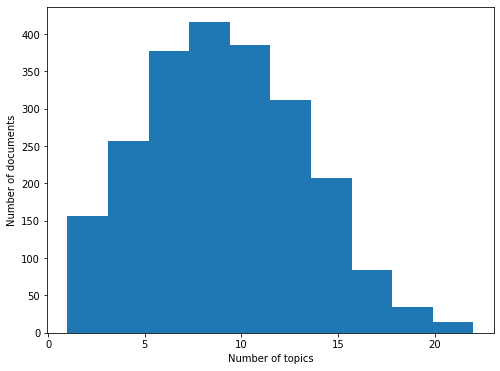

In [5]:
plt.rcParams['figure.figsize'] = [8, 6]
num_topics_used = [len(model[doc]) for doc in corpus]
plt.hist(num_topics_used)
plt.xlabel('Number of topics')
plt.ylabel('Number of documents')

In [6]:
model1 = models.ldamodel.LdaModel(corpus, num_topics = 100, id2word = corpus.id2word, alpha = 1)

Text(0, 0.5, 'Number of documents')

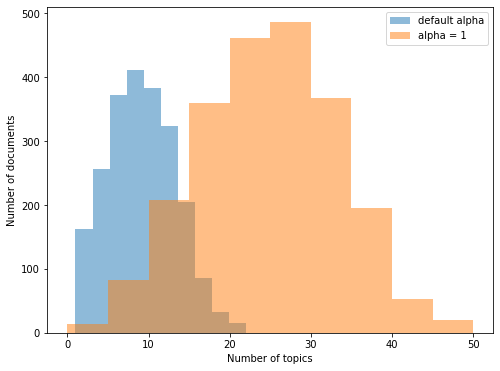

In [7]:
num_topics_used = [len(model[doc]) for doc in corpus]
num_topics_used1 = [len(model1[doc]) for doc in corpus]
plt.hist(num_topics_used, alpha = 0.5, label = 'default alpha')
plt.hist(num_topics_used1, alpha = 0.5, label = 'alpha = 1')
plt.legend(loc = 'upper right')
plt.xlabel('Number of topics')
plt.ylabel('Number of documents')

## Comparing documents by topics

In [12]:
from gensim import matutils
from scipy.spatial import distance

In [9]:
topics = matutils.corpus2dense(model[corpus], num_terms = model.num_topics)

In [10]:
# `topics` is a matrix of topics. pdist calculates all pairwise distances. 
# sum((topics[ti] – topics[tj])**2)
pairwise = distance.squareform(distance.pdist(topics))

# set diagonal elements of the distance matrix to a high value, greater than the other values in the matrix
largest = pairwise.max()
for ti in range(len(topics)):
    pairwise[ti, ti] = largest + 1

In [11]:
# For each document, we can look up the closest element easily (using a type of nearest neighbour classifier)
def closest_to(doc_id):
    return pairwise[doc_id].argmin()

In [12]:
print(closest_to(2))

46


## Modeling the whole of Wikipedia

In [1]:
import logging, gensim

In [3]:
logging.basicConfig(format = '%(asctime)s : %(levelname)s : %(message)s', level = logging.INFO)

In [6]:
# Load the preprocessed data
wiki_output = 'D:\\mllabs\\C4data\\'
id2word = gensim.corpora.Dictionary.load_from_text(wiki_output + 'wiki_en_output_wordids.txt')
mm = gensim.corpora.MmCorpus(wiki_output + 'wiki_en_output_tfidf.mm')

2019-12-30 11:03:18,358 : INFO : loaded corpus index from D:\Srishan\wiki_en_output_tfidf.mm.index
2019-12-30 11:03:18,359 : INFO : initializing cython corpus reader from D:\Srishan\wiki_en_output_tfidf.mm
2019-12-30 11:03:18,360 : INFO : accepted corpus with 4758810 documents, 100000 features, 757100253 non-zero entries


In [8]:
model = gensim.models.ldamodel.LdaModel(corpus = mm,
                                        id2word = id2word,
                                        num_topics = 100,
                                        update_every = 1,
                                        chunksize = 10000,
                                        passes = 1)

2019-12-30 11:05:39,741 : INFO : using symmetric alpha at 0.01
2019-12-30 11:05:39,742 : INFO : using symmetric eta at 0.01
2019-12-30 11:05:39,754 : INFO : using serial LDA version on this node
2019-12-30 11:05:40,679 : INFO : running online (single-pass) LDA training, 100 topics, 1 passes over the supplied corpus of 4758810 documents, updating model once every 10000 documents, evaluating perplexity every 100000 documents, iterating 50x with a convergence threshold of 0.001000
2019-12-30 11:05:49,242 : INFO : PROGRESS: pass 0, at document #10000/4758810
2019-12-30 11:06:26,181 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:06:27,087 : INFO : topic #54 (0.010): 0.003*"alexandria" + 0.002*"kansas" + 0.002*"militia" + 0.002*"honduras" + 0.001*"beethoven" + 0.001*"himachal" + 0.001*"fuerteventura" + 0.001*"canadian" + 0.001*"latin" + 0.001*"animation"
2019-12-30 11:06:27,089 : INFO : topic #91 (0.010): 0.002*"belarus" + 0.002*"malaysia" + 0.0

2019-12-30 11:09:27,541 : INFO : topic #62 (0.010): 0.007*"syndrome" + 0.006*"symptoms" + 0.005*"blood" + 0.005*"disease" + 0.004*"treatment" + 0.003*"drug" + 0.003*"effects" + 0.003*"disorder" + 0.003*"cause" + 0.003*"drugs"
2019-12-30 11:09:27,543 : INFO : topic #52 (0.010): 0.006*"marengo" + 0.006*"emperor" + 0.006*"constantinople" + 0.006*"byzantine" + 0.005*"lauper" + 0.005*"nikephoros" + 0.004*"constantine" + 0.004*"iberville" + 0.004*"romanos" + 0.003*"shelburne"
2019-12-30 11:09:27,585 : INFO : topic diff=0.571831, rho=0.408248
2019-12-30 11:09:29,919 : INFO : PROGRESS: pass 0, at document #70000/4758810
2019-12-30 11:09:40,897 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:09:41,741 : INFO : topic #47 (0.010): 0.011*"king" + 0.005*"emperor" + 0.005*"duke" + 0.004*"pope" + 0.004*"byzantine" + 0.004*"otto" + 0.004*"abbey" + 0.004*"iii" + 0.004*"bc" + 0.004*"melrose"
2019-12-30 11:09:41,743 : INFO : topic #56 (0.010): 0.012*"livingst

2019-12-30 11:12:53,242 : INFO : topic #42 (0.010): 0.004*"award" + 0.004*"starring" + 0.004*"theatre" + 0.004*"films" + 0.003*"actor" + 0.003*"directed" + 0.003*"actress" + 0.003*"movie" + 0.002*"comedy" + 0.002*"role"
2019-12-30 11:12:53,244 : INFO : topic #5 (0.010): 0.008*"dna" + 0.006*"chess" + 0.006*"cells" + 0.005*"gene" + 0.005*"protein" + 0.005*"cell" + 0.005*"game" + 0.004*"rna" + 0.004*"genes" + 0.004*"cards"
2019-12-30 11:12:53,287 : INFO : topic diff=0.498724, rho=0.288675
2019-12-30 11:12:58,068 : INFO : PROGRESS: pass 0, at document #130000/4758810
2019-12-30 11:13:22,464 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:13:23,298 : INFO : topic #84 (0.010): 0.008*"game" + 0.006*"album" + 0.005*"metal" + 0.005*"band" + 0.004*"ep" + 0.004*"rock" + 0.004*"punk" + 0.003*"sound" + 0.003*"games" + 0.003*"video"
2019-12-30 11:13:23,299 : INFO : topic #7 (0.010): 0.049*"bar" + 0.046*"till" + 0.039*"color" + 0.029*"text" + 0.017*"id" +

2019-12-30 11:15:48,256 : INFO : topic #64 (0.010): 0.007*"function" + 0.006*"theorem" + 0.005*"theory" + 0.004*"space" + 0.004*"equation" + 0.004*"numbers" + 0.003*"finite" + 0.003*"vector" + 0.003*"algebra" + 0.003*"functions"
2019-12-30 11:15:48,298 : INFO : topic diff=0.407147, rho=0.235702
2019-12-30 11:15:52,002 : INFO : PROGRESS: pass 0, at document #190000/4758810
2019-12-30 11:16:14,102 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:16:14,957 : INFO : topic #70 (0.010): 0.062*"greek" + 0.059*"greece" + 0.022*"beetles" + 0.022*"athens" + 0.021*"corvette" + 0.016*"cyprus" + 0.014*"papandreou" + 0.014*"thessaloniki" + 0.014*"hellenic" + 0.012*"pasok"
2019-12-30 11:16:14,959 : INFO : topic #39 (0.010): 0.009*"science" + 0.006*"physics" + 0.006*"theory" + 0.006*"sciences" + 0.006*"research" + 0.005*"professor" + 0.005*"mathematics" + 0.004*"technology" + 0.004*"scientific" + 0.004*"mathematician"
2019-12-30 11:16:14,960 : INFO : topic 

2019-12-30 11:18:52,764 : INFO : topic #68 (0.010): 0.011*"china" + 0.010*"chinese" + 0.009*"russian" + 0.009*"soviet" + 0.006*"russia" + 0.005*"oblast" + 0.004*"dynasty" + 0.004*"moscow" + 0.003*"taiwan" + 0.003*"republic"
2019-12-30 11:18:52,807 : INFO : topic diff=0.301794, rho=0.204124
2019-12-30 11:18:56,503 : INFO : PROGRESS: pass 0, at document #250000/4758810
2019-12-30 11:19:17,675 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:19:18,518 : INFO : topic #16 (0.010): 0.019*"municipality" + 0.013*"population" + 0.011*"swedish" + 0.010*"finland" + 0.010*"iceland" + 0.009*"sweden" + 0.009*"finnish" + 0.008*"town" + 0.006*"danish" + 0.006*"norway"
2019-12-30 11:19:18,520 : INFO : topic #30 (0.010): 0.017*"saint" + 0.016*"louis" + 0.015*"france" + 0.015*"french" + 0.013*"bourbon" + 0.010*"jean" + 0.010*"sainte" + 0.010*"paris" + 0.008*"la" + 0.007*"françois"
2019-12-30 11:19:18,520 : INFO : topic #63 (0.010): 0.030*"swiss" + 0.025*"canto

2019-12-30 11:21:46,976 : INFO : topic #54 (0.010): 0.016*"library" + 0.008*"greek" + 0.008*"manuscript" + 0.006*"text" + 0.006*"manuscripts" + 0.005*"mast" + 0.005*"bermuda" + 0.005*"book" + 0.005*"books" + 0.004*"adrenal"
2019-12-30 11:21:47,019 : INFO : topic diff=0.214820, rho=0.182574
2019-12-30 11:21:50,539 : INFO : PROGRESS: pass 0, at document #310000/4758810
2019-12-30 11:22:10,037 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:22:10,892 : INFO : topic #63 (0.010): 0.144*"inn" + 0.027*"swiss" + 0.020*"switzerland" + 0.019*"canton" + 0.018*"glacier" + 0.014*"alps" + 0.013*"pes" + 0.012*"bern" + 0.011*"graphs" + 0.009*"cantons"
2019-12-30 11:22:10,894 : INFO : topic #94 (0.010): 0.006*"plants" + 0.006*"plant" + 0.005*"species" + 0.003*"soil" + 0.003*"leaves" + 0.003*"water" + 0.003*"larvae" + 0.002*"cells" + 0.002*"tree" + 0.002*"flowers"
2019-12-30 11:22:10,896 : INFO : topic #57 (0.010): 0.074*"ab" + 0.057*"calendar" + 0.031*"bc" 

2019-12-30 11:24:07,301 : INFO : topic diff=0.153927, rho=0.166667
2019-12-30 11:24:10,378 : INFO : PROGRESS: pass 0, at document #370000/4758810
2019-12-30 11:24:29,363 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:24:30,237 : INFO : topic #3 (0.010): 0.007*"arms" + 0.006*"flag" + 0.006*"coat" + 0.005*"file" + 0.005*"jpg" + 0.004*"cave" + 0.004*"stone" + 0.004*"coins" + 0.004*"svg" + 0.004*"archaeological"
2019-12-30 11:24:30,238 : INFO : topic #59 (0.010): 0.024*"lunar" + 0.017*"craters" + 0.014*"km" + 0.012*"crater" + 0.011*"satellite" + 0.011*"moon" + 0.010*"observatory" + 0.010*"asteroid" + 0.009*"space" + 0.008*"earth"
2019-12-30 11:24:30,240 : INFO : topic #10 (0.010): 0.007*"comics" + 0.005*"character" + 0.004*"comic" + 0.004*"game" + 0.004*"characters" + 0.004*"marvel" + 0.003*"fantasy" + 0.003*"earth" + 0.003*"story" + 0.002*"dragon"
2019-12-30 11:24:30,242 : INFO : topic #82 (0.010): 0.030*"kampaku" + 0.020*"tokugawa" + 0.018*"

2019-12-30 11:26:50,102 : INFO : topic diff=0.119833, rho=0.154303
2019-12-30 11:26:52,999 : INFO : PROGRESS: pass 0, at document #430000/4758810
2019-12-30 11:27:10,609 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:27:11,464 : INFO : topic #24 (0.010): 0.029*"korea" + 0.018*"korean" + 0.012*"nuclear" + 0.008*"seoul" + 0.008*"reactor" + 0.007*"kim" + 0.007*"energy" + 0.005*"martial" + 0.005*"water" + 0.005*"power"
2019-12-30 11:27:11,466 : INFO : topic #34 (0.010): 0.004*"light" + 0.003*"frequency" + 0.003*"temperature" + 0.003*"signal" + 0.003*"camera" + 0.003*"energy" + 0.003*"image" + 0.003*"optical" + 0.003*"laser" + 0.003*"using"
2019-12-30 11:27:11,467 : INFO : topic #15 (0.010): 0.025*"art" + 0.020*"museum" + 0.010*"painting" + 0.009*"gallery" + 0.008*"paintings" + 0.007*"jpg" + 0.007*"exhibition" + 0.007*"painter" + 0.007*"artists" + 0.006*"collection"
2019-12-30 11:27:11,469 : INFO : topic #28 (0.010): 0.037*"scotland" + 0.034*"s

2019-12-30 11:29:17,691 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:29:18,547 : INFO : topic #55 (0.010): 0.046*"church" + 0.015*"churches" + 0.014*"lutheran" + 0.014*"seminary" + 0.013*"christian" + 0.013*"theology" + 0.012*"evangelical" + 0.012*"baptist" + 0.011*"theological" + 0.011*"presbyterian"
2019-12-30 11:29:18,549 : INFO : topic #71 (0.010): 0.039*"alaska" + 0.021*"morocco" + 0.020*"algeria" + 0.016*"algerian" + 0.016*"niger" + 0.015*"el" + 0.015*"yukon" + 0.012*"moroccan" + 0.011*"sahara" + 0.011*"cannabis"
2019-12-30 11:29:18,550 : INFO : topic #29 (0.010): 0.020*"men" + 0.019*"advance" + 0.016*"olympic" + 0.016*"olympics" + 0.013*"heat" + 0.013*"women" + 0.012*"medal" + 0.010*"round" + 0.010*"championships" + 0.009*"athlete"
2019-12-30 11:29:18,552 : INFO : topic #27 (0.010): 0.020*"party" + 0.020*"election" + 0.011*"parliament" + 0.011*"electoral" + 0.011*"elections" + 0.010*"conservative" + 0.009*"liberal" + 0.008*"riding

2019-12-30 11:31:22,551 : INFO : topic diff=0.081876, rho=0.136083
2019-12-30 11:31:25,360 : INFO : PROGRESS: pass 0, at document #550000/4758810
2019-12-30 11:31:41,120 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:31:41,967 : INFO : topic #12 (0.010): 0.012*"prince" + 0.012*"king" + 0.009*"son" + 0.008*"duke" + 0.008*"princess" + 0.007*"emperor" + 0.007*"daughter" + 0.006*"married" + 0.006*"count" + 0.005*"crown"
2019-12-30 11:31:41,969 : INFO : topic #25 (0.010): 0.014*"roman" + 0.010*"bc" + 0.007*"ottoman" + 0.006*"bulgarian" + 0.006*"turkish" + 0.005*"greek" + 0.005*"empire" + 0.005*"ancient" + 0.004*"bulgaria" + 0.004*"rome"
2019-12-30 11:31:41,970 : INFO : topic #28 (0.010): 0.039*"scottish" + 0.038*"scotland" + 0.023*"glasgow" + 0.022*"edinburgh" + 0.017*"singapore" + 0.012*"malaysia" + 0.011*"loch" + 0.010*"apps" + 0.010*"aberdeen" + 0.010*"copa"
2019-12-30 11:31:41,971 : INFO : topic #66 (0.010): 0.003*"wimbledon" + 0.003*"james

2019-12-30 11:33:44,264 : INFO : topic diff=0.066198, rho=0.129099
2019-12-30 11:33:46,840 : INFO : PROGRESS: pass 0, at document #610000/4758810
2019-12-30 11:34:02,976 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:34:03,829 : INFO : topic #15 (0.010): 0.024*"art" + 0.017*"museum" + 0.010*"painting" + 0.010*"painter" + 0.009*"gallery" + 0.008*"paintings" + 0.007*"artist" + 0.006*"artists" + 0.006*"jpg" + 0.006*"arts"
2019-12-30 11:34:03,830 : INFO : topic #63 (0.010): 0.026*"swiss" + 0.026*"canton" + 0.021*"alps" + 0.019*"cantons" + 0.019*"switzerland" + 0.019*"glacier" + 0.018*"ski" + 0.016*"pass" + 0.013*"alpine" + 0.013*"inn"
2019-12-30 11:34:03,831 : INFO : topic #40 (0.010): 0.023*"india" + 0.014*"indian" + 0.009*"temple" + 0.008*"pakistan" + 0.008*"singh" + 0.006*"tamil" + 0.006*"khan" + 0.006*"sri" + 0.005*"hindu" + 0.005*"delhi"
2019-12-30 11:34:03,833 : INFO : topic #10 (0.010): 0.009*"comics" + 0.005*"comic" + 0.005*"marvel" + 

2019-12-30 11:35:40,896 : INFO : PROGRESS: pass 0, at document #670000/4758810
2019-12-30 11:35:55,604 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:35:56,456 : INFO : topic #97 (0.010): 0.020*"japan" + 0.016*"africa" + 0.016*"prefecture" + 0.012*"african" + 0.011*"station" + 0.008*"japanese" + 0.008*"burkina" + 0.008*"faso" + 0.008*"cape" + 0.007*"tokyo"
2019-12-30 11:35:56,458 : INFO : topic #5 (0.010): 0.021*"baseball" + 0.012*"sox" + 0.011*"league" + 0.009*"pitcher" + 0.009*"chess" + 0.008*"game" + 0.008*"runs" + 0.008*"yankees" + 0.007*"dodgers" + 0.006*"phillies"
2019-12-30 11:35:56,460 : INFO : topic #59 (0.010): 0.038*"star" + 0.023*"magnitude" + 0.022*"sun" + 0.012*"apparent" + 0.011*"velocity" + 0.011*"naked" + 0.010*"earth" + 0.010*"visual" + 0.010*"designation" + 0.009*"classification"
2019-12-30 11:35:56,461 : INFO : topic #49 (0.010): 0.010*"navy" + 0.009*"ship" + 0.007*"naval" + 0.007*"ships" + 0.007*"army" + 0.005*"regimen

2019-12-30 11:37:46,049 : INFO : topic diff=0.051407, rho=0.117851
2019-12-30 11:37:48,432 : INFO : PROGRESS: pass 0, at document #730000/4758810
2019-12-30 11:38:02,616 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:38:03,480 : INFO : topic #50 (0.010): 0.004*"business" + 0.004*"bank" + 0.003*"million" + 0.003*"services" + 0.003*"companies" + 0.003*"financial" + 0.003*"market" + 0.003*"management" + 0.002*"investment" + 0.002*"tax"
2019-12-30 11:38:03,481 : INFO : topic #17 (0.010): 0.026*"al" + 0.020*"persian" + 0.019*"iran" + 0.015*"ibn" + 0.015*"bc" + 0.013*"iranian" + 0.010*"king" + 0.010*"kurdish" + 0.009*"dynasty" + 0.009*"armenian"
2019-12-30 11:38:03,482 : INFO : topic #3 (0.010): 0.007*"coins" + 0.006*"cave" + 0.005*"tomb" + 0.005*"cornwall" + 0.005*"flag" + 0.005*"archaeological" + 0.004*"ancient" + 0.004*"stone" + 0.004*"coin" + 0.004*"archaeology"
2019-12-30 11:38:03,484 : INFO : topic #65 (0.010): 0.018*"town" + 0.011*"german

2019-12-30 11:39:35,039 : INFO : PROGRESS: pass 0, at document #790000/4758810
2019-12-30 11:39:48,730 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:39:49,595 : INFO : topic #56 (0.010): 0.015*"poetry" + 0.012*"poems" + 0.009*"poet" + 0.009*"literature" + 0.009*"literary" + 0.007*"novel" + 0.007*"book" + 0.006*"poem" + 0.006*"works" + 0.006*"books"
2019-12-30 11:39:49,596 : INFO : topic #22 (0.010): 0.022*"jersey" + 0.015*"lighthouse" + 0.012*"avenue" + 0.012*"massachusetts" + 0.011*"rhode" + 0.010*"squash" + 0.010*"island" + 0.009*"parkway" + 0.009*"brooklyn" + 0.008*"hudson"
2019-12-30 11:39:49,598 : INFO : topic #41 (0.010): 0.033*"airport" + 0.024*"aircraft" + 0.018*"air" + 0.009*"flight" + 0.009*"aviation" + 0.008*"airlines" + 0.007*"airline" + 0.006*"runway" + 0.005*"squadron" + 0.005*"flying"
2019-12-30 11:39:49,599 : INFO : topic #66 (0.010): 0.003*"david" + 0.003*"james" + 0.003*"michael" + 0.003*"mike" + 0.002*"jr" + 0.002*"robe

2019-12-30 11:41:33,813 : INFO : topic diff=0.046380, rho=0.109109
2019-12-30 11:41:36,091 : INFO : PROGRESS: pass 0, at document #850000/4758810
2019-12-30 11:41:49,529 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:41:50,398 : INFO : topic #14 (0.010): 0.013*"software" + 0.008*"windows" + 0.007*"computer" + 0.007*"data" + 0.007*"server" + 0.007*"code" + 0.006*"system" + 0.006*"microsoft" + 0.006*"user" + 0.005*"file"
2019-12-30 11:41:50,400 : INFO : topic #1 (0.010): 0.013*"si" + 0.011*"ang" + 0.009*"ni" + 0.008*"ng" + 0.008*"verb" + 0.008*"estadio" + 0.007*"cola" + 0.007*"verbs" + 0.006*"wards" + 0.006*"pronouns"
2019-12-30 11:41:50,402 : INFO : topic #86 (0.010): 0.142*"auckland" + 0.112*"zealand" + 0.055*"wellington" + 0.037*"spartan" + 0.033*"nz" + 0.027*"ret" + 0.026*"deaf" + 0.015*"sparta" + 0.014*"marriage" + 0.013*"qc"
2019-12-30 11:41:50,404 : INFO : topic #98 (0.010): 0.010*"mountains" + 0.010*"mountain" + 0.010*"antarctic" + 0

2019-12-30 11:43:29,580 : INFO : topic diff=0.040431, rho=0.105409
2019-12-30 11:43:31,836 : INFO : PROGRESS: pass 0, at document #910000/4758810
2019-12-30 11:43:44,626 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:43:45,499 : INFO : topic #82 (0.010): 0.027*"ballots" + 0.021*"bosnia" + 0.019*"bosnian" + 0.019*"nsw" + 0.019*"herzegovina" + 0.014*"oda" + 0.013*"wodehouse" + 0.012*"nokia" + 0.012*"wagga" + 0.012*"alum"
2019-12-30 11:43:45,500 : INFO : topic #11 (0.010): 0.021*"chinese" + 0.019*"liu" + 0.018*"li" + 0.017*"emperor" + 0.016*"wang" + 0.015*"han" + 0.015*"wu" + 0.015*"zhang" + 0.013*"kingdoms" + 0.013*"chen"
2019-12-30 11:43:45,502 : INFO : topic #46 (0.010): 0.016*"island" + 0.014*"bridge" + 0.011*"lake" + 0.009*"river" + 0.007*"bay" + 0.007*"beach" + 0.007*"water" + 0.007*"park" + 0.005*"dam" + 0.005*"sea"
2019-12-30 11:43:45,503 : INFO : topic #7 (0.010): 0.052*"till" + 0.044*"bar" + 0.041*"px" + 0.040*"text" + 0.022*"start"

2019-12-30 11:45:20,797 : INFO : topic #90 (0.010): 0.011*"football" + 0.009*"basketball" + 0.008*"nfl" + 0.008*"coach" + 0.007*"league" + 0.006*"game" + 0.006*"championship" + 0.005*"games" + 0.005*"player" + 0.005*"arena"
2019-12-30 11:45:20,799 : INFO : topic #62 (0.010): 0.008*"disease" + 0.008*"syndrome" + 0.006*"treatment" + 0.006*"drug" + 0.006*"symptoms" + 0.006*"cells" + 0.005*"slalom" + 0.005*"blood" + 0.005*"virus" + 0.005*"patients"
2019-12-30 11:45:20,800 : INFO : topic #1 (0.010): 0.016*"estadio" + 0.011*"katakana" + 0.010*"hiragana" + 0.009*"división" + 0.008*"ni" + 0.008*"segunda" + 0.008*"kana" + 0.007*"verb" + 0.007*"rv" + 0.007*"si"
2019-12-30 11:45:20,802 : INFO : topic #29 (0.010): 0.019*"championships" + 0.019*"olympics" + 0.015*"olympic" + 0.013*"medal" + 0.010*"games" + 0.009*"men" + 0.009*"event" + 0.008*"gold" + 0.008*"bronze" + 0.008*"summer"
2019-12-30 11:45:20,803 : INFO : topic #12 (0.010): 0.013*"king" + 0.010*"son" + 0.009*"duke" + 0.008*"prince" + 0.008

2019-12-30 11:47:13,662 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:47:14,530 : INFO : topic #61 (0.010): 0.015*"court" + 0.015*"law" + 0.010*"act" + 0.006*"supreme" + 0.006*"rights" + 0.006*"legal" + 0.005*"justice" + 0.005*"constitution" + 0.004*"federal" + 0.004*"judge"
2019-12-30 11:47:14,532 : INFO : topic #34 (0.010): 0.003*"light" + 0.003*"frequency" + 0.003*"surface" + 0.003*"optical" + 0.003*"pressure" + 0.003*"energy" + 0.003*"signal" + 0.003*"temperature" + 0.003*"system" + 0.002*"magnetic"
2019-12-30 11:47:14,533 : INFO : topic #72 (0.010): 0.090*"nagar" + 0.021*"indonesia" + 0.018*"thailand" + 0.016*"chennai" + 0.016*"uganda" + 0.015*"thai" + 0.014*"indonesian" + 0.012*"kenya" + 0.012*"lucknow" + 0.012*"kanpur"
2019-12-30 11:47:14,534 : INFO : topic #78 (0.010): 0.025*"route" + 0.020*"river" + 0.020*"highway" + 0.014*"lake" + 0.013*"road" + 0.012*"creek" + 0.010*"ny" + 0.010*"park" + 0.007*"trail" + 0.005*"hampshire"
2019-1

2019-12-30 11:48:47,772 : INFO : topic #63 (0.010): 0.041*"bern" + 0.037*"swiss" + 0.028*"glacier" + 0.025*"kindergarten" + 0.023*"orchards" + 0.022*"ski" + 0.020*"campania" + 0.019*"switzerland" + 0.017*"lucerne" + 0.016*"forested"
2019-12-30 11:48:47,774 : INFO : topic #6 (0.010): 0.015*"hospital" + 0.014*"medical" + 0.012*"health" + 0.009*"protein" + 0.008*"medicine" + 0.006*"care" + 0.005*"dna" + 0.005*"proteins" + 0.005*"patients" + 0.005*"surgery"
2019-12-30 11:48:47,776 : INFO : topic #32 (0.010): 0.017*"album" + 0.012*"song" + 0.010*"band" + 0.008*"vocals" + 0.008*"chart" + 0.007*"guitar" + 0.007*"track" + 0.005*"you" + 0.005*"records" + 0.004*"songs"
2019-12-30 11:48:47,777 : INFO : topic #15 (0.010): 0.025*"art" + 0.018*"museum" + 0.010*"gallery" + 0.008*"painting" + 0.007*"paintings" + 0.007*"painter" + 0.007*"arts" + 0.007*"exhibition" + 0.007*"artist" + 0.006*"artists"
2019-12-30 11:48:47,779 : INFO : topic #96 (0.010): 0.014*"news" + 0.011*"magazine" + 0.009*"newspaper" +

2019-12-30 11:50:33,424 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:50:34,285 : INFO : topic #77 (0.010): 0.039*"comune" + 0.020*"italian" + 0.017*"di" + 0.017*"municipality" + 0.016*"municipalities" + 0.016*"borders" + 0.015*"province" + 0.014*"san" + 0.012*"region" + 0.009*"italy"
2019-12-30 11:50:34,287 : INFO : topic #10 (0.010): 0.009*"comics" + 0.006*"comic" + 0.004*"marvel" + 0.004*"character" + 0.004*"fiction" + 0.004*"book" + 0.003*"fantasy" + 0.003*"dragon" + 0.003*"novel" + 0.003*"earth"
2019-12-30 11:50:34,288 : INFO : topic #41 (0.010): 0.029*"airport" + 0.023*"aircraft" + 0.019*"air" + 0.010*"flight" + 0.010*"squadron" + 0.010*"aviation" + 0.006*"airlines" + 0.006*"raf" + 0.006*"force" + 0.006*"runway"
2019-12-30 11:50:34,290 : INFO : topic #30 (0.010): 0.026*"french" + 0.026*"france" + 0.018*"jean" + 0.017*"saint" + 0.014*"paris" + 0.013*"la" + 0.012*"como" + 0.010*"pierre" + 0.010*"louis" + 0.010*"le"
2019-12-30 11:50:34

2019-12-30 11:52:08,453 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:52:09,305 : INFO : topic #34 (0.010): 0.003*"pressure" + 0.003*"light" + 0.003*"system" + 0.003*"frequency" + 0.003*"signal" + 0.003*"surface" + 0.003*"energy" + 0.003*"laser" + 0.003*"temperature" + 0.003*"optical"
2019-12-30 11:52:09,306 : INFO : topic #27 (0.010): 0.017*"election" + 0.015*"party" + 0.011*"elected" + 0.008*"congress" + 0.007*"republican" + 0.007*"parliament" + 0.007*"elections" + 0.007*"democratic" + 0.006*"minister" + 0.006*"constituency"
2019-12-30 11:52:09,308 : INFO : topic #54 (0.010): 0.027*"library" + 0.011*"rowing" + 0.010*"volumes" + 0.008*"edition" + 0.008*"volume" + 0.008*"bermuda" + 0.007*"book" + 0.007*"books" + 0.007*"manuscript" + 0.007*"text"
2019-12-30 11:52:09,310 : INFO : topic #56 (0.010): 0.014*"poetry" + 0.010*"poems" + 0.009*"book" + 0.009*"books" + 0.008*"novel" + 0.008*"literary" + 0.008*"fiction" + 0.008*"poet" + 0.007*"liter

2019-12-30 11:53:28,221 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:53:29,076 : INFO : topic #73 (0.010): 0.011*"episode" + 0.008*"show" + 0.008*"tv" + 0.008*"television" + 0.007*"episodes" + 0.004*"role" + 0.003*"comedy" + 0.003*"bbc" + 0.003*"aired" + 0.003*"appeared"
2019-12-30 11:53:29,077 : INFO : topic #46 (0.010): 0.015*"island" + 0.013*"lake" + 0.011*"river" + 0.011*"bridge" + 0.008*"water" + 0.008*"bay" + 0.007*"dam" + 0.007*"beach" + 0.006*"park" + 0.005*"fishing"
2019-12-30 11:53:29,079 : INFO : topic #85 (0.010): 0.012*"la" + 0.010*"el" + 0.010*"spanish" + 0.009*"argentina" + 0.009*"mexico" + 0.008*"del" + 0.007*"san" + 0.007*"puerto" + 0.007*"argentine" + 0.006*"juan"
2019-12-30 11:53:29,081 : INFO : topic #98 (0.010): 0.015*"mountain" + 0.009*"mountains" + 0.007*"mount" + 0.007*"climate" + 0.007*"river" + 0.007*"summit" + 0.006*"peak" + 0.006*"ridge" + 0.006*"valley" + 0.005*"range"
2019-12-30 11:53:29,083 : INFO : topic #

2019-12-30 11:54:53,012 : INFO : PROGRESS: pass 0, at document #1330000/4758810
2019-12-30 11:55:03,623 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:55:04,479 : INFO : topic #57 (0.010): 0.067*"sacks" + 0.040*"abs" + 0.036*"calendar" + 0.031*"coptic" + 0.031*"sirius" + 0.028*"saturday" + 0.026*"sunday" + 0.025*"novara" + 0.024*"syracuse" + 0.023*"friday"
2019-12-30 11:55:04,481 : INFO : topic #59 (0.010): 0.020*"romanian" + 0.013*"asteroid" + 0.013*"observatory" + 0.012*"hd" + 0.012*"space" + 0.011*"romania" + 0.010*"bucharest" + 0.010*"star" + 0.010*"planet" + 0.009*"orbit"
2019-12-30 11:55:04,482 : INFO : topic #97 (0.010): 0.035*"station" + 0.027*"japan" + 0.015*"africa" + 0.013*"railway" + 0.013*"line" + 0.012*"african" + 0.012*"prefecture" + 0.011*"hiroshima" + 0.011*"jr" + 0.009*"mulder"
2019-12-30 11:55:04,484 : INFO : topic #56 (0.010): 0.016*"poetry" + 0.012*"poems" + 0.011*"poet" + 0.009*"book" + 0.008*"books" + 0.008*"novel" +

2019-12-30 11:56:23,104 : INFO : topic #78 (0.010): 0.027*"highway" + 0.027*"route" + 0.017*"road" + 0.014*"river" + 0.012*"creek" + 0.009*"trail" + 0.009*"px" + 0.008*"intersection" + 0.008*"lake" + 0.007*"us"
2019-12-30 11:56:23,105 : INFO : topic #96 (0.010): 0.014*"news" + 0.011*"magazine" + 0.010*"newspaper" + 0.008*"editor" + 0.007*"daily" + 0.006*"media" + 0.005*"journalism" + 0.005*"press" + 0.005*"weekly" + 0.004*"newspapers"
2019-12-30 11:56:23,107 : INFO : topic #91 (0.010): 0.008*"israel" + 0.007*"israeli" + 0.006*"al" + 0.004*"party" + 0.004*"minister" + 0.004*"jewish" + 0.004*"political" + 0.003*"lebanon" + 0.003*"arab" + 0.003*"saudi"
2019-12-30 11:56:23,108 : INFO : topic #22 (0.010): 0.016*"lighthouse" + 0.015*"avenue" + 0.014*"jersey" + 0.013*"cemeteries" + 0.013*"brooklyn" + 0.012*"island" + 0.011*"rhode" + 0.011*"massachusetts" + 0.010*"biathlon" + 0.009*"decathlon"
2019-12-30 11:56:23,110 : INFO : topic #14 (0.010): 0.014*"software" + 0.008*"computer" + 0.007*"data

2019-12-30 11:57:43,610 : INFO : PROGRESS: pass 0, at document #1450000/4758810
2019-12-30 11:57:53,712 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:57:54,569 : INFO : topic #69 (0.010): 0.016*"voltage" + 0.015*"moth" + 0.014*"moths" + 0.014*"edison" + 0.014*"navajo" + 0.012*"battery" + 0.012*"power" + 0.011*"electric" + 0.011*"dynamo" + 0.011*"thomson"
2019-12-30 11:57:54,571 : INFO : topic #15 (0.010): 0.024*"art" + 0.018*"museum" + 0.012*"painter" + 0.010*"gallery" + 0.010*"painting" + 0.007*"paintings" + 0.007*"artist" + 0.007*"arts" + 0.006*"artists" + 0.006*"exhibition"
2019-12-30 11:57:54,572 : INFO : topic #97 (0.010): 0.030*"station" + 0.024*"japan" + 0.014*"line" + 0.014*"africa" + 0.013*"ghana" + 0.013*"prefecture" + 0.012*"hiroshima" + 0.012*"african" + 0.011*"railway" + 0.010*"japanese"
2019-12-30 11:57:54,574 : INFO : topic #64 (0.010): 0.005*"theory" + 0.005*"fk" + 0.005*"function" + 0.005*"theorem" + 0.004*"equation" + 0.

2019-12-30 11:59:13,501 : INFO : topic diff=0.022964, rho=0.081650
2019-12-30 11:59:15,443 : INFO : PROGRESS: pass 0, at document #1510000/4758810
2019-12-30 11:59:25,333 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 11:59:26,185 : INFO : topic #56 (0.010): 0.015*"poetry" + 0.011*"poems" + 0.010*"poet" + 0.009*"book" + 0.008*"books" + 0.008*"novel" + 0.008*"literary" + 0.008*"literature" + 0.007*"fiction" + 0.006*"writer"
2019-12-30 11:59:26,187 : INFO : topic #50 (0.010): 0.005*"business" + 0.004*"bank" + 0.003*"million" + 0.003*"services" + 0.003*"management" + 0.003*"companies" + 0.003*"financial" + 0.003*"development" + 0.002*"energy" + 0.002*"market"
2019-12-30 11:59:26,188 : INFO : topic #91 (0.010): 0.008*"israel" + 0.007*"israeli" + 0.005*"al" + 0.005*"party" + 0.004*"minister" + 0.004*"palestinian" + 0.004*"political" + 0.004*"arab" + 0.003*"jewish" + 0.003*"palestine"
2019-12-30 11:59:26,190 : INFO : topic #25 (0.010): 0.015*"turki

2019-12-30 12:00:28,427 : INFO : topic diff=0.025038, rho=0.080064
2019-12-30 12:00:30,349 : INFO : PROGRESS: pass 0, at document #1570000/4758810
2019-12-30 12:00:39,616 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:00:40,481 : INFO : topic #87 (0.010): 0.009*"baronet" + 0.006*"politician" + 0.005*"william" + 0.005*"sir" + 0.004*"footballer" + 0.004*"fil" + 0.004*"thomas" + 0.004*"australian" + 0.004*"player" + 0.003*"james"
2019-12-30 12:00:40,481 : INFO : topic #67 (0.010): 0.018*"ohio" + 0.013*"kentucky" + 0.013*"illinois" + 0.013*"congresses" + 0.011*"missouri" + 0.010*"virginia" + 0.010*"indiana" + 0.009*"carolina" + 0.008*"kansas" + 0.008*"alabama"
2019-12-30 12:00:40,483 : INFO : topic #31 (0.010): 0.060*"ireland" + 0.041*"irish" + 0.032*"dublin" + 0.027*"cork" + 0.022*"hurling" + 0.014*"munster" + 0.014*"tackles" + 0.013*"galway" + 0.010*"championship" + 0.010*"gaelic"
2019-12-30 12:00:40,485 : INFO : topic #85 (0.010): 0.013*"la

2019-12-30 12:01:46,967 : INFO : topic diff=0.026586, rho=0.078567
2019-12-30 12:01:48,777 : INFO : PROGRESS: pass 0, at document #1630000/4758810
2019-12-30 12:01:59,175 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:02:00,050 : INFO : topic #15 (0.010): 0.023*"art" + 0.018*"museum" + 0.010*"gallery" + 0.009*"painting" + 0.008*"painter" + 0.007*"paintings" + 0.007*"arts" + 0.006*"artist" + 0.006*"stakes" + 0.006*"artists"
2019-12-30 12:02:00,051 : INFO : topic #95 (0.010): 0.025*"german" + 0.016*"der" + 0.016*"von" + 0.012*"berlin" + 0.012*"und" + 0.011*"germany" + 0.008*"die" + 0.008*"vienna" + 0.008*"austrian" + 0.008*"bundesliga"
2019-12-30 12:02:00,052 : INFO : topic #29 (0.010): 0.027*"championships" + 0.023*"olympics" + 0.017*"medal" + 0.014*"olympic" + 0.011*"event" + 0.010*"bronze" + 0.010*"summer" + 0.009*"games" + 0.009*"men" + 0.009*"silver"
2019-12-30 12:02:00,054 : INFO : topic #2 (0.010): 0.013*"jazz" + 0.010*"ep" + 0.006*"l

2019-12-30 12:03:02,047 : INFO : PROGRESS: pass 0, at document #1690000/4758810
2019-12-30 12:03:11,741 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:03:12,595 : INFO : topic #23 (0.010): 0.007*"battle" + 0.006*"fort" + 0.005*"army" + 0.004*"win" + 0.004*"troops" + 0.003*"boxing" + 0.003*"fight" + 0.003*"tko" + 0.003*"forces" + 0.003*"french"
2019-12-30 12:03:12,596 : INFO : topic #68 (0.010): 0.019*"russian" + 0.014*"soviet" + 0.011*"russia" + 0.010*"moscow" + 0.008*"china" + 0.007*"chinese" + 0.006*"ukrainian" + 0.006*"ukraine" + 0.006*"azerbaijan" + 0.006*"oblast"
2019-12-30 12:03:12,597 : INFO : topic #46 (0.010): 0.016*"lake" + 0.014*"island" + 0.013*"river" + 0.011*"bridge" + 0.008*"water" + 0.007*"bay" + 0.006*"dam" + 0.006*"park" + 0.006*"beach" + 0.006*"fish"
2019-12-30 12:03:12,599 : INFO : topic #37 (0.010): 0.011*"police" + 0.007*"prison" + 0.005*"wrestling" + 0.004*"trial" + 0.004*"murder" + 0.004*"crime" + 0.004*"sentenced" 

2019-12-30 12:04:26,381 : INFO : topic diff=0.028619, rho=0.075810
2019-12-30 12:04:28,189 : INFO : PROGRESS: pass 0, at document #1750000/4758810
2019-12-30 12:04:37,641 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:04:38,499 : INFO : topic #80 (0.010): 0.012*"students" + 0.008*"schools" + 0.005*"education" + 0.005*"campus" + 0.004*"boys" + 0.004*"girls" + 0.004*"student" + 0.003*"secondary" + 0.003*"elementary" + 0.003*"academy"
2019-12-30 12:04:38,500 : INFO : topic #18 (0.010): 0.038*"rovers" + 0.031*"fc" + 0.020*"rangers" + 0.019*"yorkshire" + 0.018*"leeds" + 0.018*"wanderers" + 0.018*"albion" + 0.016*"georgian" + 0.016*"aston" + 0.016*"deoxy"
2019-12-30 12:04:38,502 : INFO : topic #83 (0.010): 0.037*"species" + 0.013*"habitat" + 0.013*"genus" + 0.011*"subtropical" + 0.010*"endemic" + 0.010*"tropical" + 0.009*"threatened" + 0.009*"forests" + 0.008*"moist" + 0.008*"habitats"
2019-12-30 12:04:38,503 : INFO : topic #93 (0.010): 0.017*"b

2019-12-30 12:05:47,426 : INFO : topic #18 (0.010): 0.036*"rovers" + 0.026*"fc" + 0.021*"acyl" + 0.019*"rangers" + 0.017*"georgian" + 0.017*"leeds" + 0.017*"albion" + 0.016*"deoxy" + 0.016*"wanderers" + 0.014*"yorkshire"
2019-12-30 12:05:47,469 : INFO : topic diff=0.028760, rho=0.074536
2019-12-30 12:05:49,187 : INFO : PROGRESS: pass 0, at document #1810000/4758810
2019-12-30 12:05:58,038 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:05:58,897 : INFO : topic #66 (0.010): 0.003*"david" + 0.003*"michael" + 0.003*"jim" + 0.003*"james" + 0.003*"paul" + 0.003*"jack" + 0.003*"steve" + 0.003*"bob" + 0.003*"stooges" + 0.003*"mike"
2019-12-30 12:05:58,899 : INFO : topic #8 (0.010): 0.020*"vfl" + 0.016*"premiership" + 0.012*"geelong" + 0.012*"belongs" + 0.011*"sulfate" + 0.011*"melbourne" + 0.011*"afl" + 0.010*"essendon" + 0.010*"mine" + 0.009*"compound"
2019-12-30 12:05:58,900 : INFO : topic #56 (0.010): 0.012*"poetry" + 0.010*"book" + 0.009*"book

2019-12-30 12:06:57,435 : INFO : topic diff=0.028811, rho=0.073324
2019-12-30 12:06:59,224 : INFO : PROGRESS: pass 0, at document #1870000/4758810
2019-12-30 12:07:08,665 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:07:09,521 : INFO : topic #95 (0.010): 0.026*"german" + 0.018*"der" + 0.017*"von" + 0.013*"und" + 0.012*"berlin" + 0.011*"germany" + 0.009*"die" + 0.009*"vienna" + 0.008*"austrian" + 0.007*"austria"
2019-12-30 12:07:09,523 : INFO : topic #96 (0.010): 0.013*"news" + 0.011*"magazine" + 0.008*"newspaper" + 0.007*"programming" + 0.007*"editor" + 0.007*"media" + 0.005*"daily" + 0.004*"journalism" + 0.004*"weekly" + 0.004*"radio"
2019-12-30 12:07:09,524 : INFO : topic #4 (0.010): 0.053*"polish" + 0.046*"poland" + 0.020*"wrocław" + 0.019*"warsaw" + 0.013*"łódź" + 0.012*"góra" + 0.011*"lublin" + 0.011*"kraków" + 0.009*"silesian" + 0.009*"poznań"
2019-12-30 12:07:09,526 : INFO : topic #12 (0.010): 0.011*"king" + 0.010*"son" + 0.009*"si

2019-12-30 12:08:21,579 : INFO : topic diff=0.022990, rho=0.072169
2019-12-30 12:08:23,325 : INFO : PROGRESS: pass 0, at document #1930000/4758810
2019-12-30 12:08:32,633 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:08:33,488 : INFO : topic #32 (0.010): 0.018*"album" + 0.011*"song" + 0.010*"band" + 0.009*"chart" + 0.008*"vocals" + 0.008*"guitar" + 0.007*"track" + 0.005*"you" + 0.005*"records" + 0.005*"listing"
2019-12-30 12:08:33,490 : INFO : topic #21 (0.010): 0.027*"league" + 0.021*"cup" + 0.020*"football" + 0.014*"goals" + 0.010*"rugby" + 0.010*"footballer" + 0.010*"division" + 0.008*"match" + 0.007*"matches" + 0.007*"player"
2019-12-30 12:08:33,491 : INFO : topic #84 (0.010): 0.025*"game" + 0.008*"player" + 0.006*"games" + 0.006*"gameplay" + 0.005*"ep" + 0.005*"video" + 0.005*"players" + 0.005*"edit" + 0.004*"playstation" + 0.004*"version"
2019-12-30 12:08:33,493 : INFO : topic #69 (0.010): 0.034*"nm" + 0.019*"iata" + 0.019*"watts" +

2019-12-30 12:09:32,607 : INFO : topic diff=0.020001, rho=0.071067
2019-12-30 12:09:34,332 : INFO : PROGRESS: pass 0, at document #1990000/4758810
2019-12-30 12:09:43,565 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:09:44,422 : INFO : topic #32 (0.010): 0.018*"album" + 0.011*"song" + 0.010*"band" + 0.009*"chart" + 0.008*"vocals" + 0.007*"guitar" + 0.007*"track" + 0.006*"you" + 0.005*"records" + 0.005*"listing"
2019-12-30 12:09:44,424 : INFO : topic #98 (0.010): 0.013*"mountain" + 0.010*"antarctic" + 0.009*"mountains" + 0.008*"climate" + 0.007*"river" + 0.007*"mount" + 0.006*"peak" + 0.006*"range" + 0.005*"km" + 0.005*"valley"
2019-12-30 12:09:44,425 : INFO : topic #70 (0.010): 0.109*"greek" + 0.067*"greece" + 0.051*"sofia" + 0.045*"athens" + 0.038*"bulgarian" + 0.037*"macedonian" + 0.029*"cyprus" + 0.026*"cypriot" + 0.026*"macedonia" + 0.024*"bulgaria"
2019-12-30 12:09:44,426 : INFO : topic #40 (0.010): 0.024*"india" + 0.018*"indian" + 0

2019-12-30 12:10:54,901 : INFO : topic diff=0.023623, rho=0.070014
2019-12-30 12:10:56,819 : INFO : PROGRESS: pass 0, at document #2050000/4758810
2019-12-30 12:11:05,624 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:11:06,483 : INFO : topic #95 (0.010): 0.026*"german" + 0.017*"der" + 0.016*"von" + 0.013*"berlin" + 0.012*"und" + 0.012*"germany" + 0.010*"vienna" + 0.009*"austrian" + 0.008*"die" + 0.008*"austria"
2019-12-30 12:11:06,484 : INFO : topic #59 (0.010): 0.038*"asteroid" + 0.023*"planet" + 0.017*"observatory" + 0.017*"albedo" + 0.017*"orbit" + 0.016*"minor" + 0.016*"diameter" + 0.013*"rotation" + 0.012*"magnitude" + 0.012*"asteroids"
2019-12-30 12:11:06,486 : INFO : topic #19 (0.010): 0.078*"kong" + 0.076*"hong" + 0.033*"philippines" + 0.028*"philippine" + 0.022*"china" + 0.022*"var" + 0.022*"wong" + 0.018*"manila" + 0.017*"cheung" + 0.017*"shanghai"
2019-12-30 12:11:06,487 : INFO : topic #79 (0.010): 0.023*"hungarian" + 0.022*"se

2019-12-30 12:12:19,419 : INFO : topic #3 (0.010): 0.007*"archaeological" + 0.006*"site" + 0.006*"cemetery" + 0.005*"cave" + 0.005*"stone" + 0.004*"ancient" + 0.004*"museum" + 0.004*"chimney" + 0.004*"monument" + 0.004*"flag"
2019-12-30 12:12:19,463 : INFO : topic diff=0.028177, rho=0.069007
2019-12-30 12:12:21,233 : INFO : PROGRESS: pass 0, at document #2110000/4758810
2019-12-30 12:12:30,589 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:12:31,447 : INFO : topic #0 (0.010): 0.018*"czech" + 0.013*"qf" + 0.012*"embassy" + 0.011*"prague" + 0.007*"republic" + 0.006*"relations" + 0.006*"weapons" + 0.005*"foreign" + 0.005*"czechoslovakia" + 0.005*"diplomatic"
2019-12-30 12:12:31,448 : INFO : topic #35 (0.010): 0.051*"hockey" + 0.032*"pts" + 0.020*"nhl" + 0.020*"ice" + 0.015*"gf" + 0.013*"gp" + 0.013*"ga" + 0.012*"league" + 0.010*"winnipeg" + 0.009*"hawks"
2019-12-30 12:12:31,450 : INFO : topic #97 (0.010): 0.069*"station" + 0.035*"railway" + 0

2019-12-30 12:13:30,268 : INFO : topic #56 (0.010): 0.013*"poetry" + 0.010*"book" + 0.009*"novel" + 0.009*"books" + 0.008*"literary" + 0.008*"poems" + 0.007*"poet" + 0.007*"literature" + 0.006*"fiction" + 0.006*"author"
2019-12-30 12:13:30,311 : INFO : topic diff=0.019607, rho=0.068041
2019-12-30 12:13:32,147 : INFO : PROGRESS: pass 0, at document #2170000/4758810
2019-12-30 12:13:41,522 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:13:42,379 : INFO : topic #50 (0.010): 0.005*"business" + 0.004*"bank" + 0.003*"million" + 0.003*"services" + 0.003*"management" + 0.003*"financial" + 0.003*"development" + 0.003*"companies" + 0.003*"investment" + 0.003*"economic"
2019-12-30 12:13:42,380 : INFO : topic #20 (0.010): 0.006*"information" + 0.005*"data" + 0.004*"research" + 0.003*"systems" + 0.003*"learning" + 0.003*"management" + 0.003*"project" + 0.003*"system" + 0.002*"analysis" + 0.002*"technology"
2019-12-30 12:13:42,381 : INFO : topic #44 (0.

2019-12-30 12:14:55,540 : INFO : topic #5 (0.010): 0.039*"baseball" + 0.025*"league" + 0.014*"pitcher" + 0.013*"chess" + 0.013*"games" + 0.010*"batted" + 0.009*"sox" + 0.008*"pitched" + 0.007*"yankees" + 0.007*"innings"
2019-12-30 12:14:55,583 : INFO : topic diff=0.019856, rho=0.067116
2019-12-30 12:14:57,288 : INFO : PROGRESS: pass 0, at document #2230000/4758810
2019-12-30 12:15:06,441 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:15:07,300 : INFO : topic #6 (0.010): 0.022*"hospital" + 0.018*"medical" + 0.013*"health" + 0.012*"enzyme" + 0.010*"medicine" + 0.009*"encoded" + 0.008*"protein" + 0.008*"care" + 0.007*"surgery" + 0.007*"patients"
2019-12-30 12:15:07,301 : INFO : topic #37 (0.010): 0.010*"police" + 0.008*"prison" + 0.004*"wrestling" + 0.004*"murder" + 0.004*"arrested" + 0.004*"trial" + 0.003*"crime" + 0.003*"sentenced" + 0.003*"court" + 0.003*"criminal"
2019-12-30 12:15:07,302 : INFO : topic #19 (0.010): 0.068*"kong" + 0.066*"h

2019-12-30 12:16:00,545 : INFO : topic diff=0.022624, rho=0.066227
2019-12-30 12:16:02,464 : INFO : PROGRESS: pass 0, at document #2290000/4758810
2019-12-30 12:16:11,479 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:16:12,337 : INFO : topic #1 (0.010): 0.030*"liga" + 0.017*"división" + 0.015*"madrid" + 0.014*"spain" + 0.013*"spanish" + 0.012*"ine" + 0.011*"segunda" + 0.011*"la" + 0.011*"valencia" + 0.010*"estadio"
2019-12-30 12:16:12,339 : INFO : topic #76 (0.010): 0.023*"population" + 0.021*"municipality" + 0.012*"town" + 0.010*"province" + 0.009*"census" + 0.007*"region" + 0.007*"vietnam" + 0.007*"villages" + 0.007*"rice" + 0.007*"village"
2019-12-30 12:16:12,340 : INFO : topic #34 (0.010): 0.003*"pressure" + 0.003*"optical" + 0.003*"system" + 0.003*"temperature" + 0.003*"surface" + 0.003*"water" + 0.003*"energy" + 0.003*"light" + 0.002*"using" + 0.002*"gas"
2019-12-30 12:16:12,341 : INFO : topic #42 (0.010): 0.010*"theatre" + 0.009*"f

2019-12-30 12:17:23,119 : INFO : topic #13 (0.010): 0.030*"utah" + 0.025*"pga" + 0.020*"byu" + 0.015*"mormon" + 0.014*"dog" + 0.013*"ds" + 0.012*"lp" + 0.012*"dogs" + 0.011*"brigham" + 0.010*"breed"
2019-12-30 12:17:23,162 : INFO : topic diff=0.019451, rho=0.065372
2019-12-30 12:17:24,934 : INFO : PROGRESS: pass 0, at document #2350000/4758810
2019-12-30 12:17:34,189 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:17:35,058 : INFO : topic #40 (0.010): 0.026*"india" + 0.015*"indian" + 0.015*"village" + 0.011*"temple" + 0.010*"tamil" + 0.009*"nepal" + 0.009*"pakistan" + 0.009*"karnataka" + 0.009*"kerala" + 0.007*"singh"
2019-12-30 12:17:35,060 : INFO : topic #9 (0.010): 0.003*"plot" + 0.003*"story" + 0.003*"novel" + 0.002*"man" + 0.002*"love" + 0.002*"mother" + 0.002*"father" + 0.002*"tells" + 0.002*"book" + 0.002*"woman"
2019-12-30 12:17:35,061 : INFO : topic #60 (0.010): 0.032*"freestyle" + 0.014*"barcelona" + 0.014*"cc" + 0.011*"sevens" + 

2019-12-30 12:18:44,949 : INFO : topic #77 (0.010): 0.025*"italian" + 0.017*"di" + 0.013*"italy" + 0.012*"synagogue" + 0.012*"rabbi" + 0.012*"jewish" + 0.008*"rome" + 0.007*"giovanni" + 0.006*"della" + 0.006*"venice"
2019-12-30 12:18:44,992 : INFO : topic diff=0.021365, rho=0.064550
2019-12-30 12:18:46,694 : INFO : PROGRESS: pass 0, at document #2410000/4758810
2019-12-30 12:18:55,736 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:18:56,596 : INFO : topic #21 (0.010): 0.030*"league" + 0.021*"cup" + 0.021*"football" + 0.017*"goals" + 0.012*"rugby" + 0.012*"division" + 0.010*"footballer" + 0.010*"match" + 0.009*"matches" + 0.008*"scored"
2019-12-30 12:18:56,598 : INFO : topic #26 (0.010): 0.033*"japanese" + 0.026*"manga" + 0.018*"japan" + 0.015*"anime" + 0.011*"tokyo" + 0.010*"honda" + 0.007*"theme" + 0.007*"inoue" + 0.006*"hai" + 0.006*"jamaica"
2019-12-30 12:18:56,599 : INFO : topic #86 (0.010): 0.266*"zealand" + 0.107*"auckland" + 0.100*"

2019-12-30 12:19:53,834 : INFO : topic #94 (0.010): 0.017*"larvae" + 0.006*"dorsal" + 0.005*"garden" + 0.005*"botanical" + 0.005*"specimen" + 0.004*"phylum" + 0.004*"plants" + 0.004*"species" + 0.004*"apex" + 0.004*"bark"
2019-12-30 12:19:53,877 : INFO : topic diff=0.017957, rho=0.063758
2019-12-30 12:19:55,663 : INFO : PROGRESS: pass 0, at document #2470000/4758810
2019-12-30 12:20:04,939 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:20:05,800 : INFO : topic #92 (0.010): 0.004*"book" + 0.003*"social" + 0.003*"philosophy" + 0.003*"political" + 0.003*"theory" + 0.003*"women" + 0.002*"movement" + 0.002*"society" + 0.002*"culture" + 0.002*"human"
2019-12-30 12:20:05,802 : INFO : topic #67 (0.010): 0.012*"ohio" + 0.012*"virginia" + 0.011*"kentucky" + 0.010*"tennessee" + 0.010*"maryland" + 0.009*"carolina" + 0.009*"delaware" + 0.008*"kansas" + 0.008*"alabama" + 0.007*"missouri"
2019-12-30 12:20:05,803 : INFO : topic #77 (0.010): 0.026*"italian

2019-12-30 12:21:17,184 : INFO : topic #83 (0.010): 0.033*"species" + 0.022*"genus" + 0.006*"mm" + 0.006*"plants" + 0.005*"genera" + 0.005*"plant" + 0.005*"flowers" + 0.005*"centimeters" + 0.005*"leaves" + 0.004*"flowering"
2019-12-30 12:21:17,227 : INFO : topic diff=0.019192, rho=0.062994
2019-12-30 12:21:18,895 : INFO : PROGRESS: pass 0, at document #2530000/4758810
2019-12-30 12:21:27,649 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:21:28,507 : INFO : topic #83 (0.010): 0.034*"species" + 0.022*"genus" + 0.006*"mm" + 0.006*"plant" + 0.005*"plants" + 0.005*"flowers" + 0.005*"genera" + 0.005*"centimeters" + 0.005*"leaves" + 0.005*"dinosaur"
2019-12-30 12:21:28,509 : INFO : topic #4 (0.010): 0.052*"polish" + 0.040*"szczecin" + 0.029*"poland" + 0.019*"warsaw" + 0.016*"lithuanian" + 0.013*"belarusian" + 0.012*"lithuania" + 0.010*"belarus" + 0.009*"kraków" + 0.009*"poznań"
2019-12-30 12:21:28,510 : INFO : topic #64 (0.010): 0.011*"fk" + 0.00

2019-12-30 12:22:25,753 : INFO : topic diff=0.019381, rho=0.062257
2019-12-30 12:22:27,239 : INFO : PROGRESS: pass 0, at document #2590000/4758810
2019-12-30 12:22:36,257 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:22:37,115 : INFO : topic #53 (0.010): 0.029*"california" + 0.017*"san" + 0.010*"oregon" + 0.009*"los" + 0.009*"angeles" + 0.008*"texas" + 0.007*"francisco" + 0.006*"nevada" + 0.006*"colorado" + 0.006*"santa"
2019-12-30 12:22:37,116 : INFO : topic #83 (0.010): 0.036*"species" + 0.020*"genus" + 0.008*"genera" + 0.006*"mm" + 0.006*"flowers" + 0.006*"plant" + 0.005*"plants" + 0.005*"leaves" + 0.005*"flowering" + 0.005*"centimeters"
2019-12-30 12:22:37,118 : INFO : topic #18 (0.010): 0.045*"rovers" + 0.027*"leeds" + 0.027*"fc" + 0.026*"wigan" + 0.025*"wanderers" + 0.022*"lancashire" + 0.022*"burnley" + 0.019*"hull" + 0.019*"albion" + 0.016*"bolton"
2019-12-30 12:22:37,119 : INFO : topic #49 (0.010): 0.010*"navy" + 0.008*"regiment"

2019-12-30 12:23:46,169 : INFO : topic diff=0.019109, rho=0.061546
2019-12-30 12:23:47,574 : INFO : PROGRESS: pass 0, at document #2650000/4758810
2019-12-30 12:23:56,140 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:23:57,000 : INFO : topic #84 (0.010): 0.025*"game" + 0.008*"player" + 0.007*"ep" + 0.007*"games" + 0.006*"players" + 0.005*"gameplay" + 0.005*"video" + 0.004*"playstation" + 0.004*"edit" + 0.004*"nintendo"
2019-12-30 12:23:57,001 : INFO : topic #38 (0.010): 0.018*"fashion" + 0.015*"ahl" + 0.009*"pilasters" + 0.008*"brand" + 0.008*"clothing" + 0.007*"stores" + 0.006*"doric" + 0.006*"roller" + 0.006*"textile" + 0.006*"orienteering"
2019-12-30 12:23:57,003 : INFO : topic #4 (0.010): 0.056*"polish" + 0.029*"poland" + 0.023*"szczecin" + 0.019*"warsaw" + 0.015*"lithuanian" + 0.012*"lithuania" + 0.011*"belarusian" + 0.009*"belarus" + 0.009*"kraków" + 0.008*"vilnius"
2019-12-30 12:23:57,004 : INFO : topic #97 (0.010): 0.067*"station"

2019-12-30 12:25:07,749 : INFO : topic diff=0.017300, rho=0.060858
2019-12-30 12:25:09,755 : INFO : PROGRESS: pass 0, at document #2710000/4758810
2019-12-30 12:25:18,643 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:25:19,521 : INFO : topic #53 (0.010): 0.028*"california" + 0.016*"san" + 0.009*"oregon" + 0.009*"los" + 0.008*"angeles" + 0.008*"texas" + 0.007*"santa" + 0.007*"francisco" + 0.007*"colorado" + 0.006*"arizona"
2019-12-30 12:25:19,522 : INFO : topic #15 (0.010): 0.024*"art" + 0.018*"museum" + 0.010*"painting" + 0.010*"gallery" + 0.008*"painter" + 0.007*"artist" + 0.007*"exhibition" + 0.007*"paintings" + 0.007*"artists" + 0.006*"arts"
2019-12-30 12:25:19,524 : INFO : topic #62 (0.010): 0.007*"disease" + 0.007*"cells" + 0.006*"protein" + 0.006*"drug" + 0.006*"treatment" + 0.005*"cell" + 0.005*"receptor" + 0.005*"syndrome" + 0.005*"gene" + 0.004*"effects"
2019-12-30 12:25:19,525 : INFO : topic #78 (0.010): 0.022*"historic" + 0.021

2019-12-30 12:26:17,851 : INFO : PROGRESS: pass 0, at document #2770000/4758810
2019-12-30 12:26:26,577 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:26:27,433 : INFO : topic #0 (0.010): 0.068*"czech" + 0.033*"prague" + 0.023*"republic" + 0.017*"statistical" + 0.015*"inactivated" + 0.014*"nad" + 0.014*"municipalities" + 0.012*"brno" + 0.012*"plzeň" + 0.011*"covers"
2019-12-30 12:26:27,434 : INFO : topic #26 (0.010): 0.036*"japanese" + 0.023*"japan" + 0.019*"manga" + 0.018*"anime" + 0.014*"tokyo" + 0.011*"honda" + 0.008*"kenya" + 0.007*"burma" + 0.007*"burmese" + 0.006*"theme"
2019-12-30 12:26:27,436 : INFO : topic #36 (0.010): 0.016*"station" + 0.014*"railway" + 0.009*"line" + 0.005*"road" + 0.005*"rail" + 0.005*"train" + 0.005*"trains" + 0.004*"metro" + 0.004*"street" + 0.004*"bus"
2019-12-30 12:26:27,437 : INFO : topic #64 (0.010): 0.010*"fk" + 0.006*"theory" + 0.005*"function" + 0.005*"mathematical" + 0.004*"quantum" + 0.004*"graph" + 

2019-12-30 12:27:30,286 : INFO : topic diff=0.018067, rho=0.059549
2019-12-30 12:27:31,785 : INFO : PROGRESS: pass 0, at document #2830000/4758810
2019-12-30 12:27:40,801 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:27:41,659 : INFO : topic #69 (0.010): 0.220*"moth" + 0.091*"wingspan" + 0.064*"moths" + 0.043*"larva" + 0.039*"subspecies" + 0.014*"butterflies" + 0.012*"dots" + 0.011*"caterpillars" + 0.010*"navajo" + 0.009*"cooke"
2019-12-30 12:27:41,660 : INFO : topic #98 (0.010): 0.057*"antarctic" + 0.022*"antarctica" + 0.017*"expedition" + 0.015*"mapped" + 0.014*"island" + 0.013*"survey" + 0.012*"names" + 0.012*"mount" + 0.012*"mountains" + 0.012*"islands"
2019-12-30 12:27:41,661 : INFO : topic #34 (0.010): 0.003*"system" + 0.003*"light" + 0.003*"optical" + 0.003*"energy" + 0.003*"temperature" + 0.003*"water" + 0.003*"surface" + 0.003*"pressure" + 0.002*"systems" + 0.002*"lens"
2019-12-30 12:27:41,663 : INFO : topic #47 (0.010): 0.022*"c

2019-12-30 12:28:40,953 : INFO : topic diff=0.018021, rho=0.058926
2019-12-30 12:28:42,897 : INFO : PROGRESS: pass 0, at document #2890000/4758810
2019-12-30 12:28:52,784 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:28:53,649 : INFO : topic #15 (0.010): 0.024*"art" + 0.018*"museum" + 0.010*"gallery" + 0.010*"painter" + 0.010*"painting" + 0.008*"exhibition" + 0.008*"artist" + 0.007*"paintings" + 0.007*"artists" + 0.007*"arts"
2019-12-30 12:28:53,650 : INFO : topic #31 (0.010): 0.054*"ireland" + 0.048*"irish" + 0.035*"dublin" + 0.022*"cork" + 0.021*"hurling" + 0.021*"galway" + 0.019*"mac" + 0.013*"gaelic" + 0.013*"championship" + 0.011*"senior"
2019-12-30 12:28:53,652 : INFO : topic #39 (0.010): 0.012*"research" + 0.011*"professor" + 0.011*"journal" + 0.010*"science" + 0.009*"institute" + 0.007*"engineering" + 0.007*"sciences" + 0.007*"society" + 0.006*"faculty" + 0.006*"studies"
2019-12-30 12:28:53,653 : INFO : topic #66 (0.010): 0.004*"d

2019-12-30 12:30:04,971 : INFO : topic #62 (0.010): 0.009*"protein" + 0.007*"cells" + 0.006*"drug" + 0.006*"disease" + 0.006*"cell" + 0.006*"gene" + 0.005*"proteins" + 0.005*"treatment" + 0.004*"syndrome" + 0.004*"receptor"
2019-12-30 12:30:05,014 : INFO : topic diff=0.015518, rho=0.058321
2019-12-30 12:30:06,537 : INFO : PROGRESS: pass 0, at document #2950000/4758810
2019-12-30 12:30:15,729 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:30:16,590 : INFO : topic #88 (0.010): 0.023*"earthquake" + 0.022*"formation" + 0.020*"glaciology" + 0.019*"subfamily" + 0.018*"fault" + 0.016*"yellowish" + 0.015*"geological" + 0.013*"pomeranian" + 0.012*"geology" + 0.012*"earthquakes"
2019-12-30 12:30:16,592 : INFO : topic #74 (0.010): 0.013*"racing" + 0.010*"car" + 0.009*"race" + 0.008*"engine" + 0.006*"class" + 0.006*"locomotives" + 0.006*"cars" + 0.005*"driver" + 0.005*"ford" + 0.005*"lap"
2019-12-30 12:30:16,593 : INFO : topic #95 (0.010): 0.028*"germ

2019-12-30 12:31:25,855 : INFO : topic #39 (0.010): 0.013*"journal" + 0.012*"research" + 0.011*"professor" + 0.010*"science" + 0.009*"institute" + 0.007*"engineering" + 0.007*"sciences" + 0.006*"society" + 0.006*"studies" + 0.006*"faculty"
2019-12-30 12:31:25,896 : INFO : topic diff=0.014560, rho=0.057735
2019-12-30 12:31:27,475 : INFO : PROGRESS: pass 0, at document #3010000/4758810
2019-12-30 12:31:35,593 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:31:36,458 : INFO : topic #77 (0.010): 0.027*"italian" + 0.019*"di" + 0.017*"italy" + 0.013*"serie" + 0.011*"milan" + 0.010*"rabbi" + 0.010*"jewish" + 0.009*"rome" + 0.007*"della" + 0.007*"giovanni"
2019-12-30 12:31:36,459 : INFO : topic #64 (0.010): 0.009*"fk" + 0.006*"theory" + 0.005*"theorem" + 0.004*"mathematical" + 0.004*"function" + 0.004*"quantum" + 0.004*"mathematics" + 0.003*"algebra" + 0.003*"model" + 0.003*"geometry"
2019-12-30 12:31:36,461 : INFO : topic #83 (0.010): 0.034*"speci

2019-12-30 12:32:33,977 : INFO : topic diff=0.014488, rho=0.057166
2019-12-30 12:32:35,970 : INFO : PROGRESS: pass 0, at document #3070000/4758810
2019-12-30 12:32:44,630 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:32:45,499 : INFO : topic #73 (0.010): 0.011*"episode" + 0.008*"show" + 0.008*"television" + 0.008*"episodes" + 0.007*"tv" + 0.004*"aired" + 0.003*"comedy" + 0.003*"broadcast" + 0.003*"role" + 0.003*"miss"
2019-12-30 12:32:45,501 : INFO : topic #36 (0.010): 0.018*"station" + 0.016*"railway" + 0.010*"line" + 0.005*"train" + 0.005*"road" + 0.005*"rail" + 0.004*"services" + 0.004*"opened" + 0.004*"trains" + 0.004*"bus"
2019-12-30 12:32:45,505 : INFO : topic #11 (0.010): 0.034*"chinese" + 0.028*"li" + 0.025*"wang" + 0.020*"china" + 0.019*"chen" + 0.018*"liu" + 0.017*"zhang" + 0.016*"yang" + 0.014*"dynasty" + 0.013*"emperor"
2019-12-30 12:32:45,507 : INFO : topic #52 (0.010): 0.043*"canadian" + 0.041*"canada" + 0.039*"sabha" + 0.03

2019-12-30 12:33:56,380 : INFO : topic diff=0.015294, rho=0.056614
2019-12-30 12:33:58,057 : INFO : PROGRESS: pass 0, at document #3130000/4758810
2019-12-30 12:34:07,067 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:34:07,929 : INFO : topic #76 (0.010): 0.034*"population" + 0.026*"administrative" + 0.019*"rural" + 0.018*"census" + 0.017*"municipal" + 0.015*"town" + 0.013*"province" + 0.012*"village" + 0.011*"municipality" + 0.010*"center"
2019-12-30 12:34:07,930 : INFO : topic #64 (0.010): 0.009*"fk" + 0.006*"theory" + 0.005*"function" + 0.005*"theorem" + 0.005*"quantum" + 0.004*"mathematical" + 0.004*"mathematics" + 0.003*"model" + 0.003*"equation" + 0.003*"space"
2019-12-30 12:34:07,932 : INFO : topic #1 (0.010): 0.036*"liga" + 0.032*"división" + 0.018*"madrid" + 0.018*"segunda" + 0.018*"cd" + 0.017*"spanish" + 0.014*"primera" + 0.014*"spain" + 0.011*"valencia" + 0.010*"cf"
2019-12-30 12:34:07,933 : INFO : topic #7 (0.010): 0.270*"px" 

2019-12-30 12:35:06,053 : INFO : topic diff=0.014774, rho=0.056077
2019-12-30 12:35:07,490 : INFO : PROGRESS: pass 0, at document #3190000/4758810
2019-12-30 12:35:16,339 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:35:17,197 : INFO : topic #56 (0.010): 0.012*"poetry" + 0.009*"book" + 0.009*"novel" + 0.009*"literary" + 0.008*"poems" + 0.008*"books" + 0.008*"literature" + 0.007*"writer" + 0.007*"poet" + 0.007*"works"
2019-12-30 12:35:17,198 : INFO : topic #11 (0.010): 0.032*"chinese" + 0.028*"li" + 0.023*"wang" + 0.019*"china" + 0.019*"liu" + 0.018*"chen" + 0.018*"zhang" + 0.016*"yang" + 0.015*"wu" + 0.013*"dynasty"
2019-12-30 12:35:17,200 : INFO : topic #35 (0.010): 0.086*"hockey" + 0.046*"pts" + 0.040*"ice" + 0.029*"gf" + 0.029*"gp" + 0.026*"hc" + 0.025*"league" + 0.025*"ga" + 0.015*"nhl" + 0.014*"playoffs"
2019-12-30 12:35:17,201 : INFO : topic #29 (0.010): 0.019*"championships" + 0.012*"medal" + 0.012*"kg" + 0.011*"rank" + 0.011*"even

2019-12-30 12:36:25,791 : INFO : topic diff=0.014972, rho=0.055556
2019-12-30 12:36:27,243 : INFO : PROGRESS: pass 0, at document #3250000/4758810
2019-12-30 12:36:35,554 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:36:36,416 : INFO : topic #90 (0.010): 0.013*"football" + 0.011*"coach" + 0.011*"basketball" + 0.009*"game" + 0.008*"ncaa" + 0.008*"conference" + 0.007*"player" + 0.006*"league" + 0.006*"games" + 0.006*"division"
2019-12-30 12:36:36,417 : INFO : topic #92 (0.010): 0.004*"women" + 0.004*"book" + 0.004*"social" + 0.003*"political" + 0.003*"philosophy" + 0.002*"theory" + 0.002*"movement" + 0.002*"society" + 0.002*"culture" + 0.002*"human"
2019-12-30 12:36:36,418 : INFO : topic #79 (0.010): 0.029*"hungarian" + 0.027*"serbian" + 0.026*"slovenia" + 0.022*"croatian" + 0.017*"serbia" + 0.017*"croatia" + 0.015*"hungary" + 0.015*"municipality" + 0.015*"zagreb" + 0.013*"budapest"
2019-12-30 12:36:36,420 : INFO : topic #61 (0.010): 0.018*

2019-12-30 12:37:42,902 : INFO : topic diff=0.012554, rho=0.055048
2019-12-30 12:37:44,638 : INFO : PROGRESS: pass 0, at document #3310000/4758810
2019-12-30 12:37:53,487 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:37:54,347 : INFO : topic #26 (0.010): 0.042*"japanese" + 0.019*"japan" + 0.016*"anime" + 0.013*"manga" + 0.011*"tokyo" + 0.010*"honda" + 0.009*"myanmar" + 0.009*"hai" + 0.008*"burmese" + 0.007*"bollywood"
2019-12-30 12:37:54,348 : INFO : topic #69 (0.010): 0.205*"moth" + 0.076*"wingspan" + 0.044*"subspecies" + 0.036*"larva" + 0.036*"moths" + 0.022*"butterflies" + 0.016*"dots" + 0.013*"navajo" + 0.011*"watts" + 0.010*"cooke"
2019-12-30 12:37:54,350 : INFO : topic #2 (0.010): 0.015*"jazz" + 0.013*"saxophone" + 0.008*"rpm" + 0.007*"tenor" + 0.007*"piano" + 0.006*"trumpet" + 0.006*"ep" + 0.006*"pg" + 0.005*"allmusic" + 0.005*"compositions"
2019-12-30 12:37:54,351 : INFO : topic #53 (0.010): 0.024*"california" + 0.016*"san" + 0.01

2019-12-30 12:38:51,857 : INFO : topic diff=0.012896, rho=0.054554
2019-12-30 12:38:53,625 : INFO : PROGRESS: pass 0, at document #3370000/4758810
2019-12-30 12:39:02,603 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:39:03,460 : INFO : topic #2 (0.010): 0.014*"jazz" + 0.014*"saxophone" + 0.008*"tenor" + 0.007*"piano" + 0.006*"rpm" + 0.006*"pg" + 0.006*"trumpet" + 0.006*"allmusic" + 0.005*"ep" + 0.005*"compositions"
2019-12-30 12:39:03,461 : INFO : topic #98 (0.010): 0.019*"antarctic" + 0.014*"peak" + 0.012*"mountain" + 0.011*"island" + 0.010*"mountains" + 0.009*"antarctica" + 0.009*"mount" + 0.007*"km" + 0.007*"islands" + 0.007*"expedition"
2019-12-30 12:39:03,463 : INFO : topic #22 (0.010): 0.020*"sussex" + 0.017*"gloucestershire" + 0.013*"squash" + 0.012*"massachusetts" + 0.011*"bates" + 0.011*"hampshire" + 0.011*"rhode" + 0.010*"counties" + 0.009*"jersey" + 0.009*"suffolk"
2019-12-30 12:39:03,464 : INFO : topic #89 (0.010): 0.016*"orch

2019-12-30 12:40:12,475 : INFO : topic diff=0.013320, rho=0.054074
2019-12-30 12:40:14,246 : INFO : PROGRESS: pass 0, at document #3430000/4758810
2019-12-30 12:40:23,680 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:40:24,540 : INFO : topic #16 (0.010): 0.028*"norwegian" + 0.022*"norway" + 0.019*"swedish" + 0.019*"danish" + 0.017*"finnish" + 0.013*"sweden" + 0.013*"denmark" + 0.012*"oslo" + 0.010*"finland" + 0.010*"relay"
2019-12-30 12:40:24,541 : INFO : topic #22 (0.010): 0.018*"sussex" + 0.015*"squash" + 0.014*"gloucestershire" + 0.012*"massachusetts" + 0.011*"rhode" + 0.011*"hampshire" + 0.011*"biathlon" + 0.010*"bates" + 0.009*"jersey" + 0.009*"farmhouse"
2019-12-30 12:40:24,543 : INFO : topic #79 (0.010): 0.030*"serbian" + 0.029*"hungarian" + 0.023*"croatian" + 0.022*"slovenia" + 0.018*"serbia" + 0.017*"croatia" + 0.016*"hungary" + 0.014*"budapest" + 0.014*"zagreb" + 0.014*"municipality"
2019-12-30 12:40:24,545 : INFO : topic #68 (0

2019-12-30 12:41:21,788 : INFO : topic diff=0.012521, rho=0.053606
2019-12-30 12:41:23,541 : INFO : PROGRESS: pass 0, at document #3490000/4758810
2019-12-30 12:41:32,046 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:41:32,905 : INFO : topic #22 (0.010): 0.018*"squash" + 0.016*"sussex" + 0.013*"massachusetts" + 0.013*"gloucestershire" + 0.012*"hampshire" + 0.010*"farmhouse" + 0.010*"rhode" + 0.010*"maine" + 0.009*"gloucester" + 0.009*"boston"
2019-12-30 12:41:32,906 : INFO : topic #3 (0.010): 0.007*"site" + 0.006*"archaeological" + 0.006*"cave" + 0.006*"monument" + 0.005*"jpg" + 0.005*"lighthouse" + 0.005*"monuments" + 0.005*"file" + 0.004*"stone" + 0.004*"statue"
2019-12-30 12:41:32,907 : INFO : topic #82 (0.010): 0.055*"bosnia" + 0.052*"herzegovina" + 0.035*"bosnian" + 0.024*"sarajevo" + 0.019*"nokia" + 0.019*"mandir" + 0.018*"nsw" + 0.016*"norsk" + 0.015*"luka" + 0.015*"srpska"
2019-12-30 12:41:32,909 : INFO : topic #84 (0.010): 0.026*

2019-12-30 12:42:41,438 : INFO : topic diff=0.013108, rho=0.053149
2019-12-30 12:42:43,207 : INFO : PROGRESS: pass 0, at document #3550000/4758810
2019-12-30 12:42:51,997 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:42:52,855 : INFO : topic #26 (0.010): 0.047*"japanese" + 0.022*"japan" + 0.016*"anime" + 0.014*"manga" + 0.012*"tokyo" + 0.011*"kenyan" + 0.010*"hai" + 0.008*"honda" + 0.008*"myanmar" + 0.007*"bollywood"
2019-12-30 12:42:52,857 : INFO : topic #84 (0.010): 0.025*"game" + 0.012*"ep" + 0.006*"games" + 0.006*"player" + 0.005*"playstation" + 0.005*"players" + 0.005*"gameplay" + 0.005*"video" + 0.004*"certifications" + 0.004*"sony"
2019-12-30 12:42:52,858 : INFO : topic #86 (0.010): 0.188*"zealand" + 0.155*"ret" + 0.127*"auckland" + 0.051*"wellington" + 0.032*"nz" + 0.027*"deaf" + 0.017*"zorn" + 0.015*"repealed" + 0.014*"kamen" + 0.014*"dominica"
2019-12-30 12:42:52,860 : INFO : topic #61 (0.010): 0.019*"court" + 0.018*"law" + 0.01

2019-12-30 12:44:01,831 : INFO : topic diff=0.011782, rho=0.052705
2019-12-30 12:44:03,442 : INFO : PROGRESS: pass 0, at document #3610000/4758810
2019-12-30 12:44:11,914 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:44:12,776 : INFO : topic #55 (0.010): 0.088*"church" + 0.032*"hurdles" + 0.024*"presbyterian" + 0.020*"baptist" + 0.018*"churches" + 0.017*"methodist" + 0.016*"congregation" + 0.014*"reformed" + 0.013*"lutheran" + 0.012*"pastor"
2019-12-30 12:44:12,778 : INFO : topic #74 (0.010): 0.017*"racing" + 0.012*"race" + 0.010*"car" + 0.007*"engine" + 0.006*"cars" + 0.006*"driver" + 0.005*"races" + 0.005*"gt" + 0.005*"class" + 0.005*"ford"
2019-12-30 12:44:12,778 : INFO : topic #37 (0.010): 0.010*"police" + 0.006*"prison" + 0.004*"wrestling" + 0.004*"arrested" + 0.003*"murder" + 0.003*"sentenced" + 0.003*"killed" + 0.003*"trial" + 0.003*"investigation" + 0.003*"crime"
2019-12-30 12:44:12,779 : INFO : topic #82 (0.010): 0.051*"bosnia" +

2019-12-30 12:45:11,586 : INFO : PROGRESS: pass 0, at document #3670000/4758810
2019-12-30 12:45:20,041 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:45:20,902 : INFO : topic #51 (0.010): 0.073*"sakha" + 0.029*"bangladesh" + 0.028*"romanized" + 0.021*"malayalam" + 0.017*"khan" + 0.015*"marathi" + 0.014*"hindi" + 0.011*"ahmad" + 0.011*"pakistan" + 0.011*"dhaka"
2019-12-30 12:45:20,903 : INFO : topic #4 (0.010): 0.059*"polish" + 0.032*"poland" + 0.021*"warsaw" + 0.020*"lithuanian" + 0.013*"lithuania" + 0.010*"lgbt" + 0.010*"gay" + 0.009*"jewish" + 0.009*"belarusian" + 0.009*"kraków"
2019-12-30 12:45:20,905 : INFO : topic #13 (0.010): 0.027*"utah" + 0.024*"pga" + 0.021*"ugandan" + 0.017*"dog" + 0.016*"kerman" + 0.016*"wd" + 0.013*"ps" + 0.013*"byu" + 0.012*"dogs" + 0.012*"mottled"
2019-12-30 12:45:20,906 : INFO : topic #78 (0.010): 0.015*"route" + 0.014*"historic" + 0.014*"road" + 0.014*"highway" + 0.013*"listings" + 0.013*"bridge" + 0.012*"

2019-12-30 12:46:26,841 : INFO : topic diff=0.012470, rho=0.051848
2019-12-30 12:46:28,636 : INFO : PROGRESS: pass 0, at document #3730000/4758810
2019-12-30 12:46:36,764 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:46:37,626 : INFO : topic #23 (0.010): 0.007*"battle" + 0.006*"fight" + 0.006*"army" + 0.005*"win" + 0.005*"boxing" + 0.004*"fort" + 0.004*"heavyweight" + 0.004*"troops" + 0.004*"forces" + 0.004*"tko"
2019-12-30 12:46:37,628 : INFO : topic #47 (0.010): 0.025*"church" + 0.020*"bishop" + 0.014*"catholic" + 0.010*"cathedral" + 0.010*"diocese" + 0.008*"parish" + 0.008*"priest" + 0.008*"ordained" + 0.007*"monastery" + 0.007*"pope"
2019-12-30 12:46:37,629 : INFO : topic #10 (0.010): 0.006*"peakposition" + 0.006*"comics" + 0.005*"comic" + 0.005*"animation" + 0.004*"book" + 0.004*"animated" + 0.004*"fantasy" + 0.004*"fiction" + 0.004*"novel" + 0.003*"adventure"
2019-12-30 12:46:37,630 : INFO : topic #20 (0.010): 0.005*"research" + 0.0

2019-12-30 12:47:33,941 : INFO : PROGRESS: pass 0, at document #3790000/4758810
2019-12-30 12:47:42,251 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:47:43,111 : INFO : topic #31 (0.010): 0.041*"irish" + 0.041*"ireland" + 0.026*"dublin" + 0.023*"hurling" + 0.021*"tackles" + 0.019*"cork" + 0.017*"championship" + 0.013*"senior" + 0.012*"munster" + 0.012*"limerick"
2019-12-30 12:47:43,112 : INFO : topic #20 (0.010): 0.005*"research" + 0.005*"data" + 0.004*"information" + 0.003*"development" + 0.003*"social" + 0.003*"project" + 0.003*"learning" + 0.003*"spacewatch" + 0.003*"technology" + 0.003*"program"
2019-12-30 12:47:43,113 : INFO : topic #99 (0.010): 0.034*"village" + 0.031*"census" + 0.030*"population" + 0.029*"community" + 0.027*"township" + 0.021*"unincorporated" + 0.013*"town" + 0.012*"parish" + 0.011*"miles" + 0.010*"office"
2019-12-30 12:47:43,114 : INFO : topic #88 (0.010): 0.065*"formation" + 0.036*"yellowish" + 0.031*"stratigraph

2019-12-30 12:48:51,746 : INFO : topic diff=0.010416, rho=0.051031
2019-12-30 12:48:53,445 : INFO : PROGRESS: pass 0, at document #3850000/4758810
2019-12-30 12:49:02,322 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:49:03,180 : INFO : topic #52 (0.010): 0.041*"canadian" + 0.034*"sabha" + 0.034*"canada" + 0.031*"ontario" + 0.030*"janata" + 0.028*"newfoundland" + 0.027*"scotia" + 0.025*"nova" + 0.025*"shankar" + 0.023*"lok"
2019-12-30 12:49:03,181 : INFO : topic #1 (0.010): 0.040*"liga" + 0.038*"división" + 0.029*"segunda" + 0.019*"cf" + 0.018*"madrid" + 0.016*"spanish" + 0.013*"rv" + 0.012*"primera" + 0.012*"ud" + 0.011*"valencia"
2019-12-30 12:49:03,182 : INFO : topic #63 (0.010): 0.042*"swiss" + 0.034*"glacier" + 0.031*"canton" + 0.024*"switzerland" + 0.024*"alps" + 0.019*"summit" + 0.018*"alpine" + 0.016*"ski" + 0.015*"climbing" + 0.015*"mountain"
2019-12-30 12:49:03,183 : INFO : topic #35 (0.010): 0.072*"hockey" + 0.042*"pts" + 0.029*

2019-12-30 12:50:09,076 : INFO : topic diff=0.012786, rho=0.050637
2019-12-30 12:50:10,759 : INFO : PROGRESS: pass 0, at document #3910000/4758810
2019-12-30 12:50:18,797 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:50:19,662 : INFO : topic #83 (0.010): 0.030*"species" + 0.015*"mm" + 0.011*"genus" + 0.010*"brown" + 0.009*"grey" + 0.009*"dark" + 0.009*"described" + 0.008*"pale" + 0.007*"yellow" + 0.007*"whitish"
2019-12-30 12:50:19,664 : INFO : topic #20 (0.010): 0.005*"research" + 0.005*"data" + 0.004*"information" + 0.003*"project" + 0.003*"development" + 0.003*"social" + 0.003*"learning" + 0.003*"technology" + 0.003*"program" + 0.003*"management"
2019-12-30 12:50:19,666 : INFO : topic #35 (0.010): 0.068*"hockey" + 0.040*"pts" + 0.027*"ice" + 0.020*"nhl" + 0.015*"league" + 0.015*"gp" + 0.014*"tournament" + 0.013*"hc" + 0.013*"bulldogs" + 0.013*"lepidoptera"
2019-12-30 12:50:19,667 : INFO : topic #81 (0.010): 0.034*"brazilian" + 0.030*"b

2019-12-30 12:51:12,351 : INFO : topic diff=0.011115, rho=0.050252
2019-12-30 12:51:13,645 : INFO : PROGRESS: pass 0, at document #3970000/4758810
2019-12-30 12:51:22,109 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:51:22,973 : INFO : topic #56 (0.010): 0.012*"poetry" + 0.012*"novel" + 0.011*"book" + 0.010*"literary" + 0.009*"writer" + 0.008*"literature" + 0.008*"poet" + 0.008*"books" + 0.007*"poems" + 0.007*"fiction"
2019-12-30 12:51:22,974 : INFO : topic #96 (0.010): 0.012*"magazine" + 0.012*"news" + 0.010*"http" + 0.010*"newspaper" + 0.008*"www" + 0.008*"editor" + 0.007*"media" + 0.007*"com" + 0.006*"journalist" + 0.005*"journalism"
2019-12-30 12:51:22,976 : INFO : topic #37 (0.010): 0.010*"police" + 0.006*"prison" + 0.004*"arrested" + 0.003*"murder" + 0.003*"wrestling" + 0.003*"killed" + 0.003*"investigation" + 0.003*"sentenced" + 0.003*"trial" + 0.003*"said"
2019-12-30 12:51:22,977 : INFO : topic #20 (0.010): 0.005*"research" + 0.00

2019-12-30 12:52:35,904 : INFO : topic diff=0.012803, rho=0.049875
2019-12-30 12:52:37,674 : INFO : PROGRESS: pass 0, at document #4030000/4758810
2019-12-30 12:52:46,188 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:52:47,048 : INFO : topic #46 (0.010): 0.016*"river" + 0.014*"lake" + 0.011*"creek" + 0.009*"park" + 0.008*"water" + 0.007*"dam" + 0.007*"island" + 0.007*"porch" + 0.005*"reserve" + 0.005*"stream"
2019-12-30 12:52:47,049 : INFO : topic #8 (0.010): 0.035*"vfl" + 0.032*"albanian" + 0.024*"melbourne" + 0.022*"australian" + 0.021*"streak" + 0.019*"albania" + 0.019*"mine" + 0.015*"essendon" + 0.015*"geelong" + 0.015*"premiership"
2019-12-30 12:52:47,050 : INFO : topic #72 (0.010): 0.046*"sri" + 0.038*"lanka" + 0.028*"indonesia" + 0.026*"uganda" + 0.021*"thailand" + 0.021*"kolkata" + 0.020*"kenya" + 0.019*"bangkok" + 0.018*"indonesian" + 0.017*"thai"
2019-12-30 12:52:47,052 : INFO : topic #53 (0.010): 0.024*"california" + 0.015*"san

2019-12-30 12:53:41,464 : INFO : topic diff=0.012937, rho=0.049507
2019-12-30 12:53:42,934 : INFO : PROGRESS: pass 0, at document #4090000/4758810
2019-12-30 12:53:50,797 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:53:51,660 : INFO : topic #10 (0.010): 0.006*"peakposition" + 0.006*"comics" + 0.005*"comic" + 0.004*"animation" + 0.004*"book" + 0.004*"fiction" + 0.004*"fantasy" + 0.004*"animated" + 0.004*"disney" + 0.003*"character"
2019-12-30 12:53:51,662 : INFO : topic #15 (0.010): 0.028*"art" + 0.018*"museum" + 0.012*"gallery" + 0.012*"painting" + 0.010*"artist" + 0.010*"exhibition" + 0.009*"arts" + 0.008*"painter" + 0.007*"paintings" + 0.007*"artists"
2019-12-30 12:53:51,663 : INFO : topic #69 (0.010): 0.323*"moth" + 0.181*"wingspan" + 0.105*"dots" + 0.038*"cell" + 0.015*"subspecies" + 0.013*"watts" + 0.010*"crimson" + 0.010*"moths" + 0.008*"diffused" + 0.008*"larva"
2019-12-30 12:53:51,664 : INFO : topic #40 (0.010): 0.027*"india" + 0

2019-12-30 12:54:55,824 : INFO : topic diff=0.011816, rho=0.049147
2019-12-30 12:54:57,134 : INFO : PROGRESS: pass 0, at document #4150000/4758810
2019-12-30 12:55:05,040 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:55:05,905 : INFO : topic #66 (0.010): 0.004*"james" + 0.004*"george" + 0.004*"robert" + 0.004*"william" + 0.003*"david" + 0.003*"michael" + 0.003*"cast" + 0.003*"jack" + 0.003*"smith" + 0.003*"paul"
2019-12-30 12:55:05,906 : INFO : topic #78 (0.010): 0.022*"bridge" + 0.022*"arkansas" + 0.018*"highway" + 0.017*"road" + 0.015*"listings" + 0.015*"gable" + 0.014*"route" + 0.012*"historic" + 0.010*"register" + 0.009*"creek"
2019-12-30 12:55:05,907 : INFO : topic #14 (0.010): 0.015*"software" + 0.010*"app" + 0.009*"users" + 0.008*"data" + 0.008*"mobile" + 0.007*"user" + 0.006*"android" + 0.006*"computer" + 0.006*"google" + 0.005*"cloud"
2019-12-30 12:55:05,908 : INFO : topic #45 (0.010): 0.024*"malta" + 0.023*"vermont" + 0.019*"som

2019-12-30 12:56:10,385 : INFO : topic diff=0.011855, rho=0.048795
2019-12-30 12:56:11,935 : INFO : PROGRESS: pass 0, at document #4210000/4758810
2019-12-30 12:56:20,240 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:56:21,101 : INFO : topic #10 (0.010): 0.008*"peakposition" + 0.006*"comics" + 0.006*"comic" + 0.005*"animation" + 0.004*"book" + 0.004*"fiction" + 0.004*"fantasy" + 0.004*"animated" + 0.003*"disney" + 0.003*"character"
2019-12-30 12:56:21,102 : INFO : topic #84 (0.010): 0.026*"game" + 0.013*"ep" + 0.007*"player" + 0.006*"games" + 0.006*"gameplay" + 0.005*"players" + 0.005*"aria" + 0.005*"video" + 0.005*"certifications" + 0.005*"playstation"
2019-12-30 12:56:21,103 : INFO : topic #69 (0.010): 0.268*"moth" + 0.147*"wingspan" + 0.086*"dots" + 0.031*"cell" + 0.021*"watts" + 0.018*"subspecies" + 0.012*"moths" + 0.010*"gila" + 0.009*"crimson" + 0.009*"navajo"
2019-12-30 12:56:21,105 : INFO : topic #51 (0.010): 0.055*"bangladesh" + 

2019-12-30 12:57:23,395 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:57:24,259 : INFO : topic #38 (0.010): 0.031*"fashion" + 0.014*"mla" + 0.013*"bib" + 0.012*"pilasters" + 0.011*"brand" + 0.010*"ahl" + 0.009*"clothing" + 0.009*"designer" + 0.009*"textile" + 0.008*"skating"
2019-12-30 12:57:24,260 : INFO : topic #12 (0.010): 0.011*"son" + 0.010*"king" + 0.010*"married" + 0.009*"daughter" + 0.009*"sir" + 0.009*"castle" + 0.006*"lord" + 0.006*"count" + 0.006*"prince" + 0.006*"wife"
2019-12-30 12:57:24,261 : INFO : topic #11 (0.010): 0.044*"chinese" + 0.034*"china" + 0.032*"li" + 0.029*"wang" + 0.026*"chen" + 0.024*"zhang" + 0.021*"liu" + 0.017*"yang" + 0.015*"lin" + 0.014*"yu"
2019-12-30 12:57:24,263 : INFO : topic #40 (0.010): 0.030*"india" + 0.023*"indian" + 0.015*"village" + 0.012*"singh" + 0.012*"pradesh" + 0.010*"tamil" + 0.010*"punjab" + 0.008*"delhi" + 0.007*"airport" + 0.007*"literacy"
2019-12-30 12:57:24,264 : INFO : topic #81 (0.

2019-12-30 12:58:31,058 : INFO : PROGRESS: pass 0, at document #4330000/4758810
2019-12-30 12:58:39,069 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 12:58:39,945 : INFO : topic #24 (0.010): 0.048*"korean" + 0.042*"korea" + 0.041*"kim" + 0.021*"lee" + 0.021*"jung" + 0.019*"ufc" + 0.016*"jin" + 0.014*"hyun" + 0.014*"hee" + 0.013*"seoul"
2019-12-30 12:58:39,946 : INFO : topic #78 (0.010): 0.020*"bridge" + 0.018*"creek" + 0.018*"route" + 0.016*"road" + 0.015*"highway" + 0.015*"missouri" + 0.011*"arkansas" + 0.011*"stream" + 0.010*"gable" + 0.009*"listings"
2019-12-30 12:58:39,948 : INFO : topic #4 (0.010): 0.050*"polish" + 0.027*"poland" + 0.020*"warsaw" + 0.016*"lithuanian" + 0.012*"belarusian" + 0.012*"lithuania" + 0.011*"lgbt" + 0.010*"minsk" + 0.010*"lviv" + 0.010*"gay"
2019-12-30 12:58:39,949 : INFO : topic #59 (0.010): 0.026*"romanian" + 0.014*"satellite" + 0.013*"galaxy" + 0.012*"romania" + 0.012*"bucharest" + 0.011*"star" + 0.011*"space

2019-12-30 12:59:42,341 : INFO : topic #76 (0.010): 0.028*"village" + 0.026*"population" + 0.018*"census" + 0.018*"workers" + 0.017*"municipality" + 0.011*"marginal" + 0.009*"villages" + 0.008*"town" + 0.007*"demographics" + 0.007*"settlement"
2019-12-30 12:59:42,343 : INFO : topic #70 (0.010): 0.083*"greek" + 0.059*"mollusca" + 0.059*"bulgarian" + 0.048*"greece" + 0.045*"cypriot" + 0.031*"sofia" + 0.030*"bulgaria" + 0.030*"athens" + 0.029*"beetle" + 0.027*"macedonian"
2019-12-30 12:59:42,344 : INFO : topic #63 (0.010): 0.051*"swiss" + 0.029*"canton" + 0.029*"switzerland" + 0.026*"waterfall" + 0.025*"basel" + 0.018*"glacier" + 0.017*"bern" + 0.017*"mountaineers" + 0.015*"climbing" + 0.015*"alpine"
2019-12-30 12:59:42,345 : INFO : topic #79 (0.010): 0.035*"serbian" + 0.030*"serbia" + 0.024*"hungarian" + 0.022*"croatian" + 0.020*"belgrade" + 0.019*"midfielder" + 0.017*"hungary" + 0.016*"croatia" + 0.014*"universiade" + 0.013*"yugoslav"
2019-12-30 12:59:42,346 : INFO : topic #48 (0.010): 

2019-12-30 13:00:56,129 : INFO : topic #67 (0.010): 0.012*"wisconsin" + 0.011*"virginia" + 0.011*"illinois" + 0.008*"tennessee" + 0.008*"carolina" + 0.007*"alabama" + 0.007*"kentucky" + 0.007*"ohio" + 0.006*"indiana" + 0.006*"iowa"
2019-12-30 13:00:56,130 : INFO : topic #63 (0.010): 0.051*"swiss" + 0.028*"switzerland" + 0.026*"basel" + 0.026*"canton" + 0.024*"waterfall" + 0.018*"ski" + 0.016*"glacier" + 0.016*"bern" + 0.016*"alpine" + 0.016*"zurich"
2019-12-30 13:00:56,131 : INFO : topic #72 (0.010): 0.047*"sri" + 0.034*"lanka" + 0.034*"uganda" + 0.032*"indonesia" + 0.029*"thailand" + 0.026*"thai" + 0.021*"lankan" + 0.019*"indonesian" + 0.019*"jakarta" + 0.015*"kenya"
2019-12-30 13:00:56,132 : INFO : topic #31 (0.010): 0.055*"ireland" + 0.041*"irish" + 0.035*"championship" + 0.035*"cork" + 0.031*"hurling" + 0.027*"dublin" + 0.020*"tackles" + 0.019*"gaelic" + 0.014*"senior" + 0.013*"munster"
2019-12-30 13:00:56,133 : INFO : topic #37 (0.010): 0.010*"police" + 0.006*"wrestling" + 0.005*"

2019-12-30 13:01:59,316 : INFO : PROGRESS: pass 0, at document #4510000/4758810
2019-12-30 13:02:07,849 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 13:02:09,836 : INFO : topic #15 (0.010): 0.030*"art" + 0.019*"museum" + 0.012*"gallery" + 0.011*"painting" + 0.010*"exhibition" + 0.009*"artist" + 0.009*"arts" + 0.007*"paintings" + 0.007*"artists" + 0.007*"painter"
2019-12-30 13:02:09,838 : INFO : topic #17 (0.010): 0.089*"al" + 0.035*"mosque" + 0.032*"iran" + 0.030*"iranian" + 0.026*"islamic" + 0.022*"iraq" + 0.021*"ibn" + 0.020*"iraqi" + 0.015*"ali" + 0.014*"persian"
2019-12-30 13:02:09,839 : INFO : topic #98 (0.010): 0.012*"mountain" + 0.009*"parish" + 0.008*"climate" + 0.007*"island" + 0.006*"mountains" + 0.006*"mount" + 0.006*"wales" + 0.006*"river" + 0.005*"km" + 0.005*"peak"
2019-12-30 13:02:09,841 : INFO : topic #97 (0.010): 0.035*"ghana" + 0.027*"africa" + 0.024*"african" + 0.019*"japan" + 0.015*"guinea" + 0.013*"ghanaian" + 0.011*"pr

2019-12-30 13:03:02,708 : INFO : topic diff=0.011244, rho=0.046829
2019-12-30 13:03:04,514 : INFO : PROGRESS: pass 0, at document #4570000/4758810
2019-12-30 13:03:12,701 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 13:03:13,559 : INFO : topic #44 (0.010): 0.028*"language" + 0.021*"surname" + 0.019*"concacaf" + 0.014*"clan" + 0.014*"languages" + 0.010*"sinhala" + 0.010*"indigenous" + 0.009*"dialect" + 0.008*"names" + 0.008*"disambiguation"
2019-12-30 13:03:13,561 : INFO : topic #33 (0.010): 0.044*"dutch" + 0.043*"van" + 0.022*"belgian" + 0.021*"netherlands" + 0.014*"belgium" + 0.014*"amsterdam" + 0.010*"liège" + 0.010*"antwerp" + 0.010*"stade" + 0.009*"brussels"
2019-12-30 13:03:13,562 : INFO : topic #56 (0.010): 0.014*"poetry" + 0.011*"book" + 0.010*"novel" + 0.010*"literary" + 0.009*"literature" + 0.009*"writer" + 0.008*"books" + 0.008*"poems" + 0.007*"poet" + 0.006*"fiction"
2019-12-30 13:03:13,563 : INFO : topic #50 (0.010): 0.006*"busi

2019-12-30 13:04:17,515 : INFO : topic diff=0.010666, rho=0.046524
2019-12-30 13:04:19,091 : INFO : PROGRESS: pass 0, at document #4630000/4758810
2019-12-30 13:04:27,216 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 13:04:28,072 : INFO : topic #69 (0.010): 0.128*"moth" + 0.100*"subspecies" + 0.043*"wingspan" + 0.031*"moths" + 0.025*"butterflies" + 0.025*"dots" + 0.023*"thomson" + 0.021*"caterpillar" + 0.019*"larva" + 0.019*"fen"
2019-12-30 13:04:28,073 : INFO : topic #51 (0.010): 0.059*"bangladesh" + 0.035*"pakistan" + 0.029*"khan" + 0.025*"pakistani" + 0.023*"dhaka" + 0.017*"ahmed" + 0.017*"badminton" + 0.017*"ali" + 0.015*"malayalam" + 0.015*"rahman"
2019-12-30 13:04:28,075 : INFO : topic #77 (0.010): 0.037*"italian" + 0.028*"di" + 0.018*"italy" + 0.011*"giovanni" + 0.010*"milan" + 0.010*"della" + 0.009*"rome" + 0.009*"francesco" + 0.008*"giuseppe" + 0.008*"del"
2019-12-30 13:04:28,076 : INFO : topic #33 (0.010): 0.045*"dutch" + 0.045*"va

2019-12-30 13:05:20,767 : INFO : PROGRESS: pass 0, at document #4690000/4758810
2019-12-30 13:05:28,499 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 13:05:29,363 : INFO : topic #66 (0.010): 0.005*"cast" + 0.004*"james" + 0.003*"jack" + 0.003*"directed" + 0.003*"william" + 0.003*"david" + 0.003*"robert" + 0.003*"george" + 0.003*"silent" + 0.003*"tom"
2019-12-30 13:05:29,364 : INFO : topic #91 (0.010): 0.009*"israel" + 0.008*"minister" + 0.008*"ambassador" + 0.007*"israeli" + 0.006*"foreign" + 0.006*"ministry" + 0.006*"affairs" + 0.005*"president" + 0.005*"jewish" + 0.004*"tel"
2019-12-30 13:05:29,365 : INFO : topic #86 (0.010): 0.190*"zealand" + 0.135*"auckland" + 0.116*"ret" + 0.071*"wellington" + 0.033*"deaf" + 0.028*"nz" + 0.021*"buds" + 0.014*"sparta" + 0.013*"arcadia" + 0.013*"spartan"
2019-12-30 13:05:29,367 : INFO : topic #5 (0.010): 0.054*"tournament" + 0.031*"chess" + 0.024*"semifinals" + 0.023*"baseball" + 0.021*"draw" + 0.019*"see

2019-12-30 13:06:31,399 : INFO : PROGRESS: pass 0, at document #4750000/4758810
2019-12-30 13:06:39,035 : INFO : merging changes from 10000 documents into a model of 4758810 documents
2019-12-30 13:06:39,908 : INFO : topic #15 (0.010): 0.030*"art" + 0.020*"museum" + 0.012*"painting" + 0.012*"gallery" + 0.010*"artist" + 0.009*"exhibition" + 0.009*"paintings" + 0.009*"arts" + 0.007*"painter" + 0.007*"artists"
2019-12-30 13:06:39,909 : INFO : topic #58 (0.010): 0.018*"temple" + 0.006*"god" + 0.005*"buddhist" + 0.004*"text" + 0.004*"bible" + 0.003*"temples" + 0.003*"religious" + 0.003*"hebrew" + 0.003*"shiva" + 0.003*"buddha"
2019-12-30 13:06:39,911 : INFO : topic #20 (0.010): 0.005*"research" + 0.004*"data" + 0.004*"social" + 0.004*"learning" + 0.004*"development" + 0.004*"information" + 0.003*"education" + 0.003*"project" + 0.003*"program" + 0.003*"technology"
2019-12-30 13:06:39,913 : INFO : topic #92 (0.010): 0.011*"women" + 0.005*"book" + 0.004*"social" + 0.004*"political" + 0.004*"ge

In [9]:
model.save(wiki_output+'wiki_lda.pkl')

2019-12-30 13:14:19,565 : INFO : saving LdaState object under D:\Srishan\wiki_lda.pkl.state, separately None
2019-12-30 13:14:20,291 : INFO : saved D:\Srishan\wiki_lda.pkl.state
2019-12-30 13:14:20,329 : INFO : saving LdaModel object under D:\Srishan\wiki_lda.pkl, separately ['expElogbeta', 'sstats']
2019-12-30 13:14:20,330 : INFO : storing np array 'expElogbeta' to D:\Srishan\wiki_lda.pkl.expElogbeta.npy
2019-12-30 13:14:20,744 : INFO : not storing attribute state
2019-12-30 13:14:20,744 : INFO : not storing attribute id2word
2019-12-30 13:14:20,745 : INFO : not storing attribute dispatcher
2019-12-30 13:14:20,748 : INFO : saved D:\Srishan\wiki_lda.pkl


In [10]:
model.save('wiki_lda.pkl')

2019-12-30 13:15:30,754 : INFO : saving LdaState object under wiki_lda.pkl.state, separately None
2019-12-30 13:15:30,984 : INFO : saved wiki_lda.pkl.state
2019-12-30 13:15:31,020 : INFO : saving LdaModel object under wiki_lda.pkl, separately ['expElogbeta', 'sstats']
2019-12-30 13:15:31,021 : INFO : storing np array 'expElogbeta' to wiki_lda.pkl.expElogbeta.npy
2019-12-30 13:15:31,106 : INFO : not storing attribute state
2019-12-30 13:15:31,106 : INFO : not storing attribute id2word
2019-12-30 13:15:31,107 : INFO : not storing attribute dispatcher
2019-12-30 13:15:31,109 : INFO : saved wiki_lda.pkl


In [28]:
# Compute the document/topic matrix
# Only 1/10 of 4,758,810 documents is considered for now
mm_len10 = len(mm)/10
mm_len10 = int(mm_len10)
topics = np.zeros((mm_len10, model.num_topics))

In [29]:
i = 0
for di, doc in enumerate(mm[:mm_len10]):
    doc_top = model[doc]
    i += 1
    print(i, '/', mm_len10)
    for ti, tv in doc_top:
        topics[di, ti] += tv
np.save('topics.npy', topics)

1 / 475881
2 / 475881
3 / 475881
4 / 475881
5 / 475881
6 / 475881
7 / 475881
8 / 475881
9 / 475881
10 / 475881
11 / 475881
12 / 475881
13 / 475881
14 / 475881
15 / 475881
16 / 475881
17 / 475881
18 / 475881
19 / 475881
20 / 475881
21 / 475881
22 / 475881
23 / 475881
24 / 475881
25 / 475881
26 / 475881
27 / 475881
28 / 475881
29 / 475881
30 / 475881
31 / 475881
32 / 475881
33 / 475881
34 / 475881
35 / 475881
36 / 475881
37 / 475881
38 / 475881
39 / 475881
40 / 475881
41 / 475881
42 / 475881
43 / 475881
44 / 475881
45 / 475881
46 / 475881
47 / 475881
48 / 475881
49 / 475881
50 / 475881
51 / 475881
52 / 475881
53 / 475881
54 / 475881
55 / 475881
56 / 475881
57 / 475881
58 / 475881
59 / 475881
60 / 475881
61 / 475881
62 / 475881
63 / 475881
64 / 475881
65 / 475881
66 / 475881
67 / 475881
68 / 475881
69 / 475881
70 / 475881
71 / 475881
72 / 475881
73 / 475881
74 / 475881
75 / 475881
76 / 475881
77 / 475881
78 / 475881
79 / 475881
80 / 475881
81 / 475881
82 / 475881
83 / 475881
84 / 475881
8

647 / 475881
648 / 475881
649 / 475881
650 / 475881
651 / 475881
652 / 475881
653 / 475881
654 / 475881
655 / 475881
656 / 475881
657 / 475881
658 / 475881
659 / 475881
660 / 475881
661 / 475881
662 / 475881
663 / 475881
664 / 475881
665 / 475881
666 / 475881
667 / 475881
668 / 475881
669 / 475881
670 / 475881
671 / 475881
672 / 475881
673 / 475881
674 / 475881
675 / 475881
676 / 475881
677 / 475881
678 / 475881
679 / 475881
680 / 475881
681 / 475881
682 / 475881
683 / 475881
684 / 475881
685 / 475881
686 / 475881
687 / 475881
688 / 475881
689 / 475881
690 / 475881
691 / 475881
692 / 475881
693 / 475881
694 / 475881
695 / 475881
696 / 475881
697 / 475881
698 / 475881
699 / 475881
700 / 475881
701 / 475881
702 / 475881
703 / 475881
704 / 475881
705 / 475881
706 / 475881
707 / 475881
708 / 475881
709 / 475881
710 / 475881
711 / 475881
712 / 475881
713 / 475881
714 / 475881
715 / 475881
716 / 475881
717 / 475881
718 / 475881
719 / 475881
720 / 475881
721 / 475881
722 / 475881
723 / 475881

1266 / 475881
1267 / 475881
1268 / 475881
1269 / 475881
1270 / 475881
1271 / 475881
1272 / 475881
1273 / 475881
1274 / 475881
1275 / 475881
1276 / 475881
1277 / 475881
1278 / 475881
1279 / 475881
1280 / 475881
1281 / 475881
1282 / 475881
1283 / 475881
1284 / 475881
1285 / 475881
1286 / 475881
1287 / 475881
1288 / 475881
1289 / 475881
1290 / 475881
1291 / 475881
1292 / 475881
1293 / 475881
1294 / 475881
1295 / 475881
1296 / 475881
1297 / 475881
1298 / 475881
1299 / 475881
1300 / 475881
1301 / 475881
1302 / 475881
1303 / 475881
1304 / 475881
1305 / 475881
1306 / 475881
1307 / 475881
1308 / 475881
1309 / 475881
1310 / 475881
1311 / 475881
1312 / 475881
1313 / 475881
1314 / 475881
1315 / 475881
1316 / 475881
1317 / 475881
1318 / 475881
1319 / 475881
1320 / 475881
1321 / 475881
1322 / 475881
1323 / 475881
1324 / 475881
1325 / 475881
1326 / 475881
1327 / 475881
1328 / 475881
1329 / 475881
1330 / 475881
1331 / 475881
1332 / 475881
1333 / 475881
1334 / 475881
1335 / 475881
1336 / 475881
1337 /

2485 / 475881
2486 / 475881
2487 / 475881
2488 / 475881
2489 / 475881
2490 / 475881
2491 / 475881
2492 / 475881
2493 / 475881
2494 / 475881
2495 / 475881
2496 / 475881
2497 / 475881
2498 / 475881
2499 / 475881
2500 / 475881
2501 / 475881
2502 / 475881
2503 / 475881
2504 / 475881
2505 / 475881
2506 / 475881
2507 / 475881
2508 / 475881
2509 / 475881
2510 / 475881
2511 / 475881
2512 / 475881
2513 / 475881
2514 / 475881
2515 / 475881
2516 / 475881
2517 / 475881
2518 / 475881
2519 / 475881
2520 / 475881
2521 / 475881
2522 / 475881
2523 / 475881
2524 / 475881
2525 / 475881
2526 / 475881
2527 / 475881
2528 / 475881
2529 / 475881
2530 / 475881
2531 / 475881
2532 / 475881
2533 / 475881
2534 / 475881
2535 / 475881
2536 / 475881
2537 / 475881
2538 / 475881
2539 / 475881
2540 / 475881
2541 / 475881
2542 / 475881
2543 / 475881
2544 / 475881
2545 / 475881
2546 / 475881
2547 / 475881
2548 / 475881
2549 / 475881
2550 / 475881
2551 / 475881
2552 / 475881
2553 / 475881
2554 / 475881
2555 / 475881
2556 /

3098 / 475881
3099 / 475881
3100 / 475881
3101 / 475881
3102 / 475881
3103 / 475881
3104 / 475881
3105 / 475881
3106 / 475881
3107 / 475881
3108 / 475881
3109 / 475881
3110 / 475881
3111 / 475881
3112 / 475881
3113 / 475881
3114 / 475881
3115 / 475881
3116 / 475881
3117 / 475881
3118 / 475881
3119 / 475881
3120 / 475881
3121 / 475881
3122 / 475881
3123 / 475881
3124 / 475881
3125 / 475881
3126 / 475881
3127 / 475881
3128 / 475881
3129 / 475881
3130 / 475881
3131 / 475881
3132 / 475881
3133 / 475881
3134 / 475881
3135 / 475881
3136 / 475881
3137 / 475881
3138 / 475881
3139 / 475881
3140 / 475881
3141 / 475881
3142 / 475881
3143 / 475881
3144 / 475881
3145 / 475881
3146 / 475881
3147 / 475881
3148 / 475881
3149 / 475881
3150 / 475881
3151 / 475881
3152 / 475881
3153 / 475881
3154 / 475881
3155 / 475881
3156 / 475881
3157 / 475881
3158 / 475881
3159 / 475881
3160 / 475881
3161 / 475881
3162 / 475881
3163 / 475881
3164 / 475881
3165 / 475881
3166 / 475881
3167 / 475881
3168 / 475881
3169 /

3707 / 475881
3708 / 475881
3709 / 475881
3710 / 475881
3711 / 475881
3712 / 475881
3713 / 475881
3714 / 475881
3715 / 475881
3716 / 475881
3717 / 475881
3718 / 475881
3719 / 475881
3720 / 475881
3721 / 475881
3722 / 475881
3723 / 475881
3724 / 475881
3725 / 475881
3726 / 475881
3727 / 475881
3728 / 475881
3729 / 475881
3730 / 475881
3731 / 475881
3732 / 475881
3733 / 475881
3734 / 475881
3735 / 475881
3736 / 475881
3737 / 475881
3738 / 475881
3739 / 475881
3740 / 475881
3741 / 475881
3742 / 475881
3743 / 475881
3744 / 475881
3745 / 475881
3746 / 475881
3747 / 475881
3748 / 475881
3749 / 475881
3750 / 475881
3751 / 475881
3752 / 475881
3753 / 475881
3754 / 475881
3755 / 475881
3756 / 475881
3757 / 475881
3758 / 475881
3759 / 475881
3760 / 475881
3761 / 475881
3762 / 475881
3763 / 475881
3764 / 475881
3765 / 475881
3766 / 475881
3767 / 475881
3768 / 475881
3769 / 475881
3770 / 475881
3771 / 475881
3772 / 475881
3773 / 475881
3774 / 475881
3775 / 475881
3776 / 475881
3777 / 475881
3778 /

4334 / 475881
4335 / 475881
4336 / 475881
4337 / 475881
4338 / 475881
4339 / 475881
4340 / 475881
4341 / 475881
4342 / 475881
4343 / 475881
4344 / 475881
4345 / 475881
4346 / 475881
4347 / 475881
4348 / 475881
4349 / 475881
4350 / 475881
4351 / 475881
4352 / 475881
4353 / 475881
4354 / 475881
4355 / 475881
4356 / 475881
4357 / 475881
4358 / 475881
4359 / 475881
4360 / 475881
4361 / 475881
4362 / 475881
4363 / 475881
4364 / 475881
4365 / 475881
4366 / 475881
4367 / 475881
4368 / 475881
4369 / 475881
4370 / 475881
4371 / 475881
4372 / 475881
4373 / 475881
4374 / 475881
4375 / 475881
4376 / 475881
4377 / 475881
4378 / 475881
4379 / 475881
4380 / 475881
4381 / 475881
4382 / 475881
4383 / 475881
4384 / 475881
4385 / 475881
4386 / 475881
4387 / 475881
4388 / 475881
4389 / 475881
4390 / 475881
4391 / 475881
4392 / 475881
4393 / 475881
4394 / 475881
4395 / 475881
4396 / 475881
4397 / 475881
4398 / 475881
4399 / 475881
4400 / 475881
4401 / 475881
4402 / 475881
4403 / 475881
4404 / 475881
4405 /

4964 / 475881
4965 / 475881
4966 / 475881
4967 / 475881
4968 / 475881
4969 / 475881
4970 / 475881
4971 / 475881
4972 / 475881
4973 / 475881
4974 / 475881
4975 / 475881
4976 / 475881
4977 / 475881
4978 / 475881
4979 / 475881
4980 / 475881
4981 / 475881
4982 / 475881
4983 / 475881
4984 / 475881
4985 / 475881
4986 / 475881
4987 / 475881
4988 / 475881
4989 / 475881
4990 / 475881
4991 / 475881
4992 / 475881
4993 / 475881
4994 / 475881
4995 / 475881
4996 / 475881
4997 / 475881
4998 / 475881
4999 / 475881
5000 / 475881
5001 / 475881
5002 / 475881
5003 / 475881
5004 / 475881
5005 / 475881
5006 / 475881
5007 / 475881
5008 / 475881
5009 / 475881
5010 / 475881
5011 / 475881
5012 / 475881
5013 / 475881
5014 / 475881
5015 / 475881
5016 / 475881
5017 / 475881
5018 / 475881
5019 / 475881
5020 / 475881
5021 / 475881
5022 / 475881
5023 / 475881
5024 / 475881
5025 / 475881
5026 / 475881
5027 / 475881
5028 / 475881
5029 / 475881
5030 / 475881
5031 / 475881
5032 / 475881
5033 / 475881
5034 / 475881
5035 /

5589 / 475881
5590 / 475881
5591 / 475881
5592 / 475881
5593 / 475881
5594 / 475881
5595 / 475881
5596 / 475881
5597 / 475881
5598 / 475881
5599 / 475881
5600 / 475881
5601 / 475881
5602 / 475881
5603 / 475881
5604 / 475881
5605 / 475881
5606 / 475881
5607 / 475881
5608 / 475881
5609 / 475881
5610 / 475881
5611 / 475881
5612 / 475881
5613 / 475881
5614 / 475881
5615 / 475881
5616 / 475881
5617 / 475881
5618 / 475881
5619 / 475881
5620 / 475881
5621 / 475881
5622 / 475881
5623 / 475881
5624 / 475881
5625 / 475881
5626 / 475881
5627 / 475881
5628 / 475881
5629 / 475881
5630 / 475881
5631 / 475881
5632 / 475881
5633 / 475881
5634 / 475881
5635 / 475881
5636 / 475881
5637 / 475881
5638 / 475881
5639 / 475881
5640 / 475881
5641 / 475881
5642 / 475881
5643 / 475881
5644 / 475881
5645 / 475881
5646 / 475881
5647 / 475881
5648 / 475881
5649 / 475881
5650 / 475881
5651 / 475881
5652 / 475881
5653 / 475881
5654 / 475881
5655 / 475881
5656 / 475881
5657 / 475881
5658 / 475881
5659 / 475881
5660 /

6207 / 475881
6208 / 475881
6209 / 475881
6210 / 475881
6211 / 475881
6212 / 475881
6213 / 475881
6214 / 475881
6215 / 475881
6216 / 475881
6217 / 475881
6218 / 475881
6219 / 475881
6220 / 475881
6221 / 475881
6222 / 475881
6223 / 475881
6224 / 475881
6225 / 475881
6226 / 475881
6227 / 475881
6228 / 475881
6229 / 475881
6230 / 475881
6231 / 475881
6232 / 475881
6233 / 475881
6234 / 475881
6235 / 475881
6236 / 475881
6237 / 475881
6238 / 475881
6239 / 475881
6240 / 475881
6241 / 475881
6242 / 475881
6243 / 475881
6244 / 475881
6245 / 475881
6246 / 475881
6247 / 475881
6248 / 475881
6249 / 475881
6250 / 475881
6251 / 475881
6252 / 475881
6253 / 475881
6254 / 475881
6255 / 475881
6256 / 475881
6257 / 475881
6258 / 475881
6259 / 475881
6260 / 475881
6261 / 475881
6262 / 475881
6263 / 475881
6264 / 475881
6265 / 475881
6266 / 475881
6267 / 475881
6268 / 475881
6269 / 475881
6270 / 475881
6271 / 475881
6272 / 475881
6273 / 475881
6274 / 475881
6275 / 475881
6276 / 475881
6277 / 475881
6278 /

7415 / 475881
7416 / 475881
7417 / 475881
7418 / 475881
7419 / 475881
7420 / 475881
7421 / 475881
7422 / 475881
7423 / 475881
7424 / 475881
7425 / 475881
7426 / 475881
7427 / 475881
7428 / 475881
7429 / 475881
7430 / 475881
7431 / 475881
7432 / 475881
7433 / 475881
7434 / 475881
7435 / 475881
7436 / 475881
7437 / 475881
7438 / 475881
7439 / 475881
7440 / 475881
7441 / 475881
7442 / 475881
7443 / 475881
7444 / 475881
7445 / 475881
7446 / 475881
7447 / 475881
7448 / 475881
7449 / 475881
7450 / 475881
7451 / 475881
7452 / 475881
7453 / 475881
7454 / 475881
7455 / 475881
7456 / 475881
7457 / 475881
7458 / 475881
7459 / 475881
7460 / 475881
7461 / 475881
7462 / 475881
7463 / 475881
7464 / 475881
7465 / 475881
7466 / 475881
7467 / 475881
7468 / 475881
7469 / 475881
7470 / 475881
7471 / 475881
7472 / 475881
7473 / 475881
7474 / 475881
7475 / 475881
7476 / 475881
7477 / 475881
7478 / 475881
7479 / 475881
7480 / 475881
7481 / 475881
7482 / 475881
7483 / 475881
7484 / 475881
7485 / 475881
7486 /

8021 / 475881
8022 / 475881
8023 / 475881
8024 / 475881
8025 / 475881
8026 / 475881
8027 / 475881
8028 / 475881
8029 / 475881
8030 / 475881
8031 / 475881
8032 / 475881
8033 / 475881
8034 / 475881
8035 / 475881
8036 / 475881
8037 / 475881
8038 / 475881
8039 / 475881
8040 / 475881
8041 / 475881
8042 / 475881
8043 / 475881
8044 / 475881
8045 / 475881
8046 / 475881
8047 / 475881
8048 / 475881
8049 / 475881
8050 / 475881
8051 / 475881
8052 / 475881
8053 / 475881
8054 / 475881
8055 / 475881
8056 / 475881
8057 / 475881
8058 / 475881
8059 / 475881
8060 / 475881
8061 / 475881
8062 / 475881
8063 / 475881
8064 / 475881
8065 / 475881
8066 / 475881
8067 / 475881
8068 / 475881
8069 / 475881
8070 / 475881
8071 / 475881
8072 / 475881
8073 / 475881
8074 / 475881
8075 / 475881
8076 / 475881
8077 / 475881
8078 / 475881
8079 / 475881
8080 / 475881
8081 / 475881
8082 / 475881
8083 / 475881
8084 / 475881
8085 / 475881
8086 / 475881
8087 / 475881
8088 / 475881
8089 / 475881
8090 / 475881
8091 / 475881
8092 /

8649 / 475881
8650 / 475881
8651 / 475881
8652 / 475881
8653 / 475881
8654 / 475881
8655 / 475881
8656 / 475881
8657 / 475881
8658 / 475881
8659 / 475881
8660 / 475881
8661 / 475881
8662 / 475881
8663 / 475881
8664 / 475881
8665 / 475881
8666 / 475881
8667 / 475881
8668 / 475881
8669 / 475881
8670 / 475881
8671 / 475881
8672 / 475881
8673 / 475881
8674 / 475881
8675 / 475881
8676 / 475881
8677 / 475881
8678 / 475881
8679 / 475881
8680 / 475881
8681 / 475881
8682 / 475881
8683 / 475881
8684 / 475881
8685 / 475881
8686 / 475881
8687 / 475881
8688 / 475881
8689 / 475881
8690 / 475881
8691 / 475881
8692 / 475881
8693 / 475881
8694 / 475881
8695 / 475881
8696 / 475881
8697 / 475881
8698 / 475881
8699 / 475881
8700 / 475881
8701 / 475881
8702 / 475881
8703 / 475881
8704 / 475881
8705 / 475881
8706 / 475881
8707 / 475881
8708 / 475881
8709 / 475881
8710 / 475881
8711 / 475881
8712 / 475881
8713 / 475881
8714 / 475881
8715 / 475881
8716 / 475881
8717 / 475881
8718 / 475881
8719 / 475881
8720 /

9277 / 475881
9278 / 475881
9279 / 475881
9280 / 475881
9281 / 475881
9282 / 475881
9283 / 475881
9284 / 475881
9285 / 475881
9286 / 475881
9287 / 475881
9288 / 475881
9289 / 475881
9290 / 475881
9291 / 475881
9292 / 475881
9293 / 475881
9294 / 475881
9295 / 475881
9296 / 475881
9297 / 475881
9298 / 475881
9299 / 475881
9300 / 475881
9301 / 475881
9302 / 475881
9303 / 475881
9304 / 475881
9305 / 475881
9306 / 475881
9307 / 475881
9308 / 475881
9309 / 475881
9310 / 475881
9311 / 475881
9312 / 475881
9313 / 475881
9314 / 475881
9315 / 475881
9316 / 475881
9317 / 475881
9318 / 475881
9319 / 475881
9320 / 475881
9321 / 475881
9322 / 475881
9323 / 475881
9324 / 475881
9325 / 475881
9326 / 475881
9327 / 475881
9328 / 475881
9329 / 475881
9330 / 475881
9331 / 475881
9332 / 475881
9333 / 475881
9334 / 475881
9335 / 475881
9336 / 475881
9337 / 475881
9338 / 475881
9339 / 475881
9340 / 475881
9341 / 475881
9342 / 475881
9343 / 475881
9344 / 475881
9345 / 475881
9346 / 475881
9347 / 475881
9348 /

9870 / 475881
9871 / 475881
9872 / 475881
9873 / 475881
9874 / 475881
9875 / 475881
9876 / 475881
9877 / 475881
9878 / 475881
9879 / 475881
9880 / 475881
9881 / 475881
9882 / 475881
9883 / 475881
9884 / 475881
9885 / 475881
9886 / 475881
9887 / 475881
9888 / 475881
9889 / 475881
9890 / 475881
9891 / 475881
9892 / 475881
9893 / 475881
9894 / 475881
9895 / 475881
9896 / 475881
9897 / 475881
9898 / 475881
9899 / 475881
9900 / 475881
9901 / 475881
9902 / 475881
9903 / 475881
9904 / 475881
9905 / 475881
9906 / 475881
9907 / 475881
9908 / 475881
9909 / 475881
9910 / 475881
9911 / 475881
9912 / 475881
9913 / 475881
9914 / 475881
9915 / 475881
9916 / 475881
9917 / 475881
9918 / 475881
9919 / 475881
9920 / 475881
9921 / 475881
9922 / 475881
9923 / 475881
9924 / 475881
9925 / 475881
9926 / 475881
9927 / 475881
9928 / 475881
9929 / 475881
9930 / 475881
9931 / 475881
9932 / 475881
9933 / 475881
9934 / 475881
9935 / 475881
9936 / 475881
9937 / 475881
9938 / 475881
9939 / 475881
9940 / 475881
9941 /

10464 / 475881
10465 / 475881
10466 / 475881
10467 / 475881
10468 / 475881
10469 / 475881
10470 / 475881
10471 / 475881
10472 / 475881
10473 / 475881
10474 / 475881
10475 / 475881
10476 / 475881
10477 / 475881
10478 / 475881
10479 / 475881
10480 / 475881
10481 / 475881
10482 / 475881
10483 / 475881
10484 / 475881
10485 / 475881
10486 / 475881
10487 / 475881
10488 / 475881
10489 / 475881
10490 / 475881
10491 / 475881
10492 / 475881
10493 / 475881
10494 / 475881
10495 / 475881
10496 / 475881
10497 / 475881
10498 / 475881
10499 / 475881
10500 / 475881
10501 / 475881
10502 / 475881
10503 / 475881
10504 / 475881
10505 / 475881
10506 / 475881
10507 / 475881
10508 / 475881
10509 / 475881
10510 / 475881
10511 / 475881
10512 / 475881
10513 / 475881
10514 / 475881
10515 / 475881
10516 / 475881
10517 / 475881
10518 / 475881
10519 / 475881
10520 / 475881
10521 / 475881
10522 / 475881
10523 / 475881
10524 / 475881
10525 / 475881
10526 / 475881
10527 / 475881
10528 / 475881
10529 / 475881
10530 / 47

11041 / 475881
11042 / 475881
11043 / 475881
11044 / 475881
11045 / 475881
11046 / 475881
11047 / 475881
11048 / 475881
11049 / 475881
11050 / 475881
11051 / 475881
11052 / 475881
11053 / 475881
11054 / 475881
11055 / 475881
11056 / 475881
11057 / 475881
11058 / 475881
11059 / 475881
11060 / 475881
11061 / 475881
11062 / 475881
11063 / 475881
11064 / 475881
11065 / 475881
11066 / 475881
11067 / 475881
11068 / 475881
11069 / 475881
11070 / 475881
11071 / 475881
11072 / 475881
11073 / 475881
11074 / 475881
11075 / 475881
11076 / 475881
11077 / 475881
11078 / 475881
11079 / 475881
11080 / 475881
11081 / 475881
11082 / 475881
11083 / 475881
11084 / 475881
11085 / 475881
11086 / 475881
11087 / 475881
11088 / 475881
11089 / 475881
11090 / 475881
11091 / 475881
11092 / 475881
11093 / 475881
11094 / 475881
11095 / 475881
11096 / 475881
11097 / 475881
11098 / 475881
11099 / 475881
11100 / 475881
11101 / 475881
11102 / 475881
11103 / 475881
11104 / 475881
11105 / 475881
11106 / 475881
11107 / 47

11634 / 475881
11635 / 475881
11636 / 475881
11637 / 475881
11638 / 475881
11639 / 475881
11640 / 475881
11641 / 475881
11642 / 475881
11643 / 475881
11644 / 475881
11645 / 475881
11646 / 475881
11647 / 475881
11648 / 475881
11649 / 475881
11650 / 475881
11651 / 475881
11652 / 475881
11653 / 475881
11654 / 475881
11655 / 475881
11656 / 475881
11657 / 475881
11658 / 475881
11659 / 475881
11660 / 475881
11661 / 475881
11662 / 475881
11663 / 475881
11664 / 475881
11665 / 475881
11666 / 475881
11667 / 475881
11668 / 475881
11669 / 475881
11670 / 475881
11671 / 475881
11672 / 475881
11673 / 475881
11674 / 475881
11675 / 475881
11676 / 475881
11677 / 475881
11678 / 475881
11679 / 475881
11680 / 475881
11681 / 475881
11682 / 475881
11683 / 475881
11684 / 475881
11685 / 475881
11686 / 475881
11687 / 475881
11688 / 475881
11689 / 475881
11690 / 475881
11691 / 475881
11692 / 475881
11693 / 475881
11694 / 475881
11695 / 475881
11696 / 475881
11697 / 475881
11698 / 475881
11699 / 475881
11700 / 47

12202 / 475881
12203 / 475881
12204 / 475881
12205 / 475881
12206 / 475881
12207 / 475881
12208 / 475881
12209 / 475881
12210 / 475881
12211 / 475881
12212 / 475881
12213 / 475881
12214 / 475881
12215 / 475881
12216 / 475881
12217 / 475881
12218 / 475881
12219 / 475881
12220 / 475881
12221 / 475881
12222 / 475881
12223 / 475881
12224 / 475881
12225 / 475881
12226 / 475881
12227 / 475881
12228 / 475881
12229 / 475881
12230 / 475881
12231 / 475881
12232 / 475881
12233 / 475881
12234 / 475881
12235 / 475881
12236 / 475881
12237 / 475881
12238 / 475881
12239 / 475881
12240 / 475881
12241 / 475881
12242 / 475881
12243 / 475881
12244 / 475881
12245 / 475881
12246 / 475881
12247 / 475881
12248 / 475881
12249 / 475881
12250 / 475881
12251 / 475881
12252 / 475881
12253 / 475881
12254 / 475881
12255 / 475881
12256 / 475881
12257 / 475881
12258 / 475881
12259 / 475881
12260 / 475881
12261 / 475881
12262 / 475881
12263 / 475881
12264 / 475881
12265 / 475881
12266 / 475881
12267 / 475881
12268 / 47

12781 / 475881
12782 / 475881
12783 / 475881
12784 / 475881
12785 / 475881
12786 / 475881
12787 / 475881
12788 / 475881
12789 / 475881
12790 / 475881
12791 / 475881
12792 / 475881
12793 / 475881
12794 / 475881
12795 / 475881
12796 / 475881
12797 / 475881
12798 / 475881
12799 / 475881
12800 / 475881
12801 / 475881
12802 / 475881
12803 / 475881
12804 / 475881
12805 / 475881
12806 / 475881
12807 / 475881
12808 / 475881
12809 / 475881
12810 / 475881
12811 / 475881
12812 / 475881
12813 / 475881
12814 / 475881
12815 / 475881
12816 / 475881
12817 / 475881
12818 / 475881
12819 / 475881
12820 / 475881
12821 / 475881
12822 / 475881
12823 / 475881
12824 / 475881
12825 / 475881
12826 / 475881
12827 / 475881
12828 / 475881
12829 / 475881
12830 / 475881
12831 / 475881
12832 / 475881
12833 / 475881
12834 / 475881
12835 / 475881
12836 / 475881
12837 / 475881
12838 / 475881
12839 / 475881
12840 / 475881
12841 / 475881
12842 / 475881
12843 / 475881
12844 / 475881
12845 / 475881
12846 / 475881
12847 / 47

13353 / 475881
13354 / 475881
13355 / 475881
13356 / 475881
13357 / 475881
13358 / 475881
13359 / 475881
13360 / 475881
13361 / 475881
13362 / 475881
13363 / 475881
13364 / 475881
13365 / 475881
13366 / 475881
13367 / 475881
13368 / 475881
13369 / 475881
13370 / 475881
13371 / 475881
13372 / 475881
13373 / 475881
13374 / 475881
13375 / 475881
13376 / 475881
13377 / 475881
13378 / 475881
13379 / 475881
13380 / 475881
13381 / 475881
13382 / 475881
13383 / 475881
13384 / 475881
13385 / 475881
13386 / 475881
13387 / 475881
13388 / 475881
13389 / 475881
13390 / 475881
13391 / 475881
13392 / 475881
13393 / 475881
13394 / 475881
13395 / 475881
13396 / 475881
13397 / 475881
13398 / 475881
13399 / 475881
13400 / 475881
13401 / 475881
13402 / 475881
13403 / 475881
13404 / 475881
13405 / 475881
13406 / 475881
13407 / 475881
13408 / 475881
13409 / 475881
13410 / 475881
13411 / 475881
13412 / 475881
13413 / 475881
13414 / 475881
13415 / 475881
13416 / 475881
13417 / 475881
13418 / 475881
13419 / 47

13924 / 475881
13925 / 475881
13926 / 475881
13927 / 475881
13928 / 475881
13929 / 475881
13930 / 475881
13931 / 475881
13932 / 475881
13933 / 475881
13934 / 475881
13935 / 475881
13936 / 475881
13937 / 475881
13938 / 475881
13939 / 475881
13940 / 475881
13941 / 475881
13942 / 475881
13943 / 475881
13944 / 475881
13945 / 475881
13946 / 475881
13947 / 475881
13948 / 475881
13949 / 475881
13950 / 475881
13951 / 475881
13952 / 475881
13953 / 475881
13954 / 475881
13955 / 475881
13956 / 475881
13957 / 475881
13958 / 475881
13959 / 475881
13960 / 475881
13961 / 475881
13962 / 475881
13963 / 475881
13964 / 475881
13965 / 475881
13966 / 475881
13967 / 475881
13968 / 475881
13969 / 475881
13970 / 475881
13971 / 475881
13972 / 475881
13973 / 475881
13974 / 475881
13975 / 475881
13976 / 475881
13977 / 475881
13978 / 475881
13979 / 475881
13980 / 475881
13981 / 475881
13982 / 475881
13983 / 475881
13984 / 475881
13985 / 475881
13986 / 475881
13987 / 475881
13988 / 475881
13989 / 475881
13990 / 47

14489 / 475881
14490 / 475881
14491 / 475881
14492 / 475881
14493 / 475881
14494 / 475881
14495 / 475881
14496 / 475881
14497 / 475881
14498 / 475881
14499 / 475881
14500 / 475881
14501 / 475881
14502 / 475881
14503 / 475881
14504 / 475881
14505 / 475881
14506 / 475881
14507 / 475881
14508 / 475881
14509 / 475881
14510 / 475881
14511 / 475881
14512 / 475881
14513 / 475881
14514 / 475881
14515 / 475881
14516 / 475881
14517 / 475881
14518 / 475881
14519 / 475881
14520 / 475881
14521 / 475881
14522 / 475881
14523 / 475881
14524 / 475881
14525 / 475881
14526 / 475881
14527 / 475881
14528 / 475881
14529 / 475881
14530 / 475881
14531 / 475881
14532 / 475881
14533 / 475881
14534 / 475881
14535 / 475881
14536 / 475881
14537 / 475881
14538 / 475881
14539 / 475881
14540 / 475881
14541 / 475881
14542 / 475881
14543 / 475881
14544 / 475881
14545 / 475881
14546 / 475881
14547 / 475881
14548 / 475881
14549 / 475881
14550 / 475881
14551 / 475881
14552 / 475881
14553 / 475881
14554 / 475881
14555 / 47

15043 / 475881
15044 / 475881
15045 / 475881
15046 / 475881
15047 / 475881
15048 / 475881
15049 / 475881
15050 / 475881
15051 / 475881
15052 / 475881
15053 / 475881
15054 / 475881
15055 / 475881
15056 / 475881
15057 / 475881
15058 / 475881
15059 / 475881
15060 / 475881
15061 / 475881
15062 / 475881
15063 / 475881
15064 / 475881
15065 / 475881
15066 / 475881
15067 / 475881
15068 / 475881
15069 / 475881
15070 / 475881
15071 / 475881
15072 / 475881
15073 / 475881
15074 / 475881
15075 / 475881
15076 / 475881
15077 / 475881
15078 / 475881
15079 / 475881
15080 / 475881
15081 / 475881
15082 / 475881
15083 / 475881
15084 / 475881
15085 / 475881
15086 / 475881
15087 / 475881
15088 / 475881
15089 / 475881
15090 / 475881
15091 / 475881
15092 / 475881
15093 / 475881
15094 / 475881
15095 / 475881
15096 / 475881
15097 / 475881
15098 / 475881
15099 / 475881
15100 / 475881
15101 / 475881
15102 / 475881
15103 / 475881
15104 / 475881
15105 / 475881
15106 / 475881
15107 / 475881
15108 / 475881
15109 / 47

15612 / 475881
15613 / 475881
15614 / 475881
15615 / 475881
15616 / 475881
15617 / 475881
15618 / 475881
15619 / 475881
15620 / 475881
15621 / 475881
15622 / 475881
15623 / 475881
15624 / 475881
15625 / 475881
15626 / 475881
15627 / 475881
15628 / 475881
15629 / 475881
15630 / 475881
15631 / 475881
15632 / 475881
15633 / 475881
15634 / 475881
15635 / 475881
15636 / 475881
15637 / 475881
15638 / 475881
15639 / 475881
15640 / 475881
15641 / 475881
15642 / 475881
15643 / 475881
15644 / 475881
15645 / 475881
15646 / 475881
15647 / 475881
15648 / 475881
15649 / 475881
15650 / 475881
15651 / 475881
15652 / 475881
15653 / 475881
15654 / 475881
15655 / 475881
15656 / 475881
15657 / 475881
15658 / 475881
15659 / 475881
15660 / 475881
15661 / 475881
15662 / 475881
15663 / 475881
15664 / 475881
15665 / 475881
15666 / 475881
15667 / 475881
15668 / 475881
15669 / 475881
15670 / 475881
15671 / 475881
15672 / 475881
15673 / 475881
15674 / 475881
15675 / 475881
15676 / 475881
15677 / 475881
15678 / 47

16180 / 475881
16181 / 475881
16182 / 475881
16183 / 475881
16184 / 475881
16185 / 475881
16186 / 475881
16187 / 475881
16188 / 475881
16189 / 475881
16190 / 475881
16191 / 475881
16192 / 475881
16193 / 475881
16194 / 475881
16195 / 475881
16196 / 475881
16197 / 475881
16198 / 475881
16199 / 475881
16200 / 475881
16201 / 475881
16202 / 475881
16203 / 475881
16204 / 475881
16205 / 475881
16206 / 475881
16207 / 475881
16208 / 475881
16209 / 475881
16210 / 475881
16211 / 475881
16212 / 475881
16213 / 475881
16214 / 475881
16215 / 475881
16216 / 475881
16217 / 475881
16218 / 475881
16219 / 475881
16220 / 475881
16221 / 475881
16222 / 475881
16223 / 475881
16224 / 475881
16225 / 475881
16226 / 475881
16227 / 475881
16228 / 475881
16229 / 475881
16230 / 475881
16231 / 475881
16232 / 475881
16233 / 475881
16234 / 475881
16235 / 475881
16236 / 475881
16237 / 475881
16238 / 475881
16239 / 475881
16240 / 475881
16241 / 475881
16242 / 475881
16243 / 475881
16244 / 475881
16245 / 475881
16246 / 47

16727 / 475881
16728 / 475881
16729 / 475881
16730 / 475881
16731 / 475881
16732 / 475881
16733 / 475881
16734 / 475881
16735 / 475881
16736 / 475881
16737 / 475881
16738 / 475881
16739 / 475881
16740 / 475881
16741 / 475881
16742 / 475881
16743 / 475881
16744 / 475881
16745 / 475881
16746 / 475881
16747 / 475881
16748 / 475881
16749 / 475881
16750 / 475881
16751 / 475881
16752 / 475881
16753 / 475881
16754 / 475881
16755 / 475881
16756 / 475881
16757 / 475881
16758 / 475881
16759 / 475881
16760 / 475881
16761 / 475881
16762 / 475881
16763 / 475881
16764 / 475881
16765 / 475881
16766 / 475881
16767 / 475881
16768 / 475881
16769 / 475881
16770 / 475881
16771 / 475881
16772 / 475881
16773 / 475881
16774 / 475881
16775 / 475881
16776 / 475881
16777 / 475881
16778 / 475881
16779 / 475881
16780 / 475881
16781 / 475881
16782 / 475881
16783 / 475881
16784 / 475881
16785 / 475881
16786 / 475881
16787 / 475881
16788 / 475881
16789 / 475881
16790 / 475881
16791 / 475881
16792 / 475881
16793 / 47

17282 / 475881
17283 / 475881
17284 / 475881
17285 / 475881
17286 / 475881
17287 / 475881
17288 / 475881
17289 / 475881
17290 / 475881
17291 / 475881
17292 / 475881
17293 / 475881
17294 / 475881
17295 / 475881
17296 / 475881
17297 / 475881
17298 / 475881
17299 / 475881
17300 / 475881
17301 / 475881
17302 / 475881
17303 / 475881
17304 / 475881
17305 / 475881
17306 / 475881
17307 / 475881
17308 / 475881
17309 / 475881
17310 / 475881
17311 / 475881
17312 / 475881
17313 / 475881
17314 / 475881
17315 / 475881
17316 / 475881
17317 / 475881
17318 / 475881
17319 / 475881
17320 / 475881
17321 / 475881
17322 / 475881
17323 / 475881
17324 / 475881
17325 / 475881
17326 / 475881
17327 / 475881
17328 / 475881
17329 / 475881
17330 / 475881
17331 / 475881
17332 / 475881
17333 / 475881
17334 / 475881
17335 / 475881
17336 / 475881
17337 / 475881
17338 / 475881
17339 / 475881
17340 / 475881
17341 / 475881
17342 / 475881
17343 / 475881
17344 / 475881
17345 / 475881
17346 / 475881
17347 / 475881
17348 / 47

17854 / 475881
17855 / 475881
17856 / 475881
17857 / 475881
17858 / 475881
17859 / 475881
17860 / 475881
17861 / 475881
17862 / 475881
17863 / 475881
17864 / 475881
17865 / 475881
17866 / 475881
17867 / 475881
17868 / 475881
17869 / 475881
17870 / 475881
17871 / 475881
17872 / 475881
17873 / 475881
17874 / 475881
17875 / 475881
17876 / 475881
17877 / 475881
17878 / 475881
17879 / 475881
17880 / 475881
17881 / 475881
17882 / 475881
17883 / 475881
17884 / 475881
17885 / 475881
17886 / 475881
17887 / 475881
17888 / 475881
17889 / 475881
17890 / 475881
17891 / 475881
17892 / 475881
17893 / 475881
17894 / 475881
17895 / 475881
17896 / 475881
17897 / 475881
17898 / 475881
17899 / 475881
17900 / 475881
17901 / 475881
17902 / 475881
17903 / 475881
17904 / 475881
17905 / 475881
17906 / 475881
17907 / 475881
17908 / 475881
17909 / 475881
17910 / 475881
17911 / 475881
17912 / 475881
17913 / 475881
17914 / 475881
17915 / 475881
17916 / 475881
17917 / 475881
17918 / 475881
17919 / 475881
17920 / 47

18404 / 475881
18405 / 475881
18406 / 475881
18407 / 475881
18408 / 475881
18409 / 475881
18410 / 475881
18411 / 475881
18412 / 475881
18413 / 475881
18414 / 475881
18415 / 475881
18416 / 475881
18417 / 475881
18418 / 475881
18419 / 475881
18420 / 475881
18421 / 475881
18422 / 475881
18423 / 475881
18424 / 475881
18425 / 475881
18426 / 475881
18427 / 475881
18428 / 475881
18429 / 475881
18430 / 475881
18431 / 475881
18432 / 475881
18433 / 475881
18434 / 475881
18435 / 475881
18436 / 475881
18437 / 475881
18438 / 475881
18439 / 475881
18440 / 475881
18441 / 475881
18442 / 475881
18443 / 475881
18444 / 475881
18445 / 475881
18446 / 475881
18447 / 475881
18448 / 475881
18449 / 475881
18450 / 475881
18451 / 475881
18452 / 475881
18453 / 475881
18454 / 475881
18455 / 475881
18456 / 475881
18457 / 475881
18458 / 475881
18459 / 475881
18460 / 475881
18461 / 475881
18462 / 475881
18463 / 475881
18464 / 475881
18465 / 475881
18466 / 475881
18467 / 475881
18468 / 475881
18469 / 475881
18470 / 47

18978 / 475881
18979 / 475881
18980 / 475881
18981 / 475881
18982 / 475881
18983 / 475881
18984 / 475881
18985 / 475881
18986 / 475881
18987 / 475881
18988 / 475881
18989 / 475881
18990 / 475881
18991 / 475881
18992 / 475881
18993 / 475881
18994 / 475881
18995 / 475881
18996 / 475881
18997 / 475881
18998 / 475881
18999 / 475881
19000 / 475881
19001 / 475881
19002 / 475881
19003 / 475881
19004 / 475881
19005 / 475881
19006 / 475881
19007 / 475881
19008 / 475881
19009 / 475881
19010 / 475881
19011 / 475881
19012 / 475881
19013 / 475881
19014 / 475881
19015 / 475881
19016 / 475881
19017 / 475881
19018 / 475881
19019 / 475881
19020 / 475881
19021 / 475881
19022 / 475881
19023 / 475881
19024 / 475881
19025 / 475881
19026 / 475881
19027 / 475881
19028 / 475881
19029 / 475881
19030 / 475881
19031 / 475881
19032 / 475881
19033 / 475881
19034 / 475881
19035 / 475881
19036 / 475881
19037 / 475881
19038 / 475881
19039 / 475881
19040 / 475881
19041 / 475881
19042 / 475881
19043 / 475881
19044 / 47

19557 / 475881
19558 / 475881
19559 / 475881
19560 / 475881
19561 / 475881
19562 / 475881
19563 / 475881
19564 / 475881
19565 / 475881
19566 / 475881
19567 / 475881
19568 / 475881
19569 / 475881
19570 / 475881
19571 / 475881
19572 / 475881
19573 / 475881
19574 / 475881
19575 / 475881
19576 / 475881
19577 / 475881
19578 / 475881
19579 / 475881
19580 / 475881
19581 / 475881
19582 / 475881
19583 / 475881
19584 / 475881
19585 / 475881
19586 / 475881
19587 / 475881
19588 / 475881
19589 / 475881
19590 / 475881
19591 / 475881
19592 / 475881
19593 / 475881
19594 / 475881
19595 / 475881
19596 / 475881
19597 / 475881
19598 / 475881
19599 / 475881
19600 / 475881
19601 / 475881
19602 / 475881
19603 / 475881
19604 / 475881
19605 / 475881
19606 / 475881
19607 / 475881
19608 / 475881
19609 / 475881
19610 / 475881
19611 / 475881
19612 / 475881
19613 / 475881
19614 / 475881
19615 / 475881
19616 / 475881
19617 / 475881
19618 / 475881
19619 / 475881
19620 / 475881
19621 / 475881
19622 / 475881
19623 / 47

20142 / 475881
20143 / 475881
20144 / 475881
20145 / 475881
20146 / 475881
20147 / 475881
20148 / 475881
20149 / 475881
20150 / 475881
20151 / 475881
20152 / 475881
20153 / 475881
20154 / 475881
20155 / 475881
20156 / 475881
20157 / 475881
20158 / 475881
20159 / 475881
20160 / 475881
20161 / 475881
20162 / 475881
20163 / 475881
20164 / 475881
20165 / 475881
20166 / 475881
20167 / 475881
20168 / 475881
20169 / 475881
20170 / 475881
20171 / 475881
20172 / 475881
20173 / 475881
20174 / 475881
20175 / 475881
20176 / 475881
20177 / 475881
20178 / 475881
20179 / 475881
20180 / 475881
20181 / 475881
20182 / 475881
20183 / 475881
20184 / 475881
20185 / 475881
20186 / 475881
20187 / 475881
20188 / 475881
20189 / 475881
20190 / 475881
20191 / 475881
20192 / 475881
20193 / 475881
20194 / 475881
20195 / 475881
20196 / 475881
20197 / 475881
20198 / 475881
20199 / 475881
20200 / 475881
20201 / 475881
20202 / 475881
20203 / 475881
20204 / 475881
20205 / 475881
20206 / 475881
20207 / 475881
20208 / 47

20695 / 475881
20696 / 475881
20697 / 475881
20698 / 475881
20699 / 475881
20700 / 475881
20701 / 475881
20702 / 475881
20703 / 475881
20704 / 475881
20705 / 475881
20706 / 475881
20707 / 475881
20708 / 475881
20709 / 475881
20710 / 475881
20711 / 475881
20712 / 475881
20713 / 475881
20714 / 475881
20715 / 475881
20716 / 475881
20717 / 475881
20718 / 475881
20719 / 475881
20720 / 475881
20721 / 475881
20722 / 475881
20723 / 475881
20724 / 475881
20725 / 475881
20726 / 475881
20727 / 475881
20728 / 475881
20729 / 475881
20730 / 475881
20731 / 475881
20732 / 475881
20733 / 475881
20734 / 475881
20735 / 475881
20736 / 475881
20737 / 475881
20738 / 475881
20739 / 475881
20740 / 475881
20741 / 475881
20742 / 475881
20743 / 475881
20744 / 475881
20745 / 475881
20746 / 475881
20747 / 475881
20748 / 475881
20749 / 475881
20750 / 475881
20751 / 475881
20752 / 475881
20753 / 475881
20754 / 475881
20755 / 475881
20756 / 475881
20757 / 475881
20758 / 475881
20759 / 475881
20760 / 475881
20761 / 47

21247 / 475881
21248 / 475881
21249 / 475881
21250 / 475881
21251 / 475881
21252 / 475881
21253 / 475881
21254 / 475881
21255 / 475881
21256 / 475881
21257 / 475881
21258 / 475881
21259 / 475881
21260 / 475881
21261 / 475881
21262 / 475881
21263 / 475881
21264 / 475881
21265 / 475881
21266 / 475881
21267 / 475881
21268 / 475881
21269 / 475881
21270 / 475881
21271 / 475881
21272 / 475881
21273 / 475881
21274 / 475881
21275 / 475881
21276 / 475881
21277 / 475881
21278 / 475881
21279 / 475881
21280 / 475881
21281 / 475881
21282 / 475881
21283 / 475881
21284 / 475881
21285 / 475881
21286 / 475881
21287 / 475881
21288 / 475881
21289 / 475881
21290 / 475881
21291 / 475881
21292 / 475881
21293 / 475881
21294 / 475881
21295 / 475881
21296 / 475881
21297 / 475881
21298 / 475881
21299 / 475881
21300 / 475881
21301 / 475881
21302 / 475881
21303 / 475881
21304 / 475881
21305 / 475881
21306 / 475881
21307 / 475881
21308 / 475881
21309 / 475881
21310 / 475881
21311 / 475881
21312 / 475881
21313 / 47

21822 / 475881
21823 / 475881
21824 / 475881
21825 / 475881
21826 / 475881
21827 / 475881
21828 / 475881
21829 / 475881
21830 / 475881
21831 / 475881
21832 / 475881
21833 / 475881
21834 / 475881
21835 / 475881
21836 / 475881
21837 / 475881
21838 / 475881
21839 / 475881
21840 / 475881
21841 / 475881
21842 / 475881
21843 / 475881
21844 / 475881
21845 / 475881
21846 / 475881
21847 / 475881
21848 / 475881
21849 / 475881
21850 / 475881
21851 / 475881
21852 / 475881
21853 / 475881
21854 / 475881
21855 / 475881
21856 / 475881
21857 / 475881
21858 / 475881
21859 / 475881
21860 / 475881
21861 / 475881
21862 / 475881
21863 / 475881
21864 / 475881
21865 / 475881
21866 / 475881
21867 / 475881
21868 / 475881
21869 / 475881
21870 / 475881
21871 / 475881
21872 / 475881
21873 / 475881
21874 / 475881
21875 / 475881
21876 / 475881
21877 / 475881
21878 / 475881
21879 / 475881
21880 / 475881
21881 / 475881
21882 / 475881
21883 / 475881
21884 / 475881
21885 / 475881
21886 / 475881
21887 / 475881
21888 / 47

22412 / 475881
22413 / 475881
22414 / 475881
22415 / 475881
22416 / 475881
22417 / 475881
22418 / 475881
22419 / 475881
22420 / 475881
22421 / 475881
22422 / 475881
22423 / 475881
22424 / 475881
22425 / 475881
22426 / 475881
22427 / 475881
22428 / 475881
22429 / 475881
22430 / 475881
22431 / 475881
22432 / 475881
22433 / 475881
22434 / 475881
22435 / 475881
22436 / 475881
22437 / 475881
22438 / 475881
22439 / 475881
22440 / 475881
22441 / 475881
22442 / 475881
22443 / 475881
22444 / 475881
22445 / 475881
22446 / 475881
22447 / 475881
22448 / 475881
22449 / 475881
22450 / 475881
22451 / 475881
22452 / 475881
22453 / 475881
22454 / 475881
22455 / 475881
22456 / 475881
22457 / 475881
22458 / 475881
22459 / 475881
22460 / 475881
22461 / 475881
22462 / 475881
22463 / 475881
22464 / 475881
22465 / 475881
22466 / 475881
22467 / 475881
22468 / 475881
22469 / 475881
22470 / 475881
22471 / 475881
22472 / 475881
22473 / 475881
22474 / 475881
22475 / 475881
22476 / 475881
22477 / 475881
22478 / 47

23003 / 475881
23004 / 475881
23005 / 475881
23006 / 475881
23007 / 475881
23008 / 475881
23009 / 475881
23010 / 475881
23011 / 475881
23012 / 475881
23013 / 475881
23014 / 475881
23015 / 475881
23016 / 475881
23017 / 475881
23018 / 475881
23019 / 475881
23020 / 475881
23021 / 475881
23022 / 475881
23023 / 475881
23024 / 475881
23025 / 475881
23026 / 475881
23027 / 475881
23028 / 475881
23029 / 475881
23030 / 475881
23031 / 475881
23032 / 475881
23033 / 475881
23034 / 475881
23035 / 475881
23036 / 475881
23037 / 475881
23038 / 475881
23039 / 475881
23040 / 475881
23041 / 475881
23042 / 475881
23043 / 475881
23044 / 475881
23045 / 475881
23046 / 475881
23047 / 475881
23048 / 475881
23049 / 475881
23050 / 475881
23051 / 475881
23052 / 475881
23053 / 475881
23054 / 475881
23055 / 475881
23056 / 475881
23057 / 475881
23058 / 475881
23059 / 475881
23060 / 475881
23061 / 475881
23062 / 475881
23063 / 475881
23064 / 475881
23065 / 475881
23066 / 475881
23067 / 475881
23068 / 475881
23069 / 47

23579 / 475881
23580 / 475881
23581 / 475881
23582 / 475881
23583 / 475881
23584 / 475881
23585 / 475881
23586 / 475881
23587 / 475881
23588 / 475881
23589 / 475881
23590 / 475881
23591 / 475881
23592 / 475881
23593 / 475881
23594 / 475881
23595 / 475881
23596 / 475881
23597 / 475881
23598 / 475881
23599 / 475881
23600 / 475881
23601 / 475881
23602 / 475881
23603 / 475881
23604 / 475881
23605 / 475881
23606 / 475881
23607 / 475881
23608 / 475881
23609 / 475881
23610 / 475881
23611 / 475881
23612 / 475881
23613 / 475881
23614 / 475881
23615 / 475881
23616 / 475881
23617 / 475881
23618 / 475881
23619 / 475881
23620 / 475881
23621 / 475881
23622 / 475881
23623 / 475881
23624 / 475881
23625 / 475881
23626 / 475881
23627 / 475881
23628 / 475881
23629 / 475881
23630 / 475881
23631 / 475881
23632 / 475881
23633 / 475881
23634 / 475881
23635 / 475881
23636 / 475881
23637 / 475881
23638 / 475881
23639 / 475881
23640 / 475881
23641 / 475881
23642 / 475881
23643 / 475881
23644 / 475881
23645 / 47

24147 / 475881
24148 / 475881
24149 / 475881
24150 / 475881
24151 / 475881
24152 / 475881
24153 / 475881
24154 / 475881
24155 / 475881
24156 / 475881
24157 / 475881
24158 / 475881
24159 / 475881
24160 / 475881
24161 / 475881
24162 / 475881
24163 / 475881
24164 / 475881
24165 / 475881
24166 / 475881
24167 / 475881
24168 / 475881
24169 / 475881
24170 / 475881
24171 / 475881
24172 / 475881
24173 / 475881
24174 / 475881
24175 / 475881
24176 / 475881
24177 / 475881
24178 / 475881
24179 / 475881
24180 / 475881
24181 / 475881
24182 / 475881
24183 / 475881
24184 / 475881
24185 / 475881
24186 / 475881
24187 / 475881
24188 / 475881
24189 / 475881
24190 / 475881
24191 / 475881
24192 / 475881
24193 / 475881
24194 / 475881
24195 / 475881
24196 / 475881
24197 / 475881
24198 / 475881
24199 / 475881
24200 / 475881
24201 / 475881
24202 / 475881
24203 / 475881
24204 / 475881
24205 / 475881
24206 / 475881
24207 / 475881
24208 / 475881
24209 / 475881
24210 / 475881
24211 / 475881
24212 / 475881
24213 / 47

24700 / 475881
24701 / 475881
24702 / 475881
24703 / 475881
24704 / 475881
24705 / 475881
24706 / 475881
24707 / 475881
24708 / 475881
24709 / 475881
24710 / 475881
24711 / 475881
24712 / 475881
24713 / 475881
24714 / 475881
24715 / 475881
24716 / 475881
24717 / 475881
24718 / 475881
24719 / 475881
24720 / 475881
24721 / 475881
24722 / 475881
24723 / 475881
24724 / 475881
24725 / 475881
24726 / 475881
24727 / 475881
24728 / 475881
24729 / 475881
24730 / 475881
24731 / 475881
24732 / 475881
24733 / 475881
24734 / 475881
24735 / 475881
24736 / 475881
24737 / 475881
24738 / 475881
24739 / 475881
24740 / 475881
24741 / 475881
24742 / 475881
24743 / 475881
24744 / 475881
24745 / 475881
24746 / 475881
24747 / 475881
24748 / 475881
24749 / 475881
24750 / 475881
24751 / 475881
24752 / 475881
24753 / 475881
24754 / 475881
24755 / 475881
24756 / 475881
24757 / 475881
24758 / 475881
24759 / 475881
24760 / 475881
24761 / 475881
24762 / 475881
24763 / 475881
24764 / 475881
24765 / 475881
24766 / 47

25296 / 475881
25297 / 475881
25298 / 475881
25299 / 475881
25300 / 475881
25301 / 475881
25302 / 475881
25303 / 475881
25304 / 475881
25305 / 475881
25306 / 475881
25307 / 475881
25308 / 475881
25309 / 475881
25310 / 475881
25311 / 475881
25312 / 475881
25313 / 475881
25314 / 475881
25315 / 475881
25316 / 475881
25317 / 475881
25318 / 475881
25319 / 475881
25320 / 475881
25321 / 475881
25322 / 475881
25323 / 475881
25324 / 475881
25325 / 475881
25326 / 475881
25327 / 475881
25328 / 475881
25329 / 475881
25330 / 475881
25331 / 475881
25332 / 475881
25333 / 475881
25334 / 475881
25335 / 475881
25336 / 475881
25337 / 475881
25338 / 475881
25339 / 475881
25340 / 475881
25341 / 475881
25342 / 475881
25343 / 475881
25344 / 475881
25345 / 475881
25346 / 475881
25347 / 475881
25348 / 475881
25349 / 475881
25350 / 475881
25351 / 475881
25352 / 475881
25353 / 475881
25354 / 475881
25355 / 475881
25356 / 475881
25357 / 475881
25358 / 475881
25359 / 475881
25360 / 475881
25361 / 475881
25362 / 47

25882 / 475881
25883 / 475881
25884 / 475881
25885 / 475881
25886 / 475881
25887 / 475881
25888 / 475881
25889 / 475881
25890 / 475881
25891 / 475881
25892 / 475881
25893 / 475881
25894 / 475881
25895 / 475881
25896 / 475881
25897 / 475881
25898 / 475881
25899 / 475881
25900 / 475881
25901 / 475881
25902 / 475881
25903 / 475881
25904 / 475881
25905 / 475881
25906 / 475881
25907 / 475881
25908 / 475881
25909 / 475881
25910 / 475881
25911 / 475881
25912 / 475881
25913 / 475881
25914 / 475881
25915 / 475881
25916 / 475881
25917 / 475881
25918 / 475881
25919 / 475881
25920 / 475881
25921 / 475881
25922 / 475881
25923 / 475881
25924 / 475881
25925 / 475881
25926 / 475881
25927 / 475881
25928 / 475881
25929 / 475881
25930 / 475881
25931 / 475881
25932 / 475881
25933 / 475881
25934 / 475881
25935 / 475881
25936 / 475881
25937 / 475881
25938 / 475881
25939 / 475881
25940 / 475881
25941 / 475881
25942 / 475881
25943 / 475881
25944 / 475881
25945 / 475881
25946 / 475881
25947 / 475881
25948 / 47

26465 / 475881
26466 / 475881
26467 / 475881
26468 / 475881
26469 / 475881
26470 / 475881
26471 / 475881
26472 / 475881
26473 / 475881
26474 / 475881
26475 / 475881
26476 / 475881
26477 / 475881
26478 / 475881
26479 / 475881
26480 / 475881
26481 / 475881
26482 / 475881
26483 / 475881
26484 / 475881
26485 / 475881
26486 / 475881
26487 / 475881
26488 / 475881
26489 / 475881
26490 / 475881
26491 / 475881
26492 / 475881
26493 / 475881
26494 / 475881
26495 / 475881
26496 / 475881
26497 / 475881
26498 / 475881
26499 / 475881
26500 / 475881
26501 / 475881
26502 / 475881
26503 / 475881
26504 / 475881
26505 / 475881
26506 / 475881
26507 / 475881
26508 / 475881
26509 / 475881
26510 / 475881
26511 / 475881
26512 / 475881
26513 / 475881
26514 / 475881
26515 / 475881
26516 / 475881
26517 / 475881
26518 / 475881
26519 / 475881
26520 / 475881
26521 / 475881
26522 / 475881
26523 / 475881
26524 / 475881
26525 / 475881
26526 / 475881
26527 / 475881
26528 / 475881
26529 / 475881
26530 / 475881
26531 / 47

27021 / 475881
27022 / 475881
27023 / 475881
27024 / 475881
27025 / 475881
27026 / 475881
27027 / 475881
27028 / 475881
27029 / 475881
27030 / 475881
27031 / 475881
27032 / 475881
27033 / 475881
27034 / 475881
27035 / 475881
27036 / 475881
27037 / 475881
27038 / 475881
27039 / 475881
27040 / 475881
27041 / 475881
27042 / 475881
27043 / 475881
27044 / 475881
27045 / 475881
27046 / 475881
27047 / 475881
27048 / 475881
27049 / 475881
27050 / 475881
27051 / 475881
27052 / 475881
27053 / 475881
27054 / 475881
27055 / 475881
27056 / 475881
27057 / 475881
27058 / 475881
27059 / 475881
27060 / 475881
27061 / 475881
27062 / 475881
27063 / 475881
27064 / 475881
27065 / 475881
27066 / 475881
27067 / 475881
27068 / 475881
27069 / 475881
27070 / 475881
27071 / 475881
27072 / 475881
27073 / 475881
27074 / 475881
27075 / 475881
27076 / 475881
27077 / 475881
27078 / 475881
27079 / 475881
27080 / 475881
27081 / 475881
27082 / 475881
27083 / 475881
27084 / 475881
27085 / 475881
27086 / 475881
27087 / 47

27569 / 475881
27570 / 475881
27571 / 475881
27572 / 475881
27573 / 475881
27574 / 475881
27575 / 475881
27576 / 475881
27577 / 475881
27578 / 475881
27579 / 475881
27580 / 475881
27581 / 475881
27582 / 475881
27583 / 475881
27584 / 475881
27585 / 475881
27586 / 475881
27587 / 475881
27588 / 475881
27589 / 475881
27590 / 475881
27591 / 475881
27592 / 475881
27593 / 475881
27594 / 475881
27595 / 475881
27596 / 475881
27597 / 475881
27598 / 475881
27599 / 475881
27600 / 475881
27601 / 475881
27602 / 475881
27603 / 475881
27604 / 475881
27605 / 475881
27606 / 475881
27607 / 475881
27608 / 475881
27609 / 475881
27610 / 475881
27611 / 475881
27612 / 475881
27613 / 475881
27614 / 475881
27615 / 475881
27616 / 475881
27617 / 475881
27618 / 475881
27619 / 475881
27620 / 475881
27621 / 475881
27622 / 475881
27623 / 475881
27624 / 475881
27625 / 475881
27626 / 475881
27627 / 475881
27628 / 475881
27629 / 475881
27630 / 475881
27631 / 475881
27632 / 475881
27633 / 475881
27634 / 475881
27635 / 47

28145 / 475881
28146 / 475881
28147 / 475881
28148 / 475881
28149 / 475881
28150 / 475881
28151 / 475881
28152 / 475881
28153 / 475881
28154 / 475881
28155 / 475881
28156 / 475881
28157 / 475881
28158 / 475881
28159 / 475881
28160 / 475881
28161 / 475881
28162 / 475881
28163 / 475881
28164 / 475881
28165 / 475881
28166 / 475881
28167 / 475881
28168 / 475881
28169 / 475881
28170 / 475881
28171 / 475881
28172 / 475881
28173 / 475881
28174 / 475881
28175 / 475881
28176 / 475881
28177 / 475881
28178 / 475881
28179 / 475881
28180 / 475881
28181 / 475881
28182 / 475881
28183 / 475881
28184 / 475881
28185 / 475881
28186 / 475881
28187 / 475881
28188 / 475881
28189 / 475881
28190 / 475881
28191 / 475881
28192 / 475881
28193 / 475881
28194 / 475881
28195 / 475881
28196 / 475881
28197 / 475881
28198 / 475881
28199 / 475881
28200 / 475881
28201 / 475881
28202 / 475881
28203 / 475881
28204 / 475881
28205 / 475881
28206 / 475881
28207 / 475881
28208 / 475881
28209 / 475881
28210 / 475881
28211 / 47

28692 / 475881
28693 / 475881
28694 / 475881
28695 / 475881
28696 / 475881
28697 / 475881
28698 / 475881
28699 / 475881
28700 / 475881
28701 / 475881
28702 / 475881
28703 / 475881
28704 / 475881
28705 / 475881
28706 / 475881
28707 / 475881
28708 / 475881
28709 / 475881
28710 / 475881
28711 / 475881
28712 / 475881
28713 / 475881
28714 / 475881
28715 / 475881
28716 / 475881
28717 / 475881
28718 / 475881
28719 / 475881
28720 / 475881
28721 / 475881
28722 / 475881
28723 / 475881
28724 / 475881
28725 / 475881
28726 / 475881
28727 / 475881
28728 / 475881
28729 / 475881
28730 / 475881
28731 / 475881
28732 / 475881
28733 / 475881
28734 / 475881
28735 / 475881
28736 / 475881
28737 / 475881
28738 / 475881
28739 / 475881
28740 / 475881
28741 / 475881
28742 / 475881
28743 / 475881
28744 / 475881
28745 / 475881
28746 / 475881
28747 / 475881
28748 / 475881
28749 / 475881
28750 / 475881
28751 / 475881
28752 / 475881
28753 / 475881
28754 / 475881
28755 / 475881
28756 / 475881
28757 / 475881
28758 / 47

29286 / 475881
29287 / 475881
29288 / 475881
29289 / 475881
29290 / 475881
29291 / 475881
29292 / 475881
29293 / 475881
29294 / 475881
29295 / 475881
29296 / 475881
29297 / 475881
29298 / 475881
29299 / 475881
29300 / 475881
29301 / 475881
29302 / 475881
29303 / 475881
29304 / 475881
29305 / 475881
29306 / 475881
29307 / 475881
29308 / 475881
29309 / 475881
29310 / 475881
29311 / 475881
29312 / 475881
29313 / 475881
29314 / 475881
29315 / 475881
29316 / 475881
29317 / 475881
29318 / 475881
29319 / 475881
29320 / 475881
29321 / 475881
29322 / 475881
29323 / 475881
29324 / 475881
29325 / 475881
29326 / 475881
29327 / 475881
29328 / 475881
29329 / 475881
29330 / 475881
29331 / 475881
29332 / 475881
29333 / 475881
29334 / 475881
29335 / 475881
29336 / 475881
29337 / 475881
29338 / 475881
29339 / 475881
29340 / 475881
29341 / 475881
29342 / 475881
29343 / 475881
29344 / 475881
29345 / 475881
29346 / 475881
29347 / 475881
29348 / 475881
29349 / 475881
29350 / 475881
29351 / 475881
29352 / 47

29858 / 475881
29859 / 475881
29860 / 475881
29861 / 475881
29862 / 475881
29863 / 475881
29864 / 475881
29865 / 475881
29866 / 475881
29867 / 475881
29868 / 475881
29869 / 475881
29870 / 475881
29871 / 475881
29872 / 475881
29873 / 475881
29874 / 475881
29875 / 475881
29876 / 475881
29877 / 475881
29878 / 475881
29879 / 475881
29880 / 475881
29881 / 475881
29882 / 475881
29883 / 475881
29884 / 475881
29885 / 475881
29886 / 475881
29887 / 475881
29888 / 475881
29889 / 475881
29890 / 475881
29891 / 475881
29892 / 475881
29893 / 475881
29894 / 475881
29895 / 475881
29896 / 475881
29897 / 475881
29898 / 475881
29899 / 475881
29900 / 475881
29901 / 475881
29902 / 475881
29903 / 475881
29904 / 475881
29905 / 475881
29906 / 475881
29907 / 475881
29908 / 475881
29909 / 475881
29910 / 475881
29911 / 475881
29912 / 475881
29913 / 475881
29914 / 475881
29915 / 475881
29916 / 475881
29917 / 475881
29918 / 475881
29919 / 475881
29920 / 475881
29921 / 475881
29922 / 475881
29923 / 475881
29924 / 47

30447 / 475881
30448 / 475881
30449 / 475881
30450 / 475881
30451 / 475881
30452 / 475881
30453 / 475881
30454 / 475881
30455 / 475881
30456 / 475881
30457 / 475881
30458 / 475881
30459 / 475881
30460 / 475881
30461 / 475881
30462 / 475881
30463 / 475881
30464 / 475881
30465 / 475881
30466 / 475881
30467 / 475881
30468 / 475881
30469 / 475881
30470 / 475881
30471 / 475881
30472 / 475881
30473 / 475881
30474 / 475881
30475 / 475881
30476 / 475881
30477 / 475881
30478 / 475881
30479 / 475881
30480 / 475881
30481 / 475881
30482 / 475881
30483 / 475881
30484 / 475881
30485 / 475881
30486 / 475881
30487 / 475881
30488 / 475881
30489 / 475881
30490 / 475881
30491 / 475881
30492 / 475881
30493 / 475881
30494 / 475881
30495 / 475881
30496 / 475881
30497 / 475881
30498 / 475881
30499 / 475881
30500 / 475881
30501 / 475881
30502 / 475881
30503 / 475881
30504 / 475881
30505 / 475881
30506 / 475881
30507 / 475881
30508 / 475881
30509 / 475881
30510 / 475881
30511 / 475881
30512 / 475881
30513 / 47

31032 / 475881
31033 / 475881
31034 / 475881
31035 / 475881
31036 / 475881
31037 / 475881
31038 / 475881
31039 / 475881
31040 / 475881
31041 / 475881
31042 / 475881
31043 / 475881
31044 / 475881
31045 / 475881
31046 / 475881
31047 / 475881
31048 / 475881
31049 / 475881
31050 / 475881
31051 / 475881
31052 / 475881
31053 / 475881
31054 / 475881
31055 / 475881
31056 / 475881
31057 / 475881
31058 / 475881
31059 / 475881
31060 / 475881
31061 / 475881
31062 / 475881
31063 / 475881
31064 / 475881
31065 / 475881
31066 / 475881
31067 / 475881
31068 / 475881
31069 / 475881
31070 / 475881
31071 / 475881
31072 / 475881
31073 / 475881
31074 / 475881
31075 / 475881
31076 / 475881
31077 / 475881
31078 / 475881
31079 / 475881
31080 / 475881
31081 / 475881
31082 / 475881
31083 / 475881
31084 / 475881
31085 / 475881
31086 / 475881
31087 / 475881
31088 / 475881
31089 / 475881
31090 / 475881
31091 / 475881
31092 / 475881
31093 / 475881
31094 / 475881
31095 / 475881
31096 / 475881
31097 / 475881
31098 / 47

31607 / 475881
31608 / 475881
31609 / 475881
31610 / 475881
31611 / 475881
31612 / 475881
31613 / 475881
31614 / 475881
31615 / 475881
31616 / 475881
31617 / 475881
31618 / 475881
31619 / 475881
31620 / 475881
31621 / 475881
31622 / 475881
31623 / 475881
31624 / 475881
31625 / 475881
31626 / 475881
31627 / 475881
31628 / 475881
31629 / 475881
31630 / 475881
31631 / 475881
31632 / 475881
31633 / 475881
31634 / 475881
31635 / 475881
31636 / 475881
31637 / 475881
31638 / 475881
31639 / 475881
31640 / 475881
31641 / 475881
31642 / 475881
31643 / 475881
31644 / 475881
31645 / 475881
31646 / 475881
31647 / 475881
31648 / 475881
31649 / 475881
31650 / 475881
31651 / 475881
31652 / 475881
31653 / 475881
31654 / 475881
31655 / 475881
31656 / 475881
31657 / 475881
31658 / 475881
31659 / 475881
31660 / 475881
31661 / 475881
31662 / 475881
31663 / 475881
31664 / 475881
31665 / 475881
31666 / 475881
31667 / 475881
31668 / 475881
31669 / 475881
31670 / 475881
31671 / 475881
31672 / 475881
31673 / 47

32204 / 475881
32205 / 475881
32206 / 475881
32207 / 475881
32208 / 475881
32209 / 475881
32210 / 475881
32211 / 475881
32212 / 475881
32213 / 475881
32214 / 475881
32215 / 475881
32216 / 475881
32217 / 475881
32218 / 475881
32219 / 475881
32220 / 475881
32221 / 475881
32222 / 475881
32223 / 475881
32224 / 475881
32225 / 475881
32226 / 475881
32227 / 475881
32228 / 475881
32229 / 475881
32230 / 475881
32231 / 475881
32232 / 475881
32233 / 475881
32234 / 475881
32235 / 475881
32236 / 475881
32237 / 475881
32238 / 475881
32239 / 475881
32240 / 475881
32241 / 475881
32242 / 475881
32243 / 475881
32244 / 475881
32245 / 475881
32246 / 475881
32247 / 475881
32248 / 475881
32249 / 475881
32250 / 475881
32251 / 475881
32252 / 475881
32253 / 475881
32254 / 475881
32255 / 475881
32256 / 475881
32257 / 475881
32258 / 475881
32259 / 475881
32260 / 475881
32261 / 475881
32262 / 475881
32263 / 475881
32264 / 475881
32265 / 475881
32266 / 475881
32267 / 475881
32268 / 475881
32269 / 475881
32270 / 47

32766 / 475881
32767 / 475881
32768 / 475881
32769 / 475881
32770 / 475881
32771 / 475881
32772 / 475881
32773 / 475881
32774 / 475881
32775 / 475881
32776 / 475881
32777 / 475881
32778 / 475881
32779 / 475881
32780 / 475881
32781 / 475881
32782 / 475881
32783 / 475881
32784 / 475881
32785 / 475881
32786 / 475881
32787 / 475881
32788 / 475881
32789 / 475881
32790 / 475881
32791 / 475881
32792 / 475881
32793 / 475881
32794 / 475881
32795 / 475881
32796 / 475881
32797 / 475881
32798 / 475881
32799 / 475881
32800 / 475881
32801 / 475881
32802 / 475881
32803 / 475881
32804 / 475881
32805 / 475881
32806 / 475881
32807 / 475881
32808 / 475881
32809 / 475881
32810 / 475881
32811 / 475881
32812 / 475881
32813 / 475881
32814 / 475881
32815 / 475881
32816 / 475881
32817 / 475881
32818 / 475881
32819 / 475881
32820 / 475881
32821 / 475881
32822 / 475881
32823 / 475881
32824 / 475881
32825 / 475881
32826 / 475881
32827 / 475881
32828 / 475881
32829 / 475881
32830 / 475881
32831 / 475881
32832 / 47

33329 / 475881
33330 / 475881
33331 / 475881
33332 / 475881
33333 / 475881
33334 / 475881
33335 / 475881
33336 / 475881
33337 / 475881
33338 / 475881
33339 / 475881
33340 / 475881
33341 / 475881
33342 / 475881
33343 / 475881
33344 / 475881
33345 / 475881
33346 / 475881
33347 / 475881
33348 / 475881
33349 / 475881
33350 / 475881
33351 / 475881
33352 / 475881
33353 / 475881
33354 / 475881
33355 / 475881
33356 / 475881
33357 / 475881
33358 / 475881
33359 / 475881
33360 / 475881
33361 / 475881
33362 / 475881
33363 / 475881
33364 / 475881
33365 / 475881
33366 / 475881
33367 / 475881
33368 / 475881
33369 / 475881
33370 / 475881
33371 / 475881
33372 / 475881
33373 / 475881
33374 / 475881
33375 / 475881
33376 / 475881
33377 / 475881
33378 / 475881
33379 / 475881
33380 / 475881
33381 / 475881
33382 / 475881
33383 / 475881
33384 / 475881
33385 / 475881
33386 / 475881
33387 / 475881
33388 / 475881
33389 / 475881
33390 / 475881
33391 / 475881
33392 / 475881
33393 / 475881
33394 / 475881
33395 / 47

33887 / 475881
33888 / 475881
33889 / 475881
33890 / 475881
33891 / 475881
33892 / 475881
33893 / 475881
33894 / 475881
33895 / 475881
33896 / 475881
33897 / 475881
33898 / 475881
33899 / 475881
33900 / 475881
33901 / 475881
33902 / 475881
33903 / 475881
33904 / 475881
33905 / 475881
33906 / 475881
33907 / 475881
33908 / 475881
33909 / 475881
33910 / 475881
33911 / 475881
33912 / 475881
33913 / 475881
33914 / 475881
33915 / 475881
33916 / 475881
33917 / 475881
33918 / 475881
33919 / 475881
33920 / 475881
33921 / 475881
33922 / 475881
33923 / 475881
33924 / 475881
33925 / 475881
33926 / 475881
33927 / 475881
33928 / 475881
33929 / 475881
33930 / 475881
33931 / 475881
33932 / 475881
33933 / 475881
33934 / 475881
33935 / 475881
33936 / 475881
33937 / 475881
33938 / 475881
33939 / 475881
33940 / 475881
33941 / 475881
33942 / 475881
33943 / 475881
33944 / 475881
33945 / 475881
33946 / 475881
33947 / 475881
33948 / 475881
33949 / 475881
33950 / 475881
33951 / 475881
33952 / 475881
33953 / 47

34494 / 475881
34495 / 475881
34496 / 475881
34497 / 475881
34498 / 475881
34499 / 475881
34500 / 475881
34501 / 475881
34502 / 475881
34503 / 475881
34504 / 475881
34505 / 475881
34506 / 475881
34507 / 475881
34508 / 475881
34509 / 475881
34510 / 475881
34511 / 475881
34512 / 475881
34513 / 475881
34514 / 475881
34515 / 475881
34516 / 475881
34517 / 475881
34518 / 475881
34519 / 475881
34520 / 475881
34521 / 475881
34522 / 475881
34523 / 475881
34524 / 475881
34525 / 475881
34526 / 475881
34527 / 475881
34528 / 475881
34529 / 475881
34530 / 475881
34531 / 475881
34532 / 475881
34533 / 475881
34534 / 475881
34535 / 475881
34536 / 475881
34537 / 475881
34538 / 475881
34539 / 475881
34540 / 475881
34541 / 475881
34542 / 475881
34543 / 475881
34544 / 475881
34545 / 475881
34546 / 475881
34547 / 475881
34548 / 475881
34549 / 475881
34550 / 475881
34551 / 475881
34552 / 475881
34553 / 475881
34554 / 475881
34555 / 475881
34556 / 475881
34557 / 475881
34558 / 475881
34559 / 475881
34560 / 47

35091 / 475881
35092 / 475881
35093 / 475881
35094 / 475881
35095 / 475881
35096 / 475881
35097 / 475881
35098 / 475881
35099 / 475881
35100 / 475881
35101 / 475881
35102 / 475881
35103 / 475881
35104 / 475881
35105 / 475881
35106 / 475881
35107 / 475881
35108 / 475881
35109 / 475881
35110 / 475881
35111 / 475881
35112 / 475881
35113 / 475881
35114 / 475881
35115 / 475881
35116 / 475881
35117 / 475881
35118 / 475881
35119 / 475881
35120 / 475881
35121 / 475881
35122 / 475881
35123 / 475881
35124 / 475881
35125 / 475881
35126 / 475881
35127 / 475881
35128 / 475881
35129 / 475881
35130 / 475881
35131 / 475881
35132 / 475881
35133 / 475881
35134 / 475881
35135 / 475881
35136 / 475881
35137 / 475881
35138 / 475881
35139 / 475881
35140 / 475881
35141 / 475881
35142 / 475881
35143 / 475881
35144 / 475881
35145 / 475881
35146 / 475881
35147 / 475881
35148 / 475881
35149 / 475881
35150 / 475881
35151 / 475881
35152 / 475881
35153 / 475881
35154 / 475881
35155 / 475881
35156 / 475881
35157 / 47

35682 / 475881
35683 / 475881
35684 / 475881
35685 / 475881
35686 / 475881
35687 / 475881
35688 / 475881
35689 / 475881
35690 / 475881
35691 / 475881
35692 / 475881
35693 / 475881
35694 / 475881
35695 / 475881
35696 / 475881
35697 / 475881
35698 / 475881
35699 / 475881
35700 / 475881
35701 / 475881
35702 / 475881
35703 / 475881
35704 / 475881
35705 / 475881
35706 / 475881
35707 / 475881
35708 / 475881
35709 / 475881
35710 / 475881
35711 / 475881
35712 / 475881
35713 / 475881
35714 / 475881
35715 / 475881
35716 / 475881
35717 / 475881
35718 / 475881
35719 / 475881
35720 / 475881
35721 / 475881
35722 / 475881
35723 / 475881
35724 / 475881
35725 / 475881
35726 / 475881
35727 / 475881
35728 / 475881
35729 / 475881
35730 / 475881
35731 / 475881
35732 / 475881
35733 / 475881
35734 / 475881
35735 / 475881
35736 / 475881
35737 / 475881
35738 / 475881
35739 / 475881
35740 / 475881
35741 / 475881
35742 / 475881
35743 / 475881
35744 / 475881
35745 / 475881
35746 / 475881
35747 / 475881
35748 / 47

36276 / 475881
36277 / 475881
36278 / 475881
36279 / 475881
36280 / 475881
36281 / 475881
36282 / 475881
36283 / 475881
36284 / 475881
36285 / 475881
36286 / 475881
36287 / 475881
36288 / 475881
36289 / 475881
36290 / 475881
36291 / 475881
36292 / 475881
36293 / 475881
36294 / 475881
36295 / 475881
36296 / 475881
36297 / 475881
36298 / 475881
36299 / 475881
36300 / 475881
36301 / 475881
36302 / 475881
36303 / 475881
36304 / 475881
36305 / 475881
36306 / 475881
36307 / 475881
36308 / 475881
36309 / 475881
36310 / 475881
36311 / 475881
36312 / 475881
36313 / 475881
36314 / 475881
36315 / 475881
36316 / 475881
36317 / 475881
36318 / 475881
36319 / 475881
36320 / 475881
36321 / 475881
36322 / 475881
36323 / 475881
36324 / 475881
36325 / 475881
36326 / 475881
36327 / 475881
36328 / 475881
36329 / 475881
36330 / 475881
36331 / 475881
36332 / 475881
36333 / 475881
36334 / 475881
36335 / 475881
36336 / 475881
36337 / 475881
36338 / 475881
36339 / 475881
36340 / 475881
36341 / 475881
36342 / 47

36837 / 475881
36838 / 475881
36839 / 475881
36840 / 475881
36841 / 475881
36842 / 475881
36843 / 475881
36844 / 475881
36845 / 475881
36846 / 475881
36847 / 475881
36848 / 475881
36849 / 475881
36850 / 475881
36851 / 475881
36852 / 475881
36853 / 475881
36854 / 475881
36855 / 475881
36856 / 475881
36857 / 475881
36858 / 475881
36859 / 475881
36860 / 475881
36861 / 475881
36862 / 475881
36863 / 475881
36864 / 475881
36865 / 475881
36866 / 475881
36867 / 475881
36868 / 475881
36869 / 475881
36870 / 475881
36871 / 475881
36872 / 475881
36873 / 475881
36874 / 475881
36875 / 475881
36876 / 475881
36877 / 475881
36878 / 475881
36879 / 475881
36880 / 475881
36881 / 475881
36882 / 475881
36883 / 475881
36884 / 475881
36885 / 475881
36886 / 475881
36887 / 475881
36888 / 475881
36889 / 475881
36890 / 475881
36891 / 475881
36892 / 475881
36893 / 475881
36894 / 475881
36895 / 475881
36896 / 475881
36897 / 475881
36898 / 475881
36899 / 475881
36900 / 475881
36901 / 475881
36902 / 475881
36903 / 47

37423 / 475881
37424 / 475881
37425 / 475881
37426 / 475881
37427 / 475881
37428 / 475881
37429 / 475881
37430 / 475881
37431 / 475881
37432 / 475881
37433 / 475881
37434 / 475881
37435 / 475881
37436 / 475881
37437 / 475881
37438 / 475881
37439 / 475881
37440 / 475881
37441 / 475881
37442 / 475881
37443 / 475881
37444 / 475881
37445 / 475881
37446 / 475881
37447 / 475881
37448 / 475881
37449 / 475881
37450 / 475881
37451 / 475881
37452 / 475881
37453 / 475881
37454 / 475881
37455 / 475881
37456 / 475881
37457 / 475881
37458 / 475881
37459 / 475881
37460 / 475881
37461 / 475881
37462 / 475881
37463 / 475881
37464 / 475881
37465 / 475881
37466 / 475881
37467 / 475881
37468 / 475881
37469 / 475881
37470 / 475881
37471 / 475881
37472 / 475881
37473 / 475881
37474 / 475881
37475 / 475881
37476 / 475881
37477 / 475881
37478 / 475881
37479 / 475881
37480 / 475881
37481 / 475881
37482 / 475881
37483 / 475881
37484 / 475881
37485 / 475881
37486 / 475881
37487 / 475881
37488 / 475881
37489 / 47

38019 / 475881
38020 / 475881
38021 / 475881
38022 / 475881
38023 / 475881
38024 / 475881
38025 / 475881
38026 / 475881
38027 / 475881
38028 / 475881
38029 / 475881
38030 / 475881
38031 / 475881
38032 / 475881
38033 / 475881
38034 / 475881
38035 / 475881
38036 / 475881
38037 / 475881
38038 / 475881
38039 / 475881
38040 / 475881
38041 / 475881
38042 / 475881
38043 / 475881
38044 / 475881
38045 / 475881
38046 / 475881
38047 / 475881
38048 / 475881
38049 / 475881
38050 / 475881
38051 / 475881
38052 / 475881
38053 / 475881
38054 / 475881
38055 / 475881
38056 / 475881
38057 / 475881
38058 / 475881
38059 / 475881
38060 / 475881
38061 / 475881
38062 / 475881
38063 / 475881
38064 / 475881
38065 / 475881
38066 / 475881
38067 / 475881
38068 / 475881
38069 / 475881
38070 / 475881
38071 / 475881
38072 / 475881
38073 / 475881
38074 / 475881
38075 / 475881
38076 / 475881
38077 / 475881
38078 / 475881
38079 / 475881
38080 / 475881
38081 / 475881
38082 / 475881
38083 / 475881
38084 / 475881
38085 / 47

38619 / 475881
38620 / 475881
38621 / 475881
38622 / 475881
38623 / 475881
38624 / 475881
38625 / 475881
38626 / 475881
38627 / 475881
38628 / 475881
38629 / 475881
38630 / 475881
38631 / 475881
38632 / 475881
38633 / 475881
38634 / 475881
38635 / 475881
38636 / 475881
38637 / 475881
38638 / 475881
38639 / 475881
38640 / 475881
38641 / 475881
38642 / 475881
38643 / 475881
38644 / 475881
38645 / 475881
38646 / 475881
38647 / 475881
38648 / 475881
38649 / 475881
38650 / 475881
38651 / 475881
38652 / 475881
38653 / 475881
38654 / 475881
38655 / 475881
38656 / 475881
38657 / 475881
38658 / 475881
38659 / 475881
38660 / 475881
38661 / 475881
38662 / 475881
38663 / 475881
38664 / 475881
38665 / 475881
38666 / 475881
38667 / 475881
38668 / 475881
38669 / 475881
38670 / 475881
38671 / 475881
38672 / 475881
38673 / 475881
38674 / 475881
38675 / 475881
38676 / 475881
38677 / 475881
38678 / 475881
38679 / 475881
38680 / 475881
38681 / 475881
38682 / 475881
38683 / 475881
38684 / 475881
38685 / 47

39183 / 475881
39184 / 475881
39185 / 475881
39186 / 475881
39187 / 475881
39188 / 475881
39189 / 475881
39190 / 475881
39191 / 475881
39192 / 475881
39193 / 475881
39194 / 475881
39195 / 475881
39196 / 475881
39197 / 475881
39198 / 475881
39199 / 475881
39200 / 475881
39201 / 475881
39202 / 475881
39203 / 475881
39204 / 475881
39205 / 475881
39206 / 475881
39207 / 475881
39208 / 475881
39209 / 475881
39210 / 475881
39211 / 475881
39212 / 475881
39213 / 475881
39214 / 475881
39215 / 475881
39216 / 475881
39217 / 475881
39218 / 475881
39219 / 475881
39220 / 475881
39221 / 475881
39222 / 475881
39223 / 475881
39224 / 475881
39225 / 475881
39226 / 475881
39227 / 475881
39228 / 475881
39229 / 475881
39230 / 475881
39231 / 475881
39232 / 475881
39233 / 475881
39234 / 475881
39235 / 475881
39236 / 475881
39237 / 475881
39238 / 475881
39239 / 475881
39240 / 475881
39241 / 475881
39242 / 475881
39243 / 475881
39244 / 475881
39245 / 475881
39246 / 475881
39247 / 475881
39248 / 475881
39249 / 47

39788 / 475881
39789 / 475881
39790 / 475881
39791 / 475881
39792 / 475881
39793 / 475881
39794 / 475881
39795 / 475881
39796 / 475881
39797 / 475881
39798 / 475881
39799 / 475881
39800 / 475881
39801 / 475881
39802 / 475881
39803 / 475881
39804 / 475881
39805 / 475881
39806 / 475881
39807 / 475881
39808 / 475881
39809 / 475881
39810 / 475881
39811 / 475881
39812 / 475881
39813 / 475881
39814 / 475881
39815 / 475881
39816 / 475881
39817 / 475881
39818 / 475881
39819 / 475881
39820 / 475881
39821 / 475881
39822 / 475881
39823 / 475881
39824 / 475881
39825 / 475881
39826 / 475881
39827 / 475881
39828 / 475881
39829 / 475881
39830 / 475881
39831 / 475881
39832 / 475881
39833 / 475881
39834 / 475881
39835 / 475881
39836 / 475881
39837 / 475881
39838 / 475881
39839 / 475881
39840 / 475881
39841 / 475881
39842 / 475881
39843 / 475881
39844 / 475881
39845 / 475881
39846 / 475881
39847 / 475881
39848 / 475881
39849 / 475881
39850 / 475881
39851 / 475881
39852 / 475881
39853 / 475881
39854 / 47

40358 / 475881
40359 / 475881
40360 / 475881
40361 / 475881
40362 / 475881
40363 / 475881
40364 / 475881
40365 / 475881
40366 / 475881
40367 / 475881
40368 / 475881
40369 / 475881
40370 / 475881
40371 / 475881
40372 / 475881
40373 / 475881
40374 / 475881
40375 / 475881
40376 / 475881
40377 / 475881
40378 / 475881
40379 / 475881
40380 / 475881
40381 / 475881
40382 / 475881
40383 / 475881
40384 / 475881
40385 / 475881
40386 / 475881
40387 / 475881
40388 / 475881
40389 / 475881
40390 / 475881
40391 / 475881
40392 / 475881
40393 / 475881
40394 / 475881
40395 / 475881
40396 / 475881
40397 / 475881
40398 / 475881
40399 / 475881
40400 / 475881
40401 / 475881
40402 / 475881
40403 / 475881
40404 / 475881
40405 / 475881
40406 / 475881
40407 / 475881
40408 / 475881
40409 / 475881
40410 / 475881
40411 / 475881
40412 / 475881
40413 / 475881
40414 / 475881
40415 / 475881
40416 / 475881
40417 / 475881
40418 / 475881
40419 / 475881
40420 / 475881
40421 / 475881
40422 / 475881
40423 / 475881
40424 / 47

40953 / 475881
40954 / 475881
40955 / 475881
40956 / 475881
40957 / 475881
40958 / 475881
40959 / 475881
40960 / 475881
40961 / 475881
40962 / 475881
40963 / 475881
40964 / 475881
40965 / 475881
40966 / 475881
40967 / 475881
40968 / 475881
40969 / 475881
40970 / 475881
40971 / 475881
40972 / 475881
40973 / 475881
40974 / 475881
40975 / 475881
40976 / 475881
40977 / 475881
40978 / 475881
40979 / 475881
40980 / 475881
40981 / 475881
40982 / 475881
40983 / 475881
40984 / 475881
40985 / 475881
40986 / 475881
40987 / 475881
40988 / 475881
40989 / 475881
40990 / 475881
40991 / 475881
40992 / 475881
40993 / 475881
40994 / 475881
40995 / 475881
40996 / 475881
40997 / 475881
40998 / 475881
40999 / 475881
41000 / 475881
41001 / 475881
41002 / 475881
41003 / 475881
41004 / 475881
41005 / 475881
41006 / 475881
41007 / 475881
41008 / 475881
41009 / 475881
41010 / 475881
41011 / 475881
41012 / 475881
41013 / 475881
41014 / 475881
41015 / 475881
41016 / 475881
41017 / 475881
41018 / 475881
41019 / 47

41548 / 475881
41549 / 475881
41550 / 475881
41551 / 475881
41552 / 475881
41553 / 475881
41554 / 475881
41555 / 475881
41556 / 475881
41557 / 475881
41558 / 475881
41559 / 475881
41560 / 475881
41561 / 475881
41562 / 475881
41563 / 475881
41564 / 475881
41565 / 475881
41566 / 475881
41567 / 475881
41568 / 475881
41569 / 475881
41570 / 475881
41571 / 475881
41572 / 475881
41573 / 475881
41574 / 475881
41575 / 475881
41576 / 475881
41577 / 475881
41578 / 475881
41579 / 475881
41580 / 475881
41581 / 475881
41582 / 475881
41583 / 475881
41584 / 475881
41585 / 475881
41586 / 475881
41587 / 475881
41588 / 475881
41589 / 475881
41590 / 475881
41591 / 475881
41592 / 475881
41593 / 475881
41594 / 475881
41595 / 475881
41596 / 475881
41597 / 475881
41598 / 475881
41599 / 475881
41600 / 475881
41601 / 475881
41602 / 475881
41603 / 475881
41604 / 475881
41605 / 475881
41606 / 475881
41607 / 475881
41608 / 475881
41609 / 475881
41610 / 475881
41611 / 475881
41612 / 475881
41613 / 475881
41614 / 47

42106 / 475881
42107 / 475881
42108 / 475881
42109 / 475881
42110 / 475881
42111 / 475881
42112 / 475881
42113 / 475881
42114 / 475881
42115 / 475881
42116 / 475881
42117 / 475881
42118 / 475881
42119 / 475881
42120 / 475881
42121 / 475881
42122 / 475881
42123 / 475881
42124 / 475881
42125 / 475881
42126 / 475881
42127 / 475881
42128 / 475881
42129 / 475881
42130 / 475881
42131 / 475881
42132 / 475881
42133 / 475881
42134 / 475881
42135 / 475881
42136 / 475881
42137 / 475881
42138 / 475881
42139 / 475881
42140 / 475881
42141 / 475881
42142 / 475881
42143 / 475881
42144 / 475881
42145 / 475881
42146 / 475881
42147 / 475881
42148 / 475881
42149 / 475881
42150 / 475881
42151 / 475881
42152 / 475881
42153 / 475881
42154 / 475881
42155 / 475881
42156 / 475881
42157 / 475881
42158 / 475881
42159 / 475881
42160 / 475881
42161 / 475881
42162 / 475881
42163 / 475881
42164 / 475881
42165 / 475881
42166 / 475881
42167 / 475881
42168 / 475881
42169 / 475881
42170 / 475881
42171 / 475881
42172 / 47

42658 / 475881
42659 / 475881
42660 / 475881
42661 / 475881
42662 / 475881
42663 / 475881
42664 / 475881
42665 / 475881
42666 / 475881
42667 / 475881
42668 / 475881
42669 / 475881
42670 / 475881
42671 / 475881
42672 / 475881
42673 / 475881
42674 / 475881
42675 / 475881
42676 / 475881
42677 / 475881
42678 / 475881
42679 / 475881
42680 / 475881
42681 / 475881
42682 / 475881
42683 / 475881
42684 / 475881
42685 / 475881
42686 / 475881
42687 / 475881
42688 / 475881
42689 / 475881
42690 / 475881
42691 / 475881
42692 / 475881
42693 / 475881
42694 / 475881
42695 / 475881
42696 / 475881
42697 / 475881
42698 / 475881
42699 / 475881
42700 / 475881
42701 / 475881
42702 / 475881
42703 / 475881
42704 / 475881
42705 / 475881
42706 / 475881
42707 / 475881
42708 / 475881
42709 / 475881
42710 / 475881
42711 / 475881
42712 / 475881
42713 / 475881
42714 / 475881
42715 / 475881
42716 / 475881
42717 / 475881
42718 / 475881
42719 / 475881
42720 / 475881
42721 / 475881
42722 / 475881
42723 / 475881
42724 / 47

43280 / 475881
43281 / 475881
43282 / 475881
43283 / 475881
43284 / 475881
43285 / 475881
43286 / 475881
43287 / 475881
43288 / 475881
43289 / 475881
43290 / 475881
43291 / 475881
43292 / 475881
43293 / 475881
43294 / 475881
43295 / 475881
43296 / 475881
43297 / 475881
43298 / 475881
43299 / 475881
43300 / 475881
43301 / 475881
43302 / 475881
43303 / 475881
43304 / 475881
43305 / 475881
43306 / 475881
43307 / 475881
43308 / 475881
43309 / 475881
43310 / 475881
43311 / 475881
43312 / 475881
43313 / 475881
43314 / 475881
43315 / 475881
43316 / 475881
43317 / 475881
43318 / 475881
43319 / 475881
43320 / 475881
43321 / 475881
43322 / 475881
43323 / 475881
43324 / 475881
43325 / 475881
43326 / 475881
43327 / 475881
43328 / 475881
43329 / 475881
43330 / 475881
43331 / 475881
43332 / 475881
43333 / 475881
43334 / 475881
43335 / 475881
43336 / 475881
43337 / 475881
43338 / 475881
43339 / 475881
43340 / 475881
43341 / 475881
43342 / 475881
43343 / 475881
43344 / 475881
43345 / 475881
43346 / 47

43831 / 475881
43832 / 475881
43833 / 475881
43834 / 475881
43835 / 475881
43836 / 475881
43837 / 475881
43838 / 475881
43839 / 475881
43840 / 475881
43841 / 475881
43842 / 475881
43843 / 475881
43844 / 475881
43845 / 475881
43846 / 475881
43847 / 475881
43848 / 475881
43849 / 475881
43850 / 475881
43851 / 475881
43852 / 475881
43853 / 475881
43854 / 475881
43855 / 475881
43856 / 475881
43857 / 475881
43858 / 475881
43859 / 475881
43860 / 475881
43861 / 475881
43862 / 475881
43863 / 475881
43864 / 475881
43865 / 475881
43866 / 475881
43867 / 475881
43868 / 475881
43869 / 475881
43870 / 475881
43871 / 475881
43872 / 475881
43873 / 475881
43874 / 475881
43875 / 475881
43876 / 475881
43877 / 475881
43878 / 475881
43879 / 475881
43880 / 475881
43881 / 475881
43882 / 475881
43883 / 475881
43884 / 475881
43885 / 475881
43886 / 475881
43887 / 475881
43888 / 475881
43889 / 475881
43890 / 475881
43891 / 475881
43892 / 475881
43893 / 475881
43894 / 475881
43895 / 475881
43896 / 475881
43897 / 47

44402 / 475881
44403 / 475881
44404 / 475881
44405 / 475881
44406 / 475881
44407 / 475881
44408 / 475881
44409 / 475881
44410 / 475881
44411 / 475881
44412 / 475881
44413 / 475881
44414 / 475881
44415 / 475881
44416 / 475881
44417 / 475881
44418 / 475881
44419 / 475881
44420 / 475881
44421 / 475881
44422 / 475881
44423 / 475881
44424 / 475881
44425 / 475881
44426 / 475881
44427 / 475881
44428 / 475881
44429 / 475881
44430 / 475881
44431 / 475881
44432 / 475881
44433 / 475881
44434 / 475881
44435 / 475881
44436 / 475881
44437 / 475881
44438 / 475881
44439 / 475881
44440 / 475881
44441 / 475881
44442 / 475881
44443 / 475881
44444 / 475881
44445 / 475881
44446 / 475881
44447 / 475881
44448 / 475881
44449 / 475881
44450 / 475881
44451 / 475881
44452 / 475881
44453 / 475881
44454 / 475881
44455 / 475881
44456 / 475881
44457 / 475881
44458 / 475881
44459 / 475881
44460 / 475881
44461 / 475881
44462 / 475881
44463 / 475881
44464 / 475881
44465 / 475881
44466 / 475881
44467 / 475881
44468 / 47

44974 / 475881
44975 / 475881
44976 / 475881
44977 / 475881
44978 / 475881
44979 / 475881
44980 / 475881
44981 / 475881
44982 / 475881
44983 / 475881
44984 / 475881
44985 / 475881
44986 / 475881
44987 / 475881
44988 / 475881
44989 / 475881
44990 / 475881
44991 / 475881
44992 / 475881
44993 / 475881
44994 / 475881
44995 / 475881
44996 / 475881
44997 / 475881
44998 / 475881
44999 / 475881
45000 / 475881
45001 / 475881
45002 / 475881
45003 / 475881
45004 / 475881
45005 / 475881
45006 / 475881
45007 / 475881
45008 / 475881
45009 / 475881
45010 / 475881
45011 / 475881
45012 / 475881
45013 / 475881
45014 / 475881
45015 / 475881
45016 / 475881
45017 / 475881
45018 / 475881
45019 / 475881
45020 / 475881
45021 / 475881
45022 / 475881
45023 / 475881
45024 / 475881
45025 / 475881
45026 / 475881
45027 / 475881
45028 / 475881
45029 / 475881
45030 / 475881
45031 / 475881
45032 / 475881
45033 / 475881
45034 / 475881
45035 / 475881
45036 / 475881
45037 / 475881
45038 / 475881
45039 / 475881
45040 / 47

45550 / 475881
45551 / 475881
45552 / 475881
45553 / 475881
45554 / 475881
45555 / 475881
45556 / 475881
45557 / 475881
45558 / 475881
45559 / 475881
45560 / 475881
45561 / 475881
45562 / 475881
45563 / 475881
45564 / 475881
45565 / 475881
45566 / 475881
45567 / 475881
45568 / 475881
45569 / 475881
45570 / 475881
45571 / 475881
45572 / 475881
45573 / 475881
45574 / 475881
45575 / 475881
45576 / 475881
45577 / 475881
45578 / 475881
45579 / 475881
45580 / 475881
45581 / 475881
45582 / 475881
45583 / 475881
45584 / 475881
45585 / 475881
45586 / 475881
45587 / 475881
45588 / 475881
45589 / 475881
45590 / 475881
45591 / 475881
45592 / 475881
45593 / 475881
45594 / 475881
45595 / 475881
45596 / 475881
45597 / 475881
45598 / 475881
45599 / 475881
45600 / 475881
45601 / 475881
45602 / 475881
45603 / 475881
45604 / 475881
45605 / 475881
45606 / 475881
45607 / 475881
45608 / 475881
45609 / 475881
45610 / 475881
45611 / 475881
45612 / 475881
45613 / 475881
45614 / 475881
45615 / 475881
45616 / 47

46132 / 475881
46133 / 475881
46134 / 475881
46135 / 475881
46136 / 475881
46137 / 475881
46138 / 475881
46139 / 475881
46140 / 475881
46141 / 475881
46142 / 475881
46143 / 475881
46144 / 475881
46145 / 475881
46146 / 475881
46147 / 475881
46148 / 475881
46149 / 475881
46150 / 475881
46151 / 475881
46152 / 475881
46153 / 475881
46154 / 475881
46155 / 475881
46156 / 475881
46157 / 475881
46158 / 475881
46159 / 475881
46160 / 475881
46161 / 475881
46162 / 475881
46163 / 475881
46164 / 475881
46165 / 475881
46166 / 475881
46167 / 475881
46168 / 475881
46169 / 475881
46170 / 475881
46171 / 475881
46172 / 475881
46173 / 475881
46174 / 475881
46175 / 475881
46176 / 475881
46177 / 475881
46178 / 475881
46179 / 475881
46180 / 475881
46181 / 475881
46182 / 475881
46183 / 475881
46184 / 475881
46185 / 475881
46186 / 475881
46187 / 475881
46188 / 475881
46189 / 475881
46190 / 475881
46191 / 475881
46192 / 475881
46193 / 475881
46194 / 475881
46195 / 475881
46196 / 475881
46197 / 475881
46198 / 47

46729 / 475881
46730 / 475881
46731 / 475881
46732 / 475881
46733 / 475881
46734 / 475881
46735 / 475881
46736 / 475881
46737 / 475881
46738 / 475881
46739 / 475881
46740 / 475881
46741 / 475881
46742 / 475881
46743 / 475881
46744 / 475881
46745 / 475881
46746 / 475881
46747 / 475881
46748 / 475881
46749 / 475881
46750 / 475881
46751 / 475881
46752 / 475881
46753 / 475881
46754 / 475881
46755 / 475881
46756 / 475881
46757 / 475881
46758 / 475881
46759 / 475881
46760 / 475881
46761 / 475881
46762 / 475881
46763 / 475881
46764 / 475881
46765 / 475881
46766 / 475881
46767 / 475881
46768 / 475881
46769 / 475881
46770 / 475881
46771 / 475881
46772 / 475881
46773 / 475881
46774 / 475881
46775 / 475881
46776 / 475881
46777 / 475881
46778 / 475881
46779 / 475881
46780 / 475881
46781 / 475881
46782 / 475881
46783 / 475881
46784 / 475881
46785 / 475881
46786 / 475881
46787 / 475881
46788 / 475881
46789 / 475881
46790 / 475881
46791 / 475881
46792 / 475881
46793 / 475881
46794 / 475881
46795 / 47

47296 / 475881
47297 / 475881
47298 / 475881
47299 / 475881
47300 / 475881
47301 / 475881
47302 / 475881
47303 / 475881
47304 / 475881
47305 / 475881
47306 / 475881
47307 / 475881
47308 / 475881
47309 / 475881
47310 / 475881
47311 / 475881
47312 / 475881
47313 / 475881
47314 / 475881
47315 / 475881
47316 / 475881
47317 / 475881
47318 / 475881
47319 / 475881
47320 / 475881
47321 / 475881
47322 / 475881
47323 / 475881
47324 / 475881
47325 / 475881
47326 / 475881
47327 / 475881
47328 / 475881
47329 / 475881
47330 / 475881
47331 / 475881
47332 / 475881
47333 / 475881
47334 / 475881
47335 / 475881
47336 / 475881
47337 / 475881
47338 / 475881
47339 / 475881
47340 / 475881
47341 / 475881
47342 / 475881
47343 / 475881
47344 / 475881
47345 / 475881
47346 / 475881
47347 / 475881
47348 / 475881
47349 / 475881
47350 / 475881
47351 / 475881
47352 / 475881
47353 / 475881
47354 / 475881
47355 / 475881
47356 / 475881
47357 / 475881
47358 / 475881
47359 / 475881
47360 / 475881
47361 / 475881
47362 / 47

47858 / 475881
47859 / 475881
47860 / 475881
47861 / 475881
47862 / 475881
47863 / 475881
47864 / 475881
47865 / 475881
47866 / 475881
47867 / 475881
47868 / 475881
47869 / 475881
47870 / 475881
47871 / 475881
47872 / 475881
47873 / 475881
47874 / 475881
47875 / 475881
47876 / 475881
47877 / 475881
47878 / 475881
47879 / 475881
47880 / 475881
47881 / 475881
47882 / 475881
47883 / 475881
47884 / 475881
47885 / 475881
47886 / 475881
47887 / 475881
47888 / 475881
47889 / 475881
47890 / 475881
47891 / 475881
47892 / 475881
47893 / 475881
47894 / 475881
47895 / 475881
47896 / 475881
47897 / 475881
47898 / 475881
47899 / 475881
47900 / 475881
47901 / 475881
47902 / 475881
47903 / 475881
47904 / 475881
47905 / 475881
47906 / 475881
47907 / 475881
47908 / 475881
47909 / 475881
47910 / 475881
47911 / 475881
47912 / 475881
47913 / 475881
47914 / 475881
47915 / 475881
47916 / 475881
47917 / 475881
47918 / 475881
47919 / 475881
47920 / 475881
47921 / 475881
47922 / 475881
47923 / 475881
47924 / 47

48413 / 475881
48414 / 475881
48415 / 475881
48416 / 475881
48417 / 475881
48418 / 475881
48419 / 475881
48420 / 475881
48421 / 475881
48422 / 475881
48423 / 475881
48424 / 475881
48425 / 475881
48426 / 475881
48427 / 475881
48428 / 475881
48429 / 475881
48430 / 475881
48431 / 475881
48432 / 475881
48433 / 475881
48434 / 475881
48435 / 475881
48436 / 475881
48437 / 475881
48438 / 475881
48439 / 475881
48440 / 475881
48441 / 475881
48442 / 475881
48443 / 475881
48444 / 475881
48445 / 475881
48446 / 475881
48447 / 475881
48448 / 475881
48449 / 475881
48450 / 475881
48451 / 475881
48452 / 475881
48453 / 475881
48454 / 475881
48455 / 475881
48456 / 475881
48457 / 475881
48458 / 475881
48459 / 475881
48460 / 475881
48461 / 475881
48462 / 475881
48463 / 475881
48464 / 475881
48465 / 475881
48466 / 475881
48467 / 475881
48468 / 475881
48469 / 475881
48470 / 475881
48471 / 475881
48472 / 475881
48473 / 475881
48474 / 475881
48475 / 475881
48476 / 475881
48477 / 475881
48478 / 475881
48479 / 47

48987 / 475881
48988 / 475881
48989 / 475881
48990 / 475881
48991 / 475881
48992 / 475881
48993 / 475881
48994 / 475881
48995 / 475881
48996 / 475881
48997 / 475881
48998 / 475881
48999 / 475881
49000 / 475881
49001 / 475881
49002 / 475881
49003 / 475881
49004 / 475881
49005 / 475881
49006 / 475881
49007 / 475881
49008 / 475881
49009 / 475881
49010 / 475881
49011 / 475881
49012 / 475881
49013 / 475881
49014 / 475881
49015 / 475881
49016 / 475881
49017 / 475881
49018 / 475881
49019 / 475881
49020 / 475881
49021 / 475881
49022 / 475881
49023 / 475881
49024 / 475881
49025 / 475881
49026 / 475881
49027 / 475881
49028 / 475881
49029 / 475881
49030 / 475881
49031 / 475881
49032 / 475881
49033 / 475881
49034 / 475881
49035 / 475881
49036 / 475881
49037 / 475881
49038 / 475881
49039 / 475881
49040 / 475881
49041 / 475881
49042 / 475881
49043 / 475881
49044 / 475881
49045 / 475881
49046 / 475881
49047 / 475881
49048 / 475881
49049 / 475881
49050 / 475881
49051 / 475881
49052 / 475881
49053 / 47

49546 / 475881
49547 / 475881
49548 / 475881
49549 / 475881
49550 / 475881
49551 / 475881
49552 / 475881
49553 / 475881
49554 / 475881
49555 / 475881
49556 / 475881
49557 / 475881
49558 / 475881
49559 / 475881
49560 / 475881
49561 / 475881
49562 / 475881
49563 / 475881
49564 / 475881
49565 / 475881
49566 / 475881
49567 / 475881
49568 / 475881
49569 / 475881
49570 / 475881
49571 / 475881
49572 / 475881
49573 / 475881
49574 / 475881
49575 / 475881
49576 / 475881
49577 / 475881
49578 / 475881
49579 / 475881
49580 / 475881
49581 / 475881
49582 / 475881
49583 / 475881
49584 / 475881
49585 / 475881
49586 / 475881
49587 / 475881
49588 / 475881
49589 / 475881
49590 / 475881
49591 / 475881
49592 / 475881
49593 / 475881
49594 / 475881
49595 / 475881
49596 / 475881
49597 / 475881
49598 / 475881
49599 / 475881
49600 / 475881
49601 / 475881
49602 / 475881
49603 / 475881
49604 / 475881
49605 / 475881
49606 / 475881
49607 / 475881
49608 / 475881
49609 / 475881
49610 / 475881
49611 / 475881
49612 / 47

50167 / 475881
50168 / 475881
50169 / 475881
50170 / 475881
50171 / 475881
50172 / 475881
50173 / 475881
50174 / 475881
50175 / 475881
50176 / 475881
50177 / 475881
50178 / 475881
50179 / 475881
50180 / 475881
50181 / 475881
50182 / 475881
50183 / 475881
50184 / 475881
50185 / 475881
50186 / 475881
50187 / 475881
50188 / 475881
50189 / 475881
50190 / 475881
50191 / 475881
50192 / 475881
50193 / 475881
50194 / 475881
50195 / 475881
50196 / 475881
50197 / 475881
50198 / 475881
50199 / 475881
50200 / 475881
50201 / 475881
50202 / 475881
50203 / 475881
50204 / 475881
50205 / 475881
50206 / 475881
50207 / 475881
50208 / 475881
50209 / 475881
50210 / 475881
50211 / 475881
50212 / 475881
50213 / 475881
50214 / 475881
50215 / 475881
50216 / 475881
50217 / 475881
50218 / 475881
50219 / 475881
50220 / 475881
50221 / 475881
50222 / 475881
50223 / 475881
50224 / 475881
50225 / 475881
50226 / 475881
50227 / 475881
50228 / 475881
50229 / 475881
50230 / 475881
50231 / 475881
50232 / 475881
50233 / 47

50740 / 475881
50741 / 475881
50742 / 475881
50743 / 475881
50744 / 475881
50745 / 475881
50746 / 475881
50747 / 475881
50748 / 475881
50749 / 475881
50750 / 475881
50751 / 475881
50752 / 475881
50753 / 475881
50754 / 475881
50755 / 475881
50756 / 475881
50757 / 475881
50758 / 475881
50759 / 475881
50760 / 475881
50761 / 475881
50762 / 475881
50763 / 475881
50764 / 475881
50765 / 475881
50766 / 475881
50767 / 475881
50768 / 475881
50769 / 475881
50770 / 475881
50771 / 475881
50772 / 475881
50773 / 475881
50774 / 475881
50775 / 475881
50776 / 475881
50777 / 475881
50778 / 475881
50779 / 475881
50780 / 475881
50781 / 475881
50782 / 475881
50783 / 475881
50784 / 475881
50785 / 475881
50786 / 475881
50787 / 475881
50788 / 475881
50789 / 475881
50790 / 475881
50791 / 475881
50792 / 475881
50793 / 475881
50794 / 475881
50795 / 475881
50796 / 475881
50797 / 475881
50798 / 475881
50799 / 475881
50800 / 475881
50801 / 475881
50802 / 475881
50803 / 475881
50804 / 475881
50805 / 475881
50806 / 47

51347 / 475881
51348 / 475881
51349 / 475881
51350 / 475881
51351 / 475881
51352 / 475881
51353 / 475881
51354 / 475881
51355 / 475881
51356 / 475881
51357 / 475881
51358 / 475881
51359 / 475881
51360 / 475881
51361 / 475881
51362 / 475881
51363 / 475881
51364 / 475881
51365 / 475881
51366 / 475881
51367 / 475881
51368 / 475881
51369 / 475881
51370 / 475881
51371 / 475881
51372 / 475881
51373 / 475881
51374 / 475881
51375 / 475881
51376 / 475881
51377 / 475881
51378 / 475881
51379 / 475881
51380 / 475881
51381 / 475881
51382 / 475881
51383 / 475881
51384 / 475881
51385 / 475881
51386 / 475881
51387 / 475881
51388 / 475881
51389 / 475881
51390 / 475881
51391 / 475881
51392 / 475881
51393 / 475881
51394 / 475881
51395 / 475881
51396 / 475881
51397 / 475881
51398 / 475881
51399 / 475881
51400 / 475881
51401 / 475881
51402 / 475881
51403 / 475881
51404 / 475881
51405 / 475881
51406 / 475881
51407 / 475881
51408 / 475881
51409 / 475881
51410 / 475881
51411 / 475881
51412 / 475881
51413 / 47

51946 / 475881
51947 / 475881
51948 / 475881
51949 / 475881
51950 / 475881
51951 / 475881
51952 / 475881
51953 / 475881
51954 / 475881
51955 / 475881
51956 / 475881
51957 / 475881
51958 / 475881
51959 / 475881
51960 / 475881
51961 / 475881
51962 / 475881
51963 / 475881
51964 / 475881
51965 / 475881
51966 / 475881
51967 / 475881
51968 / 475881
51969 / 475881
51970 / 475881
51971 / 475881
51972 / 475881
51973 / 475881
51974 / 475881
51975 / 475881
51976 / 475881
51977 / 475881
51978 / 475881
51979 / 475881
51980 / 475881
51981 / 475881
51982 / 475881
51983 / 475881
51984 / 475881
51985 / 475881
51986 / 475881
51987 / 475881
51988 / 475881
51989 / 475881
51990 / 475881
51991 / 475881
51992 / 475881
51993 / 475881
51994 / 475881
51995 / 475881
51996 / 475881
51997 / 475881
51998 / 475881
51999 / 475881
52000 / 475881
52001 / 475881
52002 / 475881
52003 / 475881
52004 / 475881
52005 / 475881
52006 / 475881
52007 / 475881
52008 / 475881
52009 / 475881
52010 / 475881
52011 / 475881
52012 / 47

52499 / 475881
52500 / 475881
52501 / 475881
52502 / 475881
52503 / 475881
52504 / 475881
52505 / 475881
52506 / 475881
52507 / 475881
52508 / 475881
52509 / 475881
52510 / 475881
52511 / 475881
52512 / 475881
52513 / 475881
52514 / 475881
52515 / 475881
52516 / 475881
52517 / 475881
52518 / 475881
52519 / 475881
52520 / 475881
52521 / 475881
52522 / 475881
52523 / 475881
52524 / 475881
52525 / 475881
52526 / 475881
52527 / 475881
52528 / 475881
52529 / 475881
52530 / 475881
52531 / 475881
52532 / 475881
52533 / 475881
52534 / 475881
52535 / 475881
52536 / 475881
52537 / 475881
52538 / 475881
52539 / 475881
52540 / 475881
52541 / 475881
52542 / 475881
52543 / 475881
52544 / 475881
52545 / 475881
52546 / 475881
52547 / 475881
52548 / 475881
52549 / 475881
52550 / 475881
52551 / 475881
52552 / 475881
52553 / 475881
52554 / 475881
52555 / 475881
52556 / 475881
52557 / 475881
52558 / 475881
52559 / 475881
52560 / 475881
52561 / 475881
52562 / 475881
52563 / 475881
52564 / 475881
52565 / 47

53128 / 475881
53129 / 475881
53130 / 475881
53131 / 475881
53132 / 475881
53133 / 475881
53134 / 475881
53135 / 475881
53136 / 475881
53137 / 475881
53138 / 475881
53139 / 475881
53140 / 475881
53141 / 475881
53142 / 475881
53143 / 475881
53144 / 475881
53145 / 475881
53146 / 475881
53147 / 475881
53148 / 475881
53149 / 475881
53150 / 475881
53151 / 475881
53152 / 475881
53153 / 475881
53154 / 475881
53155 / 475881
53156 / 475881
53157 / 475881
53158 / 475881
53159 / 475881
53160 / 475881
53161 / 475881
53162 / 475881
53163 / 475881
53164 / 475881
53165 / 475881
53166 / 475881
53167 / 475881
53168 / 475881
53169 / 475881
53170 / 475881
53171 / 475881
53172 / 475881
53173 / 475881
53174 / 475881
53175 / 475881
53176 / 475881
53177 / 475881
53178 / 475881
53179 / 475881
53180 / 475881
53181 / 475881
53182 / 475881
53183 / 475881
53184 / 475881
53185 / 475881
53186 / 475881
53187 / 475881
53188 / 475881
53189 / 475881
53190 / 475881
53191 / 475881
53192 / 475881
53193 / 475881
53194 / 47

53750 / 475881
53751 / 475881
53752 / 475881
53753 / 475881
53754 / 475881
53755 / 475881
53756 / 475881
53757 / 475881
53758 / 475881
53759 / 475881
53760 / 475881
53761 / 475881
53762 / 475881
53763 / 475881
53764 / 475881
53765 / 475881
53766 / 475881
53767 / 475881
53768 / 475881
53769 / 475881
53770 / 475881
53771 / 475881
53772 / 475881
53773 / 475881
53774 / 475881
53775 / 475881
53776 / 475881
53777 / 475881
53778 / 475881
53779 / 475881
53780 / 475881
53781 / 475881
53782 / 475881
53783 / 475881
53784 / 475881
53785 / 475881
53786 / 475881
53787 / 475881
53788 / 475881
53789 / 475881
53790 / 475881
53791 / 475881
53792 / 475881
53793 / 475881
53794 / 475881
53795 / 475881
53796 / 475881
53797 / 475881
53798 / 475881
53799 / 475881
53800 / 475881
53801 / 475881
53802 / 475881
53803 / 475881
53804 / 475881
53805 / 475881
53806 / 475881
53807 / 475881
53808 / 475881
53809 / 475881
53810 / 475881
53811 / 475881
53812 / 475881
53813 / 475881
53814 / 475881
53815 / 475881
53816 / 47

54301 / 475881
54302 / 475881
54303 / 475881
54304 / 475881
54305 / 475881
54306 / 475881
54307 / 475881
54308 / 475881
54309 / 475881
54310 / 475881
54311 / 475881
54312 / 475881
54313 / 475881
54314 / 475881
54315 / 475881
54316 / 475881
54317 / 475881
54318 / 475881
54319 / 475881
54320 / 475881
54321 / 475881
54322 / 475881
54323 / 475881
54324 / 475881
54325 / 475881
54326 / 475881
54327 / 475881
54328 / 475881
54329 / 475881
54330 / 475881
54331 / 475881
54332 / 475881
54333 / 475881
54334 / 475881
54335 / 475881
54336 / 475881
54337 / 475881
54338 / 475881
54339 / 475881
54340 / 475881
54341 / 475881
54342 / 475881
54343 / 475881
54344 / 475881
54345 / 475881
54346 / 475881
54347 / 475881
54348 / 475881
54349 / 475881
54350 / 475881
54351 / 475881
54352 / 475881
54353 / 475881
54354 / 475881
54355 / 475881
54356 / 475881
54357 / 475881
54358 / 475881
54359 / 475881
54360 / 475881
54361 / 475881
54362 / 475881
54363 / 475881
54364 / 475881
54365 / 475881
54366 / 475881
54367 / 47

54904 / 475881
54905 / 475881
54906 / 475881
54907 / 475881
54908 / 475881
54909 / 475881
54910 / 475881
54911 / 475881
54912 / 475881
54913 / 475881
54914 / 475881
54915 / 475881
54916 / 475881
54917 / 475881
54918 / 475881
54919 / 475881
54920 / 475881
54921 / 475881
54922 / 475881
54923 / 475881
54924 / 475881
54925 / 475881
54926 / 475881
54927 / 475881
54928 / 475881
54929 / 475881
54930 / 475881
54931 / 475881
54932 / 475881
54933 / 475881
54934 / 475881
54935 / 475881
54936 / 475881
54937 / 475881
54938 / 475881
54939 / 475881
54940 / 475881
54941 / 475881
54942 / 475881
54943 / 475881
54944 / 475881
54945 / 475881
54946 / 475881
54947 / 475881
54948 / 475881
54949 / 475881
54950 / 475881
54951 / 475881
54952 / 475881
54953 / 475881
54954 / 475881
54955 / 475881
54956 / 475881
54957 / 475881
54958 / 475881
54959 / 475881
54960 / 475881
54961 / 475881
54962 / 475881
54963 / 475881
54964 / 475881
54965 / 475881
54966 / 475881
54967 / 475881
54968 / 475881
54969 / 475881
54970 / 47

55504 / 475881
55505 / 475881
55506 / 475881
55507 / 475881
55508 / 475881
55509 / 475881
55510 / 475881
55511 / 475881
55512 / 475881
55513 / 475881
55514 / 475881
55515 / 475881
55516 / 475881
55517 / 475881
55518 / 475881
55519 / 475881
55520 / 475881
55521 / 475881
55522 / 475881
55523 / 475881
55524 / 475881
55525 / 475881
55526 / 475881
55527 / 475881
55528 / 475881
55529 / 475881
55530 / 475881
55531 / 475881
55532 / 475881
55533 / 475881
55534 / 475881
55535 / 475881
55536 / 475881
55537 / 475881
55538 / 475881
55539 / 475881
55540 / 475881
55541 / 475881
55542 / 475881
55543 / 475881
55544 / 475881
55545 / 475881
55546 / 475881
55547 / 475881
55548 / 475881
55549 / 475881
55550 / 475881
55551 / 475881
55552 / 475881
55553 / 475881
55554 / 475881
55555 / 475881
55556 / 475881
55557 / 475881
55558 / 475881
55559 / 475881
55560 / 475881
55561 / 475881
55562 / 475881
55563 / 475881
55564 / 475881
55565 / 475881
55566 / 475881
55567 / 475881
55568 / 475881
55569 / 475881
55570 / 47

56092 / 475881
56093 / 475881
56094 / 475881
56095 / 475881
56096 / 475881
56097 / 475881
56098 / 475881
56099 / 475881
56100 / 475881
56101 / 475881
56102 / 475881
56103 / 475881
56104 / 475881
56105 / 475881
56106 / 475881
56107 / 475881
56108 / 475881
56109 / 475881
56110 / 475881
56111 / 475881
56112 / 475881
56113 / 475881
56114 / 475881
56115 / 475881
56116 / 475881
56117 / 475881
56118 / 475881
56119 / 475881
56120 / 475881
56121 / 475881
56122 / 475881
56123 / 475881
56124 / 475881
56125 / 475881
56126 / 475881
56127 / 475881
56128 / 475881
56129 / 475881
56130 / 475881
56131 / 475881
56132 / 475881
56133 / 475881
56134 / 475881
56135 / 475881
56136 / 475881
56137 / 475881
56138 / 475881
56139 / 475881
56140 / 475881
56141 / 475881
56142 / 475881
56143 / 475881
56144 / 475881
56145 / 475881
56146 / 475881
56147 / 475881
56148 / 475881
56149 / 475881
56150 / 475881
56151 / 475881
56152 / 475881
56153 / 475881
56154 / 475881
56155 / 475881
56156 / 475881
56157 / 475881
56158 / 47

56712 / 475881
56713 / 475881
56714 / 475881
56715 / 475881
56716 / 475881
56717 / 475881
56718 / 475881
56719 / 475881
56720 / 475881
56721 / 475881
56722 / 475881
56723 / 475881
56724 / 475881
56725 / 475881
56726 / 475881
56727 / 475881
56728 / 475881
56729 / 475881
56730 / 475881
56731 / 475881
56732 / 475881
56733 / 475881
56734 / 475881
56735 / 475881
56736 / 475881
56737 / 475881
56738 / 475881
56739 / 475881
56740 / 475881
56741 / 475881
56742 / 475881
56743 / 475881
56744 / 475881
56745 / 475881
56746 / 475881
56747 / 475881
56748 / 475881
56749 / 475881
56750 / 475881
56751 / 475881
56752 / 475881
56753 / 475881
56754 / 475881
56755 / 475881
56756 / 475881
56757 / 475881
56758 / 475881
56759 / 475881
56760 / 475881
56761 / 475881
56762 / 475881
56763 / 475881
56764 / 475881
56765 / 475881
56766 / 475881
56767 / 475881
56768 / 475881
56769 / 475881
56770 / 475881
56771 / 475881
56772 / 475881
56773 / 475881
56774 / 475881
56775 / 475881
56776 / 475881
56777 / 475881
56778 / 47

57303 / 475881
57304 / 475881
57305 / 475881
57306 / 475881
57307 / 475881
57308 / 475881
57309 / 475881
57310 / 475881
57311 / 475881
57312 / 475881
57313 / 475881
57314 / 475881
57315 / 475881
57316 / 475881
57317 / 475881
57318 / 475881
57319 / 475881
57320 / 475881
57321 / 475881
57322 / 475881
57323 / 475881
57324 / 475881
57325 / 475881
57326 / 475881
57327 / 475881
57328 / 475881
57329 / 475881
57330 / 475881
57331 / 475881
57332 / 475881
57333 / 475881
57334 / 475881
57335 / 475881
57336 / 475881
57337 / 475881
57338 / 475881
57339 / 475881
57340 / 475881
57341 / 475881
57342 / 475881
57343 / 475881
57344 / 475881
57345 / 475881
57346 / 475881
57347 / 475881
57348 / 475881
57349 / 475881
57350 / 475881
57351 / 475881
57352 / 475881
57353 / 475881
57354 / 475881
57355 / 475881
57356 / 475881
57357 / 475881
57358 / 475881
57359 / 475881
57360 / 475881
57361 / 475881
57362 / 475881
57363 / 475881
57364 / 475881
57365 / 475881
57366 / 475881
57367 / 475881
57368 / 475881
57369 / 47

57930 / 475881
57931 / 475881
57932 / 475881
57933 / 475881
57934 / 475881
57935 / 475881
57936 / 475881
57937 / 475881
57938 / 475881
57939 / 475881
57940 / 475881
57941 / 475881
57942 / 475881
57943 / 475881
57944 / 475881
57945 / 475881
57946 / 475881
57947 / 475881
57948 / 475881
57949 / 475881
57950 / 475881
57951 / 475881
57952 / 475881
57953 / 475881
57954 / 475881
57955 / 475881
57956 / 475881
57957 / 475881
57958 / 475881
57959 / 475881
57960 / 475881
57961 / 475881
57962 / 475881
57963 / 475881
57964 / 475881
57965 / 475881
57966 / 475881
57967 / 475881
57968 / 475881
57969 / 475881
57970 / 475881
57971 / 475881
57972 / 475881
57973 / 475881
57974 / 475881
57975 / 475881
57976 / 475881
57977 / 475881
57978 / 475881
57979 / 475881
57980 / 475881
57981 / 475881
57982 / 475881
57983 / 475881
57984 / 475881
57985 / 475881
57986 / 475881
57987 / 475881
57988 / 475881
57989 / 475881
57990 / 475881
57991 / 475881
57992 / 475881
57993 / 475881
57994 / 475881
57995 / 475881
57996 / 47

58532 / 475881
58533 / 475881
58534 / 475881
58535 / 475881
58536 / 475881
58537 / 475881
58538 / 475881
58539 / 475881
58540 / 475881
58541 / 475881
58542 / 475881
58543 / 475881
58544 / 475881
58545 / 475881
58546 / 475881
58547 / 475881
58548 / 475881
58549 / 475881
58550 / 475881
58551 / 475881
58552 / 475881
58553 / 475881
58554 / 475881
58555 / 475881
58556 / 475881
58557 / 475881
58558 / 475881
58559 / 475881
58560 / 475881
58561 / 475881
58562 / 475881
58563 / 475881
58564 / 475881
58565 / 475881
58566 / 475881
58567 / 475881
58568 / 475881
58569 / 475881
58570 / 475881
58571 / 475881
58572 / 475881
58573 / 475881
58574 / 475881
58575 / 475881
58576 / 475881
58577 / 475881
58578 / 475881
58579 / 475881
58580 / 475881
58581 / 475881
58582 / 475881
58583 / 475881
58584 / 475881
58585 / 475881
58586 / 475881
58587 / 475881
58588 / 475881
58589 / 475881
58590 / 475881
58591 / 475881
58592 / 475881
58593 / 475881
58594 / 475881
58595 / 475881
58596 / 475881
58597 / 475881
58598 / 47

59093 / 475881
59094 / 475881
59095 / 475881
59096 / 475881
59097 / 475881
59098 / 475881
59099 / 475881
59100 / 475881
59101 / 475881
59102 / 475881
59103 / 475881
59104 / 475881
59105 / 475881
59106 / 475881
59107 / 475881
59108 / 475881
59109 / 475881
59110 / 475881
59111 / 475881
59112 / 475881
59113 / 475881
59114 / 475881
59115 / 475881
59116 / 475881
59117 / 475881
59118 / 475881
59119 / 475881
59120 / 475881
59121 / 475881
59122 / 475881
59123 / 475881
59124 / 475881
59125 / 475881
59126 / 475881
59127 / 475881
59128 / 475881
59129 / 475881
59130 / 475881
59131 / 475881
59132 / 475881
59133 / 475881
59134 / 475881
59135 / 475881
59136 / 475881
59137 / 475881
59138 / 475881
59139 / 475881
59140 / 475881
59141 / 475881
59142 / 475881
59143 / 475881
59144 / 475881
59145 / 475881
59146 / 475881
59147 / 475881
59148 / 475881
59149 / 475881
59150 / 475881
59151 / 475881
59152 / 475881
59153 / 475881
59154 / 475881
59155 / 475881
59156 / 475881
59157 / 475881
59158 / 475881
59159 / 47

59681 / 475881
59682 / 475881
59683 / 475881
59684 / 475881
59685 / 475881
59686 / 475881
59687 / 475881
59688 / 475881
59689 / 475881
59690 / 475881
59691 / 475881
59692 / 475881
59693 / 475881
59694 / 475881
59695 / 475881
59696 / 475881
59697 / 475881
59698 / 475881
59699 / 475881
59700 / 475881
59701 / 475881
59702 / 475881
59703 / 475881
59704 / 475881
59705 / 475881
59706 / 475881
59707 / 475881
59708 / 475881
59709 / 475881
59710 / 475881
59711 / 475881
59712 / 475881
59713 / 475881
59714 / 475881
59715 / 475881
59716 / 475881
59717 / 475881
59718 / 475881
59719 / 475881
59720 / 475881
59721 / 475881
59722 / 475881
59723 / 475881
59724 / 475881
59725 / 475881
59726 / 475881
59727 / 475881
59728 / 475881
59729 / 475881
59730 / 475881
59731 / 475881
59732 / 475881
59733 / 475881
59734 / 475881
59735 / 475881
59736 / 475881
59737 / 475881
59738 / 475881
59739 / 475881
59740 / 475881
59741 / 475881
59742 / 475881
59743 / 475881
59744 / 475881
59745 / 475881
59746 / 475881
59747 / 47

60246 / 475881
60247 / 475881
60248 / 475881
60249 / 475881
60250 / 475881
60251 / 475881
60252 / 475881
60253 / 475881
60254 / 475881
60255 / 475881
60256 / 475881
60257 / 475881
60258 / 475881
60259 / 475881
60260 / 475881
60261 / 475881
60262 / 475881
60263 / 475881
60264 / 475881
60265 / 475881
60266 / 475881
60267 / 475881
60268 / 475881
60269 / 475881
60270 / 475881
60271 / 475881
60272 / 475881
60273 / 475881
60274 / 475881
60275 / 475881
60276 / 475881
60277 / 475881
60278 / 475881
60279 / 475881
60280 / 475881
60281 / 475881
60282 / 475881
60283 / 475881
60284 / 475881
60285 / 475881
60286 / 475881
60287 / 475881
60288 / 475881
60289 / 475881
60290 / 475881
60291 / 475881
60292 / 475881
60293 / 475881
60294 / 475881
60295 / 475881
60296 / 475881
60297 / 475881
60298 / 475881
60299 / 475881
60300 / 475881
60301 / 475881
60302 / 475881
60303 / 475881
60304 / 475881
60305 / 475881
60306 / 475881
60307 / 475881
60308 / 475881
60309 / 475881
60310 / 475881
60311 / 475881
60312 / 47

60878 / 475881
60879 / 475881
60880 / 475881
60881 / 475881
60882 / 475881
60883 / 475881
60884 / 475881
60885 / 475881
60886 / 475881
60887 / 475881
60888 / 475881
60889 / 475881
60890 / 475881
60891 / 475881
60892 / 475881
60893 / 475881
60894 / 475881
60895 / 475881
60896 / 475881
60897 / 475881
60898 / 475881
60899 / 475881
60900 / 475881
60901 / 475881
60902 / 475881
60903 / 475881
60904 / 475881
60905 / 475881
60906 / 475881
60907 / 475881
60908 / 475881
60909 / 475881
60910 / 475881
60911 / 475881
60912 / 475881
60913 / 475881
60914 / 475881
60915 / 475881
60916 / 475881
60917 / 475881
60918 / 475881
60919 / 475881
60920 / 475881
60921 / 475881
60922 / 475881
60923 / 475881
60924 / 475881
60925 / 475881
60926 / 475881
60927 / 475881
60928 / 475881
60929 / 475881
60930 / 475881
60931 / 475881
60932 / 475881
60933 / 475881
60934 / 475881
60935 / 475881
60936 / 475881
60937 / 475881
60938 / 475881
60939 / 475881
60940 / 475881
60941 / 475881
60942 / 475881
60943 / 475881
60944 / 47

61541 / 475881
61542 / 475881
61543 / 475881
61544 / 475881
61545 / 475881
61546 / 475881
61547 / 475881
61548 / 475881
61549 / 475881
61550 / 475881
61551 / 475881
61552 / 475881
61553 / 475881
61554 / 475881
61555 / 475881
61556 / 475881
61557 / 475881
61558 / 475881
61559 / 475881
61560 / 475881
61561 / 475881
61562 / 475881
61563 / 475881
61564 / 475881
61565 / 475881
61566 / 475881
61567 / 475881
61568 / 475881
61569 / 475881
61570 / 475881
61571 / 475881
61572 / 475881
61573 / 475881
61574 / 475881
61575 / 475881
61576 / 475881
61577 / 475881
61578 / 475881
61579 / 475881
61580 / 475881
61581 / 475881
61582 / 475881
61583 / 475881
61584 / 475881
61585 / 475881
61586 / 475881
61587 / 475881
61588 / 475881
61589 / 475881
61590 / 475881
61591 / 475881
61592 / 475881
61593 / 475881
61594 / 475881
61595 / 475881
61596 / 475881
61597 / 475881
61598 / 475881
61599 / 475881
61600 / 475881
61601 / 475881
61602 / 475881
61603 / 475881
61604 / 475881
61605 / 475881
61606 / 475881
61607 / 47

62173 / 475881
62174 / 475881
62175 / 475881
62176 / 475881
62177 / 475881
62178 / 475881
62179 / 475881
62180 / 475881
62181 / 475881
62182 / 475881
62183 / 475881
62184 / 475881
62185 / 475881
62186 / 475881
62187 / 475881
62188 / 475881
62189 / 475881
62190 / 475881
62191 / 475881
62192 / 475881
62193 / 475881
62194 / 475881
62195 / 475881
62196 / 475881
62197 / 475881
62198 / 475881
62199 / 475881
62200 / 475881
62201 / 475881
62202 / 475881
62203 / 475881
62204 / 475881
62205 / 475881
62206 / 475881
62207 / 475881
62208 / 475881
62209 / 475881
62210 / 475881
62211 / 475881
62212 / 475881
62213 / 475881
62214 / 475881
62215 / 475881
62216 / 475881
62217 / 475881
62218 / 475881
62219 / 475881
62220 / 475881
62221 / 475881
62222 / 475881
62223 / 475881
62224 / 475881
62225 / 475881
62226 / 475881
62227 / 475881
62228 / 475881
62229 / 475881
62230 / 475881
62231 / 475881
62232 / 475881
62233 / 475881
62234 / 475881
62235 / 475881
62236 / 475881
62237 / 475881
62238 / 475881
62239 / 47

62759 / 475881
62760 / 475881
62761 / 475881
62762 / 475881
62763 / 475881
62764 / 475881
62765 / 475881
62766 / 475881
62767 / 475881
62768 / 475881
62769 / 475881
62770 / 475881
62771 / 475881
62772 / 475881
62773 / 475881
62774 / 475881
62775 / 475881
62776 / 475881
62777 / 475881
62778 / 475881
62779 / 475881
62780 / 475881
62781 / 475881
62782 / 475881
62783 / 475881
62784 / 475881
62785 / 475881
62786 / 475881
62787 / 475881
62788 / 475881
62789 / 475881
62790 / 475881
62791 / 475881
62792 / 475881
62793 / 475881
62794 / 475881
62795 / 475881
62796 / 475881
62797 / 475881
62798 / 475881
62799 / 475881
62800 / 475881
62801 / 475881
62802 / 475881
62803 / 475881
62804 / 475881
62805 / 475881
62806 / 475881
62807 / 475881
62808 / 475881
62809 / 475881
62810 / 475881
62811 / 475881
62812 / 475881
62813 / 475881
62814 / 475881
62815 / 475881
62816 / 475881
62817 / 475881
62818 / 475881
62819 / 475881
62820 / 475881
62821 / 475881
62822 / 475881
62823 / 475881
62824 / 475881
62825 / 47

63358 / 475881
63359 / 475881
63360 / 475881
63361 / 475881
63362 / 475881
63363 / 475881
63364 / 475881
63365 / 475881
63366 / 475881
63367 / 475881
63368 / 475881
63369 / 475881
63370 / 475881
63371 / 475881
63372 / 475881
63373 / 475881
63374 / 475881
63375 / 475881
63376 / 475881
63377 / 475881
63378 / 475881
63379 / 475881
63380 / 475881
63381 / 475881
63382 / 475881
63383 / 475881
63384 / 475881
63385 / 475881
63386 / 475881
63387 / 475881
63388 / 475881
63389 / 475881
63390 / 475881
63391 / 475881
63392 / 475881
63393 / 475881
63394 / 475881
63395 / 475881
63396 / 475881
63397 / 475881
63398 / 475881
63399 / 475881
63400 / 475881
63401 / 475881
63402 / 475881
63403 / 475881
63404 / 475881
63405 / 475881
63406 / 475881
63407 / 475881
63408 / 475881
63409 / 475881
63410 / 475881
63411 / 475881
63412 / 475881
63413 / 475881
63414 / 475881
63415 / 475881
63416 / 475881
63417 / 475881
63418 / 475881
63419 / 475881
63420 / 475881
63421 / 475881
63422 / 475881
63423 / 475881
63424 / 47

63985 / 475881
63986 / 475881
63987 / 475881
63988 / 475881
63989 / 475881
63990 / 475881
63991 / 475881
63992 / 475881
63993 / 475881
63994 / 475881
63995 / 475881
63996 / 475881
63997 / 475881
63998 / 475881
63999 / 475881
64000 / 475881
64001 / 475881
64002 / 475881
64003 / 475881
64004 / 475881
64005 / 475881
64006 / 475881
64007 / 475881
64008 / 475881
64009 / 475881
64010 / 475881
64011 / 475881
64012 / 475881
64013 / 475881
64014 / 475881
64015 / 475881
64016 / 475881
64017 / 475881
64018 / 475881
64019 / 475881
64020 / 475881
64021 / 475881
64022 / 475881
64023 / 475881
64024 / 475881
64025 / 475881
64026 / 475881
64027 / 475881
64028 / 475881
64029 / 475881
64030 / 475881
64031 / 475881
64032 / 475881
64033 / 475881
64034 / 475881
64035 / 475881
64036 / 475881
64037 / 475881
64038 / 475881
64039 / 475881
64040 / 475881
64041 / 475881
64042 / 475881
64043 / 475881
64044 / 475881
64045 / 475881
64046 / 475881
64047 / 475881
64048 / 475881
64049 / 475881
64050 / 475881
64051 / 47

64601 / 475881
64602 / 475881
64603 / 475881
64604 / 475881
64605 / 475881
64606 / 475881
64607 / 475881
64608 / 475881
64609 / 475881
64610 / 475881
64611 / 475881
64612 / 475881
64613 / 475881
64614 / 475881
64615 / 475881
64616 / 475881
64617 / 475881
64618 / 475881
64619 / 475881
64620 / 475881
64621 / 475881
64622 / 475881
64623 / 475881
64624 / 475881
64625 / 475881
64626 / 475881
64627 / 475881
64628 / 475881
64629 / 475881
64630 / 475881
64631 / 475881
64632 / 475881
64633 / 475881
64634 / 475881
64635 / 475881
64636 / 475881
64637 / 475881
64638 / 475881
64639 / 475881
64640 / 475881
64641 / 475881
64642 / 475881
64643 / 475881
64644 / 475881
64645 / 475881
64646 / 475881
64647 / 475881
64648 / 475881
64649 / 475881
64650 / 475881
64651 / 475881
64652 / 475881
64653 / 475881
64654 / 475881
64655 / 475881
64656 / 475881
64657 / 475881
64658 / 475881
64659 / 475881
64660 / 475881
64661 / 475881
64662 / 475881
64663 / 475881
64664 / 475881
64665 / 475881
64666 / 475881
64667 / 47

65234 / 475881
65235 / 475881
65236 / 475881
65237 / 475881
65238 / 475881
65239 / 475881
65240 / 475881
65241 / 475881
65242 / 475881
65243 / 475881
65244 / 475881
65245 / 475881
65246 / 475881
65247 / 475881
65248 / 475881
65249 / 475881
65250 / 475881
65251 / 475881
65252 / 475881
65253 / 475881
65254 / 475881
65255 / 475881
65256 / 475881
65257 / 475881
65258 / 475881
65259 / 475881
65260 / 475881
65261 / 475881
65262 / 475881
65263 / 475881
65264 / 475881
65265 / 475881
65266 / 475881
65267 / 475881
65268 / 475881
65269 / 475881
65270 / 475881
65271 / 475881
65272 / 475881
65273 / 475881
65274 / 475881
65275 / 475881
65276 / 475881
65277 / 475881
65278 / 475881
65279 / 475881
65280 / 475881
65281 / 475881
65282 / 475881
65283 / 475881
65284 / 475881
65285 / 475881
65286 / 475881
65287 / 475881
65288 / 475881
65289 / 475881
65290 / 475881
65291 / 475881
65292 / 475881
65293 / 475881
65294 / 475881
65295 / 475881
65296 / 475881
65297 / 475881
65298 / 475881
65299 / 475881
65300 / 47

65849 / 475881
65850 / 475881
65851 / 475881
65852 / 475881
65853 / 475881
65854 / 475881
65855 / 475881
65856 / 475881
65857 / 475881
65858 / 475881
65859 / 475881
65860 / 475881
65861 / 475881
65862 / 475881
65863 / 475881
65864 / 475881
65865 / 475881
65866 / 475881
65867 / 475881
65868 / 475881
65869 / 475881
65870 / 475881
65871 / 475881
65872 / 475881
65873 / 475881
65874 / 475881
65875 / 475881
65876 / 475881
65877 / 475881
65878 / 475881
65879 / 475881
65880 / 475881
65881 / 475881
65882 / 475881
65883 / 475881
65884 / 475881
65885 / 475881
65886 / 475881
65887 / 475881
65888 / 475881
65889 / 475881
65890 / 475881
65891 / 475881
65892 / 475881
65893 / 475881
65894 / 475881
65895 / 475881
65896 / 475881
65897 / 475881
65898 / 475881
65899 / 475881
65900 / 475881
65901 / 475881
65902 / 475881
65903 / 475881
65904 / 475881
65905 / 475881
65906 / 475881
65907 / 475881
65908 / 475881
65909 / 475881
65910 / 475881
65911 / 475881
65912 / 475881
65913 / 475881
65914 / 475881
65915 / 47

66450 / 475881
66451 / 475881
66452 / 475881
66453 / 475881
66454 / 475881
66455 / 475881
66456 / 475881
66457 / 475881
66458 / 475881
66459 / 475881
66460 / 475881
66461 / 475881
66462 / 475881
66463 / 475881
66464 / 475881
66465 / 475881
66466 / 475881
66467 / 475881
66468 / 475881
66469 / 475881
66470 / 475881
66471 / 475881
66472 / 475881
66473 / 475881
66474 / 475881
66475 / 475881
66476 / 475881
66477 / 475881
66478 / 475881
66479 / 475881
66480 / 475881
66481 / 475881
66482 / 475881
66483 / 475881
66484 / 475881
66485 / 475881
66486 / 475881
66487 / 475881
66488 / 475881
66489 / 475881
66490 / 475881
66491 / 475881
66492 / 475881
66493 / 475881
66494 / 475881
66495 / 475881
66496 / 475881
66497 / 475881
66498 / 475881
66499 / 475881
66500 / 475881
66501 / 475881
66502 / 475881
66503 / 475881
66504 / 475881
66505 / 475881
66506 / 475881
66507 / 475881
66508 / 475881
66509 / 475881
66510 / 475881
66511 / 475881
66512 / 475881
66513 / 475881
66514 / 475881
66515 / 475881
66516 / 47

67044 / 475881
67045 / 475881
67046 / 475881
67047 / 475881
67048 / 475881
67049 / 475881
67050 / 475881
67051 / 475881
67052 / 475881
67053 / 475881
67054 / 475881
67055 / 475881
67056 / 475881
67057 / 475881
67058 / 475881
67059 / 475881
67060 / 475881
67061 / 475881
67062 / 475881
67063 / 475881
67064 / 475881
67065 / 475881
67066 / 475881
67067 / 475881
67068 / 475881
67069 / 475881
67070 / 475881
67071 / 475881
67072 / 475881
67073 / 475881
67074 / 475881
67075 / 475881
67076 / 475881
67077 / 475881
67078 / 475881
67079 / 475881
67080 / 475881
67081 / 475881
67082 / 475881
67083 / 475881
67084 / 475881
67085 / 475881
67086 / 475881
67087 / 475881
67088 / 475881
67089 / 475881
67090 / 475881
67091 / 475881
67092 / 475881
67093 / 475881
67094 / 475881
67095 / 475881
67096 / 475881
67097 / 475881
67098 / 475881
67099 / 475881
67100 / 475881
67101 / 475881
67102 / 475881
67103 / 475881
67104 / 475881
67105 / 475881
67106 / 475881
67107 / 475881
67108 / 475881
67109 / 475881
67110 / 47

67678 / 475881
67679 / 475881
67680 / 475881
67681 / 475881
67682 / 475881
67683 / 475881
67684 / 475881
67685 / 475881
67686 / 475881
67687 / 475881
67688 / 475881
67689 / 475881
67690 / 475881
67691 / 475881
67692 / 475881
67693 / 475881
67694 / 475881
67695 / 475881
67696 / 475881
67697 / 475881
67698 / 475881
67699 / 475881
67700 / 475881
67701 / 475881
67702 / 475881
67703 / 475881
67704 / 475881
67705 / 475881
67706 / 475881
67707 / 475881
67708 / 475881
67709 / 475881
67710 / 475881
67711 / 475881
67712 / 475881
67713 / 475881
67714 / 475881
67715 / 475881
67716 / 475881
67717 / 475881
67718 / 475881
67719 / 475881
67720 / 475881
67721 / 475881
67722 / 475881
67723 / 475881
67724 / 475881
67725 / 475881
67726 / 475881
67727 / 475881
67728 / 475881
67729 / 475881
67730 / 475881
67731 / 475881
67732 / 475881
67733 / 475881
67734 / 475881
67735 / 475881
67736 / 475881
67737 / 475881
67738 / 475881
67739 / 475881
67740 / 475881
67741 / 475881
67742 / 475881
67743 / 475881
67744 / 47

68298 / 475881
68299 / 475881
68300 / 475881
68301 / 475881
68302 / 475881
68303 / 475881
68304 / 475881
68305 / 475881
68306 / 475881
68307 / 475881
68308 / 475881
68309 / 475881
68310 / 475881
68311 / 475881
68312 / 475881
68313 / 475881
68314 / 475881
68315 / 475881
68316 / 475881
68317 / 475881
68318 / 475881
68319 / 475881
68320 / 475881
68321 / 475881
68322 / 475881
68323 / 475881
68324 / 475881
68325 / 475881
68326 / 475881
68327 / 475881
68328 / 475881
68329 / 475881
68330 / 475881
68331 / 475881
68332 / 475881
68333 / 475881
68334 / 475881
68335 / 475881
68336 / 475881
68337 / 475881
68338 / 475881
68339 / 475881
68340 / 475881
68341 / 475881
68342 / 475881
68343 / 475881
68344 / 475881
68345 / 475881
68346 / 475881
68347 / 475881
68348 / 475881
68349 / 475881
68350 / 475881
68351 / 475881
68352 / 475881
68353 / 475881
68354 / 475881
68355 / 475881
68356 / 475881
68357 / 475881
68358 / 475881
68359 / 475881
68360 / 475881
68361 / 475881
68362 / 475881
68363 / 475881
68364 / 47

68878 / 475881
68879 / 475881
68880 / 475881
68881 / 475881
68882 / 475881
68883 / 475881
68884 / 475881
68885 / 475881
68886 / 475881
68887 / 475881
68888 / 475881
68889 / 475881
68890 / 475881
68891 / 475881
68892 / 475881
68893 / 475881
68894 / 475881
68895 / 475881
68896 / 475881
68897 / 475881
68898 / 475881
68899 / 475881
68900 / 475881
68901 / 475881
68902 / 475881
68903 / 475881
68904 / 475881
68905 / 475881
68906 / 475881
68907 / 475881
68908 / 475881
68909 / 475881
68910 / 475881
68911 / 475881
68912 / 475881
68913 / 475881
68914 / 475881
68915 / 475881
68916 / 475881
68917 / 475881
68918 / 475881
68919 / 475881
68920 / 475881
68921 / 475881
68922 / 475881
68923 / 475881
68924 / 475881
68925 / 475881
68926 / 475881
68927 / 475881
68928 / 475881
68929 / 475881
68930 / 475881
68931 / 475881
68932 / 475881
68933 / 475881
68934 / 475881
68935 / 475881
68936 / 475881
68937 / 475881
68938 / 475881
68939 / 475881
68940 / 475881
68941 / 475881
68942 / 475881
68943 / 475881
68944 / 47

69499 / 475881
69500 / 475881
69501 / 475881
69502 / 475881
69503 / 475881
69504 / 475881
69505 / 475881
69506 / 475881
69507 / 475881
69508 / 475881
69509 / 475881
69510 / 475881
69511 / 475881
69512 / 475881
69513 / 475881
69514 / 475881
69515 / 475881
69516 / 475881
69517 / 475881
69518 / 475881
69519 / 475881
69520 / 475881
69521 / 475881
69522 / 475881
69523 / 475881
69524 / 475881
69525 / 475881
69526 / 475881
69527 / 475881
69528 / 475881
69529 / 475881
69530 / 475881
69531 / 475881
69532 / 475881
69533 / 475881
69534 / 475881
69535 / 475881
69536 / 475881
69537 / 475881
69538 / 475881
69539 / 475881
69540 / 475881
69541 / 475881
69542 / 475881
69543 / 475881
69544 / 475881
69545 / 475881
69546 / 475881
69547 / 475881
69548 / 475881
69549 / 475881
69550 / 475881
69551 / 475881
69552 / 475881
69553 / 475881
69554 / 475881
69555 / 475881
69556 / 475881
69557 / 475881
69558 / 475881
69559 / 475881
69560 / 475881
69561 / 475881
69562 / 475881
69563 / 475881
69564 / 475881
69565 / 47

70062 / 475881
70063 / 475881
70064 / 475881
70065 / 475881
70066 / 475881
70067 / 475881
70068 / 475881
70069 / 475881
70070 / 475881
70071 / 475881
70072 / 475881
70073 / 475881
70074 / 475881
70075 / 475881
70076 / 475881
70077 / 475881
70078 / 475881
70079 / 475881
70080 / 475881
70081 / 475881
70082 / 475881
70083 / 475881
70084 / 475881
70085 / 475881
70086 / 475881
70087 / 475881
70088 / 475881
70089 / 475881
70090 / 475881
70091 / 475881
70092 / 475881
70093 / 475881
70094 / 475881
70095 / 475881
70096 / 475881
70097 / 475881
70098 / 475881
70099 / 475881
70100 / 475881
70101 / 475881
70102 / 475881
70103 / 475881
70104 / 475881
70105 / 475881
70106 / 475881
70107 / 475881
70108 / 475881
70109 / 475881
70110 / 475881
70111 / 475881
70112 / 475881
70113 / 475881
70114 / 475881
70115 / 475881
70116 / 475881
70117 / 475881
70118 / 475881
70119 / 475881
70120 / 475881
70121 / 475881
70122 / 475881
70123 / 475881
70124 / 475881
70125 / 475881
70126 / 475881
70127 / 475881
70128 / 47

70627 / 475881
70628 / 475881
70629 / 475881
70630 / 475881
70631 / 475881
70632 / 475881
70633 / 475881
70634 / 475881
70635 / 475881
70636 / 475881
70637 / 475881
70638 / 475881
70639 / 475881
70640 / 475881
70641 / 475881
70642 / 475881
70643 / 475881
70644 / 475881
70645 / 475881
70646 / 475881
70647 / 475881
70648 / 475881
70649 / 475881
70650 / 475881
70651 / 475881
70652 / 475881
70653 / 475881
70654 / 475881
70655 / 475881
70656 / 475881
70657 / 475881
70658 / 475881
70659 / 475881
70660 / 475881
70661 / 475881
70662 / 475881
70663 / 475881
70664 / 475881
70665 / 475881
70666 / 475881
70667 / 475881
70668 / 475881
70669 / 475881
70670 / 475881
70671 / 475881
70672 / 475881
70673 / 475881
70674 / 475881
70675 / 475881
70676 / 475881
70677 / 475881
70678 / 475881
70679 / 475881
70680 / 475881
70681 / 475881
70682 / 475881
70683 / 475881
70684 / 475881
70685 / 475881
70686 / 475881
70687 / 475881
70688 / 475881
70689 / 475881
70690 / 475881
70691 / 475881
70692 / 475881
70693 / 47

71184 / 475881
71185 / 475881
71186 / 475881
71187 / 475881
71188 / 475881
71189 / 475881
71190 / 475881
71191 / 475881
71192 / 475881
71193 / 475881
71194 / 475881
71195 / 475881
71196 / 475881
71197 / 475881
71198 / 475881
71199 / 475881
71200 / 475881
71201 / 475881
71202 / 475881
71203 / 475881
71204 / 475881
71205 / 475881
71206 / 475881
71207 / 475881
71208 / 475881
71209 / 475881
71210 / 475881
71211 / 475881
71212 / 475881
71213 / 475881
71214 / 475881
71215 / 475881
71216 / 475881
71217 / 475881
71218 / 475881
71219 / 475881
71220 / 475881
71221 / 475881
71222 / 475881
71223 / 475881
71224 / 475881
71225 / 475881
71226 / 475881
71227 / 475881
71228 / 475881
71229 / 475881
71230 / 475881
71231 / 475881
71232 / 475881
71233 / 475881
71234 / 475881
71235 / 475881
71236 / 475881
71237 / 475881
71238 / 475881
71239 / 475881
71240 / 475881
71241 / 475881
71242 / 475881
71243 / 475881
71244 / 475881
71245 / 475881
71246 / 475881
71247 / 475881
71248 / 475881
71249 / 475881
71250 / 47

71731 / 475881
71732 / 475881
71733 / 475881
71734 / 475881
71735 / 475881
71736 / 475881
71737 / 475881
71738 / 475881
71739 / 475881
71740 / 475881
71741 / 475881
71742 / 475881
71743 / 475881
71744 / 475881
71745 / 475881
71746 / 475881
71747 / 475881
71748 / 475881
71749 / 475881
71750 / 475881
71751 / 475881
71752 / 475881
71753 / 475881
71754 / 475881
71755 / 475881
71756 / 475881
71757 / 475881
71758 / 475881
71759 / 475881
71760 / 475881
71761 / 475881
71762 / 475881
71763 / 475881
71764 / 475881
71765 / 475881
71766 / 475881
71767 / 475881
71768 / 475881
71769 / 475881
71770 / 475881
71771 / 475881
71772 / 475881
71773 / 475881
71774 / 475881
71775 / 475881
71776 / 475881
71777 / 475881
71778 / 475881
71779 / 475881
71780 / 475881
71781 / 475881
71782 / 475881
71783 / 475881
71784 / 475881
71785 / 475881
71786 / 475881
71787 / 475881
71788 / 475881
71789 / 475881
71790 / 475881
71791 / 475881
71792 / 475881
71793 / 475881
71794 / 475881
71795 / 475881
71796 / 475881
71797 / 47

72286 / 475881
72287 / 475881
72288 / 475881
72289 / 475881
72290 / 475881
72291 / 475881
72292 / 475881
72293 / 475881
72294 / 475881
72295 / 475881
72296 / 475881
72297 / 475881
72298 / 475881
72299 / 475881
72300 / 475881
72301 / 475881
72302 / 475881
72303 / 475881
72304 / 475881
72305 / 475881
72306 / 475881
72307 / 475881
72308 / 475881
72309 / 475881
72310 / 475881
72311 / 475881
72312 / 475881
72313 / 475881
72314 / 475881
72315 / 475881
72316 / 475881
72317 / 475881
72318 / 475881
72319 / 475881
72320 / 475881
72321 / 475881
72322 / 475881
72323 / 475881
72324 / 475881
72325 / 475881
72326 / 475881
72327 / 475881
72328 / 475881
72329 / 475881
72330 / 475881
72331 / 475881
72332 / 475881
72333 / 475881
72334 / 475881
72335 / 475881
72336 / 475881
72337 / 475881
72338 / 475881
72339 / 475881
72340 / 475881
72341 / 475881
72342 / 475881
72343 / 475881
72344 / 475881
72345 / 475881
72346 / 475881
72347 / 475881
72348 / 475881
72349 / 475881
72350 / 475881
72351 / 475881
72352 / 47

73410 / 475881
73411 / 475881
73412 / 475881
73413 / 475881
73414 / 475881
73415 / 475881
73416 / 475881
73417 / 475881
73418 / 475881
73419 / 475881
73420 / 475881
73421 / 475881
73422 / 475881
73423 / 475881
73424 / 475881
73425 / 475881
73426 / 475881
73427 / 475881
73428 / 475881
73429 / 475881
73430 / 475881
73431 / 475881
73432 / 475881
73433 / 475881
73434 / 475881
73435 / 475881
73436 / 475881
73437 / 475881
73438 / 475881
73439 / 475881
73440 / 475881
73441 / 475881
73442 / 475881
73443 / 475881
73444 / 475881
73445 / 475881
73446 / 475881
73447 / 475881
73448 / 475881
73449 / 475881
73450 / 475881
73451 / 475881
73452 / 475881
73453 / 475881
73454 / 475881
73455 / 475881
73456 / 475881
73457 / 475881
73458 / 475881
73459 / 475881
73460 / 475881
73461 / 475881
73462 / 475881
73463 / 475881
73464 / 475881
73465 / 475881
73466 / 475881
73467 / 475881
73468 / 475881
73469 / 475881
73470 / 475881
73471 / 475881
73472 / 475881
73473 / 475881
73474 / 475881
73475 / 475881
73476 / 47

74000 / 475881
74001 / 475881
74002 / 475881
74003 / 475881
74004 / 475881
74005 / 475881
74006 / 475881
74007 / 475881
74008 / 475881
74009 / 475881
74010 / 475881
74011 / 475881
74012 / 475881
74013 / 475881
74014 / 475881
74015 / 475881
74016 / 475881
74017 / 475881
74018 / 475881
74019 / 475881
74020 / 475881
74021 / 475881
74022 / 475881
74023 / 475881
74024 / 475881
74025 / 475881
74026 / 475881
74027 / 475881
74028 / 475881
74029 / 475881
74030 / 475881
74031 / 475881
74032 / 475881
74033 / 475881
74034 / 475881
74035 / 475881
74036 / 475881
74037 / 475881
74038 / 475881
74039 / 475881
74040 / 475881
74041 / 475881
74042 / 475881
74043 / 475881
74044 / 475881
74045 / 475881
74046 / 475881
74047 / 475881
74048 / 475881
74049 / 475881
74050 / 475881
74051 / 475881
74052 / 475881
74053 / 475881
74054 / 475881
74055 / 475881
74056 / 475881
74057 / 475881
74058 / 475881
74059 / 475881
74060 / 475881
74061 / 475881
74062 / 475881
74063 / 475881
74064 / 475881
74065 / 475881
74066 / 47

74563 / 475881
74564 / 475881
74565 / 475881
74566 / 475881
74567 / 475881
74568 / 475881
74569 / 475881
74570 / 475881
74571 / 475881
74572 / 475881
74573 / 475881
74574 / 475881
74575 / 475881
74576 / 475881
74577 / 475881
74578 / 475881
74579 / 475881
74580 / 475881
74581 / 475881
74582 / 475881
74583 / 475881
74584 / 475881
74585 / 475881
74586 / 475881
74587 / 475881
74588 / 475881
74589 / 475881
74590 / 475881
74591 / 475881
74592 / 475881
74593 / 475881
74594 / 475881
74595 / 475881
74596 / 475881
74597 / 475881
74598 / 475881
74599 / 475881
74600 / 475881
74601 / 475881
74602 / 475881
74603 / 475881
74604 / 475881
74605 / 475881
74606 / 475881
74607 / 475881
74608 / 475881
74609 / 475881
74610 / 475881
74611 / 475881
74612 / 475881
74613 / 475881
74614 / 475881
74615 / 475881
74616 / 475881
74617 / 475881
74618 / 475881
74619 / 475881
74620 / 475881
74621 / 475881
74622 / 475881
74623 / 475881
74624 / 475881
74625 / 475881
74626 / 475881
74627 / 475881
74628 / 475881
74629 / 47

75123 / 475881
75124 / 475881
75125 / 475881
75126 / 475881
75127 / 475881
75128 / 475881
75129 / 475881
75130 / 475881
75131 / 475881
75132 / 475881
75133 / 475881
75134 / 475881
75135 / 475881
75136 / 475881
75137 / 475881
75138 / 475881
75139 / 475881
75140 / 475881
75141 / 475881
75142 / 475881
75143 / 475881
75144 / 475881
75145 / 475881
75146 / 475881
75147 / 475881
75148 / 475881
75149 / 475881
75150 / 475881
75151 / 475881
75152 / 475881
75153 / 475881
75154 / 475881
75155 / 475881
75156 / 475881
75157 / 475881
75158 / 475881
75159 / 475881
75160 / 475881
75161 / 475881
75162 / 475881
75163 / 475881
75164 / 475881
75165 / 475881
75166 / 475881
75167 / 475881
75168 / 475881
75169 / 475881
75170 / 475881
75171 / 475881
75172 / 475881
75173 / 475881
75174 / 475881
75175 / 475881
75176 / 475881
75177 / 475881
75178 / 475881
75179 / 475881
75180 / 475881
75181 / 475881
75182 / 475881
75183 / 475881
75184 / 475881
75185 / 475881
75186 / 475881
75187 / 475881
75188 / 475881
75189 / 47

75763 / 475881
75764 / 475881
75765 / 475881
75766 / 475881
75767 / 475881
75768 / 475881
75769 / 475881
75770 / 475881
75771 / 475881
75772 / 475881
75773 / 475881
75774 / 475881
75775 / 475881
75776 / 475881
75777 / 475881
75778 / 475881
75779 / 475881
75780 / 475881
75781 / 475881
75782 / 475881
75783 / 475881
75784 / 475881
75785 / 475881
75786 / 475881
75787 / 475881
75788 / 475881
75789 / 475881
75790 / 475881
75791 / 475881
75792 / 475881
75793 / 475881
75794 / 475881
75795 / 475881
75796 / 475881
75797 / 475881
75798 / 475881
75799 / 475881
75800 / 475881
75801 / 475881
75802 / 475881
75803 / 475881
75804 / 475881
75805 / 475881
75806 / 475881
75807 / 475881
75808 / 475881
75809 / 475881
75810 / 475881
75811 / 475881
75812 / 475881
75813 / 475881
75814 / 475881
75815 / 475881
75816 / 475881
75817 / 475881
75818 / 475881
75819 / 475881
75820 / 475881
75821 / 475881
75822 / 475881
75823 / 475881
75824 / 475881
75825 / 475881
75826 / 475881
75827 / 475881
75828 / 475881
75829 / 47

76366 / 475881
76367 / 475881
76368 / 475881
76369 / 475881
76370 / 475881
76371 / 475881
76372 / 475881
76373 / 475881
76374 / 475881
76375 / 475881
76376 / 475881
76377 / 475881
76378 / 475881
76379 / 475881
76380 / 475881
76381 / 475881
76382 / 475881
76383 / 475881
76384 / 475881
76385 / 475881
76386 / 475881
76387 / 475881
76388 / 475881
76389 / 475881
76390 / 475881
76391 / 475881
76392 / 475881
76393 / 475881
76394 / 475881
76395 / 475881
76396 / 475881
76397 / 475881
76398 / 475881
76399 / 475881
76400 / 475881
76401 / 475881
76402 / 475881
76403 / 475881
76404 / 475881
76405 / 475881
76406 / 475881
76407 / 475881
76408 / 475881
76409 / 475881
76410 / 475881
76411 / 475881
76412 / 475881
76413 / 475881
76414 / 475881
76415 / 475881
76416 / 475881
76417 / 475881
76418 / 475881
76419 / 475881
76420 / 475881
76421 / 475881
76422 / 475881
76423 / 475881
76424 / 475881
76425 / 475881
76426 / 475881
76427 / 475881
76428 / 475881
76429 / 475881
76430 / 475881
76431 / 475881
76432 / 47

77524 / 475881
77525 / 475881
77526 / 475881
77527 / 475881
77528 / 475881
77529 / 475881
77530 / 475881
77531 / 475881
77532 / 475881
77533 / 475881
77534 / 475881
77535 / 475881
77536 / 475881
77537 / 475881
77538 / 475881
77539 / 475881
77540 / 475881
77541 / 475881
77542 / 475881
77543 / 475881
77544 / 475881
77545 / 475881
77546 / 475881
77547 / 475881
77548 / 475881
77549 / 475881
77550 / 475881
77551 / 475881
77552 / 475881
77553 / 475881
77554 / 475881
77555 / 475881
77556 / 475881
77557 / 475881
77558 / 475881
77559 / 475881
77560 / 475881
77561 / 475881
77562 / 475881
77563 / 475881
77564 / 475881
77565 / 475881
77566 / 475881
77567 / 475881
77568 / 475881
77569 / 475881
77570 / 475881
77571 / 475881
77572 / 475881
77573 / 475881
77574 / 475881
77575 / 475881
77576 / 475881
77577 / 475881
77578 / 475881
77579 / 475881
77580 / 475881
77581 / 475881
77582 / 475881
77583 / 475881
77584 / 475881
77585 / 475881
77586 / 475881
77587 / 475881
77588 / 475881
77589 / 475881
77590 / 47

78150 / 475881
78151 / 475881
78152 / 475881
78153 / 475881
78154 / 475881
78155 / 475881
78156 / 475881
78157 / 475881
78158 / 475881
78159 / 475881
78160 / 475881
78161 / 475881
78162 / 475881
78163 / 475881
78164 / 475881
78165 / 475881
78166 / 475881
78167 / 475881
78168 / 475881
78169 / 475881
78170 / 475881
78171 / 475881
78172 / 475881
78173 / 475881
78174 / 475881
78175 / 475881
78176 / 475881
78177 / 475881
78178 / 475881
78179 / 475881
78180 / 475881
78181 / 475881
78182 / 475881
78183 / 475881
78184 / 475881
78185 / 475881
78186 / 475881
78187 / 475881
78188 / 475881
78189 / 475881
78190 / 475881
78191 / 475881
78192 / 475881
78193 / 475881
78194 / 475881
78195 / 475881
78196 / 475881
78197 / 475881
78198 / 475881
78199 / 475881
78200 / 475881
78201 / 475881
78202 / 475881
78203 / 475881
78204 / 475881
78205 / 475881
78206 / 475881
78207 / 475881
78208 / 475881
78209 / 475881
78210 / 475881
78211 / 475881
78212 / 475881
78213 / 475881
78214 / 475881
78215 / 475881
78216 / 47

78722 / 475881
78723 / 475881
78724 / 475881
78725 / 475881
78726 / 475881
78727 / 475881
78728 / 475881
78729 / 475881
78730 / 475881
78731 / 475881
78732 / 475881
78733 / 475881
78734 / 475881
78735 / 475881
78736 / 475881
78737 / 475881
78738 / 475881
78739 / 475881
78740 / 475881
78741 / 475881
78742 / 475881
78743 / 475881
78744 / 475881
78745 / 475881
78746 / 475881
78747 / 475881
78748 / 475881
78749 / 475881
78750 / 475881
78751 / 475881
78752 / 475881
78753 / 475881
78754 / 475881
78755 / 475881
78756 / 475881
78757 / 475881
78758 / 475881
78759 / 475881
78760 / 475881
78761 / 475881
78762 / 475881
78763 / 475881
78764 / 475881
78765 / 475881
78766 / 475881
78767 / 475881
78768 / 475881
78769 / 475881
78770 / 475881
78771 / 475881
78772 / 475881
78773 / 475881
78774 / 475881
78775 / 475881
78776 / 475881
78777 / 475881
78778 / 475881
78779 / 475881
78780 / 475881
78781 / 475881
78782 / 475881
78783 / 475881
78784 / 475881
78785 / 475881
78786 / 475881
78787 / 475881
78788 / 47

79341 / 475881
79342 / 475881
79343 / 475881
79344 / 475881
79345 / 475881
79346 / 475881
79347 / 475881
79348 / 475881
79349 / 475881
79350 / 475881
79351 / 475881
79352 / 475881
79353 / 475881
79354 / 475881
79355 / 475881
79356 / 475881
79357 / 475881
79358 / 475881
79359 / 475881
79360 / 475881
79361 / 475881
79362 / 475881
79363 / 475881
79364 / 475881
79365 / 475881
79366 / 475881
79367 / 475881
79368 / 475881
79369 / 475881
79370 / 475881
79371 / 475881
79372 / 475881
79373 / 475881
79374 / 475881
79375 / 475881
79376 / 475881
79377 / 475881
79378 / 475881
79379 / 475881
79380 / 475881
79381 / 475881
79382 / 475881
79383 / 475881
79384 / 475881
79385 / 475881
79386 / 475881
79387 / 475881
79388 / 475881
79389 / 475881
79390 / 475881
79391 / 475881
79392 / 475881
79393 / 475881
79394 / 475881
79395 / 475881
79396 / 475881
79397 / 475881
79398 / 475881
79399 / 475881
79400 / 475881
79401 / 475881
79402 / 475881
79403 / 475881
79404 / 475881
79405 / 475881
79406 / 475881
79407 / 47

79905 / 475881
79906 / 475881
79907 / 475881
79908 / 475881
79909 / 475881
79910 / 475881
79911 / 475881
79912 / 475881
79913 / 475881
79914 / 475881
79915 / 475881
79916 / 475881
79917 / 475881
79918 / 475881
79919 / 475881
79920 / 475881
79921 / 475881
79922 / 475881
79923 / 475881
79924 / 475881
79925 / 475881
79926 / 475881
79927 / 475881
79928 / 475881
79929 / 475881
79930 / 475881
79931 / 475881
79932 / 475881
79933 / 475881
79934 / 475881
79935 / 475881
79936 / 475881
79937 / 475881
79938 / 475881
79939 / 475881
79940 / 475881
79941 / 475881
79942 / 475881
79943 / 475881
79944 / 475881
79945 / 475881
79946 / 475881
79947 / 475881
79948 / 475881
79949 / 475881
79950 / 475881
79951 / 475881
79952 / 475881
79953 / 475881
79954 / 475881
79955 / 475881
79956 / 475881
79957 / 475881
79958 / 475881
79959 / 475881
79960 / 475881
79961 / 475881
79962 / 475881
79963 / 475881
79964 / 475881
79965 / 475881
79966 / 475881
79967 / 475881
79968 / 475881
79969 / 475881
79970 / 475881
79971 / 47

80491 / 475881
80492 / 475881
80493 / 475881
80494 / 475881
80495 / 475881
80496 / 475881
80497 / 475881
80498 / 475881
80499 / 475881
80500 / 475881
80501 / 475881
80502 / 475881
80503 / 475881
80504 / 475881
80505 / 475881
80506 / 475881
80507 / 475881
80508 / 475881
80509 / 475881
80510 / 475881
80511 / 475881
80512 / 475881
80513 / 475881
80514 / 475881
80515 / 475881
80516 / 475881
80517 / 475881
80518 / 475881
80519 / 475881
80520 / 475881
80521 / 475881
80522 / 475881
80523 / 475881
80524 / 475881
80525 / 475881
80526 / 475881
80527 / 475881
80528 / 475881
80529 / 475881
80530 / 475881
80531 / 475881
80532 / 475881
80533 / 475881
80534 / 475881
80535 / 475881
80536 / 475881
80537 / 475881
80538 / 475881
80539 / 475881
80540 / 475881
80541 / 475881
80542 / 475881
80543 / 475881
80544 / 475881
80545 / 475881
80546 / 475881
80547 / 475881
80548 / 475881
80549 / 475881
80550 / 475881
80551 / 475881
80552 / 475881
80553 / 475881
80554 / 475881
80555 / 475881
80556 / 475881
80557 / 47

81091 / 475881
81092 / 475881
81093 / 475881
81094 / 475881
81095 / 475881
81096 / 475881
81097 / 475881
81098 / 475881
81099 / 475881
81100 / 475881
81101 / 475881
81102 / 475881
81103 / 475881
81104 / 475881
81105 / 475881
81106 / 475881
81107 / 475881
81108 / 475881
81109 / 475881
81110 / 475881
81111 / 475881
81112 / 475881
81113 / 475881
81114 / 475881
81115 / 475881
81116 / 475881
81117 / 475881
81118 / 475881
81119 / 475881
81120 / 475881
81121 / 475881
81122 / 475881
81123 / 475881
81124 / 475881
81125 / 475881
81126 / 475881
81127 / 475881
81128 / 475881
81129 / 475881
81130 / 475881
81131 / 475881
81132 / 475881
81133 / 475881
81134 / 475881
81135 / 475881
81136 / 475881
81137 / 475881
81138 / 475881
81139 / 475881
81140 / 475881
81141 / 475881
81142 / 475881
81143 / 475881
81144 / 475881
81145 / 475881
81146 / 475881
81147 / 475881
81148 / 475881
81149 / 475881
81150 / 475881
81151 / 475881
81152 / 475881
81153 / 475881
81154 / 475881
81155 / 475881
81156 / 475881
81157 / 47

81674 / 475881
81675 / 475881
81676 / 475881
81677 / 475881
81678 / 475881
81679 / 475881
81680 / 475881
81681 / 475881
81682 / 475881
81683 / 475881
81684 / 475881
81685 / 475881
81686 / 475881
81687 / 475881
81688 / 475881
81689 / 475881
81690 / 475881
81691 / 475881
81692 / 475881
81693 / 475881
81694 / 475881
81695 / 475881
81696 / 475881
81697 / 475881
81698 / 475881
81699 / 475881
81700 / 475881
81701 / 475881
81702 / 475881
81703 / 475881
81704 / 475881
81705 / 475881
81706 / 475881
81707 / 475881
81708 / 475881
81709 / 475881
81710 / 475881
81711 / 475881
81712 / 475881
81713 / 475881
81714 / 475881
81715 / 475881
81716 / 475881
81717 / 475881
81718 / 475881
81719 / 475881
81720 / 475881
81721 / 475881
81722 / 475881
81723 / 475881
81724 / 475881
81725 / 475881
81726 / 475881
81727 / 475881
81728 / 475881
81729 / 475881
81730 / 475881
81731 / 475881
81732 / 475881
81733 / 475881
81734 / 475881
81735 / 475881
81736 / 475881
81737 / 475881
81738 / 475881
81739 / 475881
81740 / 47

82250 / 475881
82251 / 475881
82252 / 475881
82253 / 475881
82254 / 475881
82255 / 475881
82256 / 475881
82257 / 475881
82258 / 475881
82259 / 475881
82260 / 475881
82261 / 475881
82262 / 475881
82263 / 475881
82264 / 475881
82265 / 475881
82266 / 475881
82267 / 475881
82268 / 475881
82269 / 475881
82270 / 475881
82271 / 475881
82272 / 475881
82273 / 475881
82274 / 475881
82275 / 475881
82276 / 475881
82277 / 475881
82278 / 475881
82279 / 475881
82280 / 475881
82281 / 475881
82282 / 475881
82283 / 475881
82284 / 475881
82285 / 475881
82286 / 475881
82287 / 475881
82288 / 475881
82289 / 475881
82290 / 475881
82291 / 475881
82292 / 475881
82293 / 475881
82294 / 475881
82295 / 475881
82296 / 475881
82297 / 475881
82298 / 475881
82299 / 475881
82300 / 475881
82301 / 475881
82302 / 475881
82303 / 475881
82304 / 475881
82305 / 475881
82306 / 475881
82307 / 475881
82308 / 475881
82309 / 475881
82310 / 475881
82311 / 475881
82312 / 475881
82313 / 475881
82314 / 475881
82315 / 475881
82316 / 47

82842 / 475881
82843 / 475881
82844 / 475881
82845 / 475881
82846 / 475881
82847 / 475881
82848 / 475881
82849 / 475881
82850 / 475881
82851 / 475881
82852 / 475881
82853 / 475881
82854 / 475881
82855 / 475881
82856 / 475881
82857 / 475881
82858 / 475881
82859 / 475881
82860 / 475881
82861 / 475881
82862 / 475881
82863 / 475881
82864 / 475881
82865 / 475881
82866 / 475881
82867 / 475881
82868 / 475881
82869 / 475881
82870 / 475881
82871 / 475881
82872 / 475881
82873 / 475881
82874 / 475881
82875 / 475881
82876 / 475881
82877 / 475881
82878 / 475881
82879 / 475881
82880 / 475881
82881 / 475881
82882 / 475881
82883 / 475881
82884 / 475881
82885 / 475881
82886 / 475881
82887 / 475881
82888 / 475881
82889 / 475881
82890 / 475881
82891 / 475881
82892 / 475881
82893 / 475881
82894 / 475881
82895 / 475881
82896 / 475881
82897 / 475881
82898 / 475881
82899 / 475881
82900 / 475881
82901 / 475881
82902 / 475881
82903 / 475881
82904 / 475881
82905 / 475881
82906 / 475881
82907 / 475881
82908 / 47

83403 / 475881
83404 / 475881
83405 / 475881
83406 / 475881
83407 / 475881
83408 / 475881
83409 / 475881
83410 / 475881
83411 / 475881
83412 / 475881
83413 / 475881
83414 / 475881
83415 / 475881
83416 / 475881
83417 / 475881
83418 / 475881
83419 / 475881
83420 / 475881
83421 / 475881
83422 / 475881
83423 / 475881
83424 / 475881
83425 / 475881
83426 / 475881
83427 / 475881
83428 / 475881
83429 / 475881
83430 / 475881
83431 / 475881
83432 / 475881
83433 / 475881
83434 / 475881
83435 / 475881
83436 / 475881
83437 / 475881
83438 / 475881
83439 / 475881
83440 / 475881
83441 / 475881
83442 / 475881
83443 / 475881
83444 / 475881
83445 / 475881
83446 / 475881
83447 / 475881
83448 / 475881
83449 / 475881
83450 / 475881
83451 / 475881
83452 / 475881
83453 / 475881
83454 / 475881
83455 / 475881
83456 / 475881
83457 / 475881
83458 / 475881
83459 / 475881
83460 / 475881
83461 / 475881
83462 / 475881
83463 / 475881
83464 / 475881
83465 / 475881
83466 / 475881
83467 / 475881
83468 / 475881
83469 / 47

83975 / 475881
83976 / 475881
83977 / 475881
83978 / 475881
83979 / 475881
83980 / 475881
83981 / 475881
83982 / 475881
83983 / 475881
83984 / 475881
83985 / 475881
83986 / 475881
83987 / 475881
83988 / 475881
83989 / 475881
83990 / 475881
83991 / 475881
83992 / 475881
83993 / 475881
83994 / 475881
83995 / 475881
83996 / 475881
83997 / 475881
83998 / 475881
83999 / 475881
84000 / 475881
84001 / 475881
84002 / 475881
84003 / 475881
84004 / 475881
84005 / 475881
84006 / 475881
84007 / 475881
84008 / 475881
84009 / 475881
84010 / 475881
84011 / 475881
84012 / 475881
84013 / 475881
84014 / 475881
84015 / 475881
84016 / 475881
84017 / 475881
84018 / 475881
84019 / 475881
84020 / 475881
84021 / 475881
84022 / 475881
84023 / 475881
84024 / 475881
84025 / 475881
84026 / 475881
84027 / 475881
84028 / 475881
84029 / 475881
84030 / 475881
84031 / 475881
84032 / 475881
84033 / 475881
84034 / 475881
84035 / 475881
84036 / 475881
84037 / 475881
84038 / 475881
84039 / 475881
84040 / 475881
84041 / 47

84543 / 475881
84544 / 475881
84545 / 475881
84546 / 475881
84547 / 475881
84548 / 475881
84549 / 475881
84550 / 475881
84551 / 475881
84552 / 475881
84553 / 475881
84554 / 475881
84555 / 475881
84556 / 475881
84557 / 475881
84558 / 475881
84559 / 475881
84560 / 475881
84561 / 475881
84562 / 475881
84563 / 475881
84564 / 475881
84565 / 475881
84566 / 475881
84567 / 475881
84568 / 475881
84569 / 475881
84570 / 475881
84571 / 475881
84572 / 475881
84573 / 475881
84574 / 475881
84575 / 475881
84576 / 475881
84577 / 475881
84578 / 475881
84579 / 475881
84580 / 475881
84581 / 475881
84582 / 475881
84583 / 475881
84584 / 475881
84585 / 475881
84586 / 475881
84587 / 475881
84588 / 475881
84589 / 475881
84590 / 475881
84591 / 475881
84592 / 475881
84593 / 475881
84594 / 475881
84595 / 475881
84596 / 475881
84597 / 475881
84598 / 475881
84599 / 475881
84600 / 475881
84601 / 475881
84602 / 475881
84603 / 475881
84604 / 475881
84605 / 475881
84606 / 475881
84607 / 475881
84608 / 475881
84609 / 47

85168 / 475881
85169 / 475881
85170 / 475881
85171 / 475881
85172 / 475881
85173 / 475881
85174 / 475881
85175 / 475881
85176 / 475881
85177 / 475881
85178 / 475881
85179 / 475881
85180 / 475881
85181 / 475881
85182 / 475881
85183 / 475881
85184 / 475881
85185 / 475881
85186 / 475881
85187 / 475881
85188 / 475881
85189 / 475881
85190 / 475881
85191 / 475881
85192 / 475881
85193 / 475881
85194 / 475881
85195 / 475881
85196 / 475881
85197 / 475881
85198 / 475881
85199 / 475881
85200 / 475881
85201 / 475881
85202 / 475881
85203 / 475881
85204 / 475881
85205 / 475881
85206 / 475881
85207 / 475881
85208 / 475881
85209 / 475881
85210 / 475881
85211 / 475881
85212 / 475881
85213 / 475881
85214 / 475881
85215 / 475881
85216 / 475881
85217 / 475881
85218 / 475881
85219 / 475881
85220 / 475881
85221 / 475881
85222 / 475881
85223 / 475881
85224 / 475881
85225 / 475881
85226 / 475881
85227 / 475881
85228 / 475881
85229 / 475881
85230 / 475881
85231 / 475881
85232 / 475881
85233 / 475881
85234 / 47

85753 / 475881
85754 / 475881
85755 / 475881
85756 / 475881
85757 / 475881
85758 / 475881
85759 / 475881
85760 / 475881
85761 / 475881
85762 / 475881
85763 / 475881
85764 / 475881
85765 / 475881
85766 / 475881
85767 / 475881
85768 / 475881
85769 / 475881
85770 / 475881
85771 / 475881
85772 / 475881
85773 / 475881
85774 / 475881
85775 / 475881
85776 / 475881
85777 / 475881
85778 / 475881
85779 / 475881
85780 / 475881
85781 / 475881
85782 / 475881
85783 / 475881
85784 / 475881
85785 / 475881
85786 / 475881
85787 / 475881
85788 / 475881
85789 / 475881
85790 / 475881
85791 / 475881
85792 / 475881
85793 / 475881
85794 / 475881
85795 / 475881
85796 / 475881
85797 / 475881
85798 / 475881
85799 / 475881
85800 / 475881
85801 / 475881
85802 / 475881
85803 / 475881
85804 / 475881
85805 / 475881
85806 / 475881
85807 / 475881
85808 / 475881
85809 / 475881
85810 / 475881
85811 / 475881
85812 / 475881
85813 / 475881
85814 / 475881
85815 / 475881
85816 / 475881
85817 / 475881
85818 / 475881
85819 / 47

86367 / 475881
86368 / 475881
86369 / 475881
86370 / 475881
86371 / 475881
86372 / 475881
86373 / 475881
86374 / 475881
86375 / 475881
86376 / 475881
86377 / 475881
86378 / 475881
86379 / 475881
86380 / 475881
86381 / 475881
86382 / 475881
86383 / 475881
86384 / 475881
86385 / 475881
86386 / 475881
86387 / 475881
86388 / 475881
86389 / 475881
86390 / 475881
86391 / 475881
86392 / 475881
86393 / 475881
86394 / 475881
86395 / 475881
86396 / 475881
86397 / 475881
86398 / 475881
86399 / 475881
86400 / 475881
86401 / 475881
86402 / 475881
86403 / 475881
86404 / 475881
86405 / 475881
86406 / 475881
86407 / 475881
86408 / 475881
86409 / 475881
86410 / 475881
86411 / 475881
86412 / 475881
86413 / 475881
86414 / 475881
86415 / 475881
86416 / 475881
86417 / 475881
86418 / 475881
86419 / 475881
86420 / 475881
86421 / 475881
86422 / 475881
86423 / 475881
86424 / 475881
86425 / 475881
86426 / 475881
86427 / 475881
86428 / 475881
86429 / 475881
86430 / 475881
86431 / 475881
86432 / 475881
86433 / 47

86966 / 475881
86967 / 475881
86968 / 475881
86969 / 475881
86970 / 475881
86971 / 475881
86972 / 475881
86973 / 475881
86974 / 475881
86975 / 475881
86976 / 475881
86977 / 475881
86978 / 475881
86979 / 475881
86980 / 475881
86981 / 475881
86982 / 475881
86983 / 475881
86984 / 475881
86985 / 475881
86986 / 475881
86987 / 475881
86988 / 475881
86989 / 475881
86990 / 475881
86991 / 475881
86992 / 475881
86993 / 475881
86994 / 475881
86995 / 475881
86996 / 475881
86997 / 475881
86998 / 475881
86999 / 475881
87000 / 475881
87001 / 475881
87002 / 475881
87003 / 475881
87004 / 475881
87005 / 475881
87006 / 475881
87007 / 475881
87008 / 475881
87009 / 475881
87010 / 475881
87011 / 475881
87012 / 475881
87013 / 475881
87014 / 475881
87015 / 475881
87016 / 475881
87017 / 475881
87018 / 475881
87019 / 475881
87020 / 475881
87021 / 475881
87022 / 475881
87023 / 475881
87024 / 475881
87025 / 475881
87026 / 475881
87027 / 475881
87028 / 475881
87029 / 475881
87030 / 475881
87031 / 475881
87032 / 47

87527 / 475881
87528 / 475881
87529 / 475881
87530 / 475881
87531 / 475881
87532 / 475881
87533 / 475881
87534 / 475881
87535 / 475881
87536 / 475881
87537 / 475881
87538 / 475881
87539 / 475881
87540 / 475881
87541 / 475881
87542 / 475881
87543 / 475881
87544 / 475881
87545 / 475881
87546 / 475881
87547 / 475881
87548 / 475881
87549 / 475881
87550 / 475881
87551 / 475881
87552 / 475881
87553 / 475881
87554 / 475881
87555 / 475881
87556 / 475881
87557 / 475881
87558 / 475881
87559 / 475881
87560 / 475881
87561 / 475881
87562 / 475881
87563 / 475881
87564 / 475881
87565 / 475881
87566 / 475881
87567 / 475881
87568 / 475881
87569 / 475881
87570 / 475881
87571 / 475881
87572 / 475881
87573 / 475881
87574 / 475881
87575 / 475881
87576 / 475881
87577 / 475881
87578 / 475881
87579 / 475881
87580 / 475881
87581 / 475881
87582 / 475881
87583 / 475881
87584 / 475881
87585 / 475881
87586 / 475881
87587 / 475881
87588 / 475881
87589 / 475881
87590 / 475881
87591 / 475881
87592 / 475881
87593 / 47

88083 / 475881
88084 / 475881
88085 / 475881
88086 / 475881
88087 / 475881
88088 / 475881
88089 / 475881
88090 / 475881
88091 / 475881
88092 / 475881
88093 / 475881
88094 / 475881
88095 / 475881
88096 / 475881
88097 / 475881
88098 / 475881
88099 / 475881
88100 / 475881
88101 / 475881
88102 / 475881
88103 / 475881
88104 / 475881
88105 / 475881
88106 / 475881
88107 / 475881
88108 / 475881
88109 / 475881
88110 / 475881
88111 / 475881
88112 / 475881
88113 / 475881
88114 / 475881
88115 / 475881
88116 / 475881
88117 / 475881
88118 / 475881
88119 / 475881
88120 / 475881
88121 / 475881
88122 / 475881
88123 / 475881
88124 / 475881
88125 / 475881
88126 / 475881
88127 / 475881
88128 / 475881
88129 / 475881
88130 / 475881
88131 / 475881
88132 / 475881
88133 / 475881
88134 / 475881
88135 / 475881
88136 / 475881
88137 / 475881
88138 / 475881
88139 / 475881
88140 / 475881
88141 / 475881
88142 / 475881
88143 / 475881
88144 / 475881
88145 / 475881
88146 / 475881
88147 / 475881
88148 / 475881
88149 / 47

88691 / 475881
88692 / 475881
88693 / 475881
88694 / 475881
88695 / 475881
88696 / 475881
88697 / 475881
88698 / 475881
88699 / 475881
88700 / 475881
88701 / 475881
88702 / 475881
88703 / 475881
88704 / 475881
88705 / 475881
88706 / 475881
88707 / 475881
88708 / 475881
88709 / 475881
88710 / 475881
88711 / 475881
88712 / 475881
88713 / 475881
88714 / 475881
88715 / 475881
88716 / 475881
88717 / 475881
88718 / 475881
88719 / 475881
88720 / 475881
88721 / 475881
88722 / 475881
88723 / 475881
88724 / 475881
88725 / 475881
88726 / 475881
88727 / 475881
88728 / 475881
88729 / 475881
88730 / 475881
88731 / 475881
88732 / 475881
88733 / 475881
88734 / 475881
88735 / 475881
88736 / 475881
88737 / 475881
88738 / 475881
88739 / 475881
88740 / 475881
88741 / 475881
88742 / 475881
88743 / 475881
88744 / 475881
88745 / 475881
88746 / 475881
88747 / 475881
88748 / 475881
88749 / 475881
88750 / 475881
88751 / 475881
88752 / 475881
88753 / 475881
88754 / 475881
88755 / 475881
88756 / 475881
88757 / 47

89240 / 475881
89241 / 475881
89242 / 475881
89243 / 475881
89244 / 475881
89245 / 475881
89246 / 475881
89247 / 475881
89248 / 475881
89249 / 475881
89250 / 475881
89251 / 475881
89252 / 475881
89253 / 475881
89254 / 475881
89255 / 475881
89256 / 475881
89257 / 475881
89258 / 475881
89259 / 475881
89260 / 475881
89261 / 475881
89262 / 475881
89263 / 475881
89264 / 475881
89265 / 475881
89266 / 475881
89267 / 475881
89268 / 475881
89269 / 475881
89270 / 475881
89271 / 475881
89272 / 475881
89273 / 475881
89274 / 475881
89275 / 475881
89276 / 475881
89277 / 475881
89278 / 475881
89279 / 475881
89280 / 475881
89281 / 475881
89282 / 475881
89283 / 475881
89284 / 475881
89285 / 475881
89286 / 475881
89287 / 475881
89288 / 475881
89289 / 475881
89290 / 475881
89291 / 475881
89292 / 475881
89293 / 475881
89294 / 475881
89295 / 475881
89296 / 475881
89297 / 475881
89298 / 475881
89299 / 475881
89300 / 475881
89301 / 475881
89302 / 475881
89303 / 475881
89304 / 475881
89305 / 475881
89306 / 47

89847 / 475881
89848 / 475881
89849 / 475881
89850 / 475881
89851 / 475881
89852 / 475881
89853 / 475881
89854 / 475881
89855 / 475881
89856 / 475881
89857 / 475881
89858 / 475881
89859 / 475881
89860 / 475881
89861 / 475881
89862 / 475881
89863 / 475881
89864 / 475881
89865 / 475881
89866 / 475881
89867 / 475881
89868 / 475881
89869 / 475881
89870 / 475881
89871 / 475881
89872 / 475881
89873 / 475881
89874 / 475881
89875 / 475881
89876 / 475881
89877 / 475881
89878 / 475881
89879 / 475881
89880 / 475881
89881 / 475881
89882 / 475881
89883 / 475881
89884 / 475881
89885 / 475881
89886 / 475881
89887 / 475881
89888 / 475881
89889 / 475881
89890 / 475881
89891 / 475881
89892 / 475881
89893 / 475881
89894 / 475881
89895 / 475881
89896 / 475881
89897 / 475881
89898 / 475881
89899 / 475881
89900 / 475881
89901 / 475881
89902 / 475881
89903 / 475881
89904 / 475881
89905 / 475881
89906 / 475881
89907 / 475881
89908 / 475881
89909 / 475881
89910 / 475881
89911 / 475881
89912 / 475881
89913 / 47

90408 / 475881
90409 / 475881
90410 / 475881
90411 / 475881
90412 / 475881
90413 / 475881
90414 / 475881
90415 / 475881
90416 / 475881
90417 / 475881
90418 / 475881
90419 / 475881
90420 / 475881
90421 / 475881
90422 / 475881
90423 / 475881
90424 / 475881
90425 / 475881
90426 / 475881
90427 / 475881
90428 / 475881
90429 / 475881
90430 / 475881
90431 / 475881
90432 / 475881
90433 / 475881
90434 / 475881
90435 / 475881
90436 / 475881
90437 / 475881
90438 / 475881
90439 / 475881
90440 / 475881
90441 / 475881
90442 / 475881
90443 / 475881
90444 / 475881
90445 / 475881
90446 / 475881
90447 / 475881
90448 / 475881
90449 / 475881
90450 / 475881
90451 / 475881
90452 / 475881
90453 / 475881
90454 / 475881
90455 / 475881
90456 / 475881
90457 / 475881
90458 / 475881
90459 / 475881
90460 / 475881
90461 / 475881
90462 / 475881
90463 / 475881
90464 / 475881
90465 / 475881
90466 / 475881
90467 / 475881
90468 / 475881
90469 / 475881
90470 / 475881
90471 / 475881
90472 / 475881
90473 / 475881
90474 / 47

90986 / 475881
90987 / 475881
90988 / 475881
90989 / 475881
90990 / 475881
90991 / 475881
90992 / 475881
90993 / 475881
90994 / 475881
90995 / 475881
90996 / 475881
90997 / 475881
90998 / 475881
90999 / 475881
91000 / 475881
91001 / 475881
91002 / 475881
91003 / 475881
91004 / 475881
91005 / 475881
91006 / 475881
91007 / 475881
91008 / 475881
91009 / 475881
91010 / 475881
91011 / 475881
91012 / 475881
91013 / 475881
91014 / 475881
91015 / 475881
91016 / 475881
91017 / 475881
91018 / 475881
91019 / 475881
91020 / 475881
91021 / 475881
91022 / 475881
91023 / 475881
91024 / 475881
91025 / 475881
91026 / 475881
91027 / 475881
91028 / 475881
91029 / 475881
91030 / 475881
91031 / 475881
91032 / 475881
91033 / 475881
91034 / 475881
91035 / 475881
91036 / 475881
91037 / 475881
91038 / 475881
91039 / 475881
91040 / 475881
91041 / 475881
91042 / 475881
91043 / 475881
91044 / 475881
91045 / 475881
91046 / 475881
91047 / 475881
91048 / 475881
91049 / 475881
91050 / 475881
91051 / 475881
91052 / 47

91545 / 475881
91546 / 475881
91547 / 475881
91548 / 475881
91549 / 475881
91550 / 475881
91551 / 475881
91552 / 475881
91553 / 475881
91554 / 475881
91555 / 475881
91556 / 475881
91557 / 475881
91558 / 475881
91559 / 475881
91560 / 475881
91561 / 475881
91562 / 475881
91563 / 475881
91564 / 475881
91565 / 475881
91566 / 475881
91567 / 475881
91568 / 475881
91569 / 475881
91570 / 475881
91571 / 475881
91572 / 475881
91573 / 475881
91574 / 475881
91575 / 475881
91576 / 475881
91577 / 475881
91578 / 475881
91579 / 475881
91580 / 475881
91581 / 475881
91582 / 475881
91583 / 475881
91584 / 475881
91585 / 475881
91586 / 475881
91587 / 475881
91588 / 475881
91589 / 475881
91590 / 475881
91591 / 475881
91592 / 475881
91593 / 475881
91594 / 475881
91595 / 475881
91596 / 475881
91597 / 475881
91598 / 475881
91599 / 475881
91600 / 475881
91601 / 475881
91602 / 475881
91603 / 475881
91604 / 475881
91605 / 475881
91606 / 475881
91607 / 475881
91608 / 475881
91609 / 475881
91610 / 475881
91611 / 47

92143 / 475881
92144 / 475881
92145 / 475881
92146 / 475881
92147 / 475881
92148 / 475881
92149 / 475881
92150 / 475881
92151 / 475881
92152 / 475881
92153 / 475881
92154 / 475881
92155 / 475881
92156 / 475881
92157 / 475881
92158 / 475881
92159 / 475881
92160 / 475881
92161 / 475881
92162 / 475881
92163 / 475881
92164 / 475881
92165 / 475881
92166 / 475881
92167 / 475881
92168 / 475881
92169 / 475881
92170 / 475881
92171 / 475881
92172 / 475881
92173 / 475881
92174 / 475881
92175 / 475881
92176 / 475881
92177 / 475881
92178 / 475881
92179 / 475881
92180 / 475881
92181 / 475881
92182 / 475881
92183 / 475881
92184 / 475881
92185 / 475881
92186 / 475881
92187 / 475881
92188 / 475881
92189 / 475881
92190 / 475881
92191 / 475881
92192 / 475881
92193 / 475881
92194 / 475881
92195 / 475881
92196 / 475881
92197 / 475881
92198 / 475881
92199 / 475881
92200 / 475881
92201 / 475881
92202 / 475881
92203 / 475881
92204 / 475881
92205 / 475881
92206 / 475881
92207 / 475881
92208 / 475881
92209 / 47

92706 / 475881
92707 / 475881
92708 / 475881
92709 / 475881
92710 / 475881
92711 / 475881
92712 / 475881
92713 / 475881
92714 / 475881
92715 / 475881
92716 / 475881
92717 / 475881
92718 / 475881
92719 / 475881
92720 / 475881
92721 / 475881
92722 / 475881
92723 / 475881
92724 / 475881
92725 / 475881
92726 / 475881
92727 / 475881
92728 / 475881
92729 / 475881
92730 / 475881
92731 / 475881
92732 / 475881
92733 / 475881
92734 / 475881
92735 / 475881
92736 / 475881
92737 / 475881
92738 / 475881
92739 / 475881
92740 / 475881
92741 / 475881
92742 / 475881
92743 / 475881
92744 / 475881
92745 / 475881
92746 / 475881
92747 / 475881
92748 / 475881
92749 / 475881
92750 / 475881
92751 / 475881
92752 / 475881
92753 / 475881
92754 / 475881
92755 / 475881
92756 / 475881
92757 / 475881
92758 / 475881
92759 / 475881
92760 / 475881
92761 / 475881
92762 / 475881
92763 / 475881
92764 / 475881
92765 / 475881
92766 / 475881
92767 / 475881
92768 / 475881
92769 / 475881
92770 / 475881
92771 / 475881
92772 / 47

93853 / 475881
93854 / 475881
93855 / 475881
93856 / 475881
93857 / 475881
93858 / 475881
93859 / 475881
93860 / 475881
93861 / 475881
93862 / 475881
93863 / 475881
93864 / 475881
93865 / 475881
93866 / 475881
93867 / 475881
93868 / 475881
93869 / 475881
93870 / 475881
93871 / 475881
93872 / 475881
93873 / 475881
93874 / 475881
93875 / 475881
93876 / 475881
93877 / 475881
93878 / 475881
93879 / 475881
93880 / 475881
93881 / 475881
93882 / 475881
93883 / 475881
93884 / 475881
93885 / 475881
93886 / 475881
93887 / 475881
93888 / 475881
93889 / 475881
93890 / 475881
93891 / 475881
93892 / 475881
93893 / 475881
93894 / 475881
93895 / 475881
93896 / 475881
93897 / 475881
93898 / 475881
93899 / 475881
93900 / 475881
93901 / 475881
93902 / 475881
93903 / 475881
93904 / 475881
93905 / 475881
93906 / 475881
93907 / 475881
93908 / 475881
93909 / 475881
93910 / 475881
93911 / 475881
93912 / 475881
93913 / 475881
93914 / 475881
93915 / 475881
93916 / 475881
93917 / 475881
93918 / 475881
93919 / 47

94420 / 475881
94421 / 475881
94422 / 475881
94423 / 475881
94424 / 475881
94425 / 475881
94426 / 475881
94427 / 475881
94428 / 475881
94429 / 475881
94430 / 475881
94431 / 475881
94432 / 475881
94433 / 475881
94434 / 475881
94435 / 475881
94436 / 475881
94437 / 475881
94438 / 475881
94439 / 475881
94440 / 475881
94441 / 475881
94442 / 475881
94443 / 475881
94444 / 475881
94445 / 475881
94446 / 475881
94447 / 475881
94448 / 475881
94449 / 475881
94450 / 475881
94451 / 475881
94452 / 475881
94453 / 475881
94454 / 475881
94455 / 475881
94456 / 475881
94457 / 475881
94458 / 475881
94459 / 475881
94460 / 475881
94461 / 475881
94462 / 475881
94463 / 475881
94464 / 475881
94465 / 475881
94466 / 475881
94467 / 475881
94468 / 475881
94469 / 475881
94470 / 475881
94471 / 475881
94472 / 475881
94473 / 475881
94474 / 475881
94475 / 475881
94476 / 475881
94477 / 475881
94478 / 475881
94479 / 475881
94480 / 475881
94481 / 475881
94482 / 475881
94483 / 475881
94484 / 475881
94485 / 475881
94486 / 47

94994 / 475881
94995 / 475881
94996 / 475881
94997 / 475881
94998 / 475881
94999 / 475881
95000 / 475881
95001 / 475881
95002 / 475881
95003 / 475881
95004 / 475881
95005 / 475881
95006 / 475881
95007 / 475881
95008 / 475881
95009 / 475881
95010 / 475881
95011 / 475881
95012 / 475881
95013 / 475881
95014 / 475881
95015 / 475881
95016 / 475881
95017 / 475881
95018 / 475881
95019 / 475881
95020 / 475881
95021 / 475881
95022 / 475881
95023 / 475881
95024 / 475881
95025 / 475881
95026 / 475881
95027 / 475881
95028 / 475881
95029 / 475881
95030 / 475881
95031 / 475881
95032 / 475881
95033 / 475881
95034 / 475881
95035 / 475881
95036 / 475881
95037 / 475881
95038 / 475881
95039 / 475881
95040 / 475881
95041 / 475881
95042 / 475881
95043 / 475881
95044 / 475881
95045 / 475881
95046 / 475881
95047 / 475881
95048 / 475881
95049 / 475881
95050 / 475881
95051 / 475881
95052 / 475881
95053 / 475881
95054 / 475881
95055 / 475881
95056 / 475881
95057 / 475881
95058 / 475881
95059 / 475881
95060 / 47

95542 / 475881
95543 / 475881
95544 / 475881
95545 / 475881
95546 / 475881
95547 / 475881
95548 / 475881
95549 / 475881
95550 / 475881
95551 / 475881
95552 / 475881
95553 / 475881
95554 / 475881
95555 / 475881
95556 / 475881
95557 / 475881
95558 / 475881
95559 / 475881
95560 / 475881
95561 / 475881
95562 / 475881
95563 / 475881
95564 / 475881
95565 / 475881
95566 / 475881
95567 / 475881
95568 / 475881
95569 / 475881
95570 / 475881
95571 / 475881
95572 / 475881
95573 / 475881
95574 / 475881
95575 / 475881
95576 / 475881
95577 / 475881
95578 / 475881
95579 / 475881
95580 / 475881
95581 / 475881
95582 / 475881
95583 / 475881
95584 / 475881
95585 / 475881
95586 / 475881
95587 / 475881
95588 / 475881
95589 / 475881
95590 / 475881
95591 / 475881
95592 / 475881
95593 / 475881
95594 / 475881
95595 / 475881
95596 / 475881
95597 / 475881
95598 / 475881
95599 / 475881
95600 / 475881
95601 / 475881
95602 / 475881
95603 / 475881
95604 / 475881
95605 / 475881
95606 / 475881
95607 / 475881
95608 / 47

96106 / 475881
96107 / 475881
96108 / 475881
96109 / 475881
96110 / 475881
96111 / 475881
96112 / 475881
96113 / 475881
96114 / 475881
96115 / 475881
96116 / 475881
96117 / 475881
96118 / 475881
96119 / 475881
96120 / 475881
96121 / 475881
96122 / 475881
96123 / 475881
96124 / 475881
96125 / 475881
96126 / 475881
96127 / 475881
96128 / 475881
96129 / 475881
96130 / 475881
96131 / 475881
96132 / 475881
96133 / 475881
96134 / 475881
96135 / 475881
96136 / 475881
96137 / 475881
96138 / 475881
96139 / 475881
96140 / 475881
96141 / 475881
96142 / 475881
96143 / 475881
96144 / 475881
96145 / 475881
96146 / 475881
96147 / 475881
96148 / 475881
96149 / 475881
96150 / 475881
96151 / 475881
96152 / 475881
96153 / 475881
96154 / 475881
96155 / 475881
96156 / 475881
96157 / 475881
96158 / 475881
96159 / 475881
96160 / 475881
96161 / 475881
96162 / 475881
96163 / 475881
96164 / 475881
96165 / 475881
96166 / 475881
96167 / 475881
96168 / 475881
96169 / 475881
96170 / 475881
96171 / 475881
96172 / 47

96724 / 475881
96725 / 475881
96726 / 475881
96727 / 475881
96728 / 475881
96729 / 475881
96730 / 475881
96731 / 475881
96732 / 475881
96733 / 475881
96734 / 475881
96735 / 475881
96736 / 475881
96737 / 475881
96738 / 475881
96739 / 475881
96740 / 475881
96741 / 475881
96742 / 475881
96743 / 475881
96744 / 475881
96745 / 475881
96746 / 475881
96747 / 475881
96748 / 475881
96749 / 475881
96750 / 475881
96751 / 475881
96752 / 475881
96753 / 475881
96754 / 475881
96755 / 475881
96756 / 475881
96757 / 475881
96758 / 475881
96759 / 475881
96760 / 475881
96761 / 475881
96762 / 475881
96763 / 475881
96764 / 475881
96765 / 475881
96766 / 475881
96767 / 475881
96768 / 475881
96769 / 475881
96770 / 475881
96771 / 475881
96772 / 475881
96773 / 475881
96774 / 475881
96775 / 475881
96776 / 475881
96777 / 475881
96778 / 475881
96779 / 475881
96780 / 475881
96781 / 475881
96782 / 475881
96783 / 475881
96784 / 475881
96785 / 475881
96786 / 475881
96787 / 475881
96788 / 475881
96789 / 475881
96790 / 47

97277 / 475881
97278 / 475881
97279 / 475881
97280 / 475881
97281 / 475881
97282 / 475881
97283 / 475881
97284 / 475881
97285 / 475881
97286 / 475881
97287 / 475881
97288 / 475881
97289 / 475881
97290 / 475881
97291 / 475881
97292 / 475881
97293 / 475881
97294 / 475881
97295 / 475881
97296 / 475881
97297 / 475881
97298 / 475881
97299 / 475881
97300 / 475881
97301 / 475881
97302 / 475881
97303 / 475881
97304 / 475881
97305 / 475881
97306 / 475881
97307 / 475881
97308 / 475881
97309 / 475881
97310 / 475881
97311 / 475881
97312 / 475881
97313 / 475881
97314 / 475881
97315 / 475881
97316 / 475881
97317 / 475881
97318 / 475881
97319 / 475881
97320 / 475881
97321 / 475881
97322 / 475881
97323 / 475881
97324 / 475881
97325 / 475881
97326 / 475881
97327 / 475881
97328 / 475881
97329 / 475881
97330 / 475881
97331 / 475881
97332 / 475881
97333 / 475881
97334 / 475881
97335 / 475881
97336 / 475881
97337 / 475881
97338 / 475881
97339 / 475881
97340 / 475881
97341 / 475881
97342 / 475881
97343 / 47

97865 / 475881
97866 / 475881
97867 / 475881
97868 / 475881
97869 / 475881
97870 / 475881
97871 / 475881
97872 / 475881
97873 / 475881
97874 / 475881
97875 / 475881
97876 / 475881
97877 / 475881
97878 / 475881
97879 / 475881
97880 / 475881
97881 / 475881
97882 / 475881
97883 / 475881
97884 / 475881
97885 / 475881
97886 / 475881
97887 / 475881
97888 / 475881
97889 / 475881
97890 / 475881
97891 / 475881
97892 / 475881
97893 / 475881
97894 / 475881
97895 / 475881
97896 / 475881
97897 / 475881
97898 / 475881
97899 / 475881
97900 / 475881
97901 / 475881
97902 / 475881
97903 / 475881
97904 / 475881
97905 / 475881
97906 / 475881
97907 / 475881
97908 / 475881
97909 / 475881
97910 / 475881
97911 / 475881
97912 / 475881
97913 / 475881
97914 / 475881
97915 / 475881
97916 / 475881
97917 / 475881
97918 / 475881
97919 / 475881
97920 / 475881
97921 / 475881
97922 / 475881
97923 / 475881
97924 / 475881
97925 / 475881
97926 / 475881
97927 / 475881
97928 / 475881
97929 / 475881
97930 / 475881
97931 / 47

98452 / 475881
98453 / 475881
98454 / 475881
98455 / 475881
98456 / 475881
98457 / 475881
98458 / 475881
98459 / 475881
98460 / 475881
98461 / 475881
98462 / 475881
98463 / 475881
98464 / 475881
98465 / 475881
98466 / 475881
98467 / 475881
98468 / 475881
98469 / 475881
98470 / 475881
98471 / 475881
98472 / 475881
98473 / 475881
98474 / 475881
98475 / 475881
98476 / 475881
98477 / 475881
98478 / 475881
98479 / 475881
98480 / 475881
98481 / 475881
98482 / 475881
98483 / 475881
98484 / 475881
98485 / 475881
98486 / 475881
98487 / 475881
98488 / 475881
98489 / 475881
98490 / 475881
98491 / 475881
98492 / 475881
98493 / 475881
98494 / 475881
98495 / 475881
98496 / 475881
98497 / 475881
98498 / 475881
98499 / 475881
98500 / 475881
98501 / 475881
98502 / 475881
98503 / 475881
98504 / 475881
98505 / 475881
98506 / 475881
98507 / 475881
98508 / 475881
98509 / 475881
98510 / 475881
98511 / 475881
98512 / 475881
98513 / 475881
98514 / 475881
98515 / 475881
98516 / 475881
98517 / 475881
98518 / 47

99024 / 475881
99025 / 475881
99026 / 475881
99027 / 475881
99028 / 475881
99029 / 475881
99030 / 475881
99031 / 475881
99032 / 475881
99033 / 475881
99034 / 475881
99035 / 475881
99036 / 475881
99037 / 475881
99038 / 475881
99039 / 475881
99040 / 475881
99041 / 475881
99042 / 475881
99043 / 475881
99044 / 475881
99045 / 475881
99046 / 475881
99047 / 475881
99048 / 475881
99049 / 475881
99050 / 475881
99051 / 475881
99052 / 475881
99053 / 475881
99054 / 475881
99055 / 475881
99056 / 475881
99057 / 475881
99058 / 475881
99059 / 475881
99060 / 475881
99061 / 475881
99062 / 475881
99063 / 475881
99064 / 475881
99065 / 475881
99066 / 475881
99067 / 475881
99068 / 475881
99069 / 475881
99070 / 475881
99071 / 475881
99072 / 475881
99073 / 475881
99074 / 475881
99075 / 475881
99076 / 475881
99077 / 475881
99078 / 475881
99079 / 475881
99080 / 475881
99081 / 475881
99082 / 475881
99083 / 475881
99084 / 475881
99085 / 475881
99086 / 475881
99087 / 475881
99088 / 475881
99089 / 475881
99090 / 47

99614 / 475881
99615 / 475881
99616 / 475881
99617 / 475881
99618 / 475881
99619 / 475881
99620 / 475881
99621 / 475881
99622 / 475881
99623 / 475881
99624 / 475881
99625 / 475881
99626 / 475881
99627 / 475881
99628 / 475881
99629 / 475881
99630 / 475881
99631 / 475881
99632 / 475881
99633 / 475881
99634 / 475881
99635 / 475881
99636 / 475881
99637 / 475881
99638 / 475881
99639 / 475881
99640 / 475881
99641 / 475881
99642 / 475881
99643 / 475881
99644 / 475881
99645 / 475881
99646 / 475881
99647 / 475881
99648 / 475881
99649 / 475881
99650 / 475881
99651 / 475881
99652 / 475881
99653 / 475881
99654 / 475881
99655 / 475881
99656 / 475881
99657 / 475881
99658 / 475881
99659 / 475881
99660 / 475881
99661 / 475881
99662 / 475881
99663 / 475881
99664 / 475881
99665 / 475881
99666 / 475881
99667 / 475881
99668 / 475881
99669 / 475881
99670 / 475881
99671 / 475881
99672 / 475881
99673 / 475881
99674 / 475881
99675 / 475881
99676 / 475881
99677 / 475881
99678 / 475881
99679 / 475881
99680 / 47

100210 / 475881
100211 / 475881
100212 / 475881
100213 / 475881
100214 / 475881
100215 / 475881
100216 / 475881
100217 / 475881
100218 / 475881
100219 / 475881
100220 / 475881
100221 / 475881
100222 / 475881
100223 / 475881
100224 / 475881
100225 / 475881
100226 / 475881
100227 / 475881
100228 / 475881
100229 / 475881
100230 / 475881
100231 / 475881
100232 / 475881
100233 / 475881
100234 / 475881
100235 / 475881
100236 / 475881
100237 / 475881
100238 / 475881
100239 / 475881
100240 / 475881
100241 / 475881
100242 / 475881
100243 / 475881
100244 / 475881
100245 / 475881
100246 / 475881
100247 / 475881
100248 / 475881
100249 / 475881
100250 / 475881
100251 / 475881
100252 / 475881
100253 / 475881
100254 / 475881
100255 / 475881
100256 / 475881
100257 / 475881
100258 / 475881
100259 / 475881
100260 / 475881
100261 / 475881
100262 / 475881
100263 / 475881
100264 / 475881
100265 / 475881
100266 / 475881
100267 / 475881
100268 / 475881
100269 / 475881
100270 / 475881
100271 / 475881
100272 /

100762 / 475881
100763 / 475881
100764 / 475881
100765 / 475881
100766 / 475881
100767 / 475881
100768 / 475881
100769 / 475881
100770 / 475881
100771 / 475881
100772 / 475881
100773 / 475881
100774 / 475881
100775 / 475881
100776 / 475881
100777 / 475881
100778 / 475881
100779 / 475881
100780 / 475881
100781 / 475881
100782 / 475881
100783 / 475881
100784 / 475881
100785 / 475881
100786 / 475881
100787 / 475881
100788 / 475881
100789 / 475881
100790 / 475881
100791 / 475881
100792 / 475881
100793 / 475881
100794 / 475881
100795 / 475881
100796 / 475881
100797 / 475881
100798 / 475881
100799 / 475881
100800 / 475881
100801 / 475881
100802 / 475881
100803 / 475881
100804 / 475881
100805 / 475881
100806 / 475881
100807 / 475881
100808 / 475881
100809 / 475881
100810 / 475881
100811 / 475881
100812 / 475881
100813 / 475881
100814 / 475881
100815 / 475881
100816 / 475881
100817 / 475881
100818 / 475881
100819 / 475881
100820 / 475881
100821 / 475881
100822 / 475881
100823 / 475881
100824 /

101293 / 475881
101294 / 475881
101295 / 475881
101296 / 475881
101297 / 475881
101298 / 475881
101299 / 475881
101300 / 475881
101301 / 475881
101302 / 475881
101303 / 475881
101304 / 475881
101305 / 475881
101306 / 475881
101307 / 475881
101308 / 475881
101309 / 475881
101310 / 475881
101311 / 475881
101312 / 475881
101313 / 475881
101314 / 475881
101315 / 475881
101316 / 475881
101317 / 475881
101318 / 475881
101319 / 475881
101320 / 475881
101321 / 475881
101322 / 475881
101323 / 475881
101324 / 475881
101325 / 475881
101326 / 475881
101327 / 475881
101328 / 475881
101329 / 475881
101330 / 475881
101331 / 475881
101332 / 475881
101333 / 475881
101334 / 475881
101335 / 475881
101336 / 475881
101337 / 475881
101338 / 475881
101339 / 475881
101340 / 475881
101341 / 475881
101342 / 475881
101343 / 475881
101344 / 475881
101345 / 475881
101346 / 475881
101347 / 475881
101348 / 475881
101349 / 475881
101350 / 475881
101351 / 475881
101352 / 475881
101353 / 475881
101354 / 475881
101355 /

101806 / 475881
101807 / 475881
101808 / 475881
101809 / 475881
101810 / 475881
101811 / 475881
101812 / 475881
101813 / 475881
101814 / 475881
101815 / 475881
101816 / 475881
101817 / 475881
101818 / 475881
101819 / 475881
101820 / 475881
101821 / 475881
101822 / 475881
101823 / 475881
101824 / 475881
101825 / 475881
101826 / 475881
101827 / 475881
101828 / 475881
101829 / 475881
101830 / 475881
101831 / 475881
101832 / 475881
101833 / 475881
101834 / 475881
101835 / 475881
101836 / 475881
101837 / 475881
101838 / 475881
101839 / 475881
101840 / 475881
101841 / 475881
101842 / 475881
101843 / 475881
101844 / 475881
101845 / 475881
101846 / 475881
101847 / 475881
101848 / 475881
101849 / 475881
101850 / 475881
101851 / 475881
101852 / 475881
101853 / 475881
101854 / 475881
101855 / 475881
101856 / 475881
101857 / 475881
101858 / 475881
101859 / 475881
101860 / 475881
101861 / 475881
101862 / 475881
101863 / 475881
101864 / 475881
101865 / 475881
101866 / 475881
101867 / 475881
101868 /

102338 / 475881
102339 / 475881
102340 / 475881
102341 / 475881
102342 / 475881
102343 / 475881
102344 / 475881
102345 / 475881
102346 / 475881
102347 / 475881
102348 / 475881
102349 / 475881
102350 / 475881
102351 / 475881
102352 / 475881
102353 / 475881
102354 / 475881
102355 / 475881
102356 / 475881
102357 / 475881
102358 / 475881
102359 / 475881
102360 / 475881
102361 / 475881
102362 / 475881
102363 / 475881
102364 / 475881
102365 / 475881
102366 / 475881
102367 / 475881
102368 / 475881
102369 / 475881
102370 / 475881
102371 / 475881
102372 / 475881
102373 / 475881
102374 / 475881
102375 / 475881
102376 / 475881
102377 / 475881
102378 / 475881
102379 / 475881
102380 / 475881
102381 / 475881
102382 / 475881
102383 / 475881
102384 / 475881
102385 / 475881
102386 / 475881
102387 / 475881
102388 / 475881
102389 / 475881
102390 / 475881
102391 / 475881
102392 / 475881
102393 / 475881
102394 / 475881
102395 / 475881
102396 / 475881
102397 / 475881
102398 / 475881
102399 / 475881
102400 /

103396 / 475881
103397 / 475881
103398 / 475881
103399 / 475881
103400 / 475881
103401 / 475881
103402 / 475881
103403 / 475881
103404 / 475881
103405 / 475881
103406 / 475881
103407 / 475881
103408 / 475881
103409 / 475881
103410 / 475881
103411 / 475881
103412 / 475881
103413 / 475881
103414 / 475881
103415 / 475881
103416 / 475881
103417 / 475881
103418 / 475881
103419 / 475881
103420 / 475881
103421 / 475881
103422 / 475881
103423 / 475881
103424 / 475881
103425 / 475881
103426 / 475881
103427 / 475881
103428 / 475881
103429 / 475881
103430 / 475881
103431 / 475881
103432 / 475881
103433 / 475881
103434 / 475881
103435 / 475881
103436 / 475881
103437 / 475881
103438 / 475881
103439 / 475881
103440 / 475881
103441 / 475881
103442 / 475881
103443 / 475881
103444 / 475881
103445 / 475881
103446 / 475881
103447 / 475881
103448 / 475881
103449 / 475881
103450 / 475881
103451 / 475881
103452 / 475881
103453 / 475881
103454 / 475881
103455 / 475881
103456 / 475881
103457 / 475881
103458 /

103928 / 475881
103929 / 475881
103930 / 475881
103931 / 475881
103932 / 475881
103933 / 475881
103934 / 475881
103935 / 475881
103936 / 475881
103937 / 475881
103938 / 475881
103939 / 475881
103940 / 475881
103941 / 475881
103942 / 475881
103943 / 475881
103944 / 475881
103945 / 475881
103946 / 475881
103947 / 475881
103948 / 475881
103949 / 475881
103950 / 475881
103951 / 475881
103952 / 475881
103953 / 475881
103954 / 475881
103955 / 475881
103956 / 475881
103957 / 475881
103958 / 475881
103959 / 475881
103960 / 475881
103961 / 475881
103962 / 475881
103963 / 475881
103964 / 475881
103965 / 475881
103966 / 475881
103967 / 475881
103968 / 475881
103969 / 475881
103970 / 475881
103971 / 475881
103972 / 475881
103973 / 475881
103974 / 475881
103975 / 475881
103976 / 475881
103977 / 475881
103978 / 475881
103979 / 475881
103980 / 475881
103981 / 475881
103982 / 475881
103983 / 475881
103984 / 475881
103985 / 475881
103986 / 475881
103987 / 475881
103988 / 475881
103989 / 475881
103990 /

104458 / 475881
104459 / 475881
104460 / 475881
104461 / 475881
104462 / 475881
104463 / 475881
104464 / 475881
104465 / 475881
104466 / 475881
104467 / 475881
104468 / 475881
104469 / 475881
104470 / 475881
104471 / 475881
104472 / 475881
104473 / 475881
104474 / 475881
104475 / 475881
104476 / 475881
104477 / 475881
104478 / 475881
104479 / 475881
104480 / 475881
104481 / 475881
104482 / 475881
104483 / 475881
104484 / 475881
104485 / 475881
104486 / 475881
104487 / 475881
104488 / 475881
104489 / 475881
104490 / 475881
104491 / 475881
104492 / 475881
104493 / 475881
104494 / 475881
104495 / 475881
104496 / 475881
104497 / 475881
104498 / 475881
104499 / 475881
104500 / 475881
104501 / 475881
104502 / 475881
104503 / 475881
104504 / 475881
104505 / 475881
104506 / 475881
104507 / 475881
104508 / 475881
104509 / 475881
104510 / 475881
104511 / 475881
104512 / 475881
104513 / 475881
104514 / 475881
104515 / 475881
104516 / 475881
104517 / 475881
104518 / 475881
104519 / 475881
104520 /

105005 / 475881
105006 / 475881
105007 / 475881
105008 / 475881
105009 / 475881
105010 / 475881
105011 / 475881
105012 / 475881
105013 / 475881
105014 / 475881
105015 / 475881
105016 / 475881
105017 / 475881
105018 / 475881
105019 / 475881
105020 / 475881
105021 / 475881
105022 / 475881
105023 / 475881
105024 / 475881
105025 / 475881
105026 / 475881
105027 / 475881
105028 / 475881
105029 / 475881
105030 / 475881
105031 / 475881
105032 / 475881
105033 / 475881
105034 / 475881
105035 / 475881
105036 / 475881
105037 / 475881
105038 / 475881
105039 / 475881
105040 / 475881
105041 / 475881
105042 / 475881
105043 / 475881
105044 / 475881
105045 / 475881
105046 / 475881
105047 / 475881
105048 / 475881
105049 / 475881
105050 / 475881
105051 / 475881
105052 / 475881
105053 / 475881
105054 / 475881
105055 / 475881
105056 / 475881
105057 / 475881
105058 / 475881
105059 / 475881
105060 / 475881
105061 / 475881
105062 / 475881
105063 / 475881
105064 / 475881
105065 / 475881
105066 / 475881
105067 /

105535 / 475881
105536 / 475881
105537 / 475881
105538 / 475881
105539 / 475881
105540 / 475881
105541 / 475881
105542 / 475881
105543 / 475881
105544 / 475881
105545 / 475881
105546 / 475881
105547 / 475881
105548 / 475881
105549 / 475881
105550 / 475881
105551 / 475881
105552 / 475881
105553 / 475881
105554 / 475881
105555 / 475881
105556 / 475881
105557 / 475881
105558 / 475881
105559 / 475881
105560 / 475881
105561 / 475881
105562 / 475881
105563 / 475881
105564 / 475881
105565 / 475881
105566 / 475881
105567 / 475881
105568 / 475881
105569 / 475881
105570 / 475881
105571 / 475881
105572 / 475881
105573 / 475881
105574 / 475881
105575 / 475881
105576 / 475881
105577 / 475881
105578 / 475881
105579 / 475881
105580 / 475881
105581 / 475881
105582 / 475881
105583 / 475881
105584 / 475881
105585 / 475881
105586 / 475881
105587 / 475881
105588 / 475881
105589 / 475881
105590 / 475881
105591 / 475881
105592 / 475881
105593 / 475881
105594 / 475881
105595 / 475881
105596 / 475881
105597 /

106070 / 475881
106071 / 475881
106072 / 475881
106073 / 475881
106074 / 475881
106075 / 475881
106076 / 475881
106077 / 475881
106078 / 475881
106079 / 475881
106080 / 475881
106081 / 475881
106082 / 475881
106083 / 475881
106084 / 475881
106085 / 475881
106086 / 475881
106087 / 475881
106088 / 475881
106089 / 475881
106090 / 475881
106091 / 475881
106092 / 475881
106093 / 475881
106094 / 475881
106095 / 475881
106096 / 475881
106097 / 475881
106098 / 475881
106099 / 475881
106100 / 475881
106101 / 475881
106102 / 475881
106103 / 475881
106104 / 475881
106105 / 475881
106106 / 475881
106107 / 475881
106108 / 475881
106109 / 475881
106110 / 475881
106111 / 475881
106112 / 475881
106113 / 475881
106114 / 475881
106115 / 475881
106116 / 475881
106117 / 475881
106118 / 475881
106119 / 475881
106120 / 475881
106121 / 475881
106122 / 475881
106123 / 475881
106124 / 475881
106125 / 475881
106126 / 475881
106127 / 475881
106128 / 475881
106129 / 475881
106130 / 475881
106131 / 475881
106132 /

106599 / 475881
106600 / 475881
106601 / 475881
106602 / 475881
106603 / 475881
106604 / 475881
106605 / 475881
106606 / 475881
106607 / 475881
106608 / 475881
106609 / 475881
106610 / 475881
106611 / 475881
106612 / 475881
106613 / 475881
106614 / 475881
106615 / 475881
106616 / 475881
106617 / 475881
106618 / 475881
106619 / 475881
106620 / 475881
106621 / 475881
106622 / 475881
106623 / 475881
106624 / 475881
106625 / 475881
106626 / 475881
106627 / 475881
106628 / 475881
106629 / 475881
106630 / 475881
106631 / 475881
106632 / 475881
106633 / 475881
106634 / 475881
106635 / 475881
106636 / 475881
106637 / 475881
106638 / 475881
106639 / 475881
106640 / 475881
106641 / 475881
106642 / 475881
106643 / 475881
106644 / 475881
106645 / 475881
106646 / 475881
106647 / 475881
106648 / 475881
106649 / 475881
106650 / 475881
106651 / 475881
106652 / 475881
106653 / 475881
106654 / 475881
106655 / 475881
106656 / 475881
106657 / 475881
106658 / 475881
106659 / 475881
106660 / 475881
106661 /

107148 / 475881
107149 / 475881
107150 / 475881
107151 / 475881
107152 / 475881
107153 / 475881
107154 / 475881
107155 / 475881
107156 / 475881
107157 / 475881
107158 / 475881
107159 / 475881
107160 / 475881
107161 / 475881
107162 / 475881
107163 / 475881
107164 / 475881
107165 / 475881
107166 / 475881
107167 / 475881
107168 / 475881
107169 / 475881
107170 / 475881
107171 / 475881
107172 / 475881
107173 / 475881
107174 / 475881
107175 / 475881
107176 / 475881
107177 / 475881
107178 / 475881
107179 / 475881
107180 / 475881
107181 / 475881
107182 / 475881
107183 / 475881
107184 / 475881
107185 / 475881
107186 / 475881
107187 / 475881
107188 / 475881
107189 / 475881
107190 / 475881
107191 / 475881
107192 / 475881
107193 / 475881
107194 / 475881
107195 / 475881
107196 / 475881
107197 / 475881
107198 / 475881
107199 / 475881
107200 / 475881
107201 / 475881
107202 / 475881
107203 / 475881
107204 / 475881
107205 / 475881
107206 / 475881
107207 / 475881
107208 / 475881
107209 / 475881
107210 /

107702 / 475881
107703 / 475881
107704 / 475881
107705 / 475881
107706 / 475881
107707 / 475881
107708 / 475881
107709 / 475881
107710 / 475881
107711 / 475881
107712 / 475881
107713 / 475881
107714 / 475881
107715 / 475881
107716 / 475881
107717 / 475881
107718 / 475881
107719 / 475881
107720 / 475881
107721 / 475881
107722 / 475881
107723 / 475881
107724 / 475881
107725 / 475881
107726 / 475881
107727 / 475881
107728 / 475881
107729 / 475881
107730 / 475881
107731 / 475881
107732 / 475881
107733 / 475881
107734 / 475881
107735 / 475881
107736 / 475881
107737 / 475881
107738 / 475881
107739 / 475881
107740 / 475881
107741 / 475881
107742 / 475881
107743 / 475881
107744 / 475881
107745 / 475881
107746 / 475881
107747 / 475881
107748 / 475881
107749 / 475881
107750 / 475881
107751 / 475881
107752 / 475881
107753 / 475881
107754 / 475881
107755 / 475881
107756 / 475881
107757 / 475881
107758 / 475881
107759 / 475881
107760 / 475881
107761 / 475881
107762 / 475881
107763 / 475881
107764 /

108233 / 475881
108234 / 475881
108235 / 475881
108236 / 475881
108237 / 475881
108238 / 475881
108239 / 475881
108240 / 475881
108241 / 475881
108242 / 475881
108243 / 475881
108244 / 475881
108245 / 475881
108246 / 475881
108247 / 475881
108248 / 475881
108249 / 475881
108250 / 475881
108251 / 475881
108252 / 475881
108253 / 475881
108254 / 475881
108255 / 475881
108256 / 475881
108257 / 475881
108258 / 475881
108259 / 475881
108260 / 475881
108261 / 475881
108262 / 475881
108263 / 475881
108264 / 475881
108265 / 475881
108266 / 475881
108267 / 475881
108268 / 475881
108269 / 475881
108270 / 475881
108271 / 475881
108272 / 475881
108273 / 475881
108274 / 475881
108275 / 475881
108276 / 475881
108277 / 475881
108278 / 475881
108279 / 475881
108280 / 475881
108281 / 475881
108282 / 475881
108283 / 475881
108284 / 475881
108285 / 475881
108286 / 475881
108287 / 475881
108288 / 475881
108289 / 475881
108290 / 475881
108291 / 475881
108292 / 475881
108293 / 475881
108294 / 475881
108295 /

108786 / 475881
108787 / 475881
108788 / 475881
108789 / 475881
108790 / 475881
108791 / 475881
108792 / 475881
108793 / 475881
108794 / 475881
108795 / 475881
108796 / 475881
108797 / 475881
108798 / 475881
108799 / 475881
108800 / 475881
108801 / 475881
108802 / 475881
108803 / 475881
108804 / 475881
108805 / 475881
108806 / 475881
108807 / 475881
108808 / 475881
108809 / 475881
108810 / 475881
108811 / 475881
108812 / 475881
108813 / 475881
108814 / 475881
108815 / 475881
108816 / 475881
108817 / 475881
108818 / 475881
108819 / 475881
108820 / 475881
108821 / 475881
108822 / 475881
108823 / 475881
108824 / 475881
108825 / 475881
108826 / 475881
108827 / 475881
108828 / 475881
108829 / 475881
108830 / 475881
108831 / 475881
108832 / 475881
108833 / 475881
108834 / 475881
108835 / 475881
108836 / 475881
108837 / 475881
108838 / 475881
108839 / 475881
108840 / 475881
108841 / 475881
108842 / 475881
108843 / 475881
108844 / 475881
108845 / 475881
108846 / 475881
108847 / 475881
108848 /

109300 / 475881
109301 / 475881
109302 / 475881
109303 / 475881
109304 / 475881
109305 / 475881
109306 / 475881
109307 / 475881
109308 / 475881
109309 / 475881
109310 / 475881
109311 / 475881
109312 / 475881
109313 / 475881
109314 / 475881
109315 / 475881
109316 / 475881
109317 / 475881
109318 / 475881
109319 / 475881
109320 / 475881
109321 / 475881
109322 / 475881
109323 / 475881
109324 / 475881
109325 / 475881
109326 / 475881
109327 / 475881
109328 / 475881
109329 / 475881
109330 / 475881
109331 / 475881
109332 / 475881
109333 / 475881
109334 / 475881
109335 / 475881
109336 / 475881
109337 / 475881
109338 / 475881
109339 / 475881
109340 / 475881
109341 / 475881
109342 / 475881
109343 / 475881
109344 / 475881
109345 / 475881
109346 / 475881
109347 / 475881
109348 / 475881
109349 / 475881
109350 / 475881
109351 / 475881
109352 / 475881
109353 / 475881
109354 / 475881
109355 / 475881
109356 / 475881
109357 / 475881
109358 / 475881
109359 / 475881
109360 / 475881
109361 / 475881
109362 /

109847 / 475881
109848 / 475881
109849 / 475881
109850 / 475881
109851 / 475881
109852 / 475881
109853 / 475881
109854 / 475881
109855 / 475881
109856 / 475881
109857 / 475881
109858 / 475881
109859 / 475881
109860 / 475881
109861 / 475881
109862 / 475881
109863 / 475881
109864 / 475881
109865 / 475881
109866 / 475881
109867 / 475881
109868 / 475881
109869 / 475881
109870 / 475881
109871 / 475881
109872 / 475881
109873 / 475881
109874 / 475881
109875 / 475881
109876 / 475881
109877 / 475881
109878 / 475881
109879 / 475881
109880 / 475881
109881 / 475881
109882 / 475881
109883 / 475881
109884 / 475881
109885 / 475881
109886 / 475881
109887 / 475881
109888 / 475881
109889 / 475881
109890 / 475881
109891 / 475881
109892 / 475881
109893 / 475881
109894 / 475881
109895 / 475881
109896 / 475881
109897 / 475881
109898 / 475881
109899 / 475881
109900 / 475881
109901 / 475881
109902 / 475881
109903 / 475881
109904 / 475881
109905 / 475881
109906 / 475881
109907 / 475881
109908 / 475881
109909 /

110375 / 475881
110376 / 475881
110377 / 475881
110378 / 475881
110379 / 475881
110380 / 475881
110381 / 475881
110382 / 475881
110383 / 475881
110384 / 475881
110385 / 475881
110386 / 475881
110387 / 475881
110388 / 475881
110389 / 475881
110390 / 475881
110391 / 475881
110392 / 475881
110393 / 475881
110394 / 475881
110395 / 475881
110396 / 475881
110397 / 475881
110398 / 475881
110399 / 475881
110400 / 475881
110401 / 475881
110402 / 475881
110403 / 475881
110404 / 475881
110405 / 475881
110406 / 475881
110407 / 475881
110408 / 475881
110409 / 475881
110410 / 475881
110411 / 475881
110412 / 475881
110413 / 475881
110414 / 475881
110415 / 475881
110416 / 475881
110417 / 475881
110418 / 475881
110419 / 475881
110420 / 475881
110421 / 475881
110422 / 475881
110423 / 475881
110424 / 475881
110425 / 475881
110426 / 475881
110427 / 475881
110428 / 475881
110429 / 475881
110430 / 475881
110431 / 475881
110432 / 475881
110433 / 475881
110434 / 475881
110435 / 475881
110436 / 475881
110437 /

110925 / 475881
110926 / 475881
110927 / 475881
110928 / 475881
110929 / 475881
110930 / 475881
110931 / 475881
110932 / 475881
110933 / 475881
110934 / 475881
110935 / 475881
110936 / 475881
110937 / 475881
110938 / 475881
110939 / 475881
110940 / 475881
110941 / 475881
110942 / 475881
110943 / 475881
110944 / 475881
110945 / 475881
110946 / 475881
110947 / 475881
110948 / 475881
110949 / 475881
110950 / 475881
110951 / 475881
110952 / 475881
110953 / 475881
110954 / 475881
110955 / 475881
110956 / 475881
110957 / 475881
110958 / 475881
110959 / 475881
110960 / 475881
110961 / 475881
110962 / 475881
110963 / 475881
110964 / 475881
110965 / 475881
110966 / 475881
110967 / 475881
110968 / 475881
110969 / 475881
110970 / 475881
110971 / 475881
110972 / 475881
110973 / 475881
110974 / 475881
110975 / 475881
110976 / 475881
110977 / 475881
110978 / 475881
110979 / 475881
110980 / 475881
110981 / 475881
110982 / 475881
110983 / 475881
110984 / 475881
110985 / 475881
110986 / 475881
110987 /

111477 / 475881
111478 / 475881
111479 / 475881
111480 / 475881
111481 / 475881
111482 / 475881
111483 / 475881
111484 / 475881
111485 / 475881
111486 / 475881
111487 / 475881
111488 / 475881
111489 / 475881
111490 / 475881
111491 / 475881
111492 / 475881
111493 / 475881
111494 / 475881
111495 / 475881
111496 / 475881
111497 / 475881
111498 / 475881
111499 / 475881
111500 / 475881
111501 / 475881
111502 / 475881
111503 / 475881
111504 / 475881
111505 / 475881
111506 / 475881
111507 / 475881
111508 / 475881
111509 / 475881
111510 / 475881
111511 / 475881
111512 / 475881
111513 / 475881
111514 / 475881
111515 / 475881
111516 / 475881
111517 / 475881
111518 / 475881
111519 / 475881
111520 / 475881
111521 / 475881
111522 / 475881
111523 / 475881
111524 / 475881
111525 / 475881
111526 / 475881
111527 / 475881
111528 / 475881
111529 / 475881
111530 / 475881
111531 / 475881
111532 / 475881
111533 / 475881
111534 / 475881
111535 / 475881
111536 / 475881
111537 / 475881
111538 / 475881
111539 /

112038 / 475881
112039 / 475881
112040 / 475881
112041 / 475881
112042 / 475881
112043 / 475881
112044 / 475881
112045 / 475881
112046 / 475881
112047 / 475881
112048 / 475881
112049 / 475881
112050 / 475881
112051 / 475881
112052 / 475881
112053 / 475881
112054 / 475881
112055 / 475881
112056 / 475881
112057 / 475881
112058 / 475881
112059 / 475881
112060 / 475881
112061 / 475881
112062 / 475881
112063 / 475881
112064 / 475881
112065 / 475881
112066 / 475881
112067 / 475881
112068 / 475881
112069 / 475881
112070 / 475881
112071 / 475881
112072 / 475881
112073 / 475881
112074 / 475881
112075 / 475881
112076 / 475881
112077 / 475881
112078 / 475881
112079 / 475881
112080 / 475881
112081 / 475881
112082 / 475881
112083 / 475881
112084 / 475881
112085 / 475881
112086 / 475881
112087 / 475881
112088 / 475881
112089 / 475881
112090 / 475881
112091 / 475881
112092 / 475881
112093 / 475881
112094 / 475881
112095 / 475881
112096 / 475881
112097 / 475881
112098 / 475881
112099 / 475881
112100 /

112582 / 475881
112583 / 475881
112584 / 475881
112585 / 475881
112586 / 475881
112587 / 475881
112588 / 475881
112589 / 475881
112590 / 475881
112591 / 475881
112592 / 475881
112593 / 475881
112594 / 475881
112595 / 475881
112596 / 475881
112597 / 475881
112598 / 475881
112599 / 475881
112600 / 475881
112601 / 475881
112602 / 475881
112603 / 475881
112604 / 475881
112605 / 475881
112606 / 475881
112607 / 475881
112608 / 475881
112609 / 475881
112610 / 475881
112611 / 475881
112612 / 475881
112613 / 475881
112614 / 475881
112615 / 475881
112616 / 475881
112617 / 475881
112618 / 475881
112619 / 475881
112620 / 475881
112621 / 475881
112622 / 475881
112623 / 475881
112624 / 475881
112625 / 475881
112626 / 475881
112627 / 475881
112628 / 475881
112629 / 475881
112630 / 475881
112631 / 475881
112632 / 475881
112633 / 475881
112634 / 475881
112635 / 475881
112636 / 475881
112637 / 475881
112638 / 475881
112639 / 475881
112640 / 475881
112641 / 475881
112642 / 475881
112643 / 475881
112644 /

113135 / 475881
113136 / 475881
113137 / 475881
113138 / 475881
113139 / 475881
113140 / 475881
113141 / 475881
113142 / 475881
113143 / 475881
113144 / 475881
113145 / 475881
113146 / 475881
113147 / 475881
113148 / 475881
113149 / 475881
113150 / 475881
113151 / 475881
113152 / 475881
113153 / 475881
113154 / 475881
113155 / 475881
113156 / 475881
113157 / 475881
113158 / 475881
113159 / 475881
113160 / 475881
113161 / 475881
113162 / 475881
113163 / 475881
113164 / 475881
113165 / 475881
113166 / 475881
113167 / 475881
113168 / 475881
113169 / 475881
113170 / 475881
113171 / 475881
113172 / 475881
113173 / 475881
113174 / 475881
113175 / 475881
113176 / 475881
113177 / 475881
113178 / 475881
113179 / 475881
113180 / 475881
113181 / 475881
113182 / 475881
113183 / 475881
113184 / 475881
113185 / 475881
113186 / 475881
113187 / 475881
113188 / 475881
113189 / 475881
113190 / 475881
113191 / 475881
113192 / 475881
113193 / 475881
113194 / 475881
113195 / 475881
113196 / 475881
113197 /

113705 / 475881
113706 / 475881
113707 / 475881
113708 / 475881
113709 / 475881
113710 / 475881
113711 / 475881
113712 / 475881
113713 / 475881
113714 / 475881
113715 / 475881
113716 / 475881
113717 / 475881
113718 / 475881
113719 / 475881
113720 / 475881
113721 / 475881
113722 / 475881
113723 / 475881
113724 / 475881
113725 / 475881
113726 / 475881
113727 / 475881
113728 / 475881
113729 / 475881
113730 / 475881
113731 / 475881
113732 / 475881
113733 / 475881
113734 / 475881
113735 / 475881
113736 / 475881
113737 / 475881
113738 / 475881
113739 / 475881
113740 / 475881
113741 / 475881
113742 / 475881
113743 / 475881
113744 / 475881
113745 / 475881
113746 / 475881
113747 / 475881
113748 / 475881
113749 / 475881
113750 / 475881
113751 / 475881
113752 / 475881
113753 / 475881
113754 / 475881
113755 / 475881
113756 / 475881
113757 / 475881
113758 / 475881
113759 / 475881
113760 / 475881
113761 / 475881
113762 / 475881
113763 / 475881
113764 / 475881
113765 / 475881
113766 / 475881
113767 /

114253 / 475881
114254 / 475881
114255 / 475881
114256 / 475881
114257 / 475881
114258 / 475881
114259 / 475881
114260 / 475881
114261 / 475881
114262 / 475881
114263 / 475881
114264 / 475881
114265 / 475881
114266 / 475881
114267 / 475881
114268 / 475881
114269 / 475881
114270 / 475881
114271 / 475881
114272 / 475881
114273 / 475881
114274 / 475881
114275 / 475881
114276 / 475881
114277 / 475881
114278 / 475881
114279 / 475881
114280 / 475881
114281 / 475881
114282 / 475881
114283 / 475881
114284 / 475881
114285 / 475881
114286 / 475881
114287 / 475881
114288 / 475881
114289 / 475881
114290 / 475881
114291 / 475881
114292 / 475881
114293 / 475881
114294 / 475881
114295 / 475881
114296 / 475881
114297 / 475881
114298 / 475881
114299 / 475881
114300 / 475881
114301 / 475881
114302 / 475881
114303 / 475881
114304 / 475881
114305 / 475881
114306 / 475881
114307 / 475881
114308 / 475881
114309 / 475881
114310 / 475881
114311 / 475881
114312 / 475881
114313 / 475881
114314 / 475881
114315 /

114805 / 475881
114806 / 475881
114807 / 475881
114808 / 475881
114809 / 475881
114810 / 475881
114811 / 475881
114812 / 475881
114813 / 475881
114814 / 475881
114815 / 475881
114816 / 475881
114817 / 475881
114818 / 475881
114819 / 475881
114820 / 475881
114821 / 475881
114822 / 475881
114823 / 475881
114824 / 475881
114825 / 475881
114826 / 475881
114827 / 475881
114828 / 475881
114829 / 475881
114830 / 475881
114831 / 475881
114832 / 475881
114833 / 475881
114834 / 475881
114835 / 475881
114836 / 475881
114837 / 475881
114838 / 475881
114839 / 475881
114840 / 475881
114841 / 475881
114842 / 475881
114843 / 475881
114844 / 475881
114845 / 475881
114846 / 475881
114847 / 475881
114848 / 475881
114849 / 475881
114850 / 475881
114851 / 475881
114852 / 475881
114853 / 475881
114854 / 475881
114855 / 475881
114856 / 475881
114857 / 475881
114858 / 475881
114859 / 475881
114860 / 475881
114861 / 475881
114862 / 475881
114863 / 475881
114864 / 475881
114865 / 475881
114866 / 475881
114867 /

115366 / 475881
115367 / 475881
115368 / 475881
115369 / 475881
115370 / 475881
115371 / 475881
115372 / 475881
115373 / 475881
115374 / 475881
115375 / 475881
115376 / 475881
115377 / 475881
115378 / 475881
115379 / 475881
115380 / 475881
115381 / 475881
115382 / 475881
115383 / 475881
115384 / 475881
115385 / 475881
115386 / 475881
115387 / 475881
115388 / 475881
115389 / 475881
115390 / 475881
115391 / 475881
115392 / 475881
115393 / 475881
115394 / 475881
115395 / 475881
115396 / 475881
115397 / 475881
115398 / 475881
115399 / 475881
115400 / 475881
115401 / 475881
115402 / 475881
115403 / 475881
115404 / 475881
115405 / 475881
115406 / 475881
115407 / 475881
115408 / 475881
115409 / 475881
115410 / 475881
115411 / 475881
115412 / 475881
115413 / 475881
115414 / 475881
115415 / 475881
115416 / 475881
115417 / 475881
115418 / 475881
115419 / 475881
115420 / 475881
115421 / 475881
115422 / 475881
115423 / 475881
115424 / 475881
115425 / 475881
115426 / 475881
115427 / 475881
115428 /

115895 / 475881
115896 / 475881
115897 / 475881
115898 / 475881
115899 / 475881
115900 / 475881
115901 / 475881
115902 / 475881
115903 / 475881
115904 / 475881
115905 / 475881
115906 / 475881
115907 / 475881
115908 / 475881
115909 / 475881
115910 / 475881
115911 / 475881
115912 / 475881
115913 / 475881
115914 / 475881
115915 / 475881
115916 / 475881
115917 / 475881
115918 / 475881
115919 / 475881
115920 / 475881
115921 / 475881
115922 / 475881
115923 / 475881
115924 / 475881
115925 / 475881
115926 / 475881
115927 / 475881
115928 / 475881
115929 / 475881
115930 / 475881
115931 / 475881
115932 / 475881
115933 / 475881
115934 / 475881
115935 / 475881
115936 / 475881
115937 / 475881
115938 / 475881
115939 / 475881
115940 / 475881
115941 / 475881
115942 / 475881
115943 / 475881
115944 / 475881
115945 / 475881
115946 / 475881
115947 / 475881
115948 / 475881
115949 / 475881
115950 / 475881
115951 / 475881
115952 / 475881
115953 / 475881
115954 / 475881
115955 / 475881
115956 / 475881
115957 /

116442 / 475881
116443 / 475881
116444 / 475881
116445 / 475881
116446 / 475881
116447 / 475881
116448 / 475881
116449 / 475881
116450 / 475881
116451 / 475881
116452 / 475881
116453 / 475881
116454 / 475881
116455 / 475881
116456 / 475881
116457 / 475881
116458 / 475881
116459 / 475881
116460 / 475881
116461 / 475881
116462 / 475881
116463 / 475881
116464 / 475881
116465 / 475881
116466 / 475881
116467 / 475881
116468 / 475881
116469 / 475881
116470 / 475881
116471 / 475881
116472 / 475881
116473 / 475881
116474 / 475881
116475 / 475881
116476 / 475881
116477 / 475881
116478 / 475881
116479 / 475881
116480 / 475881
116481 / 475881
116482 / 475881
116483 / 475881
116484 / 475881
116485 / 475881
116486 / 475881
116487 / 475881
116488 / 475881
116489 / 475881
116490 / 475881
116491 / 475881
116492 / 475881
116493 / 475881
116494 / 475881
116495 / 475881
116496 / 475881
116497 / 475881
116498 / 475881
116499 / 475881
116500 / 475881
116501 / 475881
116502 / 475881
116503 / 475881
116504 /

116987 / 475881
116988 / 475881
116989 / 475881
116990 / 475881
116991 / 475881
116992 / 475881
116993 / 475881
116994 / 475881
116995 / 475881
116996 / 475881
116997 / 475881
116998 / 475881
116999 / 475881
117000 / 475881
117001 / 475881
117002 / 475881
117003 / 475881
117004 / 475881
117005 / 475881
117006 / 475881
117007 / 475881
117008 / 475881
117009 / 475881
117010 / 475881
117011 / 475881
117012 / 475881
117013 / 475881
117014 / 475881
117015 / 475881
117016 / 475881
117017 / 475881
117018 / 475881
117019 / 475881
117020 / 475881
117021 / 475881
117022 / 475881
117023 / 475881
117024 / 475881
117025 / 475881
117026 / 475881
117027 / 475881
117028 / 475881
117029 / 475881
117030 / 475881
117031 / 475881
117032 / 475881
117033 / 475881
117034 / 475881
117035 / 475881
117036 / 475881
117037 / 475881
117038 / 475881
117039 / 475881
117040 / 475881
117041 / 475881
117042 / 475881
117043 / 475881
117044 / 475881
117045 / 475881
117046 / 475881
117047 / 475881
117048 / 475881
117049 /

117561 / 475881
117562 / 475881
117563 / 475881
117564 / 475881
117565 / 475881
117566 / 475881
117567 / 475881
117568 / 475881
117569 / 475881
117570 / 475881
117571 / 475881
117572 / 475881
117573 / 475881
117574 / 475881
117575 / 475881
117576 / 475881
117577 / 475881
117578 / 475881
117579 / 475881
117580 / 475881
117581 / 475881
117582 / 475881
117583 / 475881
117584 / 475881
117585 / 475881
117586 / 475881
117587 / 475881
117588 / 475881
117589 / 475881
117590 / 475881
117591 / 475881
117592 / 475881
117593 / 475881
117594 / 475881
117595 / 475881
117596 / 475881
117597 / 475881
117598 / 475881
117599 / 475881
117600 / 475881
117601 / 475881
117602 / 475881
117603 / 475881
117604 / 475881
117605 / 475881
117606 / 475881
117607 / 475881
117608 / 475881
117609 / 475881
117610 / 475881
117611 / 475881
117612 / 475881
117613 / 475881
117614 / 475881
117615 / 475881
117616 / 475881
117617 / 475881
117618 / 475881
117619 / 475881
117620 / 475881
117621 / 475881
117622 / 475881
117623 /

118137 / 475881
118138 / 475881
118139 / 475881
118140 / 475881
118141 / 475881
118142 / 475881
118143 / 475881
118144 / 475881
118145 / 475881
118146 / 475881
118147 / 475881
118148 / 475881
118149 / 475881
118150 / 475881
118151 / 475881
118152 / 475881
118153 / 475881
118154 / 475881
118155 / 475881
118156 / 475881
118157 / 475881
118158 / 475881
118159 / 475881
118160 / 475881
118161 / 475881
118162 / 475881
118163 / 475881
118164 / 475881
118165 / 475881
118166 / 475881
118167 / 475881
118168 / 475881
118169 / 475881
118170 / 475881
118171 / 475881
118172 / 475881
118173 / 475881
118174 / 475881
118175 / 475881
118176 / 475881
118177 / 475881
118178 / 475881
118179 / 475881
118180 / 475881
118181 / 475881
118182 / 475881
118183 / 475881
118184 / 475881
118185 / 475881
118186 / 475881
118187 / 475881
118188 / 475881
118189 / 475881
118190 / 475881
118191 / 475881
118192 / 475881
118193 / 475881
118194 / 475881
118195 / 475881
118196 / 475881
118197 / 475881
118198 / 475881
118199 /

118706 / 475881
118707 / 475881
118708 / 475881
118709 / 475881
118710 / 475881
118711 / 475881
118712 / 475881
118713 / 475881
118714 / 475881
118715 / 475881
118716 / 475881
118717 / 475881
118718 / 475881
118719 / 475881
118720 / 475881
118721 / 475881
118722 / 475881
118723 / 475881
118724 / 475881
118725 / 475881
118726 / 475881
118727 / 475881
118728 / 475881
118729 / 475881
118730 / 475881
118731 / 475881
118732 / 475881
118733 / 475881
118734 / 475881
118735 / 475881
118736 / 475881
118737 / 475881
118738 / 475881
118739 / 475881
118740 / 475881
118741 / 475881
118742 / 475881
118743 / 475881
118744 / 475881
118745 / 475881
118746 / 475881
118747 / 475881
118748 / 475881
118749 / 475881
118750 / 475881
118751 / 475881
118752 / 475881
118753 / 475881
118754 / 475881
118755 / 475881
118756 / 475881
118757 / 475881
118758 / 475881
118759 / 475881
118760 / 475881
118761 / 475881
118762 / 475881
118763 / 475881
118764 / 475881
118765 / 475881
118766 / 475881
118767 / 475881
118768 /

119247 / 475881
119248 / 475881
119249 / 475881
119250 / 475881
119251 / 475881
119252 / 475881
119253 / 475881
119254 / 475881
119255 / 475881
119256 / 475881
119257 / 475881
119258 / 475881
119259 / 475881
119260 / 475881
119261 / 475881
119262 / 475881
119263 / 475881
119264 / 475881
119265 / 475881
119266 / 475881
119267 / 475881
119268 / 475881
119269 / 475881
119270 / 475881
119271 / 475881
119272 / 475881
119273 / 475881
119274 / 475881
119275 / 475881
119276 / 475881
119277 / 475881
119278 / 475881
119279 / 475881
119280 / 475881
119281 / 475881
119282 / 475881
119283 / 475881
119284 / 475881
119285 / 475881
119286 / 475881
119287 / 475881
119288 / 475881
119289 / 475881
119290 / 475881
119291 / 475881
119292 / 475881
119293 / 475881
119294 / 475881
119295 / 475881
119296 / 475881
119297 / 475881
119298 / 475881
119299 / 475881
119300 / 475881
119301 / 475881
119302 / 475881
119303 / 475881
119304 / 475881
119305 / 475881
119306 / 475881
119307 / 475881
119308 / 475881
119309 /

119795 / 475881
119796 / 475881
119797 / 475881
119798 / 475881
119799 / 475881
119800 / 475881
119801 / 475881
119802 / 475881
119803 / 475881
119804 / 475881
119805 / 475881
119806 / 475881
119807 / 475881
119808 / 475881
119809 / 475881
119810 / 475881
119811 / 475881
119812 / 475881
119813 / 475881
119814 / 475881
119815 / 475881
119816 / 475881
119817 / 475881
119818 / 475881
119819 / 475881
119820 / 475881
119821 / 475881
119822 / 475881
119823 / 475881
119824 / 475881
119825 / 475881
119826 / 475881
119827 / 475881
119828 / 475881
119829 / 475881
119830 / 475881
119831 / 475881
119832 / 475881
119833 / 475881
119834 / 475881
119835 / 475881
119836 / 475881
119837 / 475881
119838 / 475881
119839 / 475881
119840 / 475881
119841 / 475881
119842 / 475881
119843 / 475881
119844 / 475881
119845 / 475881
119846 / 475881
119847 / 475881
119848 / 475881
119849 / 475881
119850 / 475881
119851 / 475881
119852 / 475881
119853 / 475881
119854 / 475881
119855 / 475881
119856 / 475881
119857 /

120353 / 475881
120354 / 475881
120355 / 475881
120356 / 475881
120357 / 475881
120358 / 475881
120359 / 475881
120360 / 475881
120361 / 475881
120362 / 475881
120363 / 475881
120364 / 475881
120365 / 475881
120366 / 475881
120367 / 475881
120368 / 475881
120369 / 475881
120370 / 475881
120371 / 475881
120372 / 475881
120373 / 475881
120374 / 475881
120375 / 475881
120376 / 475881
120377 / 475881
120378 / 475881
120379 / 475881
120380 / 475881
120381 / 475881
120382 / 475881
120383 / 475881
120384 / 475881
120385 / 475881
120386 / 475881
120387 / 475881
120388 / 475881
120389 / 475881
120390 / 475881
120391 / 475881
120392 / 475881
120393 / 475881
120394 / 475881
120395 / 475881
120396 / 475881
120397 / 475881
120398 / 475881
120399 / 475881
120400 / 475881
120401 / 475881
120402 / 475881
120403 / 475881
120404 / 475881
120405 / 475881
120406 / 475881
120407 / 475881
120408 / 475881
120409 / 475881
120410 / 475881
120411 / 475881
120412 / 475881
120413 / 475881
120414 / 475881
120415 /

120883 / 475881
120884 / 475881
120885 / 475881
120886 / 475881
120887 / 475881
120888 / 475881
120889 / 475881
120890 / 475881
120891 / 475881
120892 / 475881
120893 / 475881
120894 / 475881
120895 / 475881
120896 / 475881
120897 / 475881
120898 / 475881
120899 / 475881
120900 / 475881
120901 / 475881
120902 / 475881
120903 / 475881
120904 / 475881
120905 / 475881
120906 / 475881
120907 / 475881
120908 / 475881
120909 / 475881
120910 / 475881
120911 / 475881
120912 / 475881
120913 / 475881
120914 / 475881
120915 / 475881
120916 / 475881
120917 / 475881
120918 / 475881
120919 / 475881
120920 / 475881
120921 / 475881
120922 / 475881
120923 / 475881
120924 / 475881
120925 / 475881
120926 / 475881
120927 / 475881
120928 / 475881
120929 / 475881
120930 / 475881
120931 / 475881
120932 / 475881
120933 / 475881
120934 / 475881
120935 / 475881
120936 / 475881
120937 / 475881
120938 / 475881
120939 / 475881
120940 / 475881
120941 / 475881
120942 / 475881
120943 / 475881
120944 / 475881
120945 /

121416 / 475881
121417 / 475881
121418 / 475881
121419 / 475881
121420 / 475881
121421 / 475881
121422 / 475881
121423 / 475881
121424 / 475881
121425 / 475881
121426 / 475881
121427 / 475881
121428 / 475881
121429 / 475881
121430 / 475881
121431 / 475881
121432 / 475881
121433 / 475881
121434 / 475881
121435 / 475881
121436 / 475881
121437 / 475881
121438 / 475881
121439 / 475881
121440 / 475881
121441 / 475881
121442 / 475881
121443 / 475881
121444 / 475881
121445 / 475881
121446 / 475881
121447 / 475881
121448 / 475881
121449 / 475881
121450 / 475881
121451 / 475881
121452 / 475881
121453 / 475881
121454 / 475881
121455 / 475881
121456 / 475881
121457 / 475881
121458 / 475881
121459 / 475881
121460 / 475881
121461 / 475881
121462 / 475881
121463 / 475881
121464 / 475881
121465 / 475881
121466 / 475881
121467 / 475881
121468 / 475881
121469 / 475881
121470 / 475881
121471 / 475881
121472 / 475881
121473 / 475881
121474 / 475881
121475 / 475881
121476 / 475881
121477 / 475881
121478 /

121995 / 475881
121996 / 475881
121997 / 475881
121998 / 475881
121999 / 475881
122000 / 475881
122001 / 475881
122002 / 475881
122003 / 475881
122004 / 475881
122005 / 475881
122006 / 475881
122007 / 475881
122008 / 475881
122009 / 475881
122010 / 475881
122011 / 475881
122012 / 475881
122013 / 475881
122014 / 475881
122015 / 475881
122016 / 475881
122017 / 475881
122018 / 475881
122019 / 475881
122020 / 475881
122021 / 475881
122022 / 475881
122023 / 475881
122024 / 475881
122025 / 475881
122026 / 475881
122027 / 475881
122028 / 475881
122029 / 475881
122030 / 475881
122031 / 475881
122032 / 475881
122033 / 475881
122034 / 475881
122035 / 475881
122036 / 475881
122037 / 475881
122038 / 475881
122039 / 475881
122040 / 475881
122041 / 475881
122042 / 475881
122043 / 475881
122044 / 475881
122045 / 475881
122046 / 475881
122047 / 475881
122048 / 475881
122049 / 475881
122050 / 475881
122051 / 475881
122052 / 475881
122053 / 475881
122054 / 475881
122055 / 475881
122056 / 475881
122057 /

122518 / 475881
122519 / 475881
122520 / 475881
122521 / 475881
122522 / 475881
122523 / 475881
122524 / 475881
122525 / 475881
122526 / 475881
122527 / 475881
122528 / 475881
122529 / 475881
122530 / 475881
122531 / 475881
122532 / 475881
122533 / 475881
122534 / 475881
122535 / 475881
122536 / 475881
122537 / 475881
122538 / 475881
122539 / 475881
122540 / 475881
122541 / 475881
122542 / 475881
122543 / 475881
122544 / 475881
122545 / 475881
122546 / 475881
122547 / 475881
122548 / 475881
122549 / 475881
122550 / 475881
122551 / 475881
122552 / 475881
122553 / 475881
122554 / 475881
122555 / 475881
122556 / 475881
122557 / 475881
122558 / 475881
122559 / 475881
122560 / 475881
122561 / 475881
122562 / 475881
122563 / 475881
122564 / 475881
122565 / 475881
122566 / 475881
122567 / 475881
122568 / 475881
122569 / 475881
122570 / 475881
122571 / 475881
122572 / 475881
122573 / 475881
122574 / 475881
122575 / 475881
122576 / 475881
122577 / 475881
122578 / 475881
122579 / 475881
122580 /

123036 / 475881
123037 / 475881
123038 / 475881
123039 / 475881
123040 / 475881
123041 / 475881
123042 / 475881
123043 / 475881
123044 / 475881
123045 / 475881
123046 / 475881
123047 / 475881
123048 / 475881
123049 / 475881
123050 / 475881
123051 / 475881
123052 / 475881
123053 / 475881
123054 / 475881
123055 / 475881
123056 / 475881
123057 / 475881
123058 / 475881
123059 / 475881
123060 / 475881
123061 / 475881
123062 / 475881
123063 / 475881
123064 / 475881
123065 / 475881
123066 / 475881
123067 / 475881
123068 / 475881
123069 / 475881
123070 / 475881
123071 / 475881
123072 / 475881
123073 / 475881
123074 / 475881
123075 / 475881
123076 / 475881
123077 / 475881
123078 / 475881
123079 / 475881
123080 / 475881
123081 / 475881
123082 / 475881
123083 / 475881
123084 / 475881
123085 / 475881
123086 / 475881
123087 / 475881
123088 / 475881
123089 / 475881
123090 / 475881
123091 / 475881
123092 / 475881
123093 / 475881
123094 / 475881
123095 / 475881
123096 / 475881
123097 / 475881
123098 /

123629 / 475881
123630 / 475881
123631 / 475881
123632 / 475881
123633 / 475881
123634 / 475881
123635 / 475881
123636 / 475881
123637 / 475881
123638 / 475881
123639 / 475881
123640 / 475881
123641 / 475881
123642 / 475881
123643 / 475881
123644 / 475881
123645 / 475881
123646 / 475881
123647 / 475881
123648 / 475881
123649 / 475881
123650 / 475881
123651 / 475881
123652 / 475881
123653 / 475881
123654 / 475881
123655 / 475881
123656 / 475881
123657 / 475881
123658 / 475881
123659 / 475881
123660 / 475881
123661 / 475881
123662 / 475881
123663 / 475881
123664 / 475881
123665 / 475881
123666 / 475881
123667 / 475881
123668 / 475881
123669 / 475881
123670 / 475881
123671 / 475881
123672 / 475881
123673 / 475881
123674 / 475881
123675 / 475881
123676 / 475881
123677 / 475881
123678 / 475881
123679 / 475881
123680 / 475881
123681 / 475881
123682 / 475881
123683 / 475881
123684 / 475881
123685 / 475881
123686 / 475881
123687 / 475881
123688 / 475881
123689 / 475881
123690 / 475881
123691 /

124193 / 475881
124194 / 475881
124195 / 475881
124196 / 475881
124197 / 475881
124198 / 475881
124199 / 475881
124200 / 475881
124201 / 475881
124202 / 475881
124203 / 475881
124204 / 475881
124205 / 475881
124206 / 475881
124207 / 475881
124208 / 475881
124209 / 475881
124210 / 475881
124211 / 475881
124212 / 475881
124213 / 475881
124214 / 475881
124215 / 475881
124216 / 475881
124217 / 475881
124218 / 475881
124219 / 475881
124220 / 475881
124221 / 475881
124222 / 475881
124223 / 475881
124224 / 475881
124225 / 475881
124226 / 475881
124227 / 475881
124228 / 475881
124229 / 475881
124230 / 475881
124231 / 475881
124232 / 475881
124233 / 475881
124234 / 475881
124235 / 475881
124236 / 475881
124237 / 475881
124238 / 475881
124239 / 475881
124240 / 475881
124241 / 475881
124242 / 475881
124243 / 475881
124244 / 475881
124245 / 475881
124246 / 475881
124247 / 475881
124248 / 475881
124249 / 475881
124250 / 475881
124251 / 475881
124252 / 475881
124253 / 475881
124254 / 475881
124255 /

124736 / 475881
124737 / 475881
124738 / 475881
124739 / 475881
124740 / 475881
124741 / 475881
124742 / 475881
124743 / 475881
124744 / 475881
124745 / 475881
124746 / 475881
124747 / 475881
124748 / 475881
124749 / 475881
124750 / 475881
124751 / 475881
124752 / 475881
124753 / 475881
124754 / 475881
124755 / 475881
124756 / 475881
124757 / 475881
124758 / 475881
124759 / 475881
124760 / 475881
124761 / 475881
124762 / 475881
124763 / 475881
124764 / 475881
124765 / 475881
124766 / 475881
124767 / 475881
124768 / 475881
124769 / 475881
124770 / 475881
124771 / 475881
124772 / 475881
124773 / 475881
124774 / 475881
124775 / 475881
124776 / 475881
124777 / 475881
124778 / 475881
124779 / 475881
124780 / 475881
124781 / 475881
124782 / 475881
124783 / 475881
124784 / 475881
124785 / 475881
124786 / 475881
124787 / 475881
124788 / 475881
124789 / 475881
124790 / 475881
124791 / 475881
124792 / 475881
124793 / 475881
124794 / 475881
124795 / 475881
124796 / 475881
124797 / 475881
124798 /

125279 / 475881
125280 / 475881
125281 / 475881
125282 / 475881
125283 / 475881
125284 / 475881
125285 / 475881
125286 / 475881
125287 / 475881
125288 / 475881
125289 / 475881
125290 / 475881
125291 / 475881
125292 / 475881
125293 / 475881
125294 / 475881
125295 / 475881
125296 / 475881
125297 / 475881
125298 / 475881
125299 / 475881
125300 / 475881
125301 / 475881
125302 / 475881
125303 / 475881
125304 / 475881
125305 / 475881
125306 / 475881
125307 / 475881
125308 / 475881
125309 / 475881
125310 / 475881
125311 / 475881
125312 / 475881
125313 / 475881
125314 / 475881
125315 / 475881
125316 / 475881
125317 / 475881
125318 / 475881
125319 / 475881
125320 / 475881
125321 / 475881
125322 / 475881
125323 / 475881
125324 / 475881
125325 / 475881
125326 / 475881
125327 / 475881
125328 / 475881
125329 / 475881
125330 / 475881
125331 / 475881
125332 / 475881
125333 / 475881
125334 / 475881
125335 / 475881
125336 / 475881
125337 / 475881
125338 / 475881
125339 / 475881
125340 / 475881
125341 /

125820 / 475881
125821 / 475881
125822 / 475881
125823 / 475881
125824 / 475881
125825 / 475881
125826 / 475881
125827 / 475881
125828 / 475881
125829 / 475881
125830 / 475881
125831 / 475881
125832 / 475881
125833 / 475881
125834 / 475881
125835 / 475881
125836 / 475881
125837 / 475881
125838 / 475881
125839 / 475881
125840 / 475881
125841 / 475881
125842 / 475881
125843 / 475881
125844 / 475881
125845 / 475881
125846 / 475881
125847 / 475881
125848 / 475881
125849 / 475881
125850 / 475881
125851 / 475881
125852 / 475881
125853 / 475881
125854 / 475881
125855 / 475881
125856 / 475881
125857 / 475881
125858 / 475881
125859 / 475881
125860 / 475881
125861 / 475881
125862 / 475881
125863 / 475881
125864 / 475881
125865 / 475881
125866 / 475881
125867 / 475881
125868 / 475881
125869 / 475881
125870 / 475881
125871 / 475881
125872 / 475881
125873 / 475881
125874 / 475881
125875 / 475881
125876 / 475881
125877 / 475881
125878 / 475881
125879 / 475881
125880 / 475881
125881 / 475881
125882 /

126395 / 475881
126396 / 475881
126397 / 475881
126398 / 475881
126399 / 475881
126400 / 475881
126401 / 475881
126402 / 475881
126403 / 475881
126404 / 475881
126405 / 475881
126406 / 475881
126407 / 475881
126408 / 475881
126409 / 475881
126410 / 475881
126411 / 475881
126412 / 475881
126413 / 475881
126414 / 475881
126415 / 475881
126416 / 475881
126417 / 475881
126418 / 475881
126419 / 475881
126420 / 475881
126421 / 475881
126422 / 475881
126423 / 475881
126424 / 475881
126425 / 475881
126426 / 475881
126427 / 475881
126428 / 475881
126429 / 475881
126430 / 475881
126431 / 475881
126432 / 475881
126433 / 475881
126434 / 475881
126435 / 475881
126436 / 475881
126437 / 475881
126438 / 475881
126439 / 475881
126440 / 475881
126441 / 475881
126442 / 475881
126443 / 475881
126444 / 475881
126445 / 475881
126446 / 475881
126447 / 475881
126448 / 475881
126449 / 475881
126450 / 475881
126451 / 475881
126452 / 475881
126453 / 475881
126454 / 475881
126455 / 475881
126456 / 475881
126457 /

126951 / 475881
126952 / 475881
126953 / 475881
126954 / 475881
126955 / 475881
126956 / 475881
126957 / 475881
126958 / 475881
126959 / 475881
126960 / 475881
126961 / 475881
126962 / 475881
126963 / 475881
126964 / 475881
126965 / 475881
126966 / 475881
126967 / 475881
126968 / 475881
126969 / 475881
126970 / 475881
126971 / 475881
126972 / 475881
126973 / 475881
126974 / 475881
126975 / 475881
126976 / 475881
126977 / 475881
126978 / 475881
126979 / 475881
126980 / 475881
126981 / 475881
126982 / 475881
126983 / 475881
126984 / 475881
126985 / 475881
126986 / 475881
126987 / 475881
126988 / 475881
126989 / 475881
126990 / 475881
126991 / 475881
126992 / 475881
126993 / 475881
126994 / 475881
126995 / 475881
126996 / 475881
126997 / 475881
126998 / 475881
126999 / 475881
127000 / 475881
127001 / 475881
127002 / 475881
127003 / 475881
127004 / 475881
127005 / 475881
127006 / 475881
127007 / 475881
127008 / 475881
127009 / 475881
127010 / 475881
127011 / 475881
127012 / 475881
127013 /

127489 / 475881
127490 / 475881
127491 / 475881
127492 / 475881
127493 / 475881
127494 / 475881
127495 / 475881
127496 / 475881
127497 / 475881
127498 / 475881
127499 / 475881
127500 / 475881
127501 / 475881
127502 / 475881
127503 / 475881
127504 / 475881
127505 / 475881
127506 / 475881
127507 / 475881
127508 / 475881
127509 / 475881
127510 / 475881
127511 / 475881
127512 / 475881
127513 / 475881
127514 / 475881
127515 / 475881
127516 / 475881
127517 / 475881
127518 / 475881
127519 / 475881
127520 / 475881
127521 / 475881
127522 / 475881
127523 / 475881
127524 / 475881
127525 / 475881
127526 / 475881
127527 / 475881
127528 / 475881
127529 / 475881
127530 / 475881
127531 / 475881
127532 / 475881
127533 / 475881
127534 / 475881
127535 / 475881
127536 / 475881
127537 / 475881
127538 / 475881
127539 / 475881
127540 / 475881
127541 / 475881
127542 / 475881
127543 / 475881
127544 / 475881
127545 / 475881
127546 / 475881
127547 / 475881
127548 / 475881
127549 / 475881
127550 / 475881
127551 /

128059 / 475881
128060 / 475881
128061 / 475881
128062 / 475881
128063 / 475881
128064 / 475881
128065 / 475881
128066 / 475881
128067 / 475881
128068 / 475881
128069 / 475881
128070 / 475881
128071 / 475881
128072 / 475881
128073 / 475881
128074 / 475881
128075 / 475881
128076 / 475881
128077 / 475881
128078 / 475881
128079 / 475881
128080 / 475881
128081 / 475881
128082 / 475881
128083 / 475881
128084 / 475881
128085 / 475881
128086 / 475881
128087 / 475881
128088 / 475881
128089 / 475881
128090 / 475881
128091 / 475881
128092 / 475881
128093 / 475881
128094 / 475881
128095 / 475881
128096 / 475881
128097 / 475881
128098 / 475881
128099 / 475881
128100 / 475881
128101 / 475881
128102 / 475881
128103 / 475881
128104 / 475881
128105 / 475881
128106 / 475881
128107 / 475881
128108 / 475881
128109 / 475881
128110 / 475881
128111 / 475881
128112 / 475881
128113 / 475881
128114 / 475881
128115 / 475881
128116 / 475881
128117 / 475881
128118 / 475881
128119 / 475881
128120 / 475881
128121 /

128633 / 475881
128634 / 475881
128635 / 475881
128636 / 475881
128637 / 475881
128638 / 475881
128639 / 475881
128640 / 475881
128641 / 475881
128642 / 475881
128643 / 475881
128644 / 475881
128645 / 475881
128646 / 475881
128647 / 475881
128648 / 475881
128649 / 475881
128650 / 475881
128651 / 475881
128652 / 475881
128653 / 475881
128654 / 475881
128655 / 475881
128656 / 475881
128657 / 475881
128658 / 475881
128659 / 475881
128660 / 475881
128661 / 475881
128662 / 475881
128663 / 475881
128664 / 475881
128665 / 475881
128666 / 475881
128667 / 475881
128668 / 475881
128669 / 475881
128670 / 475881
128671 / 475881
128672 / 475881
128673 / 475881
128674 / 475881
128675 / 475881
128676 / 475881
128677 / 475881
128678 / 475881
128679 / 475881
128680 / 475881
128681 / 475881
128682 / 475881
128683 / 475881
128684 / 475881
128685 / 475881
128686 / 475881
128687 / 475881
128688 / 475881
128689 / 475881
128690 / 475881
128691 / 475881
128692 / 475881
128693 / 475881
128694 / 475881
128695 /

129206 / 475881
129207 / 475881
129208 / 475881
129209 / 475881
129210 / 475881
129211 / 475881
129212 / 475881
129213 / 475881
129214 / 475881
129215 / 475881
129216 / 475881
129217 / 475881
129218 / 475881
129219 / 475881
129220 / 475881
129221 / 475881
129222 / 475881
129223 / 475881
129224 / 475881
129225 / 475881
129226 / 475881
129227 / 475881
129228 / 475881
129229 / 475881
129230 / 475881
129231 / 475881
129232 / 475881
129233 / 475881
129234 / 475881
129235 / 475881
129236 / 475881
129237 / 475881
129238 / 475881
129239 / 475881
129240 / 475881
129241 / 475881
129242 / 475881
129243 / 475881
129244 / 475881
129245 / 475881
129246 / 475881
129247 / 475881
129248 / 475881
129249 / 475881
129250 / 475881
129251 / 475881
129252 / 475881
129253 / 475881
129254 / 475881
129255 / 475881
129256 / 475881
129257 / 475881
129258 / 475881
129259 / 475881
129260 / 475881
129261 / 475881
129262 / 475881
129263 / 475881
129264 / 475881
129265 / 475881
129266 / 475881
129267 / 475881
129268 /

129746 / 475881
129747 / 475881
129748 / 475881
129749 / 475881
129750 / 475881
129751 / 475881
129752 / 475881
129753 / 475881
129754 / 475881
129755 / 475881
129756 / 475881
129757 / 475881
129758 / 475881
129759 / 475881
129760 / 475881
129761 / 475881
129762 / 475881
129763 / 475881
129764 / 475881
129765 / 475881
129766 / 475881
129767 / 475881
129768 / 475881
129769 / 475881
129770 / 475881
129771 / 475881
129772 / 475881
129773 / 475881
129774 / 475881
129775 / 475881
129776 / 475881
129777 / 475881
129778 / 475881
129779 / 475881
129780 / 475881
129781 / 475881
129782 / 475881
129783 / 475881
129784 / 475881
129785 / 475881
129786 / 475881
129787 / 475881
129788 / 475881
129789 / 475881
129790 / 475881
129791 / 475881
129792 / 475881
129793 / 475881
129794 / 475881
129795 / 475881
129796 / 475881
129797 / 475881
129798 / 475881
129799 / 475881
129800 / 475881
129801 / 475881
129802 / 475881
129803 / 475881
129804 / 475881
129805 / 475881
129806 / 475881
129807 / 475881
129808 /

130300 / 475881
130301 / 475881
130302 / 475881
130303 / 475881
130304 / 475881
130305 / 475881
130306 / 475881
130307 / 475881
130308 / 475881
130309 / 475881
130310 / 475881
130311 / 475881
130312 / 475881
130313 / 475881
130314 / 475881
130315 / 475881
130316 / 475881
130317 / 475881
130318 / 475881
130319 / 475881
130320 / 475881
130321 / 475881
130322 / 475881
130323 / 475881
130324 / 475881
130325 / 475881
130326 / 475881
130327 / 475881
130328 / 475881
130329 / 475881
130330 / 475881
130331 / 475881
130332 / 475881
130333 / 475881
130334 / 475881
130335 / 475881
130336 / 475881
130337 / 475881
130338 / 475881
130339 / 475881
130340 / 475881
130341 / 475881
130342 / 475881
130343 / 475881
130344 / 475881
130345 / 475881
130346 / 475881
130347 / 475881
130348 / 475881
130349 / 475881
130350 / 475881
130351 / 475881
130352 / 475881
130353 / 475881
130354 / 475881
130355 / 475881
130356 / 475881
130357 / 475881
130358 / 475881
130359 / 475881
130360 / 475881
130361 / 475881
130362 /

130834 / 475881
130835 / 475881
130836 / 475881
130837 / 475881
130838 / 475881
130839 / 475881
130840 / 475881
130841 / 475881
130842 / 475881
130843 / 475881
130844 / 475881
130845 / 475881
130846 / 475881
130847 / 475881
130848 / 475881
130849 / 475881
130850 / 475881
130851 / 475881
130852 / 475881
130853 / 475881
130854 / 475881
130855 / 475881
130856 / 475881
130857 / 475881
130858 / 475881
130859 / 475881
130860 / 475881
130861 / 475881
130862 / 475881
130863 / 475881
130864 / 475881
130865 / 475881
130866 / 475881
130867 / 475881
130868 / 475881
130869 / 475881
130870 / 475881
130871 / 475881
130872 / 475881
130873 / 475881
130874 / 475881
130875 / 475881
130876 / 475881
130877 / 475881
130878 / 475881
130879 / 475881
130880 / 475881
130881 / 475881
130882 / 475881
130883 / 475881
130884 / 475881
130885 / 475881
130886 / 475881
130887 / 475881
130888 / 475881
130889 / 475881
130890 / 475881
130891 / 475881
130892 / 475881
130893 / 475881
130894 / 475881
130895 / 475881
130896 /

131366 / 475881
131367 / 475881
131368 / 475881
131369 / 475881
131370 / 475881
131371 / 475881
131372 / 475881
131373 / 475881
131374 / 475881
131375 / 475881
131376 / 475881
131377 / 475881
131378 / 475881
131379 / 475881
131380 / 475881
131381 / 475881
131382 / 475881
131383 / 475881
131384 / 475881
131385 / 475881
131386 / 475881
131387 / 475881
131388 / 475881
131389 / 475881
131390 / 475881
131391 / 475881
131392 / 475881
131393 / 475881
131394 / 475881
131395 / 475881
131396 / 475881
131397 / 475881
131398 / 475881
131399 / 475881
131400 / 475881
131401 / 475881
131402 / 475881
131403 / 475881
131404 / 475881
131405 / 475881
131406 / 475881
131407 / 475881
131408 / 475881
131409 / 475881
131410 / 475881
131411 / 475881
131412 / 475881
131413 / 475881
131414 / 475881
131415 / 475881
131416 / 475881
131417 / 475881
131418 / 475881
131419 / 475881
131420 / 475881
131421 / 475881
131422 / 475881
131423 / 475881
131424 / 475881
131425 / 475881
131426 / 475881
131427 / 475881
131428 /

131931 / 475881
131932 / 475881
131933 / 475881
131934 / 475881
131935 / 475881
131936 / 475881
131937 / 475881
131938 / 475881
131939 / 475881
131940 / 475881
131941 / 475881
131942 / 475881
131943 / 475881
131944 / 475881
131945 / 475881
131946 / 475881
131947 / 475881
131948 / 475881
131949 / 475881
131950 / 475881
131951 / 475881
131952 / 475881
131953 / 475881
131954 / 475881
131955 / 475881
131956 / 475881
131957 / 475881
131958 / 475881
131959 / 475881
131960 / 475881
131961 / 475881
131962 / 475881
131963 / 475881
131964 / 475881
131965 / 475881
131966 / 475881
131967 / 475881
131968 / 475881
131969 / 475881
131970 / 475881
131971 / 475881
131972 / 475881
131973 / 475881
131974 / 475881
131975 / 475881
131976 / 475881
131977 / 475881
131978 / 475881
131979 / 475881
131980 / 475881
131981 / 475881
131982 / 475881
131983 / 475881
131984 / 475881
131985 / 475881
131986 / 475881
131987 / 475881
131988 / 475881
131989 / 475881
131990 / 475881
131991 / 475881
131992 / 475881
131993 /

132515 / 475881
132516 / 475881
132517 / 475881
132518 / 475881
132519 / 475881
132520 / 475881
132521 / 475881
132522 / 475881
132523 / 475881
132524 / 475881
132525 / 475881
132526 / 475881
132527 / 475881
132528 / 475881
132529 / 475881
132530 / 475881
132531 / 475881
132532 / 475881
132533 / 475881
132534 / 475881
132535 / 475881
132536 / 475881
132537 / 475881
132538 / 475881
132539 / 475881
132540 / 475881
132541 / 475881
132542 / 475881
132543 / 475881
132544 / 475881
132545 / 475881
132546 / 475881
132547 / 475881
132548 / 475881
132549 / 475881
132550 / 475881
132551 / 475881
132552 / 475881
132553 / 475881
132554 / 475881
132555 / 475881
132556 / 475881
132557 / 475881
132558 / 475881
132559 / 475881
132560 / 475881
132561 / 475881
132562 / 475881
132563 / 475881
132564 / 475881
132565 / 475881
132566 / 475881
132567 / 475881
132568 / 475881
132569 / 475881
132570 / 475881
132571 / 475881
132572 / 475881
132573 / 475881
132574 / 475881
132575 / 475881
132576 / 475881
132577 /

133065 / 475881
133066 / 475881
133067 / 475881
133068 / 475881
133069 / 475881
133070 / 475881
133071 / 475881
133072 / 475881
133073 / 475881
133074 / 475881
133075 / 475881
133076 / 475881
133077 / 475881
133078 / 475881
133079 / 475881
133080 / 475881
133081 / 475881
133082 / 475881
133083 / 475881
133084 / 475881
133085 / 475881
133086 / 475881
133087 / 475881
133088 / 475881
133089 / 475881
133090 / 475881
133091 / 475881
133092 / 475881
133093 / 475881
133094 / 475881
133095 / 475881
133096 / 475881
133097 / 475881
133098 / 475881
133099 / 475881
133100 / 475881
133101 / 475881
133102 / 475881
133103 / 475881
133104 / 475881
133105 / 475881
133106 / 475881
133107 / 475881
133108 / 475881
133109 / 475881
133110 / 475881
133111 / 475881
133112 / 475881
133113 / 475881
133114 / 475881
133115 / 475881
133116 / 475881
133117 / 475881
133118 / 475881
133119 / 475881
133120 / 475881
133121 / 475881
133122 / 475881
133123 / 475881
133124 / 475881
133125 / 475881
133126 / 475881
133127 /

133618 / 475881
133619 / 475881
133620 / 475881
133621 / 475881
133622 / 475881
133623 / 475881
133624 / 475881
133625 / 475881
133626 / 475881
133627 / 475881
133628 / 475881
133629 / 475881
133630 / 475881
133631 / 475881
133632 / 475881
133633 / 475881
133634 / 475881
133635 / 475881
133636 / 475881
133637 / 475881
133638 / 475881
133639 / 475881
133640 / 475881
133641 / 475881
133642 / 475881
133643 / 475881
133644 / 475881
133645 / 475881
133646 / 475881
133647 / 475881
133648 / 475881
133649 / 475881
133650 / 475881
133651 / 475881
133652 / 475881
133653 / 475881
133654 / 475881
133655 / 475881
133656 / 475881
133657 / 475881
133658 / 475881
133659 / 475881
133660 / 475881
133661 / 475881
133662 / 475881
133663 / 475881
133664 / 475881
133665 / 475881
133666 / 475881
133667 / 475881
133668 / 475881
133669 / 475881
133670 / 475881
133671 / 475881
133672 / 475881
133673 / 475881
133674 / 475881
133675 / 475881
133676 / 475881
133677 / 475881
133678 / 475881
133679 / 475881
133680 /

134214 / 475881
134215 / 475881
134216 / 475881
134217 / 475881
134218 / 475881
134219 / 475881
134220 / 475881
134221 / 475881
134222 / 475881
134223 / 475881
134224 / 475881
134225 / 475881
134226 / 475881
134227 / 475881
134228 / 475881
134229 / 475881
134230 / 475881
134231 / 475881
134232 / 475881
134233 / 475881
134234 / 475881
134235 / 475881
134236 / 475881
134237 / 475881
134238 / 475881
134239 / 475881
134240 / 475881
134241 / 475881
134242 / 475881
134243 / 475881
134244 / 475881
134245 / 475881
134246 / 475881
134247 / 475881
134248 / 475881
134249 / 475881
134250 / 475881
134251 / 475881
134252 / 475881
134253 / 475881
134254 / 475881
134255 / 475881
134256 / 475881
134257 / 475881
134258 / 475881
134259 / 475881
134260 / 475881
134261 / 475881
134262 / 475881
134263 / 475881
134264 / 475881
134265 / 475881
134266 / 475881
134267 / 475881
134268 / 475881
134269 / 475881
134270 / 475881
134271 / 475881
134272 / 475881
134273 / 475881
134274 / 475881
134275 / 475881
134276 /

134747 / 475881
134748 / 475881
134749 / 475881
134750 / 475881
134751 / 475881
134752 / 475881
134753 / 475881
134754 / 475881
134755 / 475881
134756 / 475881
134757 / 475881
134758 / 475881
134759 / 475881
134760 / 475881
134761 / 475881
134762 / 475881
134763 / 475881
134764 / 475881
134765 / 475881
134766 / 475881
134767 / 475881
134768 / 475881
134769 / 475881
134770 / 475881
134771 / 475881
134772 / 475881
134773 / 475881
134774 / 475881
134775 / 475881
134776 / 475881
134777 / 475881
134778 / 475881
134779 / 475881
134780 / 475881
134781 / 475881
134782 / 475881
134783 / 475881
134784 / 475881
134785 / 475881
134786 / 475881
134787 / 475881
134788 / 475881
134789 / 475881
134790 / 475881
134791 / 475881
134792 / 475881
134793 / 475881
134794 / 475881
134795 / 475881
134796 / 475881
134797 / 475881
134798 / 475881
134799 / 475881
134800 / 475881
134801 / 475881
134802 / 475881
134803 / 475881
134804 / 475881
134805 / 475881
134806 / 475881
134807 / 475881
134808 / 475881
134809 /

135312 / 475881
135313 / 475881
135314 / 475881
135315 / 475881
135316 / 475881
135317 / 475881
135318 / 475881
135319 / 475881
135320 / 475881
135321 / 475881
135322 / 475881
135323 / 475881
135324 / 475881
135325 / 475881
135326 / 475881
135327 / 475881
135328 / 475881
135329 / 475881
135330 / 475881
135331 / 475881
135332 / 475881
135333 / 475881
135334 / 475881
135335 / 475881
135336 / 475881
135337 / 475881
135338 / 475881
135339 / 475881
135340 / 475881
135341 / 475881
135342 / 475881
135343 / 475881
135344 / 475881
135345 / 475881
135346 / 475881
135347 / 475881
135348 / 475881
135349 / 475881
135350 / 475881
135351 / 475881
135352 / 475881
135353 / 475881
135354 / 475881
135355 / 475881
135356 / 475881
135357 / 475881
135358 / 475881
135359 / 475881
135360 / 475881
135361 / 475881
135362 / 475881
135363 / 475881
135364 / 475881
135365 / 475881
135366 / 475881
135367 / 475881
135368 / 475881
135369 / 475881
135370 / 475881
135371 / 475881
135372 / 475881
135373 / 475881
135374 /

135849 / 475881
135850 / 475881
135851 / 475881
135852 / 475881
135853 / 475881
135854 / 475881
135855 / 475881
135856 / 475881
135857 / 475881
135858 / 475881
135859 / 475881
135860 / 475881
135861 / 475881
135862 / 475881
135863 / 475881
135864 / 475881
135865 / 475881
135866 / 475881
135867 / 475881
135868 / 475881
135869 / 475881
135870 / 475881
135871 / 475881
135872 / 475881
135873 / 475881
135874 / 475881
135875 / 475881
135876 / 475881
135877 / 475881
135878 / 475881
135879 / 475881
135880 / 475881
135881 / 475881
135882 / 475881
135883 / 475881
135884 / 475881
135885 / 475881
135886 / 475881
135887 / 475881
135888 / 475881
135889 / 475881
135890 / 475881
135891 / 475881
135892 / 475881
135893 / 475881
135894 / 475881
135895 / 475881
135896 / 475881
135897 / 475881
135898 / 475881
135899 / 475881
135900 / 475881
135901 / 475881
135902 / 475881
135903 / 475881
135904 / 475881
135905 / 475881
135906 / 475881
135907 / 475881
135908 / 475881
135909 / 475881
135910 / 475881
135911 /

136428 / 475881
136429 / 475881
136430 / 475881
136431 / 475881
136432 / 475881
136433 / 475881
136434 / 475881
136435 / 475881
136436 / 475881
136437 / 475881
136438 / 475881
136439 / 475881
136440 / 475881
136441 / 475881
136442 / 475881
136443 / 475881
136444 / 475881
136445 / 475881
136446 / 475881
136447 / 475881
136448 / 475881
136449 / 475881
136450 / 475881
136451 / 475881
136452 / 475881
136453 / 475881
136454 / 475881
136455 / 475881
136456 / 475881
136457 / 475881
136458 / 475881
136459 / 475881
136460 / 475881
136461 / 475881
136462 / 475881
136463 / 475881
136464 / 475881
136465 / 475881
136466 / 475881
136467 / 475881
136468 / 475881
136469 / 475881
136470 / 475881
136471 / 475881
136472 / 475881
136473 / 475881
136474 / 475881
136475 / 475881
136476 / 475881
136477 / 475881
136478 / 475881
136479 / 475881
136480 / 475881
136481 / 475881
136482 / 475881
136483 / 475881
136484 / 475881
136485 / 475881
136486 / 475881
136487 / 475881
136488 / 475881
136489 / 475881
136490 /

136967 / 475881
136968 / 475881
136969 / 475881
136970 / 475881
136971 / 475881
136972 / 475881
136973 / 475881
136974 / 475881
136975 / 475881
136976 / 475881
136977 / 475881
136978 / 475881
136979 / 475881
136980 / 475881
136981 / 475881
136982 / 475881
136983 / 475881
136984 / 475881
136985 / 475881
136986 / 475881
136987 / 475881
136988 / 475881
136989 / 475881
136990 / 475881
136991 / 475881
136992 / 475881
136993 / 475881
136994 / 475881
136995 / 475881
136996 / 475881
136997 / 475881
136998 / 475881
136999 / 475881
137000 / 475881
137001 / 475881
137002 / 475881
137003 / 475881
137004 / 475881
137005 / 475881
137006 / 475881
137007 / 475881
137008 / 475881
137009 / 475881
137010 / 475881
137011 / 475881
137012 / 475881
137013 / 475881
137014 / 475881
137015 / 475881
137016 / 475881
137017 / 475881
137018 / 475881
137019 / 475881
137020 / 475881
137021 / 475881
137022 / 475881
137023 / 475881
137024 / 475881
137025 / 475881
137026 / 475881
137027 / 475881
137028 / 475881
137029 /

137485 / 475881
137486 / 475881
137487 / 475881
137488 / 475881
137489 / 475881
137490 / 475881
137491 / 475881
137492 / 475881
137493 / 475881
137494 / 475881
137495 / 475881
137496 / 475881
137497 / 475881
137498 / 475881
137499 / 475881
137500 / 475881
137501 / 475881
137502 / 475881
137503 / 475881
137504 / 475881
137505 / 475881
137506 / 475881
137507 / 475881
137508 / 475881
137509 / 475881
137510 / 475881
137511 / 475881
137512 / 475881
137513 / 475881
137514 / 475881
137515 / 475881
137516 / 475881
137517 / 475881
137518 / 475881
137519 / 475881
137520 / 475881
137521 / 475881
137522 / 475881
137523 / 475881
137524 / 475881
137525 / 475881
137526 / 475881
137527 / 475881
137528 / 475881
137529 / 475881
137530 / 475881
137531 / 475881
137532 / 475881
137533 / 475881
137534 / 475881
137535 / 475881
137536 / 475881
137537 / 475881
137538 / 475881
137539 / 475881
137540 / 475881
137541 / 475881
137542 / 475881
137543 / 475881
137544 / 475881
137545 / 475881
137546 / 475881
137547 /

138030 / 475881
138031 / 475881
138032 / 475881
138033 / 475881
138034 / 475881
138035 / 475881
138036 / 475881
138037 / 475881
138038 / 475881
138039 / 475881
138040 / 475881
138041 / 475881
138042 / 475881
138043 / 475881
138044 / 475881
138045 / 475881
138046 / 475881
138047 / 475881
138048 / 475881
138049 / 475881
138050 / 475881
138051 / 475881
138052 / 475881
138053 / 475881
138054 / 475881
138055 / 475881
138056 / 475881
138057 / 475881
138058 / 475881
138059 / 475881
138060 / 475881
138061 / 475881
138062 / 475881
138063 / 475881
138064 / 475881
138065 / 475881
138066 / 475881
138067 / 475881
138068 / 475881
138069 / 475881
138070 / 475881
138071 / 475881
138072 / 475881
138073 / 475881
138074 / 475881
138075 / 475881
138076 / 475881
138077 / 475881
138078 / 475881
138079 / 475881
138080 / 475881
138081 / 475881
138082 / 475881
138083 / 475881
138084 / 475881
138085 / 475881
138086 / 475881
138087 / 475881
138088 / 475881
138089 / 475881
138090 / 475881
138091 / 475881
138092 /

138592 / 475881
138593 / 475881
138594 / 475881
138595 / 475881
138596 / 475881
138597 / 475881
138598 / 475881
138599 / 475881
138600 / 475881
138601 / 475881
138602 / 475881
138603 / 475881
138604 / 475881
138605 / 475881
138606 / 475881
138607 / 475881
138608 / 475881
138609 / 475881
138610 / 475881
138611 / 475881
138612 / 475881
138613 / 475881
138614 / 475881
138615 / 475881
138616 / 475881
138617 / 475881
138618 / 475881
138619 / 475881
138620 / 475881
138621 / 475881
138622 / 475881
138623 / 475881
138624 / 475881
138625 / 475881
138626 / 475881
138627 / 475881
138628 / 475881
138629 / 475881
138630 / 475881
138631 / 475881
138632 / 475881
138633 / 475881
138634 / 475881
138635 / 475881
138636 / 475881
138637 / 475881
138638 / 475881
138639 / 475881
138640 / 475881
138641 / 475881
138642 / 475881
138643 / 475881
138644 / 475881
138645 / 475881
138646 / 475881
138647 / 475881
138648 / 475881
138649 / 475881
138650 / 475881
138651 / 475881
138652 / 475881
138653 / 475881
138654 /

139167 / 475881
139168 / 475881
139169 / 475881
139170 / 475881
139171 / 475881
139172 / 475881
139173 / 475881
139174 / 475881
139175 / 475881
139176 / 475881
139177 / 475881
139178 / 475881
139179 / 475881
139180 / 475881
139181 / 475881
139182 / 475881
139183 / 475881
139184 / 475881
139185 / 475881
139186 / 475881
139187 / 475881
139188 / 475881
139189 / 475881
139190 / 475881
139191 / 475881
139192 / 475881
139193 / 475881
139194 / 475881
139195 / 475881
139196 / 475881
139197 / 475881
139198 / 475881
139199 / 475881
139200 / 475881
139201 / 475881
139202 / 475881
139203 / 475881
139204 / 475881
139205 / 475881
139206 / 475881
139207 / 475881
139208 / 475881
139209 / 475881
139210 / 475881
139211 / 475881
139212 / 475881
139213 / 475881
139214 / 475881
139215 / 475881
139216 / 475881
139217 / 475881
139218 / 475881
139219 / 475881
139220 / 475881
139221 / 475881
139222 / 475881
139223 / 475881
139224 / 475881
139225 / 475881
139226 / 475881
139227 / 475881
139228 / 475881
139229 /

139754 / 475881
139755 / 475881
139756 / 475881
139757 / 475881
139758 / 475881
139759 / 475881
139760 / 475881
139761 / 475881
139762 / 475881
139763 / 475881
139764 / 475881
139765 / 475881
139766 / 475881
139767 / 475881
139768 / 475881
139769 / 475881
139770 / 475881
139771 / 475881
139772 / 475881
139773 / 475881
139774 / 475881
139775 / 475881
139776 / 475881
139777 / 475881
139778 / 475881
139779 / 475881
139780 / 475881
139781 / 475881
139782 / 475881
139783 / 475881
139784 / 475881
139785 / 475881
139786 / 475881
139787 / 475881
139788 / 475881
139789 / 475881
139790 / 475881
139791 / 475881
139792 / 475881
139793 / 475881
139794 / 475881
139795 / 475881
139796 / 475881
139797 / 475881
139798 / 475881
139799 / 475881
139800 / 475881
139801 / 475881
139802 / 475881
139803 / 475881
139804 / 475881
139805 / 475881
139806 / 475881
139807 / 475881
139808 / 475881
139809 / 475881
139810 / 475881
139811 / 475881
139812 / 475881
139813 / 475881
139814 / 475881
139815 / 475881
139816 /

140849 / 475881
140850 / 475881
140851 / 475881
140852 / 475881
140853 / 475881
140854 / 475881
140855 / 475881
140856 / 475881
140857 / 475881
140858 / 475881
140859 / 475881
140860 / 475881
140861 / 475881
140862 / 475881
140863 / 475881
140864 / 475881
140865 / 475881
140866 / 475881
140867 / 475881
140868 / 475881
140869 / 475881
140870 / 475881
140871 / 475881
140872 / 475881
140873 / 475881
140874 / 475881
140875 / 475881
140876 / 475881
140877 / 475881
140878 / 475881
140879 / 475881
140880 / 475881
140881 / 475881
140882 / 475881
140883 / 475881
140884 / 475881
140885 / 475881
140886 / 475881
140887 / 475881
140888 / 475881
140889 / 475881
140890 / 475881
140891 / 475881
140892 / 475881
140893 / 475881
140894 / 475881
140895 / 475881
140896 / 475881
140897 / 475881
140898 / 475881
140899 / 475881
140900 / 475881
140901 / 475881
140902 / 475881
140903 / 475881
140904 / 475881
140905 / 475881
140906 / 475881
140907 / 475881
140908 / 475881
140909 / 475881
140910 / 475881
140911 /

141427 / 475881
141428 / 475881
141429 / 475881
141430 / 475881
141431 / 475881
141432 / 475881
141433 / 475881
141434 / 475881
141435 / 475881
141436 / 475881
141437 / 475881
141438 / 475881
141439 / 475881
141440 / 475881
141441 / 475881
141442 / 475881
141443 / 475881
141444 / 475881
141445 / 475881
141446 / 475881
141447 / 475881
141448 / 475881
141449 / 475881
141450 / 475881
141451 / 475881
141452 / 475881
141453 / 475881
141454 / 475881
141455 / 475881
141456 / 475881
141457 / 475881
141458 / 475881
141459 / 475881
141460 / 475881
141461 / 475881
141462 / 475881
141463 / 475881
141464 / 475881
141465 / 475881
141466 / 475881
141467 / 475881
141468 / 475881
141469 / 475881
141470 / 475881
141471 / 475881
141472 / 475881
141473 / 475881
141474 / 475881
141475 / 475881
141476 / 475881
141477 / 475881
141478 / 475881
141479 / 475881
141480 / 475881
141481 / 475881
141482 / 475881
141483 / 475881
141484 / 475881
141485 / 475881
141486 / 475881
141487 / 475881
141488 / 475881
141489 /

141951 / 475881
141952 / 475881
141953 / 475881
141954 / 475881
141955 / 475881
141956 / 475881
141957 / 475881
141958 / 475881
141959 / 475881
141960 / 475881
141961 / 475881
141962 / 475881
141963 / 475881
141964 / 475881
141965 / 475881
141966 / 475881
141967 / 475881
141968 / 475881
141969 / 475881
141970 / 475881
141971 / 475881
141972 / 475881
141973 / 475881
141974 / 475881
141975 / 475881
141976 / 475881
141977 / 475881
141978 / 475881
141979 / 475881
141980 / 475881
141981 / 475881
141982 / 475881
141983 / 475881
141984 / 475881
141985 / 475881
141986 / 475881
141987 / 475881
141988 / 475881
141989 / 475881
141990 / 475881
141991 / 475881
141992 / 475881
141993 / 475881
141994 / 475881
141995 / 475881
141996 / 475881
141997 / 475881
141998 / 475881
141999 / 475881
142000 / 475881
142001 / 475881
142002 / 475881
142003 / 475881
142004 / 475881
142005 / 475881
142006 / 475881
142007 / 475881
142008 / 475881
142009 / 475881
142010 / 475881
142011 / 475881
142012 / 475881
142013 /

142471 / 475881
142472 / 475881
142473 / 475881
142474 / 475881
142475 / 475881
142476 / 475881
142477 / 475881
142478 / 475881
142479 / 475881
142480 / 475881
142481 / 475881
142482 / 475881
142483 / 475881
142484 / 475881
142485 / 475881
142486 / 475881
142487 / 475881
142488 / 475881
142489 / 475881
142490 / 475881
142491 / 475881
142492 / 475881
142493 / 475881
142494 / 475881
142495 / 475881
142496 / 475881
142497 / 475881
142498 / 475881
142499 / 475881
142500 / 475881
142501 / 475881
142502 / 475881
142503 / 475881
142504 / 475881
142505 / 475881
142506 / 475881
142507 / 475881
142508 / 475881
142509 / 475881
142510 / 475881
142511 / 475881
142512 / 475881
142513 / 475881
142514 / 475881
142515 / 475881
142516 / 475881
142517 / 475881
142518 / 475881
142519 / 475881
142520 / 475881
142521 / 475881
142522 / 475881
142523 / 475881
142524 / 475881
142525 / 475881
142526 / 475881
142527 / 475881
142528 / 475881
142529 / 475881
142530 / 475881
142531 / 475881
142532 / 475881
142533 /

142991 / 475881
142992 / 475881
142993 / 475881
142994 / 475881
142995 / 475881
142996 / 475881
142997 / 475881
142998 / 475881
142999 / 475881
143000 / 475881
143001 / 475881
143002 / 475881
143003 / 475881
143004 / 475881
143005 / 475881
143006 / 475881
143007 / 475881
143008 / 475881
143009 / 475881
143010 / 475881
143011 / 475881
143012 / 475881
143013 / 475881
143014 / 475881
143015 / 475881
143016 / 475881
143017 / 475881
143018 / 475881
143019 / 475881
143020 / 475881
143021 / 475881
143022 / 475881
143023 / 475881
143024 / 475881
143025 / 475881
143026 / 475881
143027 / 475881
143028 / 475881
143029 / 475881
143030 / 475881
143031 / 475881
143032 / 475881
143033 / 475881
143034 / 475881
143035 / 475881
143036 / 475881
143037 / 475881
143038 / 475881
143039 / 475881
143040 / 475881
143041 / 475881
143042 / 475881
143043 / 475881
143044 / 475881
143045 / 475881
143046 / 475881
143047 / 475881
143048 / 475881
143049 / 475881
143050 / 475881
143051 / 475881
143052 / 475881
143053 /

143542 / 475881
143543 / 475881
143544 / 475881
143545 / 475881
143546 / 475881
143547 / 475881
143548 / 475881
143549 / 475881
143550 / 475881
143551 / 475881
143552 / 475881
143553 / 475881
143554 / 475881
143555 / 475881
143556 / 475881
143557 / 475881
143558 / 475881
143559 / 475881
143560 / 475881
143561 / 475881
143562 / 475881
143563 / 475881
143564 / 475881
143565 / 475881
143566 / 475881
143567 / 475881
143568 / 475881
143569 / 475881
143570 / 475881
143571 / 475881
143572 / 475881
143573 / 475881
143574 / 475881
143575 / 475881
143576 / 475881
143577 / 475881
143578 / 475881
143579 / 475881
143580 / 475881
143581 / 475881
143582 / 475881
143583 / 475881
143584 / 475881
143585 / 475881
143586 / 475881
143587 / 475881
143588 / 475881
143589 / 475881
143590 / 475881
143591 / 475881
143592 / 475881
143593 / 475881
143594 / 475881
143595 / 475881
143596 / 475881
143597 / 475881
143598 / 475881
143599 / 475881
143600 / 475881
143601 / 475881
143602 / 475881
143603 / 475881
143604 /

144104 / 475881
144105 / 475881
144106 / 475881
144107 / 475881
144108 / 475881
144109 / 475881
144110 / 475881
144111 / 475881
144112 / 475881
144113 / 475881
144114 / 475881
144115 / 475881
144116 / 475881
144117 / 475881
144118 / 475881
144119 / 475881
144120 / 475881
144121 / 475881
144122 / 475881
144123 / 475881
144124 / 475881
144125 / 475881
144126 / 475881
144127 / 475881
144128 / 475881
144129 / 475881
144130 / 475881
144131 / 475881
144132 / 475881
144133 / 475881
144134 / 475881
144135 / 475881
144136 / 475881
144137 / 475881
144138 / 475881
144139 / 475881
144140 / 475881
144141 / 475881
144142 / 475881
144143 / 475881
144144 / 475881
144145 / 475881
144146 / 475881
144147 / 475881
144148 / 475881
144149 / 475881
144150 / 475881
144151 / 475881
144152 / 475881
144153 / 475881
144154 / 475881
144155 / 475881
144156 / 475881
144157 / 475881
144158 / 475881
144159 / 475881
144160 / 475881
144161 / 475881
144162 / 475881
144163 / 475881
144164 / 475881
144165 / 475881
144166 /

144646 / 475881
144647 / 475881
144648 / 475881
144649 / 475881
144650 / 475881
144651 / 475881
144652 / 475881
144653 / 475881
144654 / 475881
144655 / 475881
144656 / 475881
144657 / 475881
144658 / 475881
144659 / 475881
144660 / 475881
144661 / 475881
144662 / 475881
144663 / 475881
144664 / 475881
144665 / 475881
144666 / 475881
144667 / 475881
144668 / 475881
144669 / 475881
144670 / 475881
144671 / 475881
144672 / 475881
144673 / 475881
144674 / 475881
144675 / 475881
144676 / 475881
144677 / 475881
144678 / 475881
144679 / 475881
144680 / 475881
144681 / 475881
144682 / 475881
144683 / 475881
144684 / 475881
144685 / 475881
144686 / 475881
144687 / 475881
144688 / 475881
144689 / 475881
144690 / 475881
144691 / 475881
144692 / 475881
144693 / 475881
144694 / 475881
144695 / 475881
144696 / 475881
144697 / 475881
144698 / 475881
144699 / 475881
144700 / 475881
144701 / 475881
144702 / 475881
144703 / 475881
144704 / 475881
144705 / 475881
144706 / 475881
144707 / 475881
144708 /

145251 / 475881
145252 / 475881
145253 / 475881
145254 / 475881
145255 / 475881
145256 / 475881
145257 / 475881
145258 / 475881
145259 / 475881
145260 / 475881
145261 / 475881
145262 / 475881
145263 / 475881
145264 / 475881
145265 / 475881
145266 / 475881
145267 / 475881
145268 / 475881
145269 / 475881
145270 / 475881
145271 / 475881
145272 / 475881
145273 / 475881
145274 / 475881
145275 / 475881
145276 / 475881
145277 / 475881
145278 / 475881
145279 / 475881
145280 / 475881
145281 / 475881
145282 / 475881
145283 / 475881
145284 / 475881
145285 / 475881
145286 / 475881
145287 / 475881
145288 / 475881
145289 / 475881
145290 / 475881
145291 / 475881
145292 / 475881
145293 / 475881
145294 / 475881
145295 / 475881
145296 / 475881
145297 / 475881
145298 / 475881
145299 / 475881
145300 / 475881
145301 / 475881
145302 / 475881
145303 / 475881
145304 / 475881
145305 / 475881
145306 / 475881
145307 / 475881
145308 / 475881
145309 / 475881
145310 / 475881
145311 / 475881
145312 / 475881
145313 /

145770 / 475881
145771 / 475881
145772 / 475881
145773 / 475881
145774 / 475881
145775 / 475881
145776 / 475881
145777 / 475881
145778 / 475881
145779 / 475881
145780 / 475881
145781 / 475881
145782 / 475881
145783 / 475881
145784 / 475881
145785 / 475881
145786 / 475881
145787 / 475881
145788 / 475881
145789 / 475881
145790 / 475881
145791 / 475881
145792 / 475881
145793 / 475881
145794 / 475881
145795 / 475881
145796 / 475881
145797 / 475881
145798 / 475881
145799 / 475881
145800 / 475881
145801 / 475881
145802 / 475881
145803 / 475881
145804 / 475881
145805 / 475881
145806 / 475881
145807 / 475881
145808 / 475881
145809 / 475881
145810 / 475881
145811 / 475881
145812 / 475881
145813 / 475881
145814 / 475881
145815 / 475881
145816 / 475881
145817 / 475881
145818 / 475881
145819 / 475881
145820 / 475881
145821 / 475881
145822 / 475881
145823 / 475881
145824 / 475881
145825 / 475881
145826 / 475881
145827 / 475881
145828 / 475881
145829 / 475881
145830 / 475881
145831 / 475881
145832 /

146339 / 475881
146340 / 475881
146341 / 475881
146342 / 475881
146343 / 475881
146344 / 475881
146345 / 475881
146346 / 475881
146347 / 475881
146348 / 475881
146349 / 475881
146350 / 475881
146351 / 475881
146352 / 475881
146353 / 475881
146354 / 475881
146355 / 475881
146356 / 475881
146357 / 475881
146358 / 475881
146359 / 475881
146360 / 475881
146361 / 475881
146362 / 475881
146363 / 475881
146364 / 475881
146365 / 475881
146366 / 475881
146367 / 475881
146368 / 475881
146369 / 475881
146370 / 475881
146371 / 475881
146372 / 475881
146373 / 475881
146374 / 475881
146375 / 475881
146376 / 475881
146377 / 475881
146378 / 475881
146379 / 475881
146380 / 475881
146381 / 475881
146382 / 475881
146383 / 475881
146384 / 475881
146385 / 475881
146386 / 475881
146387 / 475881
146388 / 475881
146389 / 475881
146390 / 475881
146391 / 475881
146392 / 475881
146393 / 475881
146394 / 475881
146395 / 475881
146396 / 475881
146397 / 475881
146398 / 475881
146399 / 475881
146400 / 475881
146401 /

146882 / 475881
146883 / 475881
146884 / 475881
146885 / 475881
146886 / 475881
146887 / 475881
146888 / 475881
146889 / 475881
146890 / 475881
146891 / 475881
146892 / 475881
146893 / 475881
146894 / 475881
146895 / 475881
146896 / 475881
146897 / 475881
146898 / 475881
146899 / 475881
146900 / 475881
146901 / 475881
146902 / 475881
146903 / 475881
146904 / 475881
146905 / 475881
146906 / 475881
146907 / 475881
146908 / 475881
146909 / 475881
146910 / 475881
146911 / 475881
146912 / 475881
146913 / 475881
146914 / 475881
146915 / 475881
146916 / 475881
146917 / 475881
146918 / 475881
146919 / 475881
146920 / 475881
146921 / 475881
146922 / 475881
146923 / 475881
146924 / 475881
146925 / 475881
146926 / 475881
146927 / 475881
146928 / 475881
146929 / 475881
146930 / 475881
146931 / 475881
146932 / 475881
146933 / 475881
146934 / 475881
146935 / 475881
146936 / 475881
146937 / 475881
146938 / 475881
146939 / 475881
146940 / 475881
146941 / 475881
146942 / 475881
146943 / 475881
146944 /

147454 / 475881
147455 / 475881
147456 / 475881
147457 / 475881
147458 / 475881
147459 / 475881
147460 / 475881
147461 / 475881
147462 / 475881
147463 / 475881
147464 / 475881
147465 / 475881
147466 / 475881
147467 / 475881
147468 / 475881
147469 / 475881
147470 / 475881
147471 / 475881
147472 / 475881
147473 / 475881
147474 / 475881
147475 / 475881
147476 / 475881
147477 / 475881
147478 / 475881
147479 / 475881
147480 / 475881
147481 / 475881
147482 / 475881
147483 / 475881
147484 / 475881
147485 / 475881
147486 / 475881
147487 / 475881
147488 / 475881
147489 / 475881
147490 / 475881
147491 / 475881
147492 / 475881
147493 / 475881
147494 / 475881
147495 / 475881
147496 / 475881
147497 / 475881
147498 / 475881
147499 / 475881
147500 / 475881
147501 / 475881
147502 / 475881
147503 / 475881
147504 / 475881
147505 / 475881
147506 / 475881
147507 / 475881
147508 / 475881
147509 / 475881
147510 / 475881
147511 / 475881
147512 / 475881
147513 / 475881
147514 / 475881
147515 / 475881
147516 /

147979 / 475881
147980 / 475881
147981 / 475881
147982 / 475881
147983 / 475881
147984 / 475881
147985 / 475881
147986 / 475881
147987 / 475881
147988 / 475881
147989 / 475881
147990 / 475881
147991 / 475881
147992 / 475881
147993 / 475881
147994 / 475881
147995 / 475881
147996 / 475881
147997 / 475881
147998 / 475881
147999 / 475881
148000 / 475881
148001 / 475881
148002 / 475881
148003 / 475881
148004 / 475881
148005 / 475881
148006 / 475881
148007 / 475881
148008 / 475881
148009 / 475881
148010 / 475881
148011 / 475881
148012 / 475881
148013 / 475881
148014 / 475881
148015 / 475881
148016 / 475881
148017 / 475881
148018 / 475881
148019 / 475881
148020 / 475881
148021 / 475881
148022 / 475881
148023 / 475881
148024 / 475881
148025 / 475881
148026 / 475881
148027 / 475881
148028 / 475881
148029 / 475881
148030 / 475881
148031 / 475881
148032 / 475881
148033 / 475881
148034 / 475881
148035 / 475881
148036 / 475881
148037 / 475881
148038 / 475881
148039 / 475881
148040 / 475881
148041 /

148515 / 475881
148516 / 475881
148517 / 475881
148518 / 475881
148519 / 475881
148520 / 475881
148521 / 475881
148522 / 475881
148523 / 475881
148524 / 475881
148525 / 475881
148526 / 475881
148527 / 475881
148528 / 475881
148529 / 475881
148530 / 475881
148531 / 475881
148532 / 475881
148533 / 475881
148534 / 475881
148535 / 475881
148536 / 475881
148537 / 475881
148538 / 475881
148539 / 475881
148540 / 475881
148541 / 475881
148542 / 475881
148543 / 475881
148544 / 475881
148545 / 475881
148546 / 475881
148547 / 475881
148548 / 475881
148549 / 475881
148550 / 475881
148551 / 475881
148552 / 475881
148553 / 475881
148554 / 475881
148555 / 475881
148556 / 475881
148557 / 475881
148558 / 475881
148559 / 475881
148560 / 475881
148561 / 475881
148562 / 475881
148563 / 475881
148564 / 475881
148565 / 475881
148566 / 475881
148567 / 475881
148568 / 475881
148569 / 475881
148570 / 475881
148571 / 475881
148572 / 475881
148573 / 475881
148574 / 475881
148575 / 475881
148576 / 475881
148577 /

149076 / 475881
149077 / 475881
149078 / 475881
149079 / 475881
149080 / 475881
149081 / 475881
149082 / 475881
149083 / 475881
149084 / 475881
149085 / 475881
149086 / 475881
149087 / 475881
149088 / 475881
149089 / 475881
149090 / 475881
149091 / 475881
149092 / 475881
149093 / 475881
149094 / 475881
149095 / 475881
149096 / 475881
149097 / 475881
149098 / 475881
149099 / 475881
149100 / 475881
149101 / 475881
149102 / 475881
149103 / 475881
149104 / 475881
149105 / 475881
149106 / 475881
149107 / 475881
149108 / 475881
149109 / 475881
149110 / 475881
149111 / 475881
149112 / 475881
149113 / 475881
149114 / 475881
149115 / 475881
149116 / 475881
149117 / 475881
149118 / 475881
149119 / 475881
149120 / 475881
149121 / 475881
149122 / 475881
149123 / 475881
149124 / 475881
149125 / 475881
149126 / 475881
149127 / 475881
149128 / 475881
149129 / 475881
149130 / 475881
149131 / 475881
149132 / 475881
149133 / 475881
149134 / 475881
149135 / 475881
149136 / 475881
149137 / 475881
149138 /

149606 / 475881
149607 / 475881
149608 / 475881
149609 / 475881
149610 / 475881
149611 / 475881
149612 / 475881
149613 / 475881
149614 / 475881
149615 / 475881
149616 / 475881
149617 / 475881
149618 / 475881
149619 / 475881
149620 / 475881
149621 / 475881
149622 / 475881
149623 / 475881
149624 / 475881
149625 / 475881
149626 / 475881
149627 / 475881
149628 / 475881
149629 / 475881
149630 / 475881
149631 / 475881
149632 / 475881
149633 / 475881
149634 / 475881
149635 / 475881
149636 / 475881
149637 / 475881
149638 / 475881
149639 / 475881
149640 / 475881
149641 / 475881
149642 / 475881
149643 / 475881
149644 / 475881
149645 / 475881
149646 / 475881
149647 / 475881
149648 / 475881
149649 / 475881
149650 / 475881
149651 / 475881
149652 / 475881
149653 / 475881
149654 / 475881
149655 / 475881
149656 / 475881
149657 / 475881
149658 / 475881
149659 / 475881
149660 / 475881
149661 / 475881
149662 / 475881
149663 / 475881
149664 / 475881
149665 / 475881
149666 / 475881
149667 / 475881
149668 /

150138 / 475881
150139 / 475881
150140 / 475881
150141 / 475881
150142 / 475881
150143 / 475881
150144 / 475881
150145 / 475881
150146 / 475881
150147 / 475881
150148 / 475881
150149 / 475881
150150 / 475881
150151 / 475881
150152 / 475881
150153 / 475881
150154 / 475881
150155 / 475881
150156 / 475881
150157 / 475881
150158 / 475881
150159 / 475881
150160 / 475881
150161 / 475881
150162 / 475881
150163 / 475881
150164 / 475881
150165 / 475881
150166 / 475881
150167 / 475881
150168 / 475881
150169 / 475881
150170 / 475881
150171 / 475881
150172 / 475881
150173 / 475881
150174 / 475881
150175 / 475881
150176 / 475881
150177 / 475881
150178 / 475881
150179 / 475881
150180 / 475881
150181 / 475881
150182 / 475881
150183 / 475881
150184 / 475881
150185 / 475881
150186 / 475881
150187 / 475881
150188 / 475881
150189 / 475881
150190 / 475881
150191 / 475881
150192 / 475881
150193 / 475881
150194 / 475881
150195 / 475881
150196 / 475881
150197 / 475881
150198 / 475881
150199 / 475881
150200 /

151200 / 475881
151201 / 475881
151202 / 475881
151203 / 475881
151204 / 475881
151205 / 475881
151206 / 475881
151207 / 475881
151208 / 475881
151209 / 475881
151210 / 475881
151211 / 475881
151212 / 475881
151213 / 475881
151214 / 475881
151215 / 475881
151216 / 475881
151217 / 475881
151218 / 475881
151219 / 475881
151220 / 475881
151221 / 475881
151222 / 475881
151223 / 475881
151224 / 475881
151225 / 475881
151226 / 475881
151227 / 475881
151228 / 475881
151229 / 475881
151230 / 475881
151231 / 475881
151232 / 475881
151233 / 475881
151234 / 475881
151235 / 475881
151236 / 475881
151237 / 475881
151238 / 475881
151239 / 475881
151240 / 475881
151241 / 475881
151242 / 475881
151243 / 475881
151244 / 475881
151245 / 475881
151246 / 475881
151247 / 475881
151248 / 475881
151249 / 475881
151250 / 475881
151251 / 475881
151252 / 475881
151253 / 475881
151254 / 475881
151255 / 475881
151256 / 475881
151257 / 475881
151258 / 475881
151259 / 475881
151260 / 475881
151261 / 475881
151262 /

151715 / 475881
151716 / 475881
151717 / 475881
151718 / 475881
151719 / 475881
151720 / 475881
151721 / 475881
151722 / 475881
151723 / 475881
151724 / 475881
151725 / 475881
151726 / 475881
151727 / 475881
151728 / 475881
151729 / 475881
151730 / 475881
151731 / 475881
151732 / 475881
151733 / 475881
151734 / 475881
151735 / 475881
151736 / 475881
151737 / 475881
151738 / 475881
151739 / 475881
151740 / 475881
151741 / 475881
151742 / 475881
151743 / 475881
151744 / 475881
151745 / 475881
151746 / 475881
151747 / 475881
151748 / 475881
151749 / 475881
151750 / 475881
151751 / 475881
151752 / 475881
151753 / 475881
151754 / 475881
151755 / 475881
151756 / 475881
151757 / 475881
151758 / 475881
151759 / 475881
151760 / 475881
151761 / 475881
151762 / 475881
151763 / 475881
151764 / 475881
151765 / 475881
151766 / 475881
151767 / 475881
151768 / 475881
151769 / 475881
151770 / 475881
151771 / 475881
151772 / 475881
151773 / 475881
151774 / 475881
151775 / 475881
151776 / 475881
151777 /

152245 / 475881
152246 / 475881
152247 / 475881
152248 / 475881
152249 / 475881
152250 / 475881
152251 / 475881
152252 / 475881
152253 / 475881
152254 / 475881
152255 / 475881
152256 / 475881
152257 / 475881
152258 / 475881
152259 / 475881
152260 / 475881
152261 / 475881
152262 / 475881
152263 / 475881
152264 / 475881
152265 / 475881
152266 / 475881
152267 / 475881
152268 / 475881
152269 / 475881
152270 / 475881
152271 / 475881
152272 / 475881
152273 / 475881
152274 / 475881
152275 / 475881
152276 / 475881
152277 / 475881
152278 / 475881
152279 / 475881
152280 / 475881
152281 / 475881
152282 / 475881
152283 / 475881
152284 / 475881
152285 / 475881
152286 / 475881
152287 / 475881
152288 / 475881
152289 / 475881
152290 / 475881
152291 / 475881
152292 / 475881
152293 / 475881
152294 / 475881
152295 / 475881
152296 / 475881
152297 / 475881
152298 / 475881
152299 / 475881
152300 / 475881
152301 / 475881
152302 / 475881
152303 / 475881
152304 / 475881
152305 / 475881
152306 / 475881
152307 /

152777 / 475881
152778 / 475881
152779 / 475881
152780 / 475881
152781 / 475881
152782 / 475881
152783 / 475881
152784 / 475881
152785 / 475881
152786 / 475881
152787 / 475881
152788 / 475881
152789 / 475881
152790 / 475881
152791 / 475881
152792 / 475881
152793 / 475881
152794 / 475881
152795 / 475881
152796 / 475881
152797 / 475881
152798 / 475881
152799 / 475881
152800 / 475881
152801 / 475881
152802 / 475881
152803 / 475881
152804 / 475881
152805 / 475881
152806 / 475881
152807 / 475881
152808 / 475881
152809 / 475881
152810 / 475881
152811 / 475881
152812 / 475881
152813 / 475881
152814 / 475881
152815 / 475881
152816 / 475881
152817 / 475881
152818 / 475881
152819 / 475881
152820 / 475881
152821 / 475881
152822 / 475881
152823 / 475881
152824 / 475881
152825 / 475881
152826 / 475881
152827 / 475881
152828 / 475881
152829 / 475881
152830 / 475881
152831 / 475881
152832 / 475881
152833 / 475881
152834 / 475881
152835 / 475881
152836 / 475881
152837 / 475881
152838 / 475881
152839 /

153356 / 475881
153357 / 475881
153358 / 475881
153359 / 475881
153360 / 475881
153361 / 475881
153362 / 475881
153363 / 475881
153364 / 475881
153365 / 475881
153366 / 475881
153367 / 475881
153368 / 475881
153369 / 475881
153370 / 475881
153371 / 475881
153372 / 475881
153373 / 475881
153374 / 475881
153375 / 475881
153376 / 475881
153377 / 475881
153378 / 475881
153379 / 475881
153380 / 475881
153381 / 475881
153382 / 475881
153383 / 475881
153384 / 475881
153385 / 475881
153386 / 475881
153387 / 475881
153388 / 475881
153389 / 475881
153390 / 475881
153391 / 475881
153392 / 475881
153393 / 475881
153394 / 475881
153395 / 475881
153396 / 475881
153397 / 475881
153398 / 475881
153399 / 475881
153400 / 475881
153401 / 475881
153402 / 475881
153403 / 475881
153404 / 475881
153405 / 475881
153406 / 475881
153407 / 475881
153408 / 475881
153409 / 475881
153410 / 475881
153411 / 475881
153412 / 475881
153413 / 475881
153414 / 475881
153415 / 475881
153416 / 475881
153417 / 475881
153418 /

153892 / 475881
153893 / 475881
153894 / 475881
153895 / 475881
153896 / 475881
153897 / 475881
153898 / 475881
153899 / 475881
153900 / 475881
153901 / 475881
153902 / 475881
153903 / 475881
153904 / 475881
153905 / 475881
153906 / 475881
153907 / 475881
153908 / 475881
153909 / 475881
153910 / 475881
153911 / 475881
153912 / 475881
153913 / 475881
153914 / 475881
153915 / 475881
153916 / 475881
153917 / 475881
153918 / 475881
153919 / 475881
153920 / 475881
153921 / 475881
153922 / 475881
153923 / 475881
153924 / 475881
153925 / 475881
153926 / 475881
153927 / 475881
153928 / 475881
153929 / 475881
153930 / 475881
153931 / 475881
153932 / 475881
153933 / 475881
153934 / 475881
153935 / 475881
153936 / 475881
153937 / 475881
153938 / 475881
153939 / 475881
153940 / 475881
153941 / 475881
153942 / 475881
153943 / 475881
153944 / 475881
153945 / 475881
153946 / 475881
153947 / 475881
153948 / 475881
153949 / 475881
153950 / 475881
153951 / 475881
153952 / 475881
153953 / 475881
153954 /

154461 / 475881
154462 / 475881
154463 / 475881
154464 / 475881
154465 / 475881
154466 / 475881
154467 / 475881
154468 / 475881
154469 / 475881
154470 / 475881
154471 / 475881
154472 / 475881
154473 / 475881
154474 / 475881
154475 / 475881
154476 / 475881
154477 / 475881
154478 / 475881
154479 / 475881
154480 / 475881
154481 / 475881
154482 / 475881
154483 / 475881
154484 / 475881
154485 / 475881
154486 / 475881
154487 / 475881
154488 / 475881
154489 / 475881
154490 / 475881
154491 / 475881
154492 / 475881
154493 / 475881
154494 / 475881
154495 / 475881
154496 / 475881
154497 / 475881
154498 / 475881
154499 / 475881
154500 / 475881
154501 / 475881
154502 / 475881
154503 / 475881
154504 / 475881
154505 / 475881
154506 / 475881
154507 / 475881
154508 / 475881
154509 / 475881
154510 / 475881
154511 / 475881
154512 / 475881
154513 / 475881
154514 / 475881
154515 / 475881
154516 / 475881
154517 / 475881
154518 / 475881
154519 / 475881
154520 / 475881
154521 / 475881
154522 / 475881
154523 /

154982 / 475881
154983 / 475881
154984 / 475881
154985 / 475881
154986 / 475881
154987 / 475881
154988 / 475881
154989 / 475881
154990 / 475881
154991 / 475881
154992 / 475881
154993 / 475881
154994 / 475881
154995 / 475881
154996 / 475881
154997 / 475881
154998 / 475881
154999 / 475881
155000 / 475881
155001 / 475881
155002 / 475881
155003 / 475881
155004 / 475881
155005 / 475881
155006 / 475881
155007 / 475881
155008 / 475881
155009 / 475881
155010 / 475881
155011 / 475881
155012 / 475881
155013 / 475881
155014 / 475881
155015 / 475881
155016 / 475881
155017 / 475881
155018 / 475881
155019 / 475881
155020 / 475881
155021 / 475881
155022 / 475881
155023 / 475881
155024 / 475881
155025 / 475881
155026 / 475881
155027 / 475881
155028 / 475881
155029 / 475881
155030 / 475881
155031 / 475881
155032 / 475881
155033 / 475881
155034 / 475881
155035 / 475881
155036 / 475881
155037 / 475881
155038 / 475881
155039 / 475881
155040 / 475881
155041 / 475881
155042 / 475881
155043 / 475881
155044 /

155544 / 475881
155545 / 475881
155546 / 475881
155547 / 475881
155548 / 475881
155549 / 475881
155550 / 475881
155551 / 475881
155552 / 475881
155553 / 475881
155554 / 475881
155555 / 475881
155556 / 475881
155557 / 475881
155558 / 475881
155559 / 475881
155560 / 475881
155561 / 475881
155562 / 475881
155563 / 475881
155564 / 475881
155565 / 475881
155566 / 475881
155567 / 475881
155568 / 475881
155569 / 475881
155570 / 475881
155571 / 475881
155572 / 475881
155573 / 475881
155574 / 475881
155575 / 475881
155576 / 475881
155577 / 475881
155578 / 475881
155579 / 475881
155580 / 475881
155581 / 475881
155582 / 475881
155583 / 475881
155584 / 475881
155585 / 475881
155586 / 475881
155587 / 475881
155588 / 475881
155589 / 475881
155590 / 475881
155591 / 475881
155592 / 475881
155593 / 475881
155594 / 475881
155595 / 475881
155596 / 475881
155597 / 475881
155598 / 475881
155599 / 475881
155600 / 475881
155601 / 475881
155602 / 475881
155603 / 475881
155604 / 475881
155605 / 475881
155606 /

156104 / 475881
156105 / 475881
156106 / 475881
156107 / 475881
156108 / 475881
156109 / 475881
156110 / 475881
156111 / 475881
156112 / 475881
156113 / 475881
156114 / 475881
156115 / 475881
156116 / 475881
156117 / 475881
156118 / 475881
156119 / 475881
156120 / 475881
156121 / 475881
156122 / 475881
156123 / 475881
156124 / 475881
156125 / 475881
156126 / 475881
156127 / 475881
156128 / 475881
156129 / 475881
156130 / 475881
156131 / 475881
156132 / 475881
156133 / 475881
156134 / 475881
156135 / 475881
156136 / 475881
156137 / 475881
156138 / 475881
156139 / 475881
156140 / 475881
156141 / 475881
156142 / 475881
156143 / 475881
156144 / 475881
156145 / 475881
156146 / 475881
156147 / 475881
156148 / 475881
156149 / 475881
156150 / 475881
156151 / 475881
156152 / 475881
156153 / 475881
156154 / 475881
156155 / 475881
156156 / 475881
156157 / 475881
156158 / 475881
156159 / 475881
156160 / 475881
156161 / 475881
156162 / 475881
156163 / 475881
156164 / 475881
156165 / 475881
156166 /

156670 / 475881
156671 / 475881
156672 / 475881
156673 / 475881
156674 / 475881
156675 / 475881
156676 / 475881
156677 / 475881
156678 / 475881
156679 / 475881
156680 / 475881
156681 / 475881
156682 / 475881
156683 / 475881
156684 / 475881
156685 / 475881
156686 / 475881
156687 / 475881
156688 / 475881
156689 / 475881
156690 / 475881
156691 / 475881
156692 / 475881
156693 / 475881
156694 / 475881
156695 / 475881
156696 / 475881
156697 / 475881
156698 / 475881
156699 / 475881
156700 / 475881
156701 / 475881
156702 / 475881
156703 / 475881
156704 / 475881
156705 / 475881
156706 / 475881
156707 / 475881
156708 / 475881
156709 / 475881
156710 / 475881
156711 / 475881
156712 / 475881
156713 / 475881
156714 / 475881
156715 / 475881
156716 / 475881
156717 / 475881
156718 / 475881
156719 / 475881
156720 / 475881
156721 / 475881
156722 / 475881
156723 / 475881
156724 / 475881
156725 / 475881
156726 / 475881
156727 / 475881
156728 / 475881
156729 / 475881
156730 / 475881
156731 / 475881
156732 /

157236 / 475881
157237 / 475881
157238 / 475881
157239 / 475881
157240 / 475881
157241 / 475881
157242 / 475881
157243 / 475881
157244 / 475881
157245 / 475881
157246 / 475881
157247 / 475881
157248 / 475881
157249 / 475881
157250 / 475881
157251 / 475881
157252 / 475881
157253 / 475881
157254 / 475881
157255 / 475881
157256 / 475881
157257 / 475881
157258 / 475881
157259 / 475881
157260 / 475881
157261 / 475881
157262 / 475881
157263 / 475881
157264 / 475881
157265 / 475881
157266 / 475881
157267 / 475881
157268 / 475881
157269 / 475881
157270 / 475881
157271 / 475881
157272 / 475881
157273 / 475881
157274 / 475881
157275 / 475881
157276 / 475881
157277 / 475881
157278 / 475881
157279 / 475881
157280 / 475881
157281 / 475881
157282 / 475881
157283 / 475881
157284 / 475881
157285 / 475881
157286 / 475881
157287 / 475881
157288 / 475881
157289 / 475881
157290 / 475881
157291 / 475881
157292 / 475881
157293 / 475881
157294 / 475881
157295 / 475881
157296 / 475881
157297 / 475881
157298 /

157765 / 475881
157766 / 475881
157767 / 475881
157768 / 475881
157769 / 475881
157770 / 475881
157771 / 475881
157772 / 475881
157773 / 475881
157774 / 475881
157775 / 475881
157776 / 475881
157777 / 475881
157778 / 475881
157779 / 475881
157780 / 475881
157781 / 475881
157782 / 475881
157783 / 475881
157784 / 475881
157785 / 475881
157786 / 475881
157787 / 475881
157788 / 475881
157789 / 475881
157790 / 475881
157791 / 475881
157792 / 475881
157793 / 475881
157794 / 475881
157795 / 475881
157796 / 475881
157797 / 475881
157798 / 475881
157799 / 475881
157800 / 475881
157801 / 475881
157802 / 475881
157803 / 475881
157804 / 475881
157805 / 475881
157806 / 475881
157807 / 475881
157808 / 475881
157809 / 475881
157810 / 475881
157811 / 475881
157812 / 475881
157813 / 475881
157814 / 475881
157815 / 475881
157816 / 475881
157817 / 475881
157818 / 475881
157819 / 475881
157820 / 475881
157821 / 475881
157822 / 475881
157823 / 475881
157824 / 475881
157825 / 475881
157826 / 475881
157827 /

158296 / 475881
158297 / 475881
158298 / 475881
158299 / 475881
158300 / 475881
158301 / 475881
158302 / 475881
158303 / 475881
158304 / 475881
158305 / 475881
158306 / 475881
158307 / 475881
158308 / 475881
158309 / 475881
158310 / 475881
158311 / 475881
158312 / 475881
158313 / 475881
158314 / 475881
158315 / 475881
158316 / 475881
158317 / 475881
158318 / 475881
158319 / 475881
158320 / 475881
158321 / 475881
158322 / 475881
158323 / 475881
158324 / 475881
158325 / 475881
158326 / 475881
158327 / 475881
158328 / 475881
158329 / 475881
158330 / 475881
158331 / 475881
158332 / 475881
158333 / 475881
158334 / 475881
158335 / 475881
158336 / 475881
158337 / 475881
158338 / 475881
158339 / 475881
158340 / 475881
158341 / 475881
158342 / 475881
158343 / 475881
158344 / 475881
158345 / 475881
158346 / 475881
158347 / 475881
158348 / 475881
158349 / 475881
158350 / 475881
158351 / 475881
158352 / 475881
158353 / 475881
158354 / 475881
158355 / 475881
158356 / 475881
158357 / 475881
158358 /

158818 / 475881
158819 / 475881
158820 / 475881
158821 / 475881
158822 / 475881
158823 / 475881
158824 / 475881
158825 / 475881
158826 / 475881
158827 / 475881
158828 / 475881
158829 / 475881
158830 / 475881
158831 / 475881
158832 / 475881
158833 / 475881
158834 / 475881
158835 / 475881
158836 / 475881
158837 / 475881
158838 / 475881
158839 / 475881
158840 / 475881
158841 / 475881
158842 / 475881
158843 / 475881
158844 / 475881
158845 / 475881
158846 / 475881
158847 / 475881
158848 / 475881
158849 / 475881
158850 / 475881
158851 / 475881
158852 / 475881
158853 / 475881
158854 / 475881
158855 / 475881
158856 / 475881
158857 / 475881
158858 / 475881
158859 / 475881
158860 / 475881
158861 / 475881
158862 / 475881
158863 / 475881
158864 / 475881
158865 / 475881
158866 / 475881
158867 / 475881
158868 / 475881
158869 / 475881
158870 / 475881
158871 / 475881
158872 / 475881
158873 / 475881
158874 / 475881
158875 / 475881
158876 / 475881
158877 / 475881
158878 / 475881
158879 / 475881
158880 /

159376 / 475881
159377 / 475881
159378 / 475881
159379 / 475881
159380 / 475881
159381 / 475881
159382 / 475881
159383 / 475881
159384 / 475881
159385 / 475881
159386 / 475881
159387 / 475881
159388 / 475881
159389 / 475881
159390 / 475881
159391 / 475881
159392 / 475881
159393 / 475881
159394 / 475881
159395 / 475881
159396 / 475881
159397 / 475881
159398 / 475881
159399 / 475881
159400 / 475881
159401 / 475881
159402 / 475881
159403 / 475881
159404 / 475881
159405 / 475881
159406 / 475881
159407 / 475881
159408 / 475881
159409 / 475881
159410 / 475881
159411 / 475881
159412 / 475881
159413 / 475881
159414 / 475881
159415 / 475881
159416 / 475881
159417 / 475881
159418 / 475881
159419 / 475881
159420 / 475881
159421 / 475881
159422 / 475881
159423 / 475881
159424 / 475881
159425 / 475881
159426 / 475881
159427 / 475881
159428 / 475881
159429 / 475881
159430 / 475881
159431 / 475881
159432 / 475881
159433 / 475881
159434 / 475881
159435 / 475881
159436 / 475881
159437 / 475881
159438 /

159932 / 475881
159933 / 475881
159934 / 475881
159935 / 475881
159936 / 475881
159937 / 475881
159938 / 475881
159939 / 475881
159940 / 475881
159941 / 475881
159942 / 475881
159943 / 475881
159944 / 475881
159945 / 475881
159946 / 475881
159947 / 475881
159948 / 475881
159949 / 475881
159950 / 475881
159951 / 475881
159952 / 475881
159953 / 475881
159954 / 475881
159955 / 475881
159956 / 475881
159957 / 475881
159958 / 475881
159959 / 475881
159960 / 475881
159961 / 475881
159962 / 475881
159963 / 475881
159964 / 475881
159965 / 475881
159966 / 475881
159967 / 475881
159968 / 475881
159969 / 475881
159970 / 475881
159971 / 475881
159972 / 475881
159973 / 475881
159974 / 475881
159975 / 475881
159976 / 475881
159977 / 475881
159978 / 475881
159979 / 475881
159980 / 475881
159981 / 475881
159982 / 475881
159983 / 475881
159984 / 475881
159985 / 475881
159986 / 475881
159987 / 475881
159988 / 475881
159989 / 475881
159990 / 475881
159991 / 475881
159992 / 475881
159993 / 475881
159994 /

160478 / 475881
160479 / 475881
160480 / 475881
160481 / 475881
160482 / 475881
160483 / 475881
160484 / 475881
160485 / 475881
160486 / 475881
160487 / 475881
160488 / 475881
160489 / 475881
160490 / 475881
160491 / 475881
160492 / 475881
160493 / 475881
160494 / 475881
160495 / 475881
160496 / 475881
160497 / 475881
160498 / 475881
160499 / 475881
160500 / 475881
160501 / 475881
160502 / 475881
160503 / 475881
160504 / 475881
160505 / 475881
160506 / 475881
160507 / 475881
160508 / 475881
160509 / 475881
160510 / 475881
160511 / 475881
160512 / 475881
160513 / 475881
160514 / 475881
160515 / 475881
160516 / 475881
160517 / 475881
160518 / 475881
160519 / 475881
160520 / 475881
160521 / 475881
160522 / 475881
160523 / 475881
160524 / 475881
160525 / 475881
160526 / 475881
160527 / 475881
160528 / 475881
160529 / 475881
160530 / 475881
160531 / 475881
160532 / 475881
160533 / 475881
160534 / 475881
160535 / 475881
160536 / 475881
160537 / 475881
160538 / 475881
160539 / 475881
160540 /

161002 / 475881
161003 / 475881
161004 / 475881
161005 / 475881
161006 / 475881
161007 / 475881
161008 / 475881
161009 / 475881
161010 / 475881
161011 / 475881
161012 / 475881
161013 / 475881
161014 / 475881
161015 / 475881
161016 / 475881
161017 / 475881
161018 / 475881
161019 / 475881
161020 / 475881
161021 / 475881
161022 / 475881
161023 / 475881
161024 / 475881
161025 / 475881
161026 / 475881
161027 / 475881
161028 / 475881
161029 / 475881
161030 / 475881
161031 / 475881
161032 / 475881
161033 / 475881
161034 / 475881
161035 / 475881
161036 / 475881
161037 / 475881
161038 / 475881
161039 / 475881
161040 / 475881
161041 / 475881
161042 / 475881
161043 / 475881
161044 / 475881
161045 / 475881
161046 / 475881
161047 / 475881
161048 / 475881
161049 / 475881
161050 / 475881
161051 / 475881
161052 / 475881
161053 / 475881
161054 / 475881
161055 / 475881
161056 / 475881
161057 / 475881
161058 / 475881
161059 / 475881
161060 / 475881
161061 / 475881
161062 / 475881
161063 / 475881
161064 /

161533 / 475881
161534 / 475881
161535 / 475881
161536 / 475881
161537 / 475881
161538 / 475881
161539 / 475881
161540 / 475881
161541 / 475881
161542 / 475881
161543 / 475881
161544 / 475881
161545 / 475881
161546 / 475881
161547 / 475881
161548 / 475881
161549 / 475881
161550 / 475881
161551 / 475881
161552 / 475881
161553 / 475881
161554 / 475881
161555 / 475881
161556 / 475881
161557 / 475881
161558 / 475881
161559 / 475881
161560 / 475881
161561 / 475881
161562 / 475881
161563 / 475881
161564 / 475881
161565 / 475881
161566 / 475881
161567 / 475881
161568 / 475881
161569 / 475881
161570 / 475881
161571 / 475881
161572 / 475881
161573 / 475881
161574 / 475881
161575 / 475881
161576 / 475881
161577 / 475881
161578 / 475881
161579 / 475881
161580 / 475881
161581 / 475881
161582 / 475881
161583 / 475881
161584 / 475881
161585 / 475881
161586 / 475881
161587 / 475881
161588 / 475881
161589 / 475881
161590 / 475881
161591 / 475881
161592 / 475881
161593 / 475881
161594 / 475881
161595 /

162067 / 475881
162068 / 475881
162069 / 475881
162070 / 475881
162071 / 475881
162072 / 475881
162073 / 475881
162074 / 475881
162075 / 475881
162076 / 475881
162077 / 475881
162078 / 475881
162079 / 475881
162080 / 475881
162081 / 475881
162082 / 475881
162083 / 475881
162084 / 475881
162085 / 475881
162086 / 475881
162087 / 475881
162088 / 475881
162089 / 475881
162090 / 475881
162091 / 475881
162092 / 475881
162093 / 475881
162094 / 475881
162095 / 475881
162096 / 475881
162097 / 475881
162098 / 475881
162099 / 475881
162100 / 475881
162101 / 475881
162102 / 475881
162103 / 475881
162104 / 475881
162105 / 475881
162106 / 475881
162107 / 475881
162108 / 475881
162109 / 475881
162110 / 475881
162111 / 475881
162112 / 475881
162113 / 475881
162114 / 475881
162115 / 475881
162116 / 475881
162117 / 475881
162118 / 475881
162119 / 475881
162120 / 475881
162121 / 475881
162122 / 475881
162123 / 475881
162124 / 475881
162125 / 475881
162126 / 475881
162127 / 475881
162128 / 475881
162129 /

162609 / 475881
162610 / 475881
162611 / 475881
162612 / 475881
162613 / 475881
162614 / 475881
162615 / 475881
162616 / 475881
162617 / 475881
162618 / 475881
162619 / 475881
162620 / 475881
162621 / 475881
162622 / 475881
162623 / 475881
162624 / 475881
162625 / 475881
162626 / 475881
162627 / 475881
162628 / 475881
162629 / 475881
162630 / 475881
162631 / 475881
162632 / 475881
162633 / 475881
162634 / 475881
162635 / 475881
162636 / 475881
162637 / 475881
162638 / 475881
162639 / 475881
162640 / 475881
162641 / 475881
162642 / 475881
162643 / 475881
162644 / 475881
162645 / 475881
162646 / 475881
162647 / 475881
162648 / 475881
162649 / 475881
162650 / 475881
162651 / 475881
162652 / 475881
162653 / 475881
162654 / 475881
162655 / 475881
162656 / 475881
162657 / 475881
162658 / 475881
162659 / 475881
162660 / 475881
162661 / 475881
162662 / 475881
162663 / 475881
162664 / 475881
162665 / 475881
162666 / 475881
162667 / 475881
162668 / 475881
162669 / 475881
162670 / 475881
162671 /

163124 / 475881
163125 / 475881
163126 / 475881
163127 / 475881
163128 / 475881
163129 / 475881
163130 / 475881
163131 / 475881
163132 / 475881
163133 / 475881
163134 / 475881
163135 / 475881
163136 / 475881
163137 / 475881
163138 / 475881
163139 / 475881
163140 / 475881
163141 / 475881
163142 / 475881
163143 / 475881
163144 / 475881
163145 / 475881
163146 / 475881
163147 / 475881
163148 / 475881
163149 / 475881
163150 / 475881
163151 / 475881
163152 / 475881
163153 / 475881
163154 / 475881
163155 / 475881
163156 / 475881
163157 / 475881
163158 / 475881
163159 / 475881
163160 / 475881
163161 / 475881
163162 / 475881
163163 / 475881
163164 / 475881
163165 / 475881
163166 / 475881
163167 / 475881
163168 / 475881
163169 / 475881
163170 / 475881
163171 / 475881
163172 / 475881
163173 / 475881
163174 / 475881
163175 / 475881
163176 / 475881
163177 / 475881
163178 / 475881
163179 / 475881
163180 / 475881
163181 / 475881
163182 / 475881
163183 / 475881
163184 / 475881
163185 / 475881
163186 /

163640 / 475881
163641 / 475881
163642 / 475881
163643 / 475881
163644 / 475881
163645 / 475881
163646 / 475881
163647 / 475881
163648 / 475881
163649 / 475881
163650 / 475881
163651 / 475881
163652 / 475881
163653 / 475881
163654 / 475881
163655 / 475881
163656 / 475881
163657 / 475881
163658 / 475881
163659 / 475881
163660 / 475881
163661 / 475881
163662 / 475881
163663 / 475881
163664 / 475881
163665 / 475881
163666 / 475881
163667 / 475881
163668 / 475881
163669 / 475881
163670 / 475881
163671 / 475881
163672 / 475881
163673 / 475881
163674 / 475881
163675 / 475881
163676 / 475881
163677 / 475881
163678 / 475881
163679 / 475881
163680 / 475881
163681 / 475881
163682 / 475881
163683 / 475881
163684 / 475881
163685 / 475881
163686 / 475881
163687 / 475881
163688 / 475881
163689 / 475881
163690 / 475881
163691 / 475881
163692 / 475881
163693 / 475881
163694 / 475881
163695 / 475881
163696 / 475881
163697 / 475881
163698 / 475881
163699 / 475881
163700 / 475881
163701 / 475881
163702 /

164218 / 475881
164219 / 475881
164220 / 475881
164221 / 475881
164222 / 475881
164223 / 475881
164224 / 475881
164225 / 475881
164226 / 475881
164227 / 475881
164228 / 475881
164229 / 475881
164230 / 475881
164231 / 475881
164232 / 475881
164233 / 475881
164234 / 475881
164235 / 475881
164236 / 475881
164237 / 475881
164238 / 475881
164239 / 475881
164240 / 475881
164241 / 475881
164242 / 475881
164243 / 475881
164244 / 475881
164245 / 475881
164246 / 475881
164247 / 475881
164248 / 475881
164249 / 475881
164250 / 475881
164251 / 475881
164252 / 475881
164253 / 475881
164254 / 475881
164255 / 475881
164256 / 475881
164257 / 475881
164258 / 475881
164259 / 475881
164260 / 475881
164261 / 475881
164262 / 475881
164263 / 475881
164264 / 475881
164265 / 475881
164266 / 475881
164267 / 475881
164268 / 475881
164269 / 475881
164270 / 475881
164271 / 475881
164272 / 475881
164273 / 475881
164274 / 475881
164275 / 475881
164276 / 475881
164277 / 475881
164278 / 475881
164279 / 475881
164280 /

164758 / 475881
164759 / 475881
164760 / 475881
164761 / 475881
164762 / 475881
164763 / 475881
164764 / 475881
164765 / 475881
164766 / 475881
164767 / 475881
164768 / 475881
164769 / 475881
164770 / 475881
164771 / 475881
164772 / 475881
164773 / 475881
164774 / 475881
164775 / 475881
164776 / 475881
164777 / 475881
164778 / 475881
164779 / 475881
164780 / 475881
164781 / 475881
164782 / 475881
164783 / 475881
164784 / 475881
164785 / 475881
164786 / 475881
164787 / 475881
164788 / 475881
164789 / 475881
164790 / 475881
164791 / 475881
164792 / 475881
164793 / 475881
164794 / 475881
164795 / 475881
164796 / 475881
164797 / 475881
164798 / 475881
164799 / 475881
164800 / 475881
164801 / 475881
164802 / 475881
164803 / 475881
164804 / 475881
164805 / 475881
164806 / 475881
164807 / 475881
164808 / 475881
164809 / 475881
164810 / 475881
164811 / 475881
164812 / 475881
164813 / 475881
164814 / 475881
164815 / 475881
164816 / 475881
164817 / 475881
164818 / 475881
164819 / 475881
164820 /

165329 / 475881
165330 / 475881
165331 / 475881
165332 / 475881
165333 / 475881
165334 / 475881
165335 / 475881
165336 / 475881
165337 / 475881
165338 / 475881
165339 / 475881
165340 / 475881
165341 / 475881
165342 / 475881
165343 / 475881
165344 / 475881
165345 / 475881
165346 / 475881
165347 / 475881
165348 / 475881
165349 / 475881
165350 / 475881
165351 / 475881
165352 / 475881
165353 / 475881
165354 / 475881
165355 / 475881
165356 / 475881
165357 / 475881
165358 / 475881
165359 / 475881
165360 / 475881
165361 / 475881
165362 / 475881
165363 / 475881
165364 / 475881
165365 / 475881
165366 / 475881
165367 / 475881
165368 / 475881
165369 / 475881
165370 / 475881
165371 / 475881
165372 / 475881
165373 / 475881
165374 / 475881
165375 / 475881
165376 / 475881
165377 / 475881
165378 / 475881
165379 / 475881
165380 / 475881
165381 / 475881
165382 / 475881
165383 / 475881
165384 / 475881
165385 / 475881
165386 / 475881
165387 / 475881
165388 / 475881
165389 / 475881
165390 / 475881
165391 /

165895 / 475881
165896 / 475881
165897 / 475881
165898 / 475881
165899 / 475881
165900 / 475881
165901 / 475881
165902 / 475881
165903 / 475881
165904 / 475881
165905 / 475881
165906 / 475881
165907 / 475881
165908 / 475881
165909 / 475881
165910 / 475881
165911 / 475881
165912 / 475881
165913 / 475881
165914 / 475881
165915 / 475881
165916 / 475881
165917 / 475881
165918 / 475881
165919 / 475881
165920 / 475881
165921 / 475881
165922 / 475881
165923 / 475881
165924 / 475881
165925 / 475881
165926 / 475881
165927 / 475881
165928 / 475881
165929 / 475881
165930 / 475881
165931 / 475881
165932 / 475881
165933 / 475881
165934 / 475881
165935 / 475881
165936 / 475881
165937 / 475881
165938 / 475881
165939 / 475881
165940 / 475881
165941 / 475881
165942 / 475881
165943 / 475881
165944 / 475881
165945 / 475881
165946 / 475881
165947 / 475881
165948 / 475881
165949 / 475881
165950 / 475881
165951 / 475881
165952 / 475881
165953 / 475881
165954 / 475881
165955 / 475881
165956 / 475881
165957 /

166463 / 475881
166464 / 475881
166465 / 475881
166466 / 475881
166467 / 475881
166468 / 475881
166469 / 475881
166470 / 475881
166471 / 475881
166472 / 475881
166473 / 475881
166474 / 475881
166475 / 475881
166476 / 475881
166477 / 475881
166478 / 475881
166479 / 475881
166480 / 475881
166481 / 475881
166482 / 475881
166483 / 475881
166484 / 475881
166485 / 475881
166486 / 475881
166487 / 475881
166488 / 475881
166489 / 475881
166490 / 475881
166491 / 475881
166492 / 475881
166493 / 475881
166494 / 475881
166495 / 475881
166496 / 475881
166497 / 475881
166498 / 475881
166499 / 475881
166500 / 475881
166501 / 475881
166502 / 475881
166503 / 475881
166504 / 475881
166505 / 475881
166506 / 475881
166507 / 475881
166508 / 475881
166509 / 475881
166510 / 475881
166511 / 475881
166512 / 475881
166513 / 475881
166514 / 475881
166515 / 475881
166516 / 475881
166517 / 475881
166518 / 475881
166519 / 475881
166520 / 475881
166521 / 475881
166522 / 475881
166523 / 475881
166524 / 475881
166525 /

167008 / 475881
167009 / 475881
167010 / 475881
167011 / 475881
167012 / 475881
167013 / 475881
167014 / 475881
167015 / 475881
167016 / 475881
167017 / 475881
167018 / 475881
167019 / 475881
167020 / 475881
167021 / 475881
167022 / 475881
167023 / 475881
167024 / 475881
167025 / 475881
167026 / 475881
167027 / 475881
167028 / 475881
167029 / 475881
167030 / 475881
167031 / 475881
167032 / 475881
167033 / 475881
167034 / 475881
167035 / 475881
167036 / 475881
167037 / 475881
167038 / 475881
167039 / 475881
167040 / 475881
167041 / 475881
167042 / 475881
167043 / 475881
167044 / 475881
167045 / 475881
167046 / 475881
167047 / 475881
167048 / 475881
167049 / 475881
167050 / 475881
167051 / 475881
167052 / 475881
167053 / 475881
167054 / 475881
167055 / 475881
167056 / 475881
167057 / 475881
167058 / 475881
167059 / 475881
167060 / 475881
167061 / 475881
167062 / 475881
167063 / 475881
167064 / 475881
167065 / 475881
167066 / 475881
167067 / 475881
167068 / 475881
167069 / 475881
167070 /

167562 / 475881
167563 / 475881
167564 / 475881
167565 / 475881
167566 / 475881
167567 / 475881
167568 / 475881
167569 / 475881
167570 / 475881
167571 / 475881
167572 / 475881
167573 / 475881
167574 / 475881
167575 / 475881
167576 / 475881
167577 / 475881
167578 / 475881
167579 / 475881
167580 / 475881
167581 / 475881
167582 / 475881
167583 / 475881
167584 / 475881
167585 / 475881
167586 / 475881
167587 / 475881
167588 / 475881
167589 / 475881
167590 / 475881
167591 / 475881
167592 / 475881
167593 / 475881
167594 / 475881
167595 / 475881
167596 / 475881
167597 / 475881
167598 / 475881
167599 / 475881
167600 / 475881
167601 / 475881
167602 / 475881
167603 / 475881
167604 / 475881
167605 / 475881
167606 / 475881
167607 / 475881
167608 / 475881
167609 / 475881
167610 / 475881
167611 / 475881
167612 / 475881
167613 / 475881
167614 / 475881
167615 / 475881
167616 / 475881
167617 / 475881
167618 / 475881
167619 / 475881
167620 / 475881
167621 / 475881
167622 / 475881
167623 / 475881
167624 /

168086 / 475881
168087 / 475881
168088 / 475881
168089 / 475881
168090 / 475881
168091 / 475881
168092 / 475881
168093 / 475881
168094 / 475881
168095 / 475881
168096 / 475881
168097 / 475881
168098 / 475881
168099 / 475881
168100 / 475881
168101 / 475881
168102 / 475881
168103 / 475881
168104 / 475881
168105 / 475881
168106 / 475881
168107 / 475881
168108 / 475881
168109 / 475881
168110 / 475881
168111 / 475881
168112 / 475881
168113 / 475881
168114 / 475881
168115 / 475881
168116 / 475881
168117 / 475881
168118 / 475881
168119 / 475881
168120 / 475881
168121 / 475881
168122 / 475881
168123 / 475881
168124 / 475881
168125 / 475881
168126 / 475881
168127 / 475881
168128 / 475881
168129 / 475881
168130 / 475881
168131 / 475881
168132 / 475881
168133 / 475881
168134 / 475881
168135 / 475881
168136 / 475881
168137 / 475881
168138 / 475881
168139 / 475881
168140 / 475881
168141 / 475881
168142 / 475881
168143 / 475881
168144 / 475881
168145 / 475881
168146 / 475881
168147 / 475881
168148 /

168616 / 475881
168617 / 475881
168618 / 475881
168619 / 475881
168620 / 475881
168621 / 475881
168622 / 475881
168623 / 475881
168624 / 475881
168625 / 475881
168626 / 475881
168627 / 475881
168628 / 475881
168629 / 475881
168630 / 475881
168631 / 475881
168632 / 475881
168633 / 475881
168634 / 475881
168635 / 475881
168636 / 475881
168637 / 475881
168638 / 475881
168639 / 475881
168640 / 475881
168641 / 475881
168642 / 475881
168643 / 475881
168644 / 475881
168645 / 475881
168646 / 475881
168647 / 475881
168648 / 475881
168649 / 475881
168650 / 475881
168651 / 475881
168652 / 475881
168653 / 475881
168654 / 475881
168655 / 475881
168656 / 475881
168657 / 475881
168658 / 475881
168659 / 475881
168660 / 475881
168661 / 475881
168662 / 475881
168663 / 475881
168664 / 475881
168665 / 475881
168666 / 475881
168667 / 475881
168668 / 475881
168669 / 475881
168670 / 475881
168671 / 475881
168672 / 475881
168673 / 475881
168674 / 475881
168675 / 475881
168676 / 475881
168677 / 475881
168678 /

169161 / 475881
169162 / 475881
169163 / 475881
169164 / 475881
169165 / 475881
169166 / 475881
169167 / 475881
169168 / 475881
169169 / 475881
169170 / 475881
169171 / 475881
169172 / 475881
169173 / 475881
169174 / 475881
169175 / 475881
169176 / 475881
169177 / 475881
169178 / 475881
169179 / 475881
169180 / 475881
169181 / 475881
169182 / 475881
169183 / 475881
169184 / 475881
169185 / 475881
169186 / 475881
169187 / 475881
169188 / 475881
169189 / 475881
169190 / 475881
169191 / 475881
169192 / 475881
169193 / 475881
169194 / 475881
169195 / 475881
169196 / 475881
169197 / 475881
169198 / 475881
169199 / 475881
169200 / 475881
169201 / 475881
169202 / 475881
169203 / 475881
169204 / 475881
169205 / 475881
169206 / 475881
169207 / 475881
169208 / 475881
169209 / 475881
169210 / 475881
169211 / 475881
169212 / 475881
169213 / 475881
169214 / 475881
169215 / 475881
169216 / 475881
169217 / 475881
169218 / 475881
169219 / 475881
169220 / 475881
169221 / 475881
169222 / 475881
169223 /

169690 / 475881
169691 / 475881
169692 / 475881
169693 / 475881
169694 / 475881
169695 / 475881
169696 / 475881
169697 / 475881
169698 / 475881
169699 / 475881
169700 / 475881
169701 / 475881
169702 / 475881
169703 / 475881
169704 / 475881
169705 / 475881
169706 / 475881
169707 / 475881
169708 / 475881
169709 / 475881
169710 / 475881
169711 / 475881
169712 / 475881
169713 / 475881
169714 / 475881
169715 / 475881
169716 / 475881
169717 / 475881
169718 / 475881
169719 / 475881
169720 / 475881
169721 / 475881
169722 / 475881
169723 / 475881
169724 / 475881
169725 / 475881
169726 / 475881
169727 / 475881
169728 / 475881
169729 / 475881
169730 / 475881
169731 / 475881
169732 / 475881
169733 / 475881
169734 / 475881
169735 / 475881
169736 / 475881
169737 / 475881
169738 / 475881
169739 / 475881
169740 / 475881
169741 / 475881
169742 / 475881
169743 / 475881
169744 / 475881
169745 / 475881
169746 / 475881
169747 / 475881
169748 / 475881
169749 / 475881
169750 / 475881
169751 / 475881
169752 /

170212 / 475881
170213 / 475881
170214 / 475881
170215 / 475881
170216 / 475881
170217 / 475881
170218 / 475881
170219 / 475881
170220 / 475881
170221 / 475881
170222 / 475881
170223 / 475881
170224 / 475881
170225 / 475881
170226 / 475881
170227 / 475881
170228 / 475881
170229 / 475881
170230 / 475881
170231 / 475881
170232 / 475881
170233 / 475881
170234 / 475881
170235 / 475881
170236 / 475881
170237 / 475881
170238 / 475881
170239 / 475881
170240 / 475881
170241 / 475881
170242 / 475881
170243 / 475881
170244 / 475881
170245 / 475881
170246 / 475881
170247 / 475881
170248 / 475881
170249 / 475881
170250 / 475881
170251 / 475881
170252 / 475881
170253 / 475881
170254 / 475881
170255 / 475881
170256 / 475881
170257 / 475881
170258 / 475881
170259 / 475881
170260 / 475881
170261 / 475881
170262 / 475881
170263 / 475881
170264 / 475881
170265 / 475881
170266 / 475881
170267 / 475881
170268 / 475881
170269 / 475881
170270 / 475881
170271 / 475881
170272 / 475881
170273 / 475881
170274 /

170783 / 475881
170784 / 475881
170785 / 475881
170786 / 475881
170787 / 475881
170788 / 475881
170789 / 475881
170790 / 475881
170791 / 475881
170792 / 475881
170793 / 475881
170794 / 475881
170795 / 475881
170796 / 475881
170797 / 475881
170798 / 475881
170799 / 475881
170800 / 475881
170801 / 475881
170802 / 475881
170803 / 475881
170804 / 475881
170805 / 475881
170806 / 475881
170807 / 475881
170808 / 475881
170809 / 475881
170810 / 475881
170811 / 475881
170812 / 475881
170813 / 475881
170814 / 475881
170815 / 475881
170816 / 475881
170817 / 475881
170818 / 475881
170819 / 475881
170820 / 475881
170821 / 475881
170822 / 475881
170823 / 475881
170824 / 475881
170825 / 475881
170826 / 475881
170827 / 475881
170828 / 475881
170829 / 475881
170830 / 475881
170831 / 475881
170832 / 475881
170833 / 475881
170834 / 475881
170835 / 475881
170836 / 475881
170837 / 475881
170838 / 475881
170839 / 475881
170840 / 475881
170841 / 475881
170842 / 475881
170843 / 475881
170844 / 475881
170845 /

171306 / 475881
171307 / 475881
171308 / 475881
171309 / 475881
171310 / 475881
171311 / 475881
171312 / 475881
171313 / 475881
171314 / 475881
171315 / 475881
171316 / 475881
171317 / 475881
171318 / 475881
171319 / 475881
171320 / 475881
171321 / 475881
171322 / 475881
171323 / 475881
171324 / 475881
171325 / 475881
171326 / 475881
171327 / 475881
171328 / 475881
171329 / 475881
171330 / 475881
171331 / 475881
171332 / 475881
171333 / 475881
171334 / 475881
171335 / 475881
171336 / 475881
171337 / 475881
171338 / 475881
171339 / 475881
171340 / 475881
171341 / 475881
171342 / 475881
171343 / 475881
171344 / 475881
171345 / 475881
171346 / 475881
171347 / 475881
171348 / 475881
171349 / 475881
171350 / 475881
171351 / 475881
171352 / 475881
171353 / 475881
171354 / 475881
171355 / 475881
171356 / 475881
171357 / 475881
171358 / 475881
171359 / 475881
171360 / 475881
171361 / 475881
171362 / 475881
171363 / 475881
171364 / 475881
171365 / 475881
171366 / 475881
171367 / 475881
171368 /

171877 / 475881
171878 / 475881
171879 / 475881
171880 / 475881
171881 / 475881
171882 / 475881
171883 / 475881
171884 / 475881
171885 / 475881
171886 / 475881
171887 / 475881
171888 / 475881
171889 / 475881
171890 / 475881
171891 / 475881
171892 / 475881
171893 / 475881
171894 / 475881
171895 / 475881
171896 / 475881
171897 / 475881
171898 / 475881
171899 / 475881
171900 / 475881
171901 / 475881
171902 / 475881
171903 / 475881
171904 / 475881
171905 / 475881
171906 / 475881
171907 / 475881
171908 / 475881
171909 / 475881
171910 / 475881
171911 / 475881
171912 / 475881
171913 / 475881
171914 / 475881
171915 / 475881
171916 / 475881
171917 / 475881
171918 / 475881
171919 / 475881
171920 / 475881
171921 / 475881
171922 / 475881
171923 / 475881
171924 / 475881
171925 / 475881
171926 / 475881
171927 / 475881
171928 / 475881
171929 / 475881
171930 / 475881
171931 / 475881
171932 / 475881
171933 / 475881
171934 / 475881
171935 / 475881
171936 / 475881
171937 / 475881
171938 / 475881
171939 /

172441 / 475881
172442 / 475881
172443 / 475881
172444 / 475881
172445 / 475881
172446 / 475881
172447 / 475881
172448 / 475881
172449 / 475881
172450 / 475881
172451 / 475881
172452 / 475881
172453 / 475881
172454 / 475881
172455 / 475881
172456 / 475881
172457 / 475881
172458 / 475881
172459 / 475881
172460 / 475881
172461 / 475881
172462 / 475881
172463 / 475881
172464 / 475881
172465 / 475881
172466 / 475881
172467 / 475881
172468 / 475881
172469 / 475881
172470 / 475881
172471 / 475881
172472 / 475881
172473 / 475881
172474 / 475881
172475 / 475881
172476 / 475881
172477 / 475881
172478 / 475881
172479 / 475881
172480 / 475881
172481 / 475881
172482 / 475881
172483 / 475881
172484 / 475881
172485 / 475881
172486 / 475881
172487 / 475881
172488 / 475881
172489 / 475881
172490 / 475881
172491 / 475881
172492 / 475881
172493 / 475881
172494 / 475881
172495 / 475881
172496 / 475881
172497 / 475881
172498 / 475881
172499 / 475881
172500 / 475881
172501 / 475881
172502 / 475881
172503 /

173025 / 475881
173026 / 475881
173027 / 475881
173028 / 475881
173029 / 475881
173030 / 475881
173031 / 475881
173032 / 475881
173033 / 475881
173034 / 475881
173035 / 475881
173036 / 475881
173037 / 475881
173038 / 475881
173039 / 475881
173040 / 475881
173041 / 475881
173042 / 475881
173043 / 475881
173044 / 475881
173045 / 475881
173046 / 475881
173047 / 475881
173048 / 475881
173049 / 475881
173050 / 475881
173051 / 475881
173052 / 475881
173053 / 475881
173054 / 475881
173055 / 475881
173056 / 475881
173057 / 475881
173058 / 475881
173059 / 475881
173060 / 475881
173061 / 475881
173062 / 475881
173063 / 475881
173064 / 475881
173065 / 475881
173066 / 475881
173067 / 475881
173068 / 475881
173069 / 475881
173070 / 475881
173071 / 475881
173072 / 475881
173073 / 475881
173074 / 475881
173075 / 475881
173076 / 475881
173077 / 475881
173078 / 475881
173079 / 475881
173080 / 475881
173081 / 475881
173082 / 475881
173083 / 475881
173084 / 475881
173085 / 475881
173086 / 475881
173087 /

173604 / 475881
173605 / 475881
173606 / 475881
173607 / 475881
173608 / 475881
173609 / 475881
173610 / 475881
173611 / 475881
173612 / 475881
173613 / 475881
173614 / 475881
173615 / 475881
173616 / 475881
173617 / 475881
173618 / 475881
173619 / 475881
173620 / 475881
173621 / 475881
173622 / 475881
173623 / 475881
173624 / 475881
173625 / 475881
173626 / 475881
173627 / 475881
173628 / 475881
173629 / 475881
173630 / 475881
173631 / 475881
173632 / 475881
173633 / 475881
173634 / 475881
173635 / 475881
173636 / 475881
173637 / 475881
173638 / 475881
173639 / 475881
173640 / 475881
173641 / 475881
173642 / 475881
173643 / 475881
173644 / 475881
173645 / 475881
173646 / 475881
173647 / 475881
173648 / 475881
173649 / 475881
173650 / 475881
173651 / 475881
173652 / 475881
173653 / 475881
173654 / 475881
173655 / 475881
173656 / 475881
173657 / 475881
173658 / 475881
173659 / 475881
173660 / 475881
173661 / 475881
173662 / 475881
173663 / 475881
173664 / 475881
173665 / 475881
173666 /

174164 / 475881
174165 / 475881
174166 / 475881
174167 / 475881
174168 / 475881
174169 / 475881
174170 / 475881
174171 / 475881
174172 / 475881
174173 / 475881
174174 / 475881
174175 / 475881
174176 / 475881
174177 / 475881
174178 / 475881
174179 / 475881
174180 / 475881
174181 / 475881
174182 / 475881
174183 / 475881
174184 / 475881
174185 / 475881
174186 / 475881
174187 / 475881
174188 / 475881
174189 / 475881
174190 / 475881
174191 / 475881
174192 / 475881
174193 / 475881
174194 / 475881
174195 / 475881
174196 / 475881
174197 / 475881
174198 / 475881
174199 / 475881
174200 / 475881
174201 / 475881
174202 / 475881
174203 / 475881
174204 / 475881
174205 / 475881
174206 / 475881
174207 / 475881
174208 / 475881
174209 / 475881
174210 / 475881
174211 / 475881
174212 / 475881
174213 / 475881
174214 / 475881
174215 / 475881
174216 / 475881
174217 / 475881
174218 / 475881
174219 / 475881
174220 / 475881
174221 / 475881
174222 / 475881
174223 / 475881
174224 / 475881
174225 / 475881
174226 /

174710 / 475881
174711 / 475881
174712 / 475881
174713 / 475881
174714 / 475881
174715 / 475881
174716 / 475881
174717 / 475881
174718 / 475881
174719 / 475881
174720 / 475881
174721 / 475881
174722 / 475881
174723 / 475881
174724 / 475881
174725 / 475881
174726 / 475881
174727 / 475881
174728 / 475881
174729 / 475881
174730 / 475881
174731 / 475881
174732 / 475881
174733 / 475881
174734 / 475881
174735 / 475881
174736 / 475881
174737 / 475881
174738 / 475881
174739 / 475881
174740 / 475881
174741 / 475881
174742 / 475881
174743 / 475881
174744 / 475881
174745 / 475881
174746 / 475881
174747 / 475881
174748 / 475881
174749 / 475881
174750 / 475881
174751 / 475881
174752 / 475881
174753 / 475881
174754 / 475881
174755 / 475881
174756 / 475881
174757 / 475881
174758 / 475881
174759 / 475881
174760 / 475881
174761 / 475881
174762 / 475881
174763 / 475881
174764 / 475881
174765 / 475881
174766 / 475881
174767 / 475881
174768 / 475881
174769 / 475881
174770 / 475881
174771 / 475881
174772 /

175284 / 475881
175285 / 475881
175286 / 475881
175287 / 475881
175288 / 475881
175289 / 475881
175290 / 475881
175291 / 475881
175292 / 475881
175293 / 475881
175294 / 475881
175295 / 475881
175296 / 475881
175297 / 475881
175298 / 475881
175299 / 475881
175300 / 475881
175301 / 475881
175302 / 475881
175303 / 475881
175304 / 475881
175305 / 475881
175306 / 475881
175307 / 475881
175308 / 475881
175309 / 475881
175310 / 475881
175311 / 475881
175312 / 475881
175313 / 475881
175314 / 475881
175315 / 475881
175316 / 475881
175317 / 475881
175318 / 475881
175319 / 475881
175320 / 475881
175321 / 475881
175322 / 475881
175323 / 475881
175324 / 475881
175325 / 475881
175326 / 475881
175327 / 475881
175328 / 475881
175329 / 475881
175330 / 475881
175331 / 475881
175332 / 475881
175333 / 475881
175334 / 475881
175335 / 475881
175336 / 475881
175337 / 475881
175338 / 475881
175339 / 475881
175340 / 475881
175341 / 475881
175342 / 475881
175343 / 475881
175344 / 475881
175345 / 475881
175346 /

175858 / 475881
175859 / 475881
175860 / 475881
175861 / 475881
175862 / 475881
175863 / 475881
175864 / 475881
175865 / 475881
175866 / 475881
175867 / 475881
175868 / 475881
175869 / 475881
175870 / 475881
175871 / 475881
175872 / 475881
175873 / 475881
175874 / 475881
175875 / 475881
175876 / 475881
175877 / 475881
175878 / 475881
175879 / 475881
175880 / 475881
175881 / 475881
175882 / 475881
175883 / 475881
175884 / 475881
175885 / 475881
175886 / 475881
175887 / 475881
175888 / 475881
175889 / 475881
175890 / 475881
175891 / 475881
175892 / 475881
175893 / 475881
175894 / 475881
175895 / 475881
175896 / 475881
175897 / 475881
175898 / 475881
175899 / 475881
175900 / 475881
175901 / 475881
175902 / 475881
175903 / 475881
175904 / 475881
175905 / 475881
175906 / 475881
175907 / 475881
175908 / 475881
175909 / 475881
175910 / 475881
175911 / 475881
175912 / 475881
175913 / 475881
175914 / 475881
175915 / 475881
175916 / 475881
175917 / 475881
175918 / 475881
175919 / 475881
175920 /

176440 / 475881
176441 / 475881
176442 / 475881
176443 / 475881
176444 / 475881
176445 / 475881
176446 / 475881
176447 / 475881
176448 / 475881
176449 / 475881
176450 / 475881
176451 / 475881
176452 / 475881
176453 / 475881
176454 / 475881
176455 / 475881
176456 / 475881
176457 / 475881
176458 / 475881
176459 / 475881
176460 / 475881
176461 / 475881
176462 / 475881
176463 / 475881
176464 / 475881
176465 / 475881
176466 / 475881
176467 / 475881
176468 / 475881
176469 / 475881
176470 / 475881
176471 / 475881
176472 / 475881
176473 / 475881
176474 / 475881
176475 / 475881
176476 / 475881
176477 / 475881
176478 / 475881
176479 / 475881
176480 / 475881
176481 / 475881
176482 / 475881
176483 / 475881
176484 / 475881
176485 / 475881
176486 / 475881
176487 / 475881
176488 / 475881
176489 / 475881
176490 / 475881
176491 / 475881
176492 / 475881
176493 / 475881
176494 / 475881
176495 / 475881
176496 / 475881
176497 / 475881
176498 / 475881
176499 / 475881
176500 / 475881
176501 / 475881
176502 /

177010 / 475881
177011 / 475881
177012 / 475881
177013 / 475881
177014 / 475881
177015 / 475881
177016 / 475881
177017 / 475881
177018 / 475881
177019 / 475881
177020 / 475881
177021 / 475881
177022 / 475881
177023 / 475881
177024 / 475881
177025 / 475881
177026 / 475881
177027 / 475881
177028 / 475881
177029 / 475881
177030 / 475881
177031 / 475881
177032 / 475881
177033 / 475881
177034 / 475881
177035 / 475881
177036 / 475881
177037 / 475881
177038 / 475881
177039 / 475881
177040 / 475881
177041 / 475881
177042 / 475881
177043 / 475881
177044 / 475881
177045 / 475881
177046 / 475881
177047 / 475881
177048 / 475881
177049 / 475881
177050 / 475881
177051 / 475881
177052 / 475881
177053 / 475881
177054 / 475881
177055 / 475881
177056 / 475881
177057 / 475881
177058 / 475881
177059 / 475881
177060 / 475881
177061 / 475881
177062 / 475881
177063 / 475881
177064 / 475881
177065 / 475881
177066 / 475881
177067 / 475881
177068 / 475881
177069 / 475881
177070 / 475881
177071 / 475881
177072 /

177540 / 475881
177541 / 475881
177542 / 475881
177543 / 475881
177544 / 475881
177545 / 475881
177546 / 475881
177547 / 475881
177548 / 475881
177549 / 475881
177550 / 475881
177551 / 475881
177552 / 475881
177553 / 475881
177554 / 475881
177555 / 475881
177556 / 475881
177557 / 475881
177558 / 475881
177559 / 475881
177560 / 475881
177561 / 475881
177562 / 475881
177563 / 475881
177564 / 475881
177565 / 475881
177566 / 475881
177567 / 475881
177568 / 475881
177569 / 475881
177570 / 475881
177571 / 475881
177572 / 475881
177573 / 475881
177574 / 475881
177575 / 475881
177576 / 475881
177577 / 475881
177578 / 475881
177579 / 475881
177580 / 475881
177581 / 475881
177582 / 475881
177583 / 475881
177584 / 475881
177585 / 475881
177586 / 475881
177587 / 475881
177588 / 475881
177589 / 475881
177590 / 475881
177591 / 475881
177592 / 475881
177593 / 475881
177594 / 475881
177595 / 475881
177596 / 475881
177597 / 475881
177598 / 475881
177599 / 475881
177600 / 475881
177601 / 475881
177602 /

178062 / 475881
178063 / 475881
178064 / 475881
178065 / 475881
178066 / 475881
178067 / 475881
178068 / 475881
178069 / 475881
178070 / 475881
178071 / 475881
178072 / 475881
178073 / 475881
178074 / 475881
178075 / 475881
178076 / 475881
178077 / 475881
178078 / 475881
178079 / 475881
178080 / 475881
178081 / 475881
178082 / 475881
178083 / 475881
178084 / 475881
178085 / 475881
178086 / 475881
178087 / 475881
178088 / 475881
178089 / 475881
178090 / 475881
178091 / 475881
178092 / 475881
178093 / 475881
178094 / 475881
178095 / 475881
178096 / 475881
178097 / 475881
178098 / 475881
178099 / 475881
178100 / 475881
178101 / 475881
178102 / 475881
178103 / 475881
178104 / 475881
178105 / 475881
178106 / 475881
178107 / 475881
178108 / 475881
178109 / 475881
178110 / 475881
178111 / 475881
178112 / 475881
178113 / 475881
178114 / 475881
178115 / 475881
178116 / 475881
178117 / 475881
178118 / 475881
178119 / 475881
178120 / 475881
178121 / 475881
178122 / 475881
178123 / 475881
178124 /

178639 / 475881
178640 / 475881
178641 / 475881
178642 / 475881
178643 / 475881
178644 / 475881
178645 / 475881
178646 / 475881
178647 / 475881
178648 / 475881
178649 / 475881
178650 / 475881
178651 / 475881
178652 / 475881
178653 / 475881
178654 / 475881
178655 / 475881
178656 / 475881
178657 / 475881
178658 / 475881
178659 / 475881
178660 / 475881
178661 / 475881
178662 / 475881
178663 / 475881
178664 / 475881
178665 / 475881
178666 / 475881
178667 / 475881
178668 / 475881
178669 / 475881
178670 / 475881
178671 / 475881
178672 / 475881
178673 / 475881
178674 / 475881
178675 / 475881
178676 / 475881
178677 / 475881
178678 / 475881
178679 / 475881
178680 / 475881
178681 / 475881
178682 / 475881
178683 / 475881
178684 / 475881
178685 / 475881
178686 / 475881
178687 / 475881
178688 / 475881
178689 / 475881
178690 / 475881
178691 / 475881
178692 / 475881
178693 / 475881
178694 / 475881
178695 / 475881
178696 / 475881
178697 / 475881
178698 / 475881
178699 / 475881
178700 / 475881
178701 /

179187 / 475881
179188 / 475881
179189 / 475881
179190 / 475881
179191 / 475881
179192 / 475881
179193 / 475881
179194 / 475881
179195 / 475881
179196 / 475881
179197 / 475881
179198 / 475881
179199 / 475881
179200 / 475881
179201 / 475881
179202 / 475881
179203 / 475881
179204 / 475881
179205 / 475881
179206 / 475881
179207 / 475881
179208 / 475881
179209 / 475881
179210 / 475881
179211 / 475881
179212 / 475881
179213 / 475881
179214 / 475881
179215 / 475881
179216 / 475881
179217 / 475881
179218 / 475881
179219 / 475881
179220 / 475881
179221 / 475881
179222 / 475881
179223 / 475881
179224 / 475881
179225 / 475881
179226 / 475881
179227 / 475881
179228 / 475881
179229 / 475881
179230 / 475881
179231 / 475881
179232 / 475881
179233 / 475881
179234 / 475881
179235 / 475881
179236 / 475881
179237 / 475881
179238 / 475881
179239 / 475881
179240 / 475881
179241 / 475881
179242 / 475881
179243 / 475881
179244 / 475881
179245 / 475881
179246 / 475881
179247 / 475881
179248 / 475881
179249 /

179735 / 475881
179736 / 475881
179737 / 475881
179738 / 475881
179739 / 475881
179740 / 475881
179741 / 475881
179742 / 475881
179743 / 475881
179744 / 475881
179745 / 475881
179746 / 475881
179747 / 475881
179748 / 475881
179749 / 475881
179750 / 475881
179751 / 475881
179752 / 475881
179753 / 475881
179754 / 475881
179755 / 475881
179756 / 475881
179757 / 475881
179758 / 475881
179759 / 475881
179760 / 475881
179761 / 475881
179762 / 475881
179763 / 475881
179764 / 475881
179765 / 475881
179766 / 475881
179767 / 475881
179768 / 475881
179769 / 475881
179770 / 475881
179771 / 475881
179772 / 475881
179773 / 475881
179774 / 475881
179775 / 475881
179776 / 475881
179777 / 475881
179778 / 475881
179779 / 475881
179780 / 475881
179781 / 475881
179782 / 475881
179783 / 475881
179784 / 475881
179785 / 475881
179786 / 475881
179787 / 475881
179788 / 475881
179789 / 475881
179790 / 475881
179791 / 475881
179792 / 475881
179793 / 475881
179794 / 475881
179795 / 475881
179796 / 475881
179797 /

180302 / 475881
180303 / 475881
180304 / 475881
180305 / 475881
180306 / 475881
180307 / 475881
180308 / 475881
180309 / 475881
180310 / 475881
180311 / 475881
180312 / 475881
180313 / 475881
180314 / 475881
180315 / 475881
180316 / 475881
180317 / 475881
180318 / 475881
180319 / 475881
180320 / 475881
180321 / 475881
180322 / 475881
180323 / 475881
180324 / 475881
180325 / 475881
180326 / 475881
180327 / 475881
180328 / 475881
180329 / 475881
180330 / 475881
180331 / 475881
180332 / 475881
180333 / 475881
180334 / 475881
180335 / 475881
180336 / 475881
180337 / 475881
180338 / 475881
180339 / 475881
180340 / 475881
180341 / 475881
180342 / 475881
180343 / 475881
180344 / 475881
180345 / 475881
180346 / 475881
180347 / 475881
180348 / 475881
180349 / 475881
180350 / 475881
180351 / 475881
180352 / 475881
180353 / 475881
180354 / 475881
180355 / 475881
180356 / 475881
180357 / 475881
180358 / 475881
180359 / 475881
180360 / 475881
180361 / 475881
180362 / 475881
180363 / 475881
180364 /

180833 / 475881
180834 / 475881
180835 / 475881
180836 / 475881
180837 / 475881
180838 / 475881
180839 / 475881
180840 / 475881
180841 / 475881
180842 / 475881
180843 / 475881
180844 / 475881
180845 / 475881
180846 / 475881
180847 / 475881
180848 / 475881
180849 / 475881
180850 / 475881
180851 / 475881
180852 / 475881
180853 / 475881
180854 / 475881
180855 / 475881
180856 / 475881
180857 / 475881
180858 / 475881
180859 / 475881
180860 / 475881
180861 / 475881
180862 / 475881
180863 / 475881
180864 / 475881
180865 / 475881
180866 / 475881
180867 / 475881
180868 / 475881
180869 / 475881
180870 / 475881
180871 / 475881
180872 / 475881
180873 / 475881
180874 / 475881
180875 / 475881
180876 / 475881
180877 / 475881
180878 / 475881
180879 / 475881
180880 / 475881
180881 / 475881
180882 / 475881
180883 / 475881
180884 / 475881
180885 / 475881
180886 / 475881
180887 / 475881
180888 / 475881
180889 / 475881
180890 / 475881
180891 / 475881
180892 / 475881
180893 / 475881
180894 / 475881
180895 /

181413 / 475881
181414 / 475881
181415 / 475881
181416 / 475881
181417 / 475881
181418 / 475881
181419 / 475881
181420 / 475881
181421 / 475881
181422 / 475881
181423 / 475881
181424 / 475881
181425 / 475881
181426 / 475881
181427 / 475881
181428 / 475881
181429 / 475881
181430 / 475881
181431 / 475881
181432 / 475881
181433 / 475881
181434 / 475881
181435 / 475881
181436 / 475881
181437 / 475881
181438 / 475881
181439 / 475881
181440 / 475881
181441 / 475881
181442 / 475881
181443 / 475881
181444 / 475881
181445 / 475881
181446 / 475881
181447 / 475881
181448 / 475881
181449 / 475881
181450 / 475881
181451 / 475881
181452 / 475881
181453 / 475881
181454 / 475881
181455 / 475881
181456 / 475881
181457 / 475881
181458 / 475881
181459 / 475881
181460 / 475881
181461 / 475881
181462 / 475881
181463 / 475881
181464 / 475881
181465 / 475881
181466 / 475881
181467 / 475881
181468 / 475881
181469 / 475881
181470 / 475881
181471 / 475881
181472 / 475881
181473 / 475881
181474 / 475881
181475 /

182475 / 475881
182476 / 475881
182477 / 475881
182478 / 475881
182479 / 475881
182480 / 475881
182481 / 475881
182482 / 475881
182483 / 475881
182484 / 475881
182485 / 475881
182486 / 475881
182487 / 475881
182488 / 475881
182489 / 475881
182490 / 475881
182491 / 475881
182492 / 475881
182493 / 475881
182494 / 475881
182495 / 475881
182496 / 475881
182497 / 475881
182498 / 475881
182499 / 475881
182500 / 475881
182501 / 475881
182502 / 475881
182503 / 475881
182504 / 475881
182505 / 475881
182506 / 475881
182507 / 475881
182508 / 475881
182509 / 475881
182510 / 475881
182511 / 475881
182512 / 475881
182513 / 475881
182514 / 475881
182515 / 475881
182516 / 475881
182517 / 475881
182518 / 475881
182519 / 475881
182520 / 475881
182521 / 475881
182522 / 475881
182523 / 475881
182524 / 475881
182525 / 475881
182526 / 475881
182527 / 475881
182528 / 475881
182529 / 475881
182530 / 475881
182531 / 475881
182532 / 475881
182533 / 475881
182534 / 475881
182535 / 475881
182536 / 475881
182537 /

182991 / 475881
182992 / 475881
182993 / 475881
182994 / 475881
182995 / 475881
182996 / 475881
182997 / 475881
182998 / 475881
182999 / 475881
183000 / 475881
183001 / 475881
183002 / 475881
183003 / 475881
183004 / 475881
183005 / 475881
183006 / 475881
183007 / 475881
183008 / 475881
183009 / 475881
183010 / 475881
183011 / 475881
183012 / 475881
183013 / 475881
183014 / 475881
183015 / 475881
183016 / 475881
183017 / 475881
183018 / 475881
183019 / 475881
183020 / 475881
183021 / 475881
183022 / 475881
183023 / 475881
183024 / 475881
183025 / 475881
183026 / 475881
183027 / 475881
183028 / 475881
183029 / 475881
183030 / 475881
183031 / 475881
183032 / 475881
183033 / 475881
183034 / 475881
183035 / 475881
183036 / 475881
183037 / 475881
183038 / 475881
183039 / 475881
183040 / 475881
183041 / 475881
183042 / 475881
183043 / 475881
183044 / 475881
183045 / 475881
183046 / 475881
183047 / 475881
183048 / 475881
183049 / 475881
183050 / 475881
183051 / 475881
183052 / 475881
183053 /

183518 / 475881
183519 / 475881
183520 / 475881
183521 / 475881
183522 / 475881
183523 / 475881
183524 / 475881
183525 / 475881
183526 / 475881
183527 / 475881
183528 / 475881
183529 / 475881
183530 / 475881
183531 / 475881
183532 / 475881
183533 / 475881
183534 / 475881
183535 / 475881
183536 / 475881
183537 / 475881
183538 / 475881
183539 / 475881
183540 / 475881
183541 / 475881
183542 / 475881
183543 / 475881
183544 / 475881
183545 / 475881
183546 / 475881
183547 / 475881
183548 / 475881
183549 / 475881
183550 / 475881
183551 / 475881
183552 / 475881
183553 / 475881
183554 / 475881
183555 / 475881
183556 / 475881
183557 / 475881
183558 / 475881
183559 / 475881
183560 / 475881
183561 / 475881
183562 / 475881
183563 / 475881
183564 / 475881
183565 / 475881
183566 / 475881
183567 / 475881
183568 / 475881
183569 / 475881
183570 / 475881
183571 / 475881
183572 / 475881
183573 / 475881
183574 / 475881
183575 / 475881
183576 / 475881
183577 / 475881
183578 / 475881
183579 / 475881
183580 /

184072 / 475881
184073 / 475881
184074 / 475881
184075 / 475881
184076 / 475881
184077 / 475881
184078 / 475881
184079 / 475881
184080 / 475881
184081 / 475881
184082 / 475881
184083 / 475881
184084 / 475881
184085 / 475881
184086 / 475881
184087 / 475881
184088 / 475881
184089 / 475881
184090 / 475881
184091 / 475881
184092 / 475881
184093 / 475881
184094 / 475881
184095 / 475881
184096 / 475881
184097 / 475881
184098 / 475881
184099 / 475881
184100 / 475881
184101 / 475881
184102 / 475881
184103 / 475881
184104 / 475881
184105 / 475881
184106 / 475881
184107 / 475881
184108 / 475881
184109 / 475881
184110 / 475881
184111 / 475881
184112 / 475881
184113 / 475881
184114 / 475881
184115 / 475881
184116 / 475881
184117 / 475881
184118 / 475881
184119 / 475881
184120 / 475881
184121 / 475881
184122 / 475881
184123 / 475881
184124 / 475881
184125 / 475881
184126 / 475881
184127 / 475881
184128 / 475881
184129 / 475881
184130 / 475881
184131 / 475881
184132 / 475881
184133 / 475881
184134 /

184636 / 475881
184637 / 475881
184638 / 475881
184639 / 475881
184640 / 475881
184641 / 475881
184642 / 475881
184643 / 475881
184644 / 475881
184645 / 475881
184646 / 475881
184647 / 475881
184648 / 475881
184649 / 475881
184650 / 475881
184651 / 475881
184652 / 475881
184653 / 475881
184654 / 475881
184655 / 475881
184656 / 475881
184657 / 475881
184658 / 475881
184659 / 475881
184660 / 475881
184661 / 475881
184662 / 475881
184663 / 475881
184664 / 475881
184665 / 475881
184666 / 475881
184667 / 475881
184668 / 475881
184669 / 475881
184670 / 475881
184671 / 475881
184672 / 475881
184673 / 475881
184674 / 475881
184675 / 475881
184676 / 475881
184677 / 475881
184678 / 475881
184679 / 475881
184680 / 475881
184681 / 475881
184682 / 475881
184683 / 475881
184684 / 475881
184685 / 475881
184686 / 475881
184687 / 475881
184688 / 475881
184689 / 475881
184690 / 475881
184691 / 475881
184692 / 475881
184693 / 475881
184694 / 475881
184695 / 475881
184696 / 475881
184697 / 475881
184698 /

185189 / 475881
185190 / 475881
185191 / 475881
185192 / 475881
185193 / 475881
185194 / 475881
185195 / 475881
185196 / 475881
185197 / 475881
185198 / 475881
185199 / 475881
185200 / 475881
185201 / 475881
185202 / 475881
185203 / 475881
185204 / 475881
185205 / 475881
185206 / 475881
185207 / 475881
185208 / 475881
185209 / 475881
185210 / 475881
185211 / 475881
185212 / 475881
185213 / 475881
185214 / 475881
185215 / 475881
185216 / 475881
185217 / 475881
185218 / 475881
185219 / 475881
185220 / 475881
185221 / 475881
185222 / 475881
185223 / 475881
185224 / 475881
185225 / 475881
185226 / 475881
185227 / 475881
185228 / 475881
185229 / 475881
185230 / 475881
185231 / 475881
185232 / 475881
185233 / 475881
185234 / 475881
185235 / 475881
185236 / 475881
185237 / 475881
185238 / 475881
185239 / 475881
185240 / 475881
185241 / 475881
185242 / 475881
185243 / 475881
185244 / 475881
185245 / 475881
185246 / 475881
185247 / 475881
185248 / 475881
185249 / 475881
185250 / 475881
185251 /

185736 / 475881
185737 / 475881
185738 / 475881
185739 / 475881
185740 / 475881
185741 / 475881
185742 / 475881
185743 / 475881
185744 / 475881
185745 / 475881
185746 / 475881
185747 / 475881
185748 / 475881
185749 / 475881
185750 / 475881
185751 / 475881
185752 / 475881
185753 / 475881
185754 / 475881
185755 / 475881
185756 / 475881
185757 / 475881
185758 / 475881
185759 / 475881
185760 / 475881
185761 / 475881
185762 / 475881
185763 / 475881
185764 / 475881
185765 / 475881
185766 / 475881
185767 / 475881
185768 / 475881
185769 / 475881
185770 / 475881
185771 / 475881
185772 / 475881
185773 / 475881
185774 / 475881
185775 / 475881
185776 / 475881
185777 / 475881
185778 / 475881
185779 / 475881
185780 / 475881
185781 / 475881
185782 / 475881
185783 / 475881
185784 / 475881
185785 / 475881
185786 / 475881
185787 / 475881
185788 / 475881
185789 / 475881
185790 / 475881
185791 / 475881
185792 / 475881
185793 / 475881
185794 / 475881
185795 / 475881
185796 / 475881
185797 / 475881
185798 /

186264 / 475881
186265 / 475881
186266 / 475881
186267 / 475881
186268 / 475881
186269 / 475881
186270 / 475881
186271 / 475881
186272 / 475881
186273 / 475881
186274 / 475881
186275 / 475881
186276 / 475881
186277 / 475881
186278 / 475881
186279 / 475881
186280 / 475881
186281 / 475881
186282 / 475881
186283 / 475881
186284 / 475881
186285 / 475881
186286 / 475881
186287 / 475881
186288 / 475881
186289 / 475881
186290 / 475881
186291 / 475881
186292 / 475881
186293 / 475881
186294 / 475881
186295 / 475881
186296 / 475881
186297 / 475881
186298 / 475881
186299 / 475881
186300 / 475881
186301 / 475881
186302 / 475881
186303 / 475881
186304 / 475881
186305 / 475881
186306 / 475881
186307 / 475881
186308 / 475881
186309 / 475881
186310 / 475881
186311 / 475881
186312 / 475881
186313 / 475881
186314 / 475881
186315 / 475881
186316 / 475881
186317 / 475881
186318 / 475881
186319 / 475881
186320 / 475881
186321 / 475881
186322 / 475881
186323 / 475881
186324 / 475881
186325 / 475881
186326 /

186817 / 475881
186818 / 475881
186819 / 475881
186820 / 475881
186821 / 475881
186822 / 475881
186823 / 475881
186824 / 475881
186825 / 475881
186826 / 475881
186827 / 475881
186828 / 475881
186829 / 475881
186830 / 475881
186831 / 475881
186832 / 475881
186833 / 475881
186834 / 475881
186835 / 475881
186836 / 475881
186837 / 475881
186838 / 475881
186839 / 475881
186840 / 475881
186841 / 475881
186842 / 475881
186843 / 475881
186844 / 475881
186845 / 475881
186846 / 475881
186847 / 475881
186848 / 475881
186849 / 475881
186850 / 475881
186851 / 475881
186852 / 475881
186853 / 475881
186854 / 475881
186855 / 475881
186856 / 475881
186857 / 475881
186858 / 475881
186859 / 475881
186860 / 475881
186861 / 475881
186862 / 475881
186863 / 475881
186864 / 475881
186865 / 475881
186866 / 475881
186867 / 475881
186868 / 475881
186869 / 475881
186870 / 475881
186871 / 475881
186872 / 475881
186873 / 475881
186874 / 475881
186875 / 475881
186876 / 475881
186877 / 475881
186878 / 475881
186879 /

187366 / 475881
187367 / 475881
187368 / 475881
187369 / 475881
187370 / 475881
187371 / 475881
187372 / 475881
187373 / 475881
187374 / 475881
187375 / 475881
187376 / 475881
187377 / 475881
187378 / 475881
187379 / 475881
187380 / 475881
187381 / 475881
187382 / 475881
187383 / 475881
187384 / 475881
187385 / 475881
187386 / 475881
187387 / 475881
187388 / 475881
187389 / 475881
187390 / 475881
187391 / 475881
187392 / 475881
187393 / 475881
187394 / 475881
187395 / 475881
187396 / 475881
187397 / 475881
187398 / 475881
187399 / 475881
187400 / 475881
187401 / 475881
187402 / 475881
187403 / 475881
187404 / 475881
187405 / 475881
187406 / 475881
187407 / 475881
187408 / 475881
187409 / 475881
187410 / 475881
187411 / 475881
187412 / 475881
187413 / 475881
187414 / 475881
187415 / 475881
187416 / 475881
187417 / 475881
187418 / 475881
187419 / 475881
187420 / 475881
187421 / 475881
187422 / 475881
187423 / 475881
187424 / 475881
187425 / 475881
187426 / 475881
187427 / 475881
187428 /

187934 / 475881
187935 / 475881
187936 / 475881
187937 / 475881
187938 / 475881
187939 / 475881
187940 / 475881
187941 / 475881
187942 / 475881
187943 / 475881
187944 / 475881
187945 / 475881
187946 / 475881
187947 / 475881
187948 / 475881
187949 / 475881
187950 / 475881
187951 / 475881
187952 / 475881
187953 / 475881
187954 / 475881
187955 / 475881
187956 / 475881
187957 / 475881
187958 / 475881
187959 / 475881
187960 / 475881
187961 / 475881
187962 / 475881
187963 / 475881
187964 / 475881
187965 / 475881
187966 / 475881
187967 / 475881
187968 / 475881
187969 / 475881
187970 / 475881
187971 / 475881
187972 / 475881
187973 / 475881
187974 / 475881
187975 / 475881
187976 / 475881
187977 / 475881
187978 / 475881
187979 / 475881
187980 / 475881
187981 / 475881
187982 / 475881
187983 / 475881
187984 / 475881
187985 / 475881
187986 / 475881
187987 / 475881
187988 / 475881
187989 / 475881
187990 / 475881
187991 / 475881
187992 / 475881
187993 / 475881
187994 / 475881
187995 / 475881
187996 /

188523 / 475881
188524 / 475881
188525 / 475881
188526 / 475881
188527 / 475881
188528 / 475881
188529 / 475881
188530 / 475881
188531 / 475881
188532 / 475881
188533 / 475881
188534 / 475881
188535 / 475881
188536 / 475881
188537 / 475881
188538 / 475881
188539 / 475881
188540 / 475881
188541 / 475881
188542 / 475881
188543 / 475881
188544 / 475881
188545 / 475881
188546 / 475881
188547 / 475881
188548 / 475881
188549 / 475881
188550 / 475881
188551 / 475881
188552 / 475881
188553 / 475881
188554 / 475881
188555 / 475881
188556 / 475881
188557 / 475881
188558 / 475881
188559 / 475881
188560 / 475881
188561 / 475881
188562 / 475881
188563 / 475881
188564 / 475881
188565 / 475881
188566 / 475881
188567 / 475881
188568 / 475881
188569 / 475881
188570 / 475881
188571 / 475881
188572 / 475881
188573 / 475881
188574 / 475881
188575 / 475881
188576 / 475881
188577 / 475881
188578 / 475881
188579 / 475881
188580 / 475881
188581 / 475881
188582 / 475881
188583 / 475881
188584 / 475881
188585 /

189101 / 475881
189102 / 475881
189103 / 475881
189104 / 475881
189105 / 475881
189106 / 475881
189107 / 475881
189108 / 475881
189109 / 475881
189110 / 475881
189111 / 475881
189112 / 475881
189113 / 475881
189114 / 475881
189115 / 475881
189116 / 475881
189117 / 475881
189118 / 475881
189119 / 475881
189120 / 475881
189121 / 475881
189122 / 475881
189123 / 475881
189124 / 475881
189125 / 475881
189126 / 475881
189127 / 475881
189128 / 475881
189129 / 475881
189130 / 475881
189131 / 475881
189132 / 475881
189133 / 475881
189134 / 475881
189135 / 475881
189136 / 475881
189137 / 475881
189138 / 475881
189139 / 475881
189140 / 475881
189141 / 475881
189142 / 475881
189143 / 475881
189144 / 475881
189145 / 475881
189146 / 475881
189147 / 475881
189148 / 475881
189149 / 475881
189150 / 475881
189151 / 475881
189152 / 475881
189153 / 475881
189154 / 475881
189155 / 475881
189156 / 475881
189157 / 475881
189158 / 475881
189159 / 475881
189160 / 475881
189161 / 475881
189162 / 475881
189163 /

189629 / 475881
189630 / 475881
189631 / 475881
189632 / 475881
189633 / 475881
189634 / 475881
189635 / 475881
189636 / 475881
189637 / 475881
189638 / 475881
189639 / 475881
189640 / 475881
189641 / 475881
189642 / 475881
189643 / 475881
189644 / 475881
189645 / 475881
189646 / 475881
189647 / 475881
189648 / 475881
189649 / 475881
189650 / 475881
189651 / 475881
189652 / 475881
189653 / 475881
189654 / 475881
189655 / 475881
189656 / 475881
189657 / 475881
189658 / 475881
189659 / 475881
189660 / 475881
189661 / 475881
189662 / 475881
189663 / 475881
189664 / 475881
189665 / 475881
189666 / 475881
189667 / 475881
189668 / 475881
189669 / 475881
189670 / 475881
189671 / 475881
189672 / 475881
189673 / 475881
189674 / 475881
189675 / 475881
189676 / 475881
189677 / 475881
189678 / 475881
189679 / 475881
189680 / 475881
189681 / 475881
189682 / 475881
189683 / 475881
189684 / 475881
189685 / 475881
189686 / 475881
189687 / 475881
189688 / 475881
189689 / 475881
189690 / 475881
189691 /

190202 / 475881
190203 / 475881
190204 / 475881
190205 / 475881
190206 / 475881
190207 / 475881
190208 / 475881
190209 / 475881
190210 / 475881
190211 / 475881
190212 / 475881
190213 / 475881
190214 / 475881
190215 / 475881
190216 / 475881
190217 / 475881
190218 / 475881
190219 / 475881
190220 / 475881
190221 / 475881
190222 / 475881
190223 / 475881
190224 / 475881
190225 / 475881
190226 / 475881
190227 / 475881
190228 / 475881
190229 / 475881
190230 / 475881
190231 / 475881
190232 / 475881
190233 / 475881
190234 / 475881
190235 / 475881
190236 / 475881
190237 / 475881
190238 / 475881
190239 / 475881
190240 / 475881
190241 / 475881
190242 / 475881
190243 / 475881
190244 / 475881
190245 / 475881
190246 / 475881
190247 / 475881
190248 / 475881
190249 / 475881
190250 / 475881
190251 / 475881
190252 / 475881
190253 / 475881
190254 / 475881
190255 / 475881
190256 / 475881
190257 / 475881
190258 / 475881
190259 / 475881
190260 / 475881
190261 / 475881
190262 / 475881
190263 / 475881
190264 /

190761 / 475881
190762 / 475881
190763 / 475881
190764 / 475881
190765 / 475881
190766 / 475881
190767 / 475881
190768 / 475881
190769 / 475881
190770 / 475881
190771 / 475881
190772 / 475881
190773 / 475881
190774 / 475881
190775 / 475881
190776 / 475881
190777 / 475881
190778 / 475881
190779 / 475881
190780 / 475881
190781 / 475881
190782 / 475881
190783 / 475881
190784 / 475881
190785 / 475881
190786 / 475881
190787 / 475881
190788 / 475881
190789 / 475881
190790 / 475881
190791 / 475881
190792 / 475881
190793 / 475881
190794 / 475881
190795 / 475881
190796 / 475881
190797 / 475881
190798 / 475881
190799 / 475881
190800 / 475881
190801 / 475881
190802 / 475881
190803 / 475881
190804 / 475881
190805 / 475881
190806 / 475881
190807 / 475881
190808 / 475881
190809 / 475881
190810 / 475881
190811 / 475881
190812 / 475881
190813 / 475881
190814 / 475881
190815 / 475881
190816 / 475881
190817 / 475881
190818 / 475881
190819 / 475881
190820 / 475881
190821 / 475881
190822 / 475881
190823 /

191340 / 475881
191341 / 475881
191342 / 475881
191343 / 475881
191344 / 475881
191345 / 475881
191346 / 475881
191347 / 475881
191348 / 475881
191349 / 475881
191350 / 475881
191351 / 475881
191352 / 475881
191353 / 475881
191354 / 475881
191355 / 475881
191356 / 475881
191357 / 475881
191358 / 475881
191359 / 475881
191360 / 475881
191361 / 475881
191362 / 475881
191363 / 475881
191364 / 475881
191365 / 475881
191366 / 475881
191367 / 475881
191368 / 475881
191369 / 475881
191370 / 475881
191371 / 475881
191372 / 475881
191373 / 475881
191374 / 475881
191375 / 475881
191376 / 475881
191377 / 475881
191378 / 475881
191379 / 475881
191380 / 475881
191381 / 475881
191382 / 475881
191383 / 475881
191384 / 475881
191385 / 475881
191386 / 475881
191387 / 475881
191388 / 475881
191389 / 475881
191390 / 475881
191391 / 475881
191392 / 475881
191393 / 475881
191394 / 475881
191395 / 475881
191396 / 475881
191397 / 475881
191398 / 475881
191399 / 475881
191400 / 475881
191401 / 475881
191402 /

191908 / 475881
191909 / 475881
191910 / 475881
191911 / 475881
191912 / 475881
191913 / 475881
191914 / 475881
191915 / 475881
191916 / 475881
191917 / 475881
191918 / 475881
191919 / 475881
191920 / 475881
191921 / 475881
191922 / 475881
191923 / 475881
191924 / 475881
191925 / 475881
191926 / 475881
191927 / 475881
191928 / 475881
191929 / 475881
191930 / 475881
191931 / 475881
191932 / 475881
191933 / 475881
191934 / 475881
191935 / 475881
191936 / 475881
191937 / 475881
191938 / 475881
191939 / 475881
191940 / 475881
191941 / 475881
191942 / 475881
191943 / 475881
191944 / 475881
191945 / 475881
191946 / 475881
191947 / 475881
191948 / 475881
191949 / 475881
191950 / 475881
191951 / 475881
191952 / 475881
191953 / 475881
191954 / 475881
191955 / 475881
191956 / 475881
191957 / 475881
191958 / 475881
191959 / 475881
191960 / 475881
191961 / 475881
191962 / 475881
191963 / 475881
191964 / 475881
191965 / 475881
191966 / 475881
191967 / 475881
191968 / 475881
191969 / 475881
191970 /

192493 / 475881
192494 / 475881
192495 / 475881
192496 / 475881
192497 / 475881
192498 / 475881
192499 / 475881
192500 / 475881
192501 / 475881
192502 / 475881
192503 / 475881
192504 / 475881
192505 / 475881
192506 / 475881
192507 / 475881
192508 / 475881
192509 / 475881
192510 / 475881
192511 / 475881
192512 / 475881
192513 / 475881
192514 / 475881
192515 / 475881
192516 / 475881
192517 / 475881
192518 / 475881
192519 / 475881
192520 / 475881
192521 / 475881
192522 / 475881
192523 / 475881
192524 / 475881
192525 / 475881
192526 / 475881
192527 / 475881
192528 / 475881
192529 / 475881
192530 / 475881
192531 / 475881
192532 / 475881
192533 / 475881
192534 / 475881
192535 / 475881
192536 / 475881
192537 / 475881
192538 / 475881
192539 / 475881
192540 / 475881
192541 / 475881
192542 / 475881
192543 / 475881
192544 / 475881
192545 / 475881
192546 / 475881
192547 / 475881
192548 / 475881
192549 / 475881
192550 / 475881
192551 / 475881
192552 / 475881
192553 / 475881
192554 / 475881
192555 /

193061 / 475881
193062 / 475881
193063 / 475881
193064 / 475881
193065 / 475881
193066 / 475881
193067 / 475881
193068 / 475881
193069 / 475881
193070 / 475881
193071 / 475881
193072 / 475881
193073 / 475881
193074 / 475881
193075 / 475881
193076 / 475881
193077 / 475881
193078 / 475881
193079 / 475881
193080 / 475881
193081 / 475881
193082 / 475881
193083 / 475881
193084 / 475881
193085 / 475881
193086 / 475881
193087 / 475881
193088 / 475881
193089 / 475881
193090 / 475881
193091 / 475881
193092 / 475881
193093 / 475881
193094 / 475881
193095 / 475881
193096 / 475881
193097 / 475881
193098 / 475881
193099 / 475881
193100 / 475881
193101 / 475881
193102 / 475881
193103 / 475881
193104 / 475881
193105 / 475881
193106 / 475881
193107 / 475881
193108 / 475881
193109 / 475881
193110 / 475881
193111 / 475881
193112 / 475881
193113 / 475881
193114 / 475881
193115 / 475881
193116 / 475881
193117 / 475881
193118 / 475881
193119 / 475881
193120 / 475881
193121 / 475881
193122 / 475881
193123 /

193580 / 475881
193581 / 475881
193582 / 475881
193583 / 475881
193584 / 475881
193585 / 475881
193586 / 475881
193587 / 475881
193588 / 475881
193589 / 475881
193590 / 475881
193591 / 475881
193592 / 475881
193593 / 475881
193594 / 475881
193595 / 475881
193596 / 475881
193597 / 475881
193598 / 475881
193599 / 475881
193600 / 475881
193601 / 475881
193602 / 475881
193603 / 475881
193604 / 475881
193605 / 475881
193606 / 475881
193607 / 475881
193608 / 475881
193609 / 475881
193610 / 475881
193611 / 475881
193612 / 475881
193613 / 475881
193614 / 475881
193615 / 475881
193616 / 475881
193617 / 475881
193618 / 475881
193619 / 475881
193620 / 475881
193621 / 475881
193622 / 475881
193623 / 475881
193624 / 475881
193625 / 475881
193626 / 475881
193627 / 475881
193628 / 475881
193629 / 475881
193630 / 475881
193631 / 475881
193632 / 475881
193633 / 475881
193634 / 475881
193635 / 475881
193636 / 475881
193637 / 475881
193638 / 475881
193639 / 475881
193640 / 475881
193641 / 475881
193642 /

194113 / 475881
194114 / 475881
194115 / 475881
194116 / 475881
194117 / 475881
194118 / 475881
194119 / 475881
194120 / 475881
194121 / 475881
194122 / 475881
194123 / 475881
194124 / 475881
194125 / 475881
194126 / 475881
194127 / 475881
194128 / 475881
194129 / 475881
194130 / 475881
194131 / 475881
194132 / 475881
194133 / 475881
194134 / 475881
194135 / 475881
194136 / 475881
194137 / 475881
194138 / 475881
194139 / 475881
194140 / 475881
194141 / 475881
194142 / 475881
194143 / 475881
194144 / 475881
194145 / 475881
194146 / 475881
194147 / 475881
194148 / 475881
194149 / 475881
194150 / 475881
194151 / 475881
194152 / 475881
194153 / 475881
194154 / 475881
194155 / 475881
194156 / 475881
194157 / 475881
194158 / 475881
194159 / 475881
194160 / 475881
194161 / 475881
194162 / 475881
194163 / 475881
194164 / 475881
194165 / 475881
194166 / 475881
194167 / 475881
194168 / 475881
194169 / 475881
194170 / 475881
194171 / 475881
194172 / 475881
194173 / 475881
194174 / 475881
194175 /

194644 / 475881
194645 / 475881
194646 / 475881
194647 / 475881
194648 / 475881
194649 / 475881
194650 / 475881
194651 / 475881
194652 / 475881
194653 / 475881
194654 / 475881
194655 / 475881
194656 / 475881
194657 / 475881
194658 / 475881
194659 / 475881
194660 / 475881
194661 / 475881
194662 / 475881
194663 / 475881
194664 / 475881
194665 / 475881
194666 / 475881
194667 / 475881
194668 / 475881
194669 / 475881
194670 / 475881
194671 / 475881
194672 / 475881
194673 / 475881
194674 / 475881
194675 / 475881
194676 / 475881
194677 / 475881
194678 / 475881
194679 / 475881
194680 / 475881
194681 / 475881
194682 / 475881
194683 / 475881
194684 / 475881
194685 / 475881
194686 / 475881
194687 / 475881
194688 / 475881
194689 / 475881
194690 / 475881
194691 / 475881
194692 / 475881
194693 / 475881
194694 / 475881
194695 / 475881
194696 / 475881
194697 / 475881
194698 / 475881
194699 / 475881
194700 / 475881
194701 / 475881
194702 / 475881
194703 / 475881
194704 / 475881
194705 / 475881
194706 /

195207 / 475881
195208 / 475881
195209 / 475881
195210 / 475881
195211 / 475881
195212 / 475881
195213 / 475881
195214 / 475881
195215 / 475881
195216 / 475881
195217 / 475881
195218 / 475881
195219 / 475881
195220 / 475881
195221 / 475881
195222 / 475881
195223 / 475881
195224 / 475881
195225 / 475881
195226 / 475881
195227 / 475881
195228 / 475881
195229 / 475881
195230 / 475881
195231 / 475881
195232 / 475881
195233 / 475881
195234 / 475881
195235 / 475881
195236 / 475881
195237 / 475881
195238 / 475881
195239 / 475881
195240 / 475881
195241 / 475881
195242 / 475881
195243 / 475881
195244 / 475881
195245 / 475881
195246 / 475881
195247 / 475881
195248 / 475881
195249 / 475881
195250 / 475881
195251 / 475881
195252 / 475881
195253 / 475881
195254 / 475881
195255 / 475881
195256 / 475881
195257 / 475881
195258 / 475881
195259 / 475881
195260 / 475881
195261 / 475881
195262 / 475881
195263 / 475881
195264 / 475881
195265 / 475881
195266 / 475881
195267 / 475881
195268 / 475881
195269 /

195800 / 475881
195801 / 475881
195802 / 475881
195803 / 475881
195804 / 475881
195805 / 475881
195806 / 475881
195807 / 475881
195808 / 475881
195809 / 475881
195810 / 475881
195811 / 475881
195812 / 475881
195813 / 475881
195814 / 475881
195815 / 475881
195816 / 475881
195817 / 475881
195818 / 475881
195819 / 475881
195820 / 475881
195821 / 475881
195822 / 475881
195823 / 475881
195824 / 475881
195825 / 475881
195826 / 475881
195827 / 475881
195828 / 475881
195829 / 475881
195830 / 475881
195831 / 475881
195832 / 475881
195833 / 475881
195834 / 475881
195835 / 475881
195836 / 475881
195837 / 475881
195838 / 475881
195839 / 475881
195840 / 475881
195841 / 475881
195842 / 475881
195843 / 475881
195844 / 475881
195845 / 475881
195846 / 475881
195847 / 475881
195848 / 475881
195849 / 475881
195850 / 475881
195851 / 475881
195852 / 475881
195853 / 475881
195854 / 475881
195855 / 475881
195856 / 475881
195857 / 475881
195858 / 475881
195859 / 475881
195860 / 475881
195861 / 475881
195862 /

196349 / 475881
196350 / 475881
196351 / 475881
196352 / 475881
196353 / 475881
196354 / 475881
196355 / 475881
196356 / 475881
196357 / 475881
196358 / 475881
196359 / 475881
196360 / 475881
196361 / 475881
196362 / 475881
196363 / 475881
196364 / 475881
196365 / 475881
196366 / 475881
196367 / 475881
196368 / 475881
196369 / 475881
196370 / 475881
196371 / 475881
196372 / 475881
196373 / 475881
196374 / 475881
196375 / 475881
196376 / 475881
196377 / 475881
196378 / 475881
196379 / 475881
196380 / 475881
196381 / 475881
196382 / 475881
196383 / 475881
196384 / 475881
196385 / 475881
196386 / 475881
196387 / 475881
196388 / 475881
196389 / 475881
196390 / 475881
196391 / 475881
196392 / 475881
196393 / 475881
196394 / 475881
196395 / 475881
196396 / 475881
196397 / 475881
196398 / 475881
196399 / 475881
196400 / 475881
196401 / 475881
196402 / 475881
196403 / 475881
196404 / 475881
196405 / 475881
196406 / 475881
196407 / 475881
196408 / 475881
196409 / 475881
196410 / 475881
196411 /

196919 / 475881
196920 / 475881
196921 / 475881
196922 / 475881
196923 / 475881
196924 / 475881
196925 / 475881
196926 / 475881
196927 / 475881
196928 / 475881
196929 / 475881
196930 / 475881
196931 / 475881
196932 / 475881
196933 / 475881
196934 / 475881
196935 / 475881
196936 / 475881
196937 / 475881
196938 / 475881
196939 / 475881
196940 / 475881
196941 / 475881
196942 / 475881
196943 / 475881
196944 / 475881
196945 / 475881
196946 / 475881
196947 / 475881
196948 / 475881
196949 / 475881
196950 / 475881
196951 / 475881
196952 / 475881
196953 / 475881
196954 / 475881
196955 / 475881
196956 / 475881
196957 / 475881
196958 / 475881
196959 / 475881
196960 / 475881
196961 / 475881
196962 / 475881
196963 / 475881
196964 / 475881
196965 / 475881
196966 / 475881
196967 / 475881
196968 / 475881
196969 / 475881
196970 / 475881
196971 / 475881
196972 / 475881
196973 / 475881
196974 / 475881
196975 / 475881
196976 / 475881
196977 / 475881
196978 / 475881
196979 / 475881
196980 / 475881
196981 /

197487 / 475881
197488 / 475881
197489 / 475881
197490 / 475881
197491 / 475881
197492 / 475881
197493 / 475881
197494 / 475881
197495 / 475881
197496 / 475881
197497 / 475881
197498 / 475881
197499 / 475881
197500 / 475881
197501 / 475881
197502 / 475881
197503 / 475881
197504 / 475881
197505 / 475881
197506 / 475881
197507 / 475881
197508 / 475881
197509 / 475881
197510 / 475881
197511 / 475881
197512 / 475881
197513 / 475881
197514 / 475881
197515 / 475881
197516 / 475881
197517 / 475881
197518 / 475881
197519 / 475881
197520 / 475881
197521 / 475881
197522 / 475881
197523 / 475881
197524 / 475881
197525 / 475881
197526 / 475881
197527 / 475881
197528 / 475881
197529 / 475881
197530 / 475881
197531 / 475881
197532 / 475881
197533 / 475881
197534 / 475881
197535 / 475881
197536 / 475881
197537 / 475881
197538 / 475881
197539 / 475881
197540 / 475881
197541 / 475881
197542 / 475881
197543 / 475881
197544 / 475881
197545 / 475881
197546 / 475881
197547 / 475881
197548 / 475881
197549 /

198030 / 475881
198031 / 475881
198032 / 475881
198033 / 475881
198034 / 475881
198035 / 475881
198036 / 475881
198037 / 475881
198038 / 475881
198039 / 475881
198040 / 475881
198041 / 475881
198042 / 475881
198043 / 475881
198044 / 475881
198045 / 475881
198046 / 475881
198047 / 475881
198048 / 475881
198049 / 475881
198050 / 475881
198051 / 475881
198052 / 475881
198053 / 475881
198054 / 475881
198055 / 475881
198056 / 475881
198057 / 475881
198058 / 475881
198059 / 475881
198060 / 475881
198061 / 475881
198062 / 475881
198063 / 475881
198064 / 475881
198065 / 475881
198066 / 475881
198067 / 475881
198068 / 475881
198069 / 475881
198070 / 475881
198071 / 475881
198072 / 475881
198073 / 475881
198074 / 475881
198075 / 475881
198076 / 475881
198077 / 475881
198078 / 475881
198079 / 475881
198080 / 475881
198081 / 475881
198082 / 475881
198083 / 475881
198084 / 475881
198085 / 475881
198086 / 475881
198087 / 475881
198088 / 475881
198089 / 475881
198090 / 475881
198091 / 475881
198092 /

198591 / 475881
198592 / 475881
198593 / 475881
198594 / 475881
198595 / 475881
198596 / 475881
198597 / 475881
198598 / 475881
198599 / 475881
198600 / 475881
198601 / 475881
198602 / 475881
198603 / 475881
198604 / 475881
198605 / 475881
198606 / 475881
198607 / 475881
198608 / 475881
198609 / 475881
198610 / 475881
198611 / 475881
198612 / 475881
198613 / 475881
198614 / 475881
198615 / 475881
198616 / 475881
198617 / 475881
198618 / 475881
198619 / 475881
198620 / 475881
198621 / 475881
198622 / 475881
198623 / 475881
198624 / 475881
198625 / 475881
198626 / 475881
198627 / 475881
198628 / 475881
198629 / 475881
198630 / 475881
198631 / 475881
198632 / 475881
198633 / 475881
198634 / 475881
198635 / 475881
198636 / 475881
198637 / 475881
198638 / 475881
198639 / 475881
198640 / 475881
198641 / 475881
198642 / 475881
198643 / 475881
198644 / 475881
198645 / 475881
198646 / 475881
198647 / 475881
198648 / 475881
198649 / 475881
198650 / 475881
198651 / 475881
198652 / 475881
198653 /

199148 / 475881
199149 / 475881
199150 / 475881
199151 / 475881
199152 / 475881
199153 / 475881
199154 / 475881
199155 / 475881
199156 / 475881
199157 / 475881
199158 / 475881
199159 / 475881
199160 / 475881
199161 / 475881
199162 / 475881
199163 / 475881
199164 / 475881
199165 / 475881
199166 / 475881
199167 / 475881
199168 / 475881
199169 / 475881
199170 / 475881
199171 / 475881
199172 / 475881
199173 / 475881
199174 / 475881
199175 / 475881
199176 / 475881
199177 / 475881
199178 / 475881
199179 / 475881
199180 / 475881
199181 / 475881
199182 / 475881
199183 / 475881
199184 / 475881
199185 / 475881
199186 / 475881
199187 / 475881
199188 / 475881
199189 / 475881
199190 / 475881
199191 / 475881
199192 / 475881
199193 / 475881
199194 / 475881
199195 / 475881
199196 / 475881
199197 / 475881
199198 / 475881
199199 / 475881
199200 / 475881
199201 / 475881
199202 / 475881
199203 / 475881
199204 / 475881
199205 / 475881
199206 / 475881
199207 / 475881
199208 / 475881
199209 / 475881
199210 /

199680 / 475881
199681 / 475881
199682 / 475881
199683 / 475881
199684 / 475881
199685 / 475881
199686 / 475881
199687 / 475881
199688 / 475881
199689 / 475881
199690 / 475881
199691 / 475881
199692 / 475881
199693 / 475881
199694 / 475881
199695 / 475881
199696 / 475881
199697 / 475881
199698 / 475881
199699 / 475881
199700 / 475881
199701 / 475881
199702 / 475881
199703 / 475881
199704 / 475881
199705 / 475881
199706 / 475881
199707 / 475881
199708 / 475881
199709 / 475881
199710 / 475881
199711 / 475881
199712 / 475881
199713 / 475881
199714 / 475881
199715 / 475881
199716 / 475881
199717 / 475881
199718 / 475881
199719 / 475881
199720 / 475881
199721 / 475881
199722 / 475881
199723 / 475881
199724 / 475881
199725 / 475881
199726 / 475881
199727 / 475881
199728 / 475881
199729 / 475881
199730 / 475881
199731 / 475881
199732 / 475881
199733 / 475881
199734 / 475881
199735 / 475881
199736 / 475881
199737 / 475881
199738 / 475881
199739 / 475881
199740 / 475881
199741 / 475881
199742 /

200254 / 475881
200255 / 475881
200256 / 475881
200257 / 475881
200258 / 475881
200259 / 475881
200260 / 475881
200261 / 475881
200262 / 475881
200263 / 475881
200264 / 475881
200265 / 475881
200266 / 475881
200267 / 475881
200268 / 475881
200269 / 475881
200270 / 475881
200271 / 475881
200272 / 475881
200273 / 475881
200274 / 475881
200275 / 475881
200276 / 475881
200277 / 475881
200278 / 475881
200279 / 475881
200280 / 475881
200281 / 475881
200282 / 475881
200283 / 475881
200284 / 475881
200285 / 475881
200286 / 475881
200287 / 475881
200288 / 475881
200289 / 475881
200290 / 475881
200291 / 475881
200292 / 475881
200293 / 475881
200294 / 475881
200295 / 475881
200296 / 475881
200297 / 475881
200298 / 475881
200299 / 475881
200300 / 475881
200301 / 475881
200302 / 475881
200303 / 475881
200304 / 475881
200305 / 475881
200306 / 475881
200307 / 475881
200308 / 475881
200309 / 475881
200310 / 475881
200311 / 475881
200312 / 475881
200313 / 475881
200314 / 475881
200315 / 475881
200316 /

200798 / 475881
200799 / 475881
200800 / 475881
200801 / 475881
200802 / 475881
200803 / 475881
200804 / 475881
200805 / 475881
200806 / 475881
200807 / 475881
200808 / 475881
200809 / 475881
200810 / 475881
200811 / 475881
200812 / 475881
200813 / 475881
200814 / 475881
200815 / 475881
200816 / 475881
200817 / 475881
200818 / 475881
200819 / 475881
200820 / 475881
200821 / 475881
200822 / 475881
200823 / 475881
200824 / 475881
200825 / 475881
200826 / 475881
200827 / 475881
200828 / 475881
200829 / 475881
200830 / 475881
200831 / 475881
200832 / 475881
200833 / 475881
200834 / 475881
200835 / 475881
200836 / 475881
200837 / 475881
200838 / 475881
200839 / 475881
200840 / 475881
200841 / 475881
200842 / 475881
200843 / 475881
200844 / 475881
200845 / 475881
200846 / 475881
200847 / 475881
200848 / 475881
200849 / 475881
200850 / 475881
200851 / 475881
200852 / 475881
200853 / 475881
200854 / 475881
200855 / 475881
200856 / 475881
200857 / 475881
200858 / 475881
200859 / 475881
200860 /

201356 / 475881
201357 / 475881
201358 / 475881
201359 / 475881
201360 / 475881
201361 / 475881
201362 / 475881
201363 / 475881
201364 / 475881
201365 / 475881
201366 / 475881
201367 / 475881
201368 / 475881
201369 / 475881
201370 / 475881
201371 / 475881
201372 / 475881
201373 / 475881
201374 / 475881
201375 / 475881
201376 / 475881
201377 / 475881
201378 / 475881
201379 / 475881
201380 / 475881
201381 / 475881
201382 / 475881
201383 / 475881
201384 / 475881
201385 / 475881
201386 / 475881
201387 / 475881
201388 / 475881
201389 / 475881
201390 / 475881
201391 / 475881
201392 / 475881
201393 / 475881
201394 / 475881
201395 / 475881
201396 / 475881
201397 / 475881
201398 / 475881
201399 / 475881
201400 / 475881
201401 / 475881
201402 / 475881
201403 / 475881
201404 / 475881
201405 / 475881
201406 / 475881
201407 / 475881
201408 / 475881
201409 / 475881
201410 / 475881
201411 / 475881
201412 / 475881
201413 / 475881
201414 / 475881
201415 / 475881
201416 / 475881
201417 / 475881
201418 /

201905 / 475881
201906 / 475881
201907 / 475881
201908 / 475881
201909 / 475881
201910 / 475881
201911 / 475881
201912 / 475881
201913 / 475881
201914 / 475881
201915 / 475881
201916 / 475881
201917 / 475881
201918 / 475881
201919 / 475881
201920 / 475881
201921 / 475881
201922 / 475881
201923 / 475881
201924 / 475881
201925 / 475881
201926 / 475881
201927 / 475881
201928 / 475881
201929 / 475881
201930 / 475881
201931 / 475881
201932 / 475881
201933 / 475881
201934 / 475881
201935 / 475881
201936 / 475881
201937 / 475881
201938 / 475881
201939 / 475881
201940 / 475881
201941 / 475881
201942 / 475881
201943 / 475881
201944 / 475881
201945 / 475881
201946 / 475881
201947 / 475881
201948 / 475881
201949 / 475881
201950 / 475881
201951 / 475881
201952 / 475881
201953 / 475881
201954 / 475881
201955 / 475881
201956 / 475881
201957 / 475881
201958 / 475881
201959 / 475881
201960 / 475881
201961 / 475881
201962 / 475881
201963 / 475881
201964 / 475881
201965 / 475881
201966 / 475881
201967 /

202465 / 475881
202466 / 475881
202467 / 475881
202468 / 475881
202469 / 475881
202470 / 475881
202471 / 475881
202472 / 475881
202473 / 475881
202474 / 475881
202475 / 475881
202476 / 475881
202477 / 475881
202478 / 475881
202479 / 475881
202480 / 475881
202481 / 475881
202482 / 475881
202483 / 475881
202484 / 475881
202485 / 475881
202486 / 475881
202487 / 475881
202488 / 475881
202489 / 475881
202490 / 475881
202491 / 475881
202492 / 475881
202493 / 475881
202494 / 475881
202495 / 475881
202496 / 475881
202497 / 475881
202498 / 475881
202499 / 475881
202500 / 475881
202501 / 475881
202502 / 475881
202503 / 475881
202504 / 475881
202505 / 475881
202506 / 475881
202507 / 475881
202508 / 475881
202509 / 475881
202510 / 475881
202511 / 475881
202512 / 475881
202513 / 475881
202514 / 475881
202515 / 475881
202516 / 475881
202517 / 475881
202518 / 475881
202519 / 475881
202520 / 475881
202521 / 475881
202522 / 475881
202523 / 475881
202524 / 475881
202525 / 475881
202526 / 475881
202527 /

203045 / 475881
203046 / 475881
203047 / 475881
203048 / 475881
203049 / 475881
203050 / 475881
203051 / 475881
203052 / 475881
203053 / 475881
203054 / 475881
203055 / 475881
203056 / 475881
203057 / 475881
203058 / 475881
203059 / 475881
203060 / 475881
203061 / 475881
203062 / 475881
203063 / 475881
203064 / 475881
203065 / 475881
203066 / 475881
203067 / 475881
203068 / 475881
203069 / 475881
203070 / 475881
203071 / 475881
203072 / 475881
203073 / 475881
203074 / 475881
203075 / 475881
203076 / 475881
203077 / 475881
203078 / 475881
203079 / 475881
203080 / 475881
203081 / 475881
203082 / 475881
203083 / 475881
203084 / 475881
203085 / 475881
203086 / 475881
203087 / 475881
203088 / 475881
203089 / 475881
203090 / 475881
203091 / 475881
203092 / 475881
203093 / 475881
203094 / 475881
203095 / 475881
203096 / 475881
203097 / 475881
203098 / 475881
203099 / 475881
203100 / 475881
203101 / 475881
203102 / 475881
203103 / 475881
203104 / 475881
203105 / 475881
203106 / 475881
203107 /

203583 / 475881
203584 / 475881
203585 / 475881
203586 / 475881
203587 / 475881
203588 / 475881
203589 / 475881
203590 / 475881
203591 / 475881
203592 / 475881
203593 / 475881
203594 / 475881
203595 / 475881
203596 / 475881
203597 / 475881
203598 / 475881
203599 / 475881
203600 / 475881
203601 / 475881
203602 / 475881
203603 / 475881
203604 / 475881
203605 / 475881
203606 / 475881
203607 / 475881
203608 / 475881
203609 / 475881
203610 / 475881
203611 / 475881
203612 / 475881
203613 / 475881
203614 / 475881
203615 / 475881
203616 / 475881
203617 / 475881
203618 / 475881
203619 / 475881
203620 / 475881
203621 / 475881
203622 / 475881
203623 / 475881
203624 / 475881
203625 / 475881
203626 / 475881
203627 / 475881
203628 / 475881
203629 / 475881
203630 / 475881
203631 / 475881
203632 / 475881
203633 / 475881
203634 / 475881
203635 / 475881
203636 / 475881
203637 / 475881
203638 / 475881
203639 / 475881
203640 / 475881
203641 / 475881
203642 / 475881
203643 / 475881
203644 / 475881
203645 /

204140 / 475881
204141 / 475881
204142 / 475881
204143 / 475881
204144 / 475881
204145 / 475881
204146 / 475881
204147 / 475881
204148 / 475881
204149 / 475881
204150 / 475881
204151 / 475881
204152 / 475881
204153 / 475881
204154 / 475881
204155 / 475881
204156 / 475881
204157 / 475881
204158 / 475881
204159 / 475881
204160 / 475881
204161 / 475881
204162 / 475881
204163 / 475881
204164 / 475881
204165 / 475881
204166 / 475881
204167 / 475881
204168 / 475881
204169 / 475881
204170 / 475881
204171 / 475881
204172 / 475881
204173 / 475881
204174 / 475881
204175 / 475881
204176 / 475881
204177 / 475881
204178 / 475881
204179 / 475881
204180 / 475881
204181 / 475881
204182 / 475881
204183 / 475881
204184 / 475881
204185 / 475881
204186 / 475881
204187 / 475881
204188 / 475881
204189 / 475881
204190 / 475881
204191 / 475881
204192 / 475881
204193 / 475881
204194 / 475881
204195 / 475881
204196 / 475881
204197 / 475881
204198 / 475881
204199 / 475881
204200 / 475881
204201 / 475881
204202 /

204719 / 475881
204720 / 475881
204721 / 475881
204722 / 475881
204723 / 475881
204724 / 475881
204725 / 475881
204726 / 475881
204727 / 475881
204728 / 475881
204729 / 475881
204730 / 475881
204731 / 475881
204732 / 475881
204733 / 475881
204734 / 475881
204735 / 475881
204736 / 475881
204737 / 475881
204738 / 475881
204739 / 475881
204740 / 475881
204741 / 475881
204742 / 475881
204743 / 475881
204744 / 475881
204745 / 475881
204746 / 475881
204747 / 475881
204748 / 475881
204749 / 475881
204750 / 475881
204751 / 475881
204752 / 475881
204753 / 475881
204754 / 475881
204755 / 475881
204756 / 475881
204757 / 475881
204758 / 475881
204759 / 475881
204760 / 475881
204761 / 475881
204762 / 475881
204763 / 475881
204764 / 475881
204765 / 475881
204766 / 475881
204767 / 475881
204768 / 475881
204769 / 475881
204770 / 475881
204771 / 475881
204772 / 475881
204773 / 475881
204774 / 475881
204775 / 475881
204776 / 475881
204777 / 475881
204778 / 475881
204779 / 475881
204780 / 475881
204781 /

205264 / 475881
205265 / 475881
205266 / 475881
205267 / 475881
205268 / 475881
205269 / 475881
205270 / 475881
205271 / 475881
205272 / 475881
205273 / 475881
205274 / 475881
205275 / 475881
205276 / 475881
205277 / 475881
205278 / 475881
205279 / 475881
205280 / 475881
205281 / 475881
205282 / 475881
205283 / 475881
205284 / 475881
205285 / 475881
205286 / 475881
205287 / 475881
205288 / 475881
205289 / 475881
205290 / 475881
205291 / 475881
205292 / 475881
205293 / 475881
205294 / 475881
205295 / 475881
205296 / 475881
205297 / 475881
205298 / 475881
205299 / 475881
205300 / 475881
205301 / 475881
205302 / 475881
205303 / 475881
205304 / 475881
205305 / 475881
205306 / 475881
205307 / 475881
205308 / 475881
205309 / 475881
205310 / 475881
205311 / 475881
205312 / 475881
205313 / 475881
205314 / 475881
205315 / 475881
205316 / 475881
205317 / 475881
205318 / 475881
205319 / 475881
205320 / 475881
205321 / 475881
205322 / 475881
205323 / 475881
205324 / 475881
205325 / 475881
205326 /

205798 / 475881
205799 / 475881
205800 / 475881
205801 / 475881
205802 / 475881
205803 / 475881
205804 / 475881
205805 / 475881
205806 / 475881
205807 / 475881
205808 / 475881
205809 / 475881
205810 / 475881
205811 / 475881
205812 / 475881
205813 / 475881
205814 / 475881
205815 / 475881
205816 / 475881
205817 / 475881
205818 / 475881
205819 / 475881
205820 / 475881
205821 / 475881
205822 / 475881
205823 / 475881
205824 / 475881
205825 / 475881
205826 / 475881
205827 / 475881
205828 / 475881
205829 / 475881
205830 / 475881
205831 / 475881
205832 / 475881
205833 / 475881
205834 / 475881
205835 / 475881
205836 / 475881
205837 / 475881
205838 / 475881
205839 / 475881
205840 / 475881
205841 / 475881
205842 / 475881
205843 / 475881
205844 / 475881
205845 / 475881
205846 / 475881
205847 / 475881
205848 / 475881
205849 / 475881
205850 / 475881
205851 / 475881
205852 / 475881
205853 / 475881
205854 / 475881
205855 / 475881
205856 / 475881
205857 / 475881
205858 / 475881
205859 / 475881
205860 /

206369 / 475881
206370 / 475881
206371 / 475881
206372 / 475881
206373 / 475881
206374 / 475881
206375 / 475881
206376 / 475881
206377 / 475881
206378 / 475881
206379 / 475881
206380 / 475881
206381 / 475881
206382 / 475881
206383 / 475881
206384 / 475881
206385 / 475881
206386 / 475881
206387 / 475881
206388 / 475881
206389 / 475881
206390 / 475881
206391 / 475881
206392 / 475881
206393 / 475881
206394 / 475881
206395 / 475881
206396 / 475881
206397 / 475881
206398 / 475881
206399 / 475881
206400 / 475881
206401 / 475881
206402 / 475881
206403 / 475881
206404 / 475881
206405 / 475881
206406 / 475881
206407 / 475881
206408 / 475881
206409 / 475881
206410 / 475881
206411 / 475881
206412 / 475881
206413 / 475881
206414 / 475881
206415 / 475881
206416 / 475881
206417 / 475881
206418 / 475881
206419 / 475881
206420 / 475881
206421 / 475881
206422 / 475881
206423 / 475881
206424 / 475881
206425 / 475881
206426 / 475881
206427 / 475881
206428 / 475881
206429 / 475881
206430 / 475881
206431 /

206910 / 475881
206911 / 475881
206912 / 475881
206913 / 475881
206914 / 475881
206915 / 475881
206916 / 475881
206917 / 475881
206918 / 475881
206919 / 475881
206920 / 475881
206921 / 475881
206922 / 475881
206923 / 475881
206924 / 475881
206925 / 475881
206926 / 475881
206927 / 475881
206928 / 475881
206929 / 475881
206930 / 475881
206931 / 475881
206932 / 475881
206933 / 475881
206934 / 475881
206935 / 475881
206936 / 475881
206937 / 475881
206938 / 475881
206939 / 475881
206940 / 475881
206941 / 475881
206942 / 475881
206943 / 475881
206944 / 475881
206945 / 475881
206946 / 475881
206947 / 475881
206948 / 475881
206949 / 475881
206950 / 475881
206951 / 475881
206952 / 475881
206953 / 475881
206954 / 475881
206955 / 475881
206956 / 475881
206957 / 475881
206958 / 475881
206959 / 475881
206960 / 475881
206961 / 475881
206962 / 475881
206963 / 475881
206964 / 475881
206965 / 475881
206966 / 475881
206967 / 475881
206968 / 475881
206969 / 475881
206970 / 475881
206971 / 475881
206972 /

207471 / 475881
207472 / 475881
207473 / 475881
207474 / 475881
207475 / 475881
207476 / 475881
207477 / 475881
207478 / 475881
207479 / 475881
207480 / 475881
207481 / 475881
207482 / 475881
207483 / 475881
207484 / 475881
207485 / 475881
207486 / 475881
207487 / 475881
207488 / 475881
207489 / 475881
207490 / 475881
207491 / 475881
207492 / 475881
207493 / 475881
207494 / 475881
207495 / 475881
207496 / 475881
207497 / 475881
207498 / 475881
207499 / 475881
207500 / 475881
207501 / 475881
207502 / 475881
207503 / 475881
207504 / 475881
207505 / 475881
207506 / 475881
207507 / 475881
207508 / 475881
207509 / 475881
207510 / 475881
207511 / 475881
207512 / 475881
207513 / 475881
207514 / 475881
207515 / 475881
207516 / 475881
207517 / 475881
207518 / 475881
207519 / 475881
207520 / 475881
207521 / 475881
207522 / 475881
207523 / 475881
207524 / 475881
207525 / 475881
207526 / 475881
207527 / 475881
207528 / 475881
207529 / 475881
207530 / 475881
207531 / 475881
207532 / 475881
207533 /

208014 / 475881
208015 / 475881
208016 / 475881
208017 / 475881
208018 / 475881
208019 / 475881
208020 / 475881
208021 / 475881
208022 / 475881
208023 / 475881
208024 / 475881
208025 / 475881
208026 / 475881
208027 / 475881
208028 / 475881
208029 / 475881
208030 / 475881
208031 / 475881
208032 / 475881
208033 / 475881
208034 / 475881
208035 / 475881
208036 / 475881
208037 / 475881
208038 / 475881
208039 / 475881
208040 / 475881
208041 / 475881
208042 / 475881
208043 / 475881
208044 / 475881
208045 / 475881
208046 / 475881
208047 / 475881
208048 / 475881
208049 / 475881
208050 / 475881
208051 / 475881
208052 / 475881
208053 / 475881
208054 / 475881
208055 / 475881
208056 / 475881
208057 / 475881
208058 / 475881
208059 / 475881
208060 / 475881
208061 / 475881
208062 / 475881
208063 / 475881
208064 / 475881
208065 / 475881
208066 / 475881
208067 / 475881
208068 / 475881
208069 / 475881
208070 / 475881
208071 / 475881
208072 / 475881
208073 / 475881
208074 / 475881
208075 / 475881
208076 /

208584 / 475881
208585 / 475881
208586 / 475881
208587 / 475881
208588 / 475881
208589 / 475881
208590 / 475881
208591 / 475881
208592 / 475881
208593 / 475881
208594 / 475881
208595 / 475881
208596 / 475881
208597 / 475881
208598 / 475881
208599 / 475881
208600 / 475881
208601 / 475881
208602 / 475881
208603 / 475881
208604 / 475881
208605 / 475881
208606 / 475881
208607 / 475881
208608 / 475881
208609 / 475881
208610 / 475881
208611 / 475881
208612 / 475881
208613 / 475881
208614 / 475881
208615 / 475881
208616 / 475881
208617 / 475881
208618 / 475881
208619 / 475881
208620 / 475881
208621 / 475881
208622 / 475881
208623 / 475881
208624 / 475881
208625 / 475881
208626 / 475881
208627 / 475881
208628 / 475881
208629 / 475881
208630 / 475881
208631 / 475881
208632 / 475881
208633 / 475881
208634 / 475881
208635 / 475881
208636 / 475881
208637 / 475881
208638 / 475881
208639 / 475881
208640 / 475881
208641 / 475881
208642 / 475881
208643 / 475881
208644 / 475881
208645 / 475881
208646 /

209112 / 475881
209113 / 475881
209114 / 475881
209115 / 475881
209116 / 475881
209117 / 475881
209118 / 475881
209119 / 475881
209120 / 475881
209121 / 475881
209122 / 475881
209123 / 475881
209124 / 475881
209125 / 475881
209126 / 475881
209127 / 475881
209128 / 475881
209129 / 475881
209130 / 475881
209131 / 475881
209132 / 475881
209133 / 475881
209134 / 475881
209135 / 475881
209136 / 475881
209137 / 475881
209138 / 475881
209139 / 475881
209140 / 475881
209141 / 475881
209142 / 475881
209143 / 475881
209144 / 475881
209145 / 475881
209146 / 475881
209147 / 475881
209148 / 475881
209149 / 475881
209150 / 475881
209151 / 475881
209152 / 475881
209153 / 475881
209154 / 475881
209155 / 475881
209156 / 475881
209157 / 475881
209158 / 475881
209159 / 475881
209160 / 475881
209161 / 475881
209162 / 475881
209163 / 475881
209164 / 475881
209165 / 475881
209166 / 475881
209167 / 475881
209168 / 475881
209169 / 475881
209170 / 475881
209171 / 475881
209172 / 475881
209173 / 475881
209174 /

209695 / 475881
209696 / 475881
209697 / 475881
209698 / 475881
209699 / 475881
209700 / 475881
209701 / 475881
209702 / 475881
209703 / 475881
209704 / 475881
209705 / 475881
209706 / 475881
209707 / 475881
209708 / 475881
209709 / 475881
209710 / 475881
209711 / 475881
209712 / 475881
209713 / 475881
209714 / 475881
209715 / 475881
209716 / 475881
209717 / 475881
209718 / 475881
209719 / 475881
209720 / 475881
209721 / 475881
209722 / 475881
209723 / 475881
209724 / 475881
209725 / 475881
209726 / 475881
209727 / 475881
209728 / 475881
209729 / 475881
209730 / 475881
209731 / 475881
209732 / 475881
209733 / 475881
209734 / 475881
209735 / 475881
209736 / 475881
209737 / 475881
209738 / 475881
209739 / 475881
209740 / 475881
209741 / 475881
209742 / 475881
209743 / 475881
209744 / 475881
209745 / 475881
209746 / 475881
209747 / 475881
209748 / 475881
209749 / 475881
209750 / 475881
209751 / 475881
209752 / 475881
209753 / 475881
209754 / 475881
209755 / 475881
209756 / 475881
209757 /

210245 / 475881
210246 / 475881
210247 / 475881
210248 / 475881
210249 / 475881
210250 / 475881
210251 / 475881
210252 / 475881
210253 / 475881
210254 / 475881
210255 / 475881
210256 / 475881
210257 / 475881
210258 / 475881
210259 / 475881
210260 / 475881
210261 / 475881
210262 / 475881
210263 / 475881
210264 / 475881
210265 / 475881
210266 / 475881
210267 / 475881
210268 / 475881
210269 / 475881
210270 / 475881
210271 / 475881
210272 / 475881
210273 / 475881
210274 / 475881
210275 / 475881
210276 / 475881
210277 / 475881
210278 / 475881
210279 / 475881
210280 / 475881
210281 / 475881
210282 / 475881
210283 / 475881
210284 / 475881
210285 / 475881
210286 / 475881
210287 / 475881
210288 / 475881
210289 / 475881
210290 / 475881
210291 / 475881
210292 / 475881
210293 / 475881
210294 / 475881
210295 / 475881
210296 / 475881
210297 / 475881
210298 / 475881
210299 / 475881
210300 / 475881
210301 / 475881
210302 / 475881
210303 / 475881
210304 / 475881
210305 / 475881
210306 / 475881
210307 /

210781 / 475881
210782 / 475881
210783 / 475881
210784 / 475881
210785 / 475881
210786 / 475881
210787 / 475881
210788 / 475881
210789 / 475881
210790 / 475881
210791 / 475881
210792 / 475881
210793 / 475881
210794 / 475881
210795 / 475881
210796 / 475881
210797 / 475881
210798 / 475881
210799 / 475881
210800 / 475881
210801 / 475881
210802 / 475881
210803 / 475881
210804 / 475881
210805 / 475881
210806 / 475881
210807 / 475881
210808 / 475881
210809 / 475881
210810 / 475881
210811 / 475881
210812 / 475881
210813 / 475881
210814 / 475881
210815 / 475881
210816 / 475881
210817 / 475881
210818 / 475881
210819 / 475881
210820 / 475881
210821 / 475881
210822 / 475881
210823 / 475881
210824 / 475881
210825 / 475881
210826 / 475881
210827 / 475881
210828 / 475881
210829 / 475881
210830 / 475881
210831 / 475881
210832 / 475881
210833 / 475881
210834 / 475881
210835 / 475881
210836 / 475881
210837 / 475881
210838 / 475881
210839 / 475881
210840 / 475881
210841 / 475881
210842 / 475881
210843 /

211351 / 475881
211352 / 475881
211353 / 475881
211354 / 475881
211355 / 475881
211356 / 475881
211357 / 475881
211358 / 475881
211359 / 475881
211360 / 475881
211361 / 475881
211362 / 475881
211363 / 475881
211364 / 475881
211365 / 475881
211366 / 475881
211367 / 475881
211368 / 475881
211369 / 475881
211370 / 475881
211371 / 475881
211372 / 475881
211373 / 475881
211374 / 475881
211375 / 475881
211376 / 475881
211377 / 475881
211378 / 475881
211379 / 475881
211380 / 475881
211381 / 475881
211382 / 475881
211383 / 475881
211384 / 475881
211385 / 475881
211386 / 475881
211387 / 475881
211388 / 475881
211389 / 475881
211390 / 475881
211391 / 475881
211392 / 475881
211393 / 475881
211394 / 475881
211395 / 475881
211396 / 475881
211397 / 475881
211398 / 475881
211399 / 475881
211400 / 475881
211401 / 475881
211402 / 475881
211403 / 475881
211404 / 475881
211405 / 475881
211406 / 475881
211407 / 475881
211408 / 475881
211409 / 475881
211410 / 475881
211411 / 475881
211412 / 475881
211413 /

211915 / 475881
211916 / 475881
211917 / 475881
211918 / 475881
211919 / 475881
211920 / 475881
211921 / 475881
211922 / 475881
211923 / 475881
211924 / 475881
211925 / 475881
211926 / 475881
211927 / 475881
211928 / 475881
211929 / 475881
211930 / 475881
211931 / 475881
211932 / 475881
211933 / 475881
211934 / 475881
211935 / 475881
211936 / 475881
211937 / 475881
211938 / 475881
211939 / 475881
211940 / 475881
211941 / 475881
211942 / 475881
211943 / 475881
211944 / 475881
211945 / 475881
211946 / 475881
211947 / 475881
211948 / 475881
211949 / 475881
211950 / 475881
211951 / 475881
211952 / 475881
211953 / 475881
211954 / 475881
211955 / 475881
211956 / 475881
211957 / 475881
211958 / 475881
211959 / 475881
211960 / 475881
211961 / 475881
211962 / 475881
211963 / 475881
211964 / 475881
211965 / 475881
211966 / 475881
211967 / 475881
211968 / 475881
211969 / 475881
211970 / 475881
211971 / 475881
211972 / 475881
211973 / 475881
211974 / 475881
211975 / 475881
211976 / 475881
211977 /

212460 / 475881
212461 / 475881
212462 / 475881
212463 / 475881
212464 / 475881
212465 / 475881
212466 / 475881
212467 / 475881
212468 / 475881
212469 / 475881
212470 / 475881
212471 / 475881
212472 / 475881
212473 / 475881
212474 / 475881
212475 / 475881
212476 / 475881
212477 / 475881
212478 / 475881
212479 / 475881
212480 / 475881
212481 / 475881
212482 / 475881
212483 / 475881
212484 / 475881
212485 / 475881
212486 / 475881
212487 / 475881
212488 / 475881
212489 / 475881
212490 / 475881
212491 / 475881
212492 / 475881
212493 / 475881
212494 / 475881
212495 / 475881
212496 / 475881
212497 / 475881
212498 / 475881
212499 / 475881
212500 / 475881
212501 / 475881
212502 / 475881
212503 / 475881
212504 / 475881
212505 / 475881
212506 / 475881
212507 / 475881
212508 / 475881
212509 / 475881
212510 / 475881
212511 / 475881
212512 / 475881
212513 / 475881
212514 / 475881
212515 / 475881
212516 / 475881
212517 / 475881
212518 / 475881
212519 / 475881
212520 / 475881
212521 / 475881
212522 /

213001 / 475881
213002 / 475881
213003 / 475881
213004 / 475881
213005 / 475881
213006 / 475881
213007 / 475881
213008 / 475881
213009 / 475881
213010 / 475881
213011 / 475881
213012 / 475881
213013 / 475881
213014 / 475881
213015 / 475881
213016 / 475881
213017 / 475881
213018 / 475881
213019 / 475881
213020 / 475881
213021 / 475881
213022 / 475881
213023 / 475881
213024 / 475881
213025 / 475881
213026 / 475881
213027 / 475881
213028 / 475881
213029 / 475881
213030 / 475881
213031 / 475881
213032 / 475881
213033 / 475881
213034 / 475881
213035 / 475881
213036 / 475881
213037 / 475881
213038 / 475881
213039 / 475881
213040 / 475881
213041 / 475881
213042 / 475881
213043 / 475881
213044 / 475881
213045 / 475881
213046 / 475881
213047 / 475881
213048 / 475881
213049 / 475881
213050 / 475881
213051 / 475881
213052 / 475881
213053 / 475881
213054 / 475881
213055 / 475881
213056 / 475881
213057 / 475881
213058 / 475881
213059 / 475881
213060 / 475881
213061 / 475881
213062 / 475881
213063 /

213536 / 475881
213537 / 475881
213538 / 475881
213539 / 475881
213540 / 475881
213541 / 475881
213542 / 475881
213543 / 475881
213544 / 475881
213545 / 475881
213546 / 475881
213547 / 475881
213548 / 475881
213549 / 475881
213550 / 475881
213551 / 475881
213552 / 475881
213553 / 475881
213554 / 475881
213555 / 475881
213556 / 475881
213557 / 475881
213558 / 475881
213559 / 475881
213560 / 475881
213561 / 475881
213562 / 475881
213563 / 475881
213564 / 475881
213565 / 475881
213566 / 475881
213567 / 475881
213568 / 475881
213569 / 475881
213570 / 475881
213571 / 475881
213572 / 475881
213573 / 475881
213574 / 475881
213575 / 475881
213576 / 475881
213577 / 475881
213578 / 475881
213579 / 475881
213580 / 475881
213581 / 475881
213582 / 475881
213583 / 475881
213584 / 475881
213585 / 475881
213586 / 475881
213587 / 475881
213588 / 475881
213589 / 475881
213590 / 475881
213591 / 475881
213592 / 475881
213593 / 475881
213594 / 475881
213595 / 475881
213596 / 475881
213597 / 475881
213598 /

214091 / 475881
214092 / 475881
214093 / 475881
214094 / 475881
214095 / 475881
214096 / 475881
214097 / 475881
214098 / 475881
214099 / 475881
214100 / 475881
214101 / 475881
214102 / 475881
214103 / 475881
214104 / 475881
214105 / 475881
214106 / 475881
214107 / 475881
214108 / 475881
214109 / 475881
214110 / 475881
214111 / 475881
214112 / 475881
214113 / 475881
214114 / 475881
214115 / 475881
214116 / 475881
214117 / 475881
214118 / 475881
214119 / 475881
214120 / 475881
214121 / 475881
214122 / 475881
214123 / 475881
214124 / 475881
214125 / 475881
214126 / 475881
214127 / 475881
214128 / 475881
214129 / 475881
214130 / 475881
214131 / 475881
214132 / 475881
214133 / 475881
214134 / 475881
214135 / 475881
214136 / 475881
214137 / 475881
214138 / 475881
214139 / 475881
214140 / 475881
214141 / 475881
214142 / 475881
214143 / 475881
214144 / 475881
214145 / 475881
214146 / 475881
214147 / 475881
214148 / 475881
214149 / 475881
214150 / 475881
214151 / 475881
214152 / 475881
214153 /

214618 / 475881
214619 / 475881
214620 / 475881
214621 / 475881
214622 / 475881
214623 / 475881
214624 / 475881
214625 / 475881
214626 / 475881
214627 / 475881
214628 / 475881
214629 / 475881
214630 / 475881
214631 / 475881
214632 / 475881
214633 / 475881
214634 / 475881
214635 / 475881
214636 / 475881
214637 / 475881
214638 / 475881
214639 / 475881
214640 / 475881
214641 / 475881
214642 / 475881
214643 / 475881
214644 / 475881
214645 / 475881
214646 / 475881
214647 / 475881
214648 / 475881
214649 / 475881
214650 / 475881
214651 / 475881
214652 / 475881
214653 / 475881
214654 / 475881
214655 / 475881
214656 / 475881
214657 / 475881
214658 / 475881
214659 / 475881
214660 / 475881
214661 / 475881
214662 / 475881
214663 / 475881
214664 / 475881
214665 / 475881
214666 / 475881
214667 / 475881
214668 / 475881
214669 / 475881
214670 / 475881
214671 / 475881
214672 / 475881
214673 / 475881
214674 / 475881
214675 / 475881
214676 / 475881
214677 / 475881
214678 / 475881
214679 / 475881
214680 /

215160 / 475881
215161 / 475881
215162 / 475881
215163 / 475881
215164 / 475881
215165 / 475881
215166 / 475881
215167 / 475881
215168 / 475881
215169 / 475881
215170 / 475881
215171 / 475881
215172 / 475881
215173 / 475881
215174 / 475881
215175 / 475881
215176 / 475881
215177 / 475881
215178 / 475881
215179 / 475881
215180 / 475881
215181 / 475881
215182 / 475881
215183 / 475881
215184 / 475881
215185 / 475881
215186 / 475881
215187 / 475881
215188 / 475881
215189 / 475881
215190 / 475881
215191 / 475881
215192 / 475881
215193 / 475881
215194 / 475881
215195 / 475881
215196 / 475881
215197 / 475881
215198 / 475881
215199 / 475881
215200 / 475881
215201 / 475881
215202 / 475881
215203 / 475881
215204 / 475881
215205 / 475881
215206 / 475881
215207 / 475881
215208 / 475881
215209 / 475881
215210 / 475881
215211 / 475881
215212 / 475881
215213 / 475881
215214 / 475881
215215 / 475881
215216 / 475881
215217 / 475881
215218 / 475881
215219 / 475881
215220 / 475881
215221 / 475881
215222 /

215706 / 475881
215707 / 475881
215708 / 475881
215709 / 475881
215710 / 475881
215711 / 475881
215712 / 475881
215713 / 475881
215714 / 475881
215715 / 475881
215716 / 475881
215717 / 475881
215718 / 475881
215719 / 475881
215720 / 475881
215721 / 475881
215722 / 475881
215723 / 475881
215724 / 475881
215725 / 475881
215726 / 475881
215727 / 475881
215728 / 475881
215729 / 475881
215730 / 475881
215731 / 475881
215732 / 475881
215733 / 475881
215734 / 475881
215735 / 475881
215736 / 475881
215737 / 475881
215738 / 475881
215739 / 475881
215740 / 475881
215741 / 475881
215742 / 475881
215743 / 475881
215744 / 475881
215745 / 475881
215746 / 475881
215747 / 475881
215748 / 475881
215749 / 475881
215750 / 475881
215751 / 475881
215752 / 475881
215753 / 475881
215754 / 475881
215755 / 475881
215756 / 475881
215757 / 475881
215758 / 475881
215759 / 475881
215760 / 475881
215761 / 475881
215762 / 475881
215763 / 475881
215764 / 475881
215765 / 475881
215766 / 475881
215767 / 475881
215768 /

216254 / 475881
216255 / 475881
216256 / 475881
216257 / 475881
216258 / 475881
216259 / 475881
216260 / 475881
216261 / 475881
216262 / 475881
216263 / 475881
216264 / 475881
216265 / 475881
216266 / 475881
216267 / 475881
216268 / 475881
216269 / 475881
216270 / 475881
216271 / 475881
216272 / 475881
216273 / 475881
216274 / 475881
216275 / 475881
216276 / 475881
216277 / 475881
216278 / 475881
216279 / 475881
216280 / 475881
216281 / 475881
216282 / 475881
216283 / 475881
216284 / 475881
216285 / 475881
216286 / 475881
216287 / 475881
216288 / 475881
216289 / 475881
216290 / 475881
216291 / 475881
216292 / 475881
216293 / 475881
216294 / 475881
216295 / 475881
216296 / 475881
216297 / 475881
216298 / 475881
216299 / 475881
216300 / 475881
216301 / 475881
216302 / 475881
216303 / 475881
216304 / 475881
216305 / 475881
216306 / 475881
216307 / 475881
216308 / 475881
216309 / 475881
216310 / 475881
216311 / 475881
216312 / 475881
216313 / 475881
216314 / 475881
216315 / 475881
216316 /

216788 / 475881
216789 / 475881
216790 / 475881
216791 / 475881
216792 / 475881
216793 / 475881
216794 / 475881
216795 / 475881
216796 / 475881
216797 / 475881
216798 / 475881
216799 / 475881
216800 / 475881
216801 / 475881
216802 / 475881
216803 / 475881
216804 / 475881
216805 / 475881
216806 / 475881
216807 / 475881
216808 / 475881
216809 / 475881
216810 / 475881
216811 / 475881
216812 / 475881
216813 / 475881
216814 / 475881
216815 / 475881
216816 / 475881
216817 / 475881
216818 / 475881
216819 / 475881
216820 / 475881
216821 / 475881
216822 / 475881
216823 / 475881
216824 / 475881
216825 / 475881
216826 / 475881
216827 / 475881
216828 / 475881
216829 / 475881
216830 / 475881
216831 / 475881
216832 / 475881
216833 / 475881
216834 / 475881
216835 / 475881
216836 / 475881
216837 / 475881
216838 / 475881
216839 / 475881
216840 / 475881
216841 / 475881
216842 / 475881
216843 / 475881
216844 / 475881
216845 / 475881
216846 / 475881
216847 / 475881
216848 / 475881
216849 / 475881
216850 /

217329 / 475881
217330 / 475881
217331 / 475881
217332 / 475881
217333 / 475881
217334 / 475881
217335 / 475881
217336 / 475881
217337 / 475881
217338 / 475881
217339 / 475881
217340 / 475881
217341 / 475881
217342 / 475881
217343 / 475881
217344 / 475881
217345 / 475881
217346 / 475881
217347 / 475881
217348 / 475881
217349 / 475881
217350 / 475881
217351 / 475881
217352 / 475881
217353 / 475881
217354 / 475881
217355 / 475881
217356 / 475881
217357 / 475881
217358 / 475881
217359 / 475881
217360 / 475881
217361 / 475881
217362 / 475881
217363 / 475881
217364 / 475881
217365 / 475881
217366 / 475881
217367 / 475881
217368 / 475881
217369 / 475881
217370 / 475881
217371 / 475881
217372 / 475881
217373 / 475881
217374 / 475881
217375 / 475881
217376 / 475881
217377 / 475881
217378 / 475881
217379 / 475881
217380 / 475881
217381 / 475881
217382 / 475881
217383 / 475881
217384 / 475881
217385 / 475881
217386 / 475881
217387 / 475881
217388 / 475881
217389 / 475881
217390 / 475881
217391 /

217850 / 475881
217851 / 475881
217852 / 475881
217853 / 475881
217854 / 475881
217855 / 475881
217856 / 475881
217857 / 475881
217858 / 475881
217859 / 475881
217860 / 475881
217861 / 475881
217862 / 475881
217863 / 475881
217864 / 475881
217865 / 475881
217866 / 475881
217867 / 475881
217868 / 475881
217869 / 475881
217870 / 475881
217871 / 475881
217872 / 475881
217873 / 475881
217874 / 475881
217875 / 475881
217876 / 475881
217877 / 475881
217878 / 475881
217879 / 475881
217880 / 475881
217881 / 475881
217882 / 475881
217883 / 475881
217884 / 475881
217885 / 475881
217886 / 475881
217887 / 475881
217888 / 475881
217889 / 475881
217890 / 475881
217891 / 475881
217892 / 475881
217893 / 475881
217894 / 475881
217895 / 475881
217896 / 475881
217897 / 475881
217898 / 475881
217899 / 475881
217900 / 475881
217901 / 475881
217902 / 475881
217903 / 475881
217904 / 475881
217905 / 475881
217906 / 475881
217907 / 475881
217908 / 475881
217909 / 475881
217910 / 475881
217911 / 475881
217912 /

218365 / 475881
218366 / 475881
218367 / 475881
218368 / 475881
218369 / 475881
218370 / 475881
218371 / 475881
218372 / 475881
218373 / 475881
218374 / 475881
218375 / 475881
218376 / 475881
218377 / 475881
218378 / 475881
218379 / 475881
218380 / 475881
218381 / 475881
218382 / 475881
218383 / 475881
218384 / 475881
218385 / 475881
218386 / 475881
218387 / 475881
218388 / 475881
218389 / 475881
218390 / 475881
218391 / 475881
218392 / 475881
218393 / 475881
218394 / 475881
218395 / 475881
218396 / 475881
218397 / 475881
218398 / 475881
218399 / 475881
218400 / 475881
218401 / 475881
218402 / 475881
218403 / 475881
218404 / 475881
218405 / 475881
218406 / 475881
218407 / 475881
218408 / 475881
218409 / 475881
218410 / 475881
218411 / 475881
218412 / 475881
218413 / 475881
218414 / 475881
218415 / 475881
218416 / 475881
218417 / 475881
218418 / 475881
218419 / 475881
218420 / 475881
218421 / 475881
218422 / 475881
218423 / 475881
218424 / 475881
218425 / 475881
218426 / 475881
218427 /

218901 / 475881
218902 / 475881
218903 / 475881
218904 / 475881
218905 / 475881
218906 / 475881
218907 / 475881
218908 / 475881
218909 / 475881
218910 / 475881
218911 / 475881
218912 / 475881
218913 / 475881
218914 / 475881
218915 / 475881
218916 / 475881
218917 / 475881
218918 / 475881
218919 / 475881
218920 / 475881
218921 / 475881
218922 / 475881
218923 / 475881
218924 / 475881
218925 / 475881
218926 / 475881
218927 / 475881
218928 / 475881
218929 / 475881
218930 / 475881
218931 / 475881
218932 / 475881
218933 / 475881
218934 / 475881
218935 / 475881
218936 / 475881
218937 / 475881
218938 / 475881
218939 / 475881
218940 / 475881
218941 / 475881
218942 / 475881
218943 / 475881
218944 / 475881
218945 / 475881
218946 / 475881
218947 / 475881
218948 / 475881
218949 / 475881
218950 / 475881
218951 / 475881
218952 / 475881
218953 / 475881
218954 / 475881
218955 / 475881
218956 / 475881
218957 / 475881
218958 / 475881
218959 / 475881
218960 / 475881
218961 / 475881
218962 / 475881
218963 /

219438 / 475881
219439 / 475881
219440 / 475881
219441 / 475881
219442 / 475881
219443 / 475881
219444 / 475881
219445 / 475881
219446 / 475881
219447 / 475881
219448 / 475881
219449 / 475881
219450 / 475881
219451 / 475881
219452 / 475881
219453 / 475881
219454 / 475881
219455 / 475881
219456 / 475881
219457 / 475881
219458 / 475881
219459 / 475881
219460 / 475881
219461 / 475881
219462 / 475881
219463 / 475881
219464 / 475881
219465 / 475881
219466 / 475881
219467 / 475881
219468 / 475881
219469 / 475881
219470 / 475881
219471 / 475881
219472 / 475881
219473 / 475881
219474 / 475881
219475 / 475881
219476 / 475881
219477 / 475881
219478 / 475881
219479 / 475881
219480 / 475881
219481 / 475881
219482 / 475881
219483 / 475881
219484 / 475881
219485 / 475881
219486 / 475881
219487 / 475881
219488 / 475881
219489 / 475881
219490 / 475881
219491 / 475881
219492 / 475881
219493 / 475881
219494 / 475881
219495 / 475881
219496 / 475881
219497 / 475881
219498 / 475881
219499 / 475881
219500 /

219960 / 475881
219961 / 475881
219962 / 475881
219963 / 475881
219964 / 475881
219965 / 475881
219966 / 475881
219967 / 475881
219968 / 475881
219969 / 475881
219970 / 475881
219971 / 475881
219972 / 475881
219973 / 475881
219974 / 475881
219975 / 475881
219976 / 475881
219977 / 475881
219978 / 475881
219979 / 475881
219980 / 475881
219981 / 475881
219982 / 475881
219983 / 475881
219984 / 475881
219985 / 475881
219986 / 475881
219987 / 475881
219988 / 475881
219989 / 475881
219990 / 475881
219991 / 475881
219992 / 475881
219993 / 475881
219994 / 475881
219995 / 475881
219996 / 475881
219997 / 475881
219998 / 475881
219999 / 475881
220000 / 475881
220001 / 475881
220002 / 475881
220003 / 475881
220004 / 475881
220005 / 475881
220006 / 475881
220007 / 475881
220008 / 475881
220009 / 475881
220010 / 475881
220011 / 475881
220012 / 475881
220013 / 475881
220014 / 475881
220015 / 475881
220016 / 475881
220017 / 475881
220018 / 475881
220019 / 475881
220020 / 475881
220021 / 475881
220022 /

220480 / 475881
220481 / 475881
220482 / 475881
220483 / 475881
220484 / 475881
220485 / 475881
220486 / 475881
220487 / 475881
220488 / 475881
220489 / 475881
220490 / 475881
220491 / 475881
220492 / 475881
220493 / 475881
220494 / 475881
220495 / 475881
220496 / 475881
220497 / 475881
220498 / 475881
220499 / 475881
220500 / 475881
220501 / 475881
220502 / 475881
220503 / 475881
220504 / 475881
220505 / 475881
220506 / 475881
220507 / 475881
220508 / 475881
220509 / 475881
220510 / 475881
220511 / 475881
220512 / 475881
220513 / 475881
220514 / 475881
220515 / 475881
220516 / 475881
220517 / 475881
220518 / 475881
220519 / 475881
220520 / 475881
220521 / 475881
220522 / 475881
220523 / 475881
220524 / 475881
220525 / 475881
220526 / 475881
220527 / 475881
220528 / 475881
220529 / 475881
220530 / 475881
220531 / 475881
220532 / 475881
220533 / 475881
220534 / 475881
220535 / 475881
220536 / 475881
220537 / 475881
220538 / 475881
220539 / 475881
220540 / 475881
220541 / 475881
220542 /

221032 / 475881
221033 / 475881
221034 / 475881
221035 / 475881
221036 / 475881
221037 / 475881
221038 / 475881
221039 / 475881
221040 / 475881
221041 / 475881
221042 / 475881
221043 / 475881
221044 / 475881
221045 / 475881
221046 / 475881
221047 / 475881
221048 / 475881
221049 / 475881
221050 / 475881
221051 / 475881
221052 / 475881
221053 / 475881
221054 / 475881
221055 / 475881
221056 / 475881
221057 / 475881
221058 / 475881
221059 / 475881
221060 / 475881
221061 / 475881
221062 / 475881
221063 / 475881
221064 / 475881
221065 / 475881
221066 / 475881
221067 / 475881
221068 / 475881
221069 / 475881
221070 / 475881
221071 / 475881
221072 / 475881
221073 / 475881
221074 / 475881
221075 / 475881
221076 / 475881
221077 / 475881
221078 / 475881
221079 / 475881
221080 / 475881
221081 / 475881
221082 / 475881
221083 / 475881
221084 / 475881
221085 / 475881
221086 / 475881
221087 / 475881
221088 / 475881
221089 / 475881
221090 / 475881
221091 / 475881
221092 / 475881
221093 / 475881
221094 /

221574 / 475881
221575 / 475881
221576 / 475881
221577 / 475881
221578 / 475881
221579 / 475881
221580 / 475881
221581 / 475881
221582 / 475881
221583 / 475881
221584 / 475881
221585 / 475881
221586 / 475881
221587 / 475881
221588 / 475881
221589 / 475881
221590 / 475881
221591 / 475881
221592 / 475881
221593 / 475881
221594 / 475881
221595 / 475881
221596 / 475881
221597 / 475881
221598 / 475881
221599 / 475881
221600 / 475881
221601 / 475881
221602 / 475881
221603 / 475881
221604 / 475881
221605 / 475881
221606 / 475881
221607 / 475881
221608 / 475881
221609 / 475881
221610 / 475881
221611 / 475881
221612 / 475881
221613 / 475881
221614 / 475881
221615 / 475881
221616 / 475881
221617 / 475881
221618 / 475881
221619 / 475881
221620 / 475881
221621 / 475881
221622 / 475881
221623 / 475881
221624 / 475881
221625 / 475881
221626 / 475881
221627 / 475881
221628 / 475881
221629 / 475881
221630 / 475881
221631 / 475881
221632 / 475881
221633 / 475881
221634 / 475881
221635 / 475881
221636 /

222130 / 475881
222131 / 475881
222132 / 475881
222133 / 475881
222134 / 475881
222135 / 475881
222136 / 475881
222137 / 475881
222138 / 475881
222139 / 475881
222140 / 475881
222141 / 475881
222142 / 475881
222143 / 475881
222144 / 475881
222145 / 475881
222146 / 475881
222147 / 475881
222148 / 475881
222149 / 475881
222150 / 475881
222151 / 475881
222152 / 475881
222153 / 475881
222154 / 475881
222155 / 475881
222156 / 475881
222157 / 475881
222158 / 475881
222159 / 475881
222160 / 475881
222161 / 475881
222162 / 475881
222163 / 475881
222164 / 475881
222165 / 475881
222166 / 475881
222167 / 475881
222168 / 475881
222169 / 475881
222170 / 475881
222171 / 475881
222172 / 475881
222173 / 475881
222174 / 475881
222175 / 475881
222176 / 475881
222177 / 475881
222178 / 475881
222179 / 475881
222180 / 475881
222181 / 475881
222182 / 475881
222183 / 475881
222184 / 475881
222185 / 475881
222186 / 475881
222187 / 475881
222188 / 475881
222189 / 475881
222190 / 475881
222191 / 475881
222192 /

222711 / 475881
222712 / 475881
222713 / 475881
222714 / 475881
222715 / 475881
222716 / 475881
222717 / 475881
222718 / 475881
222719 / 475881
222720 / 475881
222721 / 475881
222722 / 475881
222723 / 475881
222724 / 475881
222725 / 475881
222726 / 475881
222727 / 475881
222728 / 475881
222729 / 475881
222730 / 475881
222731 / 475881
222732 / 475881
222733 / 475881
222734 / 475881
222735 / 475881
222736 / 475881
222737 / 475881
222738 / 475881
222739 / 475881
222740 / 475881
222741 / 475881
222742 / 475881
222743 / 475881
222744 / 475881
222745 / 475881
222746 / 475881
222747 / 475881
222748 / 475881
222749 / 475881
222750 / 475881
222751 / 475881
222752 / 475881
222753 / 475881
222754 / 475881
222755 / 475881
222756 / 475881
222757 / 475881
222758 / 475881
222759 / 475881
222760 / 475881
222761 / 475881
222762 / 475881
222763 / 475881
222764 / 475881
222765 / 475881
222766 / 475881
222767 / 475881
222768 / 475881
222769 / 475881
222770 / 475881
222771 / 475881
222772 / 475881
222773 /

223244 / 475881
223245 / 475881
223246 / 475881
223247 / 475881
223248 / 475881
223249 / 475881
223250 / 475881
223251 / 475881
223252 / 475881
223253 / 475881
223254 / 475881
223255 / 475881
223256 / 475881
223257 / 475881
223258 / 475881
223259 / 475881
223260 / 475881
223261 / 475881
223262 / 475881
223263 / 475881
223264 / 475881
223265 / 475881
223266 / 475881
223267 / 475881
223268 / 475881
223269 / 475881
223270 / 475881
223271 / 475881
223272 / 475881
223273 / 475881
223274 / 475881
223275 / 475881
223276 / 475881
223277 / 475881
223278 / 475881
223279 / 475881
223280 / 475881
223281 / 475881
223282 / 475881
223283 / 475881
223284 / 475881
223285 / 475881
223286 / 475881
223287 / 475881
223288 / 475881
223289 / 475881
223290 / 475881
223291 / 475881
223292 / 475881
223293 / 475881
223294 / 475881
223295 / 475881
223296 / 475881
223297 / 475881
223298 / 475881
223299 / 475881
223300 / 475881
223301 / 475881
223302 / 475881
223303 / 475881
223304 / 475881
223305 / 475881
223306 /

223794 / 475881
223795 / 475881
223796 / 475881
223797 / 475881
223798 / 475881
223799 / 475881
223800 / 475881
223801 / 475881
223802 / 475881
223803 / 475881
223804 / 475881
223805 / 475881
223806 / 475881
223807 / 475881
223808 / 475881
223809 / 475881
223810 / 475881
223811 / 475881
223812 / 475881
223813 / 475881
223814 / 475881
223815 / 475881
223816 / 475881
223817 / 475881
223818 / 475881
223819 / 475881
223820 / 475881
223821 / 475881
223822 / 475881
223823 / 475881
223824 / 475881
223825 / 475881
223826 / 475881
223827 / 475881
223828 / 475881
223829 / 475881
223830 / 475881
223831 / 475881
223832 / 475881
223833 / 475881
223834 / 475881
223835 / 475881
223836 / 475881
223837 / 475881
223838 / 475881
223839 / 475881
223840 / 475881
223841 / 475881
223842 / 475881
223843 / 475881
223844 / 475881
223845 / 475881
223846 / 475881
223847 / 475881
223848 / 475881
223849 / 475881
223850 / 475881
223851 / 475881
223852 / 475881
223853 / 475881
223854 / 475881
223855 / 475881
223856 /

224352 / 475881
224353 / 475881
224354 / 475881
224355 / 475881
224356 / 475881
224357 / 475881
224358 / 475881
224359 / 475881
224360 / 475881
224361 / 475881
224362 / 475881
224363 / 475881
224364 / 475881
224365 / 475881
224366 / 475881
224367 / 475881
224368 / 475881
224369 / 475881
224370 / 475881
224371 / 475881
224372 / 475881
224373 / 475881
224374 / 475881
224375 / 475881
224376 / 475881
224377 / 475881
224378 / 475881
224379 / 475881
224380 / 475881
224381 / 475881
224382 / 475881
224383 / 475881
224384 / 475881
224385 / 475881
224386 / 475881
224387 / 475881
224388 / 475881
224389 / 475881
224390 / 475881
224391 / 475881
224392 / 475881
224393 / 475881
224394 / 475881
224395 / 475881
224396 / 475881
224397 / 475881
224398 / 475881
224399 / 475881
224400 / 475881
224401 / 475881
224402 / 475881
224403 / 475881
224404 / 475881
224405 / 475881
224406 / 475881
224407 / 475881
224408 / 475881
224409 / 475881
224410 / 475881
224411 / 475881
224412 / 475881
224413 / 475881
224414 /

224930 / 475881
224931 / 475881
224932 / 475881
224933 / 475881
224934 / 475881
224935 / 475881
224936 / 475881
224937 / 475881
224938 / 475881
224939 / 475881
224940 / 475881
224941 / 475881
224942 / 475881
224943 / 475881
224944 / 475881
224945 / 475881
224946 / 475881
224947 / 475881
224948 / 475881
224949 / 475881
224950 / 475881
224951 / 475881
224952 / 475881
224953 / 475881
224954 / 475881
224955 / 475881
224956 / 475881
224957 / 475881
224958 / 475881
224959 / 475881
224960 / 475881
224961 / 475881
224962 / 475881
224963 / 475881
224964 / 475881
224965 / 475881
224966 / 475881
224967 / 475881
224968 / 475881
224969 / 475881
224970 / 475881
224971 / 475881
224972 / 475881
224973 / 475881
224974 / 475881
224975 / 475881
224976 / 475881
224977 / 475881
224978 / 475881
224979 / 475881
224980 / 475881
224981 / 475881
224982 / 475881
224983 / 475881
224984 / 475881
224985 / 475881
224986 / 475881
224987 / 475881
224988 / 475881
224989 / 475881
224990 / 475881
224991 / 475881
224992 /

225490 / 475881
225491 / 475881
225492 / 475881
225493 / 475881
225494 / 475881
225495 / 475881
225496 / 475881
225497 / 475881
225498 / 475881
225499 / 475881
225500 / 475881
225501 / 475881
225502 / 475881
225503 / 475881
225504 / 475881
225505 / 475881
225506 / 475881
225507 / 475881
225508 / 475881
225509 / 475881
225510 / 475881
225511 / 475881
225512 / 475881
225513 / 475881
225514 / 475881
225515 / 475881
225516 / 475881
225517 / 475881
225518 / 475881
225519 / 475881
225520 / 475881
225521 / 475881
225522 / 475881
225523 / 475881
225524 / 475881
225525 / 475881
225526 / 475881
225527 / 475881
225528 / 475881
225529 / 475881
225530 / 475881
225531 / 475881
225532 / 475881
225533 / 475881
225534 / 475881
225535 / 475881
225536 / 475881
225537 / 475881
225538 / 475881
225539 / 475881
225540 / 475881
225541 / 475881
225542 / 475881
225543 / 475881
225544 / 475881
225545 / 475881
225546 / 475881
225547 / 475881
225548 / 475881
225549 / 475881
225550 / 475881
225551 / 475881
225552 /

226065 / 475881
226066 / 475881
226067 / 475881
226068 / 475881
226069 / 475881
226070 / 475881
226071 / 475881
226072 / 475881
226073 / 475881
226074 / 475881
226075 / 475881
226076 / 475881
226077 / 475881
226078 / 475881
226079 / 475881
226080 / 475881
226081 / 475881
226082 / 475881
226083 / 475881
226084 / 475881
226085 / 475881
226086 / 475881
226087 / 475881
226088 / 475881
226089 / 475881
226090 / 475881
226091 / 475881
226092 / 475881
226093 / 475881
226094 / 475881
226095 / 475881
226096 / 475881
226097 / 475881
226098 / 475881
226099 / 475881
226100 / 475881
226101 / 475881
226102 / 475881
226103 / 475881
226104 / 475881
226105 / 475881
226106 / 475881
226107 / 475881
226108 / 475881
226109 / 475881
226110 / 475881
226111 / 475881
226112 / 475881
226113 / 475881
226114 / 475881
226115 / 475881
226116 / 475881
226117 / 475881
226118 / 475881
226119 / 475881
226120 / 475881
226121 / 475881
226122 / 475881
226123 / 475881
226124 / 475881
226125 / 475881
226126 / 475881
226127 /

226606 / 475881
226607 / 475881
226608 / 475881
226609 / 475881
226610 / 475881
226611 / 475881
226612 / 475881
226613 / 475881
226614 / 475881
226615 / 475881
226616 / 475881
226617 / 475881
226618 / 475881
226619 / 475881
226620 / 475881
226621 / 475881
226622 / 475881
226623 / 475881
226624 / 475881
226625 / 475881
226626 / 475881
226627 / 475881
226628 / 475881
226629 / 475881
226630 / 475881
226631 / 475881
226632 / 475881
226633 / 475881
226634 / 475881
226635 / 475881
226636 / 475881
226637 / 475881
226638 / 475881
226639 / 475881
226640 / 475881
226641 / 475881
226642 / 475881
226643 / 475881
226644 / 475881
226645 / 475881
226646 / 475881
226647 / 475881
226648 / 475881
226649 / 475881
226650 / 475881
226651 / 475881
226652 / 475881
226653 / 475881
226654 / 475881
226655 / 475881
226656 / 475881
226657 / 475881
226658 / 475881
226659 / 475881
226660 / 475881
226661 / 475881
226662 / 475881
226663 / 475881
226664 / 475881
226665 / 475881
226666 / 475881
226667 / 475881
226668 /

227179 / 475881
227180 / 475881
227181 / 475881
227182 / 475881
227183 / 475881
227184 / 475881
227185 / 475881
227186 / 475881
227187 / 475881
227188 / 475881
227189 / 475881
227190 / 475881
227191 / 475881
227192 / 475881
227193 / 475881
227194 / 475881
227195 / 475881
227196 / 475881
227197 / 475881
227198 / 475881
227199 / 475881
227200 / 475881
227201 / 475881
227202 / 475881
227203 / 475881
227204 / 475881
227205 / 475881
227206 / 475881
227207 / 475881
227208 / 475881
227209 / 475881
227210 / 475881
227211 / 475881
227212 / 475881
227213 / 475881
227214 / 475881
227215 / 475881
227216 / 475881
227217 / 475881
227218 / 475881
227219 / 475881
227220 / 475881
227221 / 475881
227222 / 475881
227223 / 475881
227224 / 475881
227225 / 475881
227226 / 475881
227227 / 475881
227228 / 475881
227229 / 475881
227230 / 475881
227231 / 475881
227232 / 475881
227233 / 475881
227234 / 475881
227235 / 475881
227236 / 475881
227237 / 475881
227238 / 475881
227239 / 475881
227240 / 475881
227241 /

227705 / 475881
227706 / 475881
227707 / 475881
227708 / 475881
227709 / 475881
227710 / 475881
227711 / 475881
227712 / 475881
227713 / 475881
227714 / 475881
227715 / 475881
227716 / 475881
227717 / 475881
227718 / 475881
227719 / 475881
227720 / 475881
227721 / 475881
227722 / 475881
227723 / 475881
227724 / 475881
227725 / 475881
227726 / 475881
227727 / 475881
227728 / 475881
227729 / 475881
227730 / 475881
227731 / 475881
227732 / 475881
227733 / 475881
227734 / 475881
227735 / 475881
227736 / 475881
227737 / 475881
227738 / 475881
227739 / 475881
227740 / 475881
227741 / 475881
227742 / 475881
227743 / 475881
227744 / 475881
227745 / 475881
227746 / 475881
227747 / 475881
227748 / 475881
227749 / 475881
227750 / 475881
227751 / 475881
227752 / 475881
227753 / 475881
227754 / 475881
227755 / 475881
227756 / 475881
227757 / 475881
227758 / 475881
227759 / 475881
227760 / 475881
227761 / 475881
227762 / 475881
227763 / 475881
227764 / 475881
227765 / 475881
227766 / 475881
227767 /

228239 / 475881
228240 / 475881
228241 / 475881
228242 / 475881
228243 / 475881
228244 / 475881
228245 / 475881
228246 / 475881
228247 / 475881
228248 / 475881
228249 / 475881
228250 / 475881
228251 / 475881
228252 / 475881
228253 / 475881
228254 / 475881
228255 / 475881
228256 / 475881
228257 / 475881
228258 / 475881
228259 / 475881
228260 / 475881
228261 / 475881
228262 / 475881
228263 / 475881
228264 / 475881
228265 / 475881
228266 / 475881
228267 / 475881
228268 / 475881
228269 / 475881
228270 / 475881
228271 / 475881
228272 / 475881
228273 / 475881
228274 / 475881
228275 / 475881
228276 / 475881
228277 / 475881
228278 / 475881
228279 / 475881
228280 / 475881
228281 / 475881
228282 / 475881
228283 / 475881
228284 / 475881
228285 / 475881
228286 / 475881
228287 / 475881
228288 / 475881
228289 / 475881
228290 / 475881
228291 / 475881
228292 / 475881
228293 / 475881
228294 / 475881
228295 / 475881
228296 / 475881
228297 / 475881
228298 / 475881
228299 / 475881
228300 / 475881
228301 /

228793 / 475881
228794 / 475881
228795 / 475881
228796 / 475881
228797 / 475881
228798 / 475881
228799 / 475881
228800 / 475881
228801 / 475881
228802 / 475881
228803 / 475881
228804 / 475881
228805 / 475881
228806 / 475881
228807 / 475881
228808 / 475881
228809 / 475881
228810 / 475881
228811 / 475881
228812 / 475881
228813 / 475881
228814 / 475881
228815 / 475881
228816 / 475881
228817 / 475881
228818 / 475881
228819 / 475881
228820 / 475881
228821 / 475881
228822 / 475881
228823 / 475881
228824 / 475881
228825 / 475881
228826 / 475881
228827 / 475881
228828 / 475881
228829 / 475881
228830 / 475881
228831 / 475881
228832 / 475881
228833 / 475881
228834 / 475881
228835 / 475881
228836 / 475881
228837 / 475881
228838 / 475881
228839 / 475881
228840 / 475881
228841 / 475881
228842 / 475881
228843 / 475881
228844 / 475881
228845 / 475881
228846 / 475881
228847 / 475881
228848 / 475881
228849 / 475881
228850 / 475881
228851 / 475881
228852 / 475881
228853 / 475881
228854 / 475881
228855 /

229360 / 475881
229361 / 475881
229362 / 475881
229363 / 475881
229364 / 475881
229365 / 475881
229366 / 475881
229367 / 475881
229368 / 475881
229369 / 475881
229370 / 475881
229371 / 475881
229372 / 475881
229373 / 475881
229374 / 475881
229375 / 475881
229376 / 475881
229377 / 475881
229378 / 475881
229379 / 475881
229380 / 475881
229381 / 475881
229382 / 475881
229383 / 475881
229384 / 475881
229385 / 475881
229386 / 475881
229387 / 475881
229388 / 475881
229389 / 475881
229390 / 475881
229391 / 475881
229392 / 475881
229393 / 475881
229394 / 475881
229395 / 475881
229396 / 475881
229397 / 475881
229398 / 475881
229399 / 475881
229400 / 475881
229401 / 475881
229402 / 475881
229403 / 475881
229404 / 475881
229405 / 475881
229406 / 475881
229407 / 475881
229408 / 475881
229409 / 475881
229410 / 475881
229411 / 475881
229412 / 475881
229413 / 475881
229414 / 475881
229415 / 475881
229416 / 475881
229417 / 475881
229418 / 475881
229419 / 475881
229420 / 475881
229421 / 475881
229422 /

229913 / 475881
229914 / 475881
229915 / 475881
229916 / 475881
229917 / 475881
229918 / 475881
229919 / 475881
229920 / 475881
229921 / 475881
229922 / 475881
229923 / 475881
229924 / 475881
229925 / 475881
229926 / 475881
229927 / 475881
229928 / 475881
229929 / 475881
229930 / 475881
229931 / 475881
229932 / 475881
229933 / 475881
229934 / 475881
229935 / 475881
229936 / 475881
229937 / 475881
229938 / 475881
229939 / 475881
229940 / 475881
229941 / 475881
229942 / 475881
229943 / 475881
229944 / 475881
229945 / 475881
229946 / 475881
229947 / 475881
229948 / 475881
229949 / 475881
229950 / 475881
229951 / 475881
229952 / 475881
229953 / 475881
229954 / 475881
229955 / 475881
229956 / 475881
229957 / 475881
229958 / 475881
229959 / 475881
229960 / 475881
229961 / 475881
229962 / 475881
229963 / 475881
229964 / 475881
229965 / 475881
229966 / 475881
229967 / 475881
229968 / 475881
229969 / 475881
229970 / 475881
229971 / 475881
229972 / 475881
229973 / 475881
229974 / 475881
229975 /

230474 / 475881
230475 / 475881
230476 / 475881
230477 / 475881
230478 / 475881
230479 / 475881
230480 / 475881
230481 / 475881
230482 / 475881
230483 / 475881
230484 / 475881
230485 / 475881
230486 / 475881
230487 / 475881
230488 / 475881
230489 / 475881
230490 / 475881
230491 / 475881
230492 / 475881
230493 / 475881
230494 / 475881
230495 / 475881
230496 / 475881
230497 / 475881
230498 / 475881
230499 / 475881
230500 / 475881
230501 / 475881
230502 / 475881
230503 / 475881
230504 / 475881
230505 / 475881
230506 / 475881
230507 / 475881
230508 / 475881
230509 / 475881
230510 / 475881
230511 / 475881
230512 / 475881
230513 / 475881
230514 / 475881
230515 / 475881
230516 / 475881
230517 / 475881
230518 / 475881
230519 / 475881
230520 / 475881
230521 / 475881
230522 / 475881
230523 / 475881
230524 / 475881
230525 / 475881
230526 / 475881
230527 / 475881
230528 / 475881
230529 / 475881
230530 / 475881
230531 / 475881
230532 / 475881
230533 / 475881
230534 / 475881
230535 / 475881
230536 /

231016 / 475881
231017 / 475881
231018 / 475881
231019 / 475881
231020 / 475881
231021 / 475881
231022 / 475881
231023 / 475881
231024 / 475881
231025 / 475881
231026 / 475881
231027 / 475881
231028 / 475881
231029 / 475881
231030 / 475881
231031 / 475881
231032 / 475881
231033 / 475881
231034 / 475881
231035 / 475881
231036 / 475881
231037 / 475881
231038 / 475881
231039 / 475881
231040 / 475881
231041 / 475881
231042 / 475881
231043 / 475881
231044 / 475881
231045 / 475881
231046 / 475881
231047 / 475881
231048 / 475881
231049 / 475881
231050 / 475881
231051 / 475881
231052 / 475881
231053 / 475881
231054 / 475881
231055 / 475881
231056 / 475881
231057 / 475881
231058 / 475881
231059 / 475881
231060 / 475881
231061 / 475881
231062 / 475881
231063 / 475881
231064 / 475881
231065 / 475881
231066 / 475881
231067 / 475881
231068 / 475881
231069 / 475881
231070 / 475881
231071 / 475881
231072 / 475881
231073 / 475881
231074 / 475881
231075 / 475881
231076 / 475881
231077 / 475881
231078 /

231542 / 475881
231543 / 475881
231544 / 475881
231545 / 475881
231546 / 475881
231547 / 475881
231548 / 475881
231549 / 475881
231550 / 475881
231551 / 475881
231552 / 475881
231553 / 475881
231554 / 475881
231555 / 475881
231556 / 475881
231557 / 475881
231558 / 475881
231559 / 475881
231560 / 475881
231561 / 475881
231562 / 475881
231563 / 475881
231564 / 475881
231565 / 475881
231566 / 475881
231567 / 475881
231568 / 475881
231569 / 475881
231570 / 475881
231571 / 475881
231572 / 475881
231573 / 475881
231574 / 475881
231575 / 475881
231576 / 475881
231577 / 475881
231578 / 475881
231579 / 475881
231580 / 475881
231581 / 475881
231582 / 475881
231583 / 475881
231584 / 475881
231585 / 475881
231586 / 475881
231587 / 475881
231588 / 475881
231589 / 475881
231590 / 475881
231591 / 475881
231592 / 475881
231593 / 475881
231594 / 475881
231595 / 475881
231596 / 475881
231597 / 475881
231598 / 475881
231599 / 475881
231600 / 475881
231601 / 475881
231602 / 475881
231603 / 475881
231604 /

232060 / 475881
232061 / 475881
232062 / 475881
232063 / 475881
232064 / 475881
232065 / 475881
232066 / 475881
232067 / 475881
232068 / 475881
232069 / 475881
232070 / 475881
232071 / 475881
232072 / 475881
232073 / 475881
232074 / 475881
232075 / 475881
232076 / 475881
232077 / 475881
232078 / 475881
232079 / 475881
232080 / 475881
232081 / 475881
232082 / 475881
232083 / 475881
232084 / 475881
232085 / 475881
232086 / 475881
232087 / 475881
232088 / 475881
232089 / 475881
232090 / 475881
232091 / 475881
232092 / 475881
232093 / 475881
232094 / 475881
232095 / 475881
232096 / 475881
232097 / 475881
232098 / 475881
232099 / 475881
232100 / 475881
232101 / 475881
232102 / 475881
232103 / 475881
232104 / 475881
232105 / 475881
232106 / 475881
232107 / 475881
232108 / 475881
232109 / 475881
232110 / 475881
232111 / 475881
232112 / 475881
232113 / 475881
232114 / 475881
232115 / 475881
232116 / 475881
232117 / 475881
232118 / 475881
232119 / 475881
232120 / 475881
232121 / 475881
232122 /

232573 / 475881
232574 / 475881
232575 / 475881
232576 / 475881
232577 / 475881
232578 / 475881
232579 / 475881
232580 / 475881
232581 / 475881
232582 / 475881
232583 / 475881
232584 / 475881
232585 / 475881
232586 / 475881
232587 / 475881
232588 / 475881
232589 / 475881
232590 / 475881
232591 / 475881
232592 / 475881
232593 / 475881
232594 / 475881
232595 / 475881
232596 / 475881
232597 / 475881
232598 / 475881
232599 / 475881
232600 / 475881
232601 / 475881
232602 / 475881
232603 / 475881
232604 / 475881
232605 / 475881
232606 / 475881
232607 / 475881
232608 / 475881
232609 / 475881
232610 / 475881
232611 / 475881
232612 / 475881
232613 / 475881
232614 / 475881
232615 / 475881
232616 / 475881
232617 / 475881
232618 / 475881
232619 / 475881
232620 / 475881
232621 / 475881
232622 / 475881
232623 / 475881
232624 / 475881
232625 / 475881
232626 / 475881
232627 / 475881
232628 / 475881
232629 / 475881
232630 / 475881
232631 / 475881
232632 / 475881
232633 / 475881
232634 / 475881
232635 /

233153 / 475881
233154 / 475881
233155 / 475881
233156 / 475881
233157 / 475881
233158 / 475881
233159 / 475881
233160 / 475881
233161 / 475881
233162 / 475881
233163 / 475881
233164 / 475881
233165 / 475881
233166 / 475881
233167 / 475881
233168 / 475881
233169 / 475881
233170 / 475881
233171 / 475881
233172 / 475881
233173 / 475881
233174 / 475881
233175 / 475881
233176 / 475881
233177 / 475881
233178 / 475881
233179 / 475881
233180 / 475881
233181 / 475881
233182 / 475881
233183 / 475881
233184 / 475881
233185 / 475881
233186 / 475881
233187 / 475881
233188 / 475881
233189 / 475881
233190 / 475881
233191 / 475881
233192 / 475881
233193 / 475881
233194 / 475881
233195 / 475881
233196 / 475881
233197 / 475881
233198 / 475881
233199 / 475881
233200 / 475881
233201 / 475881
233202 / 475881
233203 / 475881
233204 / 475881
233205 / 475881
233206 / 475881
233207 / 475881
233208 / 475881
233209 / 475881
233210 / 475881
233211 / 475881
233212 / 475881
233213 / 475881
233214 / 475881
233215 /

233719 / 475881
233720 / 475881
233721 / 475881
233722 / 475881
233723 / 475881
233724 / 475881
233725 / 475881
233726 / 475881
233727 / 475881
233728 / 475881
233729 / 475881
233730 / 475881
233731 / 475881
233732 / 475881
233733 / 475881
233734 / 475881
233735 / 475881
233736 / 475881
233737 / 475881
233738 / 475881
233739 / 475881
233740 / 475881
233741 / 475881
233742 / 475881
233743 / 475881
233744 / 475881
233745 / 475881
233746 / 475881
233747 / 475881
233748 / 475881
233749 / 475881
233750 / 475881
233751 / 475881
233752 / 475881
233753 / 475881
233754 / 475881
233755 / 475881
233756 / 475881
233757 / 475881
233758 / 475881
233759 / 475881
233760 / 475881
233761 / 475881
233762 / 475881
233763 / 475881
233764 / 475881
233765 / 475881
233766 / 475881
233767 / 475881
233768 / 475881
233769 / 475881
233770 / 475881
233771 / 475881
233772 / 475881
233773 / 475881
233774 / 475881
233775 / 475881
233776 / 475881
233777 / 475881
233778 / 475881
233779 / 475881
233780 / 475881
233781 /

234258 / 475881
234259 / 475881
234260 / 475881
234261 / 475881
234262 / 475881
234263 / 475881
234264 / 475881
234265 / 475881
234266 / 475881
234267 / 475881
234268 / 475881
234269 / 475881
234270 / 475881
234271 / 475881
234272 / 475881
234273 / 475881
234274 / 475881
234275 / 475881
234276 / 475881
234277 / 475881
234278 / 475881
234279 / 475881
234280 / 475881
234281 / 475881
234282 / 475881
234283 / 475881
234284 / 475881
234285 / 475881
234286 / 475881
234287 / 475881
234288 / 475881
234289 / 475881
234290 / 475881
234291 / 475881
234292 / 475881
234293 / 475881
234294 / 475881
234295 / 475881
234296 / 475881
234297 / 475881
234298 / 475881
234299 / 475881
234300 / 475881
234301 / 475881
234302 / 475881
234303 / 475881
234304 / 475881
234305 / 475881
234306 / 475881
234307 / 475881
234308 / 475881
234309 / 475881
234310 / 475881
234311 / 475881
234312 / 475881
234313 / 475881
234314 / 475881
234315 / 475881
234316 / 475881
234317 / 475881
234318 / 475881
234319 / 475881
234320 /

234784 / 475881
234785 / 475881
234786 / 475881
234787 / 475881
234788 / 475881
234789 / 475881
234790 / 475881
234791 / 475881
234792 / 475881
234793 / 475881
234794 / 475881
234795 / 475881
234796 / 475881
234797 / 475881
234798 / 475881
234799 / 475881
234800 / 475881
234801 / 475881
234802 / 475881
234803 / 475881
234804 / 475881
234805 / 475881
234806 / 475881
234807 / 475881
234808 / 475881
234809 / 475881
234810 / 475881
234811 / 475881
234812 / 475881
234813 / 475881
234814 / 475881
234815 / 475881
234816 / 475881
234817 / 475881
234818 / 475881
234819 / 475881
234820 / 475881
234821 / 475881
234822 / 475881
234823 / 475881
234824 / 475881
234825 / 475881
234826 / 475881
234827 / 475881
234828 / 475881
234829 / 475881
234830 / 475881
234831 / 475881
234832 / 475881
234833 / 475881
234834 / 475881
234835 / 475881
234836 / 475881
234837 / 475881
234838 / 475881
234839 / 475881
234840 / 475881
234841 / 475881
234842 / 475881
234843 / 475881
234844 / 475881
234845 / 475881
234846 /

235339 / 475881
235340 / 475881
235341 / 475881
235342 / 475881
235343 / 475881
235344 / 475881
235345 / 475881
235346 / 475881
235347 / 475881
235348 / 475881
235349 / 475881
235350 / 475881
235351 / 475881
235352 / 475881
235353 / 475881
235354 / 475881
235355 / 475881
235356 / 475881
235357 / 475881
235358 / 475881
235359 / 475881
235360 / 475881
235361 / 475881
235362 / 475881
235363 / 475881
235364 / 475881
235365 / 475881
235366 / 475881
235367 / 475881
235368 / 475881
235369 / 475881
235370 / 475881
235371 / 475881
235372 / 475881
235373 / 475881
235374 / 475881
235375 / 475881
235376 / 475881
235377 / 475881
235378 / 475881
235379 / 475881
235380 / 475881
235381 / 475881
235382 / 475881
235383 / 475881
235384 / 475881
235385 / 475881
235386 / 475881
235387 / 475881
235388 / 475881
235389 / 475881
235390 / 475881
235391 / 475881
235392 / 475881
235393 / 475881
235394 / 475881
235395 / 475881
235396 / 475881
235397 / 475881
235398 / 475881
235399 / 475881
235400 / 475881
235401 /

235864 / 475881
235865 / 475881
235866 / 475881
235867 / 475881
235868 / 475881
235869 / 475881
235870 / 475881
235871 / 475881
235872 / 475881
235873 / 475881
235874 / 475881
235875 / 475881
235876 / 475881
235877 / 475881
235878 / 475881
235879 / 475881
235880 / 475881
235881 / 475881
235882 / 475881
235883 / 475881
235884 / 475881
235885 / 475881
235886 / 475881
235887 / 475881
235888 / 475881
235889 / 475881
235890 / 475881
235891 / 475881
235892 / 475881
235893 / 475881
235894 / 475881
235895 / 475881
235896 / 475881
235897 / 475881
235898 / 475881
235899 / 475881
235900 / 475881
235901 / 475881
235902 / 475881
235903 / 475881
235904 / 475881
235905 / 475881
235906 / 475881
235907 / 475881
235908 / 475881
235909 / 475881
235910 / 475881
235911 / 475881
235912 / 475881
235913 / 475881
235914 / 475881
235915 / 475881
235916 / 475881
235917 / 475881
235918 / 475881
235919 / 475881
235920 / 475881
235921 / 475881
235922 / 475881
235923 / 475881
235924 / 475881
235925 / 475881
235926 /

236418 / 475881
236419 / 475881
236420 / 475881
236421 / 475881
236422 / 475881
236423 / 475881
236424 / 475881
236425 / 475881
236426 / 475881
236427 / 475881
236428 / 475881
236429 / 475881
236430 / 475881
236431 / 475881
236432 / 475881
236433 / 475881
236434 / 475881
236435 / 475881
236436 / 475881
236437 / 475881
236438 / 475881
236439 / 475881
236440 / 475881
236441 / 475881
236442 / 475881
236443 / 475881
236444 / 475881
236445 / 475881
236446 / 475881
236447 / 475881
236448 / 475881
236449 / 475881
236450 / 475881
236451 / 475881
236452 / 475881
236453 / 475881
236454 / 475881
236455 / 475881
236456 / 475881
236457 / 475881
236458 / 475881
236459 / 475881
236460 / 475881
236461 / 475881
236462 / 475881
236463 / 475881
236464 / 475881
236465 / 475881
236466 / 475881
236467 / 475881
236468 / 475881
236469 / 475881
236470 / 475881
236471 / 475881
236472 / 475881
236473 / 475881
236474 / 475881
236475 / 475881
236476 / 475881
236477 / 475881
236478 / 475881
236479 / 475881
236480 /

236954 / 475881
236955 / 475881
236956 / 475881
236957 / 475881
236958 / 475881
236959 / 475881
236960 / 475881
236961 / 475881
236962 / 475881
236963 / 475881
236964 / 475881
236965 / 475881
236966 / 475881
236967 / 475881
236968 / 475881
236969 / 475881
236970 / 475881
236971 / 475881
236972 / 475881
236973 / 475881
236974 / 475881
236975 / 475881
236976 / 475881
236977 / 475881
236978 / 475881
236979 / 475881
236980 / 475881
236981 / 475881
236982 / 475881
236983 / 475881
236984 / 475881
236985 / 475881
236986 / 475881
236987 / 475881
236988 / 475881
236989 / 475881
236990 / 475881
236991 / 475881
236992 / 475881
236993 / 475881
236994 / 475881
236995 / 475881
236996 / 475881
236997 / 475881
236998 / 475881
236999 / 475881
237000 / 475881
237001 / 475881
237002 / 475881
237003 / 475881
237004 / 475881
237005 / 475881
237006 / 475881
237007 / 475881
237008 / 475881
237009 / 475881
237010 / 475881
237011 / 475881
237012 / 475881
237013 / 475881
237014 / 475881
237015 / 475881
237016 /

237511 / 475881
237512 / 475881
237513 / 475881
237514 / 475881
237515 / 475881
237516 / 475881
237517 / 475881
237518 / 475881
237519 / 475881
237520 / 475881
237521 / 475881
237522 / 475881
237523 / 475881
237524 / 475881
237525 / 475881
237526 / 475881
237527 / 475881
237528 / 475881
237529 / 475881
237530 / 475881
237531 / 475881
237532 / 475881
237533 / 475881
237534 / 475881
237535 / 475881
237536 / 475881
237537 / 475881
237538 / 475881
237539 / 475881
237540 / 475881
237541 / 475881
237542 / 475881
237543 / 475881
237544 / 475881
237545 / 475881
237546 / 475881
237547 / 475881
237548 / 475881
237549 / 475881
237550 / 475881
237551 / 475881
237552 / 475881
237553 / 475881
237554 / 475881
237555 / 475881
237556 / 475881
237557 / 475881
237558 / 475881
237559 / 475881
237560 / 475881
237561 / 475881
237562 / 475881
237563 / 475881
237564 / 475881
237565 / 475881
237566 / 475881
237567 / 475881
237568 / 475881
237569 / 475881
237570 / 475881
237571 / 475881
237572 / 475881
237573 /

238055 / 475881
238056 / 475881
238057 / 475881
238058 / 475881
238059 / 475881
238060 / 475881
238061 / 475881
238062 / 475881
238063 / 475881
238064 / 475881
238065 / 475881
238066 / 475881
238067 / 475881
238068 / 475881
238069 / 475881
238070 / 475881
238071 / 475881
238072 / 475881
238073 / 475881
238074 / 475881
238075 / 475881
238076 / 475881
238077 / 475881
238078 / 475881
238079 / 475881
238080 / 475881
238081 / 475881
238082 / 475881
238083 / 475881
238084 / 475881
238085 / 475881
238086 / 475881
238087 / 475881
238088 / 475881
238089 / 475881
238090 / 475881
238091 / 475881
238092 / 475881
238093 / 475881
238094 / 475881
238095 / 475881
238096 / 475881
238097 / 475881
238098 / 475881
238099 / 475881
238100 / 475881
238101 / 475881
238102 / 475881
238103 / 475881
238104 / 475881
238105 / 475881
238106 / 475881
238107 / 475881
238108 / 475881
238109 / 475881
238110 / 475881
238111 / 475881
238112 / 475881
238113 / 475881
238114 / 475881
238115 / 475881
238116 / 475881
238117 /

238593 / 475881
238594 / 475881
238595 / 475881
238596 / 475881
238597 / 475881
238598 / 475881
238599 / 475881
238600 / 475881
238601 / 475881
238602 / 475881
238603 / 475881
238604 / 475881
238605 / 475881
238606 / 475881
238607 / 475881
238608 / 475881
238609 / 475881
238610 / 475881
238611 / 475881
238612 / 475881
238613 / 475881
238614 / 475881
238615 / 475881
238616 / 475881
238617 / 475881
238618 / 475881
238619 / 475881
238620 / 475881
238621 / 475881
238622 / 475881
238623 / 475881
238624 / 475881
238625 / 475881
238626 / 475881
238627 / 475881
238628 / 475881
238629 / 475881
238630 / 475881
238631 / 475881
238632 / 475881
238633 / 475881
238634 / 475881
238635 / 475881
238636 / 475881
238637 / 475881
238638 / 475881
238639 / 475881
238640 / 475881
238641 / 475881
238642 / 475881
238643 / 475881
238644 / 475881
238645 / 475881
238646 / 475881
238647 / 475881
238648 / 475881
238649 / 475881
238650 / 475881
238651 / 475881
238652 / 475881
238653 / 475881
238654 / 475881
238655 /

239135 / 475881
239136 / 475881
239137 / 475881
239138 / 475881
239139 / 475881
239140 / 475881
239141 / 475881
239142 / 475881
239143 / 475881
239144 / 475881
239145 / 475881
239146 / 475881
239147 / 475881
239148 / 475881
239149 / 475881
239150 / 475881
239151 / 475881
239152 / 475881
239153 / 475881
239154 / 475881
239155 / 475881
239156 / 475881
239157 / 475881
239158 / 475881
239159 / 475881
239160 / 475881
239161 / 475881
239162 / 475881
239163 / 475881
239164 / 475881
239165 / 475881
239166 / 475881
239167 / 475881
239168 / 475881
239169 / 475881
239170 / 475881
239171 / 475881
239172 / 475881
239173 / 475881
239174 / 475881
239175 / 475881
239176 / 475881
239177 / 475881
239178 / 475881
239179 / 475881
239180 / 475881
239181 / 475881
239182 / 475881
239183 / 475881
239184 / 475881
239185 / 475881
239186 / 475881
239187 / 475881
239188 / 475881
239189 / 475881
239190 / 475881
239191 / 475881
239192 / 475881
239193 / 475881
239194 / 475881
239195 / 475881
239196 / 475881
239197 /

239708 / 475881
239709 / 475881
239710 / 475881
239711 / 475881
239712 / 475881
239713 / 475881
239714 / 475881
239715 / 475881
239716 / 475881
239717 / 475881
239718 / 475881
239719 / 475881
239720 / 475881
239721 / 475881
239722 / 475881
239723 / 475881
239724 / 475881
239725 / 475881
239726 / 475881
239727 / 475881
239728 / 475881
239729 / 475881
239730 / 475881
239731 / 475881
239732 / 475881
239733 / 475881
239734 / 475881
239735 / 475881
239736 / 475881
239737 / 475881
239738 / 475881
239739 / 475881
239740 / 475881
239741 / 475881
239742 / 475881
239743 / 475881
239744 / 475881
239745 / 475881
239746 / 475881
239747 / 475881
239748 / 475881
239749 / 475881
239750 / 475881
239751 / 475881
239752 / 475881
239753 / 475881
239754 / 475881
239755 / 475881
239756 / 475881
239757 / 475881
239758 / 475881
239759 / 475881
239760 / 475881
239761 / 475881
239762 / 475881
239763 / 475881
239764 / 475881
239765 / 475881
239766 / 475881
239767 / 475881
239768 / 475881
239769 / 475881
239770 /

240224 / 475881
240225 / 475881
240226 / 475881
240227 / 475881
240228 / 475881
240229 / 475881
240230 / 475881
240231 / 475881
240232 / 475881
240233 / 475881
240234 / 475881
240235 / 475881
240236 / 475881
240237 / 475881
240238 / 475881
240239 / 475881
240240 / 475881
240241 / 475881
240242 / 475881
240243 / 475881
240244 / 475881
240245 / 475881
240246 / 475881
240247 / 475881
240248 / 475881
240249 / 475881
240250 / 475881
240251 / 475881
240252 / 475881
240253 / 475881
240254 / 475881
240255 / 475881
240256 / 475881
240257 / 475881
240258 / 475881
240259 / 475881
240260 / 475881
240261 / 475881
240262 / 475881
240263 / 475881
240264 / 475881
240265 / 475881
240266 / 475881
240267 / 475881
240268 / 475881
240269 / 475881
240270 / 475881
240271 / 475881
240272 / 475881
240273 / 475881
240274 / 475881
240275 / 475881
240276 / 475881
240277 / 475881
240278 / 475881
240279 / 475881
240280 / 475881
240281 / 475881
240282 / 475881
240283 / 475881
240284 / 475881
240285 / 475881
240286 /

240752 / 475881
240753 / 475881
240754 / 475881
240755 / 475881
240756 / 475881
240757 / 475881
240758 / 475881
240759 / 475881
240760 / 475881
240761 / 475881
240762 / 475881
240763 / 475881
240764 / 475881
240765 / 475881
240766 / 475881
240767 / 475881
240768 / 475881
240769 / 475881
240770 / 475881
240771 / 475881
240772 / 475881
240773 / 475881
240774 / 475881
240775 / 475881
240776 / 475881
240777 / 475881
240778 / 475881
240779 / 475881
240780 / 475881
240781 / 475881
240782 / 475881
240783 / 475881
240784 / 475881
240785 / 475881
240786 / 475881
240787 / 475881
240788 / 475881
240789 / 475881
240790 / 475881
240791 / 475881
240792 / 475881
240793 / 475881
240794 / 475881
240795 / 475881
240796 / 475881
240797 / 475881
240798 / 475881
240799 / 475881
240800 / 475881
240801 / 475881
240802 / 475881
240803 / 475881
240804 / 475881
240805 / 475881
240806 / 475881
240807 / 475881
240808 / 475881
240809 / 475881
240810 / 475881
240811 / 475881
240812 / 475881
240813 / 475881
240814 /

241302 / 475881
241303 / 475881
241304 / 475881
241305 / 475881
241306 / 475881
241307 / 475881
241308 / 475881
241309 / 475881
241310 / 475881
241311 / 475881
241312 / 475881
241313 / 475881
241314 / 475881
241315 / 475881
241316 / 475881
241317 / 475881
241318 / 475881
241319 / 475881
241320 / 475881
241321 / 475881
241322 / 475881
241323 / 475881
241324 / 475881
241325 / 475881
241326 / 475881
241327 / 475881
241328 / 475881
241329 / 475881
241330 / 475881
241331 / 475881
241332 / 475881
241333 / 475881
241334 / 475881
241335 / 475881
241336 / 475881
241337 / 475881
241338 / 475881
241339 / 475881
241340 / 475881
241341 / 475881
241342 / 475881
241343 / 475881
241344 / 475881
241345 / 475881
241346 / 475881
241347 / 475881
241348 / 475881
241349 / 475881
241350 / 475881
241351 / 475881
241352 / 475881
241353 / 475881
241354 / 475881
241355 / 475881
241356 / 475881
241357 / 475881
241358 / 475881
241359 / 475881
241360 / 475881
241361 / 475881
241362 / 475881
241363 / 475881
241364 /

241869 / 475881
241870 / 475881
241871 / 475881
241872 / 475881
241873 / 475881
241874 / 475881
241875 / 475881
241876 / 475881
241877 / 475881
241878 / 475881
241879 / 475881
241880 / 475881
241881 / 475881
241882 / 475881
241883 / 475881
241884 / 475881
241885 / 475881
241886 / 475881
241887 / 475881
241888 / 475881
241889 / 475881
241890 / 475881
241891 / 475881
241892 / 475881
241893 / 475881
241894 / 475881
241895 / 475881
241896 / 475881
241897 / 475881
241898 / 475881
241899 / 475881
241900 / 475881
241901 / 475881
241902 / 475881
241903 / 475881
241904 / 475881
241905 / 475881
241906 / 475881
241907 / 475881
241908 / 475881
241909 / 475881
241910 / 475881
241911 / 475881
241912 / 475881
241913 / 475881
241914 / 475881
241915 / 475881
241916 / 475881
241917 / 475881
241918 / 475881
241919 / 475881
241920 / 475881
241921 / 475881
241922 / 475881
241923 / 475881
241924 / 475881
241925 / 475881
241926 / 475881
241927 / 475881
241928 / 475881
241929 / 475881
241930 / 475881
241931 /

242382 / 475881
242383 / 475881
242384 / 475881
242385 / 475881
242386 / 475881
242387 / 475881
242388 / 475881
242389 / 475881
242390 / 475881
242391 / 475881
242392 / 475881
242393 / 475881
242394 / 475881
242395 / 475881
242396 / 475881
242397 / 475881
242398 / 475881
242399 / 475881
242400 / 475881
242401 / 475881
242402 / 475881
242403 / 475881
242404 / 475881
242405 / 475881
242406 / 475881
242407 / 475881
242408 / 475881
242409 / 475881
242410 / 475881
242411 / 475881
242412 / 475881
242413 / 475881
242414 / 475881
242415 / 475881
242416 / 475881
242417 / 475881
242418 / 475881
242419 / 475881
242420 / 475881
242421 / 475881
242422 / 475881
242423 / 475881
242424 / 475881
242425 / 475881
242426 / 475881
242427 / 475881
242428 / 475881
242429 / 475881
242430 / 475881
242431 / 475881
242432 / 475881
242433 / 475881
242434 / 475881
242435 / 475881
242436 / 475881
242437 / 475881
242438 / 475881
242439 / 475881
242440 / 475881
242441 / 475881
242442 / 475881
242443 / 475881
242444 /

242945 / 475881
242946 / 475881
242947 / 475881
242948 / 475881
242949 / 475881
242950 / 475881
242951 / 475881
242952 / 475881
242953 / 475881
242954 / 475881
242955 / 475881
242956 / 475881
242957 / 475881
242958 / 475881
242959 / 475881
242960 / 475881
242961 / 475881
242962 / 475881
242963 / 475881
242964 / 475881
242965 / 475881
242966 / 475881
242967 / 475881
242968 / 475881
242969 / 475881
242970 / 475881
242971 / 475881
242972 / 475881
242973 / 475881
242974 / 475881
242975 / 475881
242976 / 475881
242977 / 475881
242978 / 475881
242979 / 475881
242980 / 475881
242981 / 475881
242982 / 475881
242983 / 475881
242984 / 475881
242985 / 475881
242986 / 475881
242987 / 475881
242988 / 475881
242989 / 475881
242990 / 475881
242991 / 475881
242992 / 475881
242993 / 475881
242994 / 475881
242995 / 475881
242996 / 475881
242997 / 475881
242998 / 475881
242999 / 475881
243000 / 475881
243001 / 475881
243002 / 475881
243003 / 475881
243004 / 475881
243005 / 475881
243006 / 475881
243007 /

243506 / 475881
243507 / 475881
243508 / 475881
243509 / 475881
243510 / 475881
243511 / 475881
243512 / 475881
243513 / 475881
243514 / 475881
243515 / 475881
243516 / 475881
243517 / 475881
243518 / 475881
243519 / 475881
243520 / 475881
243521 / 475881
243522 / 475881
243523 / 475881
243524 / 475881
243525 / 475881
243526 / 475881
243527 / 475881
243528 / 475881
243529 / 475881
243530 / 475881
243531 / 475881
243532 / 475881
243533 / 475881
243534 / 475881
243535 / 475881
243536 / 475881
243537 / 475881
243538 / 475881
243539 / 475881
243540 / 475881
243541 / 475881
243542 / 475881
243543 / 475881
243544 / 475881
243545 / 475881
243546 / 475881
243547 / 475881
243548 / 475881
243549 / 475881
243550 / 475881
243551 / 475881
243552 / 475881
243553 / 475881
243554 / 475881
243555 / 475881
243556 / 475881
243557 / 475881
243558 / 475881
243559 / 475881
243560 / 475881
243561 / 475881
243562 / 475881
243563 / 475881
243564 / 475881
243565 / 475881
243566 / 475881
243567 / 475881
243568 /

244063 / 475881
244064 / 475881
244065 / 475881
244066 / 475881
244067 / 475881
244068 / 475881
244069 / 475881
244070 / 475881
244071 / 475881
244072 / 475881
244073 / 475881
244074 / 475881
244075 / 475881
244076 / 475881
244077 / 475881
244078 / 475881
244079 / 475881
244080 / 475881
244081 / 475881
244082 / 475881
244083 / 475881
244084 / 475881
244085 / 475881
244086 / 475881
244087 / 475881
244088 / 475881
244089 / 475881
244090 / 475881
244091 / 475881
244092 / 475881
244093 / 475881
244094 / 475881
244095 / 475881
244096 / 475881
244097 / 475881
244098 / 475881
244099 / 475881
244100 / 475881
244101 / 475881
244102 / 475881
244103 / 475881
244104 / 475881
244105 / 475881
244106 / 475881
244107 / 475881
244108 / 475881
244109 / 475881
244110 / 475881
244111 / 475881
244112 / 475881
244113 / 475881
244114 / 475881
244115 / 475881
244116 / 475881
244117 / 475881
244118 / 475881
244119 / 475881
244120 / 475881
244121 / 475881
244122 / 475881
244123 / 475881
244124 / 475881
244125 /

244633 / 475881
244634 / 475881
244635 / 475881
244636 / 475881
244637 / 475881
244638 / 475881
244639 / 475881
244640 / 475881
244641 / 475881
244642 / 475881
244643 / 475881
244644 / 475881
244645 / 475881
244646 / 475881
244647 / 475881
244648 / 475881
244649 / 475881
244650 / 475881
244651 / 475881
244652 / 475881
244653 / 475881
244654 / 475881
244655 / 475881
244656 / 475881
244657 / 475881
244658 / 475881
244659 / 475881
244660 / 475881
244661 / 475881
244662 / 475881
244663 / 475881
244664 / 475881
244665 / 475881
244666 / 475881
244667 / 475881
244668 / 475881
244669 / 475881
244670 / 475881
244671 / 475881
244672 / 475881
244673 / 475881
244674 / 475881
244675 / 475881
244676 / 475881
244677 / 475881
244678 / 475881
244679 / 475881
244680 / 475881
244681 / 475881
244682 / 475881
244683 / 475881
244684 / 475881
244685 / 475881
244686 / 475881
244687 / 475881
244688 / 475881
244689 / 475881
244690 / 475881
244691 / 475881
244692 / 475881
244693 / 475881
244694 / 475881
244695 /

245180 / 475881
245181 / 475881
245182 / 475881
245183 / 475881
245184 / 475881
245185 / 475881
245186 / 475881
245187 / 475881
245188 / 475881
245189 / 475881
245190 / 475881
245191 / 475881
245192 / 475881
245193 / 475881
245194 / 475881
245195 / 475881
245196 / 475881
245197 / 475881
245198 / 475881
245199 / 475881
245200 / 475881
245201 / 475881
245202 / 475881
245203 / 475881
245204 / 475881
245205 / 475881
245206 / 475881
245207 / 475881
245208 / 475881
245209 / 475881
245210 / 475881
245211 / 475881
245212 / 475881
245213 / 475881
245214 / 475881
245215 / 475881
245216 / 475881
245217 / 475881
245218 / 475881
245219 / 475881
245220 / 475881
245221 / 475881
245222 / 475881
245223 / 475881
245224 / 475881
245225 / 475881
245226 / 475881
245227 / 475881
245228 / 475881
245229 / 475881
245230 / 475881
245231 / 475881
245232 / 475881
245233 / 475881
245234 / 475881
245235 / 475881
245236 / 475881
245237 / 475881
245238 / 475881
245239 / 475881
245240 / 475881
245241 / 475881
245242 /

245727 / 475881
245728 / 475881
245729 / 475881
245730 / 475881
245731 / 475881
245732 / 475881
245733 / 475881
245734 / 475881
245735 / 475881
245736 / 475881
245737 / 475881
245738 / 475881
245739 / 475881
245740 / 475881
245741 / 475881
245742 / 475881
245743 / 475881
245744 / 475881
245745 / 475881
245746 / 475881
245747 / 475881
245748 / 475881
245749 / 475881
245750 / 475881
245751 / 475881
245752 / 475881
245753 / 475881
245754 / 475881
245755 / 475881
245756 / 475881
245757 / 475881
245758 / 475881
245759 / 475881
245760 / 475881
245761 / 475881
245762 / 475881
245763 / 475881
245764 / 475881
245765 / 475881
245766 / 475881
245767 / 475881
245768 / 475881
245769 / 475881
245770 / 475881
245771 / 475881
245772 / 475881
245773 / 475881
245774 / 475881
245775 / 475881
245776 / 475881
245777 / 475881
245778 / 475881
245779 / 475881
245780 / 475881
245781 / 475881
245782 / 475881
245783 / 475881
245784 / 475881
245785 / 475881
245786 / 475881
245787 / 475881
245788 / 475881
245789 /

246260 / 475881
246261 / 475881
246262 / 475881
246263 / 475881
246264 / 475881
246265 / 475881
246266 / 475881
246267 / 475881
246268 / 475881
246269 / 475881
246270 / 475881
246271 / 475881
246272 / 475881
246273 / 475881
246274 / 475881
246275 / 475881
246276 / 475881
246277 / 475881
246278 / 475881
246279 / 475881
246280 / 475881
246281 / 475881
246282 / 475881
246283 / 475881
246284 / 475881
246285 / 475881
246286 / 475881
246287 / 475881
246288 / 475881
246289 / 475881
246290 / 475881
246291 / 475881
246292 / 475881
246293 / 475881
246294 / 475881
246295 / 475881
246296 / 475881
246297 / 475881
246298 / 475881
246299 / 475881
246300 / 475881
246301 / 475881
246302 / 475881
246303 / 475881
246304 / 475881
246305 / 475881
246306 / 475881
246307 / 475881
246308 / 475881
246309 / 475881
246310 / 475881
246311 / 475881
246312 / 475881
246313 / 475881
246314 / 475881
246315 / 475881
246316 / 475881
246317 / 475881
246318 / 475881
246319 / 475881
246320 / 475881
246321 / 475881
246322 /

246830 / 475881
246831 / 475881
246832 / 475881
246833 / 475881
246834 / 475881
246835 / 475881
246836 / 475881
246837 / 475881
246838 / 475881
246839 / 475881
246840 / 475881
246841 / 475881
246842 / 475881
246843 / 475881
246844 / 475881
246845 / 475881
246846 / 475881
246847 / 475881
246848 / 475881
246849 / 475881
246850 / 475881
246851 / 475881
246852 / 475881
246853 / 475881
246854 / 475881
246855 / 475881
246856 / 475881
246857 / 475881
246858 / 475881
246859 / 475881
246860 / 475881
246861 / 475881
246862 / 475881
246863 / 475881
246864 / 475881
246865 / 475881
246866 / 475881
246867 / 475881
246868 / 475881
246869 / 475881
246870 / 475881
246871 / 475881
246872 / 475881
246873 / 475881
246874 / 475881
246875 / 475881
246876 / 475881
246877 / 475881
246878 / 475881
246879 / 475881
246880 / 475881
246881 / 475881
246882 / 475881
246883 / 475881
246884 / 475881
246885 / 475881
246886 / 475881
246887 / 475881
246888 / 475881
246889 / 475881
246890 / 475881
246891 / 475881
246892 /

247393 / 475881
247394 / 475881
247395 / 475881
247396 / 475881
247397 / 475881
247398 / 475881
247399 / 475881
247400 / 475881
247401 / 475881
247402 / 475881
247403 / 475881
247404 / 475881
247405 / 475881
247406 / 475881
247407 / 475881
247408 / 475881
247409 / 475881
247410 / 475881
247411 / 475881
247412 / 475881
247413 / 475881
247414 / 475881
247415 / 475881
247416 / 475881
247417 / 475881
247418 / 475881
247419 / 475881
247420 / 475881
247421 / 475881
247422 / 475881
247423 / 475881
247424 / 475881
247425 / 475881
247426 / 475881
247427 / 475881
247428 / 475881
247429 / 475881
247430 / 475881
247431 / 475881
247432 / 475881
247433 / 475881
247434 / 475881
247435 / 475881
247436 / 475881
247437 / 475881
247438 / 475881
247439 / 475881
247440 / 475881
247441 / 475881
247442 / 475881
247443 / 475881
247444 / 475881
247445 / 475881
247446 / 475881
247447 / 475881
247448 / 475881
247449 / 475881
247450 / 475881
247451 / 475881
247452 / 475881
247453 / 475881
247454 / 475881
247455 /

247959 / 475881
247960 / 475881
247961 / 475881
247962 / 475881
247963 / 475881
247964 / 475881
247965 / 475881
247966 / 475881
247967 / 475881
247968 / 475881
247969 / 475881
247970 / 475881
247971 / 475881
247972 / 475881
247973 / 475881
247974 / 475881
247975 / 475881
247976 / 475881
247977 / 475881
247978 / 475881
247979 / 475881
247980 / 475881
247981 / 475881
247982 / 475881
247983 / 475881
247984 / 475881
247985 / 475881
247986 / 475881
247987 / 475881
247988 / 475881
247989 / 475881
247990 / 475881
247991 / 475881
247992 / 475881
247993 / 475881
247994 / 475881
247995 / 475881
247996 / 475881
247997 / 475881
247998 / 475881
247999 / 475881
248000 / 475881
248001 / 475881
248002 / 475881
248003 / 475881
248004 / 475881
248005 / 475881
248006 / 475881
248007 / 475881
248008 / 475881
248009 / 475881
248010 / 475881
248011 / 475881
248012 / 475881
248013 / 475881
248014 / 475881
248015 / 475881
248016 / 475881
248017 / 475881
248018 / 475881
248019 / 475881
248020 / 475881
248021 /

248496 / 475881
248497 / 475881
248498 / 475881
248499 / 475881
248500 / 475881
248501 / 475881
248502 / 475881
248503 / 475881
248504 / 475881
248505 / 475881
248506 / 475881
248507 / 475881
248508 / 475881
248509 / 475881
248510 / 475881
248511 / 475881
248512 / 475881
248513 / 475881
248514 / 475881
248515 / 475881
248516 / 475881
248517 / 475881
248518 / 475881
248519 / 475881
248520 / 475881
248521 / 475881
248522 / 475881
248523 / 475881
248524 / 475881
248525 / 475881
248526 / 475881
248527 / 475881
248528 / 475881
248529 / 475881
248530 / 475881
248531 / 475881
248532 / 475881
248533 / 475881
248534 / 475881
248535 / 475881
248536 / 475881
248537 / 475881
248538 / 475881
248539 / 475881
248540 / 475881
248541 / 475881
248542 / 475881
248543 / 475881
248544 / 475881
248545 / 475881
248546 / 475881
248547 / 475881
248548 / 475881
248549 / 475881
248550 / 475881
248551 / 475881
248552 / 475881
248553 / 475881
248554 / 475881
248555 / 475881
248556 / 475881
248557 / 475881
248558 /

249064 / 475881
249065 / 475881
249066 / 475881
249067 / 475881
249068 / 475881
249069 / 475881
249070 / 475881
249071 / 475881
249072 / 475881
249073 / 475881
249074 / 475881
249075 / 475881
249076 / 475881
249077 / 475881
249078 / 475881
249079 / 475881
249080 / 475881
249081 / 475881
249082 / 475881
249083 / 475881
249084 / 475881
249085 / 475881
249086 / 475881
249087 / 475881
249088 / 475881
249089 / 475881
249090 / 475881
249091 / 475881
249092 / 475881
249093 / 475881
249094 / 475881
249095 / 475881
249096 / 475881
249097 / 475881
249098 / 475881
249099 / 475881
249100 / 475881
249101 / 475881
249102 / 475881
249103 / 475881
249104 / 475881
249105 / 475881
249106 / 475881
249107 / 475881
249108 / 475881
249109 / 475881
249110 / 475881
249111 / 475881
249112 / 475881
249113 / 475881
249114 / 475881
249115 / 475881
249116 / 475881
249117 / 475881
249118 / 475881
249119 / 475881
249120 / 475881
249121 / 475881
249122 / 475881
249123 / 475881
249124 / 475881
249125 / 475881
249126 /

249626 / 475881
249627 / 475881
249628 / 475881
249629 / 475881
249630 / 475881
249631 / 475881
249632 / 475881
249633 / 475881
249634 / 475881
249635 / 475881
249636 / 475881
249637 / 475881
249638 / 475881
249639 / 475881
249640 / 475881
249641 / 475881
249642 / 475881
249643 / 475881
249644 / 475881
249645 / 475881
249646 / 475881
249647 / 475881
249648 / 475881
249649 / 475881
249650 / 475881
249651 / 475881
249652 / 475881
249653 / 475881
249654 / 475881
249655 / 475881
249656 / 475881
249657 / 475881
249658 / 475881
249659 / 475881
249660 / 475881
249661 / 475881
249662 / 475881
249663 / 475881
249664 / 475881
249665 / 475881
249666 / 475881
249667 / 475881
249668 / 475881
249669 / 475881
249670 / 475881
249671 / 475881
249672 / 475881
249673 / 475881
249674 / 475881
249675 / 475881
249676 / 475881
249677 / 475881
249678 / 475881
249679 / 475881
249680 / 475881
249681 / 475881
249682 / 475881
249683 / 475881
249684 / 475881
249685 / 475881
249686 / 475881
249687 / 475881
249688 /

250144 / 475881
250145 / 475881
250146 / 475881
250147 / 475881
250148 / 475881
250149 / 475881
250150 / 475881
250151 / 475881
250152 / 475881
250153 / 475881
250154 / 475881
250155 / 475881
250156 / 475881
250157 / 475881
250158 / 475881
250159 / 475881
250160 / 475881
250161 / 475881
250162 / 475881
250163 / 475881
250164 / 475881
250165 / 475881
250166 / 475881
250167 / 475881
250168 / 475881
250169 / 475881
250170 / 475881
250171 / 475881
250172 / 475881
250173 / 475881
250174 / 475881
250175 / 475881
250176 / 475881
250177 / 475881
250178 / 475881
250179 / 475881
250180 / 475881
250181 / 475881
250182 / 475881
250183 / 475881
250184 / 475881
250185 / 475881
250186 / 475881
250187 / 475881
250188 / 475881
250189 / 475881
250190 / 475881
250191 / 475881
250192 / 475881
250193 / 475881
250194 / 475881
250195 / 475881
250196 / 475881
250197 / 475881
250198 / 475881
250199 / 475881
250200 / 475881
250201 / 475881
250202 / 475881
250203 / 475881
250204 / 475881
250205 / 475881
250206 /

250719 / 475881
250720 / 475881
250721 / 475881
250722 / 475881
250723 / 475881
250724 / 475881
250725 / 475881
250726 / 475881
250727 / 475881
250728 / 475881
250729 / 475881
250730 / 475881
250731 / 475881
250732 / 475881
250733 / 475881
250734 / 475881
250735 / 475881
250736 / 475881
250737 / 475881
250738 / 475881
250739 / 475881
250740 / 475881
250741 / 475881
250742 / 475881
250743 / 475881
250744 / 475881
250745 / 475881
250746 / 475881
250747 / 475881
250748 / 475881
250749 / 475881
250750 / 475881
250751 / 475881
250752 / 475881
250753 / 475881
250754 / 475881
250755 / 475881
250756 / 475881
250757 / 475881
250758 / 475881
250759 / 475881
250760 / 475881
250761 / 475881
250762 / 475881
250763 / 475881
250764 / 475881
250765 / 475881
250766 / 475881
250767 / 475881
250768 / 475881
250769 / 475881
250770 / 475881
250771 / 475881
250772 / 475881
250773 / 475881
250774 / 475881
250775 / 475881
250776 / 475881
250777 / 475881
250778 / 475881
250779 / 475881
250780 / 475881
250781 /

251267 / 475881
251268 / 475881
251269 / 475881
251270 / 475881
251271 / 475881
251272 / 475881
251273 / 475881
251274 / 475881
251275 / 475881
251276 / 475881
251277 / 475881
251278 / 475881
251279 / 475881
251280 / 475881
251281 / 475881
251282 / 475881
251283 / 475881
251284 / 475881
251285 / 475881
251286 / 475881
251287 / 475881
251288 / 475881
251289 / 475881
251290 / 475881
251291 / 475881
251292 / 475881
251293 / 475881
251294 / 475881
251295 / 475881
251296 / 475881
251297 / 475881
251298 / 475881
251299 / 475881
251300 / 475881
251301 / 475881
251302 / 475881
251303 / 475881
251304 / 475881
251305 / 475881
251306 / 475881
251307 / 475881
251308 / 475881
251309 / 475881
251310 / 475881
251311 / 475881
251312 / 475881
251313 / 475881
251314 / 475881
251315 / 475881
251316 / 475881
251317 / 475881
251318 / 475881
251319 / 475881
251320 / 475881
251321 / 475881
251322 / 475881
251323 / 475881
251324 / 475881
251325 / 475881
251326 / 475881
251327 / 475881
251328 / 475881
251329 /

251839 / 475881
251840 / 475881
251841 / 475881
251842 / 475881
251843 / 475881
251844 / 475881
251845 / 475881
251846 / 475881
251847 / 475881
251848 / 475881
251849 / 475881
251850 / 475881
251851 / 475881
251852 / 475881
251853 / 475881
251854 / 475881
251855 / 475881
251856 / 475881
251857 / 475881
251858 / 475881
251859 / 475881
251860 / 475881
251861 / 475881
251862 / 475881
251863 / 475881
251864 / 475881
251865 / 475881
251866 / 475881
251867 / 475881
251868 / 475881
251869 / 475881
251870 / 475881
251871 / 475881
251872 / 475881
251873 / 475881
251874 / 475881
251875 / 475881
251876 / 475881
251877 / 475881
251878 / 475881
251879 / 475881
251880 / 475881
251881 / 475881
251882 / 475881
251883 / 475881
251884 / 475881
251885 / 475881
251886 / 475881
251887 / 475881
251888 / 475881
251889 / 475881
251890 / 475881
251891 / 475881
251892 / 475881
251893 / 475881
251894 / 475881
251895 / 475881
251896 / 475881
251897 / 475881
251898 / 475881
251899 / 475881
251900 / 475881
251901 /

252386 / 475881
252387 / 475881
252388 / 475881
252389 / 475881
252390 / 475881
252391 / 475881
252392 / 475881
252393 / 475881
252394 / 475881
252395 / 475881
252396 / 475881
252397 / 475881
252398 / 475881
252399 / 475881
252400 / 475881
252401 / 475881
252402 / 475881
252403 / 475881
252404 / 475881
252405 / 475881
252406 / 475881
252407 / 475881
252408 / 475881
252409 / 475881
252410 / 475881
252411 / 475881
252412 / 475881
252413 / 475881
252414 / 475881
252415 / 475881
252416 / 475881
252417 / 475881
252418 / 475881
252419 / 475881
252420 / 475881
252421 / 475881
252422 / 475881
252423 / 475881
252424 / 475881
252425 / 475881
252426 / 475881
252427 / 475881
252428 / 475881
252429 / 475881
252430 / 475881
252431 / 475881
252432 / 475881
252433 / 475881
252434 / 475881
252435 / 475881
252436 / 475881
252437 / 475881
252438 / 475881
252439 / 475881
252440 / 475881
252441 / 475881
252442 / 475881
252443 / 475881
252444 / 475881
252445 / 475881
252446 / 475881
252447 / 475881
252448 /

252914 / 475881
252915 / 475881
252916 / 475881
252917 / 475881
252918 / 475881
252919 / 475881
252920 / 475881
252921 / 475881
252922 / 475881
252923 / 475881
252924 / 475881
252925 / 475881
252926 / 475881
252927 / 475881
252928 / 475881
252929 / 475881
252930 / 475881
252931 / 475881
252932 / 475881
252933 / 475881
252934 / 475881
252935 / 475881
252936 / 475881
252937 / 475881
252938 / 475881
252939 / 475881
252940 / 475881
252941 / 475881
252942 / 475881
252943 / 475881
252944 / 475881
252945 / 475881
252946 / 475881
252947 / 475881
252948 / 475881
252949 / 475881
252950 / 475881
252951 / 475881
252952 / 475881
252953 / 475881
252954 / 475881
252955 / 475881
252956 / 475881
252957 / 475881
252958 / 475881
252959 / 475881
252960 / 475881
252961 / 475881
252962 / 475881
252963 / 475881
252964 / 475881
252965 / 475881
252966 / 475881
252967 / 475881
252968 / 475881
252969 / 475881
252970 / 475881
252971 / 475881
252972 / 475881
252973 / 475881
252974 / 475881
252975 / 475881
252976 /

253477 / 475881
253478 / 475881
253479 / 475881
253480 / 475881
253481 / 475881
253482 / 475881
253483 / 475881
253484 / 475881
253485 / 475881
253486 / 475881
253487 / 475881
253488 / 475881
253489 / 475881
253490 / 475881
253491 / 475881
253492 / 475881
253493 / 475881
253494 / 475881
253495 / 475881
253496 / 475881
253497 / 475881
253498 / 475881
253499 / 475881
253500 / 475881
253501 / 475881
253502 / 475881
253503 / 475881
253504 / 475881
253505 / 475881
253506 / 475881
253507 / 475881
253508 / 475881
253509 / 475881
253510 / 475881
253511 / 475881
253512 / 475881
253513 / 475881
253514 / 475881
253515 / 475881
253516 / 475881
253517 / 475881
253518 / 475881
253519 / 475881
253520 / 475881
253521 / 475881
253522 / 475881
253523 / 475881
253524 / 475881
253525 / 475881
253526 / 475881
253527 / 475881
253528 / 475881
253529 / 475881
253530 / 475881
253531 / 475881
253532 / 475881
253533 / 475881
253534 / 475881
253535 / 475881
253536 / 475881
253537 / 475881
253538 / 475881
253539 /

254060 / 475881
254061 / 475881
254062 / 475881
254063 / 475881
254064 / 475881
254065 / 475881
254066 / 475881
254067 / 475881
254068 / 475881
254069 / 475881
254070 / 475881
254071 / 475881
254072 / 475881
254073 / 475881
254074 / 475881
254075 / 475881
254076 / 475881
254077 / 475881
254078 / 475881
254079 / 475881
254080 / 475881
254081 / 475881
254082 / 475881
254083 / 475881
254084 / 475881
254085 / 475881
254086 / 475881
254087 / 475881
254088 / 475881
254089 / 475881
254090 / 475881
254091 / 475881
254092 / 475881
254093 / 475881
254094 / 475881
254095 / 475881
254096 / 475881
254097 / 475881
254098 / 475881
254099 / 475881
254100 / 475881
254101 / 475881
254102 / 475881
254103 / 475881
254104 / 475881
254105 / 475881
254106 / 475881
254107 / 475881
254108 / 475881
254109 / 475881
254110 / 475881
254111 / 475881
254112 / 475881
254113 / 475881
254114 / 475881
254115 / 475881
254116 / 475881
254117 / 475881
254118 / 475881
254119 / 475881
254120 / 475881
254121 / 475881
254122 /

254669 / 475881
254670 / 475881
254671 / 475881
254672 / 475881
254673 / 475881
254674 / 475881
254675 / 475881
254676 / 475881
254677 / 475881
254678 / 475881
254679 / 475881
254680 / 475881
254681 / 475881
254682 / 475881
254683 / 475881
254684 / 475881
254685 / 475881
254686 / 475881
254687 / 475881
254688 / 475881
254689 / 475881
254690 / 475881
254691 / 475881
254692 / 475881
254693 / 475881
254694 / 475881
254695 / 475881
254696 / 475881
254697 / 475881
254698 / 475881
254699 / 475881
254700 / 475881
254701 / 475881
254702 / 475881
254703 / 475881
254704 / 475881
254705 / 475881
254706 / 475881
254707 / 475881
254708 / 475881
254709 / 475881
254710 / 475881
254711 / 475881
254712 / 475881
254713 / 475881
254714 / 475881
254715 / 475881
254716 / 475881
254717 / 475881
254718 / 475881
254719 / 475881
254720 / 475881
254721 / 475881
254722 / 475881
254723 / 475881
254724 / 475881
254725 / 475881
254726 / 475881
254727 / 475881
254728 / 475881
254729 / 475881
254730 / 475881
254731 /

255226 / 475881
255227 / 475881
255228 / 475881
255229 / 475881
255230 / 475881
255231 / 475881
255232 / 475881
255233 / 475881
255234 / 475881
255235 / 475881
255236 / 475881
255237 / 475881
255238 / 475881
255239 / 475881
255240 / 475881
255241 / 475881
255242 / 475881
255243 / 475881
255244 / 475881
255245 / 475881
255246 / 475881
255247 / 475881
255248 / 475881
255249 / 475881
255250 / 475881
255251 / 475881
255252 / 475881
255253 / 475881
255254 / 475881
255255 / 475881
255256 / 475881
255257 / 475881
255258 / 475881
255259 / 475881
255260 / 475881
255261 / 475881
255262 / 475881
255263 / 475881
255264 / 475881
255265 / 475881
255266 / 475881
255267 / 475881
255268 / 475881
255269 / 475881
255270 / 475881
255271 / 475881
255272 / 475881
255273 / 475881
255274 / 475881
255275 / 475881
255276 / 475881
255277 / 475881
255278 / 475881
255279 / 475881
255280 / 475881
255281 / 475881
255282 / 475881
255283 / 475881
255284 / 475881
255285 / 475881
255286 / 475881
255287 / 475881
255288 /

255761 / 475881
255762 / 475881
255763 / 475881
255764 / 475881
255765 / 475881
255766 / 475881
255767 / 475881
255768 / 475881
255769 / 475881
255770 / 475881
255771 / 475881
255772 / 475881
255773 / 475881
255774 / 475881
255775 / 475881
255776 / 475881
255777 / 475881
255778 / 475881
255779 / 475881
255780 / 475881
255781 / 475881
255782 / 475881
255783 / 475881
255784 / 475881
255785 / 475881
255786 / 475881
255787 / 475881
255788 / 475881
255789 / 475881
255790 / 475881
255791 / 475881
255792 / 475881
255793 / 475881
255794 / 475881
255795 / 475881
255796 / 475881
255797 / 475881
255798 / 475881
255799 / 475881
255800 / 475881
255801 / 475881
255802 / 475881
255803 / 475881
255804 / 475881
255805 / 475881
255806 / 475881
255807 / 475881
255808 / 475881
255809 / 475881
255810 / 475881
255811 / 475881
255812 / 475881
255813 / 475881
255814 / 475881
255815 / 475881
255816 / 475881
255817 / 475881
255818 / 475881
255819 / 475881
255820 / 475881
255821 / 475881
255822 / 475881
255823 /

256285 / 475881
256286 / 475881
256287 / 475881
256288 / 475881
256289 / 475881
256290 / 475881
256291 / 475881
256292 / 475881
256293 / 475881
256294 / 475881
256295 / 475881
256296 / 475881
256297 / 475881
256298 / 475881
256299 / 475881
256300 / 475881
256301 / 475881
256302 / 475881
256303 / 475881
256304 / 475881
256305 / 475881
256306 / 475881
256307 / 475881
256308 / 475881
256309 / 475881
256310 / 475881
256311 / 475881
256312 / 475881
256313 / 475881
256314 / 475881
256315 / 475881
256316 / 475881
256317 / 475881
256318 / 475881
256319 / 475881
256320 / 475881
256321 / 475881
256322 / 475881
256323 / 475881
256324 / 475881
256325 / 475881
256326 / 475881
256327 / 475881
256328 / 475881
256329 / 475881
256330 / 475881
256331 / 475881
256332 / 475881
256333 / 475881
256334 / 475881
256335 / 475881
256336 / 475881
256337 / 475881
256338 / 475881
256339 / 475881
256340 / 475881
256341 / 475881
256342 / 475881
256343 / 475881
256344 / 475881
256345 / 475881
256346 / 475881
256347 /

256855 / 475881
256856 / 475881
256857 / 475881
256858 / 475881
256859 / 475881
256860 / 475881
256861 / 475881
256862 / 475881
256863 / 475881
256864 / 475881
256865 / 475881
256866 / 475881
256867 / 475881
256868 / 475881
256869 / 475881
256870 / 475881
256871 / 475881
256872 / 475881
256873 / 475881
256874 / 475881
256875 / 475881
256876 / 475881
256877 / 475881
256878 / 475881
256879 / 475881
256880 / 475881
256881 / 475881
256882 / 475881
256883 / 475881
256884 / 475881
256885 / 475881
256886 / 475881
256887 / 475881
256888 / 475881
256889 / 475881
256890 / 475881
256891 / 475881
256892 / 475881
256893 / 475881
256894 / 475881
256895 / 475881
256896 / 475881
256897 / 475881
256898 / 475881
256899 / 475881
256900 / 475881
256901 / 475881
256902 / 475881
256903 / 475881
256904 / 475881
256905 / 475881
256906 / 475881
256907 / 475881
256908 / 475881
256909 / 475881
256910 / 475881
256911 / 475881
256912 / 475881
256913 / 475881
256914 / 475881
256915 / 475881
256916 / 475881
256917 /

257403 / 475881
257404 / 475881
257405 / 475881
257406 / 475881
257407 / 475881
257408 / 475881
257409 / 475881
257410 / 475881
257411 / 475881
257412 / 475881
257413 / 475881
257414 / 475881
257415 / 475881
257416 / 475881
257417 / 475881
257418 / 475881
257419 / 475881
257420 / 475881
257421 / 475881
257422 / 475881
257423 / 475881
257424 / 475881
257425 / 475881
257426 / 475881
257427 / 475881
257428 / 475881
257429 / 475881
257430 / 475881
257431 / 475881
257432 / 475881
257433 / 475881
257434 / 475881
257435 / 475881
257436 / 475881
257437 / 475881
257438 / 475881
257439 / 475881
257440 / 475881
257441 / 475881
257442 / 475881
257443 / 475881
257444 / 475881
257445 / 475881
257446 / 475881
257447 / 475881
257448 / 475881
257449 / 475881
257450 / 475881
257451 / 475881
257452 / 475881
257453 / 475881
257454 / 475881
257455 / 475881
257456 / 475881
257457 / 475881
257458 / 475881
257459 / 475881
257460 / 475881
257461 / 475881
257462 / 475881
257463 / 475881
257464 / 475881
257465 /

257984 / 475881
257985 / 475881
257986 / 475881
257987 / 475881
257988 / 475881
257989 / 475881
257990 / 475881
257991 / 475881
257992 / 475881
257993 / 475881
257994 / 475881
257995 / 475881
257996 / 475881
257997 / 475881
257998 / 475881
257999 / 475881
258000 / 475881
258001 / 475881
258002 / 475881
258003 / 475881
258004 / 475881
258005 / 475881
258006 / 475881
258007 / 475881
258008 / 475881
258009 / 475881
258010 / 475881
258011 / 475881
258012 / 475881
258013 / 475881
258014 / 475881
258015 / 475881
258016 / 475881
258017 / 475881
258018 / 475881
258019 / 475881
258020 / 475881
258021 / 475881
258022 / 475881
258023 / 475881
258024 / 475881
258025 / 475881
258026 / 475881
258027 / 475881
258028 / 475881
258029 / 475881
258030 / 475881
258031 / 475881
258032 / 475881
258033 / 475881
258034 / 475881
258035 / 475881
258036 / 475881
258037 / 475881
258038 / 475881
258039 / 475881
258040 / 475881
258041 / 475881
258042 / 475881
258043 / 475881
258044 / 475881
258045 / 475881
258046 /

258502 / 475881
258503 / 475881
258504 / 475881
258505 / 475881
258506 / 475881
258507 / 475881
258508 / 475881
258509 / 475881
258510 / 475881
258511 / 475881
258512 / 475881
258513 / 475881
258514 / 475881
258515 / 475881
258516 / 475881
258517 / 475881
258518 / 475881
258519 / 475881
258520 / 475881
258521 / 475881
258522 / 475881
258523 / 475881
258524 / 475881
258525 / 475881
258526 / 475881
258527 / 475881
258528 / 475881
258529 / 475881
258530 / 475881
258531 / 475881
258532 / 475881
258533 / 475881
258534 / 475881
258535 / 475881
258536 / 475881
258537 / 475881
258538 / 475881
258539 / 475881
258540 / 475881
258541 / 475881
258542 / 475881
258543 / 475881
258544 / 475881
258545 / 475881
258546 / 475881
258547 / 475881
258548 / 475881
258549 / 475881
258550 / 475881
258551 / 475881
258552 / 475881
258553 / 475881
258554 / 475881
258555 / 475881
258556 / 475881
258557 / 475881
258558 / 475881
258559 / 475881
258560 / 475881
258561 / 475881
258562 / 475881
258563 / 475881
258564 /

259062 / 475881
259063 / 475881
259064 / 475881
259065 / 475881
259066 / 475881
259067 / 475881
259068 / 475881
259069 / 475881
259070 / 475881
259071 / 475881
259072 / 475881
259073 / 475881
259074 / 475881
259075 / 475881
259076 / 475881
259077 / 475881
259078 / 475881
259079 / 475881
259080 / 475881
259081 / 475881
259082 / 475881
259083 / 475881
259084 / 475881
259085 / 475881
259086 / 475881
259087 / 475881
259088 / 475881
259089 / 475881
259090 / 475881
259091 / 475881
259092 / 475881
259093 / 475881
259094 / 475881
259095 / 475881
259096 / 475881
259097 / 475881
259098 / 475881
259099 / 475881
259100 / 475881
259101 / 475881
259102 / 475881
259103 / 475881
259104 / 475881
259105 / 475881
259106 / 475881
259107 / 475881
259108 / 475881
259109 / 475881
259110 / 475881
259111 / 475881
259112 / 475881
259113 / 475881
259114 / 475881
259115 / 475881
259116 / 475881
259117 / 475881
259118 / 475881
259119 / 475881
259120 / 475881
259121 / 475881
259122 / 475881
259123 / 475881
259124 /

259626 / 475881
259627 / 475881
259628 / 475881
259629 / 475881
259630 / 475881
259631 / 475881
259632 / 475881
259633 / 475881
259634 / 475881
259635 / 475881
259636 / 475881
259637 / 475881
259638 / 475881
259639 / 475881
259640 / 475881
259641 / 475881
259642 / 475881
259643 / 475881
259644 / 475881
259645 / 475881
259646 / 475881
259647 / 475881
259648 / 475881
259649 / 475881
259650 / 475881
259651 / 475881
259652 / 475881
259653 / 475881
259654 / 475881
259655 / 475881
259656 / 475881
259657 / 475881
259658 / 475881
259659 / 475881
259660 / 475881
259661 / 475881
259662 / 475881
259663 / 475881
259664 / 475881
259665 / 475881
259666 / 475881
259667 / 475881
259668 / 475881
259669 / 475881
259670 / 475881
259671 / 475881
259672 / 475881
259673 / 475881
259674 / 475881
259675 / 475881
259676 / 475881
259677 / 475881
259678 / 475881
259679 / 475881
259680 / 475881
259681 / 475881
259682 / 475881
259683 / 475881
259684 / 475881
259685 / 475881
259686 / 475881
259687 / 475881
259688 /

260140 / 475881
260141 / 475881
260142 / 475881
260143 / 475881
260144 / 475881
260145 / 475881
260146 / 475881
260147 / 475881
260148 / 475881
260149 / 475881
260150 / 475881
260151 / 475881
260152 / 475881
260153 / 475881
260154 / 475881
260155 / 475881
260156 / 475881
260157 / 475881
260158 / 475881
260159 / 475881
260160 / 475881
260161 / 475881
260162 / 475881
260163 / 475881
260164 / 475881
260165 / 475881
260166 / 475881
260167 / 475881
260168 / 475881
260169 / 475881
260170 / 475881
260171 / 475881
260172 / 475881
260173 / 475881
260174 / 475881
260175 / 475881
260176 / 475881
260177 / 475881
260178 / 475881
260179 / 475881
260180 / 475881
260181 / 475881
260182 / 475881
260183 / 475881
260184 / 475881
260185 / 475881
260186 / 475881
260187 / 475881
260188 / 475881
260189 / 475881
260190 / 475881
260191 / 475881
260192 / 475881
260193 / 475881
260194 / 475881
260195 / 475881
260196 / 475881
260197 / 475881
260198 / 475881
260199 / 475881
260200 / 475881
260201 / 475881
260202 /

260670 / 475881
260671 / 475881
260672 / 475881
260673 / 475881
260674 / 475881
260675 / 475881
260676 / 475881
260677 / 475881
260678 / 475881
260679 / 475881
260680 / 475881
260681 / 475881
260682 / 475881
260683 / 475881
260684 / 475881
260685 / 475881
260686 / 475881
260687 / 475881
260688 / 475881
260689 / 475881
260690 / 475881
260691 / 475881
260692 / 475881
260693 / 475881
260694 / 475881
260695 / 475881
260696 / 475881
260697 / 475881
260698 / 475881
260699 / 475881
260700 / 475881
260701 / 475881
260702 / 475881
260703 / 475881
260704 / 475881
260705 / 475881
260706 / 475881
260707 / 475881
260708 / 475881
260709 / 475881
260710 / 475881
260711 / 475881
260712 / 475881
260713 / 475881
260714 / 475881
260715 / 475881
260716 / 475881
260717 / 475881
260718 / 475881
260719 / 475881
260720 / 475881
260721 / 475881
260722 / 475881
260723 / 475881
260724 / 475881
260725 / 475881
260726 / 475881
260727 / 475881
260728 / 475881
260729 / 475881
260730 / 475881
260731 / 475881
260732 /

261237 / 475881
261238 / 475881
261239 / 475881
261240 / 475881
261241 / 475881
261242 / 475881
261243 / 475881
261244 / 475881
261245 / 475881
261246 / 475881
261247 / 475881
261248 / 475881
261249 / 475881
261250 / 475881
261251 / 475881
261252 / 475881
261253 / 475881
261254 / 475881
261255 / 475881
261256 / 475881
261257 / 475881
261258 / 475881
261259 / 475881
261260 / 475881
261261 / 475881
261262 / 475881
261263 / 475881
261264 / 475881
261265 / 475881
261266 / 475881
261267 / 475881
261268 / 475881
261269 / 475881
261270 / 475881
261271 / 475881
261272 / 475881
261273 / 475881
261274 / 475881
261275 / 475881
261276 / 475881
261277 / 475881
261278 / 475881
261279 / 475881
261280 / 475881
261281 / 475881
261282 / 475881
261283 / 475881
261284 / 475881
261285 / 475881
261286 / 475881
261287 / 475881
261288 / 475881
261289 / 475881
261290 / 475881
261291 / 475881
261292 / 475881
261293 / 475881
261294 / 475881
261295 / 475881
261296 / 475881
261297 / 475881
261298 / 475881
261299 /

261769 / 475881
261770 / 475881
261771 / 475881
261772 / 475881
261773 / 475881
261774 / 475881
261775 / 475881
261776 / 475881
261777 / 475881
261778 / 475881
261779 / 475881
261780 / 475881
261781 / 475881
261782 / 475881
261783 / 475881
261784 / 475881
261785 / 475881
261786 / 475881
261787 / 475881
261788 / 475881
261789 / 475881
261790 / 475881
261791 / 475881
261792 / 475881
261793 / 475881
261794 / 475881
261795 / 475881
261796 / 475881
261797 / 475881
261798 / 475881
261799 / 475881
261800 / 475881
261801 / 475881
261802 / 475881
261803 / 475881
261804 / 475881
261805 / 475881
261806 / 475881
261807 / 475881
261808 / 475881
261809 / 475881
261810 / 475881
261811 / 475881
261812 / 475881
261813 / 475881
261814 / 475881
261815 / 475881
261816 / 475881
261817 / 475881
261818 / 475881
261819 / 475881
261820 / 475881
261821 / 475881
261822 / 475881
261823 / 475881
261824 / 475881
261825 / 475881
261826 / 475881
261827 / 475881
261828 / 475881
261829 / 475881
261830 / 475881
261831 /

262348 / 475881
262349 / 475881
262350 / 475881
262351 / 475881
262352 / 475881
262353 / 475881
262354 / 475881
262355 / 475881
262356 / 475881
262357 / 475881
262358 / 475881
262359 / 475881
262360 / 475881
262361 / 475881
262362 / 475881
262363 / 475881
262364 / 475881
262365 / 475881
262366 / 475881
262367 / 475881
262368 / 475881
262369 / 475881
262370 / 475881
262371 / 475881
262372 / 475881
262373 / 475881
262374 / 475881
262375 / 475881
262376 / 475881
262377 / 475881
262378 / 475881
262379 / 475881
262380 / 475881
262381 / 475881
262382 / 475881
262383 / 475881
262384 / 475881
262385 / 475881
262386 / 475881
262387 / 475881
262388 / 475881
262389 / 475881
262390 / 475881
262391 / 475881
262392 / 475881
262393 / 475881
262394 / 475881
262395 / 475881
262396 / 475881
262397 / 475881
262398 / 475881
262399 / 475881
262400 / 475881
262401 / 475881
262402 / 475881
262403 / 475881
262404 / 475881
262405 / 475881
262406 / 475881
262407 / 475881
262408 / 475881
262409 / 475881
262410 /

262882 / 475881
262883 / 475881
262884 / 475881
262885 / 475881
262886 / 475881
262887 / 475881
262888 / 475881
262889 / 475881
262890 / 475881
262891 / 475881
262892 / 475881
262893 / 475881
262894 / 475881
262895 / 475881
262896 / 475881
262897 / 475881
262898 / 475881
262899 / 475881
262900 / 475881
262901 / 475881
262902 / 475881
262903 / 475881
262904 / 475881
262905 / 475881
262906 / 475881
262907 / 475881
262908 / 475881
262909 / 475881
262910 / 475881
262911 / 475881
262912 / 475881
262913 / 475881
262914 / 475881
262915 / 475881
262916 / 475881
262917 / 475881
262918 / 475881
262919 / 475881
262920 / 475881
262921 / 475881
262922 / 475881
262923 / 475881
262924 / 475881
262925 / 475881
262926 / 475881
262927 / 475881
262928 / 475881
262929 / 475881
262930 / 475881
262931 / 475881
262932 / 475881
262933 / 475881
262934 / 475881
262935 / 475881
262936 / 475881
262937 / 475881
262938 / 475881
262939 / 475881
262940 / 475881
262941 / 475881
262942 / 475881
262943 / 475881
262944 /

263451 / 475881
263452 / 475881
263453 / 475881
263454 / 475881
263455 / 475881
263456 / 475881
263457 / 475881
263458 / 475881
263459 / 475881
263460 / 475881
263461 / 475881
263462 / 475881
263463 / 475881
263464 / 475881
263465 / 475881
263466 / 475881
263467 / 475881
263468 / 475881
263469 / 475881
263470 / 475881
263471 / 475881
263472 / 475881
263473 / 475881
263474 / 475881
263475 / 475881
263476 / 475881
263477 / 475881
263478 / 475881
263479 / 475881
263480 / 475881
263481 / 475881
263482 / 475881
263483 / 475881
263484 / 475881
263485 / 475881
263486 / 475881
263487 / 475881
263488 / 475881
263489 / 475881
263490 / 475881
263491 / 475881
263492 / 475881
263493 / 475881
263494 / 475881
263495 / 475881
263496 / 475881
263497 / 475881
263498 / 475881
263499 / 475881
263500 / 475881
263501 / 475881
263502 / 475881
263503 / 475881
263504 / 475881
263505 / 475881
263506 / 475881
263507 / 475881
263508 / 475881
263509 / 475881
263510 / 475881
263511 / 475881
263512 / 475881
263513 /

264004 / 475881
264005 / 475881
264006 / 475881
264007 / 475881
264008 / 475881
264009 / 475881
264010 / 475881
264011 / 475881
264012 / 475881
264013 / 475881
264014 / 475881
264015 / 475881
264016 / 475881
264017 / 475881
264018 / 475881
264019 / 475881
264020 / 475881
264021 / 475881
264022 / 475881
264023 / 475881
264024 / 475881
264025 / 475881
264026 / 475881
264027 / 475881
264028 / 475881
264029 / 475881
264030 / 475881
264031 / 475881
264032 / 475881
264033 / 475881
264034 / 475881
264035 / 475881
264036 / 475881
264037 / 475881
264038 / 475881
264039 / 475881
264040 / 475881
264041 / 475881
264042 / 475881
264043 / 475881
264044 / 475881
264045 / 475881
264046 / 475881
264047 / 475881
264048 / 475881
264049 / 475881
264050 / 475881
264051 / 475881
264052 / 475881
264053 / 475881
264054 / 475881
264055 / 475881
264056 / 475881
264057 / 475881
264058 / 475881
264059 / 475881
264060 / 475881
264061 / 475881
264062 / 475881
264063 / 475881
264064 / 475881
264065 / 475881
264066 /

264549 / 475881
264550 / 475881
264551 / 475881
264552 / 475881
264553 / 475881
264554 / 475881
264555 / 475881
264556 / 475881
264557 / 475881
264558 / 475881
264559 / 475881
264560 / 475881
264561 / 475881
264562 / 475881
264563 / 475881
264564 / 475881
264565 / 475881
264566 / 475881
264567 / 475881
264568 / 475881
264569 / 475881
264570 / 475881
264571 / 475881
264572 / 475881
264573 / 475881
264574 / 475881
264575 / 475881
264576 / 475881
264577 / 475881
264578 / 475881
264579 / 475881
264580 / 475881
264581 / 475881
264582 / 475881
264583 / 475881
264584 / 475881
264585 / 475881
264586 / 475881
264587 / 475881
264588 / 475881
264589 / 475881
264590 / 475881
264591 / 475881
264592 / 475881
264593 / 475881
264594 / 475881
264595 / 475881
264596 / 475881
264597 / 475881
264598 / 475881
264599 / 475881
264600 / 475881
264601 / 475881
264602 / 475881
264603 / 475881
264604 / 475881
264605 / 475881
264606 / 475881
264607 / 475881
264608 / 475881
264609 / 475881
264610 / 475881
264611 /

265093 / 475881
265094 / 475881
265095 / 475881
265096 / 475881
265097 / 475881
265098 / 475881
265099 / 475881
265100 / 475881
265101 / 475881
265102 / 475881
265103 / 475881
265104 / 475881
265105 / 475881
265106 / 475881
265107 / 475881
265108 / 475881
265109 / 475881
265110 / 475881
265111 / 475881
265112 / 475881
265113 / 475881
265114 / 475881
265115 / 475881
265116 / 475881
265117 / 475881
265118 / 475881
265119 / 475881
265120 / 475881
265121 / 475881
265122 / 475881
265123 / 475881
265124 / 475881
265125 / 475881
265126 / 475881
265127 / 475881
265128 / 475881
265129 / 475881
265130 / 475881
265131 / 475881
265132 / 475881
265133 / 475881
265134 / 475881
265135 / 475881
265136 / 475881
265137 / 475881
265138 / 475881
265139 / 475881
265140 / 475881
265141 / 475881
265142 / 475881
265143 / 475881
265144 / 475881
265145 / 475881
265146 / 475881
265147 / 475881
265148 / 475881
265149 / 475881
265150 / 475881
265151 / 475881
265152 / 475881
265153 / 475881
265154 / 475881
265155 /

265612 / 475881
265613 / 475881
265614 / 475881
265615 / 475881
265616 / 475881
265617 / 475881
265618 / 475881
265619 / 475881
265620 / 475881
265621 / 475881
265622 / 475881
265623 / 475881
265624 / 475881
265625 / 475881
265626 / 475881
265627 / 475881
265628 / 475881
265629 / 475881
265630 / 475881
265631 / 475881
265632 / 475881
265633 / 475881
265634 / 475881
265635 / 475881
265636 / 475881
265637 / 475881
265638 / 475881
265639 / 475881
265640 / 475881
265641 / 475881
265642 / 475881
265643 / 475881
265644 / 475881
265645 / 475881
265646 / 475881
265647 / 475881
265648 / 475881
265649 / 475881
265650 / 475881
265651 / 475881
265652 / 475881
265653 / 475881
265654 / 475881
265655 / 475881
265656 / 475881
265657 / 475881
265658 / 475881
265659 / 475881
265660 / 475881
265661 / 475881
265662 / 475881
265663 / 475881
265664 / 475881
265665 / 475881
265666 / 475881
265667 / 475881
265668 / 475881
265669 / 475881
265670 / 475881
265671 / 475881
265672 / 475881
265673 / 475881
265674 /

266211 / 475881
266212 / 475881
266213 / 475881
266214 / 475881
266215 / 475881
266216 / 475881
266217 / 475881
266218 / 475881
266219 / 475881
266220 / 475881
266221 / 475881
266222 / 475881
266223 / 475881
266224 / 475881
266225 / 475881
266226 / 475881
266227 / 475881
266228 / 475881
266229 / 475881
266230 / 475881
266231 / 475881
266232 / 475881
266233 / 475881
266234 / 475881
266235 / 475881
266236 / 475881
266237 / 475881
266238 / 475881
266239 / 475881
266240 / 475881
266241 / 475881
266242 / 475881
266243 / 475881
266244 / 475881
266245 / 475881
266246 / 475881
266247 / 475881
266248 / 475881
266249 / 475881
266250 / 475881
266251 / 475881
266252 / 475881
266253 / 475881
266254 / 475881
266255 / 475881
266256 / 475881
266257 / 475881
266258 / 475881
266259 / 475881
266260 / 475881
266261 / 475881
266262 / 475881
266263 / 475881
266264 / 475881
266265 / 475881
266266 / 475881
266267 / 475881
266268 / 475881
266269 / 475881
266270 / 475881
266271 / 475881
266272 / 475881
266273 /

266810 / 475881
266811 / 475881
266812 / 475881
266813 / 475881
266814 / 475881
266815 / 475881
266816 / 475881
266817 / 475881
266818 / 475881
266819 / 475881
266820 / 475881
266821 / 475881
266822 / 475881
266823 / 475881
266824 / 475881
266825 / 475881
266826 / 475881
266827 / 475881
266828 / 475881
266829 / 475881
266830 / 475881
266831 / 475881
266832 / 475881
266833 / 475881
266834 / 475881
266835 / 475881
266836 / 475881
266837 / 475881
266838 / 475881
266839 / 475881
266840 / 475881
266841 / 475881
266842 / 475881
266843 / 475881
266844 / 475881
266845 / 475881
266846 / 475881
266847 / 475881
266848 / 475881
266849 / 475881
266850 / 475881
266851 / 475881
266852 / 475881
266853 / 475881
266854 / 475881
266855 / 475881
266856 / 475881
266857 / 475881
266858 / 475881
266859 / 475881
266860 / 475881
266861 / 475881
266862 / 475881
266863 / 475881
266864 / 475881
266865 / 475881
266866 / 475881
266867 / 475881
266868 / 475881
266869 / 475881
266870 / 475881
266871 / 475881
266872 /

267332 / 475881
267333 / 475881
267334 / 475881
267335 / 475881
267336 / 475881
267337 / 475881
267338 / 475881
267339 / 475881
267340 / 475881
267341 / 475881
267342 / 475881
267343 / 475881
267344 / 475881
267345 / 475881
267346 / 475881
267347 / 475881
267348 / 475881
267349 / 475881
267350 / 475881
267351 / 475881
267352 / 475881
267353 / 475881
267354 / 475881
267355 / 475881
267356 / 475881
267357 / 475881
267358 / 475881
267359 / 475881
267360 / 475881
267361 / 475881
267362 / 475881
267363 / 475881
267364 / 475881
267365 / 475881
267366 / 475881
267367 / 475881
267368 / 475881
267369 / 475881
267370 / 475881
267371 / 475881
267372 / 475881
267373 / 475881
267374 / 475881
267375 / 475881
267376 / 475881
267377 / 475881
267378 / 475881
267379 / 475881
267380 / 475881
267381 / 475881
267382 / 475881
267383 / 475881
267384 / 475881
267385 / 475881
267386 / 475881
267387 / 475881
267388 / 475881
267389 / 475881
267390 / 475881
267391 / 475881
267392 / 475881
267393 / 475881
267394 /

267879 / 475881
267880 / 475881
267881 / 475881
267882 / 475881
267883 / 475881
267884 / 475881
267885 / 475881
267886 / 475881
267887 / 475881
267888 / 475881
267889 / 475881
267890 / 475881
267891 / 475881
267892 / 475881
267893 / 475881
267894 / 475881
267895 / 475881
267896 / 475881
267897 / 475881
267898 / 475881
267899 / 475881
267900 / 475881
267901 / 475881
267902 / 475881
267903 / 475881
267904 / 475881
267905 / 475881
267906 / 475881
267907 / 475881
267908 / 475881
267909 / 475881
267910 / 475881
267911 / 475881
267912 / 475881
267913 / 475881
267914 / 475881
267915 / 475881
267916 / 475881
267917 / 475881
267918 / 475881
267919 / 475881
267920 / 475881
267921 / 475881
267922 / 475881
267923 / 475881
267924 / 475881
267925 / 475881
267926 / 475881
267927 / 475881
267928 / 475881
267929 / 475881
267930 / 475881
267931 / 475881
267932 / 475881
267933 / 475881
267934 / 475881
267935 / 475881
267936 / 475881
267937 / 475881
267938 / 475881
267939 / 475881
267940 / 475881
267941 /

268399 / 475881
268400 / 475881
268401 / 475881
268402 / 475881
268403 / 475881
268404 / 475881
268405 / 475881
268406 / 475881
268407 / 475881
268408 / 475881
268409 / 475881
268410 / 475881
268411 / 475881
268412 / 475881
268413 / 475881
268414 / 475881
268415 / 475881
268416 / 475881
268417 / 475881
268418 / 475881
268419 / 475881
268420 / 475881
268421 / 475881
268422 / 475881
268423 / 475881
268424 / 475881
268425 / 475881
268426 / 475881
268427 / 475881
268428 / 475881
268429 / 475881
268430 / 475881
268431 / 475881
268432 / 475881
268433 / 475881
268434 / 475881
268435 / 475881
268436 / 475881
268437 / 475881
268438 / 475881
268439 / 475881
268440 / 475881
268441 / 475881
268442 / 475881
268443 / 475881
268444 / 475881
268445 / 475881
268446 / 475881
268447 / 475881
268448 / 475881
268449 / 475881
268450 / 475881
268451 / 475881
268452 / 475881
268453 / 475881
268454 / 475881
268455 / 475881
268456 / 475881
268457 / 475881
268458 / 475881
268459 / 475881
268460 / 475881
268461 /

268993 / 475881
268994 / 475881
268995 / 475881
268996 / 475881
268997 / 475881
268998 / 475881
268999 / 475881
269000 / 475881
269001 / 475881
269002 / 475881
269003 / 475881
269004 / 475881
269005 / 475881
269006 / 475881
269007 / 475881
269008 / 475881
269009 / 475881
269010 / 475881
269011 / 475881
269012 / 475881
269013 / 475881
269014 / 475881
269015 / 475881
269016 / 475881
269017 / 475881
269018 / 475881
269019 / 475881
269020 / 475881
269021 / 475881
269022 / 475881
269023 / 475881
269024 / 475881
269025 / 475881
269026 / 475881
269027 / 475881
269028 / 475881
269029 / 475881
269030 / 475881
269031 / 475881
269032 / 475881
269033 / 475881
269034 / 475881
269035 / 475881
269036 / 475881
269037 / 475881
269038 / 475881
269039 / 475881
269040 / 475881
269041 / 475881
269042 / 475881
269043 / 475881
269044 / 475881
269045 / 475881
269046 / 475881
269047 / 475881
269048 / 475881
269049 / 475881
269050 / 475881
269051 / 475881
269052 / 475881
269053 / 475881
269054 / 475881
269055 /

269519 / 475881
269520 / 475881
269521 / 475881
269522 / 475881
269523 / 475881
269524 / 475881
269525 / 475881
269526 / 475881
269527 / 475881
269528 / 475881
269529 / 475881
269530 / 475881
269531 / 475881
269532 / 475881
269533 / 475881
269534 / 475881
269535 / 475881
269536 / 475881
269537 / 475881
269538 / 475881
269539 / 475881
269540 / 475881
269541 / 475881
269542 / 475881
269543 / 475881
269544 / 475881
269545 / 475881
269546 / 475881
269547 / 475881
269548 / 475881
269549 / 475881
269550 / 475881
269551 / 475881
269552 / 475881
269553 / 475881
269554 / 475881
269555 / 475881
269556 / 475881
269557 / 475881
269558 / 475881
269559 / 475881
269560 / 475881
269561 / 475881
269562 / 475881
269563 / 475881
269564 / 475881
269565 / 475881
269566 / 475881
269567 / 475881
269568 / 475881
269569 / 475881
269570 / 475881
269571 / 475881
269572 / 475881
269573 / 475881
269574 / 475881
269575 / 475881
269576 / 475881
269577 / 475881
269578 / 475881
269579 / 475881
269580 / 475881
269581 /

270050 / 475881
270051 / 475881
270052 / 475881
270053 / 475881
270054 / 475881
270055 / 475881
270056 / 475881
270057 / 475881
270058 / 475881
270059 / 475881
270060 / 475881
270061 / 475881
270062 / 475881
270063 / 475881
270064 / 475881
270065 / 475881
270066 / 475881
270067 / 475881
270068 / 475881
270069 / 475881
270070 / 475881
270071 / 475881
270072 / 475881
270073 / 475881
270074 / 475881
270075 / 475881
270076 / 475881
270077 / 475881
270078 / 475881
270079 / 475881
270080 / 475881
270081 / 475881
270082 / 475881
270083 / 475881
270084 / 475881
270085 / 475881
270086 / 475881
270087 / 475881
270088 / 475881
270089 / 475881
270090 / 475881
270091 / 475881
270092 / 475881
270093 / 475881
270094 / 475881
270095 / 475881
270096 / 475881
270097 / 475881
270098 / 475881
270099 / 475881
270100 / 475881
270101 / 475881
270102 / 475881
270103 / 475881
270104 / 475881
270105 / 475881
270106 / 475881
270107 / 475881
270108 / 475881
270109 / 475881
270110 / 475881
270111 / 475881
270112 /

270571 / 475881
270572 / 475881
270573 / 475881
270574 / 475881
270575 / 475881
270576 / 475881
270577 / 475881
270578 / 475881
270579 / 475881
270580 / 475881
270581 / 475881
270582 / 475881
270583 / 475881
270584 / 475881
270585 / 475881
270586 / 475881
270587 / 475881
270588 / 475881
270589 / 475881
270590 / 475881
270591 / 475881
270592 / 475881
270593 / 475881
270594 / 475881
270595 / 475881
270596 / 475881
270597 / 475881
270598 / 475881
270599 / 475881
270600 / 475881
270601 / 475881
270602 / 475881
270603 / 475881
270604 / 475881
270605 / 475881
270606 / 475881
270607 / 475881
270608 / 475881
270609 / 475881
270610 / 475881
270611 / 475881
270612 / 475881
270613 / 475881
270614 / 475881
270615 / 475881
270616 / 475881
270617 / 475881
270618 / 475881
270619 / 475881
270620 / 475881
270621 / 475881
270622 / 475881
270623 / 475881
270624 / 475881
270625 / 475881
270626 / 475881
270627 / 475881
270628 / 475881
270629 / 475881
270630 / 475881
270631 / 475881
270632 / 475881
270633 /

271121 / 475881
271122 / 475881
271123 / 475881
271124 / 475881
271125 / 475881
271126 / 475881
271127 / 475881
271128 / 475881
271129 / 475881
271130 / 475881
271131 / 475881
271132 / 475881
271133 / 475881
271134 / 475881
271135 / 475881
271136 / 475881
271137 / 475881
271138 / 475881
271139 / 475881
271140 / 475881
271141 / 475881
271142 / 475881
271143 / 475881
271144 / 475881
271145 / 475881
271146 / 475881
271147 / 475881
271148 / 475881
271149 / 475881
271150 / 475881
271151 / 475881
271152 / 475881
271153 / 475881
271154 / 475881
271155 / 475881
271156 / 475881
271157 / 475881
271158 / 475881
271159 / 475881
271160 / 475881
271161 / 475881
271162 / 475881
271163 / 475881
271164 / 475881
271165 / 475881
271166 / 475881
271167 / 475881
271168 / 475881
271169 / 475881
271170 / 475881
271171 / 475881
271172 / 475881
271173 / 475881
271174 / 475881
271175 / 475881
271176 / 475881
271177 / 475881
271178 / 475881
271179 / 475881
271180 / 475881
271181 / 475881
271182 / 475881
271183 /

271653 / 475881
271654 / 475881
271655 / 475881
271656 / 475881
271657 / 475881
271658 / 475881
271659 / 475881
271660 / 475881
271661 / 475881
271662 / 475881
271663 / 475881
271664 / 475881
271665 / 475881
271666 / 475881
271667 / 475881
271668 / 475881
271669 / 475881
271670 / 475881
271671 / 475881
271672 / 475881
271673 / 475881
271674 / 475881
271675 / 475881
271676 / 475881
271677 / 475881
271678 / 475881
271679 / 475881
271680 / 475881
271681 / 475881
271682 / 475881
271683 / 475881
271684 / 475881
271685 / 475881
271686 / 475881
271687 / 475881
271688 / 475881
271689 / 475881
271690 / 475881
271691 / 475881
271692 / 475881
271693 / 475881
271694 / 475881
271695 / 475881
271696 / 475881
271697 / 475881
271698 / 475881
271699 / 475881
271700 / 475881
271701 / 475881
271702 / 475881
271703 / 475881
271704 / 475881
271705 / 475881
271706 / 475881
271707 / 475881
271708 / 475881
271709 / 475881
271710 / 475881
271711 / 475881
271712 / 475881
271713 / 475881
271714 / 475881
271715 /

272200 / 475881
272201 / 475881
272202 / 475881
272203 / 475881
272204 / 475881
272205 / 475881
272206 / 475881
272207 / 475881
272208 / 475881
272209 / 475881
272210 / 475881
272211 / 475881
272212 / 475881
272213 / 475881
272214 / 475881
272215 / 475881
272216 / 475881
272217 / 475881
272218 / 475881
272219 / 475881
272220 / 475881
272221 / 475881
272222 / 475881
272223 / 475881
272224 / 475881
272225 / 475881
272226 / 475881
272227 / 475881
272228 / 475881
272229 / 475881
272230 / 475881
272231 / 475881
272232 / 475881
272233 / 475881
272234 / 475881
272235 / 475881
272236 / 475881
272237 / 475881
272238 / 475881
272239 / 475881
272240 / 475881
272241 / 475881
272242 / 475881
272243 / 475881
272244 / 475881
272245 / 475881
272246 / 475881
272247 / 475881
272248 / 475881
272249 / 475881
272250 / 475881
272251 / 475881
272252 / 475881
272253 / 475881
272254 / 475881
272255 / 475881
272256 / 475881
272257 / 475881
272258 / 475881
272259 / 475881
272260 / 475881
272261 / 475881
272262 /

272774 / 475881
272775 / 475881
272776 / 475881
272777 / 475881
272778 / 475881
272779 / 475881
272780 / 475881
272781 / 475881
272782 / 475881
272783 / 475881
272784 / 475881
272785 / 475881
272786 / 475881
272787 / 475881
272788 / 475881
272789 / 475881
272790 / 475881
272791 / 475881
272792 / 475881
272793 / 475881
272794 / 475881
272795 / 475881
272796 / 475881
272797 / 475881
272798 / 475881
272799 / 475881
272800 / 475881
272801 / 475881
272802 / 475881
272803 / 475881
272804 / 475881
272805 / 475881
272806 / 475881
272807 / 475881
272808 / 475881
272809 / 475881
272810 / 475881
272811 / 475881
272812 / 475881
272813 / 475881
272814 / 475881
272815 / 475881
272816 / 475881
272817 / 475881
272818 / 475881
272819 / 475881
272820 / 475881
272821 / 475881
272822 / 475881
272823 / 475881
272824 / 475881
272825 / 475881
272826 / 475881
272827 / 475881
272828 / 475881
272829 / 475881
272830 / 475881
272831 / 475881
272832 / 475881
272833 / 475881
272834 / 475881
272835 / 475881
272836 /

273347 / 475881
273348 / 475881
273349 / 475881
273350 / 475881
273351 / 475881
273352 / 475881
273353 / 475881
273354 / 475881
273355 / 475881
273356 / 475881
273357 / 475881
273358 / 475881
273359 / 475881
273360 / 475881
273361 / 475881
273362 / 475881
273363 / 475881
273364 / 475881
273365 / 475881
273366 / 475881
273367 / 475881
273368 / 475881
273369 / 475881
273370 / 475881
273371 / 475881
273372 / 475881
273373 / 475881
273374 / 475881
273375 / 475881
273376 / 475881
273377 / 475881
273378 / 475881
273379 / 475881
273380 / 475881
273381 / 475881
273382 / 475881
273383 / 475881
273384 / 475881
273385 / 475881
273386 / 475881
273387 / 475881
273388 / 475881
273389 / 475881
273390 / 475881
273391 / 475881
273392 / 475881
273393 / 475881
273394 / 475881
273395 / 475881
273396 / 475881
273397 / 475881
273398 / 475881
273399 / 475881
273400 / 475881
273401 / 475881
273402 / 475881
273403 / 475881
273404 / 475881
273405 / 475881
273406 / 475881
273407 / 475881
273408 / 475881
273409 /

273893 / 475881
273894 / 475881
273895 / 475881
273896 / 475881
273897 / 475881
273898 / 475881
273899 / 475881
273900 / 475881
273901 / 475881
273902 / 475881
273903 / 475881
273904 / 475881
273905 / 475881
273906 / 475881
273907 / 475881
273908 / 475881
273909 / 475881
273910 / 475881
273911 / 475881
273912 / 475881
273913 / 475881
273914 / 475881
273915 / 475881
273916 / 475881
273917 / 475881
273918 / 475881
273919 / 475881
273920 / 475881
273921 / 475881
273922 / 475881
273923 / 475881
273924 / 475881
273925 / 475881
273926 / 475881
273927 / 475881
273928 / 475881
273929 / 475881
273930 / 475881
273931 / 475881
273932 / 475881
273933 / 475881
273934 / 475881
273935 / 475881
273936 / 475881
273937 / 475881
273938 / 475881
273939 / 475881
273940 / 475881
273941 / 475881
273942 / 475881
273943 / 475881
273944 / 475881
273945 / 475881
273946 / 475881
273947 / 475881
273948 / 475881
273949 / 475881
273950 / 475881
273951 / 475881
273952 / 475881
273953 / 475881
273954 / 475881
273955 /

274444 / 475881
274445 / 475881
274446 / 475881
274447 / 475881
274448 / 475881
274449 / 475881
274450 / 475881
274451 / 475881
274452 / 475881
274453 / 475881
274454 / 475881
274455 / 475881
274456 / 475881
274457 / 475881
274458 / 475881
274459 / 475881
274460 / 475881
274461 / 475881
274462 / 475881
274463 / 475881
274464 / 475881
274465 / 475881
274466 / 475881
274467 / 475881
274468 / 475881
274469 / 475881
274470 / 475881
274471 / 475881
274472 / 475881
274473 / 475881
274474 / 475881
274475 / 475881
274476 / 475881
274477 / 475881
274478 / 475881
274479 / 475881
274480 / 475881
274481 / 475881
274482 / 475881
274483 / 475881
274484 / 475881
274485 / 475881
274486 / 475881
274487 / 475881
274488 / 475881
274489 / 475881
274490 / 475881
274491 / 475881
274492 / 475881
274493 / 475881
274494 / 475881
274495 / 475881
274496 / 475881
274497 / 475881
274498 / 475881
274499 / 475881
274500 / 475881
274501 / 475881
274502 / 475881
274503 / 475881
274504 / 475881
274505 / 475881
274506 /

275028 / 475881
275029 / 475881
275030 / 475881
275031 / 475881
275032 / 475881
275033 / 475881
275034 / 475881
275035 / 475881
275036 / 475881
275037 / 475881
275038 / 475881
275039 / 475881
275040 / 475881
275041 / 475881
275042 / 475881
275043 / 475881
275044 / 475881
275045 / 475881
275046 / 475881
275047 / 475881
275048 / 475881
275049 / 475881
275050 / 475881
275051 / 475881
275052 / 475881
275053 / 475881
275054 / 475881
275055 / 475881
275056 / 475881
275057 / 475881
275058 / 475881
275059 / 475881
275060 / 475881
275061 / 475881
275062 / 475881
275063 / 475881
275064 / 475881
275065 / 475881
275066 / 475881
275067 / 475881
275068 / 475881
275069 / 475881
275070 / 475881
275071 / 475881
275072 / 475881
275073 / 475881
275074 / 475881
275075 / 475881
275076 / 475881
275077 / 475881
275078 / 475881
275079 / 475881
275080 / 475881
275081 / 475881
275082 / 475881
275083 / 475881
275084 / 475881
275085 / 475881
275086 / 475881
275087 / 475881
275088 / 475881
275089 / 475881
275090 /

275549 / 475881
275550 / 475881
275551 / 475881
275552 / 475881
275553 / 475881
275554 / 475881
275555 / 475881
275556 / 475881
275557 / 475881
275558 / 475881
275559 / 475881
275560 / 475881
275561 / 475881
275562 / 475881
275563 / 475881
275564 / 475881
275565 / 475881
275566 / 475881
275567 / 475881
275568 / 475881
275569 / 475881
275570 / 475881
275571 / 475881
275572 / 475881
275573 / 475881
275574 / 475881
275575 / 475881
275576 / 475881
275577 / 475881
275578 / 475881
275579 / 475881
275580 / 475881
275581 / 475881
275582 / 475881
275583 / 475881
275584 / 475881
275585 / 475881
275586 / 475881
275587 / 475881
275588 / 475881
275589 / 475881
275590 / 475881
275591 / 475881
275592 / 475881
275593 / 475881
275594 / 475881
275595 / 475881
275596 / 475881
275597 / 475881
275598 / 475881
275599 / 475881
275600 / 475881
275601 / 475881
275602 / 475881
275603 / 475881
275604 / 475881
275605 / 475881
275606 / 475881
275607 / 475881
275608 / 475881
275609 / 475881
275610 / 475881
275611 /

276109 / 475881
276110 / 475881
276111 / 475881
276112 / 475881
276113 / 475881
276114 / 475881
276115 / 475881
276116 / 475881
276117 / 475881
276118 / 475881
276119 / 475881
276120 / 475881
276121 / 475881
276122 / 475881
276123 / 475881
276124 / 475881
276125 / 475881
276126 / 475881
276127 / 475881
276128 / 475881
276129 / 475881
276130 / 475881
276131 / 475881
276132 / 475881
276133 / 475881
276134 / 475881
276135 / 475881
276136 / 475881
276137 / 475881
276138 / 475881
276139 / 475881
276140 / 475881
276141 / 475881
276142 / 475881
276143 / 475881
276144 / 475881
276145 / 475881
276146 / 475881
276147 / 475881
276148 / 475881
276149 / 475881
276150 / 475881
276151 / 475881
276152 / 475881
276153 / 475881
276154 / 475881
276155 / 475881
276156 / 475881
276157 / 475881
276158 / 475881
276159 / 475881
276160 / 475881
276161 / 475881
276162 / 475881
276163 / 475881
276164 / 475881
276165 / 475881
276166 / 475881
276167 / 475881
276168 / 475881
276169 / 475881
276170 / 475881
276171 /

276686 / 475881
276687 / 475881
276688 / 475881
276689 / 475881
276690 / 475881
276691 / 475881
276692 / 475881
276693 / 475881
276694 / 475881
276695 / 475881
276696 / 475881
276697 / 475881
276698 / 475881
276699 / 475881
276700 / 475881
276701 / 475881
276702 / 475881
276703 / 475881
276704 / 475881
276705 / 475881
276706 / 475881
276707 / 475881
276708 / 475881
276709 / 475881
276710 / 475881
276711 / 475881
276712 / 475881
276713 / 475881
276714 / 475881
276715 / 475881
276716 / 475881
276717 / 475881
276718 / 475881
276719 / 475881
276720 / 475881
276721 / 475881
276722 / 475881
276723 / 475881
276724 / 475881
276725 / 475881
276726 / 475881
276727 / 475881
276728 / 475881
276729 / 475881
276730 / 475881
276731 / 475881
276732 / 475881
276733 / 475881
276734 / 475881
276735 / 475881
276736 / 475881
276737 / 475881
276738 / 475881
276739 / 475881
276740 / 475881
276741 / 475881
276742 / 475881
276743 / 475881
276744 / 475881
276745 / 475881
276746 / 475881
276747 / 475881
276748 /

277268 / 475881
277269 / 475881
277270 / 475881
277271 / 475881
277272 / 475881
277273 / 475881
277274 / 475881
277275 / 475881
277276 / 475881
277277 / 475881
277278 / 475881
277279 / 475881
277280 / 475881
277281 / 475881
277282 / 475881
277283 / 475881
277284 / 475881
277285 / 475881
277286 / 475881
277287 / 475881
277288 / 475881
277289 / 475881
277290 / 475881
277291 / 475881
277292 / 475881
277293 / 475881
277294 / 475881
277295 / 475881
277296 / 475881
277297 / 475881
277298 / 475881
277299 / 475881
277300 / 475881
277301 / 475881
277302 / 475881
277303 / 475881
277304 / 475881
277305 / 475881
277306 / 475881
277307 / 475881
277308 / 475881
277309 / 475881
277310 / 475881
277311 / 475881
277312 / 475881
277313 / 475881
277314 / 475881
277315 / 475881
277316 / 475881
277317 / 475881
277318 / 475881
277319 / 475881
277320 / 475881
277321 / 475881
277322 / 475881
277323 / 475881
277324 / 475881
277325 / 475881
277326 / 475881
277327 / 475881
277328 / 475881
277329 / 475881
277330 /

277848 / 475881
277849 / 475881
277850 / 475881
277851 / 475881
277852 / 475881
277853 / 475881
277854 / 475881
277855 / 475881
277856 / 475881
277857 / 475881
277858 / 475881
277859 / 475881
277860 / 475881
277861 / 475881
277862 / 475881
277863 / 475881
277864 / 475881
277865 / 475881
277866 / 475881
277867 / 475881
277868 / 475881
277869 / 475881
277870 / 475881
277871 / 475881
277872 / 475881
277873 / 475881
277874 / 475881
277875 / 475881
277876 / 475881
277877 / 475881
277878 / 475881
277879 / 475881
277880 / 475881
277881 / 475881
277882 / 475881
277883 / 475881
277884 / 475881
277885 / 475881
277886 / 475881
277887 / 475881
277888 / 475881
277889 / 475881
277890 / 475881
277891 / 475881
277892 / 475881
277893 / 475881
277894 / 475881
277895 / 475881
277896 / 475881
277897 / 475881
277898 / 475881
277899 / 475881
277900 / 475881
277901 / 475881
277902 / 475881
277903 / 475881
277904 / 475881
277905 / 475881
277906 / 475881
277907 / 475881
277908 / 475881
277909 / 475881
277910 /

278422 / 475881
278423 / 475881
278424 / 475881
278425 / 475881
278426 / 475881
278427 / 475881
278428 / 475881
278429 / 475881
278430 / 475881
278431 / 475881
278432 / 475881
278433 / 475881
278434 / 475881
278435 / 475881
278436 / 475881
278437 / 475881
278438 / 475881
278439 / 475881
278440 / 475881
278441 / 475881
278442 / 475881
278443 / 475881
278444 / 475881
278445 / 475881
278446 / 475881
278447 / 475881
278448 / 475881
278449 / 475881
278450 / 475881
278451 / 475881
278452 / 475881
278453 / 475881
278454 / 475881
278455 / 475881
278456 / 475881
278457 / 475881
278458 / 475881
278459 / 475881
278460 / 475881
278461 / 475881
278462 / 475881
278463 / 475881
278464 / 475881
278465 / 475881
278466 / 475881
278467 / 475881
278468 / 475881
278469 / 475881
278470 / 475881
278471 / 475881
278472 / 475881
278473 / 475881
278474 / 475881
278475 / 475881
278476 / 475881
278477 / 475881
278478 / 475881
278479 / 475881
278480 / 475881
278481 / 475881
278482 / 475881
278483 / 475881
278484 /

278942 / 475881
278943 / 475881
278944 / 475881
278945 / 475881
278946 / 475881
278947 / 475881
278948 / 475881
278949 / 475881
278950 / 475881
278951 / 475881
278952 / 475881
278953 / 475881
278954 / 475881
278955 / 475881
278956 / 475881
278957 / 475881
278958 / 475881
278959 / 475881
278960 / 475881
278961 / 475881
278962 / 475881
278963 / 475881
278964 / 475881
278965 / 475881
278966 / 475881
278967 / 475881
278968 / 475881
278969 / 475881
278970 / 475881
278971 / 475881
278972 / 475881
278973 / 475881
278974 / 475881
278975 / 475881
278976 / 475881
278977 / 475881
278978 / 475881
278979 / 475881
278980 / 475881
278981 / 475881
278982 / 475881
278983 / 475881
278984 / 475881
278985 / 475881
278986 / 475881
278987 / 475881
278988 / 475881
278989 / 475881
278990 / 475881
278991 / 475881
278992 / 475881
278993 / 475881
278994 / 475881
278995 / 475881
278996 / 475881
278997 / 475881
278998 / 475881
278999 / 475881
279000 / 475881
279001 / 475881
279002 / 475881
279003 / 475881
279004 /

279538 / 475881
279539 / 475881
279540 / 475881
279541 / 475881
279542 / 475881
279543 / 475881
279544 / 475881
279545 / 475881
279546 / 475881
279547 / 475881
279548 / 475881
279549 / 475881
279550 / 475881
279551 / 475881
279552 / 475881
279553 / 475881
279554 / 475881
279555 / 475881
279556 / 475881
279557 / 475881
279558 / 475881
279559 / 475881
279560 / 475881
279561 / 475881
279562 / 475881
279563 / 475881
279564 / 475881
279565 / 475881
279566 / 475881
279567 / 475881
279568 / 475881
279569 / 475881
279570 / 475881
279571 / 475881
279572 / 475881
279573 / 475881
279574 / 475881
279575 / 475881
279576 / 475881
279577 / 475881
279578 / 475881
279579 / 475881
279580 / 475881
279581 / 475881
279582 / 475881
279583 / 475881
279584 / 475881
279585 / 475881
279586 / 475881
279587 / 475881
279588 / 475881
279589 / 475881
279590 / 475881
279591 / 475881
279592 / 475881
279593 / 475881
279594 / 475881
279595 / 475881
279596 / 475881
279597 / 475881
279598 / 475881
279599 / 475881
279600 /

280098 / 475881
280099 / 475881
280100 / 475881
280101 / 475881
280102 / 475881
280103 / 475881
280104 / 475881
280105 / 475881
280106 / 475881
280107 / 475881
280108 / 475881
280109 / 475881
280110 / 475881
280111 / 475881
280112 / 475881
280113 / 475881
280114 / 475881
280115 / 475881
280116 / 475881
280117 / 475881
280118 / 475881
280119 / 475881
280120 / 475881
280121 / 475881
280122 / 475881
280123 / 475881
280124 / 475881
280125 / 475881
280126 / 475881
280127 / 475881
280128 / 475881
280129 / 475881
280130 / 475881
280131 / 475881
280132 / 475881
280133 / 475881
280134 / 475881
280135 / 475881
280136 / 475881
280137 / 475881
280138 / 475881
280139 / 475881
280140 / 475881
280141 / 475881
280142 / 475881
280143 / 475881
280144 / 475881
280145 / 475881
280146 / 475881
280147 / 475881
280148 / 475881
280149 / 475881
280150 / 475881
280151 / 475881
280152 / 475881
280153 / 475881
280154 / 475881
280155 / 475881
280156 / 475881
280157 / 475881
280158 / 475881
280159 / 475881
280160 /

280616 / 475881
280617 / 475881
280618 / 475881
280619 / 475881
280620 / 475881
280621 / 475881
280622 / 475881
280623 / 475881
280624 / 475881
280625 / 475881
280626 / 475881
280627 / 475881
280628 / 475881
280629 / 475881
280630 / 475881
280631 / 475881
280632 / 475881
280633 / 475881
280634 / 475881
280635 / 475881
280636 / 475881
280637 / 475881
280638 / 475881
280639 / 475881
280640 / 475881
280641 / 475881
280642 / 475881
280643 / 475881
280644 / 475881
280645 / 475881
280646 / 475881
280647 / 475881
280648 / 475881
280649 / 475881
280650 / 475881
280651 / 475881
280652 / 475881
280653 / 475881
280654 / 475881
280655 / 475881
280656 / 475881
280657 / 475881
280658 / 475881
280659 / 475881
280660 / 475881
280661 / 475881
280662 / 475881
280663 / 475881
280664 / 475881
280665 / 475881
280666 / 475881
280667 / 475881
280668 / 475881
280669 / 475881
280670 / 475881
280671 / 475881
280672 / 475881
280673 / 475881
280674 / 475881
280675 / 475881
280676 / 475881
280677 / 475881
280678 /

281176 / 475881
281177 / 475881
281178 / 475881
281179 / 475881
281180 / 475881
281181 / 475881
281182 / 475881
281183 / 475881
281184 / 475881
281185 / 475881
281186 / 475881
281187 / 475881
281188 / 475881
281189 / 475881
281190 / 475881
281191 / 475881
281192 / 475881
281193 / 475881
281194 / 475881
281195 / 475881
281196 / 475881
281197 / 475881
281198 / 475881
281199 / 475881
281200 / 475881
281201 / 475881
281202 / 475881
281203 / 475881
281204 / 475881
281205 / 475881
281206 / 475881
281207 / 475881
281208 / 475881
281209 / 475881
281210 / 475881
281211 / 475881
281212 / 475881
281213 / 475881
281214 / 475881
281215 / 475881
281216 / 475881
281217 / 475881
281218 / 475881
281219 / 475881
281220 / 475881
281221 / 475881
281222 / 475881
281223 / 475881
281224 / 475881
281225 / 475881
281226 / 475881
281227 / 475881
281228 / 475881
281229 / 475881
281230 / 475881
281231 / 475881
281232 / 475881
281233 / 475881
281234 / 475881
281235 / 475881
281236 / 475881
281237 / 475881
281238 /

281735 / 475881
281736 / 475881
281737 / 475881
281738 / 475881
281739 / 475881
281740 / 475881
281741 / 475881
281742 / 475881
281743 / 475881
281744 / 475881
281745 / 475881
281746 / 475881
281747 / 475881
281748 / 475881
281749 / 475881
281750 / 475881
281751 / 475881
281752 / 475881
281753 / 475881
281754 / 475881
281755 / 475881
281756 / 475881
281757 / 475881
281758 / 475881
281759 / 475881
281760 / 475881
281761 / 475881
281762 / 475881
281763 / 475881
281764 / 475881
281765 / 475881
281766 / 475881
281767 / 475881
281768 / 475881
281769 / 475881
281770 / 475881
281771 / 475881
281772 / 475881
281773 / 475881
281774 / 475881
281775 / 475881
281776 / 475881
281777 / 475881
281778 / 475881
281779 / 475881
281780 / 475881
281781 / 475881
281782 / 475881
281783 / 475881
281784 / 475881
281785 / 475881
281786 / 475881
281787 / 475881
281788 / 475881
281789 / 475881
281790 / 475881
281791 / 475881
281792 / 475881
281793 / 475881
281794 / 475881
281795 / 475881
281796 / 475881
281797 /

282251 / 475881
282252 / 475881
282253 / 475881
282254 / 475881
282255 / 475881
282256 / 475881
282257 / 475881
282258 / 475881
282259 / 475881
282260 / 475881
282261 / 475881
282262 / 475881
282263 / 475881
282264 / 475881
282265 / 475881
282266 / 475881
282267 / 475881
282268 / 475881
282269 / 475881
282270 / 475881
282271 / 475881
282272 / 475881
282273 / 475881
282274 / 475881
282275 / 475881
282276 / 475881
282277 / 475881
282278 / 475881
282279 / 475881
282280 / 475881
282281 / 475881
282282 / 475881
282283 / 475881
282284 / 475881
282285 / 475881
282286 / 475881
282287 / 475881
282288 / 475881
282289 / 475881
282290 / 475881
282291 / 475881
282292 / 475881
282293 / 475881
282294 / 475881
282295 / 475881
282296 / 475881
282297 / 475881
282298 / 475881
282299 / 475881
282300 / 475881
282301 / 475881
282302 / 475881
282303 / 475881
282304 / 475881
282305 / 475881
282306 / 475881
282307 / 475881
282308 / 475881
282309 / 475881
282310 / 475881
282311 / 475881
282312 / 475881
282313 /

282799 / 475881
282800 / 475881
282801 / 475881
282802 / 475881
282803 / 475881
282804 / 475881
282805 / 475881
282806 / 475881
282807 / 475881
282808 / 475881
282809 / 475881
282810 / 475881
282811 / 475881
282812 / 475881
282813 / 475881
282814 / 475881
282815 / 475881
282816 / 475881
282817 / 475881
282818 / 475881
282819 / 475881
282820 / 475881
282821 / 475881
282822 / 475881
282823 / 475881
282824 / 475881
282825 / 475881
282826 / 475881
282827 / 475881
282828 / 475881
282829 / 475881
282830 / 475881
282831 / 475881
282832 / 475881
282833 / 475881
282834 / 475881
282835 / 475881
282836 / 475881
282837 / 475881
282838 / 475881
282839 / 475881
282840 / 475881
282841 / 475881
282842 / 475881
282843 / 475881
282844 / 475881
282845 / 475881
282846 / 475881
282847 / 475881
282848 / 475881
282849 / 475881
282850 / 475881
282851 / 475881
282852 / 475881
282853 / 475881
282854 / 475881
282855 / 475881
282856 / 475881
282857 / 475881
282858 / 475881
282859 / 475881
282860 / 475881
282861 /

283385 / 475881
283386 / 475881
283387 / 475881
283388 / 475881
283389 / 475881
283390 / 475881
283391 / 475881
283392 / 475881
283393 / 475881
283394 / 475881
283395 / 475881
283396 / 475881
283397 / 475881
283398 / 475881
283399 / 475881
283400 / 475881
283401 / 475881
283402 / 475881
283403 / 475881
283404 / 475881
283405 / 475881
283406 / 475881
283407 / 475881
283408 / 475881
283409 / 475881
283410 / 475881
283411 / 475881
283412 / 475881
283413 / 475881
283414 / 475881
283415 / 475881
283416 / 475881
283417 / 475881
283418 / 475881
283419 / 475881
283420 / 475881
283421 / 475881
283422 / 475881
283423 / 475881
283424 / 475881
283425 / 475881
283426 / 475881
283427 / 475881
283428 / 475881
283429 / 475881
283430 / 475881
283431 / 475881
283432 / 475881
283433 / 475881
283434 / 475881
283435 / 475881
283436 / 475881
283437 / 475881
283438 / 475881
283439 / 475881
283440 / 475881
283441 / 475881
283442 / 475881
283443 / 475881
283444 / 475881
283445 / 475881
283446 / 475881
283447 /

283965 / 475881
283966 / 475881
283967 / 475881
283968 / 475881
283969 / 475881
283970 / 475881
283971 / 475881
283972 / 475881
283973 / 475881
283974 / 475881
283975 / 475881
283976 / 475881
283977 / 475881
283978 / 475881
283979 / 475881
283980 / 475881
283981 / 475881
283982 / 475881
283983 / 475881
283984 / 475881
283985 / 475881
283986 / 475881
283987 / 475881
283988 / 475881
283989 / 475881
283990 / 475881
283991 / 475881
283992 / 475881
283993 / 475881
283994 / 475881
283995 / 475881
283996 / 475881
283997 / 475881
283998 / 475881
283999 / 475881
284000 / 475881
284001 / 475881
284002 / 475881
284003 / 475881
284004 / 475881
284005 / 475881
284006 / 475881
284007 / 475881
284008 / 475881
284009 / 475881
284010 / 475881
284011 / 475881
284012 / 475881
284013 / 475881
284014 / 475881
284015 / 475881
284016 / 475881
284017 / 475881
284018 / 475881
284019 / 475881
284020 / 475881
284021 / 475881
284022 / 475881
284023 / 475881
284024 / 475881
284025 / 475881
284026 / 475881
284027 /

284548 / 475881
284549 / 475881
284550 / 475881
284551 / 475881
284552 / 475881
284553 / 475881
284554 / 475881
284555 / 475881
284556 / 475881
284557 / 475881
284558 / 475881
284559 / 475881
284560 / 475881
284561 / 475881
284562 / 475881
284563 / 475881
284564 / 475881
284565 / 475881
284566 / 475881
284567 / 475881
284568 / 475881
284569 / 475881
284570 / 475881
284571 / 475881
284572 / 475881
284573 / 475881
284574 / 475881
284575 / 475881
284576 / 475881
284577 / 475881
284578 / 475881
284579 / 475881
284580 / 475881
284581 / 475881
284582 / 475881
284583 / 475881
284584 / 475881
284585 / 475881
284586 / 475881
284587 / 475881
284588 / 475881
284589 / 475881
284590 / 475881
284591 / 475881
284592 / 475881
284593 / 475881
284594 / 475881
284595 / 475881
284596 / 475881
284597 / 475881
284598 / 475881
284599 / 475881
284600 / 475881
284601 / 475881
284602 / 475881
284603 / 475881
284604 / 475881
284605 / 475881
284606 / 475881
284607 / 475881
284608 / 475881
284609 / 475881
284610 /

285080 / 475881
285081 / 475881
285082 / 475881
285083 / 475881
285084 / 475881
285085 / 475881
285086 / 475881
285087 / 475881
285088 / 475881
285089 / 475881
285090 / 475881
285091 / 475881
285092 / 475881
285093 / 475881
285094 / 475881
285095 / 475881
285096 / 475881
285097 / 475881
285098 / 475881
285099 / 475881
285100 / 475881
285101 / 475881
285102 / 475881
285103 / 475881
285104 / 475881
285105 / 475881
285106 / 475881
285107 / 475881
285108 / 475881
285109 / 475881
285110 / 475881
285111 / 475881
285112 / 475881
285113 / 475881
285114 / 475881
285115 / 475881
285116 / 475881
285117 / 475881
285118 / 475881
285119 / 475881
285120 / 475881
285121 / 475881
285122 / 475881
285123 / 475881
285124 / 475881
285125 / 475881
285126 / 475881
285127 / 475881
285128 / 475881
285129 / 475881
285130 / 475881
285131 / 475881
285132 / 475881
285133 / 475881
285134 / 475881
285135 / 475881
285136 / 475881
285137 / 475881
285138 / 475881
285139 / 475881
285140 / 475881
285141 / 475881
285142 /

285621 / 475881
285622 / 475881
285623 / 475881
285624 / 475881
285625 / 475881
285626 / 475881
285627 / 475881
285628 / 475881
285629 / 475881
285630 / 475881
285631 / 475881
285632 / 475881
285633 / 475881
285634 / 475881
285635 / 475881
285636 / 475881
285637 / 475881
285638 / 475881
285639 / 475881
285640 / 475881
285641 / 475881
285642 / 475881
285643 / 475881
285644 / 475881
285645 / 475881
285646 / 475881
285647 / 475881
285648 / 475881
285649 / 475881
285650 / 475881
285651 / 475881
285652 / 475881
285653 / 475881
285654 / 475881
285655 / 475881
285656 / 475881
285657 / 475881
285658 / 475881
285659 / 475881
285660 / 475881
285661 / 475881
285662 / 475881
285663 / 475881
285664 / 475881
285665 / 475881
285666 / 475881
285667 / 475881
285668 / 475881
285669 / 475881
285670 / 475881
285671 / 475881
285672 / 475881
285673 / 475881
285674 / 475881
285675 / 475881
285676 / 475881
285677 / 475881
285678 / 475881
285679 / 475881
285680 / 475881
285681 / 475881
285682 / 475881
285683 /

286172 / 475881
286173 / 475881
286174 / 475881
286175 / 475881
286176 / 475881
286177 / 475881
286178 / 475881
286179 / 475881
286180 / 475881
286181 / 475881
286182 / 475881
286183 / 475881
286184 / 475881
286185 / 475881
286186 / 475881
286187 / 475881
286188 / 475881
286189 / 475881
286190 / 475881
286191 / 475881
286192 / 475881
286193 / 475881
286194 / 475881
286195 / 475881
286196 / 475881
286197 / 475881
286198 / 475881
286199 / 475881
286200 / 475881
286201 / 475881
286202 / 475881
286203 / 475881
286204 / 475881
286205 / 475881
286206 / 475881
286207 / 475881
286208 / 475881
286209 / 475881
286210 / 475881
286211 / 475881
286212 / 475881
286213 / 475881
286214 / 475881
286215 / 475881
286216 / 475881
286217 / 475881
286218 / 475881
286219 / 475881
286220 / 475881
286221 / 475881
286222 / 475881
286223 / 475881
286224 / 475881
286225 / 475881
286226 / 475881
286227 / 475881
286228 / 475881
286229 / 475881
286230 / 475881
286231 / 475881
286232 / 475881
286233 / 475881
286234 /

286732 / 475881
286733 / 475881
286734 / 475881
286735 / 475881
286736 / 475881
286737 / 475881
286738 / 475881
286739 / 475881
286740 / 475881
286741 / 475881
286742 / 475881
286743 / 475881
286744 / 475881
286745 / 475881
286746 / 475881
286747 / 475881
286748 / 475881
286749 / 475881
286750 / 475881
286751 / 475881
286752 / 475881
286753 / 475881
286754 / 475881
286755 / 475881
286756 / 475881
286757 / 475881
286758 / 475881
286759 / 475881
286760 / 475881
286761 / 475881
286762 / 475881
286763 / 475881
286764 / 475881
286765 / 475881
286766 / 475881
286767 / 475881
286768 / 475881
286769 / 475881
286770 / 475881
286771 / 475881
286772 / 475881
286773 / 475881
286774 / 475881
286775 / 475881
286776 / 475881
286777 / 475881
286778 / 475881
286779 / 475881
286780 / 475881
286781 / 475881
286782 / 475881
286783 / 475881
286784 / 475881
286785 / 475881
286786 / 475881
286787 / 475881
286788 / 475881
286789 / 475881
286790 / 475881
286791 / 475881
286792 / 475881
286793 / 475881
286794 /

287294 / 475881
287295 / 475881
287296 / 475881
287297 / 475881
287298 / 475881
287299 / 475881
287300 / 475881
287301 / 475881
287302 / 475881
287303 / 475881
287304 / 475881
287305 / 475881
287306 / 475881
287307 / 475881
287308 / 475881
287309 / 475881
287310 / 475881
287311 / 475881
287312 / 475881
287313 / 475881
287314 / 475881
287315 / 475881
287316 / 475881
287317 / 475881
287318 / 475881
287319 / 475881
287320 / 475881
287321 / 475881
287322 / 475881
287323 / 475881
287324 / 475881
287325 / 475881
287326 / 475881
287327 / 475881
287328 / 475881
287329 / 475881
287330 / 475881
287331 / 475881
287332 / 475881
287333 / 475881
287334 / 475881
287335 / 475881
287336 / 475881
287337 / 475881
287338 / 475881
287339 / 475881
287340 / 475881
287341 / 475881
287342 / 475881
287343 / 475881
287344 / 475881
287345 / 475881
287346 / 475881
287347 / 475881
287348 / 475881
287349 / 475881
287350 / 475881
287351 / 475881
287352 / 475881
287353 / 475881
287354 / 475881
287355 / 475881
287356 /

287825 / 475881
287826 / 475881
287827 / 475881
287828 / 475881
287829 / 475881
287830 / 475881
287831 / 475881
287832 / 475881
287833 / 475881
287834 / 475881
287835 / 475881
287836 / 475881
287837 / 475881
287838 / 475881
287839 / 475881
287840 / 475881
287841 / 475881
287842 / 475881
287843 / 475881
287844 / 475881
287845 / 475881
287846 / 475881
287847 / 475881
287848 / 475881
287849 / 475881
287850 / 475881
287851 / 475881
287852 / 475881
287853 / 475881
287854 / 475881
287855 / 475881
287856 / 475881
287857 / 475881
287858 / 475881
287859 / 475881
287860 / 475881
287861 / 475881
287862 / 475881
287863 / 475881
287864 / 475881
287865 / 475881
287866 / 475881
287867 / 475881
287868 / 475881
287869 / 475881
287870 / 475881
287871 / 475881
287872 / 475881
287873 / 475881
287874 / 475881
287875 / 475881
287876 / 475881
287877 / 475881
287878 / 475881
287879 / 475881
287880 / 475881
287881 / 475881
287882 / 475881
287883 / 475881
287884 / 475881
287885 / 475881
287886 / 475881
287887 /

288407 / 475881
288408 / 475881
288409 / 475881
288410 / 475881
288411 / 475881
288412 / 475881
288413 / 475881
288414 / 475881
288415 / 475881
288416 / 475881
288417 / 475881
288418 / 475881
288419 / 475881
288420 / 475881
288421 / 475881
288422 / 475881
288423 / 475881
288424 / 475881
288425 / 475881
288426 / 475881
288427 / 475881
288428 / 475881
288429 / 475881
288430 / 475881
288431 / 475881
288432 / 475881
288433 / 475881
288434 / 475881
288435 / 475881
288436 / 475881
288437 / 475881
288438 / 475881
288439 / 475881
288440 / 475881
288441 / 475881
288442 / 475881
288443 / 475881
288444 / 475881
288445 / 475881
288446 / 475881
288447 / 475881
288448 / 475881
288449 / 475881
288450 / 475881
288451 / 475881
288452 / 475881
288453 / 475881
288454 / 475881
288455 / 475881
288456 / 475881
288457 / 475881
288458 / 475881
288459 / 475881
288460 / 475881
288461 / 475881
288462 / 475881
288463 / 475881
288464 / 475881
288465 / 475881
288466 / 475881
288467 / 475881
288468 / 475881
288469 /

288921 / 475881
288922 / 475881
288923 / 475881
288924 / 475881
288925 / 475881
288926 / 475881
288927 / 475881
288928 / 475881
288929 / 475881
288930 / 475881
288931 / 475881
288932 / 475881
288933 / 475881
288934 / 475881
288935 / 475881
288936 / 475881
288937 / 475881
288938 / 475881
288939 / 475881
288940 / 475881
288941 / 475881
288942 / 475881
288943 / 475881
288944 / 475881
288945 / 475881
288946 / 475881
288947 / 475881
288948 / 475881
288949 / 475881
288950 / 475881
288951 / 475881
288952 / 475881
288953 / 475881
288954 / 475881
288955 / 475881
288956 / 475881
288957 / 475881
288958 / 475881
288959 / 475881
288960 / 475881
288961 / 475881
288962 / 475881
288963 / 475881
288964 / 475881
288965 / 475881
288966 / 475881
288967 / 475881
288968 / 475881
288969 / 475881
288970 / 475881
288971 / 475881
288972 / 475881
288973 / 475881
288974 / 475881
288975 / 475881
288976 / 475881
288977 / 475881
288978 / 475881
288979 / 475881
288980 / 475881
288981 / 475881
288982 / 475881
288983 /

289470 / 475881
289471 / 475881
289472 / 475881
289473 / 475881
289474 / 475881
289475 / 475881
289476 / 475881
289477 / 475881
289478 / 475881
289479 / 475881
289480 / 475881
289481 / 475881
289482 / 475881
289483 / 475881
289484 / 475881
289485 / 475881
289486 / 475881
289487 / 475881
289488 / 475881
289489 / 475881
289490 / 475881
289491 / 475881
289492 / 475881
289493 / 475881
289494 / 475881
289495 / 475881
289496 / 475881
289497 / 475881
289498 / 475881
289499 / 475881
289500 / 475881
289501 / 475881
289502 / 475881
289503 / 475881
289504 / 475881
289505 / 475881
289506 / 475881
289507 / 475881
289508 / 475881
289509 / 475881
289510 / 475881
289511 / 475881
289512 / 475881
289513 / 475881
289514 / 475881
289515 / 475881
289516 / 475881
289517 / 475881
289518 / 475881
289519 / 475881
289520 / 475881
289521 / 475881
289522 / 475881
289523 / 475881
289524 / 475881
289525 / 475881
289526 / 475881
289527 / 475881
289528 / 475881
289529 / 475881
289530 / 475881
289531 / 475881
289532 /

290031 / 475881
290032 / 475881
290033 / 475881
290034 / 475881
290035 / 475881
290036 / 475881
290037 / 475881
290038 / 475881
290039 / 475881
290040 / 475881
290041 / 475881
290042 / 475881
290043 / 475881
290044 / 475881
290045 / 475881
290046 / 475881
290047 / 475881
290048 / 475881
290049 / 475881
290050 / 475881
290051 / 475881
290052 / 475881
290053 / 475881
290054 / 475881
290055 / 475881
290056 / 475881
290057 / 475881
290058 / 475881
290059 / 475881
290060 / 475881
290061 / 475881
290062 / 475881
290063 / 475881
290064 / 475881
290065 / 475881
290066 / 475881
290067 / 475881
290068 / 475881
290069 / 475881
290070 / 475881
290071 / 475881
290072 / 475881
290073 / 475881
290074 / 475881
290075 / 475881
290076 / 475881
290077 / 475881
290078 / 475881
290079 / 475881
290080 / 475881
290081 / 475881
290082 / 475881
290083 / 475881
290084 / 475881
290085 / 475881
290086 / 475881
290087 / 475881
290088 / 475881
290089 / 475881
290090 / 475881
290091 / 475881
290092 / 475881
290093 /

290585 / 475881
290586 / 475881
290587 / 475881
290588 / 475881
290589 / 475881
290590 / 475881
290591 / 475881
290592 / 475881
290593 / 475881
290594 / 475881
290595 / 475881
290596 / 475881
290597 / 475881
290598 / 475881
290599 / 475881
290600 / 475881
290601 / 475881
290602 / 475881
290603 / 475881
290604 / 475881
290605 / 475881
290606 / 475881
290607 / 475881
290608 / 475881
290609 / 475881
290610 / 475881
290611 / 475881
290612 / 475881
290613 / 475881
290614 / 475881
290615 / 475881
290616 / 475881
290617 / 475881
290618 / 475881
290619 / 475881
290620 / 475881
290621 / 475881
290622 / 475881
290623 / 475881
290624 / 475881
290625 / 475881
290626 / 475881
290627 / 475881
290628 / 475881
290629 / 475881
290630 / 475881
290631 / 475881
290632 / 475881
290633 / 475881
290634 / 475881
290635 / 475881
290636 / 475881
290637 / 475881
290638 / 475881
290639 / 475881
290640 / 475881
290641 / 475881
290642 / 475881
290643 / 475881
290644 / 475881
290645 / 475881
290646 / 475881
290647 /

291108 / 475881
291109 / 475881
291110 / 475881
291111 / 475881
291112 / 475881
291113 / 475881
291114 / 475881
291115 / 475881
291116 / 475881
291117 / 475881
291118 / 475881
291119 / 475881
291120 / 475881
291121 / 475881
291122 / 475881
291123 / 475881
291124 / 475881
291125 / 475881
291126 / 475881
291127 / 475881
291128 / 475881
291129 / 475881
291130 / 475881
291131 / 475881
291132 / 475881
291133 / 475881
291134 / 475881
291135 / 475881
291136 / 475881
291137 / 475881
291138 / 475881
291139 / 475881
291140 / 475881
291141 / 475881
291142 / 475881
291143 / 475881
291144 / 475881
291145 / 475881
291146 / 475881
291147 / 475881
291148 / 475881
291149 / 475881
291150 / 475881
291151 / 475881
291152 / 475881
291153 / 475881
291154 / 475881
291155 / 475881
291156 / 475881
291157 / 475881
291158 / 475881
291159 / 475881
291160 / 475881
291161 / 475881
291162 / 475881
291163 / 475881
291164 / 475881
291165 / 475881
291166 / 475881
291167 / 475881
291168 / 475881
291169 / 475881
291170 /

291673 / 475881
291674 / 475881
291675 / 475881
291676 / 475881
291677 / 475881
291678 / 475881
291679 / 475881
291680 / 475881
291681 / 475881
291682 / 475881
291683 / 475881
291684 / 475881
291685 / 475881
291686 / 475881
291687 / 475881
291688 / 475881
291689 / 475881
291690 / 475881
291691 / 475881
291692 / 475881
291693 / 475881
291694 / 475881
291695 / 475881
291696 / 475881
291697 / 475881
291698 / 475881
291699 / 475881
291700 / 475881
291701 / 475881
291702 / 475881
291703 / 475881
291704 / 475881
291705 / 475881
291706 / 475881
291707 / 475881
291708 / 475881
291709 / 475881
291710 / 475881
291711 / 475881
291712 / 475881
291713 / 475881
291714 / 475881
291715 / 475881
291716 / 475881
291717 / 475881
291718 / 475881
291719 / 475881
291720 / 475881
291721 / 475881
291722 / 475881
291723 / 475881
291724 / 475881
291725 / 475881
291726 / 475881
291727 / 475881
291728 / 475881
291729 / 475881
291730 / 475881
291731 / 475881
291732 / 475881
291733 / 475881
291734 / 475881
291735 /

292248 / 475881
292249 / 475881
292250 / 475881
292251 / 475881
292252 / 475881
292253 / 475881
292254 / 475881
292255 / 475881
292256 / 475881
292257 / 475881
292258 / 475881
292259 / 475881
292260 / 475881
292261 / 475881
292262 / 475881
292263 / 475881
292264 / 475881
292265 / 475881
292266 / 475881
292267 / 475881
292268 / 475881
292269 / 475881
292270 / 475881
292271 / 475881
292272 / 475881
292273 / 475881
292274 / 475881
292275 / 475881
292276 / 475881
292277 / 475881
292278 / 475881
292279 / 475881
292280 / 475881
292281 / 475881
292282 / 475881
292283 / 475881
292284 / 475881
292285 / 475881
292286 / 475881
292287 / 475881
292288 / 475881
292289 / 475881
292290 / 475881
292291 / 475881
292292 / 475881
292293 / 475881
292294 / 475881
292295 / 475881
292296 / 475881
292297 / 475881
292298 / 475881
292299 / 475881
292300 / 475881
292301 / 475881
292302 / 475881
292303 / 475881
292304 / 475881
292305 / 475881
292306 / 475881
292307 / 475881
292308 / 475881
292309 / 475881
292310 /

292822 / 475881
292823 / 475881
292824 / 475881
292825 / 475881
292826 / 475881
292827 / 475881
292828 / 475881
292829 / 475881
292830 / 475881
292831 / 475881
292832 / 475881
292833 / 475881
292834 / 475881
292835 / 475881
292836 / 475881
292837 / 475881
292838 / 475881
292839 / 475881
292840 / 475881
292841 / 475881
292842 / 475881
292843 / 475881
292844 / 475881
292845 / 475881
292846 / 475881
292847 / 475881
292848 / 475881
292849 / 475881
292850 / 475881
292851 / 475881
292852 / 475881
292853 / 475881
292854 / 475881
292855 / 475881
292856 / 475881
292857 / 475881
292858 / 475881
292859 / 475881
292860 / 475881
292861 / 475881
292862 / 475881
292863 / 475881
292864 / 475881
292865 / 475881
292866 / 475881
292867 / 475881
292868 / 475881
292869 / 475881
292870 / 475881
292871 / 475881
292872 / 475881
292873 / 475881
292874 / 475881
292875 / 475881
292876 / 475881
292877 / 475881
292878 / 475881
292879 / 475881
292880 / 475881
292881 / 475881
292882 / 475881
292883 / 475881
292884 /

293393 / 475881
293394 / 475881
293395 / 475881
293396 / 475881
293397 / 475881
293398 / 475881
293399 / 475881
293400 / 475881
293401 / 475881
293402 / 475881
293403 / 475881
293404 / 475881
293405 / 475881
293406 / 475881
293407 / 475881
293408 / 475881
293409 / 475881
293410 / 475881
293411 / 475881
293412 / 475881
293413 / 475881
293414 / 475881
293415 / 475881
293416 / 475881
293417 / 475881
293418 / 475881
293419 / 475881
293420 / 475881
293421 / 475881
293422 / 475881
293423 / 475881
293424 / 475881
293425 / 475881
293426 / 475881
293427 / 475881
293428 / 475881
293429 / 475881
293430 / 475881
293431 / 475881
293432 / 475881
293433 / 475881
293434 / 475881
293435 / 475881
293436 / 475881
293437 / 475881
293438 / 475881
293439 / 475881
293440 / 475881
293441 / 475881
293442 / 475881
293443 / 475881
293444 / 475881
293445 / 475881
293446 / 475881
293447 / 475881
293448 / 475881
293449 / 475881
293450 / 475881
293451 / 475881
293452 / 475881
293453 / 475881
293454 / 475881
293455 /

293921 / 475881
293922 / 475881
293923 / 475881
293924 / 475881
293925 / 475881
293926 / 475881
293927 / 475881
293928 / 475881
293929 / 475881
293930 / 475881
293931 / 475881
293932 / 475881
293933 / 475881
293934 / 475881
293935 / 475881
293936 / 475881
293937 / 475881
293938 / 475881
293939 / 475881
293940 / 475881
293941 / 475881
293942 / 475881
293943 / 475881
293944 / 475881
293945 / 475881
293946 / 475881
293947 / 475881
293948 / 475881
293949 / 475881
293950 / 475881
293951 / 475881
293952 / 475881
293953 / 475881
293954 / 475881
293955 / 475881
293956 / 475881
293957 / 475881
293958 / 475881
293959 / 475881
293960 / 475881
293961 / 475881
293962 / 475881
293963 / 475881
293964 / 475881
293965 / 475881
293966 / 475881
293967 / 475881
293968 / 475881
293969 / 475881
293970 / 475881
293971 / 475881
293972 / 475881
293973 / 475881
293974 / 475881
293975 / 475881
293976 / 475881
293977 / 475881
293978 / 475881
293979 / 475881
293980 / 475881
293981 / 475881
293982 / 475881
293983 /

294516 / 475881
294517 / 475881
294518 / 475881
294519 / 475881
294520 / 475881
294521 / 475881
294522 / 475881
294523 / 475881
294524 / 475881
294525 / 475881
294526 / 475881
294527 / 475881
294528 / 475881
294529 / 475881
294530 / 475881
294531 / 475881
294532 / 475881
294533 / 475881
294534 / 475881
294535 / 475881
294536 / 475881
294537 / 475881
294538 / 475881
294539 / 475881
294540 / 475881
294541 / 475881
294542 / 475881
294543 / 475881
294544 / 475881
294545 / 475881
294546 / 475881
294547 / 475881
294548 / 475881
294549 / 475881
294550 / 475881
294551 / 475881
294552 / 475881
294553 / 475881
294554 / 475881
294555 / 475881
294556 / 475881
294557 / 475881
294558 / 475881
294559 / 475881
294560 / 475881
294561 / 475881
294562 / 475881
294563 / 475881
294564 / 475881
294565 / 475881
294566 / 475881
294567 / 475881
294568 / 475881
294569 / 475881
294570 / 475881
294571 / 475881
294572 / 475881
294573 / 475881
294574 / 475881
294575 / 475881
294576 / 475881
294577 / 475881
294578 /

295113 / 475881
295114 / 475881
295115 / 475881
295116 / 475881
295117 / 475881
295118 / 475881
295119 / 475881
295120 / 475881
295121 / 475881
295122 / 475881
295123 / 475881
295124 / 475881
295125 / 475881
295126 / 475881
295127 / 475881
295128 / 475881
295129 / 475881
295130 / 475881
295131 / 475881
295132 / 475881
295133 / 475881
295134 / 475881
295135 / 475881
295136 / 475881
295137 / 475881
295138 / 475881
295139 / 475881
295140 / 475881
295141 / 475881
295142 / 475881
295143 / 475881
295144 / 475881
295145 / 475881
295146 / 475881
295147 / 475881
295148 / 475881
295149 / 475881
295150 / 475881
295151 / 475881
295152 / 475881
295153 / 475881
295154 / 475881
295155 / 475881
295156 / 475881
295157 / 475881
295158 / 475881
295159 / 475881
295160 / 475881
295161 / 475881
295162 / 475881
295163 / 475881
295164 / 475881
295165 / 475881
295166 / 475881
295167 / 475881
295168 / 475881
295169 / 475881
295170 / 475881
295171 / 475881
295172 / 475881
295173 / 475881
295174 / 475881
295175 /

295680 / 475881
295681 / 475881
295682 / 475881
295683 / 475881
295684 / 475881
295685 / 475881
295686 / 475881
295687 / 475881
295688 / 475881
295689 / 475881
295690 / 475881
295691 / 475881
295692 / 475881
295693 / 475881
295694 / 475881
295695 / 475881
295696 / 475881
295697 / 475881
295698 / 475881
295699 / 475881
295700 / 475881
295701 / 475881
295702 / 475881
295703 / 475881
295704 / 475881
295705 / 475881
295706 / 475881
295707 / 475881
295708 / 475881
295709 / 475881
295710 / 475881
295711 / 475881
295712 / 475881
295713 / 475881
295714 / 475881
295715 / 475881
295716 / 475881
295717 / 475881
295718 / 475881
295719 / 475881
295720 / 475881
295721 / 475881
295722 / 475881
295723 / 475881
295724 / 475881
295725 / 475881
295726 / 475881
295727 / 475881
295728 / 475881
295729 / 475881
295730 / 475881
295731 / 475881
295732 / 475881
295733 / 475881
295734 / 475881
295735 / 475881
295736 / 475881
295737 / 475881
295738 / 475881
295739 / 475881
295740 / 475881
295741 / 475881
295742 /

296203 / 475881
296204 / 475881
296205 / 475881
296206 / 475881
296207 / 475881
296208 / 475881
296209 / 475881
296210 / 475881
296211 / 475881
296212 / 475881
296213 / 475881
296214 / 475881
296215 / 475881
296216 / 475881
296217 / 475881
296218 / 475881
296219 / 475881
296220 / 475881
296221 / 475881
296222 / 475881
296223 / 475881
296224 / 475881
296225 / 475881
296226 / 475881
296227 / 475881
296228 / 475881
296229 / 475881
296230 / 475881
296231 / 475881
296232 / 475881
296233 / 475881
296234 / 475881
296235 / 475881
296236 / 475881
296237 / 475881
296238 / 475881
296239 / 475881
296240 / 475881
296241 / 475881
296242 / 475881
296243 / 475881
296244 / 475881
296245 / 475881
296246 / 475881
296247 / 475881
296248 / 475881
296249 / 475881
296250 / 475881
296251 / 475881
296252 / 475881
296253 / 475881
296254 / 475881
296255 / 475881
296256 / 475881
296257 / 475881
296258 / 475881
296259 / 475881
296260 / 475881
296261 / 475881
296262 / 475881
296263 / 475881
296264 / 475881
296265 /

296735 / 475881
296736 / 475881
296737 / 475881
296738 / 475881
296739 / 475881
296740 / 475881
296741 / 475881
296742 / 475881
296743 / 475881
296744 / 475881
296745 / 475881
296746 / 475881
296747 / 475881
296748 / 475881
296749 / 475881
296750 / 475881
296751 / 475881
296752 / 475881
296753 / 475881
296754 / 475881
296755 / 475881
296756 / 475881
296757 / 475881
296758 / 475881
296759 / 475881
296760 / 475881
296761 / 475881
296762 / 475881
296763 / 475881
296764 / 475881
296765 / 475881
296766 / 475881
296767 / 475881
296768 / 475881
296769 / 475881
296770 / 475881
296771 / 475881
296772 / 475881
296773 / 475881
296774 / 475881
296775 / 475881
296776 / 475881
296777 / 475881
296778 / 475881
296779 / 475881
296780 / 475881
296781 / 475881
296782 / 475881
296783 / 475881
296784 / 475881
296785 / 475881
296786 / 475881
296787 / 475881
296788 / 475881
296789 / 475881
296790 / 475881
296791 / 475881
296792 / 475881
296793 / 475881
296794 / 475881
296795 / 475881
296796 / 475881
296797 /

297286 / 475881
297287 / 475881
297288 / 475881
297289 / 475881
297290 / 475881
297291 / 475881
297292 / 475881
297293 / 475881
297294 / 475881
297295 / 475881
297296 / 475881
297297 / 475881
297298 / 475881
297299 / 475881
297300 / 475881
297301 / 475881
297302 / 475881
297303 / 475881
297304 / 475881
297305 / 475881
297306 / 475881
297307 / 475881
297308 / 475881
297309 / 475881
297310 / 475881
297311 / 475881
297312 / 475881
297313 / 475881
297314 / 475881
297315 / 475881
297316 / 475881
297317 / 475881
297318 / 475881
297319 / 475881
297320 / 475881
297321 / 475881
297322 / 475881
297323 / 475881
297324 / 475881
297325 / 475881
297326 / 475881
297327 / 475881
297328 / 475881
297329 / 475881
297330 / 475881
297331 / 475881
297332 / 475881
297333 / 475881
297334 / 475881
297335 / 475881
297336 / 475881
297337 / 475881
297338 / 475881
297339 / 475881
297340 / 475881
297341 / 475881
297342 / 475881
297343 / 475881
297344 / 475881
297345 / 475881
297346 / 475881
297347 / 475881
297348 /

297864 / 475881
297865 / 475881
297866 / 475881
297867 / 475881
297868 / 475881
297869 / 475881
297870 / 475881
297871 / 475881
297872 / 475881
297873 / 475881
297874 / 475881
297875 / 475881
297876 / 475881
297877 / 475881
297878 / 475881
297879 / 475881
297880 / 475881
297881 / 475881
297882 / 475881
297883 / 475881
297884 / 475881
297885 / 475881
297886 / 475881
297887 / 475881
297888 / 475881
297889 / 475881
297890 / 475881
297891 / 475881
297892 / 475881
297893 / 475881
297894 / 475881
297895 / 475881
297896 / 475881
297897 / 475881
297898 / 475881
297899 / 475881
297900 / 475881
297901 / 475881
297902 / 475881
297903 / 475881
297904 / 475881
297905 / 475881
297906 / 475881
297907 / 475881
297908 / 475881
297909 / 475881
297910 / 475881
297911 / 475881
297912 / 475881
297913 / 475881
297914 / 475881
297915 / 475881
297916 / 475881
297917 / 475881
297918 / 475881
297919 / 475881
297920 / 475881
297921 / 475881
297922 / 475881
297923 / 475881
297924 / 475881
297925 / 475881
297926 /

298408 / 475881
298409 / 475881
298410 / 475881
298411 / 475881
298412 / 475881
298413 / 475881
298414 / 475881
298415 / 475881
298416 / 475881
298417 / 475881
298418 / 475881
298419 / 475881
298420 / 475881
298421 / 475881
298422 / 475881
298423 / 475881
298424 / 475881
298425 / 475881
298426 / 475881
298427 / 475881
298428 / 475881
298429 / 475881
298430 / 475881
298431 / 475881
298432 / 475881
298433 / 475881
298434 / 475881
298435 / 475881
298436 / 475881
298437 / 475881
298438 / 475881
298439 / 475881
298440 / 475881
298441 / 475881
298442 / 475881
298443 / 475881
298444 / 475881
298445 / 475881
298446 / 475881
298447 / 475881
298448 / 475881
298449 / 475881
298450 / 475881
298451 / 475881
298452 / 475881
298453 / 475881
298454 / 475881
298455 / 475881
298456 / 475881
298457 / 475881
298458 / 475881
298459 / 475881
298460 / 475881
298461 / 475881
298462 / 475881
298463 / 475881
298464 / 475881
298465 / 475881
298466 / 475881
298467 / 475881
298468 / 475881
298469 / 475881
298470 /

298983 / 475881
298984 / 475881
298985 / 475881
298986 / 475881
298987 / 475881
298988 / 475881
298989 / 475881
298990 / 475881
298991 / 475881
298992 / 475881
298993 / 475881
298994 / 475881
298995 / 475881
298996 / 475881
298997 / 475881
298998 / 475881
298999 / 475881
299000 / 475881
299001 / 475881
299002 / 475881
299003 / 475881
299004 / 475881
299005 / 475881
299006 / 475881
299007 / 475881
299008 / 475881
299009 / 475881
299010 / 475881
299011 / 475881
299012 / 475881
299013 / 475881
299014 / 475881
299015 / 475881
299016 / 475881
299017 / 475881
299018 / 475881
299019 / 475881
299020 / 475881
299021 / 475881
299022 / 475881
299023 / 475881
299024 / 475881
299025 / 475881
299026 / 475881
299027 / 475881
299028 / 475881
299029 / 475881
299030 / 475881
299031 / 475881
299032 / 475881
299033 / 475881
299034 / 475881
299035 / 475881
299036 / 475881
299037 / 475881
299038 / 475881
299039 / 475881
299040 / 475881
299041 / 475881
299042 / 475881
299043 / 475881
299044 / 475881
299045 /

299532 / 475881
299533 / 475881
299534 / 475881
299535 / 475881
299536 / 475881
299537 / 475881
299538 / 475881
299539 / 475881
299540 / 475881
299541 / 475881
299542 / 475881
299543 / 475881
299544 / 475881
299545 / 475881
299546 / 475881
299547 / 475881
299548 / 475881
299549 / 475881
299550 / 475881
299551 / 475881
299552 / 475881
299553 / 475881
299554 / 475881
299555 / 475881
299556 / 475881
299557 / 475881
299558 / 475881
299559 / 475881
299560 / 475881
299561 / 475881
299562 / 475881
299563 / 475881
299564 / 475881
299565 / 475881
299566 / 475881
299567 / 475881
299568 / 475881
299569 / 475881
299570 / 475881
299571 / 475881
299572 / 475881
299573 / 475881
299574 / 475881
299575 / 475881
299576 / 475881
299577 / 475881
299578 / 475881
299579 / 475881
299580 / 475881
299581 / 475881
299582 / 475881
299583 / 475881
299584 / 475881
299585 / 475881
299586 / 475881
299587 / 475881
299588 / 475881
299589 / 475881
299590 / 475881
299591 / 475881
299592 / 475881
299593 / 475881
299594 /

300053 / 475881
300054 / 475881
300055 / 475881
300056 / 475881
300057 / 475881
300058 / 475881
300059 / 475881
300060 / 475881
300061 / 475881
300062 / 475881
300063 / 475881
300064 / 475881
300065 / 475881
300066 / 475881
300067 / 475881
300068 / 475881
300069 / 475881
300070 / 475881
300071 / 475881
300072 / 475881
300073 / 475881
300074 / 475881
300075 / 475881
300076 / 475881
300077 / 475881
300078 / 475881
300079 / 475881
300080 / 475881
300081 / 475881
300082 / 475881
300083 / 475881
300084 / 475881
300085 / 475881
300086 / 475881
300087 / 475881
300088 / 475881
300089 / 475881
300090 / 475881
300091 / 475881
300092 / 475881
300093 / 475881
300094 / 475881
300095 / 475881
300096 / 475881
300097 / 475881
300098 / 475881
300099 / 475881
300100 / 475881
300101 / 475881
300102 / 475881
300103 / 475881
300104 / 475881
300105 / 475881
300106 / 475881
300107 / 475881
300108 / 475881
300109 / 475881
300110 / 475881
300111 / 475881
300112 / 475881
300113 / 475881
300114 / 475881
300115 /

300583 / 475881
300584 / 475881
300585 / 475881
300586 / 475881
300587 / 475881
300588 / 475881
300589 / 475881
300590 / 475881
300591 / 475881
300592 / 475881
300593 / 475881
300594 / 475881
300595 / 475881
300596 / 475881
300597 / 475881
300598 / 475881
300599 / 475881
300600 / 475881
300601 / 475881
300602 / 475881
300603 / 475881
300604 / 475881
300605 / 475881
300606 / 475881
300607 / 475881
300608 / 475881
300609 / 475881
300610 / 475881
300611 / 475881
300612 / 475881
300613 / 475881
300614 / 475881
300615 / 475881
300616 / 475881
300617 / 475881
300618 / 475881
300619 / 475881
300620 / 475881
300621 / 475881
300622 / 475881
300623 / 475881
300624 / 475881
300625 / 475881
300626 / 475881
300627 / 475881
300628 / 475881
300629 / 475881
300630 / 475881
300631 / 475881
300632 / 475881
300633 / 475881
300634 / 475881
300635 / 475881
300636 / 475881
300637 / 475881
300638 / 475881
300639 / 475881
300640 / 475881
300641 / 475881
300642 / 475881
300643 / 475881
300644 / 475881
300645 /

301123 / 475881
301124 / 475881
301125 / 475881
301126 / 475881
301127 / 475881
301128 / 475881
301129 / 475881
301130 / 475881
301131 / 475881
301132 / 475881
301133 / 475881
301134 / 475881
301135 / 475881
301136 / 475881
301137 / 475881
301138 / 475881
301139 / 475881
301140 / 475881
301141 / 475881
301142 / 475881
301143 / 475881
301144 / 475881
301145 / 475881
301146 / 475881
301147 / 475881
301148 / 475881
301149 / 475881
301150 / 475881
301151 / 475881
301152 / 475881
301153 / 475881
301154 / 475881
301155 / 475881
301156 / 475881
301157 / 475881
301158 / 475881
301159 / 475881
301160 / 475881
301161 / 475881
301162 / 475881
301163 / 475881
301164 / 475881
301165 / 475881
301166 / 475881
301167 / 475881
301168 / 475881
301169 / 475881
301170 / 475881
301171 / 475881
301172 / 475881
301173 / 475881
301174 / 475881
301175 / 475881
301176 / 475881
301177 / 475881
301178 / 475881
301179 / 475881
301180 / 475881
301181 / 475881
301182 / 475881
301183 / 475881
301184 / 475881
301185 /

301696 / 475881
301697 / 475881
301698 / 475881
301699 / 475881
301700 / 475881
301701 / 475881
301702 / 475881
301703 / 475881
301704 / 475881
301705 / 475881
301706 / 475881
301707 / 475881
301708 / 475881
301709 / 475881
301710 / 475881
301711 / 475881
301712 / 475881
301713 / 475881
301714 / 475881
301715 / 475881
301716 / 475881
301717 / 475881
301718 / 475881
301719 / 475881
301720 / 475881
301721 / 475881
301722 / 475881
301723 / 475881
301724 / 475881
301725 / 475881
301726 / 475881
301727 / 475881
301728 / 475881
301729 / 475881
301730 / 475881
301731 / 475881
301732 / 475881
301733 / 475881
301734 / 475881
301735 / 475881
301736 / 475881
301737 / 475881
301738 / 475881
301739 / 475881
301740 / 475881
301741 / 475881
301742 / 475881
301743 / 475881
301744 / 475881
301745 / 475881
301746 / 475881
301747 / 475881
301748 / 475881
301749 / 475881
301750 / 475881
301751 / 475881
301752 / 475881
301753 / 475881
301754 / 475881
301755 / 475881
301756 / 475881
301757 / 475881
301758 /

302290 / 475881
302291 / 475881
302292 / 475881
302293 / 475881
302294 / 475881
302295 / 475881
302296 / 475881
302297 / 475881
302298 / 475881
302299 / 475881
302300 / 475881
302301 / 475881
302302 / 475881
302303 / 475881
302304 / 475881
302305 / 475881
302306 / 475881
302307 / 475881
302308 / 475881
302309 / 475881
302310 / 475881
302311 / 475881
302312 / 475881
302313 / 475881
302314 / 475881
302315 / 475881
302316 / 475881
302317 / 475881
302318 / 475881
302319 / 475881
302320 / 475881
302321 / 475881
302322 / 475881
302323 / 475881
302324 / 475881
302325 / 475881
302326 / 475881
302327 / 475881
302328 / 475881
302329 / 475881
302330 / 475881
302331 / 475881
302332 / 475881
302333 / 475881
302334 / 475881
302335 / 475881
302336 / 475881
302337 / 475881
302338 / 475881
302339 / 475881
302340 / 475881
302341 / 475881
302342 / 475881
302343 / 475881
302344 / 475881
302345 / 475881
302346 / 475881
302347 / 475881
302348 / 475881
302349 / 475881
302350 / 475881
302351 / 475881
302352 /

302878 / 475881
302879 / 475881
302880 / 475881
302881 / 475881
302882 / 475881
302883 / 475881
302884 / 475881
302885 / 475881
302886 / 475881
302887 / 475881
302888 / 475881
302889 / 475881
302890 / 475881
302891 / 475881
302892 / 475881
302893 / 475881
302894 / 475881
302895 / 475881
302896 / 475881
302897 / 475881
302898 / 475881
302899 / 475881
302900 / 475881
302901 / 475881
302902 / 475881
302903 / 475881
302904 / 475881
302905 / 475881
302906 / 475881
302907 / 475881
302908 / 475881
302909 / 475881
302910 / 475881
302911 / 475881
302912 / 475881
302913 / 475881
302914 / 475881
302915 / 475881
302916 / 475881
302917 / 475881
302918 / 475881
302919 / 475881
302920 / 475881
302921 / 475881
302922 / 475881
302923 / 475881
302924 / 475881
302925 / 475881
302926 / 475881
302927 / 475881
302928 / 475881
302929 / 475881
302930 / 475881
302931 / 475881
302932 / 475881
302933 / 475881
302934 / 475881
302935 / 475881
302936 / 475881
302937 / 475881
302938 / 475881
302939 / 475881
302940 /

303451 / 475881
303452 / 475881
303453 / 475881
303454 / 475881
303455 / 475881
303456 / 475881
303457 / 475881
303458 / 475881
303459 / 475881
303460 / 475881
303461 / 475881
303462 / 475881
303463 / 475881
303464 / 475881
303465 / 475881
303466 / 475881
303467 / 475881
303468 / 475881
303469 / 475881
303470 / 475881
303471 / 475881
303472 / 475881
303473 / 475881
303474 / 475881
303475 / 475881
303476 / 475881
303477 / 475881
303478 / 475881
303479 / 475881
303480 / 475881
303481 / 475881
303482 / 475881
303483 / 475881
303484 / 475881
303485 / 475881
303486 / 475881
303487 / 475881
303488 / 475881
303489 / 475881
303490 / 475881
303491 / 475881
303492 / 475881
303493 / 475881
303494 / 475881
303495 / 475881
303496 / 475881
303497 / 475881
303498 / 475881
303499 / 475881
303500 / 475881
303501 / 475881
303502 / 475881
303503 / 475881
303504 / 475881
303505 / 475881
303506 / 475881
303507 / 475881
303508 / 475881
303509 / 475881
303510 / 475881
303511 / 475881
303512 / 475881
303513 /

304026 / 475881
304027 / 475881
304028 / 475881
304029 / 475881
304030 / 475881
304031 / 475881
304032 / 475881
304033 / 475881
304034 / 475881
304035 / 475881
304036 / 475881
304037 / 475881
304038 / 475881
304039 / 475881
304040 / 475881
304041 / 475881
304042 / 475881
304043 / 475881
304044 / 475881
304045 / 475881
304046 / 475881
304047 / 475881
304048 / 475881
304049 / 475881
304050 / 475881
304051 / 475881
304052 / 475881
304053 / 475881
304054 / 475881
304055 / 475881
304056 / 475881
304057 / 475881
304058 / 475881
304059 / 475881
304060 / 475881
304061 / 475881
304062 / 475881
304063 / 475881
304064 / 475881
304065 / 475881
304066 / 475881
304067 / 475881
304068 / 475881
304069 / 475881
304070 / 475881
304071 / 475881
304072 / 475881
304073 / 475881
304074 / 475881
304075 / 475881
304076 / 475881
304077 / 475881
304078 / 475881
304079 / 475881
304080 / 475881
304081 / 475881
304082 / 475881
304083 / 475881
304084 / 475881
304085 / 475881
304086 / 475881
304087 / 475881
304088 /

304541 / 475881
304542 / 475881
304543 / 475881
304544 / 475881
304545 / 475881
304546 / 475881
304547 / 475881
304548 / 475881
304549 / 475881
304550 / 475881
304551 / 475881
304552 / 475881
304553 / 475881
304554 / 475881
304555 / 475881
304556 / 475881
304557 / 475881
304558 / 475881
304559 / 475881
304560 / 475881
304561 / 475881
304562 / 475881
304563 / 475881
304564 / 475881
304565 / 475881
304566 / 475881
304567 / 475881
304568 / 475881
304569 / 475881
304570 / 475881
304571 / 475881
304572 / 475881
304573 / 475881
304574 / 475881
304575 / 475881
304576 / 475881
304577 / 475881
304578 / 475881
304579 / 475881
304580 / 475881
304581 / 475881
304582 / 475881
304583 / 475881
304584 / 475881
304585 / 475881
304586 / 475881
304587 / 475881
304588 / 475881
304589 / 475881
304590 / 475881
304591 / 475881
304592 / 475881
304593 / 475881
304594 / 475881
304595 / 475881
304596 / 475881
304597 / 475881
304598 / 475881
304599 / 475881
304600 / 475881
304601 / 475881
304602 / 475881
304603 /

305105 / 475881
305106 / 475881
305107 / 475881
305108 / 475881
305109 / 475881
305110 / 475881
305111 / 475881
305112 / 475881
305113 / 475881
305114 / 475881
305115 / 475881
305116 / 475881
305117 / 475881
305118 / 475881
305119 / 475881
305120 / 475881
305121 / 475881
305122 / 475881
305123 / 475881
305124 / 475881
305125 / 475881
305126 / 475881
305127 / 475881
305128 / 475881
305129 / 475881
305130 / 475881
305131 / 475881
305132 / 475881
305133 / 475881
305134 / 475881
305135 / 475881
305136 / 475881
305137 / 475881
305138 / 475881
305139 / 475881
305140 / 475881
305141 / 475881
305142 / 475881
305143 / 475881
305144 / 475881
305145 / 475881
305146 / 475881
305147 / 475881
305148 / 475881
305149 / 475881
305150 / 475881
305151 / 475881
305152 / 475881
305153 / 475881
305154 / 475881
305155 / 475881
305156 / 475881
305157 / 475881
305158 / 475881
305159 / 475881
305160 / 475881
305161 / 475881
305162 / 475881
305163 / 475881
305164 / 475881
305165 / 475881
305166 / 475881
305167 /

305635 / 475881
305636 / 475881
305637 / 475881
305638 / 475881
305639 / 475881
305640 / 475881
305641 / 475881
305642 / 475881
305643 / 475881
305644 / 475881
305645 / 475881
305646 / 475881
305647 / 475881
305648 / 475881
305649 / 475881
305650 / 475881
305651 / 475881
305652 / 475881
305653 / 475881
305654 / 475881
305655 / 475881
305656 / 475881
305657 / 475881
305658 / 475881
305659 / 475881
305660 / 475881
305661 / 475881
305662 / 475881
305663 / 475881
305664 / 475881
305665 / 475881
305666 / 475881
305667 / 475881
305668 / 475881
305669 / 475881
305670 / 475881
305671 / 475881
305672 / 475881
305673 / 475881
305674 / 475881
305675 / 475881
305676 / 475881
305677 / 475881
305678 / 475881
305679 / 475881
305680 / 475881
305681 / 475881
305682 / 475881
305683 / 475881
305684 / 475881
305685 / 475881
305686 / 475881
305687 / 475881
305688 / 475881
305689 / 475881
305690 / 475881
305691 / 475881
305692 / 475881
305693 / 475881
305694 / 475881
305695 / 475881
305696 / 475881
305697 /

306151 / 475881
306152 / 475881
306153 / 475881
306154 / 475881
306155 / 475881
306156 / 475881
306157 / 475881
306158 / 475881
306159 / 475881
306160 / 475881
306161 / 475881
306162 / 475881
306163 / 475881
306164 / 475881
306165 / 475881
306166 / 475881
306167 / 475881
306168 / 475881
306169 / 475881
306170 / 475881
306171 / 475881
306172 / 475881
306173 / 475881
306174 / 475881
306175 / 475881
306176 / 475881
306177 / 475881
306178 / 475881
306179 / 475881
306180 / 475881
306181 / 475881
306182 / 475881
306183 / 475881
306184 / 475881
306185 / 475881
306186 / 475881
306187 / 475881
306188 / 475881
306189 / 475881
306190 / 475881
306191 / 475881
306192 / 475881
306193 / 475881
306194 / 475881
306195 / 475881
306196 / 475881
306197 / 475881
306198 / 475881
306199 / 475881
306200 / 475881
306201 / 475881
306202 / 475881
306203 / 475881
306204 / 475881
306205 / 475881
306206 / 475881
306207 / 475881
306208 / 475881
306209 / 475881
306210 / 475881
306211 / 475881
306212 / 475881
306213 /

306739 / 475881
306740 / 475881
306741 / 475881
306742 / 475881
306743 / 475881
306744 / 475881
306745 / 475881
306746 / 475881
306747 / 475881
306748 / 475881
306749 / 475881
306750 / 475881
306751 / 475881
306752 / 475881
306753 / 475881
306754 / 475881
306755 / 475881
306756 / 475881
306757 / 475881
306758 / 475881
306759 / 475881
306760 / 475881
306761 / 475881
306762 / 475881
306763 / 475881
306764 / 475881
306765 / 475881
306766 / 475881
306767 / 475881
306768 / 475881
306769 / 475881
306770 / 475881
306771 / 475881
306772 / 475881
306773 / 475881
306774 / 475881
306775 / 475881
306776 / 475881
306777 / 475881
306778 / 475881
306779 / 475881
306780 / 475881
306781 / 475881
306782 / 475881
306783 / 475881
306784 / 475881
306785 / 475881
306786 / 475881
306787 / 475881
306788 / 475881
306789 / 475881
306790 / 475881
306791 / 475881
306792 / 475881
306793 / 475881
306794 / 475881
306795 / 475881
306796 / 475881
306797 / 475881
306798 / 475881
306799 / 475881
306800 / 475881
306801 /

307299 / 475881
307300 / 475881
307301 / 475881
307302 / 475881
307303 / 475881
307304 / 475881
307305 / 475881
307306 / 475881
307307 / 475881
307308 / 475881
307309 / 475881
307310 / 475881
307311 / 475881
307312 / 475881
307313 / 475881
307314 / 475881
307315 / 475881
307316 / 475881
307317 / 475881
307318 / 475881
307319 / 475881
307320 / 475881
307321 / 475881
307322 / 475881
307323 / 475881
307324 / 475881
307325 / 475881
307326 / 475881
307327 / 475881
307328 / 475881
307329 / 475881
307330 / 475881
307331 / 475881
307332 / 475881
307333 / 475881
307334 / 475881
307335 / 475881
307336 / 475881
307337 / 475881
307338 / 475881
307339 / 475881
307340 / 475881
307341 / 475881
307342 / 475881
307343 / 475881
307344 / 475881
307345 / 475881
307346 / 475881
307347 / 475881
307348 / 475881
307349 / 475881
307350 / 475881
307351 / 475881
307352 / 475881
307353 / 475881
307354 / 475881
307355 / 475881
307356 / 475881
307357 / 475881
307358 / 475881
307359 / 475881
307360 / 475881
307361 /

307899 / 475881
307900 / 475881
307901 / 475881
307902 / 475881
307903 / 475881
307904 / 475881
307905 / 475881
307906 / 475881
307907 / 475881
307908 / 475881
307909 / 475881
307910 / 475881
307911 / 475881
307912 / 475881
307913 / 475881
307914 / 475881
307915 / 475881
307916 / 475881
307917 / 475881
307918 / 475881
307919 / 475881
307920 / 475881
307921 / 475881
307922 / 475881
307923 / 475881
307924 / 475881
307925 / 475881
307926 / 475881
307927 / 475881
307928 / 475881
307929 / 475881
307930 / 475881
307931 / 475881
307932 / 475881
307933 / 475881
307934 / 475881
307935 / 475881
307936 / 475881
307937 / 475881
307938 / 475881
307939 / 475881
307940 / 475881
307941 / 475881
307942 / 475881
307943 / 475881
307944 / 475881
307945 / 475881
307946 / 475881
307947 / 475881
307948 / 475881
307949 / 475881
307950 / 475881
307951 / 475881
307952 / 475881
307953 / 475881
307954 / 475881
307955 / 475881
307956 / 475881
307957 / 475881
307958 / 475881
307959 / 475881
307960 / 475881
307961 /

308445 / 475881
308446 / 475881
308447 / 475881
308448 / 475881
308449 / 475881
308450 / 475881
308451 / 475881
308452 / 475881
308453 / 475881
308454 / 475881
308455 / 475881
308456 / 475881
308457 / 475881
308458 / 475881
308459 / 475881
308460 / 475881
308461 / 475881
308462 / 475881
308463 / 475881
308464 / 475881
308465 / 475881
308466 / 475881
308467 / 475881
308468 / 475881
308469 / 475881
308470 / 475881
308471 / 475881
308472 / 475881
308473 / 475881
308474 / 475881
308475 / 475881
308476 / 475881
308477 / 475881
308478 / 475881
308479 / 475881
308480 / 475881
308481 / 475881
308482 / 475881
308483 / 475881
308484 / 475881
308485 / 475881
308486 / 475881
308487 / 475881
308488 / 475881
308489 / 475881
308490 / 475881
308491 / 475881
308492 / 475881
308493 / 475881
308494 / 475881
308495 / 475881
308496 / 475881
308497 / 475881
308498 / 475881
308499 / 475881
308500 / 475881
308501 / 475881
308502 / 475881
308503 / 475881
308504 / 475881
308505 / 475881
308506 / 475881
308507 /

309022 / 475881
309023 / 475881
309024 / 475881
309025 / 475881
309026 / 475881
309027 / 475881
309028 / 475881
309029 / 475881
309030 / 475881
309031 / 475881
309032 / 475881
309033 / 475881
309034 / 475881
309035 / 475881
309036 / 475881
309037 / 475881
309038 / 475881
309039 / 475881
309040 / 475881
309041 / 475881
309042 / 475881
309043 / 475881
309044 / 475881
309045 / 475881
309046 / 475881
309047 / 475881
309048 / 475881
309049 / 475881
309050 / 475881
309051 / 475881
309052 / 475881
309053 / 475881
309054 / 475881
309055 / 475881
309056 / 475881
309057 / 475881
309058 / 475881
309059 / 475881
309060 / 475881
309061 / 475881
309062 / 475881
309063 / 475881
309064 / 475881
309065 / 475881
309066 / 475881
309067 / 475881
309068 / 475881
309069 / 475881
309070 / 475881
309071 / 475881
309072 / 475881
309073 / 475881
309074 / 475881
309075 / 475881
309076 / 475881
309077 / 475881
309078 / 475881
309079 / 475881
309080 / 475881
309081 / 475881
309082 / 475881
309083 / 475881
309084 /

309541 / 475881
309542 / 475881
309543 / 475881
309544 / 475881
309545 / 475881
309546 / 475881
309547 / 475881
309548 / 475881
309549 / 475881
309550 / 475881
309551 / 475881
309552 / 475881
309553 / 475881
309554 / 475881
309555 / 475881
309556 / 475881
309557 / 475881
309558 / 475881
309559 / 475881
309560 / 475881
309561 / 475881
309562 / 475881
309563 / 475881
309564 / 475881
309565 / 475881
309566 / 475881
309567 / 475881
309568 / 475881
309569 / 475881
309570 / 475881
309571 / 475881
309572 / 475881
309573 / 475881
309574 / 475881
309575 / 475881
309576 / 475881
309577 / 475881
309578 / 475881
309579 / 475881
309580 / 475881
309581 / 475881
309582 / 475881
309583 / 475881
309584 / 475881
309585 / 475881
309586 / 475881
309587 / 475881
309588 / 475881
309589 / 475881
309590 / 475881
309591 / 475881
309592 / 475881
309593 / 475881
309594 / 475881
309595 / 475881
309596 / 475881
309597 / 475881
309598 / 475881
309599 / 475881
309600 / 475881
309601 / 475881
309602 / 475881
309603 /

310116 / 475881
310117 / 475881
310118 / 475881
310119 / 475881
310120 / 475881
310121 / 475881
310122 / 475881
310123 / 475881
310124 / 475881
310125 / 475881
310126 / 475881
310127 / 475881
310128 / 475881
310129 / 475881
310130 / 475881
310131 / 475881
310132 / 475881
310133 / 475881
310134 / 475881
310135 / 475881
310136 / 475881
310137 / 475881
310138 / 475881
310139 / 475881
310140 / 475881
310141 / 475881
310142 / 475881
310143 / 475881
310144 / 475881
310145 / 475881
310146 / 475881
310147 / 475881
310148 / 475881
310149 / 475881
310150 / 475881
310151 / 475881
310152 / 475881
310153 / 475881
310154 / 475881
310155 / 475881
310156 / 475881
310157 / 475881
310158 / 475881
310159 / 475881
310160 / 475881
310161 / 475881
310162 / 475881
310163 / 475881
310164 / 475881
310165 / 475881
310166 / 475881
310167 / 475881
310168 / 475881
310169 / 475881
310170 / 475881
310171 / 475881
310172 / 475881
310173 / 475881
310174 / 475881
310175 / 475881
310176 / 475881
310177 / 475881
310178 /

310651 / 475881
310652 / 475881
310653 / 475881
310654 / 475881
310655 / 475881
310656 / 475881
310657 / 475881
310658 / 475881
310659 / 475881
310660 / 475881
310661 / 475881
310662 / 475881
310663 / 475881
310664 / 475881
310665 / 475881
310666 / 475881
310667 / 475881
310668 / 475881
310669 / 475881
310670 / 475881
310671 / 475881
310672 / 475881
310673 / 475881
310674 / 475881
310675 / 475881
310676 / 475881
310677 / 475881
310678 / 475881
310679 / 475881
310680 / 475881
310681 / 475881
310682 / 475881
310683 / 475881
310684 / 475881
310685 / 475881
310686 / 475881
310687 / 475881
310688 / 475881
310689 / 475881
310690 / 475881
310691 / 475881
310692 / 475881
310693 / 475881
310694 / 475881
310695 / 475881
310696 / 475881
310697 / 475881
310698 / 475881
310699 / 475881
310700 / 475881
310701 / 475881
310702 / 475881
310703 / 475881
310704 / 475881
310705 / 475881
310706 / 475881
310707 / 475881
310708 / 475881
310709 / 475881
310710 / 475881
310711 / 475881
310712 / 475881
310713 /

311206 / 475881
311207 / 475881
311208 / 475881
311209 / 475881
311210 / 475881
311211 / 475881
311212 / 475881
311213 / 475881
311214 / 475881
311215 / 475881
311216 / 475881
311217 / 475881
311218 / 475881
311219 / 475881
311220 / 475881
311221 / 475881
311222 / 475881
311223 / 475881
311224 / 475881
311225 / 475881
311226 / 475881
311227 / 475881
311228 / 475881
311229 / 475881
311230 / 475881
311231 / 475881
311232 / 475881
311233 / 475881
311234 / 475881
311235 / 475881
311236 / 475881
311237 / 475881
311238 / 475881
311239 / 475881
311240 / 475881
311241 / 475881
311242 / 475881
311243 / 475881
311244 / 475881
311245 / 475881
311246 / 475881
311247 / 475881
311248 / 475881
311249 / 475881
311250 / 475881
311251 / 475881
311252 / 475881
311253 / 475881
311254 / 475881
311255 / 475881
311256 / 475881
311257 / 475881
311258 / 475881
311259 / 475881
311260 / 475881
311261 / 475881
311262 / 475881
311263 / 475881
311264 / 475881
311265 / 475881
311266 / 475881
311267 / 475881
311268 /

311756 / 475881
311757 / 475881
311758 / 475881
311759 / 475881
311760 / 475881
311761 / 475881
311762 / 475881
311763 / 475881
311764 / 475881
311765 / 475881
311766 / 475881
311767 / 475881
311768 / 475881
311769 / 475881
311770 / 475881
311771 / 475881
311772 / 475881
311773 / 475881
311774 / 475881
311775 / 475881
311776 / 475881
311777 / 475881
311778 / 475881
311779 / 475881
311780 / 475881
311781 / 475881
311782 / 475881
311783 / 475881
311784 / 475881
311785 / 475881
311786 / 475881
311787 / 475881
311788 / 475881
311789 / 475881
311790 / 475881
311791 / 475881
311792 / 475881
311793 / 475881
311794 / 475881
311795 / 475881
311796 / 475881
311797 / 475881
311798 / 475881
311799 / 475881
311800 / 475881
311801 / 475881
311802 / 475881
311803 / 475881
311804 / 475881
311805 / 475881
311806 / 475881
311807 / 475881
311808 / 475881
311809 / 475881
311810 / 475881
311811 / 475881
311812 / 475881
311813 / 475881
311814 / 475881
311815 / 475881
311816 / 475881
311817 / 475881
311818 /

312278 / 475881
312279 / 475881
312280 / 475881
312281 / 475881
312282 / 475881
312283 / 475881
312284 / 475881
312285 / 475881
312286 / 475881
312287 / 475881
312288 / 475881
312289 / 475881
312290 / 475881
312291 / 475881
312292 / 475881
312293 / 475881
312294 / 475881
312295 / 475881
312296 / 475881
312297 / 475881
312298 / 475881
312299 / 475881
312300 / 475881
312301 / 475881
312302 / 475881
312303 / 475881
312304 / 475881
312305 / 475881
312306 / 475881
312307 / 475881
312308 / 475881
312309 / 475881
312310 / 475881
312311 / 475881
312312 / 475881
312313 / 475881
312314 / 475881
312315 / 475881
312316 / 475881
312317 / 475881
312318 / 475881
312319 / 475881
312320 / 475881
312321 / 475881
312322 / 475881
312323 / 475881
312324 / 475881
312325 / 475881
312326 / 475881
312327 / 475881
312328 / 475881
312329 / 475881
312330 / 475881
312331 / 475881
312332 / 475881
312333 / 475881
312334 / 475881
312335 / 475881
312336 / 475881
312337 / 475881
312338 / 475881
312339 / 475881
312340 /

312799 / 475881
312800 / 475881
312801 / 475881
312802 / 475881
312803 / 475881
312804 / 475881
312805 / 475881
312806 / 475881
312807 / 475881
312808 / 475881
312809 / 475881
312810 / 475881
312811 / 475881
312812 / 475881
312813 / 475881
312814 / 475881
312815 / 475881
312816 / 475881
312817 / 475881
312818 / 475881
312819 / 475881
312820 / 475881
312821 / 475881
312822 / 475881
312823 / 475881
312824 / 475881
312825 / 475881
312826 / 475881
312827 / 475881
312828 / 475881
312829 / 475881
312830 / 475881
312831 / 475881
312832 / 475881
312833 / 475881
312834 / 475881
312835 / 475881
312836 / 475881
312837 / 475881
312838 / 475881
312839 / 475881
312840 / 475881
312841 / 475881
312842 / 475881
312843 / 475881
312844 / 475881
312845 / 475881
312846 / 475881
312847 / 475881
312848 / 475881
312849 / 475881
312850 / 475881
312851 / 475881
312852 / 475881
312853 / 475881
312854 / 475881
312855 / 475881
312856 / 475881
312857 / 475881
312858 / 475881
312859 / 475881
312860 / 475881
312861 /

313357 / 475881
313358 / 475881
313359 / 475881
313360 / 475881
313361 / 475881
313362 / 475881
313363 / 475881
313364 / 475881
313365 / 475881
313366 / 475881
313367 / 475881
313368 / 475881
313369 / 475881
313370 / 475881
313371 / 475881
313372 / 475881
313373 / 475881
313374 / 475881
313375 / 475881
313376 / 475881
313377 / 475881
313378 / 475881
313379 / 475881
313380 / 475881
313381 / 475881
313382 / 475881
313383 / 475881
313384 / 475881
313385 / 475881
313386 / 475881
313387 / 475881
313388 / 475881
313389 / 475881
313390 / 475881
313391 / 475881
313392 / 475881
313393 / 475881
313394 / 475881
313395 / 475881
313396 / 475881
313397 / 475881
313398 / 475881
313399 / 475881
313400 / 475881
313401 / 475881
313402 / 475881
313403 / 475881
313404 / 475881
313405 / 475881
313406 / 475881
313407 / 475881
313408 / 475881
313409 / 475881
313410 / 475881
313411 / 475881
313412 / 475881
313413 / 475881
313414 / 475881
313415 / 475881
313416 / 475881
313417 / 475881
313418 / 475881
313419 /

313889 / 475881
313890 / 475881
313891 / 475881
313892 / 475881
313893 / 475881
313894 / 475881
313895 / 475881
313896 / 475881
313897 / 475881
313898 / 475881
313899 / 475881
313900 / 475881
313901 / 475881
313902 / 475881
313903 / 475881
313904 / 475881
313905 / 475881
313906 / 475881
313907 / 475881
313908 / 475881
313909 / 475881
313910 / 475881
313911 / 475881
313912 / 475881
313913 / 475881
313914 / 475881
313915 / 475881
313916 / 475881
313917 / 475881
313918 / 475881
313919 / 475881
313920 / 475881
313921 / 475881
313922 / 475881
313923 / 475881
313924 / 475881
313925 / 475881
313926 / 475881
313927 / 475881
313928 / 475881
313929 / 475881
313930 / 475881
313931 / 475881
313932 / 475881
313933 / 475881
313934 / 475881
313935 / 475881
313936 / 475881
313937 / 475881
313938 / 475881
313939 / 475881
313940 / 475881
313941 / 475881
313942 / 475881
313943 / 475881
313944 / 475881
313945 / 475881
313946 / 475881
313947 / 475881
313948 / 475881
313949 / 475881
313950 / 475881
313951 /

314446 / 475881
314447 / 475881
314448 / 475881
314449 / 475881
314450 / 475881
314451 / 475881
314452 / 475881
314453 / 475881
314454 / 475881
314455 / 475881
314456 / 475881
314457 / 475881
314458 / 475881
314459 / 475881
314460 / 475881
314461 / 475881
314462 / 475881
314463 / 475881
314464 / 475881
314465 / 475881
314466 / 475881
314467 / 475881
314468 / 475881
314469 / 475881
314470 / 475881
314471 / 475881
314472 / 475881
314473 / 475881
314474 / 475881
314475 / 475881
314476 / 475881
314477 / 475881
314478 / 475881
314479 / 475881
314480 / 475881
314481 / 475881
314482 / 475881
314483 / 475881
314484 / 475881
314485 / 475881
314486 / 475881
314487 / 475881
314488 / 475881
314489 / 475881
314490 / 475881
314491 / 475881
314492 / 475881
314493 / 475881
314494 / 475881
314495 / 475881
314496 / 475881
314497 / 475881
314498 / 475881
314499 / 475881
314500 / 475881
314501 / 475881
314502 / 475881
314503 / 475881
314504 / 475881
314505 / 475881
314506 / 475881
314507 / 475881
314508 /

315050 / 475881
315051 / 475881
315052 / 475881
315053 / 475881
315054 / 475881
315055 / 475881
315056 / 475881
315057 / 475881
315058 / 475881
315059 / 475881
315060 / 475881
315061 / 475881
315062 / 475881
315063 / 475881
315064 / 475881
315065 / 475881
315066 / 475881
315067 / 475881
315068 / 475881
315069 / 475881
315070 / 475881
315071 / 475881
315072 / 475881
315073 / 475881
315074 / 475881
315075 / 475881
315076 / 475881
315077 / 475881
315078 / 475881
315079 / 475881
315080 / 475881
315081 / 475881
315082 / 475881
315083 / 475881
315084 / 475881
315085 / 475881
315086 / 475881
315087 / 475881
315088 / 475881
315089 / 475881
315090 / 475881
315091 / 475881
315092 / 475881
315093 / 475881
315094 / 475881
315095 / 475881
315096 / 475881
315097 / 475881
315098 / 475881
315099 / 475881
315100 / 475881
315101 / 475881
315102 / 475881
315103 / 475881
315104 / 475881
315105 / 475881
315106 / 475881
315107 / 475881
315108 / 475881
315109 / 475881
315110 / 475881
315111 / 475881
315112 /

315618 / 475881
315619 / 475881
315620 / 475881
315621 / 475881
315622 / 475881
315623 / 475881
315624 / 475881
315625 / 475881
315626 / 475881
315627 / 475881
315628 / 475881
315629 / 475881
315630 / 475881
315631 / 475881
315632 / 475881
315633 / 475881
315634 / 475881
315635 / 475881
315636 / 475881
315637 / 475881
315638 / 475881
315639 / 475881
315640 / 475881
315641 / 475881
315642 / 475881
315643 / 475881
315644 / 475881
315645 / 475881
315646 / 475881
315647 / 475881
315648 / 475881
315649 / 475881
315650 / 475881
315651 / 475881
315652 / 475881
315653 / 475881
315654 / 475881
315655 / 475881
315656 / 475881
315657 / 475881
315658 / 475881
315659 / 475881
315660 / 475881
315661 / 475881
315662 / 475881
315663 / 475881
315664 / 475881
315665 / 475881
315666 / 475881
315667 / 475881
315668 / 475881
315669 / 475881
315670 / 475881
315671 / 475881
315672 / 475881
315673 / 475881
315674 / 475881
315675 / 475881
315676 / 475881
315677 / 475881
315678 / 475881
315679 / 475881
315680 /

316156 / 475881
316157 / 475881
316158 / 475881
316159 / 475881
316160 / 475881
316161 / 475881
316162 / 475881
316163 / 475881
316164 / 475881
316165 / 475881
316166 / 475881
316167 / 475881
316168 / 475881
316169 / 475881
316170 / 475881
316171 / 475881
316172 / 475881
316173 / 475881
316174 / 475881
316175 / 475881
316176 / 475881
316177 / 475881
316178 / 475881
316179 / 475881
316180 / 475881
316181 / 475881
316182 / 475881
316183 / 475881
316184 / 475881
316185 / 475881
316186 / 475881
316187 / 475881
316188 / 475881
316189 / 475881
316190 / 475881
316191 / 475881
316192 / 475881
316193 / 475881
316194 / 475881
316195 / 475881
316196 / 475881
316197 / 475881
316198 / 475881
316199 / 475881
316200 / 475881
316201 / 475881
316202 / 475881
316203 / 475881
316204 / 475881
316205 / 475881
316206 / 475881
316207 / 475881
316208 / 475881
316209 / 475881
316210 / 475881
316211 / 475881
316212 / 475881
316213 / 475881
316214 / 475881
316215 / 475881
316216 / 475881
316217 / 475881
316218 /

316742 / 475881
316743 / 475881
316744 / 475881
316745 / 475881
316746 / 475881
316747 / 475881
316748 / 475881
316749 / 475881
316750 / 475881
316751 / 475881
316752 / 475881
316753 / 475881
316754 / 475881
316755 / 475881
316756 / 475881
316757 / 475881
316758 / 475881
316759 / 475881
316760 / 475881
316761 / 475881
316762 / 475881
316763 / 475881
316764 / 475881
316765 / 475881
316766 / 475881
316767 / 475881
316768 / 475881
316769 / 475881
316770 / 475881
316771 / 475881
316772 / 475881
316773 / 475881
316774 / 475881
316775 / 475881
316776 / 475881
316777 / 475881
316778 / 475881
316779 / 475881
316780 / 475881
316781 / 475881
316782 / 475881
316783 / 475881
316784 / 475881
316785 / 475881
316786 / 475881
316787 / 475881
316788 / 475881
316789 / 475881
316790 / 475881
316791 / 475881
316792 / 475881
316793 / 475881
316794 / 475881
316795 / 475881
316796 / 475881
316797 / 475881
316798 / 475881
316799 / 475881
316800 / 475881
316801 / 475881
316802 / 475881
316803 / 475881
316804 /

317326 / 475881
317327 / 475881
317328 / 475881
317329 / 475881
317330 / 475881
317331 / 475881
317332 / 475881
317333 / 475881
317334 / 475881
317335 / 475881
317336 / 475881
317337 / 475881
317338 / 475881
317339 / 475881
317340 / 475881
317341 / 475881
317342 / 475881
317343 / 475881
317344 / 475881
317345 / 475881
317346 / 475881
317347 / 475881
317348 / 475881
317349 / 475881
317350 / 475881
317351 / 475881
317352 / 475881
317353 / 475881
317354 / 475881
317355 / 475881
317356 / 475881
317357 / 475881
317358 / 475881
317359 / 475881
317360 / 475881
317361 / 475881
317362 / 475881
317363 / 475881
317364 / 475881
317365 / 475881
317366 / 475881
317367 / 475881
317368 / 475881
317369 / 475881
317370 / 475881
317371 / 475881
317372 / 475881
317373 / 475881
317374 / 475881
317375 / 475881
317376 / 475881
317377 / 475881
317378 / 475881
317379 / 475881
317380 / 475881
317381 / 475881
317382 / 475881
317383 / 475881
317384 / 475881
317385 / 475881
317386 / 475881
317387 / 475881
317388 /

317914 / 475881
317915 / 475881
317916 / 475881
317917 / 475881
317918 / 475881
317919 / 475881
317920 / 475881
317921 / 475881
317922 / 475881
317923 / 475881
317924 / 475881
317925 / 475881
317926 / 475881
317927 / 475881
317928 / 475881
317929 / 475881
317930 / 475881
317931 / 475881
317932 / 475881
317933 / 475881
317934 / 475881
317935 / 475881
317936 / 475881
317937 / 475881
317938 / 475881
317939 / 475881
317940 / 475881
317941 / 475881
317942 / 475881
317943 / 475881
317944 / 475881
317945 / 475881
317946 / 475881
317947 / 475881
317948 / 475881
317949 / 475881
317950 / 475881
317951 / 475881
317952 / 475881
317953 / 475881
317954 / 475881
317955 / 475881
317956 / 475881
317957 / 475881
317958 / 475881
317959 / 475881
317960 / 475881
317961 / 475881
317962 / 475881
317963 / 475881
317964 / 475881
317965 / 475881
317966 / 475881
317967 / 475881
317968 / 475881
317969 / 475881
317970 / 475881
317971 / 475881
317972 / 475881
317973 / 475881
317974 / 475881
317975 / 475881
317976 /

318462 / 475881
318463 / 475881
318464 / 475881
318465 / 475881
318466 / 475881
318467 / 475881
318468 / 475881
318469 / 475881
318470 / 475881
318471 / 475881
318472 / 475881
318473 / 475881
318474 / 475881
318475 / 475881
318476 / 475881
318477 / 475881
318478 / 475881
318479 / 475881
318480 / 475881
318481 / 475881
318482 / 475881
318483 / 475881
318484 / 475881
318485 / 475881
318486 / 475881
318487 / 475881
318488 / 475881
318489 / 475881
318490 / 475881
318491 / 475881
318492 / 475881
318493 / 475881
318494 / 475881
318495 / 475881
318496 / 475881
318497 / 475881
318498 / 475881
318499 / 475881
318500 / 475881
318501 / 475881
318502 / 475881
318503 / 475881
318504 / 475881
318505 / 475881
318506 / 475881
318507 / 475881
318508 / 475881
318509 / 475881
318510 / 475881
318511 / 475881
318512 / 475881
318513 / 475881
318514 / 475881
318515 / 475881
318516 / 475881
318517 / 475881
318518 / 475881
318519 / 475881
318520 / 475881
318521 / 475881
318522 / 475881
318523 / 475881
318524 /

319033 / 475881
319034 / 475881
319035 / 475881
319036 / 475881
319037 / 475881
319038 / 475881
319039 / 475881
319040 / 475881
319041 / 475881
319042 / 475881
319043 / 475881
319044 / 475881
319045 / 475881
319046 / 475881
319047 / 475881
319048 / 475881
319049 / 475881
319050 / 475881
319051 / 475881
319052 / 475881
319053 / 475881
319054 / 475881
319055 / 475881
319056 / 475881
319057 / 475881
319058 / 475881
319059 / 475881
319060 / 475881
319061 / 475881
319062 / 475881
319063 / 475881
319064 / 475881
319065 / 475881
319066 / 475881
319067 / 475881
319068 / 475881
319069 / 475881
319070 / 475881
319071 / 475881
319072 / 475881
319073 / 475881
319074 / 475881
319075 / 475881
319076 / 475881
319077 / 475881
319078 / 475881
319079 / 475881
319080 / 475881
319081 / 475881
319082 / 475881
319083 / 475881
319084 / 475881
319085 / 475881
319086 / 475881
319087 / 475881
319088 / 475881
319089 / 475881
319090 / 475881
319091 / 475881
319092 / 475881
319093 / 475881
319094 / 475881
319095 /

319584 / 475881
319585 / 475881
319586 / 475881
319587 / 475881
319588 / 475881
319589 / 475881
319590 / 475881
319591 / 475881
319592 / 475881
319593 / 475881
319594 / 475881
319595 / 475881
319596 / 475881
319597 / 475881
319598 / 475881
319599 / 475881
319600 / 475881
319601 / 475881
319602 / 475881
319603 / 475881
319604 / 475881
319605 / 475881
319606 / 475881
319607 / 475881
319608 / 475881
319609 / 475881
319610 / 475881
319611 / 475881
319612 / 475881
319613 / 475881
319614 / 475881
319615 / 475881
319616 / 475881
319617 / 475881
319618 / 475881
319619 / 475881
319620 / 475881
319621 / 475881
319622 / 475881
319623 / 475881
319624 / 475881
319625 / 475881
319626 / 475881
319627 / 475881
319628 / 475881
319629 / 475881
319630 / 475881
319631 / 475881
319632 / 475881
319633 / 475881
319634 / 475881
319635 / 475881
319636 / 475881
319637 / 475881
319638 / 475881
319639 / 475881
319640 / 475881
319641 / 475881
319642 / 475881
319643 / 475881
319644 / 475881
319645 / 475881
319646 /

320108 / 475881
320109 / 475881
320110 / 475881
320111 / 475881
320112 / 475881
320113 / 475881
320114 / 475881
320115 / 475881
320116 / 475881
320117 / 475881
320118 / 475881
320119 / 475881
320120 / 475881
320121 / 475881
320122 / 475881
320123 / 475881
320124 / 475881
320125 / 475881
320126 / 475881
320127 / 475881
320128 / 475881
320129 / 475881
320130 / 475881
320131 / 475881
320132 / 475881
320133 / 475881
320134 / 475881
320135 / 475881
320136 / 475881
320137 / 475881
320138 / 475881
320139 / 475881
320140 / 475881
320141 / 475881
320142 / 475881
320143 / 475881
320144 / 475881
320145 / 475881
320146 / 475881
320147 / 475881
320148 / 475881
320149 / 475881
320150 / 475881
320151 / 475881
320152 / 475881
320153 / 475881
320154 / 475881
320155 / 475881
320156 / 475881
320157 / 475881
320158 / 475881
320159 / 475881
320160 / 475881
320161 / 475881
320162 / 475881
320163 / 475881
320164 / 475881
320165 / 475881
320166 / 475881
320167 / 475881
320168 / 475881
320169 / 475881
320170 /

320634 / 475881
320635 / 475881
320636 / 475881
320637 / 475881
320638 / 475881
320639 / 475881
320640 / 475881
320641 / 475881
320642 / 475881
320643 / 475881
320644 / 475881
320645 / 475881
320646 / 475881
320647 / 475881
320648 / 475881
320649 / 475881
320650 / 475881
320651 / 475881
320652 / 475881
320653 / 475881
320654 / 475881
320655 / 475881
320656 / 475881
320657 / 475881
320658 / 475881
320659 / 475881
320660 / 475881
320661 / 475881
320662 / 475881
320663 / 475881
320664 / 475881
320665 / 475881
320666 / 475881
320667 / 475881
320668 / 475881
320669 / 475881
320670 / 475881
320671 / 475881
320672 / 475881
320673 / 475881
320674 / 475881
320675 / 475881
320676 / 475881
320677 / 475881
320678 / 475881
320679 / 475881
320680 / 475881
320681 / 475881
320682 / 475881
320683 / 475881
320684 / 475881
320685 / 475881
320686 / 475881
320687 / 475881
320688 / 475881
320689 / 475881
320690 / 475881
320691 / 475881
320692 / 475881
320693 / 475881
320694 / 475881
320695 / 475881
320696 /

321179 / 475881
321180 / 475881
321181 / 475881
321182 / 475881
321183 / 475881
321184 / 475881
321185 / 475881
321186 / 475881
321187 / 475881
321188 / 475881
321189 / 475881
321190 / 475881
321191 / 475881
321192 / 475881
321193 / 475881
321194 / 475881
321195 / 475881
321196 / 475881
321197 / 475881
321198 / 475881
321199 / 475881
321200 / 475881
321201 / 475881
321202 / 475881
321203 / 475881
321204 / 475881
321205 / 475881
321206 / 475881
321207 / 475881
321208 / 475881
321209 / 475881
321210 / 475881
321211 / 475881
321212 / 475881
321213 / 475881
321214 / 475881
321215 / 475881
321216 / 475881
321217 / 475881
321218 / 475881
321219 / 475881
321220 / 475881
321221 / 475881
321222 / 475881
321223 / 475881
321224 / 475881
321225 / 475881
321226 / 475881
321227 / 475881
321228 / 475881
321229 / 475881
321230 / 475881
321231 / 475881
321232 / 475881
321233 / 475881
321234 / 475881
321235 / 475881
321236 / 475881
321237 / 475881
321238 / 475881
321239 / 475881
321240 / 475881
321241 /

321728 / 475881
321729 / 475881
321730 / 475881
321731 / 475881
321732 / 475881
321733 / 475881
321734 / 475881
321735 / 475881
321736 / 475881
321737 / 475881
321738 / 475881
321739 / 475881
321740 / 475881
321741 / 475881
321742 / 475881
321743 / 475881
321744 / 475881
321745 / 475881
321746 / 475881
321747 / 475881
321748 / 475881
321749 / 475881
321750 / 475881
321751 / 475881
321752 / 475881
321753 / 475881
321754 / 475881
321755 / 475881
321756 / 475881
321757 / 475881
321758 / 475881
321759 / 475881
321760 / 475881
321761 / 475881
321762 / 475881
321763 / 475881
321764 / 475881
321765 / 475881
321766 / 475881
321767 / 475881
321768 / 475881
321769 / 475881
321770 / 475881
321771 / 475881
321772 / 475881
321773 / 475881
321774 / 475881
321775 / 475881
321776 / 475881
321777 / 475881
321778 / 475881
321779 / 475881
321780 / 475881
321781 / 475881
321782 / 475881
321783 / 475881
321784 / 475881
321785 / 475881
321786 / 475881
321787 / 475881
321788 / 475881
321789 / 475881
321790 /

322273 / 475881
322274 / 475881
322275 / 475881
322276 / 475881
322277 / 475881
322278 / 475881
322279 / 475881
322280 / 475881
322281 / 475881
322282 / 475881
322283 / 475881
322284 / 475881
322285 / 475881
322286 / 475881
322287 / 475881
322288 / 475881
322289 / 475881
322290 / 475881
322291 / 475881
322292 / 475881
322293 / 475881
322294 / 475881
322295 / 475881
322296 / 475881
322297 / 475881
322298 / 475881
322299 / 475881
322300 / 475881
322301 / 475881
322302 / 475881
322303 / 475881
322304 / 475881
322305 / 475881
322306 / 475881
322307 / 475881
322308 / 475881
322309 / 475881
322310 / 475881
322311 / 475881
322312 / 475881
322313 / 475881
322314 / 475881
322315 / 475881
322316 / 475881
322317 / 475881
322318 / 475881
322319 / 475881
322320 / 475881
322321 / 475881
322322 / 475881
322323 / 475881
322324 / 475881
322325 / 475881
322326 / 475881
322327 / 475881
322328 / 475881
322329 / 475881
322330 / 475881
322331 / 475881
322332 / 475881
322333 / 475881
322334 / 475881
322335 /

322848 / 475881
322849 / 475881
322850 / 475881
322851 / 475881
322852 / 475881
322853 / 475881
322854 / 475881
322855 / 475881
322856 / 475881
322857 / 475881
322858 / 475881
322859 / 475881
322860 / 475881
322861 / 475881
322862 / 475881
322863 / 475881
322864 / 475881
322865 / 475881
322866 / 475881
322867 / 475881
322868 / 475881
322869 / 475881
322870 / 475881
322871 / 475881
322872 / 475881
322873 / 475881
322874 / 475881
322875 / 475881
322876 / 475881
322877 / 475881
322878 / 475881
322879 / 475881
322880 / 475881
322881 / 475881
322882 / 475881
322883 / 475881
322884 / 475881
322885 / 475881
322886 / 475881
322887 / 475881
322888 / 475881
322889 / 475881
322890 / 475881
322891 / 475881
322892 / 475881
322893 / 475881
322894 / 475881
322895 / 475881
322896 / 475881
322897 / 475881
322898 / 475881
322899 / 475881
322900 / 475881
322901 / 475881
322902 / 475881
322903 / 475881
322904 / 475881
322905 / 475881
322906 / 475881
322907 / 475881
322908 / 475881
322909 / 475881
322910 /

323362 / 475881
323363 / 475881
323364 / 475881
323365 / 475881
323366 / 475881
323367 / 475881
323368 / 475881
323369 / 475881
323370 / 475881
323371 / 475881
323372 / 475881
323373 / 475881
323374 / 475881
323375 / 475881
323376 / 475881
323377 / 475881
323378 / 475881
323379 / 475881
323380 / 475881
323381 / 475881
323382 / 475881
323383 / 475881
323384 / 475881
323385 / 475881
323386 / 475881
323387 / 475881
323388 / 475881
323389 / 475881
323390 / 475881
323391 / 475881
323392 / 475881
323393 / 475881
323394 / 475881
323395 / 475881
323396 / 475881
323397 / 475881
323398 / 475881
323399 / 475881
323400 / 475881
323401 / 475881
323402 / 475881
323403 / 475881
323404 / 475881
323405 / 475881
323406 / 475881
323407 / 475881
323408 / 475881
323409 / 475881
323410 / 475881
323411 / 475881
323412 / 475881
323413 / 475881
323414 / 475881
323415 / 475881
323416 / 475881
323417 / 475881
323418 / 475881
323419 / 475881
323420 / 475881
323421 / 475881
323422 / 475881
323423 / 475881
323424 /

323940 / 475881
323941 / 475881
323942 / 475881
323943 / 475881
323944 / 475881
323945 / 475881
323946 / 475881
323947 / 475881
323948 / 475881
323949 / 475881
323950 / 475881
323951 / 475881
323952 / 475881
323953 / 475881
323954 / 475881
323955 / 475881
323956 / 475881
323957 / 475881
323958 / 475881
323959 / 475881
323960 / 475881
323961 / 475881
323962 / 475881
323963 / 475881
323964 / 475881
323965 / 475881
323966 / 475881
323967 / 475881
323968 / 475881
323969 / 475881
323970 / 475881
323971 / 475881
323972 / 475881
323973 / 475881
323974 / 475881
323975 / 475881
323976 / 475881
323977 / 475881
323978 / 475881
323979 / 475881
323980 / 475881
323981 / 475881
323982 / 475881
323983 / 475881
323984 / 475881
323985 / 475881
323986 / 475881
323987 / 475881
323988 / 475881
323989 / 475881
323990 / 475881
323991 / 475881
323992 / 475881
323993 / 475881
323994 / 475881
323995 / 475881
323996 / 475881
323997 / 475881
323998 / 475881
323999 / 475881
324000 / 475881
324001 / 475881
324002 /

324495 / 475881
324496 / 475881
324497 / 475881
324498 / 475881
324499 / 475881
324500 / 475881
324501 / 475881
324502 / 475881
324503 / 475881
324504 / 475881
324505 / 475881
324506 / 475881
324507 / 475881
324508 / 475881
324509 / 475881
324510 / 475881
324511 / 475881
324512 / 475881
324513 / 475881
324514 / 475881
324515 / 475881
324516 / 475881
324517 / 475881
324518 / 475881
324519 / 475881
324520 / 475881
324521 / 475881
324522 / 475881
324523 / 475881
324524 / 475881
324525 / 475881
324526 / 475881
324527 / 475881
324528 / 475881
324529 / 475881
324530 / 475881
324531 / 475881
324532 / 475881
324533 / 475881
324534 / 475881
324535 / 475881
324536 / 475881
324537 / 475881
324538 / 475881
324539 / 475881
324540 / 475881
324541 / 475881
324542 / 475881
324543 / 475881
324544 / 475881
324545 / 475881
324546 / 475881
324547 / 475881
324548 / 475881
324549 / 475881
324550 / 475881
324551 / 475881
324552 / 475881
324553 / 475881
324554 / 475881
324555 / 475881
324556 / 475881
324557 /

325057 / 475881
325058 / 475881
325059 / 475881
325060 / 475881
325061 / 475881
325062 / 475881
325063 / 475881
325064 / 475881
325065 / 475881
325066 / 475881
325067 / 475881
325068 / 475881
325069 / 475881
325070 / 475881
325071 / 475881
325072 / 475881
325073 / 475881
325074 / 475881
325075 / 475881
325076 / 475881
325077 / 475881
325078 / 475881
325079 / 475881
325080 / 475881
325081 / 475881
325082 / 475881
325083 / 475881
325084 / 475881
325085 / 475881
325086 / 475881
325087 / 475881
325088 / 475881
325089 / 475881
325090 / 475881
325091 / 475881
325092 / 475881
325093 / 475881
325094 / 475881
325095 / 475881
325096 / 475881
325097 / 475881
325098 / 475881
325099 / 475881
325100 / 475881
325101 / 475881
325102 / 475881
325103 / 475881
325104 / 475881
325105 / 475881
325106 / 475881
325107 / 475881
325108 / 475881
325109 / 475881
325110 / 475881
325111 / 475881
325112 / 475881
325113 / 475881
325114 / 475881
325115 / 475881
325116 / 475881
325117 / 475881
325118 / 475881
325119 /

325574 / 475881
325575 / 475881
325576 / 475881
325577 / 475881
325578 / 475881
325579 / 475881
325580 / 475881
325581 / 475881
325582 / 475881
325583 / 475881
325584 / 475881
325585 / 475881
325586 / 475881
325587 / 475881
325588 / 475881
325589 / 475881
325590 / 475881
325591 / 475881
325592 / 475881
325593 / 475881
325594 / 475881
325595 / 475881
325596 / 475881
325597 / 475881
325598 / 475881
325599 / 475881
325600 / 475881
325601 / 475881
325602 / 475881
325603 / 475881
325604 / 475881
325605 / 475881
325606 / 475881
325607 / 475881
325608 / 475881
325609 / 475881
325610 / 475881
325611 / 475881
325612 / 475881
325613 / 475881
325614 / 475881
325615 / 475881
325616 / 475881
325617 / 475881
325618 / 475881
325619 / 475881
325620 / 475881
325621 / 475881
325622 / 475881
325623 / 475881
325624 / 475881
325625 / 475881
325626 / 475881
325627 / 475881
325628 / 475881
325629 / 475881
325630 / 475881
325631 / 475881
325632 / 475881
325633 / 475881
325634 / 475881
325635 / 475881
325636 /

326138 / 475881
326139 / 475881
326140 / 475881
326141 / 475881
326142 / 475881
326143 / 475881
326144 / 475881
326145 / 475881
326146 / 475881
326147 / 475881
326148 / 475881
326149 / 475881
326150 / 475881
326151 / 475881
326152 / 475881
326153 / 475881
326154 / 475881
326155 / 475881
326156 / 475881
326157 / 475881
326158 / 475881
326159 / 475881
326160 / 475881
326161 / 475881
326162 / 475881
326163 / 475881
326164 / 475881
326165 / 475881
326166 / 475881
326167 / 475881
326168 / 475881
326169 / 475881
326170 / 475881
326171 / 475881
326172 / 475881
326173 / 475881
326174 / 475881
326175 / 475881
326176 / 475881
326177 / 475881
326178 / 475881
326179 / 475881
326180 / 475881
326181 / 475881
326182 / 475881
326183 / 475881
326184 / 475881
326185 / 475881
326186 / 475881
326187 / 475881
326188 / 475881
326189 / 475881
326190 / 475881
326191 / 475881
326192 / 475881
326193 / 475881
326194 / 475881
326195 / 475881
326196 / 475881
326197 / 475881
326198 / 475881
326199 / 475881
326200 /

326734 / 475881
326735 / 475881
326736 / 475881
326737 / 475881
326738 / 475881
326739 / 475881
326740 / 475881
326741 / 475881
326742 / 475881
326743 / 475881
326744 / 475881
326745 / 475881
326746 / 475881
326747 / 475881
326748 / 475881
326749 / 475881
326750 / 475881
326751 / 475881
326752 / 475881
326753 / 475881
326754 / 475881
326755 / 475881
326756 / 475881
326757 / 475881
326758 / 475881
326759 / 475881
326760 / 475881
326761 / 475881
326762 / 475881
326763 / 475881
326764 / 475881
326765 / 475881
326766 / 475881
326767 / 475881
326768 / 475881
326769 / 475881
326770 / 475881
326771 / 475881
326772 / 475881
326773 / 475881
326774 / 475881
326775 / 475881
326776 / 475881
326777 / 475881
326778 / 475881
326779 / 475881
326780 / 475881
326781 / 475881
326782 / 475881
326783 / 475881
326784 / 475881
326785 / 475881
326786 / 475881
326787 / 475881
326788 / 475881
326789 / 475881
326790 / 475881
326791 / 475881
326792 / 475881
326793 / 475881
326794 / 475881
326795 / 475881
326796 /

327336 / 475881
327337 / 475881
327338 / 475881
327339 / 475881
327340 / 475881
327341 / 475881
327342 / 475881
327343 / 475881
327344 / 475881
327345 / 475881
327346 / 475881
327347 / 475881
327348 / 475881
327349 / 475881
327350 / 475881
327351 / 475881
327352 / 475881
327353 / 475881
327354 / 475881
327355 / 475881
327356 / 475881
327357 / 475881
327358 / 475881
327359 / 475881
327360 / 475881
327361 / 475881
327362 / 475881
327363 / 475881
327364 / 475881
327365 / 475881
327366 / 475881
327367 / 475881
327368 / 475881
327369 / 475881
327370 / 475881
327371 / 475881
327372 / 475881
327373 / 475881
327374 / 475881
327375 / 475881
327376 / 475881
327377 / 475881
327378 / 475881
327379 / 475881
327380 / 475881
327381 / 475881
327382 / 475881
327383 / 475881
327384 / 475881
327385 / 475881
327386 / 475881
327387 / 475881
327388 / 475881
327389 / 475881
327390 / 475881
327391 / 475881
327392 / 475881
327393 / 475881
327394 / 475881
327395 / 475881
327396 / 475881
327397 / 475881
327398 /

327857 / 475881
327858 / 475881
327859 / 475881
327860 / 475881
327861 / 475881
327862 / 475881
327863 / 475881
327864 / 475881
327865 / 475881
327866 / 475881
327867 / 475881
327868 / 475881
327869 / 475881
327870 / 475881
327871 / 475881
327872 / 475881
327873 / 475881
327874 / 475881
327875 / 475881
327876 / 475881
327877 / 475881
327878 / 475881
327879 / 475881
327880 / 475881
327881 / 475881
327882 / 475881
327883 / 475881
327884 / 475881
327885 / 475881
327886 / 475881
327887 / 475881
327888 / 475881
327889 / 475881
327890 / 475881
327891 / 475881
327892 / 475881
327893 / 475881
327894 / 475881
327895 / 475881
327896 / 475881
327897 / 475881
327898 / 475881
327899 / 475881
327900 / 475881
327901 / 475881
327902 / 475881
327903 / 475881
327904 / 475881
327905 / 475881
327906 / 475881
327907 / 475881
327908 / 475881
327909 / 475881
327910 / 475881
327911 / 475881
327912 / 475881
327913 / 475881
327914 / 475881
327915 / 475881
327916 / 475881
327917 / 475881
327918 / 475881
327919 /

328411 / 475881
328412 / 475881
328413 / 475881
328414 / 475881
328415 / 475881
328416 / 475881
328417 / 475881
328418 / 475881
328419 / 475881
328420 / 475881
328421 / 475881
328422 / 475881
328423 / 475881
328424 / 475881
328425 / 475881
328426 / 475881
328427 / 475881
328428 / 475881
328429 / 475881
328430 / 475881
328431 / 475881
328432 / 475881
328433 / 475881
328434 / 475881
328435 / 475881
328436 / 475881
328437 / 475881
328438 / 475881
328439 / 475881
328440 / 475881
328441 / 475881
328442 / 475881
328443 / 475881
328444 / 475881
328445 / 475881
328446 / 475881
328447 / 475881
328448 / 475881
328449 / 475881
328450 / 475881
328451 / 475881
328452 / 475881
328453 / 475881
328454 / 475881
328455 / 475881
328456 / 475881
328457 / 475881
328458 / 475881
328459 / 475881
328460 / 475881
328461 / 475881
328462 / 475881
328463 / 475881
328464 / 475881
328465 / 475881
328466 / 475881
328467 / 475881
328468 / 475881
328469 / 475881
328470 / 475881
328471 / 475881
328472 / 475881
328473 /

328985 / 475881
328986 / 475881
328987 / 475881
328988 / 475881
328989 / 475881
328990 / 475881
328991 / 475881
328992 / 475881
328993 / 475881
328994 / 475881
328995 / 475881
328996 / 475881
328997 / 475881
328998 / 475881
328999 / 475881
329000 / 475881
329001 / 475881
329002 / 475881
329003 / 475881
329004 / 475881
329005 / 475881
329006 / 475881
329007 / 475881
329008 / 475881
329009 / 475881
329010 / 475881
329011 / 475881
329012 / 475881
329013 / 475881
329014 / 475881
329015 / 475881
329016 / 475881
329017 / 475881
329018 / 475881
329019 / 475881
329020 / 475881
329021 / 475881
329022 / 475881
329023 / 475881
329024 / 475881
329025 / 475881
329026 / 475881
329027 / 475881
329028 / 475881
329029 / 475881
329030 / 475881
329031 / 475881
329032 / 475881
329033 / 475881
329034 / 475881
329035 / 475881
329036 / 475881
329037 / 475881
329038 / 475881
329039 / 475881
329040 / 475881
329041 / 475881
329042 / 475881
329043 / 475881
329044 / 475881
329045 / 475881
329046 / 475881
329047 /

329567 / 475881
329568 / 475881
329569 / 475881
329570 / 475881
329571 / 475881
329572 / 475881
329573 / 475881
329574 / 475881
329575 / 475881
329576 / 475881
329577 / 475881
329578 / 475881
329579 / 475881
329580 / 475881
329581 / 475881
329582 / 475881
329583 / 475881
329584 / 475881
329585 / 475881
329586 / 475881
329587 / 475881
329588 / 475881
329589 / 475881
329590 / 475881
329591 / 475881
329592 / 475881
329593 / 475881
329594 / 475881
329595 / 475881
329596 / 475881
329597 / 475881
329598 / 475881
329599 / 475881
329600 / 475881
329601 / 475881
329602 / 475881
329603 / 475881
329604 / 475881
329605 / 475881
329606 / 475881
329607 / 475881
329608 / 475881
329609 / 475881
329610 / 475881
329611 / 475881
329612 / 475881
329613 / 475881
329614 / 475881
329615 / 475881
329616 / 475881
329617 / 475881
329618 / 475881
329619 / 475881
329620 / 475881
329621 / 475881
329622 / 475881
329623 / 475881
329624 / 475881
329625 / 475881
329626 / 475881
329627 / 475881
329628 / 475881
329629 /

330089 / 475881
330090 / 475881
330091 / 475881
330092 / 475881
330093 / 475881
330094 / 475881
330095 / 475881
330096 / 475881
330097 / 475881
330098 / 475881
330099 / 475881
330100 / 475881
330101 / 475881
330102 / 475881
330103 / 475881
330104 / 475881
330105 / 475881
330106 / 475881
330107 / 475881
330108 / 475881
330109 / 475881
330110 / 475881
330111 / 475881
330112 / 475881
330113 / 475881
330114 / 475881
330115 / 475881
330116 / 475881
330117 / 475881
330118 / 475881
330119 / 475881
330120 / 475881
330121 / 475881
330122 / 475881
330123 / 475881
330124 / 475881
330125 / 475881
330126 / 475881
330127 / 475881
330128 / 475881
330129 / 475881
330130 / 475881
330131 / 475881
330132 / 475881
330133 / 475881
330134 / 475881
330135 / 475881
330136 / 475881
330137 / 475881
330138 / 475881
330139 / 475881
330140 / 475881
330141 / 475881
330142 / 475881
330143 / 475881
330144 / 475881
330145 / 475881
330146 / 475881
330147 / 475881
330148 / 475881
330149 / 475881
330150 / 475881
330151 /

330667 / 475881
330668 / 475881
330669 / 475881
330670 / 475881
330671 / 475881
330672 / 475881
330673 / 475881
330674 / 475881
330675 / 475881
330676 / 475881
330677 / 475881
330678 / 475881
330679 / 475881
330680 / 475881
330681 / 475881
330682 / 475881
330683 / 475881
330684 / 475881
330685 / 475881
330686 / 475881
330687 / 475881
330688 / 475881
330689 / 475881
330690 / 475881
330691 / 475881
330692 / 475881
330693 / 475881
330694 / 475881
330695 / 475881
330696 / 475881
330697 / 475881
330698 / 475881
330699 / 475881
330700 / 475881
330701 / 475881
330702 / 475881
330703 / 475881
330704 / 475881
330705 / 475881
330706 / 475881
330707 / 475881
330708 / 475881
330709 / 475881
330710 / 475881
330711 / 475881
330712 / 475881
330713 / 475881
330714 / 475881
330715 / 475881
330716 / 475881
330717 / 475881
330718 / 475881
330719 / 475881
330720 / 475881
330721 / 475881
330722 / 475881
330723 / 475881
330724 / 475881
330725 / 475881
330726 / 475881
330727 / 475881
330728 / 475881
330729 /

331254 / 475881
331255 / 475881
331256 / 475881
331257 / 475881
331258 / 475881
331259 / 475881
331260 / 475881
331261 / 475881
331262 / 475881
331263 / 475881
331264 / 475881
331265 / 475881
331266 / 475881
331267 / 475881
331268 / 475881
331269 / 475881
331270 / 475881
331271 / 475881
331272 / 475881
331273 / 475881
331274 / 475881
331275 / 475881
331276 / 475881
331277 / 475881
331278 / 475881
331279 / 475881
331280 / 475881
331281 / 475881
331282 / 475881
331283 / 475881
331284 / 475881
331285 / 475881
331286 / 475881
331287 / 475881
331288 / 475881
331289 / 475881
331290 / 475881
331291 / 475881
331292 / 475881
331293 / 475881
331294 / 475881
331295 / 475881
331296 / 475881
331297 / 475881
331298 / 475881
331299 / 475881
331300 / 475881
331301 / 475881
331302 / 475881
331303 / 475881
331304 / 475881
331305 / 475881
331306 / 475881
331307 / 475881
331308 / 475881
331309 / 475881
331310 / 475881
331311 / 475881
331312 / 475881
331313 / 475881
331314 / 475881
331315 / 475881
331316 /

331845 / 475881
331846 / 475881
331847 / 475881
331848 / 475881
331849 / 475881
331850 / 475881
331851 / 475881
331852 / 475881
331853 / 475881
331854 / 475881
331855 / 475881
331856 / 475881
331857 / 475881
331858 / 475881
331859 / 475881
331860 / 475881
331861 / 475881
331862 / 475881
331863 / 475881
331864 / 475881
331865 / 475881
331866 / 475881
331867 / 475881
331868 / 475881
331869 / 475881
331870 / 475881
331871 / 475881
331872 / 475881
331873 / 475881
331874 / 475881
331875 / 475881
331876 / 475881
331877 / 475881
331878 / 475881
331879 / 475881
331880 / 475881
331881 / 475881
331882 / 475881
331883 / 475881
331884 / 475881
331885 / 475881
331886 / 475881
331887 / 475881
331888 / 475881
331889 / 475881
331890 / 475881
331891 / 475881
331892 / 475881
331893 / 475881
331894 / 475881
331895 / 475881
331896 / 475881
331897 / 475881
331898 / 475881
331899 / 475881
331900 / 475881
331901 / 475881
331902 / 475881
331903 / 475881
331904 / 475881
331905 / 475881
331906 / 475881
331907 /

332370 / 475881
332371 / 475881
332372 / 475881
332373 / 475881
332374 / 475881
332375 / 475881
332376 / 475881
332377 / 475881
332378 / 475881
332379 / 475881
332380 / 475881
332381 / 475881
332382 / 475881
332383 / 475881
332384 / 475881
332385 / 475881
332386 / 475881
332387 / 475881
332388 / 475881
332389 / 475881
332390 / 475881
332391 / 475881
332392 / 475881
332393 / 475881
332394 / 475881
332395 / 475881
332396 / 475881
332397 / 475881
332398 / 475881
332399 / 475881
332400 / 475881
332401 / 475881
332402 / 475881
332403 / 475881
332404 / 475881
332405 / 475881
332406 / 475881
332407 / 475881
332408 / 475881
332409 / 475881
332410 / 475881
332411 / 475881
332412 / 475881
332413 / 475881
332414 / 475881
332415 / 475881
332416 / 475881
332417 / 475881
332418 / 475881
332419 / 475881
332420 / 475881
332421 / 475881
332422 / 475881
332423 / 475881
332424 / 475881
332425 / 475881
332426 / 475881
332427 / 475881
332428 / 475881
332429 / 475881
332430 / 475881
332431 / 475881
332432 /

332935 / 475881
332936 / 475881
332937 / 475881
332938 / 475881
332939 / 475881
332940 / 475881
332941 / 475881
332942 / 475881
332943 / 475881
332944 / 475881
332945 / 475881
332946 / 475881
332947 / 475881
332948 / 475881
332949 / 475881
332950 / 475881
332951 / 475881
332952 / 475881
332953 / 475881
332954 / 475881
332955 / 475881
332956 / 475881
332957 / 475881
332958 / 475881
332959 / 475881
332960 / 475881
332961 / 475881
332962 / 475881
332963 / 475881
332964 / 475881
332965 / 475881
332966 / 475881
332967 / 475881
332968 / 475881
332969 / 475881
332970 / 475881
332971 / 475881
332972 / 475881
332973 / 475881
332974 / 475881
332975 / 475881
332976 / 475881
332977 / 475881
332978 / 475881
332979 / 475881
332980 / 475881
332981 / 475881
332982 / 475881
332983 / 475881
332984 / 475881
332985 / 475881
332986 / 475881
332987 / 475881
332988 / 475881
332989 / 475881
332990 / 475881
332991 / 475881
332992 / 475881
332993 / 475881
332994 / 475881
332995 / 475881
332996 / 475881
332997 /

333505 / 475881
333506 / 475881
333507 / 475881
333508 / 475881
333509 / 475881
333510 / 475881
333511 / 475881
333512 / 475881
333513 / 475881
333514 / 475881
333515 / 475881
333516 / 475881
333517 / 475881
333518 / 475881
333519 / 475881
333520 / 475881
333521 / 475881
333522 / 475881
333523 / 475881
333524 / 475881
333525 / 475881
333526 / 475881
333527 / 475881
333528 / 475881
333529 / 475881
333530 / 475881
333531 / 475881
333532 / 475881
333533 / 475881
333534 / 475881
333535 / 475881
333536 / 475881
333537 / 475881
333538 / 475881
333539 / 475881
333540 / 475881
333541 / 475881
333542 / 475881
333543 / 475881
333544 / 475881
333545 / 475881
333546 / 475881
333547 / 475881
333548 / 475881
333549 / 475881
333550 / 475881
333551 / 475881
333552 / 475881
333553 / 475881
333554 / 475881
333555 / 475881
333556 / 475881
333557 / 475881
333558 / 475881
333559 / 475881
333560 / 475881
333561 / 475881
333562 / 475881
333563 / 475881
333564 / 475881
333565 / 475881
333566 / 475881
333567 /

334057 / 475881
334058 / 475881
334059 / 475881
334060 / 475881
334061 / 475881
334062 / 475881
334063 / 475881
334064 / 475881
334065 / 475881
334066 / 475881
334067 / 475881
334068 / 475881
334069 / 475881
334070 / 475881
334071 / 475881
334072 / 475881
334073 / 475881
334074 / 475881
334075 / 475881
334076 / 475881
334077 / 475881
334078 / 475881
334079 / 475881
334080 / 475881
334081 / 475881
334082 / 475881
334083 / 475881
334084 / 475881
334085 / 475881
334086 / 475881
334087 / 475881
334088 / 475881
334089 / 475881
334090 / 475881
334091 / 475881
334092 / 475881
334093 / 475881
334094 / 475881
334095 / 475881
334096 / 475881
334097 / 475881
334098 / 475881
334099 / 475881
334100 / 475881
334101 / 475881
334102 / 475881
334103 / 475881
334104 / 475881
334105 / 475881
334106 / 475881
334107 / 475881
334108 / 475881
334109 / 475881
334110 / 475881
334111 / 475881
334112 / 475881
334113 / 475881
334114 / 475881
334115 / 475881
334116 / 475881
334117 / 475881
334118 / 475881
334119 /

334633 / 475881
334634 / 475881
334635 / 475881
334636 / 475881
334637 / 475881
334638 / 475881
334639 / 475881
334640 / 475881
334641 / 475881
334642 / 475881
334643 / 475881
334644 / 475881
334645 / 475881
334646 / 475881
334647 / 475881
334648 / 475881
334649 / 475881
334650 / 475881
334651 / 475881
334652 / 475881
334653 / 475881
334654 / 475881
334655 / 475881
334656 / 475881
334657 / 475881
334658 / 475881
334659 / 475881
334660 / 475881
334661 / 475881
334662 / 475881
334663 / 475881
334664 / 475881
334665 / 475881
334666 / 475881
334667 / 475881
334668 / 475881
334669 / 475881
334670 / 475881
334671 / 475881
334672 / 475881
334673 / 475881
334674 / 475881
334675 / 475881
334676 / 475881
334677 / 475881
334678 / 475881
334679 / 475881
334680 / 475881
334681 / 475881
334682 / 475881
334683 / 475881
334684 / 475881
334685 / 475881
334686 / 475881
334687 / 475881
334688 / 475881
334689 / 475881
334690 / 475881
334691 / 475881
334692 / 475881
334693 / 475881
334694 / 475881
334695 /

335226 / 475881
335227 / 475881
335228 / 475881
335229 / 475881
335230 / 475881
335231 / 475881
335232 / 475881
335233 / 475881
335234 / 475881
335235 / 475881
335236 / 475881
335237 / 475881
335238 / 475881
335239 / 475881
335240 / 475881
335241 / 475881
335242 / 475881
335243 / 475881
335244 / 475881
335245 / 475881
335246 / 475881
335247 / 475881
335248 / 475881
335249 / 475881
335250 / 475881
335251 / 475881
335252 / 475881
335253 / 475881
335254 / 475881
335255 / 475881
335256 / 475881
335257 / 475881
335258 / 475881
335259 / 475881
335260 / 475881
335261 / 475881
335262 / 475881
335263 / 475881
335264 / 475881
335265 / 475881
335266 / 475881
335267 / 475881
335268 / 475881
335269 / 475881
335270 / 475881
335271 / 475881
335272 / 475881
335273 / 475881
335274 / 475881
335275 / 475881
335276 / 475881
335277 / 475881
335278 / 475881
335279 / 475881
335280 / 475881
335281 / 475881
335282 / 475881
335283 / 475881
335284 / 475881
335285 / 475881
335286 / 475881
335287 / 475881
335288 /

335778 / 475881
335779 / 475881
335780 / 475881
335781 / 475881
335782 / 475881
335783 / 475881
335784 / 475881
335785 / 475881
335786 / 475881
335787 / 475881
335788 / 475881
335789 / 475881
335790 / 475881
335791 / 475881
335792 / 475881
335793 / 475881
335794 / 475881
335795 / 475881
335796 / 475881
335797 / 475881
335798 / 475881
335799 / 475881
335800 / 475881
335801 / 475881
335802 / 475881
335803 / 475881
335804 / 475881
335805 / 475881
335806 / 475881
335807 / 475881
335808 / 475881
335809 / 475881
335810 / 475881
335811 / 475881
335812 / 475881
335813 / 475881
335814 / 475881
335815 / 475881
335816 / 475881
335817 / 475881
335818 / 475881
335819 / 475881
335820 / 475881
335821 / 475881
335822 / 475881
335823 / 475881
335824 / 475881
335825 / 475881
335826 / 475881
335827 / 475881
335828 / 475881
335829 / 475881
335830 / 475881
335831 / 475881
335832 / 475881
335833 / 475881
335834 / 475881
335835 / 475881
335836 / 475881
335837 / 475881
335838 / 475881
335839 / 475881
335840 /

336329 / 475881
336330 / 475881
336331 / 475881
336332 / 475881
336333 / 475881
336334 / 475881
336335 / 475881
336336 / 475881
336337 / 475881
336338 / 475881
336339 / 475881
336340 / 475881
336341 / 475881
336342 / 475881
336343 / 475881
336344 / 475881
336345 / 475881
336346 / 475881
336347 / 475881
336348 / 475881
336349 / 475881
336350 / 475881
336351 / 475881
336352 / 475881
336353 / 475881
336354 / 475881
336355 / 475881
336356 / 475881
336357 / 475881
336358 / 475881
336359 / 475881
336360 / 475881
336361 / 475881
336362 / 475881
336363 / 475881
336364 / 475881
336365 / 475881
336366 / 475881
336367 / 475881
336368 / 475881
336369 / 475881
336370 / 475881
336371 / 475881
336372 / 475881
336373 / 475881
336374 / 475881
336375 / 475881
336376 / 475881
336377 / 475881
336378 / 475881
336379 / 475881
336380 / 475881
336381 / 475881
336382 / 475881
336383 / 475881
336384 / 475881
336385 / 475881
336386 / 475881
336387 / 475881
336388 / 475881
336389 / 475881
336390 / 475881
336391 /

336853 / 475881
336854 / 475881
336855 / 475881
336856 / 475881
336857 / 475881
336858 / 475881
336859 / 475881
336860 / 475881
336861 / 475881
336862 / 475881
336863 / 475881
336864 / 475881
336865 / 475881
336866 / 475881
336867 / 475881
336868 / 475881
336869 / 475881
336870 / 475881
336871 / 475881
336872 / 475881
336873 / 475881
336874 / 475881
336875 / 475881
336876 / 475881
336877 / 475881
336878 / 475881
336879 / 475881
336880 / 475881
336881 / 475881
336882 / 475881
336883 / 475881
336884 / 475881
336885 / 475881
336886 / 475881
336887 / 475881
336888 / 475881
336889 / 475881
336890 / 475881
336891 / 475881
336892 / 475881
336893 / 475881
336894 / 475881
336895 / 475881
336896 / 475881
336897 / 475881
336898 / 475881
336899 / 475881
336900 / 475881
336901 / 475881
336902 / 475881
336903 / 475881
336904 / 475881
336905 / 475881
336906 / 475881
336907 / 475881
336908 / 475881
336909 / 475881
336910 / 475881
336911 / 475881
336912 / 475881
336913 / 475881
336914 / 475881
336915 /

337404 / 475881
337405 / 475881
337406 / 475881
337407 / 475881
337408 / 475881
337409 / 475881
337410 / 475881
337411 / 475881
337412 / 475881
337413 / 475881
337414 / 475881
337415 / 475881
337416 / 475881
337417 / 475881
337418 / 475881
337419 / 475881
337420 / 475881
337421 / 475881
337422 / 475881
337423 / 475881
337424 / 475881
337425 / 475881
337426 / 475881
337427 / 475881
337428 / 475881
337429 / 475881
337430 / 475881
337431 / 475881
337432 / 475881
337433 / 475881
337434 / 475881
337435 / 475881
337436 / 475881
337437 / 475881
337438 / 475881
337439 / 475881
337440 / 475881
337441 / 475881
337442 / 475881
337443 / 475881
337444 / 475881
337445 / 475881
337446 / 475881
337447 / 475881
337448 / 475881
337449 / 475881
337450 / 475881
337451 / 475881
337452 / 475881
337453 / 475881
337454 / 475881
337455 / 475881
337456 / 475881
337457 / 475881
337458 / 475881
337459 / 475881
337460 / 475881
337461 / 475881
337462 / 475881
337463 / 475881
337464 / 475881
337465 / 475881
337466 /

337952 / 475881
337953 / 475881
337954 / 475881
337955 / 475881
337956 / 475881
337957 / 475881
337958 / 475881
337959 / 475881
337960 / 475881
337961 / 475881
337962 / 475881
337963 / 475881
337964 / 475881
337965 / 475881
337966 / 475881
337967 / 475881
337968 / 475881
337969 / 475881
337970 / 475881
337971 / 475881
337972 / 475881
337973 / 475881
337974 / 475881
337975 / 475881
337976 / 475881
337977 / 475881
337978 / 475881
337979 / 475881
337980 / 475881
337981 / 475881
337982 / 475881
337983 / 475881
337984 / 475881
337985 / 475881
337986 / 475881
337987 / 475881
337988 / 475881
337989 / 475881
337990 / 475881
337991 / 475881
337992 / 475881
337993 / 475881
337994 / 475881
337995 / 475881
337996 / 475881
337997 / 475881
337998 / 475881
337999 / 475881
338000 / 475881
338001 / 475881
338002 / 475881
338003 / 475881
338004 / 475881
338005 / 475881
338006 / 475881
338007 / 475881
338008 / 475881
338009 / 475881
338010 / 475881
338011 / 475881
338012 / 475881
338013 / 475881
338014 /

338512 / 475881
338513 / 475881
338514 / 475881
338515 / 475881
338516 / 475881
338517 / 475881
338518 / 475881
338519 / 475881
338520 / 475881
338521 / 475881
338522 / 475881
338523 / 475881
338524 / 475881
338525 / 475881
338526 / 475881
338527 / 475881
338528 / 475881
338529 / 475881
338530 / 475881
338531 / 475881
338532 / 475881
338533 / 475881
338534 / 475881
338535 / 475881
338536 / 475881
338537 / 475881
338538 / 475881
338539 / 475881
338540 / 475881
338541 / 475881
338542 / 475881
338543 / 475881
338544 / 475881
338545 / 475881
338546 / 475881
338547 / 475881
338548 / 475881
338549 / 475881
338550 / 475881
338551 / 475881
338552 / 475881
338553 / 475881
338554 / 475881
338555 / 475881
338556 / 475881
338557 / 475881
338558 / 475881
338559 / 475881
338560 / 475881
338561 / 475881
338562 / 475881
338563 / 475881
338564 / 475881
338565 / 475881
338566 / 475881
338567 / 475881
338568 / 475881
338569 / 475881
338570 / 475881
338571 / 475881
338572 / 475881
338573 / 475881
338574 /

339078 / 475881
339079 / 475881
339080 / 475881
339081 / 475881
339082 / 475881
339083 / 475881
339084 / 475881
339085 / 475881
339086 / 475881
339087 / 475881
339088 / 475881
339089 / 475881
339090 / 475881
339091 / 475881
339092 / 475881
339093 / 475881
339094 / 475881
339095 / 475881
339096 / 475881
339097 / 475881
339098 / 475881
339099 / 475881
339100 / 475881
339101 / 475881
339102 / 475881
339103 / 475881
339104 / 475881
339105 / 475881
339106 / 475881
339107 / 475881
339108 / 475881
339109 / 475881
339110 / 475881
339111 / 475881
339112 / 475881
339113 / 475881
339114 / 475881
339115 / 475881
339116 / 475881
339117 / 475881
339118 / 475881
339119 / 475881
339120 / 475881
339121 / 475881
339122 / 475881
339123 / 475881
339124 / 475881
339125 / 475881
339126 / 475881
339127 / 475881
339128 / 475881
339129 / 475881
339130 / 475881
339131 / 475881
339132 / 475881
339133 / 475881
339134 / 475881
339135 / 475881
339136 / 475881
339137 / 475881
339138 / 475881
339139 / 475881
339140 /

339627 / 475881
339628 / 475881
339629 / 475881
339630 / 475881
339631 / 475881
339632 / 475881
339633 / 475881
339634 / 475881
339635 / 475881
339636 / 475881
339637 / 475881
339638 / 475881
339639 / 475881
339640 / 475881
339641 / 475881
339642 / 475881
339643 / 475881
339644 / 475881
339645 / 475881
339646 / 475881
339647 / 475881
339648 / 475881
339649 / 475881
339650 / 475881
339651 / 475881
339652 / 475881
339653 / 475881
339654 / 475881
339655 / 475881
339656 / 475881
339657 / 475881
339658 / 475881
339659 / 475881
339660 / 475881
339661 / 475881
339662 / 475881
339663 / 475881
339664 / 475881
339665 / 475881
339666 / 475881
339667 / 475881
339668 / 475881
339669 / 475881
339670 / 475881
339671 / 475881
339672 / 475881
339673 / 475881
339674 / 475881
339675 / 475881
339676 / 475881
339677 / 475881
339678 / 475881
339679 / 475881
339680 / 475881
339681 / 475881
339682 / 475881
339683 / 475881
339684 / 475881
339685 / 475881
339686 / 475881
339687 / 475881
339688 / 475881
339689 /

340143 / 475881
340144 / 475881
340145 / 475881
340146 / 475881
340147 / 475881
340148 / 475881
340149 / 475881
340150 / 475881
340151 / 475881
340152 / 475881
340153 / 475881
340154 / 475881
340155 / 475881
340156 / 475881
340157 / 475881
340158 / 475881
340159 / 475881
340160 / 475881
340161 / 475881
340162 / 475881
340163 / 475881
340164 / 475881
340165 / 475881
340166 / 475881
340167 / 475881
340168 / 475881
340169 / 475881
340170 / 475881
340171 / 475881
340172 / 475881
340173 / 475881
340174 / 475881
340175 / 475881
340176 / 475881
340177 / 475881
340178 / 475881
340179 / 475881
340180 / 475881
340181 / 475881
340182 / 475881
340183 / 475881
340184 / 475881
340185 / 475881
340186 / 475881
340187 / 475881
340188 / 475881
340189 / 475881
340190 / 475881
340191 / 475881
340192 / 475881
340193 / 475881
340194 / 475881
340195 / 475881
340196 / 475881
340197 / 475881
340198 / 475881
340199 / 475881
340200 / 475881
340201 / 475881
340202 / 475881
340203 / 475881
340204 / 475881
340205 /

340720 / 475881
340721 / 475881
340722 / 475881
340723 / 475881
340724 / 475881
340725 / 475881
340726 / 475881
340727 / 475881
340728 / 475881
340729 / 475881
340730 / 475881
340731 / 475881
340732 / 475881
340733 / 475881
340734 / 475881
340735 / 475881
340736 / 475881
340737 / 475881
340738 / 475881
340739 / 475881
340740 / 475881
340741 / 475881
340742 / 475881
340743 / 475881
340744 / 475881
340745 / 475881
340746 / 475881
340747 / 475881
340748 / 475881
340749 / 475881
340750 / 475881
340751 / 475881
340752 / 475881
340753 / 475881
340754 / 475881
340755 / 475881
340756 / 475881
340757 / 475881
340758 / 475881
340759 / 475881
340760 / 475881
340761 / 475881
340762 / 475881
340763 / 475881
340764 / 475881
340765 / 475881
340766 / 475881
340767 / 475881
340768 / 475881
340769 / 475881
340770 / 475881
340771 / 475881
340772 / 475881
340773 / 475881
340774 / 475881
340775 / 475881
340776 / 475881
340777 / 475881
340778 / 475881
340779 / 475881
340780 / 475881
340781 / 475881
340782 /

341236 / 475881
341237 / 475881
341238 / 475881
341239 / 475881
341240 / 475881
341241 / 475881
341242 / 475881
341243 / 475881
341244 / 475881
341245 / 475881
341246 / 475881
341247 / 475881
341248 / 475881
341249 / 475881
341250 / 475881
341251 / 475881
341252 / 475881
341253 / 475881
341254 / 475881
341255 / 475881
341256 / 475881
341257 / 475881
341258 / 475881
341259 / 475881
341260 / 475881
341261 / 475881
341262 / 475881
341263 / 475881
341264 / 475881
341265 / 475881
341266 / 475881
341267 / 475881
341268 / 475881
341269 / 475881
341270 / 475881
341271 / 475881
341272 / 475881
341273 / 475881
341274 / 475881
341275 / 475881
341276 / 475881
341277 / 475881
341278 / 475881
341279 / 475881
341280 / 475881
341281 / 475881
341282 / 475881
341283 / 475881
341284 / 475881
341285 / 475881
341286 / 475881
341287 / 475881
341288 / 475881
341289 / 475881
341290 / 475881
341291 / 475881
341292 / 475881
341293 / 475881
341294 / 475881
341295 / 475881
341296 / 475881
341297 / 475881
341298 /

341803 / 475881
341804 / 475881
341805 / 475881
341806 / 475881
341807 / 475881
341808 / 475881
341809 / 475881
341810 / 475881
341811 / 475881
341812 / 475881
341813 / 475881
341814 / 475881
341815 / 475881
341816 / 475881
341817 / 475881
341818 / 475881
341819 / 475881
341820 / 475881
341821 / 475881
341822 / 475881
341823 / 475881
341824 / 475881
341825 / 475881
341826 / 475881
341827 / 475881
341828 / 475881
341829 / 475881
341830 / 475881
341831 / 475881
341832 / 475881
341833 / 475881
341834 / 475881
341835 / 475881
341836 / 475881
341837 / 475881
341838 / 475881
341839 / 475881
341840 / 475881
341841 / 475881
341842 / 475881
341843 / 475881
341844 / 475881
341845 / 475881
341846 / 475881
341847 / 475881
341848 / 475881
341849 / 475881
341850 / 475881
341851 / 475881
341852 / 475881
341853 / 475881
341854 / 475881
341855 / 475881
341856 / 475881
341857 / 475881
341858 / 475881
341859 / 475881
341860 / 475881
341861 / 475881
341862 / 475881
341863 / 475881
341864 / 475881
341865 /

342346 / 475881
342347 / 475881
342348 / 475881
342349 / 475881
342350 / 475881
342351 / 475881
342352 / 475881
342353 / 475881
342354 / 475881
342355 / 475881
342356 / 475881
342357 / 475881
342358 / 475881
342359 / 475881
342360 / 475881
342361 / 475881
342362 / 475881
342363 / 475881
342364 / 475881
342365 / 475881
342366 / 475881
342367 / 475881
342368 / 475881
342369 / 475881
342370 / 475881
342371 / 475881
342372 / 475881
342373 / 475881
342374 / 475881
342375 / 475881
342376 / 475881
342377 / 475881
342378 / 475881
342379 / 475881
342380 / 475881
342381 / 475881
342382 / 475881
342383 / 475881
342384 / 475881
342385 / 475881
342386 / 475881
342387 / 475881
342388 / 475881
342389 / 475881
342390 / 475881
342391 / 475881
342392 / 475881
342393 / 475881
342394 / 475881
342395 / 475881
342396 / 475881
342397 / 475881
342398 / 475881
342399 / 475881
342400 / 475881
342401 / 475881
342402 / 475881
342403 / 475881
342404 / 475881
342405 / 475881
342406 / 475881
342407 / 475881
342408 /

342875 / 475881
342876 / 475881
342877 / 475881
342878 / 475881
342879 / 475881
342880 / 475881
342881 / 475881
342882 / 475881
342883 / 475881
342884 / 475881
342885 / 475881
342886 / 475881
342887 / 475881
342888 / 475881
342889 / 475881
342890 / 475881
342891 / 475881
342892 / 475881
342893 / 475881
342894 / 475881
342895 / 475881
342896 / 475881
342897 / 475881
342898 / 475881
342899 / 475881
342900 / 475881
342901 / 475881
342902 / 475881
342903 / 475881
342904 / 475881
342905 / 475881
342906 / 475881
342907 / 475881
342908 / 475881
342909 / 475881
342910 / 475881
342911 / 475881
342912 / 475881
342913 / 475881
342914 / 475881
342915 / 475881
342916 / 475881
342917 / 475881
342918 / 475881
342919 / 475881
342920 / 475881
342921 / 475881
342922 / 475881
342923 / 475881
342924 / 475881
342925 / 475881
342926 / 475881
342927 / 475881
342928 / 475881
342929 / 475881
342930 / 475881
342931 / 475881
342932 / 475881
342933 / 475881
342934 / 475881
342935 / 475881
342936 / 475881
342937 /

343463 / 475881
343464 / 475881
343465 / 475881
343466 / 475881
343467 / 475881
343468 / 475881
343469 / 475881
343470 / 475881
343471 / 475881
343472 / 475881
343473 / 475881
343474 / 475881
343475 / 475881
343476 / 475881
343477 / 475881
343478 / 475881
343479 / 475881
343480 / 475881
343481 / 475881
343482 / 475881
343483 / 475881
343484 / 475881
343485 / 475881
343486 / 475881
343487 / 475881
343488 / 475881
343489 / 475881
343490 / 475881
343491 / 475881
343492 / 475881
343493 / 475881
343494 / 475881
343495 / 475881
343496 / 475881
343497 / 475881
343498 / 475881
343499 / 475881
343500 / 475881
343501 / 475881
343502 / 475881
343503 / 475881
343504 / 475881
343505 / 475881
343506 / 475881
343507 / 475881
343508 / 475881
343509 / 475881
343510 / 475881
343511 / 475881
343512 / 475881
343513 / 475881
343514 / 475881
343515 / 475881
343516 / 475881
343517 / 475881
343518 / 475881
343519 / 475881
343520 / 475881
343521 / 475881
343522 / 475881
343523 / 475881
343524 / 475881
343525 /

344041 / 475881
344042 / 475881
344043 / 475881
344044 / 475881
344045 / 475881
344046 / 475881
344047 / 475881
344048 / 475881
344049 / 475881
344050 / 475881
344051 / 475881
344052 / 475881
344053 / 475881
344054 / 475881
344055 / 475881
344056 / 475881
344057 / 475881
344058 / 475881
344059 / 475881
344060 / 475881
344061 / 475881
344062 / 475881
344063 / 475881
344064 / 475881
344065 / 475881
344066 / 475881
344067 / 475881
344068 / 475881
344069 / 475881
344070 / 475881
344071 / 475881
344072 / 475881
344073 / 475881
344074 / 475881
344075 / 475881
344076 / 475881
344077 / 475881
344078 / 475881
344079 / 475881
344080 / 475881
344081 / 475881
344082 / 475881
344083 / 475881
344084 / 475881
344085 / 475881
344086 / 475881
344087 / 475881
344088 / 475881
344089 / 475881
344090 / 475881
344091 / 475881
344092 / 475881
344093 / 475881
344094 / 475881
344095 / 475881
344096 / 475881
344097 / 475881
344098 / 475881
344099 / 475881
344100 / 475881
344101 / 475881
344102 / 475881
344103 /

344591 / 475881
344592 / 475881
344593 / 475881
344594 / 475881
344595 / 475881
344596 / 475881
344597 / 475881
344598 / 475881
344599 / 475881
344600 / 475881
344601 / 475881
344602 / 475881
344603 / 475881
344604 / 475881
344605 / 475881
344606 / 475881
344607 / 475881
344608 / 475881
344609 / 475881
344610 / 475881
344611 / 475881
344612 / 475881
344613 / 475881
344614 / 475881
344615 / 475881
344616 / 475881
344617 / 475881
344618 / 475881
344619 / 475881
344620 / 475881
344621 / 475881
344622 / 475881
344623 / 475881
344624 / 475881
344625 / 475881
344626 / 475881
344627 / 475881
344628 / 475881
344629 / 475881
344630 / 475881
344631 / 475881
344632 / 475881
344633 / 475881
344634 / 475881
344635 / 475881
344636 / 475881
344637 / 475881
344638 / 475881
344639 / 475881
344640 / 475881
344641 / 475881
344642 / 475881
344643 / 475881
344644 / 475881
344645 / 475881
344646 / 475881
344647 / 475881
344648 / 475881
344649 / 475881
344650 / 475881
344651 / 475881
344652 / 475881
344653 /

345124 / 475881
345125 / 475881
345126 / 475881
345127 / 475881
345128 / 475881
345129 / 475881
345130 / 475881
345131 / 475881
345132 / 475881
345133 / 475881
345134 / 475881
345135 / 475881
345136 / 475881
345137 / 475881
345138 / 475881
345139 / 475881
345140 / 475881
345141 / 475881
345142 / 475881
345143 / 475881
345144 / 475881
345145 / 475881
345146 / 475881
345147 / 475881
345148 / 475881
345149 / 475881
345150 / 475881
345151 / 475881
345152 / 475881
345153 / 475881
345154 / 475881
345155 / 475881
345156 / 475881
345157 / 475881
345158 / 475881
345159 / 475881
345160 / 475881
345161 / 475881
345162 / 475881
345163 / 475881
345164 / 475881
345165 / 475881
345166 / 475881
345167 / 475881
345168 / 475881
345169 / 475881
345170 / 475881
345171 / 475881
345172 / 475881
345173 / 475881
345174 / 475881
345175 / 475881
345176 / 475881
345177 / 475881
345178 / 475881
345179 / 475881
345180 / 475881
345181 / 475881
345182 / 475881
345183 / 475881
345184 / 475881
345185 / 475881
345186 /

345690 / 475881
345691 / 475881
345692 / 475881
345693 / 475881
345694 / 475881
345695 / 475881
345696 / 475881
345697 / 475881
345698 / 475881
345699 / 475881
345700 / 475881
345701 / 475881
345702 / 475881
345703 / 475881
345704 / 475881
345705 / 475881
345706 / 475881
345707 / 475881
345708 / 475881
345709 / 475881
345710 / 475881
345711 / 475881
345712 / 475881
345713 / 475881
345714 / 475881
345715 / 475881
345716 / 475881
345717 / 475881
345718 / 475881
345719 / 475881
345720 / 475881
345721 / 475881
345722 / 475881
345723 / 475881
345724 / 475881
345725 / 475881
345726 / 475881
345727 / 475881
345728 / 475881
345729 / 475881
345730 / 475881
345731 / 475881
345732 / 475881
345733 / 475881
345734 / 475881
345735 / 475881
345736 / 475881
345737 / 475881
345738 / 475881
345739 / 475881
345740 / 475881
345741 / 475881
345742 / 475881
345743 / 475881
345744 / 475881
345745 / 475881
345746 / 475881
345747 / 475881
345748 / 475881
345749 / 475881
345750 / 475881
345751 / 475881
345752 /

346256 / 475881
346257 / 475881
346258 / 475881
346259 / 475881
346260 / 475881
346261 / 475881
346262 / 475881
346263 / 475881
346264 / 475881
346265 / 475881
346266 / 475881
346267 / 475881
346268 / 475881
346269 / 475881
346270 / 475881
346271 / 475881
346272 / 475881
346273 / 475881
346274 / 475881
346275 / 475881
346276 / 475881
346277 / 475881
346278 / 475881
346279 / 475881
346280 / 475881
346281 / 475881
346282 / 475881
346283 / 475881
346284 / 475881
346285 / 475881
346286 / 475881
346287 / 475881
346288 / 475881
346289 / 475881
346290 / 475881
346291 / 475881
346292 / 475881
346293 / 475881
346294 / 475881
346295 / 475881
346296 / 475881
346297 / 475881
346298 / 475881
346299 / 475881
346300 / 475881
346301 / 475881
346302 / 475881
346303 / 475881
346304 / 475881
346305 / 475881
346306 / 475881
346307 / 475881
346308 / 475881
346309 / 475881
346310 / 475881
346311 / 475881
346312 / 475881
346313 / 475881
346314 / 475881
346315 / 475881
346316 / 475881
346317 / 475881
346318 /

346815 / 475881
346816 / 475881
346817 / 475881
346818 / 475881
346819 / 475881
346820 / 475881
346821 / 475881
346822 / 475881
346823 / 475881
346824 / 475881
346825 / 475881
346826 / 475881
346827 / 475881
346828 / 475881
346829 / 475881
346830 / 475881
346831 / 475881
346832 / 475881
346833 / 475881
346834 / 475881
346835 / 475881
346836 / 475881
346837 / 475881
346838 / 475881
346839 / 475881
346840 / 475881
346841 / 475881
346842 / 475881
346843 / 475881
346844 / 475881
346845 / 475881
346846 / 475881
346847 / 475881
346848 / 475881
346849 / 475881
346850 / 475881
346851 / 475881
346852 / 475881
346853 / 475881
346854 / 475881
346855 / 475881
346856 / 475881
346857 / 475881
346858 / 475881
346859 / 475881
346860 / 475881
346861 / 475881
346862 / 475881
346863 / 475881
346864 / 475881
346865 / 475881
346866 / 475881
346867 / 475881
346868 / 475881
346869 / 475881
346870 / 475881
346871 / 475881
346872 / 475881
346873 / 475881
346874 / 475881
346875 / 475881
346876 / 475881
346877 /

347337 / 475881
347338 / 475881
347339 / 475881
347340 / 475881
347341 / 475881
347342 / 475881
347343 / 475881
347344 / 475881
347345 / 475881
347346 / 475881
347347 / 475881
347348 / 475881
347349 / 475881
347350 / 475881
347351 / 475881
347352 / 475881
347353 / 475881
347354 / 475881
347355 / 475881
347356 / 475881
347357 / 475881
347358 / 475881
347359 / 475881
347360 / 475881
347361 / 475881
347362 / 475881
347363 / 475881
347364 / 475881
347365 / 475881
347366 / 475881
347367 / 475881
347368 / 475881
347369 / 475881
347370 / 475881
347371 / 475881
347372 / 475881
347373 / 475881
347374 / 475881
347375 / 475881
347376 / 475881
347377 / 475881
347378 / 475881
347379 / 475881
347380 / 475881
347381 / 475881
347382 / 475881
347383 / 475881
347384 / 475881
347385 / 475881
347386 / 475881
347387 / 475881
347388 / 475881
347389 / 475881
347390 / 475881
347391 / 475881
347392 / 475881
347393 / 475881
347394 / 475881
347395 / 475881
347396 / 475881
347397 / 475881
347398 / 475881
347399 /

347902 / 475881
347903 / 475881
347904 / 475881
347905 / 475881
347906 / 475881
347907 / 475881
347908 / 475881
347909 / 475881
347910 / 475881
347911 / 475881
347912 / 475881
347913 / 475881
347914 / 475881
347915 / 475881
347916 / 475881
347917 / 475881
347918 / 475881
347919 / 475881
347920 / 475881
347921 / 475881
347922 / 475881
347923 / 475881
347924 / 475881
347925 / 475881
347926 / 475881
347927 / 475881
347928 / 475881
347929 / 475881
347930 / 475881
347931 / 475881
347932 / 475881
347933 / 475881
347934 / 475881
347935 / 475881
347936 / 475881
347937 / 475881
347938 / 475881
347939 / 475881
347940 / 475881
347941 / 475881
347942 / 475881
347943 / 475881
347944 / 475881
347945 / 475881
347946 / 475881
347947 / 475881
347948 / 475881
347949 / 475881
347950 / 475881
347951 / 475881
347952 / 475881
347953 / 475881
347954 / 475881
347955 / 475881
347956 / 475881
347957 / 475881
347958 / 475881
347959 / 475881
347960 / 475881
347961 / 475881
347962 / 475881
347963 / 475881
347964 /

348420 / 475881
348421 / 475881
348422 / 475881
348423 / 475881
348424 / 475881
348425 / 475881
348426 / 475881
348427 / 475881
348428 / 475881
348429 / 475881
348430 / 475881
348431 / 475881
348432 / 475881
348433 / 475881
348434 / 475881
348435 / 475881
348436 / 475881
348437 / 475881
348438 / 475881
348439 / 475881
348440 / 475881
348441 / 475881
348442 / 475881
348443 / 475881
348444 / 475881
348445 / 475881
348446 / 475881
348447 / 475881
348448 / 475881
348449 / 475881
348450 / 475881
348451 / 475881
348452 / 475881
348453 / 475881
348454 / 475881
348455 / 475881
348456 / 475881
348457 / 475881
348458 / 475881
348459 / 475881
348460 / 475881
348461 / 475881
348462 / 475881
348463 / 475881
348464 / 475881
348465 / 475881
348466 / 475881
348467 / 475881
348468 / 475881
348469 / 475881
348470 / 475881
348471 / 475881
348472 / 475881
348473 / 475881
348474 / 475881
348475 / 475881
348476 / 475881
348477 / 475881
348478 / 475881
348479 / 475881
348480 / 475881
348481 / 475881
348482 /

348953 / 475881
348954 / 475881
348955 / 475881
348956 / 475881
348957 / 475881
348958 / 475881
348959 / 475881
348960 / 475881
348961 / 475881
348962 / 475881
348963 / 475881
348964 / 475881
348965 / 475881
348966 / 475881
348967 / 475881
348968 / 475881
348969 / 475881
348970 / 475881
348971 / 475881
348972 / 475881
348973 / 475881
348974 / 475881
348975 / 475881
348976 / 475881
348977 / 475881
348978 / 475881
348979 / 475881
348980 / 475881
348981 / 475881
348982 / 475881
348983 / 475881
348984 / 475881
348985 / 475881
348986 / 475881
348987 / 475881
348988 / 475881
348989 / 475881
348990 / 475881
348991 / 475881
348992 / 475881
348993 / 475881
348994 / 475881
348995 / 475881
348996 / 475881
348997 / 475881
348998 / 475881
348999 / 475881
349000 / 475881
349001 / 475881
349002 / 475881
349003 / 475881
349004 / 475881
349005 / 475881
349006 / 475881
349007 / 475881
349008 / 475881
349009 / 475881
349010 / 475881
349011 / 475881
349012 / 475881
349013 / 475881
349014 / 475881
349015 /

349468 / 475881
349469 / 475881
349470 / 475881
349471 / 475881
349472 / 475881
349473 / 475881
349474 / 475881
349475 / 475881
349476 / 475881
349477 / 475881
349478 / 475881
349479 / 475881
349480 / 475881
349481 / 475881
349482 / 475881
349483 / 475881
349484 / 475881
349485 / 475881
349486 / 475881
349487 / 475881
349488 / 475881
349489 / 475881
349490 / 475881
349491 / 475881
349492 / 475881
349493 / 475881
349494 / 475881
349495 / 475881
349496 / 475881
349497 / 475881
349498 / 475881
349499 / 475881
349500 / 475881
349501 / 475881
349502 / 475881
349503 / 475881
349504 / 475881
349505 / 475881
349506 / 475881
349507 / 475881
349508 / 475881
349509 / 475881
349510 / 475881
349511 / 475881
349512 / 475881
349513 / 475881
349514 / 475881
349515 / 475881
349516 / 475881
349517 / 475881
349518 / 475881
349519 / 475881
349520 / 475881
349521 / 475881
349522 / 475881
349523 / 475881
349524 / 475881
349525 / 475881
349526 / 475881
349527 / 475881
349528 / 475881
349529 / 475881
349530 /

349984 / 475881
349985 / 475881
349986 / 475881
349987 / 475881
349988 / 475881
349989 / 475881
349990 / 475881
349991 / 475881
349992 / 475881
349993 / 475881
349994 / 475881
349995 / 475881
349996 / 475881
349997 / 475881
349998 / 475881
349999 / 475881
350000 / 475881
350001 / 475881
350002 / 475881
350003 / 475881
350004 / 475881
350005 / 475881
350006 / 475881
350007 / 475881
350008 / 475881
350009 / 475881
350010 / 475881
350011 / 475881
350012 / 475881
350013 / 475881
350014 / 475881
350015 / 475881
350016 / 475881
350017 / 475881
350018 / 475881
350019 / 475881
350020 / 475881
350021 / 475881
350022 / 475881
350023 / 475881
350024 / 475881
350025 / 475881
350026 / 475881
350027 / 475881
350028 / 475881
350029 / 475881
350030 / 475881
350031 / 475881
350032 / 475881
350033 / 475881
350034 / 475881
350035 / 475881
350036 / 475881
350037 / 475881
350038 / 475881
350039 / 475881
350040 / 475881
350041 / 475881
350042 / 475881
350043 / 475881
350044 / 475881
350045 / 475881
350046 /

350514 / 475881
350515 / 475881
350516 / 475881
350517 / 475881
350518 / 475881
350519 / 475881
350520 / 475881
350521 / 475881
350522 / 475881
350523 / 475881
350524 / 475881
350525 / 475881
350526 / 475881
350527 / 475881
350528 / 475881
350529 / 475881
350530 / 475881
350531 / 475881
350532 / 475881
350533 / 475881
350534 / 475881
350535 / 475881
350536 / 475881
350537 / 475881
350538 / 475881
350539 / 475881
350540 / 475881
350541 / 475881
350542 / 475881
350543 / 475881
350544 / 475881
350545 / 475881
350546 / 475881
350547 / 475881
350548 / 475881
350549 / 475881
350550 / 475881
350551 / 475881
350552 / 475881
350553 / 475881
350554 / 475881
350555 / 475881
350556 / 475881
350557 / 475881
350558 / 475881
350559 / 475881
350560 / 475881
350561 / 475881
350562 / 475881
350563 / 475881
350564 / 475881
350565 / 475881
350566 / 475881
350567 / 475881
350568 / 475881
350569 / 475881
350570 / 475881
350571 / 475881
350572 / 475881
350573 / 475881
350574 / 475881
350575 / 475881
350576 /

351051 / 475881
351052 / 475881
351053 / 475881
351054 / 475881
351055 / 475881
351056 / 475881
351057 / 475881
351058 / 475881
351059 / 475881
351060 / 475881
351061 / 475881
351062 / 475881
351063 / 475881
351064 / 475881
351065 / 475881
351066 / 475881
351067 / 475881
351068 / 475881
351069 / 475881
351070 / 475881
351071 / 475881
351072 / 475881
351073 / 475881
351074 / 475881
351075 / 475881
351076 / 475881
351077 / 475881
351078 / 475881
351079 / 475881
351080 / 475881
351081 / 475881
351082 / 475881
351083 / 475881
351084 / 475881
351085 / 475881
351086 / 475881
351087 / 475881
351088 / 475881
351089 / 475881
351090 / 475881
351091 / 475881
351092 / 475881
351093 / 475881
351094 / 475881
351095 / 475881
351096 / 475881
351097 / 475881
351098 / 475881
351099 / 475881
351100 / 475881
351101 / 475881
351102 / 475881
351103 / 475881
351104 / 475881
351105 / 475881
351106 / 475881
351107 / 475881
351108 / 475881
351109 / 475881
351110 / 475881
351111 / 475881
351112 / 475881
351113 /

351609 / 475881
351610 / 475881
351611 / 475881
351612 / 475881
351613 / 475881
351614 / 475881
351615 / 475881
351616 / 475881
351617 / 475881
351618 / 475881
351619 / 475881
351620 / 475881
351621 / 475881
351622 / 475881
351623 / 475881
351624 / 475881
351625 / 475881
351626 / 475881
351627 / 475881
351628 / 475881
351629 / 475881
351630 / 475881
351631 / 475881
351632 / 475881
351633 / 475881
351634 / 475881
351635 / 475881
351636 / 475881
351637 / 475881
351638 / 475881
351639 / 475881
351640 / 475881
351641 / 475881
351642 / 475881
351643 / 475881
351644 / 475881
351645 / 475881
351646 / 475881
351647 / 475881
351648 / 475881
351649 / 475881
351650 / 475881
351651 / 475881
351652 / 475881
351653 / 475881
351654 / 475881
351655 / 475881
351656 / 475881
351657 / 475881
351658 / 475881
351659 / 475881
351660 / 475881
351661 / 475881
351662 / 475881
351663 / 475881
351664 / 475881
351665 / 475881
351666 / 475881
351667 / 475881
351668 / 475881
351669 / 475881
351670 / 475881
351671 /

352178 / 475881
352179 / 475881
352180 / 475881
352181 / 475881
352182 / 475881
352183 / 475881
352184 / 475881
352185 / 475881
352186 / 475881
352187 / 475881
352188 / 475881
352189 / 475881
352190 / 475881
352191 / 475881
352192 / 475881
352193 / 475881
352194 / 475881
352195 / 475881
352196 / 475881
352197 / 475881
352198 / 475881
352199 / 475881
352200 / 475881
352201 / 475881
352202 / 475881
352203 / 475881
352204 / 475881
352205 / 475881
352206 / 475881
352207 / 475881
352208 / 475881
352209 / 475881
352210 / 475881
352211 / 475881
352212 / 475881
352213 / 475881
352214 / 475881
352215 / 475881
352216 / 475881
352217 / 475881
352218 / 475881
352219 / 475881
352220 / 475881
352221 / 475881
352222 / 475881
352223 / 475881
352224 / 475881
352225 / 475881
352226 / 475881
352227 / 475881
352228 / 475881
352229 / 475881
352230 / 475881
352231 / 475881
352232 / 475881
352233 / 475881
352234 / 475881
352235 / 475881
352236 / 475881
352237 / 475881
352238 / 475881
352239 / 475881
352240 /

352741 / 475881
352742 / 475881
352743 / 475881
352744 / 475881
352745 / 475881
352746 / 475881
352747 / 475881
352748 / 475881
352749 / 475881
352750 / 475881
352751 / 475881
352752 / 475881
352753 / 475881
352754 / 475881
352755 / 475881
352756 / 475881
352757 / 475881
352758 / 475881
352759 / 475881
352760 / 475881
352761 / 475881
352762 / 475881
352763 / 475881
352764 / 475881
352765 / 475881
352766 / 475881
352767 / 475881
352768 / 475881
352769 / 475881
352770 / 475881
352771 / 475881
352772 / 475881
352773 / 475881
352774 / 475881
352775 / 475881
352776 / 475881
352777 / 475881
352778 / 475881
352779 / 475881
352780 / 475881
352781 / 475881
352782 / 475881
352783 / 475881
352784 / 475881
352785 / 475881
352786 / 475881
352787 / 475881
352788 / 475881
352789 / 475881
352790 / 475881
352791 / 475881
352792 / 475881
352793 / 475881
352794 / 475881
352795 / 475881
352796 / 475881
352797 / 475881
352798 / 475881
352799 / 475881
352800 / 475881
352801 / 475881
352802 / 475881
352803 /

353258 / 475881
353259 / 475881
353260 / 475881
353261 / 475881
353262 / 475881
353263 / 475881
353264 / 475881
353265 / 475881
353266 / 475881
353267 / 475881
353268 / 475881
353269 / 475881
353270 / 475881
353271 / 475881
353272 / 475881
353273 / 475881
353274 / 475881
353275 / 475881
353276 / 475881
353277 / 475881
353278 / 475881
353279 / 475881
353280 / 475881
353281 / 475881
353282 / 475881
353283 / 475881
353284 / 475881
353285 / 475881
353286 / 475881
353287 / 475881
353288 / 475881
353289 / 475881
353290 / 475881
353291 / 475881
353292 / 475881
353293 / 475881
353294 / 475881
353295 / 475881
353296 / 475881
353297 / 475881
353298 / 475881
353299 / 475881
353300 / 475881
353301 / 475881
353302 / 475881
353303 / 475881
353304 / 475881
353305 / 475881
353306 / 475881
353307 / 475881
353308 / 475881
353309 / 475881
353310 / 475881
353311 / 475881
353312 / 475881
353313 / 475881
353314 / 475881
353315 / 475881
353316 / 475881
353317 / 475881
353318 / 475881
353319 / 475881
353320 /

353840 / 475881
353841 / 475881
353842 / 475881
353843 / 475881
353844 / 475881
353845 / 475881
353846 / 475881
353847 / 475881
353848 / 475881
353849 / 475881
353850 / 475881
353851 / 475881
353852 / 475881
353853 / 475881
353854 / 475881
353855 / 475881
353856 / 475881
353857 / 475881
353858 / 475881
353859 / 475881
353860 / 475881
353861 / 475881
353862 / 475881
353863 / 475881
353864 / 475881
353865 / 475881
353866 / 475881
353867 / 475881
353868 / 475881
353869 / 475881
353870 / 475881
353871 / 475881
353872 / 475881
353873 / 475881
353874 / 475881
353875 / 475881
353876 / 475881
353877 / 475881
353878 / 475881
353879 / 475881
353880 / 475881
353881 / 475881
353882 / 475881
353883 / 475881
353884 / 475881
353885 / 475881
353886 / 475881
353887 / 475881
353888 / 475881
353889 / 475881
353890 / 475881
353891 / 475881
353892 / 475881
353893 / 475881
353894 / 475881
353895 / 475881
353896 / 475881
353897 / 475881
353898 / 475881
353899 / 475881
353900 / 475881
353901 / 475881
353902 /

354440 / 475881
354441 / 475881
354442 / 475881
354443 / 475881
354444 / 475881
354445 / 475881
354446 / 475881
354447 / 475881
354448 / 475881
354449 / 475881
354450 / 475881
354451 / 475881
354452 / 475881
354453 / 475881
354454 / 475881
354455 / 475881
354456 / 475881
354457 / 475881
354458 / 475881
354459 / 475881
354460 / 475881
354461 / 475881
354462 / 475881
354463 / 475881
354464 / 475881
354465 / 475881
354466 / 475881
354467 / 475881
354468 / 475881
354469 / 475881
354470 / 475881
354471 / 475881
354472 / 475881
354473 / 475881
354474 / 475881
354475 / 475881
354476 / 475881
354477 / 475881
354478 / 475881
354479 / 475881
354480 / 475881
354481 / 475881
354482 / 475881
354483 / 475881
354484 / 475881
354485 / 475881
354486 / 475881
354487 / 475881
354488 / 475881
354489 / 475881
354490 / 475881
354491 / 475881
354492 / 475881
354493 / 475881
354494 / 475881
354495 / 475881
354496 / 475881
354497 / 475881
354498 / 475881
354499 / 475881
354500 / 475881
354501 / 475881
354502 /

354962 / 475881
354963 / 475881
354964 / 475881
354965 / 475881
354966 / 475881
354967 / 475881
354968 / 475881
354969 / 475881
354970 / 475881
354971 / 475881
354972 / 475881
354973 / 475881
354974 / 475881
354975 / 475881
354976 / 475881
354977 / 475881
354978 / 475881
354979 / 475881
354980 / 475881
354981 / 475881
354982 / 475881
354983 / 475881
354984 / 475881
354985 / 475881
354986 / 475881
354987 / 475881
354988 / 475881
354989 / 475881
354990 / 475881
354991 / 475881
354992 / 475881
354993 / 475881
354994 / 475881
354995 / 475881
354996 / 475881
354997 / 475881
354998 / 475881
354999 / 475881
355000 / 475881
355001 / 475881
355002 / 475881
355003 / 475881
355004 / 475881
355005 / 475881
355006 / 475881
355007 / 475881
355008 / 475881
355009 / 475881
355010 / 475881
355011 / 475881
355012 / 475881
355013 / 475881
355014 / 475881
355015 / 475881
355016 / 475881
355017 / 475881
355018 / 475881
355019 / 475881
355020 / 475881
355021 / 475881
355022 / 475881
355023 / 475881
355024 /

355553 / 475881
355554 / 475881
355555 / 475881
355556 / 475881
355557 / 475881
355558 / 475881
355559 / 475881
355560 / 475881
355561 / 475881
355562 / 475881
355563 / 475881
355564 / 475881
355565 / 475881
355566 / 475881
355567 / 475881
355568 / 475881
355569 / 475881
355570 / 475881
355571 / 475881
355572 / 475881
355573 / 475881
355574 / 475881
355575 / 475881
355576 / 475881
355577 / 475881
355578 / 475881
355579 / 475881
355580 / 475881
355581 / 475881
355582 / 475881
355583 / 475881
355584 / 475881
355585 / 475881
355586 / 475881
355587 / 475881
355588 / 475881
355589 / 475881
355590 / 475881
355591 / 475881
355592 / 475881
355593 / 475881
355594 / 475881
355595 / 475881
355596 / 475881
355597 / 475881
355598 / 475881
355599 / 475881
355600 / 475881
355601 / 475881
355602 / 475881
355603 / 475881
355604 / 475881
355605 / 475881
355606 / 475881
355607 / 475881
355608 / 475881
355609 / 475881
355610 / 475881
355611 / 475881
355612 / 475881
355613 / 475881
355614 / 475881
355615 /

356071 / 475881
356072 / 475881
356073 / 475881
356074 / 475881
356075 / 475881
356076 / 475881
356077 / 475881
356078 / 475881
356079 / 475881
356080 / 475881
356081 / 475881
356082 / 475881
356083 / 475881
356084 / 475881
356085 / 475881
356086 / 475881
356087 / 475881
356088 / 475881
356089 / 475881
356090 / 475881
356091 / 475881
356092 / 475881
356093 / 475881
356094 / 475881
356095 / 475881
356096 / 475881
356097 / 475881
356098 / 475881
356099 / 475881
356100 / 475881
356101 / 475881
356102 / 475881
356103 / 475881
356104 / 475881
356105 / 475881
356106 / 475881
356107 / 475881
356108 / 475881
356109 / 475881
356110 / 475881
356111 / 475881
356112 / 475881
356113 / 475881
356114 / 475881
356115 / 475881
356116 / 475881
356117 / 475881
356118 / 475881
356119 / 475881
356120 / 475881
356121 / 475881
356122 / 475881
356123 / 475881
356124 / 475881
356125 / 475881
356126 / 475881
356127 / 475881
356128 / 475881
356129 / 475881
356130 / 475881
356131 / 475881
356132 / 475881
356133 /

356648 / 475881
356649 / 475881
356650 / 475881
356651 / 475881
356652 / 475881
356653 / 475881
356654 / 475881
356655 / 475881
356656 / 475881
356657 / 475881
356658 / 475881
356659 / 475881
356660 / 475881
356661 / 475881
356662 / 475881
356663 / 475881
356664 / 475881
356665 / 475881
356666 / 475881
356667 / 475881
356668 / 475881
356669 / 475881
356670 / 475881
356671 / 475881
356672 / 475881
356673 / 475881
356674 / 475881
356675 / 475881
356676 / 475881
356677 / 475881
356678 / 475881
356679 / 475881
356680 / 475881
356681 / 475881
356682 / 475881
356683 / 475881
356684 / 475881
356685 / 475881
356686 / 475881
356687 / 475881
356688 / 475881
356689 / 475881
356690 / 475881
356691 / 475881
356692 / 475881
356693 / 475881
356694 / 475881
356695 / 475881
356696 / 475881
356697 / 475881
356698 / 475881
356699 / 475881
356700 / 475881
356701 / 475881
356702 / 475881
356703 / 475881
356704 / 475881
356705 / 475881
356706 / 475881
356707 / 475881
356708 / 475881
356709 / 475881
356710 /

357235 / 475881
357236 / 475881
357237 / 475881
357238 / 475881
357239 / 475881
357240 / 475881
357241 / 475881
357242 / 475881
357243 / 475881
357244 / 475881
357245 / 475881
357246 / 475881
357247 / 475881
357248 / 475881
357249 / 475881
357250 / 475881
357251 / 475881
357252 / 475881
357253 / 475881
357254 / 475881
357255 / 475881
357256 / 475881
357257 / 475881
357258 / 475881
357259 / 475881
357260 / 475881
357261 / 475881
357262 / 475881
357263 / 475881
357264 / 475881
357265 / 475881
357266 / 475881
357267 / 475881
357268 / 475881
357269 / 475881
357270 / 475881
357271 / 475881
357272 / 475881
357273 / 475881
357274 / 475881
357275 / 475881
357276 / 475881
357277 / 475881
357278 / 475881
357279 / 475881
357280 / 475881
357281 / 475881
357282 / 475881
357283 / 475881
357284 / 475881
357285 / 475881
357286 / 475881
357287 / 475881
357288 / 475881
357289 / 475881
357290 / 475881
357291 / 475881
357292 / 475881
357293 / 475881
357294 / 475881
357295 / 475881
357296 / 475881
357297 /

357766 / 475881
357767 / 475881
357768 / 475881
357769 / 475881
357770 / 475881
357771 / 475881
357772 / 475881
357773 / 475881
357774 / 475881
357775 / 475881
357776 / 475881
357777 / 475881
357778 / 475881
357779 / 475881
357780 / 475881
357781 / 475881
357782 / 475881
357783 / 475881
357784 / 475881
357785 / 475881
357786 / 475881
357787 / 475881
357788 / 475881
357789 / 475881
357790 / 475881
357791 / 475881
357792 / 475881
357793 / 475881
357794 / 475881
357795 / 475881
357796 / 475881
357797 / 475881
357798 / 475881
357799 / 475881
357800 / 475881
357801 / 475881
357802 / 475881
357803 / 475881
357804 / 475881
357805 / 475881
357806 / 475881
357807 / 475881
357808 / 475881
357809 / 475881
357810 / 475881
357811 / 475881
357812 / 475881
357813 / 475881
357814 / 475881
357815 / 475881
357816 / 475881
357817 / 475881
357818 / 475881
357819 / 475881
357820 / 475881
357821 / 475881
357822 / 475881
357823 / 475881
357824 / 475881
357825 / 475881
357826 / 475881
357827 / 475881
357828 /

358301 / 475881
358302 / 475881
358303 / 475881
358304 / 475881
358305 / 475881
358306 / 475881
358307 / 475881
358308 / 475881
358309 / 475881
358310 / 475881
358311 / 475881
358312 / 475881
358313 / 475881
358314 / 475881
358315 / 475881
358316 / 475881
358317 / 475881
358318 / 475881
358319 / 475881
358320 / 475881
358321 / 475881
358322 / 475881
358323 / 475881
358324 / 475881
358325 / 475881
358326 / 475881
358327 / 475881
358328 / 475881
358329 / 475881
358330 / 475881
358331 / 475881
358332 / 475881
358333 / 475881
358334 / 475881
358335 / 475881
358336 / 475881
358337 / 475881
358338 / 475881
358339 / 475881
358340 / 475881
358341 / 475881
358342 / 475881
358343 / 475881
358344 / 475881
358345 / 475881
358346 / 475881
358347 / 475881
358348 / 475881
358349 / 475881
358350 / 475881
358351 / 475881
358352 / 475881
358353 / 475881
358354 / 475881
358355 / 475881
358356 / 475881
358357 / 475881
358358 / 475881
358359 / 475881
358360 / 475881
358361 / 475881
358362 / 475881
358363 /

358902 / 475881
358903 / 475881
358904 / 475881
358905 / 475881
358906 / 475881
358907 / 475881
358908 / 475881
358909 / 475881
358910 / 475881
358911 / 475881
358912 / 475881
358913 / 475881
358914 / 475881
358915 / 475881
358916 / 475881
358917 / 475881
358918 / 475881
358919 / 475881
358920 / 475881
358921 / 475881
358922 / 475881
358923 / 475881
358924 / 475881
358925 / 475881
358926 / 475881
358927 / 475881
358928 / 475881
358929 / 475881
358930 / 475881
358931 / 475881
358932 / 475881
358933 / 475881
358934 / 475881
358935 / 475881
358936 / 475881
358937 / 475881
358938 / 475881
358939 / 475881
358940 / 475881
358941 / 475881
358942 / 475881
358943 / 475881
358944 / 475881
358945 / 475881
358946 / 475881
358947 / 475881
358948 / 475881
358949 / 475881
358950 / 475881
358951 / 475881
358952 / 475881
358953 / 475881
358954 / 475881
358955 / 475881
358956 / 475881
358957 / 475881
358958 / 475881
358959 / 475881
358960 / 475881
358961 / 475881
358962 / 475881
358963 / 475881
358964 /

359483 / 475881
359484 / 475881
359485 / 475881
359486 / 475881
359487 / 475881
359488 / 475881
359489 / 475881
359490 / 475881
359491 / 475881
359492 / 475881
359493 / 475881
359494 / 475881
359495 / 475881
359496 / 475881
359497 / 475881
359498 / 475881
359499 / 475881
359500 / 475881
359501 / 475881
359502 / 475881
359503 / 475881
359504 / 475881
359505 / 475881
359506 / 475881
359507 / 475881
359508 / 475881
359509 / 475881
359510 / 475881
359511 / 475881
359512 / 475881
359513 / 475881
359514 / 475881
359515 / 475881
359516 / 475881
359517 / 475881
359518 / 475881
359519 / 475881
359520 / 475881
359521 / 475881
359522 / 475881
359523 / 475881
359524 / 475881
359525 / 475881
359526 / 475881
359527 / 475881
359528 / 475881
359529 / 475881
359530 / 475881
359531 / 475881
359532 / 475881
359533 / 475881
359534 / 475881
359535 / 475881
359536 / 475881
359537 / 475881
359538 / 475881
359539 / 475881
359540 / 475881
359541 / 475881
359542 / 475881
359543 / 475881
359544 / 475881
359545 /

360014 / 475881
360015 / 475881
360016 / 475881
360017 / 475881
360018 / 475881
360019 / 475881
360020 / 475881
360021 / 475881
360022 / 475881
360023 / 475881
360024 / 475881
360025 / 475881
360026 / 475881
360027 / 475881
360028 / 475881
360029 / 475881
360030 / 475881
360031 / 475881
360032 / 475881
360033 / 475881
360034 / 475881
360035 / 475881
360036 / 475881
360037 / 475881
360038 / 475881
360039 / 475881
360040 / 475881
360041 / 475881
360042 / 475881
360043 / 475881
360044 / 475881
360045 / 475881
360046 / 475881
360047 / 475881
360048 / 475881
360049 / 475881
360050 / 475881
360051 / 475881
360052 / 475881
360053 / 475881
360054 / 475881
360055 / 475881
360056 / 475881
360057 / 475881
360058 / 475881
360059 / 475881
360060 / 475881
360061 / 475881
360062 / 475881
360063 / 475881
360064 / 475881
360065 / 475881
360066 / 475881
360067 / 475881
360068 / 475881
360069 / 475881
360070 / 475881
360071 / 475881
360072 / 475881
360073 / 475881
360074 / 475881
360075 / 475881
360076 /

360564 / 475881
360565 / 475881
360566 / 475881
360567 / 475881
360568 / 475881
360569 / 475881
360570 / 475881
360571 / 475881
360572 / 475881
360573 / 475881
360574 / 475881
360575 / 475881
360576 / 475881
360577 / 475881
360578 / 475881
360579 / 475881
360580 / 475881
360581 / 475881
360582 / 475881
360583 / 475881
360584 / 475881
360585 / 475881
360586 / 475881
360587 / 475881
360588 / 475881
360589 / 475881
360590 / 475881
360591 / 475881
360592 / 475881
360593 / 475881
360594 / 475881
360595 / 475881
360596 / 475881
360597 / 475881
360598 / 475881
360599 / 475881
360600 / 475881
360601 / 475881
360602 / 475881
360603 / 475881
360604 / 475881
360605 / 475881
360606 / 475881
360607 / 475881
360608 / 475881
360609 / 475881
360610 / 475881
360611 / 475881
360612 / 475881
360613 / 475881
360614 / 475881
360615 / 475881
360616 / 475881
360617 / 475881
360618 / 475881
360619 / 475881
360620 / 475881
360621 / 475881
360622 / 475881
360623 / 475881
360624 / 475881
360625 / 475881
360626 /

361092 / 475881
361093 / 475881
361094 / 475881
361095 / 475881
361096 / 475881
361097 / 475881
361098 / 475881
361099 / 475881
361100 / 475881
361101 / 475881
361102 / 475881
361103 / 475881
361104 / 475881
361105 / 475881
361106 / 475881
361107 / 475881
361108 / 475881
361109 / 475881
361110 / 475881
361111 / 475881
361112 / 475881
361113 / 475881
361114 / 475881
361115 / 475881
361116 / 475881
361117 / 475881
361118 / 475881
361119 / 475881
361120 / 475881
361121 / 475881
361122 / 475881
361123 / 475881
361124 / 475881
361125 / 475881
361126 / 475881
361127 / 475881
361128 / 475881
361129 / 475881
361130 / 475881
361131 / 475881
361132 / 475881
361133 / 475881
361134 / 475881
361135 / 475881
361136 / 475881
361137 / 475881
361138 / 475881
361139 / 475881
361140 / 475881
361141 / 475881
361142 / 475881
361143 / 475881
361144 / 475881
361145 / 475881
361146 / 475881
361147 / 475881
361148 / 475881
361149 / 475881
361150 / 475881
361151 / 475881
361152 / 475881
361153 / 475881
361154 /

361639 / 475881
361640 / 475881
361641 / 475881
361642 / 475881
361643 / 475881
361644 / 475881
361645 / 475881
361646 / 475881
361647 / 475881
361648 / 475881
361649 / 475881
361650 / 475881
361651 / 475881
361652 / 475881
361653 / 475881
361654 / 475881
361655 / 475881
361656 / 475881
361657 / 475881
361658 / 475881
361659 / 475881
361660 / 475881
361661 / 475881
361662 / 475881
361663 / 475881
361664 / 475881
361665 / 475881
361666 / 475881
361667 / 475881
361668 / 475881
361669 / 475881
361670 / 475881
361671 / 475881
361672 / 475881
361673 / 475881
361674 / 475881
361675 / 475881
361676 / 475881
361677 / 475881
361678 / 475881
361679 / 475881
361680 / 475881
361681 / 475881
361682 / 475881
361683 / 475881
361684 / 475881
361685 / 475881
361686 / 475881
361687 / 475881
361688 / 475881
361689 / 475881
361690 / 475881
361691 / 475881
361692 / 475881
361693 / 475881
361694 / 475881
361695 / 475881
361696 / 475881
361697 / 475881
361698 / 475881
361699 / 475881
361700 / 475881
361701 /

362181 / 475881
362182 / 475881
362183 / 475881
362184 / 475881
362185 / 475881
362186 / 475881
362187 / 475881
362188 / 475881
362189 / 475881
362190 / 475881
362191 / 475881
362192 / 475881
362193 / 475881
362194 / 475881
362195 / 475881
362196 / 475881
362197 / 475881
362198 / 475881
362199 / 475881
362200 / 475881
362201 / 475881
362202 / 475881
362203 / 475881
362204 / 475881
362205 / 475881
362206 / 475881
362207 / 475881
362208 / 475881
362209 / 475881
362210 / 475881
362211 / 475881
362212 / 475881
362213 / 475881
362214 / 475881
362215 / 475881
362216 / 475881
362217 / 475881
362218 / 475881
362219 / 475881
362220 / 475881
362221 / 475881
362222 / 475881
362223 / 475881
362224 / 475881
362225 / 475881
362226 / 475881
362227 / 475881
362228 / 475881
362229 / 475881
362230 / 475881
362231 / 475881
362232 / 475881
362233 / 475881
362234 / 475881
362235 / 475881
362236 / 475881
362237 / 475881
362238 / 475881
362239 / 475881
362240 / 475881
362241 / 475881
362242 / 475881
362243 /

362703 / 475881
362704 / 475881
362705 / 475881
362706 / 475881
362707 / 475881
362708 / 475881
362709 / 475881
362710 / 475881
362711 / 475881
362712 / 475881
362713 / 475881
362714 / 475881
362715 / 475881
362716 / 475881
362717 / 475881
362718 / 475881
362719 / 475881
362720 / 475881
362721 / 475881
362722 / 475881
362723 / 475881
362724 / 475881
362725 / 475881
362726 / 475881
362727 / 475881
362728 / 475881
362729 / 475881
362730 / 475881
362731 / 475881
362732 / 475881
362733 / 475881
362734 / 475881
362735 / 475881
362736 / 475881
362737 / 475881
362738 / 475881
362739 / 475881
362740 / 475881
362741 / 475881
362742 / 475881
362743 / 475881
362744 / 475881
362745 / 475881
362746 / 475881
362747 / 475881
362748 / 475881
362749 / 475881
362750 / 475881
362751 / 475881
362752 / 475881
362753 / 475881
362754 / 475881
362755 / 475881
362756 / 475881
362757 / 475881
362758 / 475881
362759 / 475881
362760 / 475881
362761 / 475881
362762 / 475881
362763 / 475881
362764 / 475881
362765 /

363228 / 475881
363229 / 475881
363230 / 475881
363231 / 475881
363232 / 475881
363233 / 475881
363234 / 475881
363235 / 475881
363236 / 475881
363237 / 475881
363238 / 475881
363239 / 475881
363240 / 475881
363241 / 475881
363242 / 475881
363243 / 475881
363244 / 475881
363245 / 475881
363246 / 475881
363247 / 475881
363248 / 475881
363249 / 475881
363250 / 475881
363251 / 475881
363252 / 475881
363253 / 475881
363254 / 475881
363255 / 475881
363256 / 475881
363257 / 475881
363258 / 475881
363259 / 475881
363260 / 475881
363261 / 475881
363262 / 475881
363263 / 475881
363264 / 475881
363265 / 475881
363266 / 475881
363267 / 475881
363268 / 475881
363269 / 475881
363270 / 475881
363271 / 475881
363272 / 475881
363273 / 475881
363274 / 475881
363275 / 475881
363276 / 475881
363277 / 475881
363278 / 475881
363279 / 475881
363280 / 475881
363281 / 475881
363282 / 475881
363283 / 475881
363284 / 475881
363285 / 475881
363286 / 475881
363287 / 475881
363288 / 475881
363289 / 475881
363290 /

363769 / 475881
363770 / 475881
363771 / 475881
363772 / 475881
363773 / 475881
363774 / 475881
363775 / 475881
363776 / 475881
363777 / 475881
363778 / 475881
363779 / 475881
363780 / 475881
363781 / 475881
363782 / 475881
363783 / 475881
363784 / 475881
363785 / 475881
363786 / 475881
363787 / 475881
363788 / 475881
363789 / 475881
363790 / 475881
363791 / 475881
363792 / 475881
363793 / 475881
363794 / 475881
363795 / 475881
363796 / 475881
363797 / 475881
363798 / 475881
363799 / 475881
363800 / 475881
363801 / 475881
363802 / 475881
363803 / 475881
363804 / 475881
363805 / 475881
363806 / 475881
363807 / 475881
363808 / 475881
363809 / 475881
363810 / 475881
363811 / 475881
363812 / 475881
363813 / 475881
363814 / 475881
363815 / 475881
363816 / 475881
363817 / 475881
363818 / 475881
363819 / 475881
363820 / 475881
363821 / 475881
363822 / 475881
363823 / 475881
363824 / 475881
363825 / 475881
363826 / 475881
363827 / 475881
363828 / 475881
363829 / 475881
363830 / 475881
363831 /

364324 / 475881
364325 / 475881
364326 / 475881
364327 / 475881
364328 / 475881
364329 / 475881
364330 / 475881
364331 / 475881
364332 / 475881
364333 / 475881
364334 / 475881
364335 / 475881
364336 / 475881
364337 / 475881
364338 / 475881
364339 / 475881
364340 / 475881
364341 / 475881
364342 / 475881
364343 / 475881
364344 / 475881
364345 / 475881
364346 / 475881
364347 / 475881
364348 / 475881
364349 / 475881
364350 / 475881
364351 / 475881
364352 / 475881
364353 / 475881
364354 / 475881
364355 / 475881
364356 / 475881
364357 / 475881
364358 / 475881
364359 / 475881
364360 / 475881
364361 / 475881
364362 / 475881
364363 / 475881
364364 / 475881
364365 / 475881
364366 / 475881
364367 / 475881
364368 / 475881
364369 / 475881
364370 / 475881
364371 / 475881
364372 / 475881
364373 / 475881
364374 / 475881
364375 / 475881
364376 / 475881
364377 / 475881
364378 / 475881
364379 / 475881
364380 / 475881
364381 / 475881
364382 / 475881
364383 / 475881
364384 / 475881
364385 / 475881
364386 /

364900 / 475881
364901 / 475881
364902 / 475881
364903 / 475881
364904 / 475881
364905 / 475881
364906 / 475881
364907 / 475881
364908 / 475881
364909 / 475881
364910 / 475881
364911 / 475881
364912 / 475881
364913 / 475881
364914 / 475881
364915 / 475881
364916 / 475881
364917 / 475881
364918 / 475881
364919 / 475881
364920 / 475881
364921 / 475881
364922 / 475881
364923 / 475881
364924 / 475881
364925 / 475881
364926 / 475881
364927 / 475881
364928 / 475881
364929 / 475881
364930 / 475881
364931 / 475881
364932 / 475881
364933 / 475881
364934 / 475881
364935 / 475881
364936 / 475881
364937 / 475881
364938 / 475881
364939 / 475881
364940 / 475881
364941 / 475881
364942 / 475881
364943 / 475881
364944 / 475881
364945 / 475881
364946 / 475881
364947 / 475881
364948 / 475881
364949 / 475881
364950 / 475881
364951 / 475881
364952 / 475881
364953 / 475881
364954 / 475881
364955 / 475881
364956 / 475881
364957 / 475881
364958 / 475881
364959 / 475881
364960 / 475881
364961 / 475881
364962 /

365478 / 475881
365479 / 475881
365480 / 475881
365481 / 475881
365482 / 475881
365483 / 475881
365484 / 475881
365485 / 475881
365486 / 475881
365487 / 475881
365488 / 475881
365489 / 475881
365490 / 475881
365491 / 475881
365492 / 475881
365493 / 475881
365494 / 475881
365495 / 475881
365496 / 475881
365497 / 475881
365498 / 475881
365499 / 475881
365500 / 475881
365501 / 475881
365502 / 475881
365503 / 475881
365504 / 475881
365505 / 475881
365506 / 475881
365507 / 475881
365508 / 475881
365509 / 475881
365510 / 475881
365511 / 475881
365512 / 475881
365513 / 475881
365514 / 475881
365515 / 475881
365516 / 475881
365517 / 475881
365518 / 475881
365519 / 475881
365520 / 475881
365521 / 475881
365522 / 475881
365523 / 475881
365524 / 475881
365525 / 475881
365526 / 475881
365527 / 475881
365528 / 475881
365529 / 475881
365530 / 475881
365531 / 475881
365532 / 475881
365533 / 475881
365534 / 475881
365535 / 475881
365536 / 475881
365537 / 475881
365538 / 475881
365539 / 475881
365540 /

366009 / 475881
366010 / 475881
366011 / 475881
366012 / 475881
366013 / 475881
366014 / 475881
366015 / 475881
366016 / 475881
366017 / 475881
366018 / 475881
366019 / 475881
366020 / 475881
366021 / 475881
366022 / 475881
366023 / 475881
366024 / 475881
366025 / 475881
366026 / 475881
366027 / 475881
366028 / 475881
366029 / 475881
366030 / 475881
366031 / 475881
366032 / 475881
366033 / 475881
366034 / 475881
366035 / 475881
366036 / 475881
366037 / 475881
366038 / 475881
366039 / 475881
366040 / 475881
366041 / 475881
366042 / 475881
366043 / 475881
366044 / 475881
366045 / 475881
366046 / 475881
366047 / 475881
366048 / 475881
366049 / 475881
366050 / 475881
366051 / 475881
366052 / 475881
366053 / 475881
366054 / 475881
366055 / 475881
366056 / 475881
366057 / 475881
366058 / 475881
366059 / 475881
366060 / 475881
366061 / 475881
366062 / 475881
366063 / 475881
366064 / 475881
366065 / 475881
366066 / 475881
366067 / 475881
366068 / 475881
366069 / 475881
366070 / 475881
366071 /

366538 / 475881
366539 / 475881
366540 / 475881
366541 / 475881
366542 / 475881
366543 / 475881
366544 / 475881
366545 / 475881
366546 / 475881
366547 / 475881
366548 / 475881
366549 / 475881
366550 / 475881
366551 / 475881
366552 / 475881
366553 / 475881
366554 / 475881
366555 / 475881
366556 / 475881
366557 / 475881
366558 / 475881
366559 / 475881
366560 / 475881
366561 / 475881
366562 / 475881
366563 / 475881
366564 / 475881
366565 / 475881
366566 / 475881
366567 / 475881
366568 / 475881
366569 / 475881
366570 / 475881
366571 / 475881
366572 / 475881
366573 / 475881
366574 / 475881
366575 / 475881
366576 / 475881
366577 / 475881
366578 / 475881
366579 / 475881
366580 / 475881
366581 / 475881
366582 / 475881
366583 / 475881
366584 / 475881
366585 / 475881
366586 / 475881
366587 / 475881
366588 / 475881
366589 / 475881
366590 / 475881
366591 / 475881
366592 / 475881
366593 / 475881
366594 / 475881
366595 / 475881
366596 / 475881
366597 / 475881
366598 / 475881
366599 / 475881
366600 /

367061 / 475881
367062 / 475881
367063 / 475881
367064 / 475881
367065 / 475881
367066 / 475881
367067 / 475881
367068 / 475881
367069 / 475881
367070 / 475881
367071 / 475881
367072 / 475881
367073 / 475881
367074 / 475881
367075 / 475881
367076 / 475881
367077 / 475881
367078 / 475881
367079 / 475881
367080 / 475881
367081 / 475881
367082 / 475881
367083 / 475881
367084 / 475881
367085 / 475881
367086 / 475881
367087 / 475881
367088 / 475881
367089 / 475881
367090 / 475881
367091 / 475881
367092 / 475881
367093 / 475881
367094 / 475881
367095 / 475881
367096 / 475881
367097 / 475881
367098 / 475881
367099 / 475881
367100 / 475881
367101 / 475881
367102 / 475881
367103 / 475881
367104 / 475881
367105 / 475881
367106 / 475881
367107 / 475881
367108 / 475881
367109 / 475881
367110 / 475881
367111 / 475881
367112 / 475881
367113 / 475881
367114 / 475881
367115 / 475881
367116 / 475881
367117 / 475881
367118 / 475881
367119 / 475881
367120 / 475881
367121 / 475881
367122 / 475881
367123 /

367582 / 475881
367583 / 475881
367584 / 475881
367585 / 475881
367586 / 475881
367587 / 475881
367588 / 475881
367589 / 475881
367590 / 475881
367591 / 475881
367592 / 475881
367593 / 475881
367594 / 475881
367595 / 475881
367596 / 475881
367597 / 475881
367598 / 475881
367599 / 475881
367600 / 475881
367601 / 475881
367602 / 475881
367603 / 475881
367604 / 475881
367605 / 475881
367606 / 475881
367607 / 475881
367608 / 475881
367609 / 475881
367610 / 475881
367611 / 475881
367612 / 475881
367613 / 475881
367614 / 475881
367615 / 475881
367616 / 475881
367617 / 475881
367618 / 475881
367619 / 475881
367620 / 475881
367621 / 475881
367622 / 475881
367623 / 475881
367624 / 475881
367625 / 475881
367626 / 475881
367627 / 475881
367628 / 475881
367629 / 475881
367630 / 475881
367631 / 475881
367632 / 475881
367633 / 475881
367634 / 475881
367635 / 475881
367636 / 475881
367637 / 475881
367638 / 475881
367639 / 475881
367640 / 475881
367641 / 475881
367642 / 475881
367643 / 475881
367644 /

368122 / 475881
368123 / 475881
368124 / 475881
368125 / 475881
368126 / 475881
368127 / 475881
368128 / 475881
368129 / 475881
368130 / 475881
368131 / 475881
368132 / 475881
368133 / 475881
368134 / 475881
368135 / 475881
368136 / 475881
368137 / 475881
368138 / 475881
368139 / 475881
368140 / 475881
368141 / 475881
368142 / 475881
368143 / 475881
368144 / 475881
368145 / 475881
368146 / 475881
368147 / 475881
368148 / 475881
368149 / 475881
368150 / 475881
368151 / 475881
368152 / 475881
368153 / 475881
368154 / 475881
368155 / 475881
368156 / 475881
368157 / 475881
368158 / 475881
368159 / 475881
368160 / 475881
368161 / 475881
368162 / 475881
368163 / 475881
368164 / 475881
368165 / 475881
368166 / 475881
368167 / 475881
368168 / 475881
368169 / 475881
368170 / 475881
368171 / 475881
368172 / 475881
368173 / 475881
368174 / 475881
368175 / 475881
368176 / 475881
368177 / 475881
368178 / 475881
368179 / 475881
368180 / 475881
368181 / 475881
368182 / 475881
368183 / 475881
368184 /

368636 / 475881
368637 / 475881
368638 / 475881
368639 / 475881
368640 / 475881
368641 / 475881
368642 / 475881
368643 / 475881
368644 / 475881
368645 / 475881
368646 / 475881
368647 / 475881
368648 / 475881
368649 / 475881
368650 / 475881
368651 / 475881
368652 / 475881
368653 / 475881
368654 / 475881
368655 / 475881
368656 / 475881
368657 / 475881
368658 / 475881
368659 / 475881
368660 / 475881
368661 / 475881
368662 / 475881
368663 / 475881
368664 / 475881
368665 / 475881
368666 / 475881
368667 / 475881
368668 / 475881
368669 / 475881
368670 / 475881
368671 / 475881
368672 / 475881
368673 / 475881
368674 / 475881
368675 / 475881
368676 / 475881
368677 / 475881
368678 / 475881
368679 / 475881
368680 / 475881
368681 / 475881
368682 / 475881
368683 / 475881
368684 / 475881
368685 / 475881
368686 / 475881
368687 / 475881
368688 / 475881
368689 / 475881
368690 / 475881
368691 / 475881
368692 / 475881
368693 / 475881
368694 / 475881
368695 / 475881
368696 / 475881
368697 / 475881
368698 /

369195 / 475881
369196 / 475881
369197 / 475881
369198 / 475881
369199 / 475881
369200 / 475881
369201 / 475881
369202 / 475881
369203 / 475881
369204 / 475881
369205 / 475881
369206 / 475881
369207 / 475881
369208 / 475881
369209 / 475881
369210 / 475881
369211 / 475881
369212 / 475881
369213 / 475881
369214 / 475881
369215 / 475881
369216 / 475881
369217 / 475881
369218 / 475881
369219 / 475881
369220 / 475881
369221 / 475881
369222 / 475881
369223 / 475881
369224 / 475881
369225 / 475881
369226 / 475881
369227 / 475881
369228 / 475881
369229 / 475881
369230 / 475881
369231 / 475881
369232 / 475881
369233 / 475881
369234 / 475881
369235 / 475881
369236 / 475881
369237 / 475881
369238 / 475881
369239 / 475881
369240 / 475881
369241 / 475881
369242 / 475881
369243 / 475881
369244 / 475881
369245 / 475881
369246 / 475881
369247 / 475881
369248 / 475881
369249 / 475881
369250 / 475881
369251 / 475881
369252 / 475881
369253 / 475881
369254 / 475881
369255 / 475881
369256 / 475881
369257 /

369745 / 475881
369746 / 475881
369747 / 475881
369748 / 475881
369749 / 475881
369750 / 475881
369751 / 475881
369752 / 475881
369753 / 475881
369754 / 475881
369755 / 475881
369756 / 475881
369757 / 475881
369758 / 475881
369759 / 475881
369760 / 475881
369761 / 475881
369762 / 475881
369763 / 475881
369764 / 475881
369765 / 475881
369766 / 475881
369767 / 475881
369768 / 475881
369769 / 475881
369770 / 475881
369771 / 475881
369772 / 475881
369773 / 475881
369774 / 475881
369775 / 475881
369776 / 475881
369777 / 475881
369778 / 475881
369779 / 475881
369780 / 475881
369781 / 475881
369782 / 475881
369783 / 475881
369784 / 475881
369785 / 475881
369786 / 475881
369787 / 475881
369788 / 475881
369789 / 475881
369790 / 475881
369791 / 475881
369792 / 475881
369793 / 475881
369794 / 475881
369795 / 475881
369796 / 475881
369797 / 475881
369798 / 475881
369799 / 475881
369800 / 475881
369801 / 475881
369802 / 475881
369803 / 475881
369804 / 475881
369805 / 475881
369806 / 475881
369807 /

370290 / 475881
370291 / 475881
370292 / 475881
370293 / 475881
370294 / 475881
370295 / 475881
370296 / 475881
370297 / 475881
370298 / 475881
370299 / 475881
370300 / 475881
370301 / 475881
370302 / 475881
370303 / 475881
370304 / 475881
370305 / 475881
370306 / 475881
370307 / 475881
370308 / 475881
370309 / 475881
370310 / 475881
370311 / 475881
370312 / 475881
370313 / 475881
370314 / 475881
370315 / 475881
370316 / 475881
370317 / 475881
370318 / 475881
370319 / 475881
370320 / 475881
370321 / 475881
370322 / 475881
370323 / 475881
370324 / 475881
370325 / 475881
370326 / 475881
370327 / 475881
370328 / 475881
370329 / 475881
370330 / 475881
370331 / 475881
370332 / 475881
370333 / 475881
370334 / 475881
370335 / 475881
370336 / 475881
370337 / 475881
370338 / 475881
370339 / 475881
370340 / 475881
370341 / 475881
370342 / 475881
370343 / 475881
370344 / 475881
370345 / 475881
370346 / 475881
370347 / 475881
370348 / 475881
370349 / 475881
370350 / 475881
370351 / 475881
370352 /

370822 / 475881
370823 / 475881
370824 / 475881
370825 / 475881
370826 / 475881
370827 / 475881
370828 / 475881
370829 / 475881
370830 / 475881
370831 / 475881
370832 / 475881
370833 / 475881
370834 / 475881
370835 / 475881
370836 / 475881
370837 / 475881
370838 / 475881
370839 / 475881
370840 / 475881
370841 / 475881
370842 / 475881
370843 / 475881
370844 / 475881
370845 / 475881
370846 / 475881
370847 / 475881
370848 / 475881
370849 / 475881
370850 / 475881
370851 / 475881
370852 / 475881
370853 / 475881
370854 / 475881
370855 / 475881
370856 / 475881
370857 / 475881
370858 / 475881
370859 / 475881
370860 / 475881
370861 / 475881
370862 / 475881
370863 / 475881
370864 / 475881
370865 / 475881
370866 / 475881
370867 / 475881
370868 / 475881
370869 / 475881
370870 / 475881
370871 / 475881
370872 / 475881
370873 / 475881
370874 / 475881
370875 / 475881
370876 / 475881
370877 / 475881
370878 / 475881
370879 / 475881
370880 / 475881
370881 / 475881
370882 / 475881
370883 / 475881
370884 /

371416 / 475881
371417 / 475881
371418 / 475881
371419 / 475881
371420 / 475881
371421 / 475881
371422 / 475881
371423 / 475881
371424 / 475881
371425 / 475881
371426 / 475881
371427 / 475881
371428 / 475881
371429 / 475881
371430 / 475881
371431 / 475881
371432 / 475881
371433 / 475881
371434 / 475881
371435 / 475881
371436 / 475881
371437 / 475881
371438 / 475881
371439 / 475881
371440 / 475881
371441 / 475881
371442 / 475881
371443 / 475881
371444 / 475881
371445 / 475881
371446 / 475881
371447 / 475881
371448 / 475881
371449 / 475881
371450 / 475881
371451 / 475881
371452 / 475881
371453 / 475881
371454 / 475881
371455 / 475881
371456 / 475881
371457 / 475881
371458 / 475881
371459 / 475881
371460 / 475881
371461 / 475881
371462 / 475881
371463 / 475881
371464 / 475881
371465 / 475881
371466 / 475881
371467 / 475881
371468 / 475881
371469 / 475881
371470 / 475881
371471 / 475881
371472 / 475881
371473 / 475881
371474 / 475881
371475 / 475881
371476 / 475881
371477 / 475881
371478 /

371984 / 475881
371985 / 475881
371986 / 475881
371987 / 475881
371988 / 475881
371989 / 475881
371990 / 475881
371991 / 475881
371992 / 475881
371993 / 475881
371994 / 475881
371995 / 475881
371996 / 475881
371997 / 475881
371998 / 475881
371999 / 475881
372000 / 475881
372001 / 475881
372002 / 475881
372003 / 475881
372004 / 475881
372005 / 475881
372006 / 475881
372007 / 475881
372008 / 475881
372009 / 475881
372010 / 475881
372011 / 475881
372012 / 475881
372013 / 475881
372014 / 475881
372015 / 475881
372016 / 475881
372017 / 475881
372018 / 475881
372019 / 475881
372020 / 475881
372021 / 475881
372022 / 475881
372023 / 475881
372024 / 475881
372025 / 475881
372026 / 475881
372027 / 475881
372028 / 475881
372029 / 475881
372030 / 475881
372031 / 475881
372032 / 475881
372033 / 475881
372034 / 475881
372035 / 475881
372036 / 475881
372037 / 475881
372038 / 475881
372039 / 475881
372040 / 475881
372041 / 475881
372042 / 475881
372043 / 475881
372044 / 475881
372045 / 475881
372046 /

372501 / 475881
372502 / 475881
372503 / 475881
372504 / 475881
372505 / 475881
372506 / 475881
372507 / 475881
372508 / 475881
372509 / 475881
372510 / 475881
372511 / 475881
372512 / 475881
372513 / 475881
372514 / 475881
372515 / 475881
372516 / 475881
372517 / 475881
372518 / 475881
372519 / 475881
372520 / 475881
372521 / 475881
372522 / 475881
372523 / 475881
372524 / 475881
372525 / 475881
372526 / 475881
372527 / 475881
372528 / 475881
372529 / 475881
372530 / 475881
372531 / 475881
372532 / 475881
372533 / 475881
372534 / 475881
372535 / 475881
372536 / 475881
372537 / 475881
372538 / 475881
372539 / 475881
372540 / 475881
372541 / 475881
372542 / 475881
372543 / 475881
372544 / 475881
372545 / 475881
372546 / 475881
372547 / 475881
372548 / 475881
372549 / 475881
372550 / 475881
372551 / 475881
372552 / 475881
372553 / 475881
372554 / 475881
372555 / 475881
372556 / 475881
372557 / 475881
372558 / 475881
372559 / 475881
372560 / 475881
372561 / 475881
372562 / 475881
372563 /

373066 / 475881
373067 / 475881
373068 / 475881
373069 / 475881
373070 / 475881
373071 / 475881
373072 / 475881
373073 / 475881
373074 / 475881
373075 / 475881
373076 / 475881
373077 / 475881
373078 / 475881
373079 / 475881
373080 / 475881
373081 / 475881
373082 / 475881
373083 / 475881
373084 / 475881
373085 / 475881
373086 / 475881
373087 / 475881
373088 / 475881
373089 / 475881
373090 / 475881
373091 / 475881
373092 / 475881
373093 / 475881
373094 / 475881
373095 / 475881
373096 / 475881
373097 / 475881
373098 / 475881
373099 / 475881
373100 / 475881
373101 / 475881
373102 / 475881
373103 / 475881
373104 / 475881
373105 / 475881
373106 / 475881
373107 / 475881
373108 / 475881
373109 / 475881
373110 / 475881
373111 / 475881
373112 / 475881
373113 / 475881
373114 / 475881
373115 / 475881
373116 / 475881
373117 / 475881
373118 / 475881
373119 / 475881
373120 / 475881
373121 / 475881
373122 / 475881
373123 / 475881
373124 / 475881
373125 / 475881
373126 / 475881
373127 / 475881
373128 /

373609 / 475881
373610 / 475881
373611 / 475881
373612 / 475881
373613 / 475881
373614 / 475881
373615 / 475881
373616 / 475881
373617 / 475881
373618 / 475881
373619 / 475881
373620 / 475881
373621 / 475881
373622 / 475881
373623 / 475881
373624 / 475881
373625 / 475881
373626 / 475881
373627 / 475881
373628 / 475881
373629 / 475881
373630 / 475881
373631 / 475881
373632 / 475881
373633 / 475881
373634 / 475881
373635 / 475881
373636 / 475881
373637 / 475881
373638 / 475881
373639 / 475881
373640 / 475881
373641 / 475881
373642 / 475881
373643 / 475881
373644 / 475881
373645 / 475881
373646 / 475881
373647 / 475881
373648 / 475881
373649 / 475881
373650 / 475881
373651 / 475881
373652 / 475881
373653 / 475881
373654 / 475881
373655 / 475881
373656 / 475881
373657 / 475881
373658 / 475881
373659 / 475881
373660 / 475881
373661 / 475881
373662 / 475881
373663 / 475881
373664 / 475881
373665 / 475881
373666 / 475881
373667 / 475881
373668 / 475881
373669 / 475881
373670 / 475881
373671 /

374185 / 475881
374186 / 475881
374187 / 475881
374188 / 475881
374189 / 475881
374190 / 475881
374191 / 475881
374192 / 475881
374193 / 475881
374194 / 475881
374195 / 475881
374196 / 475881
374197 / 475881
374198 / 475881
374199 / 475881
374200 / 475881
374201 / 475881
374202 / 475881
374203 / 475881
374204 / 475881
374205 / 475881
374206 / 475881
374207 / 475881
374208 / 475881
374209 / 475881
374210 / 475881
374211 / 475881
374212 / 475881
374213 / 475881
374214 / 475881
374215 / 475881
374216 / 475881
374217 / 475881
374218 / 475881
374219 / 475881
374220 / 475881
374221 / 475881
374222 / 475881
374223 / 475881
374224 / 475881
374225 / 475881
374226 / 475881
374227 / 475881
374228 / 475881
374229 / 475881
374230 / 475881
374231 / 475881
374232 / 475881
374233 / 475881
374234 / 475881
374235 / 475881
374236 / 475881
374237 / 475881
374238 / 475881
374239 / 475881
374240 / 475881
374241 / 475881
374242 / 475881
374243 / 475881
374244 / 475881
374245 / 475881
374246 / 475881
374247 /

374774 / 475881
374775 / 475881
374776 / 475881
374777 / 475881
374778 / 475881
374779 / 475881
374780 / 475881
374781 / 475881
374782 / 475881
374783 / 475881
374784 / 475881
374785 / 475881
374786 / 475881
374787 / 475881
374788 / 475881
374789 / 475881
374790 / 475881
374791 / 475881
374792 / 475881
374793 / 475881
374794 / 475881
374795 / 475881
374796 / 475881
374797 / 475881
374798 / 475881
374799 / 475881
374800 / 475881
374801 / 475881
374802 / 475881
374803 / 475881
374804 / 475881
374805 / 475881
374806 / 475881
374807 / 475881
374808 / 475881
374809 / 475881
374810 / 475881
374811 / 475881
374812 / 475881
374813 / 475881
374814 / 475881
374815 / 475881
374816 / 475881
374817 / 475881
374818 / 475881
374819 / 475881
374820 / 475881
374821 / 475881
374822 / 475881
374823 / 475881
374824 / 475881
374825 / 475881
374826 / 475881
374827 / 475881
374828 / 475881
374829 / 475881
374830 / 475881
374831 / 475881
374832 / 475881
374833 / 475881
374834 / 475881
374835 / 475881
374836 /

375314 / 475881
375315 / 475881
375316 / 475881
375317 / 475881
375318 / 475881
375319 / 475881
375320 / 475881
375321 / 475881
375322 / 475881
375323 / 475881
375324 / 475881
375325 / 475881
375326 / 475881
375327 / 475881
375328 / 475881
375329 / 475881
375330 / 475881
375331 / 475881
375332 / 475881
375333 / 475881
375334 / 475881
375335 / 475881
375336 / 475881
375337 / 475881
375338 / 475881
375339 / 475881
375340 / 475881
375341 / 475881
375342 / 475881
375343 / 475881
375344 / 475881
375345 / 475881
375346 / 475881
375347 / 475881
375348 / 475881
375349 / 475881
375350 / 475881
375351 / 475881
375352 / 475881
375353 / 475881
375354 / 475881
375355 / 475881
375356 / 475881
375357 / 475881
375358 / 475881
375359 / 475881
375360 / 475881
375361 / 475881
375362 / 475881
375363 / 475881
375364 / 475881
375365 / 475881
375366 / 475881
375367 / 475881
375368 / 475881
375369 / 475881
375370 / 475881
375371 / 475881
375372 / 475881
375373 / 475881
375374 / 475881
375375 / 475881
375376 /

375863 / 475881
375864 / 475881
375865 / 475881
375866 / 475881
375867 / 475881
375868 / 475881
375869 / 475881
375870 / 475881
375871 / 475881
375872 / 475881
375873 / 475881
375874 / 475881
375875 / 475881
375876 / 475881
375877 / 475881
375878 / 475881
375879 / 475881
375880 / 475881
375881 / 475881
375882 / 475881
375883 / 475881
375884 / 475881
375885 / 475881
375886 / 475881
375887 / 475881
375888 / 475881
375889 / 475881
375890 / 475881
375891 / 475881
375892 / 475881
375893 / 475881
375894 / 475881
375895 / 475881
375896 / 475881
375897 / 475881
375898 / 475881
375899 / 475881
375900 / 475881
375901 / 475881
375902 / 475881
375903 / 475881
375904 / 475881
375905 / 475881
375906 / 475881
375907 / 475881
375908 / 475881
375909 / 475881
375910 / 475881
375911 / 475881
375912 / 475881
375913 / 475881
375914 / 475881
375915 / 475881
375916 / 475881
375917 / 475881
375918 / 475881
375919 / 475881
375920 / 475881
375921 / 475881
375922 / 475881
375923 / 475881
375924 / 475881
375925 /

376399 / 475881
376400 / 475881
376401 / 475881
376402 / 475881
376403 / 475881
376404 / 475881
376405 / 475881
376406 / 475881
376407 / 475881
376408 / 475881
376409 / 475881
376410 / 475881
376411 / 475881
376412 / 475881
376413 / 475881
376414 / 475881
376415 / 475881
376416 / 475881
376417 / 475881
376418 / 475881
376419 / 475881
376420 / 475881
376421 / 475881
376422 / 475881
376423 / 475881
376424 / 475881
376425 / 475881
376426 / 475881
376427 / 475881
376428 / 475881
376429 / 475881
376430 / 475881
376431 / 475881
376432 / 475881
376433 / 475881
376434 / 475881
376435 / 475881
376436 / 475881
376437 / 475881
376438 / 475881
376439 / 475881
376440 / 475881
376441 / 475881
376442 / 475881
376443 / 475881
376444 / 475881
376445 / 475881
376446 / 475881
376447 / 475881
376448 / 475881
376449 / 475881
376450 / 475881
376451 / 475881
376452 / 475881
376453 / 475881
376454 / 475881
376455 / 475881
376456 / 475881
376457 / 475881
376458 / 475881
376459 / 475881
376460 / 475881
376461 /

376961 / 475881
376962 / 475881
376963 / 475881
376964 / 475881
376965 / 475881
376966 / 475881
376967 / 475881
376968 / 475881
376969 / 475881
376970 / 475881
376971 / 475881
376972 / 475881
376973 / 475881
376974 / 475881
376975 / 475881
376976 / 475881
376977 / 475881
376978 / 475881
376979 / 475881
376980 / 475881
376981 / 475881
376982 / 475881
376983 / 475881
376984 / 475881
376985 / 475881
376986 / 475881
376987 / 475881
376988 / 475881
376989 / 475881
376990 / 475881
376991 / 475881
376992 / 475881
376993 / 475881
376994 / 475881
376995 / 475881
376996 / 475881
376997 / 475881
376998 / 475881
376999 / 475881
377000 / 475881
377001 / 475881
377002 / 475881
377003 / 475881
377004 / 475881
377005 / 475881
377006 / 475881
377007 / 475881
377008 / 475881
377009 / 475881
377010 / 475881
377011 / 475881
377012 / 475881
377013 / 475881
377014 / 475881
377015 / 475881
377016 / 475881
377017 / 475881
377018 / 475881
377019 / 475881
377020 / 475881
377021 / 475881
377022 / 475881
377023 /

377495 / 475881
377496 / 475881
377497 / 475881
377498 / 475881
377499 / 475881
377500 / 475881
377501 / 475881
377502 / 475881
377503 / 475881
377504 / 475881
377505 / 475881
377506 / 475881
377507 / 475881
377508 / 475881
377509 / 475881
377510 / 475881
377511 / 475881
377512 / 475881
377513 / 475881
377514 / 475881
377515 / 475881
377516 / 475881
377517 / 475881
377518 / 475881
377519 / 475881
377520 / 475881
377521 / 475881
377522 / 475881
377523 / 475881
377524 / 475881
377525 / 475881
377526 / 475881
377527 / 475881
377528 / 475881
377529 / 475881
377530 / 475881
377531 / 475881
377532 / 475881
377533 / 475881
377534 / 475881
377535 / 475881
377536 / 475881
377537 / 475881
377538 / 475881
377539 / 475881
377540 / 475881
377541 / 475881
377542 / 475881
377543 / 475881
377544 / 475881
377545 / 475881
377546 / 475881
377547 / 475881
377548 / 475881
377549 / 475881
377550 / 475881
377551 / 475881
377552 / 475881
377553 / 475881
377554 / 475881
377555 / 475881
377556 / 475881
377557 /

378027 / 475881
378028 / 475881
378029 / 475881
378030 / 475881
378031 / 475881
378032 / 475881
378033 / 475881
378034 / 475881
378035 / 475881
378036 / 475881
378037 / 475881
378038 / 475881
378039 / 475881
378040 / 475881
378041 / 475881
378042 / 475881
378043 / 475881
378044 / 475881
378045 / 475881
378046 / 475881
378047 / 475881
378048 / 475881
378049 / 475881
378050 / 475881
378051 / 475881
378052 / 475881
378053 / 475881
378054 / 475881
378055 / 475881
378056 / 475881
378057 / 475881
378058 / 475881
378059 / 475881
378060 / 475881
378061 / 475881
378062 / 475881
378063 / 475881
378064 / 475881
378065 / 475881
378066 / 475881
378067 / 475881
378068 / 475881
378069 / 475881
378070 / 475881
378071 / 475881
378072 / 475881
378073 / 475881
378074 / 475881
378075 / 475881
378076 / 475881
378077 / 475881
378078 / 475881
378079 / 475881
378080 / 475881
378081 / 475881
378082 / 475881
378083 / 475881
378084 / 475881
378085 / 475881
378086 / 475881
378087 / 475881
378088 / 475881
378089 /

378541 / 475881
378542 / 475881
378543 / 475881
378544 / 475881
378545 / 475881
378546 / 475881
378547 / 475881
378548 / 475881
378549 / 475881
378550 / 475881
378551 / 475881
378552 / 475881
378553 / 475881
378554 / 475881
378555 / 475881
378556 / 475881
378557 / 475881
378558 / 475881
378559 / 475881
378560 / 475881
378561 / 475881
378562 / 475881
378563 / 475881
378564 / 475881
378565 / 475881
378566 / 475881
378567 / 475881
378568 / 475881
378569 / 475881
378570 / 475881
378571 / 475881
378572 / 475881
378573 / 475881
378574 / 475881
378575 / 475881
378576 / 475881
378577 / 475881
378578 / 475881
378579 / 475881
378580 / 475881
378581 / 475881
378582 / 475881
378583 / 475881
378584 / 475881
378585 / 475881
378586 / 475881
378587 / 475881
378588 / 475881
378589 / 475881
378590 / 475881
378591 / 475881
378592 / 475881
378593 / 475881
378594 / 475881
378595 / 475881
378596 / 475881
378597 / 475881
378598 / 475881
378599 / 475881
378600 / 475881
378601 / 475881
378602 / 475881
378603 /

379091 / 475881
379092 / 475881
379093 / 475881
379094 / 475881
379095 / 475881
379096 / 475881
379097 / 475881
379098 / 475881
379099 / 475881
379100 / 475881
379101 / 475881
379102 / 475881
379103 / 475881
379104 / 475881
379105 / 475881
379106 / 475881
379107 / 475881
379108 / 475881
379109 / 475881
379110 / 475881
379111 / 475881
379112 / 475881
379113 / 475881
379114 / 475881
379115 / 475881
379116 / 475881
379117 / 475881
379118 / 475881
379119 / 475881
379120 / 475881
379121 / 475881
379122 / 475881
379123 / 475881
379124 / 475881
379125 / 475881
379126 / 475881
379127 / 475881
379128 / 475881
379129 / 475881
379130 / 475881
379131 / 475881
379132 / 475881
379133 / 475881
379134 / 475881
379135 / 475881
379136 / 475881
379137 / 475881
379138 / 475881
379139 / 475881
379140 / 475881
379141 / 475881
379142 / 475881
379143 / 475881
379144 / 475881
379145 / 475881
379146 / 475881
379147 / 475881
379148 / 475881
379149 / 475881
379150 / 475881
379151 / 475881
379152 / 475881
379153 /

379688 / 475881
379689 / 475881
379690 / 475881
379691 / 475881
379692 / 475881
379693 / 475881
379694 / 475881
379695 / 475881
379696 / 475881
379697 / 475881
379698 / 475881
379699 / 475881
379700 / 475881
379701 / 475881
379702 / 475881
379703 / 475881
379704 / 475881
379705 / 475881
379706 / 475881
379707 / 475881
379708 / 475881
379709 / 475881
379710 / 475881
379711 / 475881
379712 / 475881
379713 / 475881
379714 / 475881
379715 / 475881
379716 / 475881
379717 / 475881
379718 / 475881
379719 / 475881
379720 / 475881
379721 / 475881
379722 / 475881
379723 / 475881
379724 / 475881
379725 / 475881
379726 / 475881
379727 / 475881
379728 / 475881
379729 / 475881
379730 / 475881
379731 / 475881
379732 / 475881
379733 / 475881
379734 / 475881
379735 / 475881
379736 / 475881
379737 / 475881
379738 / 475881
379739 / 475881
379740 / 475881
379741 / 475881
379742 / 475881
379743 / 475881
379744 / 475881
379745 / 475881
379746 / 475881
379747 / 475881
379748 / 475881
379749 / 475881
379750 /

380206 / 475881
380207 / 475881
380208 / 475881
380209 / 475881
380210 / 475881
380211 / 475881
380212 / 475881
380213 / 475881
380214 / 475881
380215 / 475881
380216 / 475881
380217 / 475881
380218 / 475881
380219 / 475881
380220 / 475881
380221 / 475881
380222 / 475881
380223 / 475881
380224 / 475881
380225 / 475881
380226 / 475881
380227 / 475881
380228 / 475881
380229 / 475881
380230 / 475881
380231 / 475881
380232 / 475881
380233 / 475881
380234 / 475881
380235 / 475881
380236 / 475881
380237 / 475881
380238 / 475881
380239 / 475881
380240 / 475881
380241 / 475881
380242 / 475881
380243 / 475881
380244 / 475881
380245 / 475881
380246 / 475881
380247 / 475881
380248 / 475881
380249 / 475881
380250 / 475881
380251 / 475881
380252 / 475881
380253 / 475881
380254 / 475881
380255 / 475881
380256 / 475881
380257 / 475881
380258 / 475881
380259 / 475881
380260 / 475881
380261 / 475881
380262 / 475881
380263 / 475881
380264 / 475881
380265 / 475881
380266 / 475881
380267 / 475881
380268 /

380727 / 475881
380728 / 475881
380729 / 475881
380730 / 475881
380731 / 475881
380732 / 475881
380733 / 475881
380734 / 475881
380735 / 475881
380736 / 475881
380737 / 475881
380738 / 475881
380739 / 475881
380740 / 475881
380741 / 475881
380742 / 475881
380743 / 475881
380744 / 475881
380745 / 475881
380746 / 475881
380747 / 475881
380748 / 475881
380749 / 475881
380750 / 475881
380751 / 475881
380752 / 475881
380753 / 475881
380754 / 475881
380755 / 475881
380756 / 475881
380757 / 475881
380758 / 475881
380759 / 475881
380760 / 475881
380761 / 475881
380762 / 475881
380763 / 475881
380764 / 475881
380765 / 475881
380766 / 475881
380767 / 475881
380768 / 475881
380769 / 475881
380770 / 475881
380771 / 475881
380772 / 475881
380773 / 475881
380774 / 475881
380775 / 475881
380776 / 475881
380777 / 475881
380778 / 475881
380779 / 475881
380780 / 475881
380781 / 475881
380782 / 475881
380783 / 475881
380784 / 475881
380785 / 475881
380786 / 475881
380787 / 475881
380788 / 475881
380789 /

381345 / 475881
381346 / 475881
381347 / 475881
381348 / 475881
381349 / 475881
381350 / 475881
381351 / 475881
381352 / 475881
381353 / 475881
381354 / 475881
381355 / 475881
381356 / 475881
381357 / 475881
381358 / 475881
381359 / 475881
381360 / 475881
381361 / 475881
381362 / 475881
381363 / 475881
381364 / 475881
381365 / 475881
381366 / 475881
381367 / 475881
381368 / 475881
381369 / 475881
381370 / 475881
381371 / 475881
381372 / 475881
381373 / 475881
381374 / 475881
381375 / 475881
381376 / 475881
381377 / 475881
381378 / 475881
381379 / 475881
381380 / 475881
381381 / 475881
381382 / 475881
381383 / 475881
381384 / 475881
381385 / 475881
381386 / 475881
381387 / 475881
381388 / 475881
381389 / 475881
381390 / 475881
381391 / 475881
381392 / 475881
381393 / 475881
381394 / 475881
381395 / 475881
381396 / 475881
381397 / 475881
381398 / 475881
381399 / 475881
381400 / 475881
381401 / 475881
381402 / 475881
381403 / 475881
381404 / 475881
381405 / 475881
381406 / 475881
381407 /

381905 / 475881
381906 / 475881
381907 / 475881
381908 / 475881
381909 / 475881
381910 / 475881
381911 / 475881
381912 / 475881
381913 / 475881
381914 / 475881
381915 / 475881
381916 / 475881
381917 / 475881
381918 / 475881
381919 / 475881
381920 / 475881
381921 / 475881
381922 / 475881
381923 / 475881
381924 / 475881
381925 / 475881
381926 / 475881
381927 / 475881
381928 / 475881
381929 / 475881
381930 / 475881
381931 / 475881
381932 / 475881
381933 / 475881
381934 / 475881
381935 / 475881
381936 / 475881
381937 / 475881
381938 / 475881
381939 / 475881
381940 / 475881
381941 / 475881
381942 / 475881
381943 / 475881
381944 / 475881
381945 / 475881
381946 / 475881
381947 / 475881
381948 / 475881
381949 / 475881
381950 / 475881
381951 / 475881
381952 / 475881
381953 / 475881
381954 / 475881
381955 / 475881
381956 / 475881
381957 / 475881
381958 / 475881
381959 / 475881
381960 / 475881
381961 / 475881
381962 / 475881
381963 / 475881
381964 / 475881
381965 / 475881
381966 / 475881
381967 /

382488 / 475881
382489 / 475881
382490 / 475881
382491 / 475881
382492 / 475881
382493 / 475881
382494 / 475881
382495 / 475881
382496 / 475881
382497 / 475881
382498 / 475881
382499 / 475881
382500 / 475881
382501 / 475881
382502 / 475881
382503 / 475881
382504 / 475881
382505 / 475881
382506 / 475881
382507 / 475881
382508 / 475881
382509 / 475881
382510 / 475881
382511 / 475881
382512 / 475881
382513 / 475881
382514 / 475881
382515 / 475881
382516 / 475881
382517 / 475881
382518 / 475881
382519 / 475881
382520 / 475881
382521 / 475881
382522 / 475881
382523 / 475881
382524 / 475881
382525 / 475881
382526 / 475881
382527 / 475881
382528 / 475881
382529 / 475881
382530 / 475881
382531 / 475881
382532 / 475881
382533 / 475881
382534 / 475881
382535 / 475881
382536 / 475881
382537 / 475881
382538 / 475881
382539 / 475881
382540 / 475881
382541 / 475881
382542 / 475881
382543 / 475881
382544 / 475881
382545 / 475881
382546 / 475881
382547 / 475881
382548 / 475881
382549 / 475881
382550 /

383035 / 475881
383036 / 475881
383037 / 475881
383038 / 475881
383039 / 475881
383040 / 475881
383041 / 475881
383042 / 475881
383043 / 475881
383044 / 475881
383045 / 475881
383046 / 475881
383047 / 475881
383048 / 475881
383049 / 475881
383050 / 475881
383051 / 475881
383052 / 475881
383053 / 475881
383054 / 475881
383055 / 475881
383056 / 475881
383057 / 475881
383058 / 475881
383059 / 475881
383060 / 475881
383061 / 475881
383062 / 475881
383063 / 475881
383064 / 475881
383065 / 475881
383066 / 475881
383067 / 475881
383068 / 475881
383069 / 475881
383070 / 475881
383071 / 475881
383072 / 475881
383073 / 475881
383074 / 475881
383075 / 475881
383076 / 475881
383077 / 475881
383078 / 475881
383079 / 475881
383080 / 475881
383081 / 475881
383082 / 475881
383083 / 475881
383084 / 475881
383085 / 475881
383086 / 475881
383087 / 475881
383088 / 475881
383089 / 475881
383090 / 475881
383091 / 475881
383092 / 475881
383093 / 475881
383094 / 475881
383095 / 475881
383096 / 475881
383097 /

383581 / 475881
383582 / 475881
383583 / 475881
383584 / 475881
383585 / 475881
383586 / 475881
383587 / 475881
383588 / 475881
383589 / 475881
383590 / 475881
383591 / 475881
383592 / 475881
383593 / 475881
383594 / 475881
383595 / 475881
383596 / 475881
383597 / 475881
383598 / 475881
383599 / 475881
383600 / 475881
383601 / 475881
383602 / 475881
383603 / 475881
383604 / 475881
383605 / 475881
383606 / 475881
383607 / 475881
383608 / 475881
383609 / 475881
383610 / 475881
383611 / 475881
383612 / 475881
383613 / 475881
383614 / 475881
383615 / 475881
383616 / 475881
383617 / 475881
383618 / 475881
383619 / 475881
383620 / 475881
383621 / 475881
383622 / 475881
383623 / 475881
383624 / 475881
383625 / 475881
383626 / 475881
383627 / 475881
383628 / 475881
383629 / 475881
383630 / 475881
383631 / 475881
383632 / 475881
383633 / 475881
383634 / 475881
383635 / 475881
383636 / 475881
383637 / 475881
383638 / 475881
383639 / 475881
383640 / 475881
383641 / 475881
383642 / 475881
383643 /

384167 / 475881
384168 / 475881
384169 / 475881
384170 / 475881
384171 / 475881
384172 / 475881
384173 / 475881
384174 / 475881
384175 / 475881
384176 / 475881
384177 / 475881
384178 / 475881
384179 / 475881
384180 / 475881
384181 / 475881
384182 / 475881
384183 / 475881
384184 / 475881
384185 / 475881
384186 / 475881
384187 / 475881
384188 / 475881
384189 / 475881
384190 / 475881
384191 / 475881
384192 / 475881
384193 / 475881
384194 / 475881
384195 / 475881
384196 / 475881
384197 / 475881
384198 / 475881
384199 / 475881
384200 / 475881
384201 / 475881
384202 / 475881
384203 / 475881
384204 / 475881
384205 / 475881
384206 / 475881
384207 / 475881
384208 / 475881
384209 / 475881
384210 / 475881
384211 / 475881
384212 / 475881
384213 / 475881
384214 / 475881
384215 / 475881
384216 / 475881
384217 / 475881
384218 / 475881
384219 / 475881
384220 / 475881
384221 / 475881
384222 / 475881
384223 / 475881
384224 / 475881
384225 / 475881
384226 / 475881
384227 / 475881
384228 / 475881
384229 /

384733 / 475881
384734 / 475881
384735 / 475881
384736 / 475881
384737 / 475881
384738 / 475881
384739 / 475881
384740 / 475881
384741 / 475881
384742 / 475881
384743 / 475881
384744 / 475881
384745 / 475881
384746 / 475881
384747 / 475881
384748 / 475881
384749 / 475881
384750 / 475881
384751 / 475881
384752 / 475881
384753 / 475881
384754 / 475881
384755 / 475881
384756 / 475881
384757 / 475881
384758 / 475881
384759 / 475881
384760 / 475881
384761 / 475881
384762 / 475881
384763 / 475881
384764 / 475881
384765 / 475881
384766 / 475881
384767 / 475881
384768 / 475881
384769 / 475881
384770 / 475881
384771 / 475881
384772 / 475881
384773 / 475881
384774 / 475881
384775 / 475881
384776 / 475881
384777 / 475881
384778 / 475881
384779 / 475881
384780 / 475881
384781 / 475881
384782 / 475881
384783 / 475881
384784 / 475881
384785 / 475881
384786 / 475881
384787 / 475881
384788 / 475881
384789 / 475881
384790 / 475881
384791 / 475881
384792 / 475881
384793 / 475881
384794 / 475881
384795 /

385249 / 475881
385250 / 475881
385251 / 475881
385252 / 475881
385253 / 475881
385254 / 475881
385255 / 475881
385256 / 475881
385257 / 475881
385258 / 475881
385259 / 475881
385260 / 475881
385261 / 475881
385262 / 475881
385263 / 475881
385264 / 475881
385265 / 475881
385266 / 475881
385267 / 475881
385268 / 475881
385269 / 475881
385270 / 475881
385271 / 475881
385272 / 475881
385273 / 475881
385274 / 475881
385275 / 475881
385276 / 475881
385277 / 475881
385278 / 475881
385279 / 475881
385280 / 475881
385281 / 475881
385282 / 475881
385283 / 475881
385284 / 475881
385285 / 475881
385286 / 475881
385287 / 475881
385288 / 475881
385289 / 475881
385290 / 475881
385291 / 475881
385292 / 475881
385293 / 475881
385294 / 475881
385295 / 475881
385296 / 475881
385297 / 475881
385298 / 475881
385299 / 475881
385300 / 475881
385301 / 475881
385302 / 475881
385303 / 475881
385304 / 475881
385305 / 475881
385306 / 475881
385307 / 475881
385308 / 475881
385309 / 475881
385310 / 475881
385311 /

385776 / 475881
385777 / 475881
385778 / 475881
385779 / 475881
385780 / 475881
385781 / 475881
385782 / 475881
385783 / 475881
385784 / 475881
385785 / 475881
385786 / 475881
385787 / 475881
385788 / 475881
385789 / 475881
385790 / 475881
385791 / 475881
385792 / 475881
385793 / 475881
385794 / 475881
385795 / 475881
385796 / 475881
385797 / 475881
385798 / 475881
385799 / 475881
385800 / 475881
385801 / 475881
385802 / 475881
385803 / 475881
385804 / 475881
385805 / 475881
385806 / 475881
385807 / 475881
385808 / 475881
385809 / 475881
385810 / 475881
385811 / 475881
385812 / 475881
385813 / 475881
385814 / 475881
385815 / 475881
385816 / 475881
385817 / 475881
385818 / 475881
385819 / 475881
385820 / 475881
385821 / 475881
385822 / 475881
385823 / 475881
385824 / 475881
385825 / 475881
385826 / 475881
385827 / 475881
385828 / 475881
385829 / 475881
385830 / 475881
385831 / 475881
385832 / 475881
385833 / 475881
385834 / 475881
385835 / 475881
385836 / 475881
385837 / 475881
385838 /

386369 / 475881
386370 / 475881
386371 / 475881
386372 / 475881
386373 / 475881
386374 / 475881
386375 / 475881
386376 / 475881
386377 / 475881
386378 / 475881
386379 / 475881
386380 / 475881
386381 / 475881
386382 / 475881
386383 / 475881
386384 / 475881
386385 / 475881
386386 / 475881
386387 / 475881
386388 / 475881
386389 / 475881
386390 / 475881
386391 / 475881
386392 / 475881
386393 / 475881
386394 / 475881
386395 / 475881
386396 / 475881
386397 / 475881
386398 / 475881
386399 / 475881
386400 / 475881
386401 / 475881
386402 / 475881
386403 / 475881
386404 / 475881
386405 / 475881
386406 / 475881
386407 / 475881
386408 / 475881
386409 / 475881
386410 / 475881
386411 / 475881
386412 / 475881
386413 / 475881
386414 / 475881
386415 / 475881
386416 / 475881
386417 / 475881
386418 / 475881
386419 / 475881
386420 / 475881
386421 / 475881
386422 / 475881
386423 / 475881
386424 / 475881
386425 / 475881
386426 / 475881
386427 / 475881
386428 / 475881
386429 / 475881
386430 / 475881
386431 /

386917 / 475881
386918 / 475881
386919 / 475881
386920 / 475881
386921 / 475881
386922 / 475881
386923 / 475881
386924 / 475881
386925 / 475881
386926 / 475881
386927 / 475881
386928 / 475881
386929 / 475881
386930 / 475881
386931 / 475881
386932 / 475881
386933 / 475881
386934 / 475881
386935 / 475881
386936 / 475881
386937 / 475881
386938 / 475881
386939 / 475881
386940 / 475881
386941 / 475881
386942 / 475881
386943 / 475881
386944 / 475881
386945 / 475881
386946 / 475881
386947 / 475881
386948 / 475881
386949 / 475881
386950 / 475881
386951 / 475881
386952 / 475881
386953 / 475881
386954 / 475881
386955 / 475881
386956 / 475881
386957 / 475881
386958 / 475881
386959 / 475881
386960 / 475881
386961 / 475881
386962 / 475881
386963 / 475881
386964 / 475881
386965 / 475881
386966 / 475881
386967 / 475881
386968 / 475881
386969 / 475881
386970 / 475881
386971 / 475881
386972 / 475881
386973 / 475881
386974 / 475881
386975 / 475881
386976 / 475881
386977 / 475881
386978 / 475881
386979 /

387480 / 475881
387481 / 475881
387482 / 475881
387483 / 475881
387484 / 475881
387485 / 475881
387486 / 475881
387487 / 475881
387488 / 475881
387489 / 475881
387490 / 475881
387491 / 475881
387492 / 475881
387493 / 475881
387494 / 475881
387495 / 475881
387496 / 475881
387497 / 475881
387498 / 475881
387499 / 475881
387500 / 475881
387501 / 475881
387502 / 475881
387503 / 475881
387504 / 475881
387505 / 475881
387506 / 475881
387507 / 475881
387508 / 475881
387509 / 475881
387510 / 475881
387511 / 475881
387512 / 475881
387513 / 475881
387514 / 475881
387515 / 475881
387516 / 475881
387517 / 475881
387518 / 475881
387519 / 475881
387520 / 475881
387521 / 475881
387522 / 475881
387523 / 475881
387524 / 475881
387525 / 475881
387526 / 475881
387527 / 475881
387528 / 475881
387529 / 475881
387530 / 475881
387531 / 475881
387532 / 475881
387533 / 475881
387534 / 475881
387535 / 475881
387536 / 475881
387537 / 475881
387538 / 475881
387539 / 475881
387540 / 475881
387541 / 475881
387542 /

388001 / 475881
388002 / 475881
388003 / 475881
388004 / 475881
388005 / 475881
388006 / 475881
388007 / 475881
388008 / 475881
388009 / 475881
388010 / 475881
388011 / 475881
388012 / 475881
388013 / 475881
388014 / 475881
388015 / 475881
388016 / 475881
388017 / 475881
388018 / 475881
388019 / 475881
388020 / 475881
388021 / 475881
388022 / 475881
388023 / 475881
388024 / 475881
388025 / 475881
388026 / 475881
388027 / 475881
388028 / 475881
388029 / 475881
388030 / 475881
388031 / 475881
388032 / 475881
388033 / 475881
388034 / 475881
388035 / 475881
388036 / 475881
388037 / 475881
388038 / 475881
388039 / 475881
388040 / 475881
388041 / 475881
388042 / 475881
388043 / 475881
388044 / 475881
388045 / 475881
388046 / 475881
388047 / 475881
388048 / 475881
388049 / 475881
388050 / 475881
388051 / 475881
388052 / 475881
388053 / 475881
388054 / 475881
388055 / 475881
388056 / 475881
388057 / 475881
388058 / 475881
388059 / 475881
388060 / 475881
388061 / 475881
388062 / 475881
388063 /

388520 / 475881
388521 / 475881
388522 / 475881
388523 / 475881
388524 / 475881
388525 / 475881
388526 / 475881
388527 / 475881
388528 / 475881
388529 / 475881
388530 / 475881
388531 / 475881
388532 / 475881
388533 / 475881
388534 / 475881
388535 / 475881
388536 / 475881
388537 / 475881
388538 / 475881
388539 / 475881
388540 / 475881
388541 / 475881
388542 / 475881
388543 / 475881
388544 / 475881
388545 / 475881
388546 / 475881
388547 / 475881
388548 / 475881
388549 / 475881
388550 / 475881
388551 / 475881
388552 / 475881
388553 / 475881
388554 / 475881
388555 / 475881
388556 / 475881
388557 / 475881
388558 / 475881
388559 / 475881
388560 / 475881
388561 / 475881
388562 / 475881
388563 / 475881
388564 / 475881
388565 / 475881
388566 / 475881
388567 / 475881
388568 / 475881
388569 / 475881
388570 / 475881
388571 / 475881
388572 / 475881
388573 / 475881
388574 / 475881
388575 / 475881
388576 / 475881
388577 / 475881
388578 / 475881
388579 / 475881
388580 / 475881
388581 / 475881
388582 /

389086 / 475881
389087 / 475881
389088 / 475881
389089 / 475881
389090 / 475881
389091 / 475881
389092 / 475881
389093 / 475881
389094 / 475881
389095 / 475881
389096 / 475881
389097 / 475881
389098 / 475881
389099 / 475881
389100 / 475881
389101 / 475881
389102 / 475881
389103 / 475881
389104 / 475881
389105 / 475881
389106 / 475881
389107 / 475881
389108 / 475881
389109 / 475881
389110 / 475881
389111 / 475881
389112 / 475881
389113 / 475881
389114 / 475881
389115 / 475881
389116 / 475881
389117 / 475881
389118 / 475881
389119 / 475881
389120 / 475881
389121 / 475881
389122 / 475881
389123 / 475881
389124 / 475881
389125 / 475881
389126 / 475881
389127 / 475881
389128 / 475881
389129 / 475881
389130 / 475881
389131 / 475881
389132 / 475881
389133 / 475881
389134 / 475881
389135 / 475881
389136 / 475881
389137 / 475881
389138 / 475881
389139 / 475881
389140 / 475881
389141 / 475881
389142 / 475881
389143 / 475881
389144 / 475881
389145 / 475881
389146 / 475881
389147 / 475881
389148 /

389622 / 475881
389623 / 475881
389624 / 475881
389625 / 475881
389626 / 475881
389627 / 475881
389628 / 475881
389629 / 475881
389630 / 475881
389631 / 475881
389632 / 475881
389633 / 475881
389634 / 475881
389635 / 475881
389636 / 475881
389637 / 475881
389638 / 475881
389639 / 475881
389640 / 475881
389641 / 475881
389642 / 475881
389643 / 475881
389644 / 475881
389645 / 475881
389646 / 475881
389647 / 475881
389648 / 475881
389649 / 475881
389650 / 475881
389651 / 475881
389652 / 475881
389653 / 475881
389654 / 475881
389655 / 475881
389656 / 475881
389657 / 475881
389658 / 475881
389659 / 475881
389660 / 475881
389661 / 475881
389662 / 475881
389663 / 475881
389664 / 475881
389665 / 475881
389666 / 475881
389667 / 475881
389668 / 475881
389669 / 475881
389670 / 475881
389671 / 475881
389672 / 475881
389673 / 475881
389674 / 475881
389675 / 475881
389676 / 475881
389677 / 475881
389678 / 475881
389679 / 475881
389680 / 475881
389681 / 475881
389682 / 475881
389683 / 475881
389684 /

390171 / 475881
390172 / 475881
390173 / 475881
390174 / 475881
390175 / 475881
390176 / 475881
390177 / 475881
390178 / 475881
390179 / 475881
390180 / 475881
390181 / 475881
390182 / 475881
390183 / 475881
390184 / 475881
390185 / 475881
390186 / 475881
390187 / 475881
390188 / 475881
390189 / 475881
390190 / 475881
390191 / 475881
390192 / 475881
390193 / 475881
390194 / 475881
390195 / 475881
390196 / 475881
390197 / 475881
390198 / 475881
390199 / 475881
390200 / 475881
390201 / 475881
390202 / 475881
390203 / 475881
390204 / 475881
390205 / 475881
390206 / 475881
390207 / 475881
390208 / 475881
390209 / 475881
390210 / 475881
390211 / 475881
390212 / 475881
390213 / 475881
390214 / 475881
390215 / 475881
390216 / 475881
390217 / 475881
390218 / 475881
390219 / 475881
390220 / 475881
390221 / 475881
390222 / 475881
390223 / 475881
390224 / 475881
390225 / 475881
390226 / 475881
390227 / 475881
390228 / 475881
390229 / 475881
390230 / 475881
390231 / 475881
390232 / 475881
390233 /

390684 / 475881
390685 / 475881
390686 / 475881
390687 / 475881
390688 / 475881
390689 / 475881
390690 / 475881
390691 / 475881
390692 / 475881
390693 / 475881
390694 / 475881
390695 / 475881
390696 / 475881
390697 / 475881
390698 / 475881
390699 / 475881
390700 / 475881
390701 / 475881
390702 / 475881
390703 / 475881
390704 / 475881
390705 / 475881
390706 / 475881
390707 / 475881
390708 / 475881
390709 / 475881
390710 / 475881
390711 / 475881
390712 / 475881
390713 / 475881
390714 / 475881
390715 / 475881
390716 / 475881
390717 / 475881
390718 / 475881
390719 / 475881
390720 / 475881
390721 / 475881
390722 / 475881
390723 / 475881
390724 / 475881
390725 / 475881
390726 / 475881
390727 / 475881
390728 / 475881
390729 / 475881
390730 / 475881
390731 / 475881
390732 / 475881
390733 / 475881
390734 / 475881
390735 / 475881
390736 / 475881
390737 / 475881
390738 / 475881
390739 / 475881
390740 / 475881
390741 / 475881
390742 / 475881
390743 / 475881
390744 / 475881
390745 / 475881
390746 /

391261 / 475881
391262 / 475881
391263 / 475881
391264 / 475881
391265 / 475881
391266 / 475881
391267 / 475881
391268 / 475881
391269 / 475881
391270 / 475881
391271 / 475881
391272 / 475881
391273 / 475881
391274 / 475881
391275 / 475881
391276 / 475881
391277 / 475881
391278 / 475881
391279 / 475881
391280 / 475881
391281 / 475881
391282 / 475881
391283 / 475881
391284 / 475881
391285 / 475881
391286 / 475881
391287 / 475881
391288 / 475881
391289 / 475881
391290 / 475881
391291 / 475881
391292 / 475881
391293 / 475881
391294 / 475881
391295 / 475881
391296 / 475881
391297 / 475881
391298 / 475881
391299 / 475881
391300 / 475881
391301 / 475881
391302 / 475881
391303 / 475881
391304 / 475881
391305 / 475881
391306 / 475881
391307 / 475881
391308 / 475881
391309 / 475881
391310 / 475881
391311 / 475881
391312 / 475881
391313 / 475881
391314 / 475881
391315 / 475881
391316 / 475881
391317 / 475881
391318 / 475881
391319 / 475881
391320 / 475881
391321 / 475881
391322 / 475881
391323 /

391791 / 475881
391792 / 475881
391793 / 475881
391794 / 475881
391795 / 475881
391796 / 475881
391797 / 475881
391798 / 475881
391799 / 475881
391800 / 475881
391801 / 475881
391802 / 475881
391803 / 475881
391804 / 475881
391805 / 475881
391806 / 475881
391807 / 475881
391808 / 475881
391809 / 475881
391810 / 475881
391811 / 475881
391812 / 475881
391813 / 475881
391814 / 475881
391815 / 475881
391816 / 475881
391817 / 475881
391818 / 475881
391819 / 475881
391820 / 475881
391821 / 475881
391822 / 475881
391823 / 475881
391824 / 475881
391825 / 475881
391826 / 475881
391827 / 475881
391828 / 475881
391829 / 475881
391830 / 475881
391831 / 475881
391832 / 475881
391833 / 475881
391834 / 475881
391835 / 475881
391836 / 475881
391837 / 475881
391838 / 475881
391839 / 475881
391840 / 475881
391841 / 475881
391842 / 475881
391843 / 475881
391844 / 475881
391845 / 475881
391846 / 475881
391847 / 475881
391848 / 475881
391849 / 475881
391850 / 475881
391851 / 475881
391852 / 475881
391853 /

392348 / 475881
392349 / 475881
392350 / 475881
392351 / 475881
392352 / 475881
392353 / 475881
392354 / 475881
392355 / 475881
392356 / 475881
392357 / 475881
392358 / 475881
392359 / 475881
392360 / 475881
392361 / 475881
392362 / 475881
392363 / 475881
392364 / 475881
392365 / 475881
392366 / 475881
392367 / 475881
392368 / 475881
392369 / 475881
392370 / 475881
392371 / 475881
392372 / 475881
392373 / 475881
392374 / 475881
392375 / 475881
392376 / 475881
392377 / 475881
392378 / 475881
392379 / 475881
392380 / 475881
392381 / 475881
392382 / 475881
392383 / 475881
392384 / 475881
392385 / 475881
392386 / 475881
392387 / 475881
392388 / 475881
392389 / 475881
392390 / 475881
392391 / 475881
392392 / 475881
392393 / 475881
392394 / 475881
392395 / 475881
392396 / 475881
392397 / 475881
392398 / 475881
392399 / 475881
392400 / 475881
392401 / 475881
392402 / 475881
392403 / 475881
392404 / 475881
392405 / 475881
392406 / 475881
392407 / 475881
392408 / 475881
392409 / 475881
392410 /

392917 / 475881
392918 / 475881
392919 / 475881
392920 / 475881
392921 / 475881
392922 / 475881
392923 / 475881
392924 / 475881
392925 / 475881
392926 / 475881
392927 / 475881
392928 / 475881
392929 / 475881
392930 / 475881
392931 / 475881
392932 / 475881
392933 / 475881
392934 / 475881
392935 / 475881
392936 / 475881
392937 / 475881
392938 / 475881
392939 / 475881
392940 / 475881
392941 / 475881
392942 / 475881
392943 / 475881
392944 / 475881
392945 / 475881
392946 / 475881
392947 / 475881
392948 / 475881
392949 / 475881
392950 / 475881
392951 / 475881
392952 / 475881
392953 / 475881
392954 / 475881
392955 / 475881
392956 / 475881
392957 / 475881
392958 / 475881
392959 / 475881
392960 / 475881
392961 / 475881
392962 / 475881
392963 / 475881
392964 / 475881
392965 / 475881
392966 / 475881
392967 / 475881
392968 / 475881
392969 / 475881
392970 / 475881
392971 / 475881
392972 / 475881
392973 / 475881
392974 / 475881
392975 / 475881
392976 / 475881
392977 / 475881
392978 / 475881
392979 /

393503 / 475881
393504 / 475881
393505 / 475881
393506 / 475881
393507 / 475881
393508 / 475881
393509 / 475881
393510 / 475881
393511 / 475881
393512 / 475881
393513 / 475881
393514 / 475881
393515 / 475881
393516 / 475881
393517 / 475881
393518 / 475881
393519 / 475881
393520 / 475881
393521 / 475881
393522 / 475881
393523 / 475881
393524 / 475881
393525 / 475881
393526 / 475881
393527 / 475881
393528 / 475881
393529 / 475881
393530 / 475881
393531 / 475881
393532 / 475881
393533 / 475881
393534 / 475881
393535 / 475881
393536 / 475881
393537 / 475881
393538 / 475881
393539 / 475881
393540 / 475881
393541 / 475881
393542 / 475881
393543 / 475881
393544 / 475881
393545 / 475881
393546 / 475881
393547 / 475881
393548 / 475881
393549 / 475881
393550 / 475881
393551 / 475881
393552 / 475881
393553 / 475881
393554 / 475881
393555 / 475881
393556 / 475881
393557 / 475881
393558 / 475881
393559 / 475881
393560 / 475881
393561 / 475881
393562 / 475881
393563 / 475881
393564 / 475881
393565 /

394112 / 475881
394113 / 475881
394114 / 475881
394115 / 475881
394116 / 475881
394117 / 475881
394118 / 475881
394119 / 475881
394120 / 475881
394121 / 475881
394122 / 475881
394123 / 475881
394124 / 475881
394125 / 475881
394126 / 475881
394127 / 475881
394128 / 475881
394129 / 475881
394130 / 475881
394131 / 475881
394132 / 475881
394133 / 475881
394134 / 475881
394135 / 475881
394136 / 475881
394137 / 475881
394138 / 475881
394139 / 475881
394140 / 475881
394141 / 475881
394142 / 475881
394143 / 475881
394144 / 475881
394145 / 475881
394146 / 475881
394147 / 475881
394148 / 475881
394149 / 475881
394150 / 475881
394151 / 475881
394152 / 475881
394153 / 475881
394154 / 475881
394155 / 475881
394156 / 475881
394157 / 475881
394158 / 475881
394159 / 475881
394160 / 475881
394161 / 475881
394162 / 475881
394163 / 475881
394164 / 475881
394165 / 475881
394166 / 475881
394167 / 475881
394168 / 475881
394169 / 475881
394170 / 475881
394171 / 475881
394172 / 475881
394173 / 475881
394174 /

394631 / 475881
394632 / 475881
394633 / 475881
394634 / 475881
394635 / 475881
394636 / 475881
394637 / 475881
394638 / 475881
394639 / 475881
394640 / 475881
394641 / 475881
394642 / 475881
394643 / 475881
394644 / 475881
394645 / 475881
394646 / 475881
394647 / 475881
394648 / 475881
394649 / 475881
394650 / 475881
394651 / 475881
394652 / 475881
394653 / 475881
394654 / 475881
394655 / 475881
394656 / 475881
394657 / 475881
394658 / 475881
394659 / 475881
394660 / 475881
394661 / 475881
394662 / 475881
394663 / 475881
394664 / 475881
394665 / 475881
394666 / 475881
394667 / 475881
394668 / 475881
394669 / 475881
394670 / 475881
394671 / 475881
394672 / 475881
394673 / 475881
394674 / 475881
394675 / 475881
394676 / 475881
394677 / 475881
394678 / 475881
394679 / 475881
394680 / 475881
394681 / 475881
394682 / 475881
394683 / 475881
394684 / 475881
394685 / 475881
394686 / 475881
394687 / 475881
394688 / 475881
394689 / 475881
394690 / 475881
394691 / 475881
394692 / 475881
394693 /

395150 / 475881
395151 / 475881
395152 / 475881
395153 / 475881
395154 / 475881
395155 / 475881
395156 / 475881
395157 / 475881
395158 / 475881
395159 / 475881
395160 / 475881
395161 / 475881
395162 / 475881
395163 / 475881
395164 / 475881
395165 / 475881
395166 / 475881
395167 / 475881
395168 / 475881
395169 / 475881
395170 / 475881
395171 / 475881
395172 / 475881
395173 / 475881
395174 / 475881
395175 / 475881
395176 / 475881
395177 / 475881
395178 / 475881
395179 / 475881
395180 / 475881
395181 / 475881
395182 / 475881
395183 / 475881
395184 / 475881
395185 / 475881
395186 / 475881
395187 / 475881
395188 / 475881
395189 / 475881
395190 / 475881
395191 / 475881
395192 / 475881
395193 / 475881
395194 / 475881
395195 / 475881
395196 / 475881
395197 / 475881
395198 / 475881
395199 / 475881
395200 / 475881
395201 / 475881
395202 / 475881
395203 / 475881
395204 / 475881
395205 / 475881
395206 / 475881
395207 / 475881
395208 / 475881
395209 / 475881
395210 / 475881
395211 / 475881
395212 /

395723 / 475881
395724 / 475881
395725 / 475881
395726 / 475881
395727 / 475881
395728 / 475881
395729 / 475881
395730 / 475881
395731 / 475881
395732 / 475881
395733 / 475881
395734 / 475881
395735 / 475881
395736 / 475881
395737 / 475881
395738 / 475881
395739 / 475881
395740 / 475881
395741 / 475881
395742 / 475881
395743 / 475881
395744 / 475881
395745 / 475881
395746 / 475881
395747 / 475881
395748 / 475881
395749 / 475881
395750 / 475881
395751 / 475881
395752 / 475881
395753 / 475881
395754 / 475881
395755 / 475881
395756 / 475881
395757 / 475881
395758 / 475881
395759 / 475881
395760 / 475881
395761 / 475881
395762 / 475881
395763 / 475881
395764 / 475881
395765 / 475881
395766 / 475881
395767 / 475881
395768 / 475881
395769 / 475881
395770 / 475881
395771 / 475881
395772 / 475881
395773 / 475881
395774 / 475881
395775 / 475881
395776 / 475881
395777 / 475881
395778 / 475881
395779 / 475881
395780 / 475881
395781 / 475881
395782 / 475881
395783 / 475881
395784 / 475881
395785 /

396252 / 475881
396253 / 475881
396254 / 475881
396255 / 475881
396256 / 475881
396257 / 475881
396258 / 475881
396259 / 475881
396260 / 475881
396261 / 475881
396262 / 475881
396263 / 475881
396264 / 475881
396265 / 475881
396266 / 475881
396267 / 475881
396268 / 475881
396269 / 475881
396270 / 475881
396271 / 475881
396272 / 475881
396273 / 475881
396274 / 475881
396275 / 475881
396276 / 475881
396277 / 475881
396278 / 475881
396279 / 475881
396280 / 475881
396281 / 475881
396282 / 475881
396283 / 475881
396284 / 475881
396285 / 475881
396286 / 475881
396287 / 475881
396288 / 475881
396289 / 475881
396290 / 475881
396291 / 475881
396292 / 475881
396293 / 475881
396294 / 475881
396295 / 475881
396296 / 475881
396297 / 475881
396298 / 475881
396299 / 475881
396300 / 475881
396301 / 475881
396302 / 475881
396303 / 475881
396304 / 475881
396305 / 475881
396306 / 475881
396307 / 475881
396308 / 475881
396309 / 475881
396310 / 475881
396311 / 475881
396312 / 475881
396313 / 475881
396314 /

396783 / 475881
396784 / 475881
396785 / 475881
396786 / 475881
396787 / 475881
396788 / 475881
396789 / 475881
396790 / 475881
396791 / 475881
396792 / 475881
396793 / 475881
396794 / 475881
396795 / 475881
396796 / 475881
396797 / 475881
396798 / 475881
396799 / 475881
396800 / 475881
396801 / 475881
396802 / 475881
396803 / 475881
396804 / 475881
396805 / 475881
396806 / 475881
396807 / 475881
396808 / 475881
396809 / 475881
396810 / 475881
396811 / 475881
396812 / 475881
396813 / 475881
396814 / 475881
396815 / 475881
396816 / 475881
396817 / 475881
396818 / 475881
396819 / 475881
396820 / 475881
396821 / 475881
396822 / 475881
396823 / 475881
396824 / 475881
396825 / 475881
396826 / 475881
396827 / 475881
396828 / 475881
396829 / 475881
396830 / 475881
396831 / 475881
396832 / 475881
396833 / 475881
396834 / 475881
396835 / 475881
396836 / 475881
396837 / 475881
396838 / 475881
396839 / 475881
396840 / 475881
396841 / 475881
396842 / 475881
396843 / 475881
396844 / 475881
396845 /

397331 / 475881
397332 / 475881
397333 / 475881
397334 / 475881
397335 / 475881
397336 / 475881
397337 / 475881
397338 / 475881
397339 / 475881
397340 / 475881
397341 / 475881
397342 / 475881
397343 / 475881
397344 / 475881
397345 / 475881
397346 / 475881
397347 / 475881
397348 / 475881
397349 / 475881
397350 / 475881
397351 / 475881
397352 / 475881
397353 / 475881
397354 / 475881
397355 / 475881
397356 / 475881
397357 / 475881
397358 / 475881
397359 / 475881
397360 / 475881
397361 / 475881
397362 / 475881
397363 / 475881
397364 / 475881
397365 / 475881
397366 / 475881
397367 / 475881
397368 / 475881
397369 / 475881
397370 / 475881
397371 / 475881
397372 / 475881
397373 / 475881
397374 / 475881
397375 / 475881
397376 / 475881
397377 / 475881
397378 / 475881
397379 / 475881
397380 / 475881
397381 / 475881
397382 / 475881
397383 / 475881
397384 / 475881
397385 / 475881
397386 / 475881
397387 / 475881
397388 / 475881
397389 / 475881
397390 / 475881
397391 / 475881
397392 / 475881
397393 /

397882 / 475881
397883 / 475881
397884 / 475881
397885 / 475881
397886 / 475881
397887 / 475881
397888 / 475881
397889 / 475881
397890 / 475881
397891 / 475881
397892 / 475881
397893 / 475881
397894 / 475881
397895 / 475881
397896 / 475881
397897 / 475881
397898 / 475881
397899 / 475881
397900 / 475881
397901 / 475881
397902 / 475881
397903 / 475881
397904 / 475881
397905 / 475881
397906 / 475881
397907 / 475881
397908 / 475881
397909 / 475881
397910 / 475881
397911 / 475881
397912 / 475881
397913 / 475881
397914 / 475881
397915 / 475881
397916 / 475881
397917 / 475881
397918 / 475881
397919 / 475881
397920 / 475881
397921 / 475881
397922 / 475881
397923 / 475881
397924 / 475881
397925 / 475881
397926 / 475881
397927 / 475881
397928 / 475881
397929 / 475881
397930 / 475881
397931 / 475881
397932 / 475881
397933 / 475881
397934 / 475881
397935 / 475881
397936 / 475881
397937 / 475881
397938 / 475881
397939 / 475881
397940 / 475881
397941 / 475881
397942 / 475881
397943 / 475881
397944 /

398421 / 475881
398422 / 475881
398423 / 475881
398424 / 475881
398425 / 475881
398426 / 475881
398427 / 475881
398428 / 475881
398429 / 475881
398430 / 475881
398431 / 475881
398432 / 475881
398433 / 475881
398434 / 475881
398435 / 475881
398436 / 475881
398437 / 475881
398438 / 475881
398439 / 475881
398440 / 475881
398441 / 475881
398442 / 475881
398443 / 475881
398444 / 475881
398445 / 475881
398446 / 475881
398447 / 475881
398448 / 475881
398449 / 475881
398450 / 475881
398451 / 475881
398452 / 475881
398453 / 475881
398454 / 475881
398455 / 475881
398456 / 475881
398457 / 475881
398458 / 475881
398459 / 475881
398460 / 475881
398461 / 475881
398462 / 475881
398463 / 475881
398464 / 475881
398465 / 475881
398466 / 475881
398467 / 475881
398468 / 475881
398469 / 475881
398470 / 475881
398471 / 475881
398472 / 475881
398473 / 475881
398474 / 475881
398475 / 475881
398476 / 475881
398477 / 475881
398478 / 475881
398479 / 475881
398480 / 475881
398481 / 475881
398482 / 475881
398483 /

398996 / 475881
398997 / 475881
398998 / 475881
398999 / 475881
399000 / 475881
399001 / 475881
399002 / 475881
399003 / 475881
399004 / 475881
399005 / 475881
399006 / 475881
399007 / 475881
399008 / 475881
399009 / 475881
399010 / 475881
399011 / 475881
399012 / 475881
399013 / 475881
399014 / 475881
399015 / 475881
399016 / 475881
399017 / 475881
399018 / 475881
399019 / 475881
399020 / 475881
399021 / 475881
399022 / 475881
399023 / 475881
399024 / 475881
399025 / 475881
399026 / 475881
399027 / 475881
399028 / 475881
399029 / 475881
399030 / 475881
399031 / 475881
399032 / 475881
399033 / 475881
399034 / 475881
399035 / 475881
399036 / 475881
399037 / 475881
399038 / 475881
399039 / 475881
399040 / 475881
399041 / 475881
399042 / 475881
399043 / 475881
399044 / 475881
399045 / 475881
399046 / 475881
399047 / 475881
399048 / 475881
399049 / 475881
399050 / 475881
399051 / 475881
399052 / 475881
399053 / 475881
399054 / 475881
399055 / 475881
399056 / 475881
399057 / 475881
399058 /

399571 / 475881
399572 / 475881
399573 / 475881
399574 / 475881
399575 / 475881
399576 / 475881
399577 / 475881
399578 / 475881
399579 / 475881
399580 / 475881
399581 / 475881
399582 / 475881
399583 / 475881
399584 / 475881
399585 / 475881
399586 / 475881
399587 / 475881
399588 / 475881
399589 / 475881
399590 / 475881
399591 / 475881
399592 / 475881
399593 / 475881
399594 / 475881
399595 / 475881
399596 / 475881
399597 / 475881
399598 / 475881
399599 / 475881
399600 / 475881
399601 / 475881
399602 / 475881
399603 / 475881
399604 / 475881
399605 / 475881
399606 / 475881
399607 / 475881
399608 / 475881
399609 / 475881
399610 / 475881
399611 / 475881
399612 / 475881
399613 / 475881
399614 / 475881
399615 / 475881
399616 / 475881
399617 / 475881
399618 / 475881
399619 / 475881
399620 / 475881
399621 / 475881
399622 / 475881
399623 / 475881
399624 / 475881
399625 / 475881
399626 / 475881
399627 / 475881
399628 / 475881
399629 / 475881
399630 / 475881
399631 / 475881
399632 / 475881
399633 /

400131 / 475881
400132 / 475881
400133 / 475881
400134 / 475881
400135 / 475881
400136 / 475881
400137 / 475881
400138 / 475881
400139 / 475881
400140 / 475881
400141 / 475881
400142 / 475881
400143 / 475881
400144 / 475881
400145 / 475881
400146 / 475881
400147 / 475881
400148 / 475881
400149 / 475881
400150 / 475881
400151 / 475881
400152 / 475881
400153 / 475881
400154 / 475881
400155 / 475881
400156 / 475881
400157 / 475881
400158 / 475881
400159 / 475881
400160 / 475881
400161 / 475881
400162 / 475881
400163 / 475881
400164 / 475881
400165 / 475881
400166 / 475881
400167 / 475881
400168 / 475881
400169 / 475881
400170 / 475881
400171 / 475881
400172 / 475881
400173 / 475881
400174 / 475881
400175 / 475881
400176 / 475881
400177 / 475881
400178 / 475881
400179 / 475881
400180 / 475881
400181 / 475881
400182 / 475881
400183 / 475881
400184 / 475881
400185 / 475881
400186 / 475881
400187 / 475881
400188 / 475881
400189 / 475881
400190 / 475881
400191 / 475881
400192 / 475881
400193 /

400653 / 475881
400654 / 475881
400655 / 475881
400656 / 475881
400657 / 475881
400658 / 475881
400659 / 475881
400660 / 475881
400661 / 475881
400662 / 475881
400663 / 475881
400664 / 475881
400665 / 475881
400666 / 475881
400667 / 475881
400668 / 475881
400669 / 475881
400670 / 475881
400671 / 475881
400672 / 475881
400673 / 475881
400674 / 475881
400675 / 475881
400676 / 475881
400677 / 475881
400678 / 475881
400679 / 475881
400680 / 475881
400681 / 475881
400682 / 475881
400683 / 475881
400684 / 475881
400685 / 475881
400686 / 475881
400687 / 475881
400688 / 475881
400689 / 475881
400690 / 475881
400691 / 475881
400692 / 475881
400693 / 475881
400694 / 475881
400695 / 475881
400696 / 475881
400697 / 475881
400698 / 475881
400699 / 475881
400700 / 475881
400701 / 475881
400702 / 475881
400703 / 475881
400704 / 475881
400705 / 475881
400706 / 475881
400707 / 475881
400708 / 475881
400709 / 475881
400710 / 475881
400711 / 475881
400712 / 475881
400713 / 475881
400714 / 475881
400715 /

401205 / 475881
401206 / 475881
401207 / 475881
401208 / 475881
401209 / 475881
401210 / 475881
401211 / 475881
401212 / 475881
401213 / 475881
401214 / 475881
401215 / 475881
401216 / 475881
401217 / 475881
401218 / 475881
401219 / 475881
401220 / 475881
401221 / 475881
401222 / 475881
401223 / 475881
401224 / 475881
401225 / 475881
401226 / 475881
401227 / 475881
401228 / 475881
401229 / 475881
401230 / 475881
401231 / 475881
401232 / 475881
401233 / 475881
401234 / 475881
401235 / 475881
401236 / 475881
401237 / 475881
401238 / 475881
401239 / 475881
401240 / 475881
401241 / 475881
401242 / 475881
401243 / 475881
401244 / 475881
401245 / 475881
401246 / 475881
401247 / 475881
401248 / 475881
401249 / 475881
401250 / 475881
401251 / 475881
401252 / 475881
401253 / 475881
401254 / 475881
401255 / 475881
401256 / 475881
401257 / 475881
401258 / 475881
401259 / 475881
401260 / 475881
401261 / 475881
401262 / 475881
401263 / 475881
401264 / 475881
401265 / 475881
401266 / 475881
401267 /

401729 / 475881
401730 / 475881
401731 / 475881
401732 / 475881
401733 / 475881
401734 / 475881
401735 / 475881
401736 / 475881
401737 / 475881
401738 / 475881
401739 / 475881
401740 / 475881
401741 / 475881
401742 / 475881
401743 / 475881
401744 / 475881
401745 / 475881
401746 / 475881
401747 / 475881
401748 / 475881
401749 / 475881
401750 / 475881
401751 / 475881
401752 / 475881
401753 / 475881
401754 / 475881
401755 / 475881
401756 / 475881
401757 / 475881
401758 / 475881
401759 / 475881
401760 / 475881
401761 / 475881
401762 / 475881
401763 / 475881
401764 / 475881
401765 / 475881
401766 / 475881
401767 / 475881
401768 / 475881
401769 / 475881
401770 / 475881
401771 / 475881
401772 / 475881
401773 / 475881
401774 / 475881
401775 / 475881
401776 / 475881
401777 / 475881
401778 / 475881
401779 / 475881
401780 / 475881
401781 / 475881
401782 / 475881
401783 / 475881
401784 / 475881
401785 / 475881
401786 / 475881
401787 / 475881
401788 / 475881
401789 / 475881
401790 / 475881
401791 /

402270 / 475881
402271 / 475881
402272 / 475881
402273 / 475881
402274 / 475881
402275 / 475881
402276 / 475881
402277 / 475881
402278 / 475881
402279 / 475881
402280 / 475881
402281 / 475881
402282 / 475881
402283 / 475881
402284 / 475881
402285 / 475881
402286 / 475881
402287 / 475881
402288 / 475881
402289 / 475881
402290 / 475881
402291 / 475881
402292 / 475881
402293 / 475881
402294 / 475881
402295 / 475881
402296 / 475881
402297 / 475881
402298 / 475881
402299 / 475881
402300 / 475881
402301 / 475881
402302 / 475881
402303 / 475881
402304 / 475881
402305 / 475881
402306 / 475881
402307 / 475881
402308 / 475881
402309 / 475881
402310 / 475881
402311 / 475881
402312 / 475881
402313 / 475881
402314 / 475881
402315 / 475881
402316 / 475881
402317 / 475881
402318 / 475881
402319 / 475881
402320 / 475881
402321 / 475881
402322 / 475881
402323 / 475881
402324 / 475881
402325 / 475881
402326 / 475881
402327 / 475881
402328 / 475881
402329 / 475881
402330 / 475881
402331 / 475881
402332 /

402860 / 475881
402861 / 475881
402862 / 475881
402863 / 475881
402864 / 475881
402865 / 475881
402866 / 475881
402867 / 475881
402868 / 475881
402869 / 475881
402870 / 475881
402871 / 475881
402872 / 475881
402873 / 475881
402874 / 475881
402875 / 475881
402876 / 475881
402877 / 475881
402878 / 475881
402879 / 475881
402880 / 475881
402881 / 475881
402882 / 475881
402883 / 475881
402884 / 475881
402885 / 475881
402886 / 475881
402887 / 475881
402888 / 475881
402889 / 475881
402890 / 475881
402891 / 475881
402892 / 475881
402893 / 475881
402894 / 475881
402895 / 475881
402896 / 475881
402897 / 475881
402898 / 475881
402899 / 475881
402900 / 475881
402901 / 475881
402902 / 475881
402903 / 475881
402904 / 475881
402905 / 475881
402906 / 475881
402907 / 475881
402908 / 475881
402909 / 475881
402910 / 475881
402911 / 475881
402912 / 475881
402913 / 475881
402914 / 475881
402915 / 475881
402916 / 475881
402917 / 475881
402918 / 475881
402919 / 475881
402920 / 475881
402921 / 475881
402922 /

403454 / 475881
403455 / 475881
403456 / 475881
403457 / 475881
403458 / 475881
403459 / 475881
403460 / 475881
403461 / 475881
403462 / 475881
403463 / 475881
403464 / 475881
403465 / 475881
403466 / 475881
403467 / 475881
403468 / 475881
403469 / 475881
403470 / 475881
403471 / 475881
403472 / 475881
403473 / 475881
403474 / 475881
403475 / 475881
403476 / 475881
403477 / 475881
403478 / 475881
403479 / 475881
403480 / 475881
403481 / 475881
403482 / 475881
403483 / 475881
403484 / 475881
403485 / 475881
403486 / 475881
403487 / 475881
403488 / 475881
403489 / 475881
403490 / 475881
403491 / 475881
403492 / 475881
403493 / 475881
403494 / 475881
403495 / 475881
403496 / 475881
403497 / 475881
403498 / 475881
403499 / 475881
403500 / 475881
403501 / 475881
403502 / 475881
403503 / 475881
403504 / 475881
403505 / 475881
403506 / 475881
403507 / 475881
403508 / 475881
403509 / 475881
403510 / 475881
403511 / 475881
403512 / 475881
403513 / 475881
403514 / 475881
403515 / 475881
403516 /

404044 / 475881
404045 / 475881
404046 / 475881
404047 / 475881
404048 / 475881
404049 / 475881
404050 / 475881
404051 / 475881
404052 / 475881
404053 / 475881
404054 / 475881
404055 / 475881
404056 / 475881
404057 / 475881
404058 / 475881
404059 / 475881
404060 / 475881
404061 / 475881
404062 / 475881
404063 / 475881
404064 / 475881
404065 / 475881
404066 / 475881
404067 / 475881
404068 / 475881
404069 / 475881
404070 / 475881
404071 / 475881
404072 / 475881
404073 / 475881
404074 / 475881
404075 / 475881
404076 / 475881
404077 / 475881
404078 / 475881
404079 / 475881
404080 / 475881
404081 / 475881
404082 / 475881
404083 / 475881
404084 / 475881
404085 / 475881
404086 / 475881
404087 / 475881
404088 / 475881
404089 / 475881
404090 / 475881
404091 / 475881
404092 / 475881
404093 / 475881
404094 / 475881
404095 / 475881
404096 / 475881
404097 / 475881
404098 / 475881
404099 / 475881
404100 / 475881
404101 / 475881
404102 / 475881
404103 / 475881
404104 / 475881
404105 / 475881
404106 /

404566 / 475881
404567 / 475881
404568 / 475881
404569 / 475881
404570 / 475881
404571 / 475881
404572 / 475881
404573 / 475881
404574 / 475881
404575 / 475881
404576 / 475881
404577 / 475881
404578 / 475881
404579 / 475881
404580 / 475881
404581 / 475881
404582 / 475881
404583 / 475881
404584 / 475881
404585 / 475881
404586 / 475881
404587 / 475881
404588 / 475881
404589 / 475881
404590 / 475881
404591 / 475881
404592 / 475881
404593 / 475881
404594 / 475881
404595 / 475881
404596 / 475881
404597 / 475881
404598 / 475881
404599 / 475881
404600 / 475881
404601 / 475881
404602 / 475881
404603 / 475881
404604 / 475881
404605 / 475881
404606 / 475881
404607 / 475881
404608 / 475881
404609 / 475881
404610 / 475881
404611 / 475881
404612 / 475881
404613 / 475881
404614 / 475881
404615 / 475881
404616 / 475881
404617 / 475881
404618 / 475881
404619 / 475881
404620 / 475881
404621 / 475881
404622 / 475881
404623 / 475881
404624 / 475881
404625 / 475881
404626 / 475881
404627 / 475881
404628 /

405083 / 475881
405084 / 475881
405085 / 475881
405086 / 475881
405087 / 475881
405088 / 475881
405089 / 475881
405090 / 475881
405091 / 475881
405092 / 475881
405093 / 475881
405094 / 475881
405095 / 475881
405096 / 475881
405097 / 475881
405098 / 475881
405099 / 475881
405100 / 475881
405101 / 475881
405102 / 475881
405103 / 475881
405104 / 475881
405105 / 475881
405106 / 475881
405107 / 475881
405108 / 475881
405109 / 475881
405110 / 475881
405111 / 475881
405112 / 475881
405113 / 475881
405114 / 475881
405115 / 475881
405116 / 475881
405117 / 475881
405118 / 475881
405119 / 475881
405120 / 475881
405121 / 475881
405122 / 475881
405123 / 475881
405124 / 475881
405125 / 475881
405126 / 475881
405127 / 475881
405128 / 475881
405129 / 475881
405130 / 475881
405131 / 475881
405132 / 475881
405133 / 475881
405134 / 475881
405135 / 475881
405136 / 475881
405137 / 475881
405138 / 475881
405139 / 475881
405140 / 475881
405141 / 475881
405142 / 475881
405143 / 475881
405144 / 475881
405145 /

405614 / 475881
405615 / 475881
405616 / 475881
405617 / 475881
405618 / 475881
405619 / 475881
405620 / 475881
405621 / 475881
405622 / 475881
405623 / 475881
405624 / 475881
405625 / 475881
405626 / 475881
405627 / 475881
405628 / 475881
405629 / 475881
405630 / 475881
405631 / 475881
405632 / 475881
405633 / 475881
405634 / 475881
405635 / 475881
405636 / 475881
405637 / 475881
405638 / 475881
405639 / 475881
405640 / 475881
405641 / 475881
405642 / 475881
405643 / 475881
405644 / 475881
405645 / 475881
405646 / 475881
405647 / 475881
405648 / 475881
405649 / 475881
405650 / 475881
405651 / 475881
405652 / 475881
405653 / 475881
405654 / 475881
405655 / 475881
405656 / 475881
405657 / 475881
405658 / 475881
405659 / 475881
405660 / 475881
405661 / 475881
405662 / 475881
405663 / 475881
405664 / 475881
405665 / 475881
405666 / 475881
405667 / 475881
405668 / 475881
405669 / 475881
405670 / 475881
405671 / 475881
405672 / 475881
405673 / 475881
405674 / 475881
405675 / 475881
405676 /

406199 / 475881
406200 / 475881
406201 / 475881
406202 / 475881
406203 / 475881
406204 / 475881
406205 / 475881
406206 / 475881
406207 / 475881
406208 / 475881
406209 / 475881
406210 / 475881
406211 / 475881
406212 / 475881
406213 / 475881
406214 / 475881
406215 / 475881
406216 / 475881
406217 / 475881
406218 / 475881
406219 / 475881
406220 / 475881
406221 / 475881
406222 / 475881
406223 / 475881
406224 / 475881
406225 / 475881
406226 / 475881
406227 / 475881
406228 / 475881
406229 / 475881
406230 / 475881
406231 / 475881
406232 / 475881
406233 / 475881
406234 / 475881
406235 / 475881
406236 / 475881
406237 / 475881
406238 / 475881
406239 / 475881
406240 / 475881
406241 / 475881
406242 / 475881
406243 / 475881
406244 / 475881
406245 / 475881
406246 / 475881
406247 / 475881
406248 / 475881
406249 / 475881
406250 / 475881
406251 / 475881
406252 / 475881
406253 / 475881
406254 / 475881
406255 / 475881
406256 / 475881
406257 / 475881
406258 / 475881
406259 / 475881
406260 / 475881
406261 /

406785 / 475881
406786 / 475881
406787 / 475881
406788 / 475881
406789 / 475881
406790 / 475881
406791 / 475881
406792 / 475881
406793 / 475881
406794 / 475881
406795 / 475881
406796 / 475881
406797 / 475881
406798 / 475881
406799 / 475881
406800 / 475881
406801 / 475881
406802 / 475881
406803 / 475881
406804 / 475881
406805 / 475881
406806 / 475881
406807 / 475881
406808 / 475881
406809 / 475881
406810 / 475881
406811 / 475881
406812 / 475881
406813 / 475881
406814 / 475881
406815 / 475881
406816 / 475881
406817 / 475881
406818 / 475881
406819 / 475881
406820 / 475881
406821 / 475881
406822 / 475881
406823 / 475881
406824 / 475881
406825 / 475881
406826 / 475881
406827 / 475881
406828 / 475881
406829 / 475881
406830 / 475881
406831 / 475881
406832 / 475881
406833 / 475881
406834 / 475881
406835 / 475881
406836 / 475881
406837 / 475881
406838 / 475881
406839 / 475881
406840 / 475881
406841 / 475881
406842 / 475881
406843 / 475881
406844 / 475881
406845 / 475881
406846 / 475881
406847 /

407360 / 475881
407361 / 475881
407362 / 475881
407363 / 475881
407364 / 475881
407365 / 475881
407366 / 475881
407367 / 475881
407368 / 475881
407369 / 475881
407370 / 475881
407371 / 475881
407372 / 475881
407373 / 475881
407374 / 475881
407375 / 475881
407376 / 475881
407377 / 475881
407378 / 475881
407379 / 475881
407380 / 475881
407381 / 475881
407382 / 475881
407383 / 475881
407384 / 475881
407385 / 475881
407386 / 475881
407387 / 475881
407388 / 475881
407389 / 475881
407390 / 475881
407391 / 475881
407392 / 475881
407393 / 475881
407394 / 475881
407395 / 475881
407396 / 475881
407397 / 475881
407398 / 475881
407399 / 475881
407400 / 475881
407401 / 475881
407402 / 475881
407403 / 475881
407404 / 475881
407405 / 475881
407406 / 475881
407407 / 475881
407408 / 475881
407409 / 475881
407410 / 475881
407411 / 475881
407412 / 475881
407413 / 475881
407414 / 475881
407415 / 475881
407416 / 475881
407417 / 475881
407418 / 475881
407419 / 475881
407420 / 475881
407421 / 475881
407422 /

407949 / 475881
407950 / 475881
407951 / 475881
407952 / 475881
407953 / 475881
407954 / 475881
407955 / 475881
407956 / 475881
407957 / 475881
407958 / 475881
407959 / 475881
407960 / 475881
407961 / 475881
407962 / 475881
407963 / 475881
407964 / 475881
407965 / 475881
407966 / 475881
407967 / 475881
407968 / 475881
407969 / 475881
407970 / 475881
407971 / 475881
407972 / 475881
407973 / 475881
407974 / 475881
407975 / 475881
407976 / 475881
407977 / 475881
407978 / 475881
407979 / 475881
407980 / 475881
407981 / 475881
407982 / 475881
407983 / 475881
407984 / 475881
407985 / 475881
407986 / 475881
407987 / 475881
407988 / 475881
407989 / 475881
407990 / 475881
407991 / 475881
407992 / 475881
407993 / 475881
407994 / 475881
407995 / 475881
407996 / 475881
407997 / 475881
407998 / 475881
407999 / 475881
408000 / 475881
408001 / 475881
408002 / 475881
408003 / 475881
408004 / 475881
408005 / 475881
408006 / 475881
408007 / 475881
408008 / 475881
408009 / 475881
408010 / 475881
408011 /

408539 / 475881
408540 / 475881
408541 / 475881
408542 / 475881
408543 / 475881
408544 / 475881
408545 / 475881
408546 / 475881
408547 / 475881
408548 / 475881
408549 / 475881
408550 / 475881
408551 / 475881
408552 / 475881
408553 / 475881
408554 / 475881
408555 / 475881
408556 / 475881
408557 / 475881
408558 / 475881
408559 / 475881
408560 / 475881
408561 / 475881
408562 / 475881
408563 / 475881
408564 / 475881
408565 / 475881
408566 / 475881
408567 / 475881
408568 / 475881
408569 / 475881
408570 / 475881
408571 / 475881
408572 / 475881
408573 / 475881
408574 / 475881
408575 / 475881
408576 / 475881
408577 / 475881
408578 / 475881
408579 / 475881
408580 / 475881
408581 / 475881
408582 / 475881
408583 / 475881
408584 / 475881
408585 / 475881
408586 / 475881
408587 / 475881
408588 / 475881
408589 / 475881
408590 / 475881
408591 / 475881
408592 / 475881
408593 / 475881
408594 / 475881
408595 / 475881
408596 / 475881
408597 / 475881
408598 / 475881
408599 / 475881
408600 / 475881
408601 /

409061 / 475881
409062 / 475881
409063 / 475881
409064 / 475881
409065 / 475881
409066 / 475881
409067 / 475881
409068 / 475881
409069 / 475881
409070 / 475881
409071 / 475881
409072 / 475881
409073 / 475881
409074 / 475881
409075 / 475881
409076 / 475881
409077 / 475881
409078 / 475881
409079 / 475881
409080 / 475881
409081 / 475881
409082 / 475881
409083 / 475881
409084 / 475881
409085 / 475881
409086 / 475881
409087 / 475881
409088 / 475881
409089 / 475881
409090 / 475881
409091 / 475881
409092 / 475881
409093 / 475881
409094 / 475881
409095 / 475881
409096 / 475881
409097 / 475881
409098 / 475881
409099 / 475881
409100 / 475881
409101 / 475881
409102 / 475881
409103 / 475881
409104 / 475881
409105 / 475881
409106 / 475881
409107 / 475881
409108 / 475881
409109 / 475881
409110 / 475881
409111 / 475881
409112 / 475881
409113 / 475881
409114 / 475881
409115 / 475881
409116 / 475881
409117 / 475881
409118 / 475881
409119 / 475881
409120 / 475881
409121 / 475881
409122 / 475881
409123 /

409638 / 475881
409639 / 475881
409640 / 475881
409641 / 475881
409642 / 475881
409643 / 475881
409644 / 475881
409645 / 475881
409646 / 475881
409647 / 475881
409648 / 475881
409649 / 475881
409650 / 475881
409651 / 475881
409652 / 475881
409653 / 475881
409654 / 475881
409655 / 475881
409656 / 475881
409657 / 475881
409658 / 475881
409659 / 475881
409660 / 475881
409661 / 475881
409662 / 475881
409663 / 475881
409664 / 475881
409665 / 475881
409666 / 475881
409667 / 475881
409668 / 475881
409669 / 475881
409670 / 475881
409671 / 475881
409672 / 475881
409673 / 475881
409674 / 475881
409675 / 475881
409676 / 475881
409677 / 475881
409678 / 475881
409679 / 475881
409680 / 475881
409681 / 475881
409682 / 475881
409683 / 475881
409684 / 475881
409685 / 475881
409686 / 475881
409687 / 475881
409688 / 475881
409689 / 475881
409690 / 475881
409691 / 475881
409692 / 475881
409693 / 475881
409694 / 475881
409695 / 475881
409696 / 475881
409697 / 475881
409698 / 475881
409699 / 475881
409700 /

410211 / 475881
410212 / 475881
410213 / 475881
410214 / 475881
410215 / 475881
410216 / 475881
410217 / 475881
410218 / 475881
410219 / 475881
410220 / 475881
410221 / 475881
410222 / 475881
410223 / 475881
410224 / 475881
410225 / 475881
410226 / 475881
410227 / 475881
410228 / 475881
410229 / 475881
410230 / 475881
410231 / 475881
410232 / 475881
410233 / 475881
410234 / 475881
410235 / 475881
410236 / 475881
410237 / 475881
410238 / 475881
410239 / 475881
410240 / 475881
410241 / 475881
410242 / 475881
410243 / 475881
410244 / 475881
410245 / 475881
410246 / 475881
410247 / 475881
410248 / 475881
410249 / 475881
410250 / 475881
410251 / 475881
410252 / 475881
410253 / 475881
410254 / 475881
410255 / 475881
410256 / 475881
410257 / 475881
410258 / 475881
410259 / 475881
410260 / 475881
410261 / 475881
410262 / 475881
410263 / 475881
410264 / 475881
410265 / 475881
410266 / 475881
410267 / 475881
410268 / 475881
410269 / 475881
410270 / 475881
410271 / 475881
410272 / 475881
410273 /

410808 / 475881
410809 / 475881
410810 / 475881
410811 / 475881
410812 / 475881
410813 / 475881
410814 / 475881
410815 / 475881
410816 / 475881
410817 / 475881
410818 / 475881
410819 / 475881
410820 / 475881
410821 / 475881
410822 / 475881
410823 / 475881
410824 / 475881
410825 / 475881
410826 / 475881
410827 / 475881
410828 / 475881
410829 / 475881
410830 / 475881
410831 / 475881
410832 / 475881
410833 / 475881
410834 / 475881
410835 / 475881
410836 / 475881
410837 / 475881
410838 / 475881
410839 / 475881
410840 / 475881
410841 / 475881
410842 / 475881
410843 / 475881
410844 / 475881
410845 / 475881
410846 / 475881
410847 / 475881
410848 / 475881
410849 / 475881
410850 / 475881
410851 / 475881
410852 / 475881
410853 / 475881
410854 / 475881
410855 / 475881
410856 / 475881
410857 / 475881
410858 / 475881
410859 / 475881
410860 / 475881
410861 / 475881
410862 / 475881
410863 / 475881
410864 / 475881
410865 / 475881
410866 / 475881
410867 / 475881
410868 / 475881
410869 / 475881
410870 /

411369 / 475881
411370 / 475881
411371 / 475881
411372 / 475881
411373 / 475881
411374 / 475881
411375 / 475881
411376 / 475881
411377 / 475881
411378 / 475881
411379 / 475881
411380 / 475881
411381 / 475881
411382 / 475881
411383 / 475881
411384 / 475881
411385 / 475881
411386 / 475881
411387 / 475881
411388 / 475881
411389 / 475881
411390 / 475881
411391 / 475881
411392 / 475881
411393 / 475881
411394 / 475881
411395 / 475881
411396 / 475881
411397 / 475881
411398 / 475881
411399 / 475881
411400 / 475881
411401 / 475881
411402 / 475881
411403 / 475881
411404 / 475881
411405 / 475881
411406 / 475881
411407 / 475881
411408 / 475881
411409 / 475881
411410 / 475881
411411 / 475881
411412 / 475881
411413 / 475881
411414 / 475881
411415 / 475881
411416 / 475881
411417 / 475881
411418 / 475881
411419 / 475881
411420 / 475881
411421 / 475881
411422 / 475881
411423 / 475881
411424 / 475881
411425 / 475881
411426 / 475881
411427 / 475881
411428 / 475881
411429 / 475881
411430 / 475881
411431 /

411957 / 475881
411958 / 475881
411959 / 475881
411960 / 475881
411961 / 475881
411962 / 475881
411963 / 475881
411964 / 475881
411965 / 475881
411966 / 475881
411967 / 475881
411968 / 475881
411969 / 475881
411970 / 475881
411971 / 475881
411972 / 475881
411973 / 475881
411974 / 475881
411975 / 475881
411976 / 475881
411977 / 475881
411978 / 475881
411979 / 475881
411980 / 475881
411981 / 475881
411982 / 475881
411983 / 475881
411984 / 475881
411985 / 475881
411986 / 475881
411987 / 475881
411988 / 475881
411989 / 475881
411990 / 475881
411991 / 475881
411992 / 475881
411993 / 475881
411994 / 475881
411995 / 475881
411996 / 475881
411997 / 475881
411998 / 475881
411999 / 475881
412000 / 475881
412001 / 475881
412002 / 475881
412003 / 475881
412004 / 475881
412005 / 475881
412006 / 475881
412007 / 475881
412008 / 475881
412009 / 475881
412010 / 475881
412011 / 475881
412012 / 475881
412013 / 475881
412014 / 475881
412015 / 475881
412016 / 475881
412017 / 475881
412018 / 475881
412019 /

412470 / 475881
412471 / 475881
412472 / 475881
412473 / 475881
412474 / 475881
412475 / 475881
412476 / 475881
412477 / 475881
412478 / 475881
412479 / 475881
412480 / 475881
412481 / 475881
412482 / 475881
412483 / 475881
412484 / 475881
412485 / 475881
412486 / 475881
412487 / 475881
412488 / 475881
412489 / 475881
412490 / 475881
412491 / 475881
412492 / 475881
412493 / 475881
412494 / 475881
412495 / 475881
412496 / 475881
412497 / 475881
412498 / 475881
412499 / 475881
412500 / 475881
412501 / 475881
412502 / 475881
412503 / 475881
412504 / 475881
412505 / 475881
412506 / 475881
412507 / 475881
412508 / 475881
412509 / 475881
412510 / 475881
412511 / 475881
412512 / 475881
412513 / 475881
412514 / 475881
412515 / 475881
412516 / 475881
412517 / 475881
412518 / 475881
412519 / 475881
412520 / 475881
412521 / 475881
412522 / 475881
412523 / 475881
412524 / 475881
412525 / 475881
412526 / 475881
412527 / 475881
412528 / 475881
412529 / 475881
412530 / 475881
412531 / 475881
412532 /

412983 / 475881
412984 / 475881
412985 / 475881
412986 / 475881
412987 / 475881
412988 / 475881
412989 / 475881
412990 / 475881
412991 / 475881
412992 / 475881
412993 / 475881
412994 / 475881
412995 / 475881
412996 / 475881
412997 / 475881
412998 / 475881
412999 / 475881
413000 / 475881
413001 / 475881
413002 / 475881
413003 / 475881
413004 / 475881
413005 / 475881
413006 / 475881
413007 / 475881
413008 / 475881
413009 / 475881
413010 / 475881
413011 / 475881
413012 / 475881
413013 / 475881
413014 / 475881
413015 / 475881
413016 / 475881
413017 / 475881
413018 / 475881
413019 / 475881
413020 / 475881
413021 / 475881
413022 / 475881
413023 / 475881
413024 / 475881
413025 / 475881
413026 / 475881
413027 / 475881
413028 / 475881
413029 / 475881
413030 / 475881
413031 / 475881
413032 / 475881
413033 / 475881
413034 / 475881
413035 / 475881
413036 / 475881
413037 / 475881
413038 / 475881
413039 / 475881
413040 / 475881
413041 / 475881
413042 / 475881
413043 / 475881
413044 / 475881
413045 /

413501 / 475881
413502 / 475881
413503 / 475881
413504 / 475881
413505 / 475881
413506 / 475881
413507 / 475881
413508 / 475881
413509 / 475881
413510 / 475881
413511 / 475881
413512 / 475881
413513 / 475881
413514 / 475881
413515 / 475881
413516 / 475881
413517 / 475881
413518 / 475881
413519 / 475881
413520 / 475881
413521 / 475881
413522 / 475881
413523 / 475881
413524 / 475881
413525 / 475881
413526 / 475881
413527 / 475881
413528 / 475881
413529 / 475881
413530 / 475881
413531 / 475881
413532 / 475881
413533 / 475881
413534 / 475881
413535 / 475881
413536 / 475881
413537 / 475881
413538 / 475881
413539 / 475881
413540 / 475881
413541 / 475881
413542 / 475881
413543 / 475881
413544 / 475881
413545 / 475881
413546 / 475881
413547 / 475881
413548 / 475881
413549 / 475881
413550 / 475881
413551 / 475881
413552 / 475881
413553 / 475881
413554 / 475881
413555 / 475881
413556 / 475881
413557 / 475881
413558 / 475881
413559 / 475881
413560 / 475881
413561 / 475881
413562 / 475881
413563 /

414100 / 475881
414101 / 475881
414102 / 475881
414103 / 475881
414104 / 475881
414105 / 475881
414106 / 475881
414107 / 475881
414108 / 475881
414109 / 475881
414110 / 475881
414111 / 475881
414112 / 475881
414113 / 475881
414114 / 475881
414115 / 475881
414116 / 475881
414117 / 475881
414118 / 475881
414119 / 475881
414120 / 475881
414121 / 475881
414122 / 475881
414123 / 475881
414124 / 475881
414125 / 475881
414126 / 475881
414127 / 475881
414128 / 475881
414129 / 475881
414130 / 475881
414131 / 475881
414132 / 475881
414133 / 475881
414134 / 475881
414135 / 475881
414136 / 475881
414137 / 475881
414138 / 475881
414139 / 475881
414140 / 475881
414141 / 475881
414142 / 475881
414143 / 475881
414144 / 475881
414145 / 475881
414146 / 475881
414147 / 475881
414148 / 475881
414149 / 475881
414150 / 475881
414151 / 475881
414152 / 475881
414153 / 475881
414154 / 475881
414155 / 475881
414156 / 475881
414157 / 475881
414158 / 475881
414159 / 475881
414160 / 475881
414161 / 475881
414162 /

414694 / 475881
414695 / 475881
414696 / 475881
414697 / 475881
414698 / 475881
414699 / 475881
414700 / 475881
414701 / 475881
414702 / 475881
414703 / 475881
414704 / 475881
414705 / 475881
414706 / 475881
414707 / 475881
414708 / 475881
414709 / 475881
414710 / 475881
414711 / 475881
414712 / 475881
414713 / 475881
414714 / 475881
414715 / 475881
414716 / 475881
414717 / 475881
414718 / 475881
414719 / 475881
414720 / 475881
414721 / 475881
414722 / 475881
414723 / 475881
414724 / 475881
414725 / 475881
414726 / 475881
414727 / 475881
414728 / 475881
414729 / 475881
414730 / 475881
414731 / 475881
414732 / 475881
414733 / 475881
414734 / 475881
414735 / 475881
414736 / 475881
414737 / 475881
414738 / 475881
414739 / 475881
414740 / 475881
414741 / 475881
414742 / 475881
414743 / 475881
414744 / 475881
414745 / 475881
414746 / 475881
414747 / 475881
414748 / 475881
414749 / 475881
414750 / 475881
414751 / 475881
414752 / 475881
414753 / 475881
414754 / 475881
414755 / 475881
414756 /

415276 / 475881
415277 / 475881
415278 / 475881
415279 / 475881
415280 / 475881
415281 / 475881
415282 / 475881
415283 / 475881
415284 / 475881
415285 / 475881
415286 / 475881
415287 / 475881
415288 / 475881
415289 / 475881
415290 / 475881
415291 / 475881
415292 / 475881
415293 / 475881
415294 / 475881
415295 / 475881
415296 / 475881
415297 / 475881
415298 / 475881
415299 / 475881
415300 / 475881
415301 / 475881
415302 / 475881
415303 / 475881
415304 / 475881
415305 / 475881
415306 / 475881
415307 / 475881
415308 / 475881
415309 / 475881
415310 / 475881
415311 / 475881
415312 / 475881
415313 / 475881
415314 / 475881
415315 / 475881
415316 / 475881
415317 / 475881
415318 / 475881
415319 / 475881
415320 / 475881
415321 / 475881
415322 / 475881
415323 / 475881
415324 / 475881
415325 / 475881
415326 / 475881
415327 / 475881
415328 / 475881
415329 / 475881
415330 / 475881
415331 / 475881
415332 / 475881
415333 / 475881
415334 / 475881
415335 / 475881
415336 / 475881
415337 / 475881
415338 /

415865 / 475881
415866 / 475881
415867 / 475881
415868 / 475881
415869 / 475881
415870 / 475881
415871 / 475881
415872 / 475881
415873 / 475881
415874 / 475881
415875 / 475881
415876 / 475881
415877 / 475881
415878 / 475881
415879 / 475881
415880 / 475881
415881 / 475881
415882 / 475881
415883 / 475881
415884 / 475881
415885 / 475881
415886 / 475881
415887 / 475881
415888 / 475881
415889 / 475881
415890 / 475881
415891 / 475881
415892 / 475881
415893 / 475881
415894 / 475881
415895 / 475881
415896 / 475881
415897 / 475881
415898 / 475881
415899 / 475881
415900 / 475881
415901 / 475881
415902 / 475881
415903 / 475881
415904 / 475881
415905 / 475881
415906 / 475881
415907 / 475881
415908 / 475881
415909 / 475881
415910 / 475881
415911 / 475881
415912 / 475881
415913 / 475881
415914 / 475881
415915 / 475881
415916 / 475881
415917 / 475881
415918 / 475881
415919 / 475881
415920 / 475881
415921 / 475881
415922 / 475881
415923 / 475881
415924 / 475881
415925 / 475881
415926 / 475881
415927 /

416393 / 475881
416394 / 475881
416395 / 475881
416396 / 475881
416397 / 475881
416398 / 475881
416399 / 475881
416400 / 475881
416401 / 475881
416402 / 475881
416403 / 475881
416404 / 475881
416405 / 475881
416406 / 475881
416407 / 475881
416408 / 475881
416409 / 475881
416410 / 475881
416411 / 475881
416412 / 475881
416413 / 475881
416414 / 475881
416415 / 475881
416416 / 475881
416417 / 475881
416418 / 475881
416419 / 475881
416420 / 475881
416421 / 475881
416422 / 475881
416423 / 475881
416424 / 475881
416425 / 475881
416426 / 475881
416427 / 475881
416428 / 475881
416429 / 475881
416430 / 475881
416431 / 475881
416432 / 475881
416433 / 475881
416434 / 475881
416435 / 475881
416436 / 475881
416437 / 475881
416438 / 475881
416439 / 475881
416440 / 475881
416441 / 475881
416442 / 475881
416443 / 475881
416444 / 475881
416445 / 475881
416446 / 475881
416447 / 475881
416448 / 475881
416449 / 475881
416450 / 475881
416451 / 475881
416452 / 475881
416453 / 475881
416454 / 475881
416455 /

417465 / 475881
417466 / 475881
417467 / 475881
417468 / 475881
417469 / 475881
417470 / 475881
417471 / 475881
417472 / 475881
417473 / 475881
417474 / 475881
417475 / 475881
417476 / 475881
417477 / 475881
417478 / 475881
417479 / 475881
417480 / 475881
417481 / 475881
417482 / 475881
417483 / 475881
417484 / 475881
417485 / 475881
417486 / 475881
417487 / 475881
417488 / 475881
417489 / 475881
417490 / 475881
417491 / 475881
417492 / 475881
417493 / 475881
417494 / 475881
417495 / 475881
417496 / 475881
417497 / 475881
417498 / 475881
417499 / 475881
417500 / 475881
417501 / 475881
417502 / 475881
417503 / 475881
417504 / 475881
417505 / 475881
417506 / 475881
417507 / 475881
417508 / 475881
417509 / 475881
417510 / 475881
417511 / 475881
417512 / 475881
417513 / 475881
417514 / 475881
417515 / 475881
417516 / 475881
417517 / 475881
417518 / 475881
417519 / 475881
417520 / 475881
417521 / 475881
417522 / 475881
417523 / 475881
417524 / 475881
417525 / 475881
417526 / 475881
417527 /

417991 / 475881
417992 / 475881
417993 / 475881
417994 / 475881
417995 / 475881
417996 / 475881
417997 / 475881
417998 / 475881
417999 / 475881
418000 / 475881
418001 / 475881
418002 / 475881
418003 / 475881
418004 / 475881
418005 / 475881
418006 / 475881
418007 / 475881
418008 / 475881
418009 / 475881
418010 / 475881
418011 / 475881
418012 / 475881
418013 / 475881
418014 / 475881
418015 / 475881
418016 / 475881
418017 / 475881
418018 / 475881
418019 / 475881
418020 / 475881
418021 / 475881
418022 / 475881
418023 / 475881
418024 / 475881
418025 / 475881
418026 / 475881
418027 / 475881
418028 / 475881
418029 / 475881
418030 / 475881
418031 / 475881
418032 / 475881
418033 / 475881
418034 / 475881
418035 / 475881
418036 / 475881
418037 / 475881
418038 / 475881
418039 / 475881
418040 / 475881
418041 / 475881
418042 / 475881
418043 / 475881
418044 / 475881
418045 / 475881
418046 / 475881
418047 / 475881
418048 / 475881
418049 / 475881
418050 / 475881
418051 / 475881
418052 / 475881
418053 /

418524 / 475881
418525 / 475881
418526 / 475881
418527 / 475881
418528 / 475881
418529 / 475881
418530 / 475881
418531 / 475881
418532 / 475881
418533 / 475881
418534 / 475881
418535 / 475881
418536 / 475881
418537 / 475881
418538 / 475881
418539 / 475881
418540 / 475881
418541 / 475881
418542 / 475881
418543 / 475881
418544 / 475881
418545 / 475881
418546 / 475881
418547 / 475881
418548 / 475881
418549 / 475881
418550 / 475881
418551 / 475881
418552 / 475881
418553 / 475881
418554 / 475881
418555 / 475881
418556 / 475881
418557 / 475881
418558 / 475881
418559 / 475881
418560 / 475881
418561 / 475881
418562 / 475881
418563 / 475881
418564 / 475881
418565 / 475881
418566 / 475881
418567 / 475881
418568 / 475881
418569 / 475881
418570 / 475881
418571 / 475881
418572 / 475881
418573 / 475881
418574 / 475881
418575 / 475881
418576 / 475881
418577 / 475881
418578 / 475881
418579 / 475881
418580 / 475881
418581 / 475881
418582 / 475881
418583 / 475881
418584 / 475881
418585 / 475881
418586 /

419119 / 475881
419120 / 475881
419121 / 475881
419122 / 475881
419123 / 475881
419124 / 475881
419125 / 475881
419126 / 475881
419127 / 475881
419128 / 475881
419129 / 475881
419130 / 475881
419131 / 475881
419132 / 475881
419133 / 475881
419134 / 475881
419135 / 475881
419136 / 475881
419137 / 475881
419138 / 475881
419139 / 475881
419140 / 475881
419141 / 475881
419142 / 475881
419143 / 475881
419144 / 475881
419145 / 475881
419146 / 475881
419147 / 475881
419148 / 475881
419149 / 475881
419150 / 475881
419151 / 475881
419152 / 475881
419153 / 475881
419154 / 475881
419155 / 475881
419156 / 475881
419157 / 475881
419158 / 475881
419159 / 475881
419160 / 475881
419161 / 475881
419162 / 475881
419163 / 475881
419164 / 475881
419165 / 475881
419166 / 475881
419167 / 475881
419168 / 475881
419169 / 475881
419170 / 475881
419171 / 475881
419172 / 475881
419173 / 475881
419174 / 475881
419175 / 475881
419176 / 475881
419177 / 475881
419178 / 475881
419179 / 475881
419180 / 475881
419181 /

419686 / 475881
419687 / 475881
419688 / 475881
419689 / 475881
419690 / 475881
419691 / 475881
419692 / 475881
419693 / 475881
419694 / 475881
419695 / 475881
419696 / 475881
419697 / 475881
419698 / 475881
419699 / 475881
419700 / 475881
419701 / 475881
419702 / 475881
419703 / 475881
419704 / 475881
419705 / 475881
419706 / 475881
419707 / 475881
419708 / 475881
419709 / 475881
419710 / 475881
419711 / 475881
419712 / 475881
419713 / 475881
419714 / 475881
419715 / 475881
419716 / 475881
419717 / 475881
419718 / 475881
419719 / 475881
419720 / 475881
419721 / 475881
419722 / 475881
419723 / 475881
419724 / 475881
419725 / 475881
419726 / 475881
419727 / 475881
419728 / 475881
419729 / 475881
419730 / 475881
419731 / 475881
419732 / 475881
419733 / 475881
419734 / 475881
419735 / 475881
419736 / 475881
419737 / 475881
419738 / 475881
419739 / 475881
419740 / 475881
419741 / 475881
419742 / 475881
419743 / 475881
419744 / 475881
419745 / 475881
419746 / 475881
419747 / 475881
419748 /

420224 / 475881
420225 / 475881
420226 / 475881
420227 / 475881
420228 / 475881
420229 / 475881
420230 / 475881
420231 / 475881
420232 / 475881
420233 / 475881
420234 / 475881
420235 / 475881
420236 / 475881
420237 / 475881
420238 / 475881
420239 / 475881
420240 / 475881
420241 / 475881
420242 / 475881
420243 / 475881
420244 / 475881
420245 / 475881
420246 / 475881
420247 / 475881
420248 / 475881
420249 / 475881
420250 / 475881
420251 / 475881
420252 / 475881
420253 / 475881
420254 / 475881
420255 / 475881
420256 / 475881
420257 / 475881
420258 / 475881
420259 / 475881
420260 / 475881
420261 / 475881
420262 / 475881
420263 / 475881
420264 / 475881
420265 / 475881
420266 / 475881
420267 / 475881
420268 / 475881
420269 / 475881
420270 / 475881
420271 / 475881
420272 / 475881
420273 / 475881
420274 / 475881
420275 / 475881
420276 / 475881
420277 / 475881
420278 / 475881
420279 / 475881
420280 / 475881
420281 / 475881
420282 / 475881
420283 / 475881
420284 / 475881
420285 / 475881
420286 /

420810 / 475881
420811 / 475881
420812 / 475881
420813 / 475881
420814 / 475881
420815 / 475881
420816 / 475881
420817 / 475881
420818 / 475881
420819 / 475881
420820 / 475881
420821 / 475881
420822 / 475881
420823 / 475881
420824 / 475881
420825 / 475881
420826 / 475881
420827 / 475881
420828 / 475881
420829 / 475881
420830 / 475881
420831 / 475881
420832 / 475881
420833 / 475881
420834 / 475881
420835 / 475881
420836 / 475881
420837 / 475881
420838 / 475881
420839 / 475881
420840 / 475881
420841 / 475881
420842 / 475881
420843 / 475881
420844 / 475881
420845 / 475881
420846 / 475881
420847 / 475881
420848 / 475881
420849 / 475881
420850 / 475881
420851 / 475881
420852 / 475881
420853 / 475881
420854 / 475881
420855 / 475881
420856 / 475881
420857 / 475881
420858 / 475881
420859 / 475881
420860 / 475881
420861 / 475881
420862 / 475881
420863 / 475881
420864 / 475881
420865 / 475881
420866 / 475881
420867 / 475881
420868 / 475881
420869 / 475881
420870 / 475881
420871 / 475881
420872 /

421398 / 475881
421399 / 475881
421400 / 475881
421401 / 475881
421402 / 475881
421403 / 475881
421404 / 475881
421405 / 475881
421406 / 475881
421407 / 475881
421408 / 475881
421409 / 475881
421410 / 475881
421411 / 475881
421412 / 475881
421413 / 475881
421414 / 475881
421415 / 475881
421416 / 475881
421417 / 475881
421418 / 475881
421419 / 475881
421420 / 475881
421421 / 475881
421422 / 475881
421423 / 475881
421424 / 475881
421425 / 475881
421426 / 475881
421427 / 475881
421428 / 475881
421429 / 475881
421430 / 475881
421431 / 475881
421432 / 475881
421433 / 475881
421434 / 475881
421435 / 475881
421436 / 475881
421437 / 475881
421438 / 475881
421439 / 475881
421440 / 475881
421441 / 475881
421442 / 475881
421443 / 475881
421444 / 475881
421445 / 475881
421446 / 475881
421447 / 475881
421448 / 475881
421449 / 475881
421450 / 475881
421451 / 475881
421452 / 475881
421453 / 475881
421454 / 475881
421455 / 475881
421456 / 475881
421457 / 475881
421458 / 475881
421459 / 475881
421460 /

421982 / 475881
421983 / 475881
421984 / 475881
421985 / 475881
421986 / 475881
421987 / 475881
421988 / 475881
421989 / 475881
421990 / 475881
421991 / 475881
421992 / 475881
421993 / 475881
421994 / 475881
421995 / 475881
421996 / 475881
421997 / 475881
421998 / 475881
421999 / 475881
422000 / 475881
422001 / 475881
422002 / 475881
422003 / 475881
422004 / 475881
422005 / 475881
422006 / 475881
422007 / 475881
422008 / 475881
422009 / 475881
422010 / 475881
422011 / 475881
422012 / 475881
422013 / 475881
422014 / 475881
422015 / 475881
422016 / 475881
422017 / 475881
422018 / 475881
422019 / 475881
422020 / 475881
422021 / 475881
422022 / 475881
422023 / 475881
422024 / 475881
422025 / 475881
422026 / 475881
422027 / 475881
422028 / 475881
422029 / 475881
422030 / 475881
422031 / 475881
422032 / 475881
422033 / 475881
422034 / 475881
422035 / 475881
422036 / 475881
422037 / 475881
422038 / 475881
422039 / 475881
422040 / 475881
422041 / 475881
422042 / 475881
422043 / 475881
422044 /

422519 / 475881
422520 / 475881
422521 / 475881
422522 / 475881
422523 / 475881
422524 / 475881
422525 / 475881
422526 / 475881
422527 / 475881
422528 / 475881
422529 / 475881
422530 / 475881
422531 / 475881
422532 / 475881
422533 / 475881
422534 / 475881
422535 / 475881
422536 / 475881
422537 / 475881
422538 / 475881
422539 / 475881
422540 / 475881
422541 / 475881
422542 / 475881
422543 / 475881
422544 / 475881
422545 / 475881
422546 / 475881
422547 / 475881
422548 / 475881
422549 / 475881
422550 / 475881
422551 / 475881
422552 / 475881
422553 / 475881
422554 / 475881
422555 / 475881
422556 / 475881
422557 / 475881
422558 / 475881
422559 / 475881
422560 / 475881
422561 / 475881
422562 / 475881
422563 / 475881
422564 / 475881
422565 / 475881
422566 / 475881
422567 / 475881
422568 / 475881
422569 / 475881
422570 / 475881
422571 / 475881
422572 / 475881
422573 / 475881
422574 / 475881
422575 / 475881
422576 / 475881
422577 / 475881
422578 / 475881
422579 / 475881
422580 / 475881
422581 /

423071 / 475881
423072 / 475881
423073 / 475881
423074 / 475881
423075 / 475881
423076 / 475881
423077 / 475881
423078 / 475881
423079 / 475881
423080 / 475881
423081 / 475881
423082 / 475881
423083 / 475881
423084 / 475881
423085 / 475881
423086 / 475881
423087 / 475881
423088 / 475881
423089 / 475881
423090 / 475881
423091 / 475881
423092 / 475881
423093 / 475881
423094 / 475881
423095 / 475881
423096 / 475881
423097 / 475881
423098 / 475881
423099 / 475881
423100 / 475881
423101 / 475881
423102 / 475881
423103 / 475881
423104 / 475881
423105 / 475881
423106 / 475881
423107 / 475881
423108 / 475881
423109 / 475881
423110 / 475881
423111 / 475881
423112 / 475881
423113 / 475881
423114 / 475881
423115 / 475881
423116 / 475881
423117 / 475881
423118 / 475881
423119 / 475881
423120 / 475881
423121 / 475881
423122 / 475881
423123 / 475881
423124 / 475881
423125 / 475881
423126 / 475881
423127 / 475881
423128 / 475881
423129 / 475881
423130 / 475881
423131 / 475881
423132 / 475881
423133 /

423642 / 475881
423643 / 475881
423644 / 475881
423645 / 475881
423646 / 475881
423647 / 475881
423648 / 475881
423649 / 475881
423650 / 475881
423651 / 475881
423652 / 475881
423653 / 475881
423654 / 475881
423655 / 475881
423656 / 475881
423657 / 475881
423658 / 475881
423659 / 475881
423660 / 475881
423661 / 475881
423662 / 475881
423663 / 475881
423664 / 475881
423665 / 475881
423666 / 475881
423667 / 475881
423668 / 475881
423669 / 475881
423670 / 475881
423671 / 475881
423672 / 475881
423673 / 475881
423674 / 475881
423675 / 475881
423676 / 475881
423677 / 475881
423678 / 475881
423679 / 475881
423680 / 475881
423681 / 475881
423682 / 475881
423683 / 475881
423684 / 475881
423685 / 475881
423686 / 475881
423687 / 475881
423688 / 475881
423689 / 475881
423690 / 475881
423691 / 475881
423692 / 475881
423693 / 475881
423694 / 475881
423695 / 475881
423696 / 475881
423697 / 475881
423698 / 475881
423699 / 475881
423700 / 475881
423701 / 475881
423702 / 475881
423703 / 475881
423704 /

424223 / 475881
424224 / 475881
424225 / 475881
424226 / 475881
424227 / 475881
424228 / 475881
424229 / 475881
424230 / 475881
424231 / 475881
424232 / 475881
424233 / 475881
424234 / 475881
424235 / 475881
424236 / 475881
424237 / 475881
424238 / 475881
424239 / 475881
424240 / 475881
424241 / 475881
424242 / 475881
424243 / 475881
424244 / 475881
424245 / 475881
424246 / 475881
424247 / 475881
424248 / 475881
424249 / 475881
424250 / 475881
424251 / 475881
424252 / 475881
424253 / 475881
424254 / 475881
424255 / 475881
424256 / 475881
424257 / 475881
424258 / 475881
424259 / 475881
424260 / 475881
424261 / 475881
424262 / 475881
424263 / 475881
424264 / 475881
424265 / 475881
424266 / 475881
424267 / 475881
424268 / 475881
424269 / 475881
424270 / 475881
424271 / 475881
424272 / 475881
424273 / 475881
424274 / 475881
424275 / 475881
424276 / 475881
424277 / 475881
424278 / 475881
424279 / 475881
424280 / 475881
424281 / 475881
424282 / 475881
424283 / 475881
424284 / 475881
424285 /

424753 / 475881
424754 / 475881
424755 / 475881
424756 / 475881
424757 / 475881
424758 / 475881
424759 / 475881
424760 / 475881
424761 / 475881
424762 / 475881
424763 / 475881
424764 / 475881
424765 / 475881
424766 / 475881
424767 / 475881
424768 / 475881
424769 / 475881
424770 / 475881
424771 / 475881
424772 / 475881
424773 / 475881
424774 / 475881
424775 / 475881
424776 / 475881
424777 / 475881
424778 / 475881
424779 / 475881
424780 / 475881
424781 / 475881
424782 / 475881
424783 / 475881
424784 / 475881
424785 / 475881
424786 / 475881
424787 / 475881
424788 / 475881
424789 / 475881
424790 / 475881
424791 / 475881
424792 / 475881
424793 / 475881
424794 / 475881
424795 / 475881
424796 / 475881
424797 / 475881
424798 / 475881
424799 / 475881
424800 / 475881
424801 / 475881
424802 / 475881
424803 / 475881
424804 / 475881
424805 / 475881
424806 / 475881
424807 / 475881
424808 / 475881
424809 / 475881
424810 / 475881
424811 / 475881
424812 / 475881
424813 / 475881
424814 / 475881
424815 /

425347 / 475881
425348 / 475881
425349 / 475881
425350 / 475881
425351 / 475881
425352 / 475881
425353 / 475881
425354 / 475881
425355 / 475881
425356 / 475881
425357 / 475881
425358 / 475881
425359 / 475881
425360 / 475881
425361 / 475881
425362 / 475881
425363 / 475881
425364 / 475881
425365 / 475881
425366 / 475881
425367 / 475881
425368 / 475881
425369 / 475881
425370 / 475881
425371 / 475881
425372 / 475881
425373 / 475881
425374 / 475881
425375 / 475881
425376 / 475881
425377 / 475881
425378 / 475881
425379 / 475881
425380 / 475881
425381 / 475881
425382 / 475881
425383 / 475881
425384 / 475881
425385 / 475881
425386 / 475881
425387 / 475881
425388 / 475881
425389 / 475881
425390 / 475881
425391 / 475881
425392 / 475881
425393 / 475881
425394 / 475881
425395 / 475881
425396 / 475881
425397 / 475881
425398 / 475881
425399 / 475881
425400 / 475881
425401 / 475881
425402 / 475881
425403 / 475881
425404 / 475881
425405 / 475881
425406 / 475881
425407 / 475881
425408 / 475881
425409 /

425926 / 475881
425927 / 475881
425928 / 475881
425929 / 475881
425930 / 475881
425931 / 475881
425932 / 475881
425933 / 475881
425934 / 475881
425935 / 475881
425936 / 475881
425937 / 475881
425938 / 475881
425939 / 475881
425940 / 475881
425941 / 475881
425942 / 475881
425943 / 475881
425944 / 475881
425945 / 475881
425946 / 475881
425947 / 475881
425948 / 475881
425949 / 475881
425950 / 475881
425951 / 475881
425952 / 475881
425953 / 475881
425954 / 475881
425955 / 475881
425956 / 475881
425957 / 475881
425958 / 475881
425959 / 475881
425960 / 475881
425961 / 475881
425962 / 475881
425963 / 475881
425964 / 475881
425965 / 475881
425966 / 475881
425967 / 475881
425968 / 475881
425969 / 475881
425970 / 475881
425971 / 475881
425972 / 475881
425973 / 475881
425974 / 475881
425975 / 475881
425976 / 475881
425977 / 475881
425978 / 475881
425979 / 475881
425980 / 475881
425981 / 475881
425982 / 475881
425983 / 475881
425984 / 475881
425985 / 475881
425986 / 475881
425987 / 475881
425988 /

426450 / 475881
426451 / 475881
426452 / 475881
426453 / 475881
426454 / 475881
426455 / 475881
426456 / 475881
426457 / 475881
426458 / 475881
426459 / 475881
426460 / 475881
426461 / 475881
426462 / 475881
426463 / 475881
426464 / 475881
426465 / 475881
426466 / 475881
426467 / 475881
426468 / 475881
426469 / 475881
426470 / 475881
426471 / 475881
426472 / 475881
426473 / 475881
426474 / 475881
426475 / 475881
426476 / 475881
426477 / 475881
426478 / 475881
426479 / 475881
426480 / 475881
426481 / 475881
426482 / 475881
426483 / 475881
426484 / 475881
426485 / 475881
426486 / 475881
426487 / 475881
426488 / 475881
426489 / 475881
426490 / 475881
426491 / 475881
426492 / 475881
426493 / 475881
426494 / 475881
426495 / 475881
426496 / 475881
426497 / 475881
426498 / 475881
426499 / 475881
426500 / 475881
426501 / 475881
426502 / 475881
426503 / 475881
426504 / 475881
426505 / 475881
426506 / 475881
426507 / 475881
426508 / 475881
426509 / 475881
426510 / 475881
426511 / 475881
426512 /

427016 / 475881
427017 / 475881
427018 / 475881
427019 / 475881
427020 / 475881
427021 / 475881
427022 / 475881
427023 / 475881
427024 / 475881
427025 / 475881
427026 / 475881
427027 / 475881
427028 / 475881
427029 / 475881
427030 / 475881
427031 / 475881
427032 / 475881
427033 / 475881
427034 / 475881
427035 / 475881
427036 / 475881
427037 / 475881
427038 / 475881
427039 / 475881
427040 / 475881
427041 / 475881
427042 / 475881
427043 / 475881
427044 / 475881
427045 / 475881
427046 / 475881
427047 / 475881
427048 / 475881
427049 / 475881
427050 / 475881
427051 / 475881
427052 / 475881
427053 / 475881
427054 / 475881
427055 / 475881
427056 / 475881
427057 / 475881
427058 / 475881
427059 / 475881
427060 / 475881
427061 / 475881
427062 / 475881
427063 / 475881
427064 / 475881
427065 / 475881
427066 / 475881
427067 / 475881
427068 / 475881
427069 / 475881
427070 / 475881
427071 / 475881
427072 / 475881
427073 / 475881
427074 / 475881
427075 / 475881
427076 / 475881
427077 / 475881
427078 /

427573 / 475881
427574 / 475881
427575 / 475881
427576 / 475881
427577 / 475881
427578 / 475881
427579 / 475881
427580 / 475881
427581 / 475881
427582 / 475881
427583 / 475881
427584 / 475881
427585 / 475881
427586 / 475881
427587 / 475881
427588 / 475881
427589 / 475881
427590 / 475881
427591 / 475881
427592 / 475881
427593 / 475881
427594 / 475881
427595 / 475881
427596 / 475881
427597 / 475881
427598 / 475881
427599 / 475881
427600 / 475881
427601 / 475881
427602 / 475881
427603 / 475881
427604 / 475881
427605 / 475881
427606 / 475881
427607 / 475881
427608 / 475881
427609 / 475881
427610 / 475881
427611 / 475881
427612 / 475881
427613 / 475881
427614 / 475881
427615 / 475881
427616 / 475881
427617 / 475881
427618 / 475881
427619 / 475881
427620 / 475881
427621 / 475881
427622 / 475881
427623 / 475881
427624 / 475881
427625 / 475881
427626 / 475881
427627 / 475881
427628 / 475881
427629 / 475881
427630 / 475881
427631 / 475881
427632 / 475881
427633 / 475881
427634 / 475881
427635 /

428110 / 475881
428111 / 475881
428112 / 475881
428113 / 475881
428114 / 475881
428115 / 475881
428116 / 475881
428117 / 475881
428118 / 475881
428119 / 475881
428120 / 475881
428121 / 475881
428122 / 475881
428123 / 475881
428124 / 475881
428125 / 475881
428126 / 475881
428127 / 475881
428128 / 475881
428129 / 475881
428130 / 475881
428131 / 475881
428132 / 475881
428133 / 475881
428134 / 475881
428135 / 475881
428136 / 475881
428137 / 475881
428138 / 475881
428139 / 475881
428140 / 475881
428141 / 475881
428142 / 475881
428143 / 475881
428144 / 475881
428145 / 475881
428146 / 475881
428147 / 475881
428148 / 475881
428149 / 475881
428150 / 475881
428151 / 475881
428152 / 475881
428153 / 475881
428154 / 475881
428155 / 475881
428156 / 475881
428157 / 475881
428158 / 475881
428159 / 475881
428160 / 475881
428161 / 475881
428162 / 475881
428163 / 475881
428164 / 475881
428165 / 475881
428166 / 475881
428167 / 475881
428168 / 475881
428169 / 475881
428170 / 475881
428171 / 475881
428172 /

428686 / 475881
428687 / 475881
428688 / 475881
428689 / 475881
428690 / 475881
428691 / 475881
428692 / 475881
428693 / 475881
428694 / 475881
428695 / 475881
428696 / 475881
428697 / 475881
428698 / 475881
428699 / 475881
428700 / 475881
428701 / 475881
428702 / 475881
428703 / 475881
428704 / 475881
428705 / 475881
428706 / 475881
428707 / 475881
428708 / 475881
428709 / 475881
428710 / 475881
428711 / 475881
428712 / 475881
428713 / 475881
428714 / 475881
428715 / 475881
428716 / 475881
428717 / 475881
428718 / 475881
428719 / 475881
428720 / 475881
428721 / 475881
428722 / 475881
428723 / 475881
428724 / 475881
428725 / 475881
428726 / 475881
428727 / 475881
428728 / 475881
428729 / 475881
428730 / 475881
428731 / 475881
428732 / 475881
428733 / 475881
428734 / 475881
428735 / 475881
428736 / 475881
428737 / 475881
428738 / 475881
428739 / 475881
428740 / 475881
428741 / 475881
428742 / 475881
428743 / 475881
428744 / 475881
428745 / 475881
428746 / 475881
428747 / 475881
428748 /

429233 / 475881
429234 / 475881
429235 / 475881
429236 / 475881
429237 / 475881
429238 / 475881
429239 / 475881
429240 / 475881
429241 / 475881
429242 / 475881
429243 / 475881
429244 / 475881
429245 / 475881
429246 / 475881
429247 / 475881
429248 / 475881
429249 / 475881
429250 / 475881
429251 / 475881
429252 / 475881
429253 / 475881
429254 / 475881
429255 / 475881
429256 / 475881
429257 / 475881
429258 / 475881
429259 / 475881
429260 / 475881
429261 / 475881
429262 / 475881
429263 / 475881
429264 / 475881
429265 / 475881
429266 / 475881
429267 / 475881
429268 / 475881
429269 / 475881
429270 / 475881
429271 / 475881
429272 / 475881
429273 / 475881
429274 / 475881
429275 / 475881
429276 / 475881
429277 / 475881
429278 / 475881
429279 / 475881
429280 / 475881
429281 / 475881
429282 / 475881
429283 / 475881
429284 / 475881
429285 / 475881
429286 / 475881
429287 / 475881
429288 / 475881
429289 / 475881
429290 / 475881
429291 / 475881
429292 / 475881
429293 / 475881
429294 / 475881
429295 /

429823 / 475881
429824 / 475881
429825 / 475881
429826 / 475881
429827 / 475881
429828 / 475881
429829 / 475881
429830 / 475881
429831 / 475881
429832 / 475881
429833 / 475881
429834 / 475881
429835 / 475881
429836 / 475881
429837 / 475881
429838 / 475881
429839 / 475881
429840 / 475881
429841 / 475881
429842 / 475881
429843 / 475881
429844 / 475881
429845 / 475881
429846 / 475881
429847 / 475881
429848 / 475881
429849 / 475881
429850 / 475881
429851 / 475881
429852 / 475881
429853 / 475881
429854 / 475881
429855 / 475881
429856 / 475881
429857 / 475881
429858 / 475881
429859 / 475881
429860 / 475881
429861 / 475881
429862 / 475881
429863 / 475881
429864 / 475881
429865 / 475881
429866 / 475881
429867 / 475881
429868 / 475881
429869 / 475881
429870 / 475881
429871 / 475881
429872 / 475881
429873 / 475881
429874 / 475881
429875 / 475881
429876 / 475881
429877 / 475881
429878 / 475881
429879 / 475881
429880 / 475881
429881 / 475881
429882 / 475881
429883 / 475881
429884 / 475881
429885 /

430417 / 475881
430418 / 475881
430419 / 475881
430420 / 475881
430421 / 475881
430422 / 475881
430423 / 475881
430424 / 475881
430425 / 475881
430426 / 475881
430427 / 475881
430428 / 475881
430429 / 475881
430430 / 475881
430431 / 475881
430432 / 475881
430433 / 475881
430434 / 475881
430435 / 475881
430436 / 475881
430437 / 475881
430438 / 475881
430439 / 475881
430440 / 475881
430441 / 475881
430442 / 475881
430443 / 475881
430444 / 475881
430445 / 475881
430446 / 475881
430447 / 475881
430448 / 475881
430449 / 475881
430450 / 475881
430451 / 475881
430452 / 475881
430453 / 475881
430454 / 475881
430455 / 475881
430456 / 475881
430457 / 475881
430458 / 475881
430459 / 475881
430460 / 475881
430461 / 475881
430462 / 475881
430463 / 475881
430464 / 475881
430465 / 475881
430466 / 475881
430467 / 475881
430468 / 475881
430469 / 475881
430470 / 475881
430471 / 475881
430472 / 475881
430473 / 475881
430474 / 475881
430475 / 475881
430476 / 475881
430477 / 475881
430478 / 475881
430479 /

430990 / 475881
430991 / 475881
430992 / 475881
430993 / 475881
430994 / 475881
430995 / 475881
430996 / 475881
430997 / 475881
430998 / 475881
430999 / 475881
431000 / 475881
431001 / 475881
431002 / 475881
431003 / 475881
431004 / 475881
431005 / 475881
431006 / 475881
431007 / 475881
431008 / 475881
431009 / 475881
431010 / 475881
431011 / 475881
431012 / 475881
431013 / 475881
431014 / 475881
431015 / 475881
431016 / 475881
431017 / 475881
431018 / 475881
431019 / 475881
431020 / 475881
431021 / 475881
431022 / 475881
431023 / 475881
431024 / 475881
431025 / 475881
431026 / 475881
431027 / 475881
431028 / 475881
431029 / 475881
431030 / 475881
431031 / 475881
431032 / 475881
431033 / 475881
431034 / 475881
431035 / 475881
431036 / 475881
431037 / 475881
431038 / 475881
431039 / 475881
431040 / 475881
431041 / 475881
431042 / 475881
431043 / 475881
431044 / 475881
431045 / 475881
431046 / 475881
431047 / 475881
431048 / 475881
431049 / 475881
431050 / 475881
431051 / 475881
431052 /

431585 / 475881
431586 / 475881
431587 / 475881
431588 / 475881
431589 / 475881
431590 / 475881
431591 / 475881
431592 / 475881
431593 / 475881
431594 / 475881
431595 / 475881
431596 / 475881
431597 / 475881
431598 / 475881
431599 / 475881
431600 / 475881
431601 / 475881
431602 / 475881
431603 / 475881
431604 / 475881
431605 / 475881
431606 / 475881
431607 / 475881
431608 / 475881
431609 / 475881
431610 / 475881
431611 / 475881
431612 / 475881
431613 / 475881
431614 / 475881
431615 / 475881
431616 / 475881
431617 / 475881
431618 / 475881
431619 / 475881
431620 / 475881
431621 / 475881
431622 / 475881
431623 / 475881
431624 / 475881
431625 / 475881
431626 / 475881
431627 / 475881
431628 / 475881
431629 / 475881
431630 / 475881
431631 / 475881
431632 / 475881
431633 / 475881
431634 / 475881
431635 / 475881
431636 / 475881
431637 / 475881
431638 / 475881
431639 / 475881
431640 / 475881
431641 / 475881
431642 / 475881
431643 / 475881
431644 / 475881
431645 / 475881
431646 / 475881
431647 /

432151 / 475881
432152 / 475881
432153 / 475881
432154 / 475881
432155 / 475881
432156 / 475881
432157 / 475881
432158 / 475881
432159 / 475881
432160 / 475881
432161 / 475881
432162 / 475881
432163 / 475881
432164 / 475881
432165 / 475881
432166 / 475881
432167 / 475881
432168 / 475881
432169 / 475881
432170 / 475881
432171 / 475881
432172 / 475881
432173 / 475881
432174 / 475881
432175 / 475881
432176 / 475881
432177 / 475881
432178 / 475881
432179 / 475881
432180 / 475881
432181 / 475881
432182 / 475881
432183 / 475881
432184 / 475881
432185 / 475881
432186 / 475881
432187 / 475881
432188 / 475881
432189 / 475881
432190 / 475881
432191 / 475881
432192 / 475881
432193 / 475881
432194 / 475881
432195 / 475881
432196 / 475881
432197 / 475881
432198 / 475881
432199 / 475881
432200 / 475881
432201 / 475881
432202 / 475881
432203 / 475881
432204 / 475881
432205 / 475881
432206 / 475881
432207 / 475881
432208 / 475881
432209 / 475881
432210 / 475881
432211 / 475881
432212 / 475881
432213 /

432731 / 475881
432732 / 475881
432733 / 475881
432734 / 475881
432735 / 475881
432736 / 475881
432737 / 475881
432738 / 475881
432739 / 475881
432740 / 475881
432741 / 475881
432742 / 475881
432743 / 475881
432744 / 475881
432745 / 475881
432746 / 475881
432747 / 475881
432748 / 475881
432749 / 475881
432750 / 475881
432751 / 475881
432752 / 475881
432753 / 475881
432754 / 475881
432755 / 475881
432756 / 475881
432757 / 475881
432758 / 475881
432759 / 475881
432760 / 475881
432761 / 475881
432762 / 475881
432763 / 475881
432764 / 475881
432765 / 475881
432766 / 475881
432767 / 475881
432768 / 475881
432769 / 475881
432770 / 475881
432771 / 475881
432772 / 475881
432773 / 475881
432774 / 475881
432775 / 475881
432776 / 475881
432777 / 475881
432778 / 475881
432779 / 475881
432780 / 475881
432781 / 475881
432782 / 475881
432783 / 475881
432784 / 475881
432785 / 475881
432786 / 475881
432787 / 475881
432788 / 475881
432789 / 475881
432790 / 475881
432791 / 475881
432792 / 475881
432793 /

433247 / 475881
433248 / 475881
433249 / 475881
433250 / 475881
433251 / 475881
433252 / 475881
433253 / 475881
433254 / 475881
433255 / 475881
433256 / 475881
433257 / 475881
433258 / 475881
433259 / 475881
433260 / 475881
433261 / 475881
433262 / 475881
433263 / 475881
433264 / 475881
433265 / 475881
433266 / 475881
433267 / 475881
433268 / 475881
433269 / 475881
433270 / 475881
433271 / 475881
433272 / 475881
433273 / 475881
433274 / 475881
433275 / 475881
433276 / 475881
433277 / 475881
433278 / 475881
433279 / 475881
433280 / 475881
433281 / 475881
433282 / 475881
433283 / 475881
433284 / 475881
433285 / 475881
433286 / 475881
433287 / 475881
433288 / 475881
433289 / 475881
433290 / 475881
433291 / 475881
433292 / 475881
433293 / 475881
433294 / 475881
433295 / 475881
433296 / 475881
433297 / 475881
433298 / 475881
433299 / 475881
433300 / 475881
433301 / 475881
433302 / 475881
433303 / 475881
433304 / 475881
433305 / 475881
433306 / 475881
433307 / 475881
433308 / 475881
433309 /

433791 / 475881
433792 / 475881
433793 / 475881
433794 / 475881
433795 / 475881
433796 / 475881
433797 / 475881
433798 / 475881
433799 / 475881
433800 / 475881
433801 / 475881
433802 / 475881
433803 / 475881
433804 / 475881
433805 / 475881
433806 / 475881
433807 / 475881
433808 / 475881
433809 / 475881
433810 / 475881
433811 / 475881
433812 / 475881
433813 / 475881
433814 / 475881
433815 / 475881
433816 / 475881
433817 / 475881
433818 / 475881
433819 / 475881
433820 / 475881
433821 / 475881
433822 / 475881
433823 / 475881
433824 / 475881
433825 / 475881
433826 / 475881
433827 / 475881
433828 / 475881
433829 / 475881
433830 / 475881
433831 / 475881
433832 / 475881
433833 / 475881
433834 / 475881
433835 / 475881
433836 / 475881
433837 / 475881
433838 / 475881
433839 / 475881
433840 / 475881
433841 / 475881
433842 / 475881
433843 / 475881
433844 / 475881
433845 / 475881
433846 / 475881
433847 / 475881
433848 / 475881
433849 / 475881
433850 / 475881
433851 / 475881
433852 / 475881
433853 /

434327 / 475881
434328 / 475881
434329 / 475881
434330 / 475881
434331 / 475881
434332 / 475881
434333 / 475881
434334 / 475881
434335 / 475881
434336 / 475881
434337 / 475881
434338 / 475881
434339 / 475881
434340 / 475881
434341 / 475881
434342 / 475881
434343 / 475881
434344 / 475881
434345 / 475881
434346 / 475881
434347 / 475881
434348 / 475881
434349 / 475881
434350 / 475881
434351 / 475881
434352 / 475881
434353 / 475881
434354 / 475881
434355 / 475881
434356 / 475881
434357 / 475881
434358 / 475881
434359 / 475881
434360 / 475881
434361 / 475881
434362 / 475881
434363 / 475881
434364 / 475881
434365 / 475881
434366 / 475881
434367 / 475881
434368 / 475881
434369 / 475881
434370 / 475881
434371 / 475881
434372 / 475881
434373 / 475881
434374 / 475881
434375 / 475881
434376 / 475881
434377 / 475881
434378 / 475881
434379 / 475881
434380 / 475881
434381 / 475881
434382 / 475881
434383 / 475881
434384 / 475881
434385 / 475881
434386 / 475881
434387 / 475881
434388 / 475881
434389 /

434916 / 475881
434917 / 475881
434918 / 475881
434919 / 475881
434920 / 475881
434921 / 475881
434922 / 475881
434923 / 475881
434924 / 475881
434925 / 475881
434926 / 475881
434927 / 475881
434928 / 475881
434929 / 475881
434930 / 475881
434931 / 475881
434932 / 475881
434933 / 475881
434934 / 475881
434935 / 475881
434936 / 475881
434937 / 475881
434938 / 475881
434939 / 475881
434940 / 475881
434941 / 475881
434942 / 475881
434943 / 475881
434944 / 475881
434945 / 475881
434946 / 475881
434947 / 475881
434948 / 475881
434949 / 475881
434950 / 475881
434951 / 475881
434952 / 475881
434953 / 475881
434954 / 475881
434955 / 475881
434956 / 475881
434957 / 475881
434958 / 475881
434959 / 475881
434960 / 475881
434961 / 475881
434962 / 475881
434963 / 475881
434964 / 475881
434965 / 475881
434966 / 475881
434967 / 475881
434968 / 475881
434969 / 475881
434970 / 475881
434971 / 475881
434972 / 475881
434973 / 475881
434974 / 475881
434975 / 475881
434976 / 475881
434977 / 475881
434978 /

435451 / 475881
435452 / 475881
435453 / 475881
435454 / 475881
435455 / 475881
435456 / 475881
435457 / 475881
435458 / 475881
435459 / 475881
435460 / 475881
435461 / 475881
435462 / 475881
435463 / 475881
435464 / 475881
435465 / 475881
435466 / 475881
435467 / 475881
435468 / 475881
435469 / 475881
435470 / 475881
435471 / 475881
435472 / 475881
435473 / 475881
435474 / 475881
435475 / 475881
435476 / 475881
435477 / 475881
435478 / 475881
435479 / 475881
435480 / 475881
435481 / 475881
435482 / 475881
435483 / 475881
435484 / 475881
435485 / 475881
435486 / 475881
435487 / 475881
435488 / 475881
435489 / 475881
435490 / 475881
435491 / 475881
435492 / 475881
435493 / 475881
435494 / 475881
435495 / 475881
435496 / 475881
435497 / 475881
435498 / 475881
435499 / 475881
435500 / 475881
435501 / 475881
435502 / 475881
435503 / 475881
435504 / 475881
435505 / 475881
435506 / 475881
435507 / 475881
435508 / 475881
435509 / 475881
435510 / 475881
435511 / 475881
435512 / 475881
435513 /

436010 / 475881
436011 / 475881
436012 / 475881
436013 / 475881
436014 / 475881
436015 / 475881
436016 / 475881
436017 / 475881
436018 / 475881
436019 / 475881
436020 / 475881
436021 / 475881
436022 / 475881
436023 / 475881
436024 / 475881
436025 / 475881
436026 / 475881
436027 / 475881
436028 / 475881
436029 / 475881
436030 / 475881
436031 / 475881
436032 / 475881
436033 / 475881
436034 / 475881
436035 / 475881
436036 / 475881
436037 / 475881
436038 / 475881
436039 / 475881
436040 / 475881
436041 / 475881
436042 / 475881
436043 / 475881
436044 / 475881
436045 / 475881
436046 / 475881
436047 / 475881
436048 / 475881
436049 / 475881
436050 / 475881
436051 / 475881
436052 / 475881
436053 / 475881
436054 / 475881
436055 / 475881
436056 / 475881
436057 / 475881
436058 / 475881
436059 / 475881
436060 / 475881
436061 / 475881
436062 / 475881
436063 / 475881
436064 / 475881
436065 / 475881
436066 / 475881
436067 / 475881
436068 / 475881
436069 / 475881
436070 / 475881
436071 / 475881
436072 /

436523 / 475881
436524 / 475881
436525 / 475881
436526 / 475881
436527 / 475881
436528 / 475881
436529 / 475881
436530 / 475881
436531 / 475881
436532 / 475881
436533 / 475881
436534 / 475881
436535 / 475881
436536 / 475881
436537 / 475881
436538 / 475881
436539 / 475881
436540 / 475881
436541 / 475881
436542 / 475881
436543 / 475881
436544 / 475881
436545 / 475881
436546 / 475881
436547 / 475881
436548 / 475881
436549 / 475881
436550 / 475881
436551 / 475881
436552 / 475881
436553 / 475881
436554 / 475881
436555 / 475881
436556 / 475881
436557 / 475881
436558 / 475881
436559 / 475881
436560 / 475881
436561 / 475881
436562 / 475881
436563 / 475881
436564 / 475881
436565 / 475881
436566 / 475881
436567 / 475881
436568 / 475881
436569 / 475881
436570 / 475881
436571 / 475881
436572 / 475881
436573 / 475881
436574 / 475881
436575 / 475881
436576 / 475881
436577 / 475881
436578 / 475881
436579 / 475881
436580 / 475881
436581 / 475881
436582 / 475881
436583 / 475881
436584 / 475881
436585 /

437038 / 475881
437039 / 475881
437040 / 475881
437041 / 475881
437042 / 475881
437043 / 475881
437044 / 475881
437045 / 475881
437046 / 475881
437047 / 475881
437048 / 475881
437049 / 475881
437050 / 475881
437051 / 475881
437052 / 475881
437053 / 475881
437054 / 475881
437055 / 475881
437056 / 475881
437057 / 475881
437058 / 475881
437059 / 475881
437060 / 475881
437061 / 475881
437062 / 475881
437063 / 475881
437064 / 475881
437065 / 475881
437066 / 475881
437067 / 475881
437068 / 475881
437069 / 475881
437070 / 475881
437071 / 475881
437072 / 475881
437073 / 475881
437074 / 475881
437075 / 475881
437076 / 475881
437077 / 475881
437078 / 475881
437079 / 475881
437080 / 475881
437081 / 475881
437082 / 475881
437083 / 475881
437084 / 475881
437085 / 475881
437086 / 475881
437087 / 475881
437088 / 475881
437089 / 475881
437090 / 475881
437091 / 475881
437092 / 475881
437093 / 475881
437094 / 475881
437095 / 475881
437096 / 475881
437097 / 475881
437098 / 475881
437099 / 475881
437100 /

437621 / 475881
437622 / 475881
437623 / 475881
437624 / 475881
437625 / 475881
437626 / 475881
437627 / 475881
437628 / 475881
437629 / 475881
437630 / 475881
437631 / 475881
437632 / 475881
437633 / 475881
437634 / 475881
437635 / 475881
437636 / 475881
437637 / 475881
437638 / 475881
437639 / 475881
437640 / 475881
437641 / 475881
437642 / 475881
437643 / 475881
437644 / 475881
437645 / 475881
437646 / 475881
437647 / 475881
437648 / 475881
437649 / 475881
437650 / 475881
437651 / 475881
437652 / 475881
437653 / 475881
437654 / 475881
437655 / 475881
437656 / 475881
437657 / 475881
437658 / 475881
437659 / 475881
437660 / 475881
437661 / 475881
437662 / 475881
437663 / 475881
437664 / 475881
437665 / 475881
437666 / 475881
437667 / 475881
437668 / 475881
437669 / 475881
437670 / 475881
437671 / 475881
437672 / 475881
437673 / 475881
437674 / 475881
437675 / 475881
437676 / 475881
437677 / 475881
437678 / 475881
437679 / 475881
437680 / 475881
437681 / 475881
437682 / 475881
437683 /

438189 / 475881
438190 / 475881
438191 / 475881
438192 / 475881
438193 / 475881
438194 / 475881
438195 / 475881
438196 / 475881
438197 / 475881
438198 / 475881
438199 / 475881
438200 / 475881
438201 / 475881
438202 / 475881
438203 / 475881
438204 / 475881
438205 / 475881
438206 / 475881
438207 / 475881
438208 / 475881
438209 / 475881
438210 / 475881
438211 / 475881
438212 / 475881
438213 / 475881
438214 / 475881
438215 / 475881
438216 / 475881
438217 / 475881
438218 / 475881
438219 / 475881
438220 / 475881
438221 / 475881
438222 / 475881
438223 / 475881
438224 / 475881
438225 / 475881
438226 / 475881
438227 / 475881
438228 / 475881
438229 / 475881
438230 / 475881
438231 / 475881
438232 / 475881
438233 / 475881
438234 / 475881
438235 / 475881
438236 / 475881
438237 / 475881
438238 / 475881
438239 / 475881
438240 / 475881
438241 / 475881
438242 / 475881
438243 / 475881
438244 / 475881
438245 / 475881
438246 / 475881
438247 / 475881
438248 / 475881
438249 / 475881
438250 / 475881
438251 /

438774 / 475881
438775 / 475881
438776 / 475881
438777 / 475881
438778 / 475881
438779 / 475881
438780 / 475881
438781 / 475881
438782 / 475881
438783 / 475881
438784 / 475881
438785 / 475881
438786 / 475881
438787 / 475881
438788 / 475881
438789 / 475881
438790 / 475881
438791 / 475881
438792 / 475881
438793 / 475881
438794 / 475881
438795 / 475881
438796 / 475881
438797 / 475881
438798 / 475881
438799 / 475881
438800 / 475881
438801 / 475881
438802 / 475881
438803 / 475881
438804 / 475881
438805 / 475881
438806 / 475881
438807 / 475881
438808 / 475881
438809 / 475881
438810 / 475881
438811 / 475881
438812 / 475881
438813 / 475881
438814 / 475881
438815 / 475881
438816 / 475881
438817 / 475881
438818 / 475881
438819 / 475881
438820 / 475881
438821 / 475881
438822 / 475881
438823 / 475881
438824 / 475881
438825 / 475881
438826 / 475881
438827 / 475881
438828 / 475881
438829 / 475881
438830 / 475881
438831 / 475881
438832 / 475881
438833 / 475881
438834 / 475881
438835 / 475881
438836 /

439319 / 475881
439320 / 475881
439321 / 475881
439322 / 475881
439323 / 475881
439324 / 475881
439325 / 475881
439326 / 475881
439327 / 475881
439328 / 475881
439329 / 475881
439330 / 475881
439331 / 475881
439332 / 475881
439333 / 475881
439334 / 475881
439335 / 475881
439336 / 475881
439337 / 475881
439338 / 475881
439339 / 475881
439340 / 475881
439341 / 475881
439342 / 475881
439343 / 475881
439344 / 475881
439345 / 475881
439346 / 475881
439347 / 475881
439348 / 475881
439349 / 475881
439350 / 475881
439351 / 475881
439352 / 475881
439353 / 475881
439354 / 475881
439355 / 475881
439356 / 475881
439357 / 475881
439358 / 475881
439359 / 475881
439360 / 475881
439361 / 475881
439362 / 475881
439363 / 475881
439364 / 475881
439365 / 475881
439366 / 475881
439367 / 475881
439368 / 475881
439369 / 475881
439370 / 475881
439371 / 475881
439372 / 475881
439373 / 475881
439374 / 475881
439375 / 475881
439376 / 475881
439377 / 475881
439378 / 475881
439379 / 475881
439380 / 475881
439381 /

439845 / 475881
439846 / 475881
439847 / 475881
439848 / 475881
439849 / 475881
439850 / 475881
439851 / 475881
439852 / 475881
439853 / 475881
439854 / 475881
439855 / 475881
439856 / 475881
439857 / 475881
439858 / 475881
439859 / 475881
439860 / 475881
439861 / 475881
439862 / 475881
439863 / 475881
439864 / 475881
439865 / 475881
439866 / 475881
439867 / 475881
439868 / 475881
439869 / 475881
439870 / 475881
439871 / 475881
439872 / 475881
439873 / 475881
439874 / 475881
439875 / 475881
439876 / 475881
439877 / 475881
439878 / 475881
439879 / 475881
439880 / 475881
439881 / 475881
439882 / 475881
439883 / 475881
439884 / 475881
439885 / 475881
439886 / 475881
439887 / 475881
439888 / 475881
439889 / 475881
439890 / 475881
439891 / 475881
439892 / 475881
439893 / 475881
439894 / 475881
439895 / 475881
439896 / 475881
439897 / 475881
439898 / 475881
439899 / 475881
439900 / 475881
439901 / 475881
439902 / 475881
439903 / 475881
439904 / 475881
439905 / 475881
439906 / 475881
439907 /

440377 / 475881
440378 / 475881
440379 / 475881
440380 / 475881
440381 / 475881
440382 / 475881
440383 / 475881
440384 / 475881
440385 / 475881
440386 / 475881
440387 / 475881
440388 / 475881
440389 / 475881
440390 / 475881
440391 / 475881
440392 / 475881
440393 / 475881
440394 / 475881
440395 / 475881
440396 / 475881
440397 / 475881
440398 / 475881
440399 / 475881
440400 / 475881
440401 / 475881
440402 / 475881
440403 / 475881
440404 / 475881
440405 / 475881
440406 / 475881
440407 / 475881
440408 / 475881
440409 / 475881
440410 / 475881
440411 / 475881
440412 / 475881
440413 / 475881
440414 / 475881
440415 / 475881
440416 / 475881
440417 / 475881
440418 / 475881
440419 / 475881
440420 / 475881
440421 / 475881
440422 / 475881
440423 / 475881
440424 / 475881
440425 / 475881
440426 / 475881
440427 / 475881
440428 / 475881
440429 / 475881
440430 / 475881
440431 / 475881
440432 / 475881
440433 / 475881
440434 / 475881
440435 / 475881
440436 / 475881
440437 / 475881
440438 / 475881
440439 /

440892 / 475881
440893 / 475881
440894 / 475881
440895 / 475881
440896 / 475881
440897 / 475881
440898 / 475881
440899 / 475881
440900 / 475881
440901 / 475881
440902 / 475881
440903 / 475881
440904 / 475881
440905 / 475881
440906 / 475881
440907 / 475881
440908 / 475881
440909 / 475881
440910 / 475881
440911 / 475881
440912 / 475881
440913 / 475881
440914 / 475881
440915 / 475881
440916 / 475881
440917 / 475881
440918 / 475881
440919 / 475881
440920 / 475881
440921 / 475881
440922 / 475881
440923 / 475881
440924 / 475881
440925 / 475881
440926 / 475881
440927 / 475881
440928 / 475881
440929 / 475881
440930 / 475881
440931 / 475881
440932 / 475881
440933 / 475881
440934 / 475881
440935 / 475881
440936 / 475881
440937 / 475881
440938 / 475881
440939 / 475881
440940 / 475881
440941 / 475881
440942 / 475881
440943 / 475881
440944 / 475881
440945 / 475881
440946 / 475881
440947 / 475881
440948 / 475881
440949 / 475881
440950 / 475881
440951 / 475881
440952 / 475881
440953 / 475881
440954 /

441420 / 475881
441421 / 475881
441422 / 475881
441423 / 475881
441424 / 475881
441425 / 475881
441426 / 475881
441427 / 475881
441428 / 475881
441429 / 475881
441430 / 475881
441431 / 475881
441432 / 475881
441433 / 475881
441434 / 475881
441435 / 475881
441436 / 475881
441437 / 475881
441438 / 475881
441439 / 475881
441440 / 475881
441441 / 475881
441442 / 475881
441443 / 475881
441444 / 475881
441445 / 475881
441446 / 475881
441447 / 475881
441448 / 475881
441449 / 475881
441450 / 475881
441451 / 475881
441452 / 475881
441453 / 475881
441454 / 475881
441455 / 475881
441456 / 475881
441457 / 475881
441458 / 475881
441459 / 475881
441460 / 475881
441461 / 475881
441462 / 475881
441463 / 475881
441464 / 475881
441465 / 475881
441466 / 475881
441467 / 475881
441468 / 475881
441469 / 475881
441470 / 475881
441471 / 475881
441472 / 475881
441473 / 475881
441474 / 475881
441475 / 475881
441476 / 475881
441477 / 475881
441478 / 475881
441479 / 475881
441480 / 475881
441481 / 475881
441482 /

441957 / 475881
441958 / 475881
441959 / 475881
441960 / 475881
441961 / 475881
441962 / 475881
441963 / 475881
441964 / 475881
441965 / 475881
441966 / 475881
441967 / 475881
441968 / 475881
441969 / 475881
441970 / 475881
441971 / 475881
441972 / 475881
441973 / 475881
441974 / 475881
441975 / 475881
441976 / 475881
441977 / 475881
441978 / 475881
441979 / 475881
441980 / 475881
441981 / 475881
441982 / 475881
441983 / 475881
441984 / 475881
441985 / 475881
441986 / 475881
441987 / 475881
441988 / 475881
441989 / 475881
441990 / 475881
441991 / 475881
441992 / 475881
441993 / 475881
441994 / 475881
441995 / 475881
441996 / 475881
441997 / 475881
441998 / 475881
441999 / 475881
442000 / 475881
442001 / 475881
442002 / 475881
442003 / 475881
442004 / 475881
442005 / 475881
442006 / 475881
442007 / 475881
442008 / 475881
442009 / 475881
442010 / 475881
442011 / 475881
442012 / 475881
442013 / 475881
442014 / 475881
442015 / 475881
442016 / 475881
442017 / 475881
442018 / 475881
442019 /

442551 / 475881
442552 / 475881
442553 / 475881
442554 / 475881
442555 / 475881
442556 / 475881
442557 / 475881
442558 / 475881
442559 / 475881
442560 / 475881
442561 / 475881
442562 / 475881
442563 / 475881
442564 / 475881
442565 / 475881
442566 / 475881
442567 / 475881
442568 / 475881
442569 / 475881
442570 / 475881
442571 / 475881
442572 / 475881
442573 / 475881
442574 / 475881
442575 / 475881
442576 / 475881
442577 / 475881
442578 / 475881
442579 / 475881
442580 / 475881
442581 / 475881
442582 / 475881
442583 / 475881
442584 / 475881
442585 / 475881
442586 / 475881
442587 / 475881
442588 / 475881
442589 / 475881
442590 / 475881
442591 / 475881
442592 / 475881
442593 / 475881
442594 / 475881
442595 / 475881
442596 / 475881
442597 / 475881
442598 / 475881
442599 / 475881
442600 / 475881
442601 / 475881
442602 / 475881
442603 / 475881
442604 / 475881
442605 / 475881
442606 / 475881
442607 / 475881
442608 / 475881
442609 / 475881
442610 / 475881
442611 / 475881
442612 / 475881
442613 /

443144 / 475881
443145 / 475881
443146 / 475881
443147 / 475881
443148 / 475881
443149 / 475881
443150 / 475881
443151 / 475881
443152 / 475881
443153 / 475881
443154 / 475881
443155 / 475881
443156 / 475881
443157 / 475881
443158 / 475881
443159 / 475881
443160 / 475881
443161 / 475881
443162 / 475881
443163 / 475881
443164 / 475881
443165 / 475881
443166 / 475881
443167 / 475881
443168 / 475881
443169 / 475881
443170 / 475881
443171 / 475881
443172 / 475881
443173 / 475881
443174 / 475881
443175 / 475881
443176 / 475881
443177 / 475881
443178 / 475881
443179 / 475881
443180 / 475881
443181 / 475881
443182 / 475881
443183 / 475881
443184 / 475881
443185 / 475881
443186 / 475881
443187 / 475881
443188 / 475881
443189 / 475881
443190 / 475881
443191 / 475881
443192 / 475881
443193 / 475881
443194 / 475881
443195 / 475881
443196 / 475881
443197 / 475881
443198 / 475881
443199 / 475881
443200 / 475881
443201 / 475881
443202 / 475881
443203 / 475881
443204 / 475881
443205 / 475881
443206 /

443669 / 475881
443670 / 475881
443671 / 475881
443672 / 475881
443673 / 475881
443674 / 475881
443675 / 475881
443676 / 475881
443677 / 475881
443678 / 475881
443679 / 475881
443680 / 475881
443681 / 475881
443682 / 475881
443683 / 475881
443684 / 475881
443685 / 475881
443686 / 475881
443687 / 475881
443688 / 475881
443689 / 475881
443690 / 475881
443691 / 475881
443692 / 475881
443693 / 475881
443694 / 475881
443695 / 475881
443696 / 475881
443697 / 475881
443698 / 475881
443699 / 475881
443700 / 475881
443701 / 475881
443702 / 475881
443703 / 475881
443704 / 475881
443705 / 475881
443706 / 475881
443707 / 475881
443708 / 475881
443709 / 475881
443710 / 475881
443711 / 475881
443712 / 475881
443713 / 475881
443714 / 475881
443715 / 475881
443716 / 475881
443717 / 475881
443718 / 475881
443719 / 475881
443720 / 475881
443721 / 475881
443722 / 475881
443723 / 475881
443724 / 475881
443725 / 475881
443726 / 475881
443727 / 475881
443728 / 475881
443729 / 475881
443730 / 475881
443731 /

444202 / 475881
444203 / 475881
444204 / 475881
444205 / 475881
444206 / 475881
444207 / 475881
444208 / 475881
444209 / 475881
444210 / 475881
444211 / 475881
444212 / 475881
444213 / 475881
444214 / 475881
444215 / 475881
444216 / 475881
444217 / 475881
444218 / 475881
444219 / 475881
444220 / 475881
444221 / 475881
444222 / 475881
444223 / 475881
444224 / 475881
444225 / 475881
444226 / 475881
444227 / 475881
444228 / 475881
444229 / 475881
444230 / 475881
444231 / 475881
444232 / 475881
444233 / 475881
444234 / 475881
444235 / 475881
444236 / 475881
444237 / 475881
444238 / 475881
444239 / 475881
444240 / 475881
444241 / 475881
444242 / 475881
444243 / 475881
444244 / 475881
444245 / 475881
444246 / 475881
444247 / 475881
444248 / 475881
444249 / 475881
444250 / 475881
444251 / 475881
444252 / 475881
444253 / 475881
444254 / 475881
444255 / 475881
444256 / 475881
444257 / 475881
444258 / 475881
444259 / 475881
444260 / 475881
444261 / 475881
444262 / 475881
444263 / 475881
444264 /

444787 / 475881
444788 / 475881
444789 / 475881
444790 / 475881
444791 / 475881
444792 / 475881
444793 / 475881
444794 / 475881
444795 / 475881
444796 / 475881
444797 / 475881
444798 / 475881
444799 / 475881
444800 / 475881
444801 / 475881
444802 / 475881
444803 / 475881
444804 / 475881
444805 / 475881
444806 / 475881
444807 / 475881
444808 / 475881
444809 / 475881
444810 / 475881
444811 / 475881
444812 / 475881
444813 / 475881
444814 / 475881
444815 / 475881
444816 / 475881
444817 / 475881
444818 / 475881
444819 / 475881
444820 / 475881
444821 / 475881
444822 / 475881
444823 / 475881
444824 / 475881
444825 / 475881
444826 / 475881
444827 / 475881
444828 / 475881
444829 / 475881
444830 / 475881
444831 / 475881
444832 / 475881
444833 / 475881
444834 / 475881
444835 / 475881
444836 / 475881
444837 / 475881
444838 / 475881
444839 / 475881
444840 / 475881
444841 / 475881
444842 / 475881
444843 / 475881
444844 / 475881
444845 / 475881
444846 / 475881
444847 / 475881
444848 / 475881
444849 /

445319 / 475881
445320 / 475881
445321 / 475881
445322 / 475881
445323 / 475881
445324 / 475881
445325 / 475881
445326 / 475881
445327 / 475881
445328 / 475881
445329 / 475881
445330 / 475881
445331 / 475881
445332 / 475881
445333 / 475881
445334 / 475881
445335 / 475881
445336 / 475881
445337 / 475881
445338 / 475881
445339 / 475881
445340 / 475881
445341 / 475881
445342 / 475881
445343 / 475881
445344 / 475881
445345 / 475881
445346 / 475881
445347 / 475881
445348 / 475881
445349 / 475881
445350 / 475881
445351 / 475881
445352 / 475881
445353 / 475881
445354 / 475881
445355 / 475881
445356 / 475881
445357 / 475881
445358 / 475881
445359 / 475881
445360 / 475881
445361 / 475881
445362 / 475881
445363 / 475881
445364 / 475881
445365 / 475881
445366 / 475881
445367 / 475881
445368 / 475881
445369 / 475881
445370 / 475881
445371 / 475881
445372 / 475881
445373 / 475881
445374 / 475881
445375 / 475881
445376 / 475881
445377 / 475881
445378 / 475881
445379 / 475881
445380 / 475881
445381 /

445863 / 475881
445864 / 475881
445865 / 475881
445866 / 475881
445867 / 475881
445868 / 475881
445869 / 475881
445870 / 475881
445871 / 475881
445872 / 475881
445873 / 475881
445874 / 475881
445875 / 475881
445876 / 475881
445877 / 475881
445878 / 475881
445879 / 475881
445880 / 475881
445881 / 475881
445882 / 475881
445883 / 475881
445884 / 475881
445885 / 475881
445886 / 475881
445887 / 475881
445888 / 475881
445889 / 475881
445890 / 475881
445891 / 475881
445892 / 475881
445893 / 475881
445894 / 475881
445895 / 475881
445896 / 475881
445897 / 475881
445898 / 475881
445899 / 475881
445900 / 475881
445901 / 475881
445902 / 475881
445903 / 475881
445904 / 475881
445905 / 475881
445906 / 475881
445907 / 475881
445908 / 475881
445909 / 475881
445910 / 475881
445911 / 475881
445912 / 475881
445913 / 475881
445914 / 475881
445915 / 475881
445916 / 475881
445917 / 475881
445918 / 475881
445919 / 475881
445920 / 475881
445921 / 475881
445922 / 475881
445923 / 475881
445924 / 475881
445925 /

446400 / 475881
446401 / 475881
446402 / 475881
446403 / 475881
446404 / 475881
446405 / 475881
446406 / 475881
446407 / 475881
446408 / 475881
446409 / 475881
446410 / 475881
446411 / 475881
446412 / 475881
446413 / 475881
446414 / 475881
446415 / 475881
446416 / 475881
446417 / 475881
446418 / 475881
446419 / 475881
446420 / 475881
446421 / 475881
446422 / 475881
446423 / 475881
446424 / 475881
446425 / 475881
446426 / 475881
446427 / 475881
446428 / 475881
446429 / 475881
446430 / 475881
446431 / 475881
446432 / 475881
446433 / 475881
446434 / 475881
446435 / 475881
446436 / 475881
446437 / 475881
446438 / 475881
446439 / 475881
446440 / 475881
446441 / 475881
446442 / 475881
446443 / 475881
446444 / 475881
446445 / 475881
446446 / 475881
446447 / 475881
446448 / 475881
446449 / 475881
446450 / 475881
446451 / 475881
446452 / 475881
446453 / 475881
446454 / 475881
446455 / 475881
446456 / 475881
446457 / 475881
446458 / 475881
446459 / 475881
446460 / 475881
446461 / 475881
446462 /

446977 / 475881
446978 / 475881
446979 / 475881
446980 / 475881
446981 / 475881
446982 / 475881
446983 / 475881
446984 / 475881
446985 / 475881
446986 / 475881
446987 / 475881
446988 / 475881
446989 / 475881
446990 / 475881
446991 / 475881
446992 / 475881
446993 / 475881
446994 / 475881
446995 / 475881
446996 / 475881
446997 / 475881
446998 / 475881
446999 / 475881
447000 / 475881
447001 / 475881
447002 / 475881
447003 / 475881
447004 / 475881
447005 / 475881
447006 / 475881
447007 / 475881
447008 / 475881
447009 / 475881
447010 / 475881
447011 / 475881
447012 / 475881
447013 / 475881
447014 / 475881
447015 / 475881
447016 / 475881
447017 / 475881
447018 / 475881
447019 / 475881
447020 / 475881
447021 / 475881
447022 / 475881
447023 / 475881
447024 / 475881
447025 / 475881
447026 / 475881
447027 / 475881
447028 / 475881
447029 / 475881
447030 / 475881
447031 / 475881
447032 / 475881
447033 / 475881
447034 / 475881
447035 / 475881
447036 / 475881
447037 / 475881
447038 / 475881
447039 /

447518 / 475881
447519 / 475881
447520 / 475881
447521 / 475881
447522 / 475881
447523 / 475881
447524 / 475881
447525 / 475881
447526 / 475881
447527 / 475881
447528 / 475881
447529 / 475881
447530 / 475881
447531 / 475881
447532 / 475881
447533 / 475881
447534 / 475881
447535 / 475881
447536 / 475881
447537 / 475881
447538 / 475881
447539 / 475881
447540 / 475881
447541 / 475881
447542 / 475881
447543 / 475881
447544 / 475881
447545 / 475881
447546 / 475881
447547 / 475881
447548 / 475881
447549 / 475881
447550 / 475881
447551 / 475881
447552 / 475881
447553 / 475881
447554 / 475881
447555 / 475881
447556 / 475881
447557 / 475881
447558 / 475881
447559 / 475881
447560 / 475881
447561 / 475881
447562 / 475881
447563 / 475881
447564 / 475881
447565 / 475881
447566 / 475881
447567 / 475881
447568 / 475881
447569 / 475881
447570 / 475881
447571 / 475881
447572 / 475881
447573 / 475881
447574 / 475881
447575 / 475881
447576 / 475881
447577 / 475881
447578 / 475881
447579 / 475881
447580 /

448037 / 475881
448038 / 475881
448039 / 475881
448040 / 475881
448041 / 475881
448042 / 475881
448043 / 475881
448044 / 475881
448045 / 475881
448046 / 475881
448047 / 475881
448048 / 475881
448049 / 475881
448050 / 475881
448051 / 475881
448052 / 475881
448053 / 475881
448054 / 475881
448055 / 475881
448056 / 475881
448057 / 475881
448058 / 475881
448059 / 475881
448060 / 475881
448061 / 475881
448062 / 475881
448063 / 475881
448064 / 475881
448065 / 475881
448066 / 475881
448067 / 475881
448068 / 475881
448069 / 475881
448070 / 475881
448071 / 475881
448072 / 475881
448073 / 475881
448074 / 475881
448075 / 475881
448076 / 475881
448077 / 475881
448078 / 475881
448079 / 475881
448080 / 475881
448081 / 475881
448082 / 475881
448083 / 475881
448084 / 475881
448085 / 475881
448086 / 475881
448087 / 475881
448088 / 475881
448089 / 475881
448090 / 475881
448091 / 475881
448092 / 475881
448093 / 475881
448094 / 475881
448095 / 475881
448096 / 475881
448097 / 475881
448098 / 475881
448099 /

448622 / 475881
448623 / 475881
448624 / 475881
448625 / 475881
448626 / 475881
448627 / 475881
448628 / 475881
448629 / 475881
448630 / 475881
448631 / 475881
448632 / 475881
448633 / 475881
448634 / 475881
448635 / 475881
448636 / 475881
448637 / 475881
448638 / 475881
448639 / 475881
448640 / 475881
448641 / 475881
448642 / 475881
448643 / 475881
448644 / 475881
448645 / 475881
448646 / 475881
448647 / 475881
448648 / 475881
448649 / 475881
448650 / 475881
448651 / 475881
448652 / 475881
448653 / 475881
448654 / 475881
448655 / 475881
448656 / 475881
448657 / 475881
448658 / 475881
448659 / 475881
448660 / 475881
448661 / 475881
448662 / 475881
448663 / 475881
448664 / 475881
448665 / 475881
448666 / 475881
448667 / 475881
448668 / 475881
448669 / 475881
448670 / 475881
448671 / 475881
448672 / 475881
448673 / 475881
448674 / 475881
448675 / 475881
448676 / 475881
448677 / 475881
448678 / 475881
448679 / 475881
448680 / 475881
448681 / 475881
448682 / 475881
448683 / 475881
448684 /

449174 / 475881
449175 / 475881
449176 / 475881
449177 / 475881
449178 / 475881
449179 / 475881
449180 / 475881
449181 / 475881
449182 / 475881
449183 / 475881
449184 / 475881
449185 / 475881
449186 / 475881
449187 / 475881
449188 / 475881
449189 / 475881
449190 / 475881
449191 / 475881
449192 / 475881
449193 / 475881
449194 / 475881
449195 / 475881
449196 / 475881
449197 / 475881
449198 / 475881
449199 / 475881
449200 / 475881
449201 / 475881
449202 / 475881
449203 / 475881
449204 / 475881
449205 / 475881
449206 / 475881
449207 / 475881
449208 / 475881
449209 / 475881
449210 / 475881
449211 / 475881
449212 / 475881
449213 / 475881
449214 / 475881
449215 / 475881
449216 / 475881
449217 / 475881
449218 / 475881
449219 / 475881
449220 / 475881
449221 / 475881
449222 / 475881
449223 / 475881
449224 / 475881
449225 / 475881
449226 / 475881
449227 / 475881
449228 / 475881
449229 / 475881
449230 / 475881
449231 / 475881
449232 / 475881
449233 / 475881
449234 / 475881
449235 / 475881
449236 /

449726 / 475881
449727 / 475881
449728 / 475881
449729 / 475881
449730 / 475881
449731 / 475881
449732 / 475881
449733 / 475881
449734 / 475881
449735 / 475881
449736 / 475881
449737 / 475881
449738 / 475881
449739 / 475881
449740 / 475881
449741 / 475881
449742 / 475881
449743 / 475881
449744 / 475881
449745 / 475881
449746 / 475881
449747 / 475881
449748 / 475881
449749 / 475881
449750 / 475881
449751 / 475881
449752 / 475881
449753 / 475881
449754 / 475881
449755 / 475881
449756 / 475881
449757 / 475881
449758 / 475881
449759 / 475881
449760 / 475881
449761 / 475881
449762 / 475881
449763 / 475881
449764 / 475881
449765 / 475881
449766 / 475881
449767 / 475881
449768 / 475881
449769 / 475881
449770 / 475881
449771 / 475881
449772 / 475881
449773 / 475881
449774 / 475881
449775 / 475881
449776 / 475881
449777 / 475881
449778 / 475881
449779 / 475881
449780 / 475881
449781 / 475881
449782 / 475881
449783 / 475881
449784 / 475881
449785 / 475881
449786 / 475881
449787 / 475881
449788 /

450246 / 475881
450247 / 475881
450248 / 475881
450249 / 475881
450250 / 475881
450251 / 475881
450252 / 475881
450253 / 475881
450254 / 475881
450255 / 475881
450256 / 475881
450257 / 475881
450258 / 475881
450259 / 475881
450260 / 475881
450261 / 475881
450262 / 475881
450263 / 475881
450264 / 475881
450265 / 475881
450266 / 475881
450267 / 475881
450268 / 475881
450269 / 475881
450270 / 475881
450271 / 475881
450272 / 475881
450273 / 475881
450274 / 475881
450275 / 475881
450276 / 475881
450277 / 475881
450278 / 475881
450279 / 475881
450280 / 475881
450281 / 475881
450282 / 475881
450283 / 475881
450284 / 475881
450285 / 475881
450286 / 475881
450287 / 475881
450288 / 475881
450289 / 475881
450290 / 475881
450291 / 475881
450292 / 475881
450293 / 475881
450294 / 475881
450295 / 475881
450296 / 475881
450297 / 475881
450298 / 475881
450299 / 475881
450300 / 475881
450301 / 475881
450302 / 475881
450303 / 475881
450304 / 475881
450305 / 475881
450306 / 475881
450307 / 475881
450308 /

450768 / 475881
450769 / 475881
450770 / 475881
450771 / 475881
450772 / 475881
450773 / 475881
450774 / 475881
450775 / 475881
450776 / 475881
450777 / 475881
450778 / 475881
450779 / 475881
450780 / 475881
450781 / 475881
450782 / 475881
450783 / 475881
450784 / 475881
450785 / 475881
450786 / 475881
450787 / 475881
450788 / 475881
450789 / 475881
450790 / 475881
450791 / 475881
450792 / 475881
450793 / 475881
450794 / 475881
450795 / 475881
450796 / 475881
450797 / 475881
450798 / 475881
450799 / 475881
450800 / 475881
450801 / 475881
450802 / 475881
450803 / 475881
450804 / 475881
450805 / 475881
450806 / 475881
450807 / 475881
450808 / 475881
450809 / 475881
450810 / 475881
450811 / 475881
450812 / 475881
450813 / 475881
450814 / 475881
450815 / 475881
450816 / 475881
450817 / 475881
450818 / 475881
450819 / 475881
450820 / 475881
450821 / 475881
450822 / 475881
450823 / 475881
450824 / 475881
450825 / 475881
450826 / 475881
450827 / 475881
450828 / 475881
450829 / 475881
450830 /

451283 / 475881
451284 / 475881
451285 / 475881
451286 / 475881
451287 / 475881
451288 / 475881
451289 / 475881
451290 / 475881
451291 / 475881
451292 / 475881
451293 / 475881
451294 / 475881
451295 / 475881
451296 / 475881
451297 / 475881
451298 / 475881
451299 / 475881
451300 / 475881
451301 / 475881
451302 / 475881
451303 / 475881
451304 / 475881
451305 / 475881
451306 / 475881
451307 / 475881
451308 / 475881
451309 / 475881
451310 / 475881
451311 / 475881
451312 / 475881
451313 / 475881
451314 / 475881
451315 / 475881
451316 / 475881
451317 / 475881
451318 / 475881
451319 / 475881
451320 / 475881
451321 / 475881
451322 / 475881
451323 / 475881
451324 / 475881
451325 / 475881
451326 / 475881
451327 / 475881
451328 / 475881
451329 / 475881
451330 / 475881
451331 / 475881
451332 / 475881
451333 / 475881
451334 / 475881
451335 / 475881
451336 / 475881
451337 / 475881
451338 / 475881
451339 / 475881
451340 / 475881
451341 / 475881
451342 / 475881
451343 / 475881
451344 / 475881
451345 /

451802 / 475881
451803 / 475881
451804 / 475881
451805 / 475881
451806 / 475881
451807 / 475881
451808 / 475881
451809 / 475881
451810 / 475881
451811 / 475881
451812 / 475881
451813 / 475881
451814 / 475881
451815 / 475881
451816 / 475881
451817 / 475881
451818 / 475881
451819 / 475881
451820 / 475881
451821 / 475881
451822 / 475881
451823 / 475881
451824 / 475881
451825 / 475881
451826 / 475881
451827 / 475881
451828 / 475881
451829 / 475881
451830 / 475881
451831 / 475881
451832 / 475881
451833 / 475881
451834 / 475881
451835 / 475881
451836 / 475881
451837 / 475881
451838 / 475881
451839 / 475881
451840 / 475881
451841 / 475881
451842 / 475881
451843 / 475881
451844 / 475881
451845 / 475881
451846 / 475881
451847 / 475881
451848 / 475881
451849 / 475881
451850 / 475881
451851 / 475881
451852 / 475881
451853 / 475881
451854 / 475881
451855 / 475881
451856 / 475881
451857 / 475881
451858 / 475881
451859 / 475881
451860 / 475881
451861 / 475881
451862 / 475881
451863 / 475881
451864 /

452396 / 475881
452397 / 475881
452398 / 475881
452399 / 475881
452400 / 475881
452401 / 475881
452402 / 475881
452403 / 475881
452404 / 475881
452405 / 475881
452406 / 475881
452407 / 475881
452408 / 475881
452409 / 475881
452410 / 475881
452411 / 475881
452412 / 475881
452413 / 475881
452414 / 475881
452415 / 475881
452416 / 475881
452417 / 475881
452418 / 475881
452419 / 475881
452420 / 475881
452421 / 475881
452422 / 475881
452423 / 475881
452424 / 475881
452425 / 475881
452426 / 475881
452427 / 475881
452428 / 475881
452429 / 475881
452430 / 475881
452431 / 475881
452432 / 475881
452433 / 475881
452434 / 475881
452435 / 475881
452436 / 475881
452437 / 475881
452438 / 475881
452439 / 475881
452440 / 475881
452441 / 475881
452442 / 475881
452443 / 475881
452444 / 475881
452445 / 475881
452446 / 475881
452447 / 475881
452448 / 475881
452449 / 475881
452450 / 475881
452451 / 475881
452452 / 475881
452453 / 475881
452454 / 475881
452455 / 475881
452456 / 475881
452457 / 475881
452458 /

452975 / 475881
452976 / 475881
452977 / 475881
452978 / 475881
452979 / 475881
452980 / 475881
452981 / 475881
452982 / 475881
452983 / 475881
452984 / 475881
452985 / 475881
452986 / 475881
452987 / 475881
452988 / 475881
452989 / 475881
452990 / 475881
452991 / 475881
452992 / 475881
452993 / 475881
452994 / 475881
452995 / 475881
452996 / 475881
452997 / 475881
452998 / 475881
452999 / 475881
453000 / 475881
453001 / 475881
453002 / 475881
453003 / 475881
453004 / 475881
453005 / 475881
453006 / 475881
453007 / 475881
453008 / 475881
453009 / 475881
453010 / 475881
453011 / 475881
453012 / 475881
453013 / 475881
453014 / 475881
453015 / 475881
453016 / 475881
453017 / 475881
453018 / 475881
453019 / 475881
453020 / 475881
453021 / 475881
453022 / 475881
453023 / 475881
453024 / 475881
453025 / 475881
453026 / 475881
453027 / 475881
453028 / 475881
453029 / 475881
453030 / 475881
453031 / 475881
453032 / 475881
453033 / 475881
453034 / 475881
453035 / 475881
453036 / 475881
453037 /

453535 / 475881
453536 / 475881
453537 / 475881
453538 / 475881
453539 / 475881
453540 / 475881
453541 / 475881
453542 / 475881
453543 / 475881
453544 / 475881
453545 / 475881
453546 / 475881
453547 / 475881
453548 / 475881
453549 / 475881
453550 / 475881
453551 / 475881
453552 / 475881
453553 / 475881
453554 / 475881
453555 / 475881
453556 / 475881
453557 / 475881
453558 / 475881
453559 / 475881
453560 / 475881
453561 / 475881
453562 / 475881
453563 / 475881
453564 / 475881
453565 / 475881
453566 / 475881
453567 / 475881
453568 / 475881
453569 / 475881
453570 / 475881
453571 / 475881
453572 / 475881
453573 / 475881
453574 / 475881
453575 / 475881
453576 / 475881
453577 / 475881
453578 / 475881
453579 / 475881
453580 / 475881
453581 / 475881
453582 / 475881
453583 / 475881
453584 / 475881
453585 / 475881
453586 / 475881
453587 / 475881
453588 / 475881
453589 / 475881
453590 / 475881
453591 / 475881
453592 / 475881
453593 / 475881
453594 / 475881
453595 / 475881
453596 / 475881
453597 /

454057 / 475881
454058 / 475881
454059 / 475881
454060 / 475881
454061 / 475881
454062 / 475881
454063 / 475881
454064 / 475881
454065 / 475881
454066 / 475881
454067 / 475881
454068 / 475881
454069 / 475881
454070 / 475881
454071 / 475881
454072 / 475881
454073 / 475881
454074 / 475881
454075 / 475881
454076 / 475881
454077 / 475881
454078 / 475881
454079 / 475881
454080 / 475881
454081 / 475881
454082 / 475881
454083 / 475881
454084 / 475881
454085 / 475881
454086 / 475881
454087 / 475881
454088 / 475881
454089 / 475881
454090 / 475881
454091 / 475881
454092 / 475881
454093 / 475881
454094 / 475881
454095 / 475881
454096 / 475881
454097 / 475881
454098 / 475881
454099 / 475881
454100 / 475881
454101 / 475881
454102 / 475881
454103 / 475881
454104 / 475881
454105 / 475881
454106 / 475881
454107 / 475881
454108 / 475881
454109 / 475881
454110 / 475881
454111 / 475881
454112 / 475881
454113 / 475881
454114 / 475881
454115 / 475881
454116 / 475881
454117 / 475881
454118 / 475881
454119 /

454626 / 475881
454627 / 475881
454628 / 475881
454629 / 475881
454630 / 475881
454631 / 475881
454632 / 475881
454633 / 475881
454634 / 475881
454635 / 475881
454636 / 475881
454637 / 475881
454638 / 475881
454639 / 475881
454640 / 475881
454641 / 475881
454642 / 475881
454643 / 475881
454644 / 475881
454645 / 475881
454646 / 475881
454647 / 475881
454648 / 475881
454649 / 475881
454650 / 475881
454651 / 475881
454652 / 475881
454653 / 475881
454654 / 475881
454655 / 475881
454656 / 475881
454657 / 475881
454658 / 475881
454659 / 475881
454660 / 475881
454661 / 475881
454662 / 475881
454663 / 475881
454664 / 475881
454665 / 475881
454666 / 475881
454667 / 475881
454668 / 475881
454669 / 475881
454670 / 475881
454671 / 475881
454672 / 475881
454673 / 475881
454674 / 475881
454675 / 475881
454676 / 475881
454677 / 475881
454678 / 475881
454679 / 475881
454680 / 475881
454681 / 475881
454682 / 475881
454683 / 475881
454684 / 475881
454685 / 475881
454686 / 475881
454687 / 475881
454688 /

455205 / 475881
455206 / 475881
455207 / 475881
455208 / 475881
455209 / 475881
455210 / 475881
455211 / 475881
455212 / 475881
455213 / 475881
455214 / 475881
455215 / 475881
455216 / 475881
455217 / 475881
455218 / 475881
455219 / 475881
455220 / 475881
455221 / 475881
455222 / 475881
455223 / 475881
455224 / 475881
455225 / 475881
455226 / 475881
455227 / 475881
455228 / 475881
455229 / 475881
455230 / 475881
455231 / 475881
455232 / 475881
455233 / 475881
455234 / 475881
455235 / 475881
455236 / 475881
455237 / 475881
455238 / 475881
455239 / 475881
455240 / 475881
455241 / 475881
455242 / 475881
455243 / 475881
455244 / 475881
455245 / 475881
455246 / 475881
455247 / 475881
455248 / 475881
455249 / 475881
455250 / 475881
455251 / 475881
455252 / 475881
455253 / 475881
455254 / 475881
455255 / 475881
455256 / 475881
455257 / 475881
455258 / 475881
455259 / 475881
455260 / 475881
455261 / 475881
455262 / 475881
455263 / 475881
455264 / 475881
455265 / 475881
455266 / 475881
455267 /

455778 / 475881
455779 / 475881
455780 / 475881
455781 / 475881
455782 / 475881
455783 / 475881
455784 / 475881
455785 / 475881
455786 / 475881
455787 / 475881
455788 / 475881
455789 / 475881
455790 / 475881
455791 / 475881
455792 / 475881
455793 / 475881
455794 / 475881
455795 / 475881
455796 / 475881
455797 / 475881
455798 / 475881
455799 / 475881
455800 / 475881
455801 / 475881
455802 / 475881
455803 / 475881
455804 / 475881
455805 / 475881
455806 / 475881
455807 / 475881
455808 / 475881
455809 / 475881
455810 / 475881
455811 / 475881
455812 / 475881
455813 / 475881
455814 / 475881
455815 / 475881
455816 / 475881
455817 / 475881
455818 / 475881
455819 / 475881
455820 / 475881
455821 / 475881
455822 / 475881
455823 / 475881
455824 / 475881
455825 / 475881
455826 / 475881
455827 / 475881
455828 / 475881
455829 / 475881
455830 / 475881
455831 / 475881
455832 / 475881
455833 / 475881
455834 / 475881
455835 / 475881
455836 / 475881
455837 / 475881
455838 / 475881
455839 / 475881
455840 /

456351 / 475881
456352 / 475881
456353 / 475881
456354 / 475881
456355 / 475881
456356 / 475881
456357 / 475881
456358 / 475881
456359 / 475881
456360 / 475881
456361 / 475881
456362 / 475881
456363 / 475881
456364 / 475881
456365 / 475881
456366 / 475881
456367 / 475881
456368 / 475881
456369 / 475881
456370 / 475881
456371 / 475881
456372 / 475881
456373 / 475881
456374 / 475881
456375 / 475881
456376 / 475881
456377 / 475881
456378 / 475881
456379 / 475881
456380 / 475881
456381 / 475881
456382 / 475881
456383 / 475881
456384 / 475881
456385 / 475881
456386 / 475881
456387 / 475881
456388 / 475881
456389 / 475881
456390 / 475881
456391 / 475881
456392 / 475881
456393 / 475881
456394 / 475881
456395 / 475881
456396 / 475881
456397 / 475881
456398 / 475881
456399 / 475881
456400 / 475881
456401 / 475881
456402 / 475881
456403 / 475881
456404 / 475881
456405 / 475881
456406 / 475881
456407 / 475881
456408 / 475881
456409 / 475881
456410 / 475881
456411 / 475881
456412 / 475881
456413 /

456864 / 475881
456865 / 475881
456866 / 475881
456867 / 475881
456868 / 475881
456869 / 475881
456870 / 475881
456871 / 475881
456872 / 475881
456873 / 475881
456874 / 475881
456875 / 475881
456876 / 475881
456877 / 475881
456878 / 475881
456879 / 475881
456880 / 475881
456881 / 475881
456882 / 475881
456883 / 475881
456884 / 475881
456885 / 475881
456886 / 475881
456887 / 475881
456888 / 475881
456889 / 475881
456890 / 475881
456891 / 475881
456892 / 475881
456893 / 475881
456894 / 475881
456895 / 475881
456896 / 475881
456897 / 475881
456898 / 475881
456899 / 475881
456900 / 475881
456901 / 475881
456902 / 475881
456903 / 475881
456904 / 475881
456905 / 475881
456906 / 475881
456907 / 475881
456908 / 475881
456909 / 475881
456910 / 475881
456911 / 475881
456912 / 475881
456913 / 475881
456914 / 475881
456915 / 475881
456916 / 475881
456917 / 475881
456918 / 475881
456919 / 475881
456920 / 475881
456921 / 475881
456922 / 475881
456923 / 475881
456924 / 475881
456925 / 475881
456926 /

457447 / 475881
457448 / 475881
457449 / 475881
457450 / 475881
457451 / 475881
457452 / 475881
457453 / 475881
457454 / 475881
457455 / 475881
457456 / 475881
457457 / 475881
457458 / 475881
457459 / 475881
457460 / 475881
457461 / 475881
457462 / 475881
457463 / 475881
457464 / 475881
457465 / 475881
457466 / 475881
457467 / 475881
457468 / 475881
457469 / 475881
457470 / 475881
457471 / 475881
457472 / 475881
457473 / 475881
457474 / 475881
457475 / 475881
457476 / 475881
457477 / 475881
457478 / 475881
457479 / 475881
457480 / 475881
457481 / 475881
457482 / 475881
457483 / 475881
457484 / 475881
457485 / 475881
457486 / 475881
457487 / 475881
457488 / 475881
457489 / 475881
457490 / 475881
457491 / 475881
457492 / 475881
457493 / 475881
457494 / 475881
457495 / 475881
457496 / 475881
457497 / 475881
457498 / 475881
457499 / 475881
457500 / 475881
457501 / 475881
457502 / 475881
457503 / 475881
457504 / 475881
457505 / 475881
457506 / 475881
457507 / 475881
457508 / 475881
457509 /

457972 / 475881
457973 / 475881
457974 / 475881
457975 / 475881
457976 / 475881
457977 / 475881
457978 / 475881
457979 / 475881
457980 / 475881
457981 / 475881
457982 / 475881
457983 / 475881
457984 / 475881
457985 / 475881
457986 / 475881
457987 / 475881
457988 / 475881
457989 / 475881
457990 / 475881
457991 / 475881
457992 / 475881
457993 / 475881
457994 / 475881
457995 / 475881
457996 / 475881
457997 / 475881
457998 / 475881
457999 / 475881
458000 / 475881
458001 / 475881
458002 / 475881
458003 / 475881
458004 / 475881
458005 / 475881
458006 / 475881
458007 / 475881
458008 / 475881
458009 / 475881
458010 / 475881
458011 / 475881
458012 / 475881
458013 / 475881
458014 / 475881
458015 / 475881
458016 / 475881
458017 / 475881
458018 / 475881
458019 / 475881
458020 / 475881
458021 / 475881
458022 / 475881
458023 / 475881
458024 / 475881
458025 / 475881
458026 / 475881
458027 / 475881
458028 / 475881
458029 / 475881
458030 / 475881
458031 / 475881
458032 / 475881
458033 / 475881
458034 /

458543 / 475881
458544 / 475881
458545 / 475881
458546 / 475881
458547 / 475881
458548 / 475881
458549 / 475881
458550 / 475881
458551 / 475881
458552 / 475881
458553 / 475881
458554 / 475881
458555 / 475881
458556 / 475881
458557 / 475881
458558 / 475881
458559 / 475881
458560 / 475881
458561 / 475881
458562 / 475881
458563 / 475881
458564 / 475881
458565 / 475881
458566 / 475881
458567 / 475881
458568 / 475881
458569 / 475881
458570 / 475881
458571 / 475881
458572 / 475881
458573 / 475881
458574 / 475881
458575 / 475881
458576 / 475881
458577 / 475881
458578 / 475881
458579 / 475881
458580 / 475881
458581 / 475881
458582 / 475881
458583 / 475881
458584 / 475881
458585 / 475881
458586 / 475881
458587 / 475881
458588 / 475881
458589 / 475881
458590 / 475881
458591 / 475881
458592 / 475881
458593 / 475881
458594 / 475881
458595 / 475881
458596 / 475881
458597 / 475881
458598 / 475881
458599 / 475881
458600 / 475881
458601 / 475881
458602 / 475881
458603 / 475881
458604 / 475881
458605 /

459115 / 475881
459116 / 475881
459117 / 475881
459118 / 475881
459119 / 475881
459120 / 475881
459121 / 475881
459122 / 475881
459123 / 475881
459124 / 475881
459125 / 475881
459126 / 475881
459127 / 475881
459128 / 475881
459129 / 475881
459130 / 475881
459131 / 475881
459132 / 475881
459133 / 475881
459134 / 475881
459135 / 475881
459136 / 475881
459137 / 475881
459138 / 475881
459139 / 475881
459140 / 475881
459141 / 475881
459142 / 475881
459143 / 475881
459144 / 475881
459145 / 475881
459146 / 475881
459147 / 475881
459148 / 475881
459149 / 475881
459150 / 475881
459151 / 475881
459152 / 475881
459153 / 475881
459154 / 475881
459155 / 475881
459156 / 475881
459157 / 475881
459158 / 475881
459159 / 475881
459160 / 475881
459161 / 475881
459162 / 475881
459163 / 475881
459164 / 475881
459165 / 475881
459166 / 475881
459167 / 475881
459168 / 475881
459169 / 475881
459170 / 475881
459171 / 475881
459172 / 475881
459173 / 475881
459174 / 475881
459175 / 475881
459176 / 475881
459177 /

459673 / 475881
459674 / 475881
459675 / 475881
459676 / 475881
459677 / 475881
459678 / 475881
459679 / 475881
459680 / 475881
459681 / 475881
459682 / 475881
459683 / 475881
459684 / 475881
459685 / 475881
459686 / 475881
459687 / 475881
459688 / 475881
459689 / 475881
459690 / 475881
459691 / 475881
459692 / 475881
459693 / 475881
459694 / 475881
459695 / 475881
459696 / 475881
459697 / 475881
459698 / 475881
459699 / 475881
459700 / 475881
459701 / 475881
459702 / 475881
459703 / 475881
459704 / 475881
459705 / 475881
459706 / 475881
459707 / 475881
459708 / 475881
459709 / 475881
459710 / 475881
459711 / 475881
459712 / 475881
459713 / 475881
459714 / 475881
459715 / 475881
459716 / 475881
459717 / 475881
459718 / 475881
459719 / 475881
459720 / 475881
459721 / 475881
459722 / 475881
459723 / 475881
459724 / 475881
459725 / 475881
459726 / 475881
459727 / 475881
459728 / 475881
459729 / 475881
459730 / 475881
459731 / 475881
459732 / 475881
459733 / 475881
459734 / 475881
459735 /

460248 / 475881
460249 / 475881
460250 / 475881
460251 / 475881
460252 / 475881
460253 / 475881
460254 / 475881
460255 / 475881
460256 / 475881
460257 / 475881
460258 / 475881
460259 / 475881
460260 / 475881
460261 / 475881
460262 / 475881
460263 / 475881
460264 / 475881
460265 / 475881
460266 / 475881
460267 / 475881
460268 / 475881
460269 / 475881
460270 / 475881
460271 / 475881
460272 / 475881
460273 / 475881
460274 / 475881
460275 / 475881
460276 / 475881
460277 / 475881
460278 / 475881
460279 / 475881
460280 / 475881
460281 / 475881
460282 / 475881
460283 / 475881
460284 / 475881
460285 / 475881
460286 / 475881
460287 / 475881
460288 / 475881
460289 / 475881
460290 / 475881
460291 / 475881
460292 / 475881
460293 / 475881
460294 / 475881
460295 / 475881
460296 / 475881
460297 / 475881
460298 / 475881
460299 / 475881
460300 / 475881
460301 / 475881
460302 / 475881
460303 / 475881
460304 / 475881
460305 / 475881
460306 / 475881
460307 / 475881
460308 / 475881
460309 / 475881
460310 /

460779 / 475881
460780 / 475881
460781 / 475881
460782 / 475881
460783 / 475881
460784 / 475881
460785 / 475881
460786 / 475881
460787 / 475881
460788 / 475881
460789 / 475881
460790 / 475881
460791 / 475881
460792 / 475881
460793 / 475881
460794 / 475881
460795 / 475881
460796 / 475881
460797 / 475881
460798 / 475881
460799 / 475881
460800 / 475881
460801 / 475881
460802 / 475881
460803 / 475881
460804 / 475881
460805 / 475881
460806 / 475881
460807 / 475881
460808 / 475881
460809 / 475881
460810 / 475881
460811 / 475881
460812 / 475881
460813 / 475881
460814 / 475881
460815 / 475881
460816 / 475881
460817 / 475881
460818 / 475881
460819 / 475881
460820 / 475881
460821 / 475881
460822 / 475881
460823 / 475881
460824 / 475881
460825 / 475881
460826 / 475881
460827 / 475881
460828 / 475881
460829 / 475881
460830 / 475881
460831 / 475881
460832 / 475881
460833 / 475881
460834 / 475881
460835 / 475881
460836 / 475881
460837 / 475881
460838 / 475881
460839 / 475881
460840 / 475881
460841 /

461293 / 475881
461294 / 475881
461295 / 475881
461296 / 475881
461297 / 475881
461298 / 475881
461299 / 475881
461300 / 475881
461301 / 475881
461302 / 475881
461303 / 475881
461304 / 475881
461305 / 475881
461306 / 475881
461307 / 475881
461308 / 475881
461309 / 475881
461310 / 475881
461311 / 475881
461312 / 475881
461313 / 475881
461314 / 475881
461315 / 475881
461316 / 475881
461317 / 475881
461318 / 475881
461319 / 475881
461320 / 475881
461321 / 475881
461322 / 475881
461323 / 475881
461324 / 475881
461325 / 475881
461326 / 475881
461327 / 475881
461328 / 475881
461329 / 475881
461330 / 475881
461331 / 475881
461332 / 475881
461333 / 475881
461334 / 475881
461335 / 475881
461336 / 475881
461337 / 475881
461338 / 475881
461339 / 475881
461340 / 475881
461341 / 475881
461342 / 475881
461343 / 475881
461344 / 475881
461345 / 475881
461346 / 475881
461347 / 475881
461348 / 475881
461349 / 475881
461350 / 475881
461351 / 475881
461352 / 475881
461353 / 475881
461354 / 475881
461355 /

461815 / 475881
461816 / 475881
461817 / 475881
461818 / 475881
461819 / 475881
461820 / 475881
461821 / 475881
461822 / 475881
461823 / 475881
461824 / 475881
461825 / 475881
461826 / 475881
461827 / 475881
461828 / 475881
461829 / 475881
461830 / 475881
461831 / 475881
461832 / 475881
461833 / 475881
461834 / 475881
461835 / 475881
461836 / 475881
461837 / 475881
461838 / 475881
461839 / 475881
461840 / 475881
461841 / 475881
461842 / 475881
461843 / 475881
461844 / 475881
461845 / 475881
461846 / 475881
461847 / 475881
461848 / 475881
461849 / 475881
461850 / 475881
461851 / 475881
461852 / 475881
461853 / 475881
461854 / 475881
461855 / 475881
461856 / 475881
461857 / 475881
461858 / 475881
461859 / 475881
461860 / 475881
461861 / 475881
461862 / 475881
461863 / 475881
461864 / 475881
461865 / 475881
461866 / 475881
461867 / 475881
461868 / 475881
461869 / 475881
461870 / 475881
461871 / 475881
461872 / 475881
461873 / 475881
461874 / 475881
461875 / 475881
461876 / 475881
461877 /

462340 / 475881
462341 / 475881
462342 / 475881
462343 / 475881
462344 / 475881
462345 / 475881
462346 / 475881
462347 / 475881
462348 / 475881
462349 / 475881
462350 / 475881
462351 / 475881
462352 / 475881
462353 / 475881
462354 / 475881
462355 / 475881
462356 / 475881
462357 / 475881
462358 / 475881
462359 / 475881
462360 / 475881
462361 / 475881
462362 / 475881
462363 / 475881
462364 / 475881
462365 / 475881
462366 / 475881
462367 / 475881
462368 / 475881
462369 / 475881
462370 / 475881
462371 / 475881
462372 / 475881
462373 / 475881
462374 / 475881
462375 / 475881
462376 / 475881
462377 / 475881
462378 / 475881
462379 / 475881
462380 / 475881
462381 / 475881
462382 / 475881
462383 / 475881
462384 / 475881
462385 / 475881
462386 / 475881
462387 / 475881
462388 / 475881
462389 / 475881
462390 / 475881
462391 / 475881
462392 / 475881
462393 / 475881
462394 / 475881
462395 / 475881
462396 / 475881
462397 / 475881
462398 / 475881
462399 / 475881
462400 / 475881
462401 / 475881
462402 /

462919 / 475881
462920 / 475881
462921 / 475881
462922 / 475881
462923 / 475881
462924 / 475881
462925 / 475881
462926 / 475881
462927 / 475881
462928 / 475881
462929 / 475881
462930 / 475881
462931 / 475881
462932 / 475881
462933 / 475881
462934 / 475881
462935 / 475881
462936 / 475881
462937 / 475881
462938 / 475881
462939 / 475881
462940 / 475881
462941 / 475881
462942 / 475881
462943 / 475881
462944 / 475881
462945 / 475881
462946 / 475881
462947 / 475881
462948 / 475881
462949 / 475881
462950 / 475881
462951 / 475881
462952 / 475881
462953 / 475881
462954 / 475881
462955 / 475881
462956 / 475881
462957 / 475881
462958 / 475881
462959 / 475881
462960 / 475881
462961 / 475881
462962 / 475881
462963 / 475881
462964 / 475881
462965 / 475881
462966 / 475881
462967 / 475881
462968 / 475881
462969 / 475881
462970 / 475881
462971 / 475881
462972 / 475881
462973 / 475881
462974 / 475881
462975 / 475881
462976 / 475881
462977 / 475881
462978 / 475881
462979 / 475881
462980 / 475881
462981 /

463499 / 475881
463500 / 475881
463501 / 475881
463502 / 475881
463503 / 475881
463504 / 475881
463505 / 475881
463506 / 475881
463507 / 475881
463508 / 475881
463509 / 475881
463510 / 475881
463511 / 475881
463512 / 475881
463513 / 475881
463514 / 475881
463515 / 475881
463516 / 475881
463517 / 475881
463518 / 475881
463519 / 475881
463520 / 475881
463521 / 475881
463522 / 475881
463523 / 475881
463524 / 475881
463525 / 475881
463526 / 475881
463527 / 475881
463528 / 475881
463529 / 475881
463530 / 475881
463531 / 475881
463532 / 475881
463533 / 475881
463534 / 475881
463535 / 475881
463536 / 475881
463537 / 475881
463538 / 475881
463539 / 475881
463540 / 475881
463541 / 475881
463542 / 475881
463543 / 475881
463544 / 475881
463545 / 475881
463546 / 475881
463547 / 475881
463548 / 475881
463549 / 475881
463550 / 475881
463551 / 475881
463552 / 475881
463553 / 475881
463554 / 475881
463555 / 475881
463556 / 475881
463557 / 475881
463558 / 475881
463559 / 475881
463560 / 475881
463561 /

464012 / 475881
464013 / 475881
464014 / 475881
464015 / 475881
464016 / 475881
464017 / 475881
464018 / 475881
464019 / 475881
464020 / 475881
464021 / 475881
464022 / 475881
464023 / 475881
464024 / 475881
464025 / 475881
464026 / 475881
464027 / 475881
464028 / 475881
464029 / 475881
464030 / 475881
464031 / 475881
464032 / 475881
464033 / 475881
464034 / 475881
464035 / 475881
464036 / 475881
464037 / 475881
464038 / 475881
464039 / 475881
464040 / 475881
464041 / 475881
464042 / 475881
464043 / 475881
464044 / 475881
464045 / 475881
464046 / 475881
464047 / 475881
464048 / 475881
464049 / 475881
464050 / 475881
464051 / 475881
464052 / 475881
464053 / 475881
464054 / 475881
464055 / 475881
464056 / 475881
464057 / 475881
464058 / 475881
464059 / 475881
464060 / 475881
464061 / 475881
464062 / 475881
464063 / 475881
464064 / 475881
464065 / 475881
464066 / 475881
464067 / 475881
464068 / 475881
464069 / 475881
464070 / 475881
464071 / 475881
464072 / 475881
464073 / 475881
464074 /

464607 / 475881
464608 / 475881
464609 / 475881
464610 / 475881
464611 / 475881
464612 / 475881
464613 / 475881
464614 / 475881
464615 / 475881
464616 / 475881
464617 / 475881
464618 / 475881
464619 / 475881
464620 / 475881
464621 / 475881
464622 / 475881
464623 / 475881
464624 / 475881
464625 / 475881
464626 / 475881
464627 / 475881
464628 / 475881
464629 / 475881
464630 / 475881
464631 / 475881
464632 / 475881
464633 / 475881
464634 / 475881
464635 / 475881
464636 / 475881
464637 / 475881
464638 / 475881
464639 / 475881
464640 / 475881
464641 / 475881
464642 / 475881
464643 / 475881
464644 / 475881
464645 / 475881
464646 / 475881
464647 / 475881
464648 / 475881
464649 / 475881
464650 / 475881
464651 / 475881
464652 / 475881
464653 / 475881
464654 / 475881
464655 / 475881
464656 / 475881
464657 / 475881
464658 / 475881
464659 / 475881
464660 / 475881
464661 / 475881
464662 / 475881
464663 / 475881
464664 / 475881
464665 / 475881
464666 / 475881
464667 / 475881
464668 / 475881
464669 /

465121 / 475881
465122 / 475881
465123 / 475881
465124 / 475881
465125 / 475881
465126 / 475881
465127 / 475881
465128 / 475881
465129 / 475881
465130 / 475881
465131 / 475881
465132 / 475881
465133 / 475881
465134 / 475881
465135 / 475881
465136 / 475881
465137 / 475881
465138 / 475881
465139 / 475881
465140 / 475881
465141 / 475881
465142 / 475881
465143 / 475881
465144 / 475881
465145 / 475881
465146 / 475881
465147 / 475881
465148 / 475881
465149 / 475881
465150 / 475881
465151 / 475881
465152 / 475881
465153 / 475881
465154 / 475881
465155 / 475881
465156 / 475881
465157 / 475881
465158 / 475881
465159 / 475881
465160 / 475881
465161 / 475881
465162 / 475881
465163 / 475881
465164 / 475881
465165 / 475881
465166 / 475881
465167 / 475881
465168 / 475881
465169 / 475881
465170 / 475881
465171 / 475881
465172 / 475881
465173 / 475881
465174 / 475881
465175 / 475881
465176 / 475881
465177 / 475881
465178 / 475881
465179 / 475881
465180 / 475881
465181 / 475881
465182 / 475881
465183 /

465675 / 475881
465676 / 475881
465677 / 475881
465678 / 475881
465679 / 475881
465680 / 475881
465681 / 475881
465682 / 475881
465683 / 475881
465684 / 475881
465685 / 475881
465686 / 475881
465687 / 475881
465688 / 475881
465689 / 475881
465690 / 475881
465691 / 475881
465692 / 475881
465693 / 475881
465694 / 475881
465695 / 475881
465696 / 475881
465697 / 475881
465698 / 475881
465699 / 475881
465700 / 475881
465701 / 475881
465702 / 475881
465703 / 475881
465704 / 475881
465705 / 475881
465706 / 475881
465707 / 475881
465708 / 475881
465709 / 475881
465710 / 475881
465711 / 475881
465712 / 475881
465713 / 475881
465714 / 475881
465715 / 475881
465716 / 475881
465717 / 475881
465718 / 475881
465719 / 475881
465720 / 475881
465721 / 475881
465722 / 475881
465723 / 475881
465724 / 475881
465725 / 475881
465726 / 475881
465727 / 475881
465728 / 475881
465729 / 475881
465730 / 475881
465731 / 475881
465732 / 475881
465733 / 475881
465734 / 475881
465735 / 475881
465736 / 475881
465737 /

466243 / 475881
466244 / 475881
466245 / 475881
466246 / 475881
466247 / 475881
466248 / 475881
466249 / 475881
466250 / 475881
466251 / 475881
466252 / 475881
466253 / 475881
466254 / 475881
466255 / 475881
466256 / 475881
466257 / 475881
466258 / 475881
466259 / 475881
466260 / 475881
466261 / 475881
466262 / 475881
466263 / 475881
466264 / 475881
466265 / 475881
466266 / 475881
466267 / 475881
466268 / 475881
466269 / 475881
466270 / 475881
466271 / 475881
466272 / 475881
466273 / 475881
466274 / 475881
466275 / 475881
466276 / 475881
466277 / 475881
466278 / 475881
466279 / 475881
466280 / 475881
466281 / 475881
466282 / 475881
466283 / 475881
466284 / 475881
466285 / 475881
466286 / 475881
466287 / 475881
466288 / 475881
466289 / 475881
466290 / 475881
466291 / 475881
466292 / 475881
466293 / 475881
466294 / 475881
466295 / 475881
466296 / 475881
466297 / 475881
466298 / 475881
466299 / 475881
466300 / 475881
466301 / 475881
466302 / 475881
466303 / 475881
466304 / 475881
466305 /

466822 / 475881
466823 / 475881
466824 / 475881
466825 / 475881
466826 / 475881
466827 / 475881
466828 / 475881
466829 / 475881
466830 / 475881
466831 / 475881
466832 / 475881
466833 / 475881
466834 / 475881
466835 / 475881
466836 / 475881
466837 / 475881
466838 / 475881
466839 / 475881
466840 / 475881
466841 / 475881
466842 / 475881
466843 / 475881
466844 / 475881
466845 / 475881
466846 / 475881
466847 / 475881
466848 / 475881
466849 / 475881
466850 / 475881
466851 / 475881
466852 / 475881
466853 / 475881
466854 / 475881
466855 / 475881
466856 / 475881
466857 / 475881
466858 / 475881
466859 / 475881
466860 / 475881
466861 / 475881
466862 / 475881
466863 / 475881
466864 / 475881
466865 / 475881
466866 / 475881
466867 / 475881
466868 / 475881
466869 / 475881
466870 / 475881
466871 / 475881
466872 / 475881
466873 / 475881
466874 / 475881
466875 / 475881
466876 / 475881
466877 / 475881
466878 / 475881
466879 / 475881
466880 / 475881
466881 / 475881
466882 / 475881
466883 / 475881
466884 /

467407 / 475881
467408 / 475881
467409 / 475881
467410 / 475881
467411 / 475881
467412 / 475881
467413 / 475881
467414 / 475881
467415 / 475881
467416 / 475881
467417 / 475881
467418 / 475881
467419 / 475881
467420 / 475881
467421 / 475881
467422 / 475881
467423 / 475881
467424 / 475881
467425 / 475881
467426 / 475881
467427 / 475881
467428 / 475881
467429 / 475881
467430 / 475881
467431 / 475881
467432 / 475881
467433 / 475881
467434 / 475881
467435 / 475881
467436 / 475881
467437 / 475881
467438 / 475881
467439 / 475881
467440 / 475881
467441 / 475881
467442 / 475881
467443 / 475881
467444 / 475881
467445 / 475881
467446 / 475881
467447 / 475881
467448 / 475881
467449 / 475881
467450 / 475881
467451 / 475881
467452 / 475881
467453 / 475881
467454 / 475881
467455 / 475881
467456 / 475881
467457 / 475881
467458 / 475881
467459 / 475881
467460 / 475881
467461 / 475881
467462 / 475881
467463 / 475881
467464 / 475881
467465 / 475881
467466 / 475881
467467 / 475881
467468 / 475881
467469 /

468005 / 475881
468006 / 475881
468007 / 475881
468008 / 475881
468009 / 475881
468010 / 475881
468011 / 475881
468012 / 475881
468013 / 475881
468014 / 475881
468015 / 475881
468016 / 475881
468017 / 475881
468018 / 475881
468019 / 475881
468020 / 475881
468021 / 475881
468022 / 475881
468023 / 475881
468024 / 475881
468025 / 475881
468026 / 475881
468027 / 475881
468028 / 475881
468029 / 475881
468030 / 475881
468031 / 475881
468032 / 475881
468033 / 475881
468034 / 475881
468035 / 475881
468036 / 475881
468037 / 475881
468038 / 475881
468039 / 475881
468040 / 475881
468041 / 475881
468042 / 475881
468043 / 475881
468044 / 475881
468045 / 475881
468046 / 475881
468047 / 475881
468048 / 475881
468049 / 475881
468050 / 475881
468051 / 475881
468052 / 475881
468053 / 475881
468054 / 475881
468055 / 475881
468056 / 475881
468057 / 475881
468058 / 475881
468059 / 475881
468060 / 475881
468061 / 475881
468062 / 475881
468063 / 475881
468064 / 475881
468065 / 475881
468066 / 475881
468067 /

468558 / 475881
468559 / 475881
468560 / 475881
468561 / 475881
468562 / 475881
468563 / 475881
468564 / 475881
468565 / 475881
468566 / 475881
468567 / 475881
468568 / 475881
468569 / 475881
468570 / 475881
468571 / 475881
468572 / 475881
468573 / 475881
468574 / 475881
468575 / 475881
468576 / 475881
468577 / 475881
468578 / 475881
468579 / 475881
468580 / 475881
468581 / 475881
468582 / 475881
468583 / 475881
468584 / 475881
468585 / 475881
468586 / 475881
468587 / 475881
468588 / 475881
468589 / 475881
468590 / 475881
468591 / 475881
468592 / 475881
468593 / 475881
468594 / 475881
468595 / 475881
468596 / 475881
468597 / 475881
468598 / 475881
468599 / 475881
468600 / 475881
468601 / 475881
468602 / 475881
468603 / 475881
468604 / 475881
468605 / 475881
468606 / 475881
468607 / 475881
468608 / 475881
468609 / 475881
468610 / 475881
468611 / 475881
468612 / 475881
468613 / 475881
468614 / 475881
468615 / 475881
468616 / 475881
468617 / 475881
468618 / 475881
468619 / 475881
468620 /

469090 / 475881
469091 / 475881
469092 / 475881
469093 / 475881
469094 / 475881
469095 / 475881
469096 / 475881
469097 / 475881
469098 / 475881
469099 / 475881
469100 / 475881
469101 / 475881
469102 / 475881
469103 / 475881
469104 / 475881
469105 / 475881
469106 / 475881
469107 / 475881
469108 / 475881
469109 / 475881
469110 / 475881
469111 / 475881
469112 / 475881
469113 / 475881
469114 / 475881
469115 / 475881
469116 / 475881
469117 / 475881
469118 / 475881
469119 / 475881
469120 / 475881
469121 / 475881
469122 / 475881
469123 / 475881
469124 / 475881
469125 / 475881
469126 / 475881
469127 / 475881
469128 / 475881
469129 / 475881
469130 / 475881
469131 / 475881
469132 / 475881
469133 / 475881
469134 / 475881
469135 / 475881
469136 / 475881
469137 / 475881
469138 / 475881
469139 / 475881
469140 / 475881
469141 / 475881
469142 / 475881
469143 / 475881
469144 / 475881
469145 / 475881
469146 / 475881
469147 / 475881
469148 / 475881
469149 / 475881
469150 / 475881
469151 / 475881
469152 /

469640 / 475881
469641 / 475881
469642 / 475881
469643 / 475881
469644 / 475881
469645 / 475881
469646 / 475881
469647 / 475881
469648 / 475881
469649 / 475881
469650 / 475881
469651 / 475881
469652 / 475881
469653 / 475881
469654 / 475881
469655 / 475881
469656 / 475881
469657 / 475881
469658 / 475881
469659 / 475881
469660 / 475881
469661 / 475881
469662 / 475881
469663 / 475881
469664 / 475881
469665 / 475881
469666 / 475881
469667 / 475881
469668 / 475881
469669 / 475881
469670 / 475881
469671 / 475881
469672 / 475881
469673 / 475881
469674 / 475881
469675 / 475881
469676 / 475881
469677 / 475881
469678 / 475881
469679 / 475881
469680 / 475881
469681 / 475881
469682 / 475881
469683 / 475881
469684 / 475881
469685 / 475881
469686 / 475881
469687 / 475881
469688 / 475881
469689 / 475881
469690 / 475881
469691 / 475881
469692 / 475881
469693 / 475881
469694 / 475881
469695 / 475881
469696 / 475881
469697 / 475881
469698 / 475881
469699 / 475881
469700 / 475881
469701 / 475881
469702 /

470189 / 475881
470190 / 475881
470191 / 475881
470192 / 475881
470193 / 475881
470194 / 475881
470195 / 475881
470196 / 475881
470197 / 475881
470198 / 475881
470199 / 475881
470200 / 475881
470201 / 475881
470202 / 475881
470203 / 475881
470204 / 475881
470205 / 475881
470206 / 475881
470207 / 475881
470208 / 475881
470209 / 475881
470210 / 475881
470211 / 475881
470212 / 475881
470213 / 475881
470214 / 475881
470215 / 475881
470216 / 475881
470217 / 475881
470218 / 475881
470219 / 475881
470220 / 475881
470221 / 475881
470222 / 475881
470223 / 475881
470224 / 475881
470225 / 475881
470226 / 475881
470227 / 475881
470228 / 475881
470229 / 475881
470230 / 475881
470231 / 475881
470232 / 475881
470233 / 475881
470234 / 475881
470235 / 475881
470236 / 475881
470237 / 475881
470238 / 475881
470239 / 475881
470240 / 475881
470241 / 475881
470242 / 475881
470243 / 475881
470244 / 475881
470245 / 475881
470246 / 475881
470247 / 475881
470248 / 475881
470249 / 475881
470250 / 475881
470251 /

470742 / 475881
470743 / 475881
470744 / 475881
470745 / 475881
470746 / 475881
470747 / 475881
470748 / 475881
470749 / 475881
470750 / 475881
470751 / 475881
470752 / 475881
470753 / 475881
470754 / 475881
470755 / 475881
470756 / 475881
470757 / 475881
470758 / 475881
470759 / 475881
470760 / 475881
470761 / 475881
470762 / 475881
470763 / 475881
470764 / 475881
470765 / 475881
470766 / 475881
470767 / 475881
470768 / 475881
470769 / 475881
470770 / 475881
470771 / 475881
470772 / 475881
470773 / 475881
470774 / 475881
470775 / 475881
470776 / 475881
470777 / 475881
470778 / 475881
470779 / 475881
470780 / 475881
470781 / 475881
470782 / 475881
470783 / 475881
470784 / 475881
470785 / 475881
470786 / 475881
470787 / 475881
470788 / 475881
470789 / 475881
470790 / 475881
470791 / 475881
470792 / 475881
470793 / 475881
470794 / 475881
470795 / 475881
470796 / 475881
470797 / 475881
470798 / 475881
470799 / 475881
470800 / 475881
470801 / 475881
470802 / 475881
470803 / 475881
470804 /

471288 / 475881
471289 / 475881
471290 / 475881
471291 / 475881
471292 / 475881
471293 / 475881
471294 / 475881
471295 / 475881
471296 / 475881
471297 / 475881
471298 / 475881
471299 / 475881
471300 / 475881
471301 / 475881
471302 / 475881
471303 / 475881
471304 / 475881
471305 / 475881
471306 / 475881
471307 / 475881
471308 / 475881
471309 / 475881
471310 / 475881
471311 / 475881
471312 / 475881
471313 / 475881
471314 / 475881
471315 / 475881
471316 / 475881
471317 / 475881
471318 / 475881
471319 / 475881
471320 / 475881
471321 / 475881
471322 / 475881
471323 / 475881
471324 / 475881
471325 / 475881
471326 / 475881
471327 / 475881
471328 / 475881
471329 / 475881
471330 / 475881
471331 / 475881
471332 / 475881
471333 / 475881
471334 / 475881
471335 / 475881
471336 / 475881
471337 / 475881
471338 / 475881
471339 / 475881
471340 / 475881
471341 / 475881
471342 / 475881
471343 / 475881
471344 / 475881
471345 / 475881
471346 / 475881
471347 / 475881
471348 / 475881
471349 / 475881
471350 /

471851 / 475881
471852 / 475881
471853 / 475881
471854 / 475881
471855 / 475881
471856 / 475881
471857 / 475881
471858 / 475881
471859 / 475881
471860 / 475881
471861 / 475881
471862 / 475881
471863 / 475881
471864 / 475881
471865 / 475881
471866 / 475881
471867 / 475881
471868 / 475881
471869 / 475881
471870 / 475881
471871 / 475881
471872 / 475881
471873 / 475881
471874 / 475881
471875 / 475881
471876 / 475881
471877 / 475881
471878 / 475881
471879 / 475881
471880 / 475881
471881 / 475881
471882 / 475881
471883 / 475881
471884 / 475881
471885 / 475881
471886 / 475881
471887 / 475881
471888 / 475881
471889 / 475881
471890 / 475881
471891 / 475881
471892 / 475881
471893 / 475881
471894 / 475881
471895 / 475881
471896 / 475881
471897 / 475881
471898 / 475881
471899 / 475881
471900 / 475881
471901 / 475881
471902 / 475881
471903 / 475881
471904 / 475881
471905 / 475881
471906 / 475881
471907 / 475881
471908 / 475881
471909 / 475881
471910 / 475881
471911 / 475881
471912 / 475881
471913 /

472434 / 475881
472435 / 475881
472436 / 475881
472437 / 475881
472438 / 475881
472439 / 475881
472440 / 475881
472441 / 475881
472442 / 475881
472443 / 475881
472444 / 475881
472445 / 475881
472446 / 475881
472447 / 475881
472448 / 475881
472449 / 475881
472450 / 475881
472451 / 475881
472452 / 475881
472453 / 475881
472454 / 475881
472455 / 475881
472456 / 475881
472457 / 475881
472458 / 475881
472459 / 475881
472460 / 475881
472461 / 475881
472462 / 475881
472463 / 475881
472464 / 475881
472465 / 475881
472466 / 475881
472467 / 475881
472468 / 475881
472469 / 475881
472470 / 475881
472471 / 475881
472472 / 475881
472473 / 475881
472474 / 475881
472475 / 475881
472476 / 475881
472477 / 475881
472478 / 475881
472479 / 475881
472480 / 475881
472481 / 475881
472482 / 475881
472483 / 475881
472484 / 475881
472485 / 475881
472486 / 475881
472487 / 475881
472488 / 475881
472489 / 475881
472490 / 475881
472491 / 475881
472492 / 475881
472493 / 475881
472494 / 475881
472495 / 475881
472496 /

473015 / 475881
473016 / 475881
473017 / 475881
473018 / 475881
473019 / 475881
473020 / 475881
473021 / 475881
473022 / 475881
473023 / 475881
473024 / 475881
473025 / 475881
473026 / 475881
473027 / 475881
473028 / 475881
473029 / 475881
473030 / 475881
473031 / 475881
473032 / 475881
473033 / 475881
473034 / 475881
473035 / 475881
473036 / 475881
473037 / 475881
473038 / 475881
473039 / 475881
473040 / 475881
473041 / 475881
473042 / 475881
473043 / 475881
473044 / 475881
473045 / 475881
473046 / 475881
473047 / 475881
473048 / 475881
473049 / 475881
473050 / 475881
473051 / 475881
473052 / 475881
473053 / 475881
473054 / 475881
473055 / 475881
473056 / 475881
473057 / 475881
473058 / 475881
473059 / 475881
473060 / 475881
473061 / 475881
473062 / 475881
473063 / 475881
473064 / 475881
473065 / 475881
473066 / 475881
473067 / 475881
473068 / 475881
473069 / 475881
473070 / 475881
473071 / 475881
473072 / 475881
473073 / 475881
473074 / 475881
473075 / 475881
473076 / 475881
473077 /

473540 / 475881
473541 / 475881
473542 / 475881
473543 / 475881
473544 / 475881
473545 / 475881
473546 / 475881
473547 / 475881
473548 / 475881
473549 / 475881
473550 / 475881
473551 / 475881
473552 / 475881
473553 / 475881
473554 / 475881
473555 / 475881
473556 / 475881
473557 / 475881
473558 / 475881
473559 / 475881
473560 / 475881
473561 / 475881
473562 / 475881
473563 / 475881
473564 / 475881
473565 / 475881
473566 / 475881
473567 / 475881
473568 / 475881
473569 / 475881
473570 / 475881
473571 / 475881
473572 / 475881
473573 / 475881
473574 / 475881
473575 / 475881
473576 / 475881
473577 / 475881
473578 / 475881
473579 / 475881
473580 / 475881
473581 / 475881
473582 / 475881
473583 / 475881
473584 / 475881
473585 / 475881
473586 / 475881
473587 / 475881
473588 / 475881
473589 / 475881
473590 / 475881
473591 / 475881
473592 / 475881
473593 / 475881
473594 / 475881
473595 / 475881
473596 / 475881
473597 / 475881
473598 / 475881
473599 / 475881
473600 / 475881
473601 / 475881
473602 /

474093 / 475881
474094 / 475881
474095 / 475881
474096 / 475881
474097 / 475881
474098 / 475881
474099 / 475881
474100 / 475881
474101 / 475881
474102 / 475881
474103 / 475881
474104 / 475881
474105 / 475881
474106 / 475881
474107 / 475881
474108 / 475881
474109 / 475881
474110 / 475881
474111 / 475881
474112 / 475881
474113 / 475881
474114 / 475881
474115 / 475881
474116 / 475881
474117 / 475881
474118 / 475881
474119 / 475881
474120 / 475881
474121 / 475881
474122 / 475881
474123 / 475881
474124 / 475881
474125 / 475881
474126 / 475881
474127 / 475881
474128 / 475881
474129 / 475881
474130 / 475881
474131 / 475881
474132 / 475881
474133 / 475881
474134 / 475881
474135 / 475881
474136 / 475881
474137 / 475881
474138 / 475881
474139 / 475881
474140 / 475881
474141 / 475881
474142 / 475881
474143 / 475881
474144 / 475881
474145 / 475881
474146 / 475881
474147 / 475881
474148 / 475881
474149 / 475881
474150 / 475881
474151 / 475881
474152 / 475881
474153 / 475881
474154 / 475881
474155 /

474645 / 475881
474646 / 475881
474647 / 475881
474648 / 475881
474649 / 475881
474650 / 475881
474651 / 475881
474652 / 475881
474653 / 475881
474654 / 475881
474655 / 475881
474656 / 475881
474657 / 475881
474658 / 475881
474659 / 475881
474660 / 475881
474661 / 475881
474662 / 475881
474663 / 475881
474664 / 475881
474665 / 475881
474666 / 475881
474667 / 475881
474668 / 475881
474669 / 475881
474670 / 475881
474671 / 475881
474672 / 475881
474673 / 475881
474674 / 475881
474675 / 475881
474676 / 475881
474677 / 475881
474678 / 475881
474679 / 475881
474680 / 475881
474681 / 475881
474682 / 475881
474683 / 475881
474684 / 475881
474685 / 475881
474686 / 475881
474687 / 475881
474688 / 475881
474689 / 475881
474690 / 475881
474691 / 475881
474692 / 475881
474693 / 475881
474694 / 475881
474695 / 475881
474696 / 475881
474697 / 475881
474698 / 475881
474699 / 475881
474700 / 475881
474701 / 475881
474702 / 475881
474703 / 475881
474704 / 475881
474705 / 475881
474706 / 475881
474707 /

475229 / 475881
475230 / 475881
475231 / 475881
475232 / 475881
475233 / 475881
475234 / 475881
475235 / 475881
475236 / 475881
475237 / 475881
475238 / 475881
475239 / 475881
475240 / 475881
475241 / 475881
475242 / 475881
475243 / 475881
475244 / 475881
475245 / 475881
475246 / 475881
475247 / 475881
475248 / 475881
475249 / 475881
475250 / 475881
475251 / 475881
475252 / 475881
475253 / 475881
475254 / 475881
475255 / 475881
475256 / 475881
475257 / 475881
475258 / 475881
475259 / 475881
475260 / 475881
475261 / 475881
475262 / 475881
475263 / 475881
475264 / 475881
475265 / 475881
475266 / 475881
475267 / 475881
475268 / 475881
475269 / 475881
475270 / 475881
475271 / 475881
475272 / 475881
475273 / 475881
475274 / 475881
475275 / 475881
475276 / 475881
475277 / 475881
475278 / 475881
475279 / 475881
475280 / 475881
475281 / 475881
475282 / 475881
475283 / 475881
475284 / 475881
475285 / 475881
475286 / 475881
475287 / 475881
475288 / 475881
475289 / 475881
475290 / 475881
475291 /

475774 / 475881
475775 / 475881
475776 / 475881
475777 / 475881
475778 / 475881
475779 / 475881
475780 / 475881
475781 / 475881
475782 / 475881
475783 / 475881
475784 / 475881
475785 / 475881
475786 / 475881
475787 / 475881
475788 / 475881
475789 / 475881
475790 / 475881
475791 / 475881
475792 / 475881
475793 / 475881
475794 / 475881
475795 / 475881
475796 / 475881
475797 / 475881
475798 / 475881
475799 / 475881
475800 / 475881
475801 / 475881
475802 / 475881
475803 / 475881
475804 / 475881
475805 / 475881
475806 / 475881
475807 / 475881
475808 / 475881
475809 / 475881
475810 / 475881
475811 / 475881
475812 / 475881
475813 / 475881
475814 / 475881
475815 / 475881
475816 / 475881
475817 / 475881
475818 / 475881
475819 / 475881
475820 / 475881
475821 / 475881
475822 / 475881
475823 / 475881
475824 / 475881
475825 / 475881
475826 / 475881
475827 / 475881
475828 / 475881
475829 / 475881
475830 / 475881
475831 / 475881
475832 / 475881
475833 / 475881
475834 / 475881
475835 / 475881
475836 /

In [32]:
lens = (topics > 0).sum(axis = 1)
print(np.mean(lens)) # Average number of topics in a document

3.5001859708624634


In [33]:
print(np.mean(lens <= 10)) # what percent of documents have 10 or fewer topics

0.9998970330817999


In [34]:
def create_cloud(oname, words, maxsize=120, fontname='Lobster'):
    try:
        from pytagcloud import create_tag_image, make_tags
    except ImportError:
        if not warned_of_error:
            print("Could not import pytagcloud. Skipping cloud generation")
        return

    # gensim returns a weight between 0 and 1 for each word, while pytagcloud
    # expects an integer word count. So, we multiply by a large number and
    # round. For a visualization this is an adequate approximation.
    words = [(w,int(v*10000)) for w,v in words]
    tags = make_tags(words, maxsize=maxsize)
    create_tag_image(tags, oname, size=(1800, 1200), fontname=fontname)

In [47]:
weights = topics.sum(0)
mostWords = model.show_topic(weights.argmax(), 64)
create_cloud('Wikipedia_64most.png', mostWords, maxsize=180, fontname='Cardo')

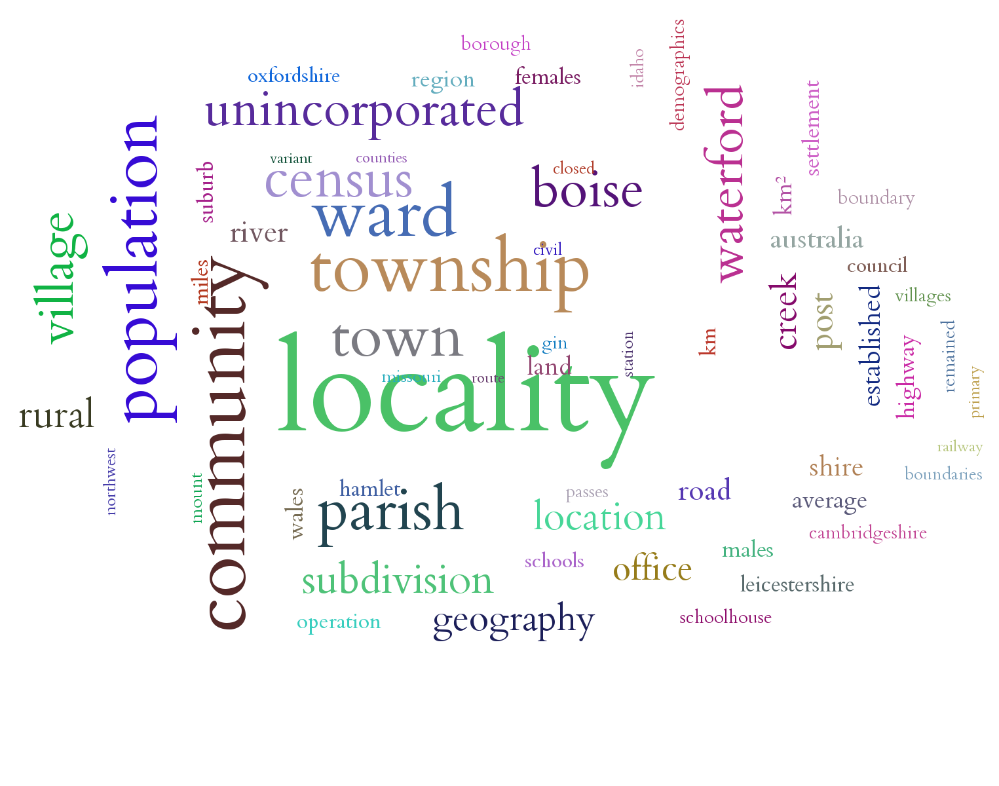

In [1]:
from IPython.display import Image
Image(filename='Wikipedia_64most.png')

In [48]:
leastWords = model.show_topic(weights.argmin(), 64)
create_cloud('Wikipedia_least64.png', leastWords, maxsize=180, fontname='Cardo')

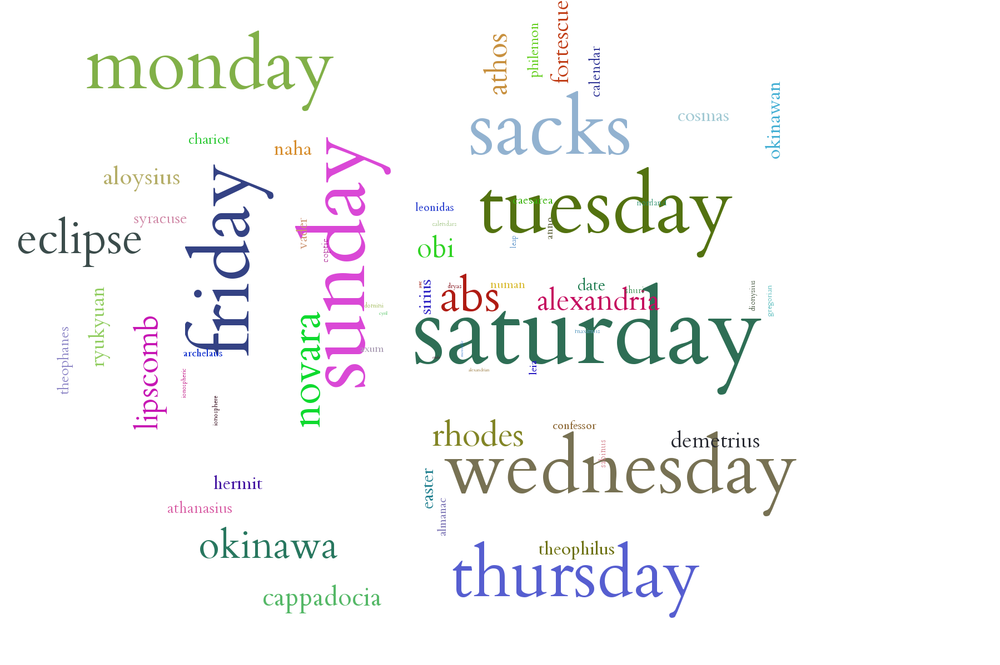

In [2]:
Image(filename='Wikipedia_least64.png') 

## Choosing the number of topics

In [6]:
# hierarchical Dirichlet process (HDP) is available in gensim
# Using it is similar to using LdaModel.
# But we don't need to specify the number of topics
corpus = corpora.BleiCorpus('./data/ap/ap.dat', './data/ap/vocab.txt')
hdp = models.hdpmodel.HdpModel(corpus, id2word = corpus.id2word)

Text(0, 0.5, 'Number of documents')

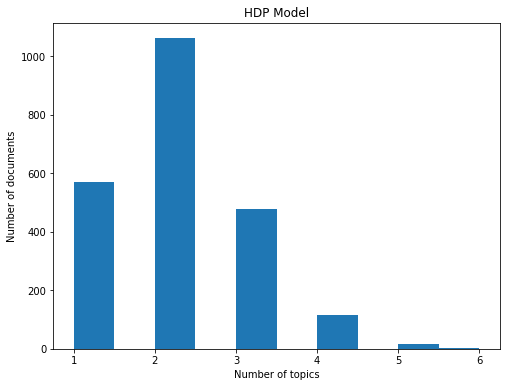

In [7]:
num_topics_used = [len(hdp[doc]) for doc in corpus]
plt.hist(num_topics_used)
plt.title('HDP Model')
plt.xlabel('Number of topics')
plt.ylabel('Number of documents')